In [1]:
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
import multiprocessing
import logging
import torch
import pandas as pd
from torch_geometric.data import Data, Batch
from torch_geometric.transforms import Distance
import torch_geometric.nn as gnn

from utils import *

import random

import torch
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
%matplotlib inline

from deep_rl import *
from deep_rl.component.envs import DummyVecEnv, make_env

import envs

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)    
    
    
from concurrent.futures import ProcessPoolExecutor    

/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


_ColormakerRegistry()

1
3
5
7
2
4
6
8
9
11
13
15
17
glug glug
reset called
[112.4409834793556, -146.9950237222349, -60.18896060508183, -97.08065522779387, -168.08209041072672, 75.44462739015523, 153.6033148790223, 177.37922455375156]
Data(edge_attr=[168, 9], edge_index=[2, 168], pos=[46, 3], x=[46, 3])


In [5]:
def random_policy(env): 
    env = gym.make(env)
    b, nr = env.reset()
    total_reward = 0
    done = False
    while not done:
        choice = np.random.randint(6, size=len(nr))
        obs, rew, done, _ = env.step(choice)
        total_reward += rew

    return total_reward

In [3]:
def plot_at_y(arr, val, **kwargs):
    plt.plot(arr, np.zeros_like(arr) + val, 'x', **kwargs)
    plt.show()

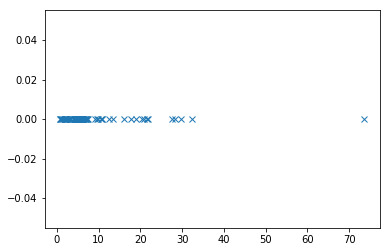

In [8]:
plot_at_y(np.array(reward_list), 0)

In [3]:
np.array(reward_list).median()

NameError: name 'reward_list' is not defined

In [4]:
other_reward_list = []
for i in tqdm(range(100)):
    other_reward_list += [random_policy('InOrderTestSet-v0')]

  0%|          | 0/100 [00:00<?, ?it/s]/home/tgog/conformer-ml/graphenvironments.py:761: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())
/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


step time mean nan
reset called
[178.1842945385327, -111.94524048923718, 71.85864986326261, -86.96591259078522, -179.86590323938847, -41.036354700117485, -167.6256997318163, -86.65576420495252, 61.84751427355578, 64.82739380900463, -54.54391682833701, -61.25596173558306]
action is  [3 3 3 1 3 5 2 4 0 0 4 2]
standard 44.518549998103026
current 64.76262799898997
reward is  2.0977164671400175e-08
new state is:
[-155.01294831900773, 76.37771465156251, 3.2832257256732973, 165.89134932818726, 59.13408612300248, 139.03671963695547, -62.68161004673825, 120.89080378348311, 170.201354473449, -175.08324126720095, 91.3030373282508, -62.528104509552655]
action is  [1 0 1 5 1 5 0 1 4 3 0 3]
standard 44.518549998103026
current 57.01318331012663
reward is  4.867297068915586e-05
new state is:
[177.08299080853405, -125.08826140894087, -71.13464337174786, 147.73533003692478, 160.5502980691376, 148.06332445293572, -162.21539030185474, -88.21201092256597, 62.541505210249, 54.47372618774573, 177.93822429546

standard 44.518549998103026
current 58.72531966329661
reward is  8.784488592166343e-06
new state is:
[176.41160505924898, -167.35669634708648, 70.1059314682549, 173.3578588383651, 166.03037026396072, -76.74816385511231, -83.46984774483315, -94.48945285664347, -174.74321530396756, 148.6772333362699, -172.10036184312276, 45.83992359877801]
action is  [0 3 2 5 5 0 0 5 1 1 0 3]
standard 44.518549998103026
current 61.68687333052561
reward is  4.5449600238358306e-07
new state is:
[-169.17641610646388, -15.120587222375955, -70.88438070320255, 159.37657525687516, 91.77797086034374, 175.7405066571678, 103.02969926397232, -166.13077923964005, -176.2707613774092, -63.94219064729915, -153.66694544896995, -56.072345421192786]
action is  [0 3 0 4 4 0 1 3 4 3 2 5]
standard 44.518549998103026
current 71.19981996256183
reward is  3.35822537382157e-11
new state is:
[-178.16000274548836, -76.15750324310494, 162.88088706442366, 87.95249870388984, 100.00833081769143, 155.1829886601692, 132.7474855899783, 1

standard 44.518549998103026
current 65.20437884046696
reward is  1.3486424784529476e-08
new state is:
[-73.6501179210777, -75.6347166828121, 170.08516622372719, -163.84640152772923, 72.07577888916283, -75.28906847351531, -98.5840432333819, 163.32667518643427, 65.30911724834309, 57.75557635687353, -165.54375074719803, 49.23194863605055]
action is  [0 0 3 1 2 3 2 3 0 3 2 0]
standard 44.518549998103026
current 56.80818800818275
reward is  5.974701081168741e-05
new state is:
[171.82088630626944, -176.29662371497903, 69.37928124896312, 172.88380620803116, -57.24812628087199, 60.749319624342185, -115.9500878152957, -55.99333544140395, 170.44773277899185, -64.35176531244446, -90.00226930725233, -164.92633108203162]
action is  [3 1 4 3 1 2 5 1 4 1 5 3]
standard 44.518549998103026
current 84.9085213432557
reward is  3.736770923921663e-17
new state is:
[56.47330746888549, -173.2587791423863, 106.32538284398622, -66.31035501094567, -78.01876967236817, -100.26367717668242, -166.68402642896493, -12

standard 44.518549998103026
current 60.565311009023134
reward is  1.3951419417611222e-06
new state is:
[-68.93988112157811, -95.06841132851284, 63.12908216610093, 63.280440814343095, 67.55391795259479, 167.81296851601786, -125.86140369480263, 72.27765841651069, 72.22136790931472, -57.182482030593754, -155.06077488443034, 74.28298408129658]
action is  [2 2 2 4 3 0 4 5 1 2 1 4]
standard 44.518549998103026
current 102.1962249574143
reward is  1.1602249235858737e-24
new state is:
[-28.59115940869137, -91.86205268725348, 116.91511863099265, 170.60935888987876, 86.88827366142962, -178.71107476336044, 101.37484641973843, -31.716961167416382, -2.6001413544850145, -19.019143957627175, -162.04765954463616, 75.01743408909338]
action is  [1 4 5 1 2 5 3 2 5 2 2 3]
standard 44.518549998103026
current 58.44661757044137
reward is  1.1607942928983276e-05
new state is:
[173.8283130531848, 54.06916992373861, 77.56994450529405, -166.60266650422327, -59.23225201695265, 176.00303371221176, -53.7231545803842

standard 44.518549998103026
current 55.77658859486952
reward is  0.00016762319519390175
new state is:
[-65.4661399248475, -95.69164132967298, 66.82420347419524, 58.04863151263444, 56.437275080090124, -79.79693628026935, 59.23819094190648, 60.81428585749729, -66.43351841666156, -173.57371296443597, -41.618759675922995, 74.83771535580522]
action is  [1 3 3 5 2 0 3 4 0 4 5 3]
standard 44.518549998103026
current 89.71145800816518
reward is  3.0662501645150245e-19
new state is:
[-126.49651845825879, 113.36034157450942, -55.5376715139478, -12.273490744268521, 170.773246659783, 172.21990380422986, -64.55457760446549, 99.72590509524848, 72.7171089978581, 71.66875277877753, -53.60458590273456, -81.78917883407355]
action is  [1 5 3 2 1 4 3 5 5 3 1 3]
standard 44.518549998103026
current 59.35334815510009
reward is  4.687779491566455e-06
new state is:
[-171.4677223531694, 64.4419871927151, 60.59011012557215, -93.87224811164371, -179.08332684178697, 63.11565032828271, 32.437447300531716, 68.1481804

standard 44.518549998103026
current 62.595161606711606
reward is  1.8325907128100965e-07
new state is:
[-57.205230808524554, 160.50930076288327, -76.62706949851838, 162.42560998981358, 148.21519261822968, 71.9258072834449, 131.57812145153932, -75.90614720380756, 60.4037422148186, 178.9907572357481, 88.27026312478728, -60.69814549613004]
action is  [2 5 1 5 5 2 0 2 0 0 4 2]
standard 44.518549998103026
current 57.018878385600594
reward is  4.8396562278003375e-05
new state is:
[-67.87949856019038, 149.32103325913394, -78.53940996415126, 175.93286264103872, 93.27904753219612, -68.75774163965662, 133.44174804494233, -69.9857921326993, -175.73295508375344, 178.89404792352215, 16.12087749747209, -64.12757121897998]
action is  [3 5 1 3 2 2 3 4 2 4 5 5]
standard 44.518549998103026
current 88.14728283113637
reward is  1.4652786868052673e-18
new state is:
[-65.09813742876786, 152.7858380220504, -22.546502111025056, -89.12024622324017, -73.62808099834547, -31.35523534954073, -57.52084823650427, 68

standard 44.518549998103026
current 53.581260392456464
reward is  0.0015057505798739927
new state is:
[72.624600864578, 99.38287480798967, -61.60593402035524, -177.7275287917691, -78.74786130265024, 39.303088577546795, 138.38497869800136, -71.18719275304952, -176.101928677027, -68.60105350473333, -165.8015109989773, -160.41271310784896]
action is  [4 1 4 0 3 0 5 0 0 4 3 1]
standard 44.518549998103026
current 68.75218044275458
reward is  3.882452721794585e-10
new state is:
[92.61945224082663, -100.71311173560771, 52.96385523073074, -173.80318245995218, -62.44714364172922, -139.3245945916923, 71.6551152341597, -163.57705855468498, -174.50039846691809, 52.865851186892726, 36.13761941297053, -161.0489526061279]
action is  [2 4 0 5 0 2 1 3 5 0 2 5]
standard 44.518549998103026
current 64.44312968874436
reward is  2.887374658893587e-08
new state is:
[-77.69248283364263, 157.92474249260823, -127.62371251809846, 55.936687319308994, 176.68979968006664, -78.03349050057324, 163.99655131289256, 88.

standard 44.518549998103026
current 64.93322617937238
reward is  1.7687112536437815e-08
new state is:
[70.39237526443667, 102.0235371106945, -73.86604123227185, -61.419749188300884, -46.22396322073547, 82.4819252998078, -50.81920301874177, -119.46873188588386, 63.73324166019693, -44.741528061941096, 57.94442101933355, -167.71915479798233]
action is  [5 0 0 0 2 2 2 3 4 3 0 4]
standard 44.518549998103026
current 65.13403716238392
reward is  1.4469243896293126e-08
new state is:
[178.97488809247295, 74.95023227022652, -151.5720219189717, -173.62266360497696, -91.38463830229034, -58.87674848808481, -47.656109812369465, -60.656882307126146, 66.16332757550389, 28.844987635701166, -138.72512037096627, 60.129113276319686]
action is  [1 4 1 2 0 2 3 5 2 2 4 1]
standard 44.518549998103026
current 61.64405588473115
reward is  4.743789921612283e-07
new state is:
[175.16364451045925, 68.24697381836275, -95.76659621846854, -89.13452083754493, -162.71116254803377, -124.4214814916908, 77.54174621094278,

standard 44.518549998103026
current 56.617634789044644
reward is  7.228902939975556e-05
new state is:
[69.40059055978764, 111.83688695969461, -71.70108515955607, -177.7686961601021, -157.77435657952003, -165.7538849225022, 123.24771742535016, -64.09083362283442, 172.10246451236225, -72.83109440077008, -80.52653560566046, 59.37640202145911]
action is  [0 1 2 4 0 5 4 3 1 2 5 0]
standard 44.518549998103026
current 51.071375828030455
reward is  0.01852601688909135
new state is:
[-176.23881609327483, -71.5837355739242, -62.57349417952239, 120.28153927486751, -161.19709247448407, 33.51794619541886, 67.80749621921764, 63.924748872981695, 179.1837220474673, -70.37958307265815, 176.01230411206458, -168.85216826635116]
action is  [4 0 3 2 5 4 5 3 2 1 0 3]
standard 44.518549998103026
current 56.150334296200384
reward is  0.00011535021785788584
new state is:
[-179.06471155522004, 113.47697460114308, -58.92649004184187, -95.97253502586412, -169.88572493997256, 66.47419191866537, 100.9270077977557, 

standard 44.518549998103026
current 69.5532737101776
reward is  1.742592298544333e-10
new state is:
[85.08302059518057, -74.18876184183412, 104.43559278620005, -173.44792647545802, -97.8210021025237, 58.81538224232357, 118.92107550368883, 167.22746545669995, 176.96403823136396, 58.37029072789213, -89.35697511049264, -170.56019249746603]
action is  [0 3 2 3 4 5 0 1 5 3 0 2]
standard 44.518549998103026
current 54.62073951500924
reward is  0.0005324918831078226
new state is:
[-177.79449044055852, -61.04955326028912, -63.06910972084649, -71.18193640753795, 108.27108308776862, 81.9110752419951, 172.92994183104267, 173.69334794737244, 179.58692275954897, -51.880867291806574, -99.58490147662135, -71.01864373789256]
action is  [5 1 3 1 4 2 5 2 2 4 3 5]


  1%|          | 1/100 [00:24<40:34, 24.59s/it]

standard 44.518549998103026
current 68.95650518834984
reward is  3.1649661268220855e-10
new state is:
[76.74206209602549, -70.43123870141963, -53.16815331588439, -175.70492424024516, 156.70040560488164, -90.62515780691045, 109.8971955318375, -60.71965844161916, -93.15269600338806, 60.841231027206554, 31.155248187420778, 59.34408116807331]
step time mean nan
reset called
[-58.097280287224564, -54.65553597512618, 64.77525215636862, -67.3200222651695, 50.71180061647571, 8.728599448348843, -64.84876687362846, -53.86412893706081, -59.123440009627416, -157.24240946783863, -156.21365676316233]
action is  [3 3 3 0 4 2 3 3 2 2 0]
standard 76.34153182259297
current 95.22444686805692
reward is  2.3762591396783122e-08
new state is:
[-58.14642328132874, -60.24244705808166, 91.57125357852101, -128.30605086041666, 66.09287700726944, -42.67010269588847, -63.443899712745214, 87.76612328493748, -68.23242008102363, 52.074450767277405, 172.51995527292874]
action is  [4 1 5 0 1 0 4 4 1 3 5]
standard 76.341

standard 76.34153182259297
current 109.44918868344435
reward is  1.5782177493993486e-14
new state is:
[-144.13061566270733, 53.86999682452418, -170.32757319975164, 41.42563151411757, -96.8880090629383, 101.40620878389709, -97.33985479550623, 95.3370862956967, 53.70624391366844, -104.91098399256077, 73.34777838491402]
action is  [2 4 0 2 1 5 4 5 0 5 1]
standard 76.34153182259297
current 103.19336100892468
reward is  8.223152835693735e-12
new state is:
[-54.814371854170645, 71.45891316743105, -177.44927915754175, -93.47861523343379, -90.2103253029494, 140.46827903835006, 57.61578068451134, 144.74224435341014, -147.76504247700478, 90.35127448073655, -154.23147225997633]
action is  [4 4 5 5 5 3 4 1 1 0 3]
standard 76.34153182259297
current 110.77111721770214
reward is  4.207853930029499e-15
new state is:
[57.68710219221776, 151.54481822442628, 125.70566023644038, 23.430106516164418, 149.3453827142784, 64.49652232581522, 93.52732853580434, 178.07802285483035, -149.3951546232061, 172.9836947

standard 76.34153182259297
current 82.29281580370774
reward is  0.00981815340565618
new state is:
[-107.85912966911012, 175.56540422977002, 79.90884852971905, -159.83416604232548, 74.23971345688096, 105.61758221729886, 66.47648825728808, 169.6918301813216, -67.85963523497401, 75.07166007963684, 175.3740874464101]
action is  [5 0 2 2 2 0 0 5 5 2 2]
standard 76.34153182259297
current 122.51273215003354
reward is  3.3476656934438376e-20
new state is:
[63.76029843636869, -170.5513179190139, -66.32205684153693, -101.0071496451281, -36.017351918624534, 158.8575265893912, 153.5471831973155, 155.65473794814898, 148.6797657811387, -75.72359516521661, -103.46682891340757]
action is  [5 0 4 0 3 2 4 1 0 2 0]
standard 76.34153182259297
current 99.9313186482885
reward is  2.1464726497897766e-10
new state is:
[-179.61362855473524, 177.96759962952717, 77.69543905518313, -151.30145941539604, 66.64061651304868, -66.60749669655372, 114.78790494537866, -99.92984425350777, -175.56959121186975, -68.80461854

standard 76.34153182259297
current 95.03710672300119
reward is  2.8658574966341967e-08
new state is:
[-169.74609577734117, -75.00803080855478, -98.98329448301982, -97.64130248671992, -66.71121435742715, 161.30513802392403, 134.87747733239564, 173.74502990455852, -170.48750582634895, 178.10674048464068, 76.67641055802282]
action is  [4 4 1 0 5 5 4 1 1 3 0]
standard 76.34153182259297
current 103.413502740764
reward is  6.598299473765715e-12
new state is:
[66.18424960731676, 61.63680741023871, -164.9112613319535, -169.7793517868443, 64.17730351640533, 44.99980888872866, 60.26127490667155, -52.76300989697143, -79.84617843431603, -90.83774033947772, -174.52242979340497]
action is  [3 1 3 5 3 1 4 2 4 5 0]
standard 76.34153182259297
current 115.92739508570497
reward is  2.425032873482245e-17
new state is:
[92.13546508772377, 103.10237024685033, 76.64680805521579, 142.97606806779947, -58.20663350060461, -110.04467612884244, 46.57082014240291, -39.98179377530588, 69.18525676126893, 163.24487959

standard 76.34153182259297
current 87.35975611275097
reward is  6.187078085687477e-05
new state is:
[-167.54244886485583, 78.98526788449325, -175.9826336605979, 163.4874739707581, 93.16658860422899, 66.33474228178987, 167.53400450631813, -83.1516614170681, 83.39353070452793, 58.38146001127797, 90.8026870418734]
action is  [2 0 3 0 2 4 4 1 0 4 3]
standard 76.34153182259297
current 140.26211008760558
reward is  6.55066192246807e-28
new state is:
[-74.60644483328484, -166.72148510212227, -55.738927359745794, -121.5442814752714, -120.0585426227108, 7.205683644726525, 61.533378624460326, -38.20452295074286, -159.79779232205303, 125.15121407554176, -85.28848183217121]
action is  [4 5 5 3 4 4 2 4 3 2 4]
standard 76.34153182259297
current 115.52393959469595
reward is  3.630246569244869e-17
new state is:
[63.61049623257818, 162.61934702409573, 122.01767062719006, 57.3795960596474, 109.62092415622695, 91.33504412801945, -70.81576116419862, 98.26415260595857, -64.36224119489768, -63.3631071660058

standard 76.34153182259297
current 96.58276363630712
reward is  6.109199719612464e-09
new state is:
[178.16484983720852, -85.28833633280782, -167.22820792325962, -158.16979618517712, -49.384155320108746, 68.46135840934699, 81.93725300061173, -61.18360193199136, -102.86633315192292, 167.83722541131888, -41.43105790479257]
action is  [5 2 4 3 2 3 5 5 3 5 3]
standard 76.34153182259297
current 106.32701084867382
reward is  3.5818840947640384e-13
new state is:
[169.33279922615685, 45.47401345915, 81.41007623810982, -107.27555625667061, -74.10311606842593, -27.447667850062178, 148.5256183794487, 145.0674629523428, -88.15462599348656, 147.6810752338777, 60.59309035584456]
action is  [0 5 3 5 2 2 1 5 0 2 0]
standard 76.34153182259297
current 113.89007747985427
reward is  1.860002056239067e-16
new state is:
[-120.02581094912422, 135.39821299501236, 143.03730419465865, 63.59121700146008, -67.14090063223779, -70.61366271893317, -65.67091729516093, 117.16921765924812, 178.51961566154452, -59.14569

standard 76.34153182259297
current 93.0039791065815
reward is  2.188924067128881e-07
new state is:
[-65.96755774894878, 79.55122002775752, -62.35600069774814, 47.953251847296606, -129.9512488923937, 42.05670878868928, -84.09974654902575, 57.38602022804651, 78.3015427254584, -95.64989044545841, -167.25694191050462]
action is  [1 2 4 4 0 1 4 3 0 0 2]
standard 76.34153182259297
current 122.46966446827292
reward is  3.4949916158585e-20
new state is:
[-80.38337484065543, -62.13441140652533, 90.00324661718642, 62.49997490708277, 67.61833379804908, -101.31423250173029, -4.653145492528363, 43.93748147064645, 163.12636470091536, 159.51263031417983, -47.13823922371427]
action is  [2 2 4 5 0 1 3 4 4 1 4]
standard 76.34153182259297
current 95.40738010252447
reward is  1.979005066219528e-08
new state is:
[-100.73573917323853, -70.48457589579981, 59.175401675110955, 135.0160305108516, -122.03511825180757, -164.11491700797666, -44.63222444739267, 54.633137668726995, 82.57986740152587, -49.14436088204

standard 76.34153182259297
current 111.94058014827537
reward is  1.306680343200059e-15
new state is:
[-165.68884191992265, -149.01834967845406, -53.79562079124096, 59.493176647935634, 87.13145294515465, -128.89697572270623, 82.18997156113203, 58.21635672836344, 54.89149712959259, 56.80569609930101, 110.53317051285815]
action is  [1 0 3 2 5 1 0 3 5 3 1]
standard 76.34153182259297
current 106.32503846475777
reward is  3.588955917223537e-13
new state is:
[-172.27205576550386, -117.01303638414558, 64.6333782368748, -55.75023218054585, -154.64772430916884, -142.29267848701357, 103.76141866146394, 85.69580337383913, 84.1486324091295, 67.34574230233105, -170.32534288153613]
action is  [2 3 4 4 5 1 0 1 5 1 0]
standard 76.34153182259297
current 101.4371442337821
reward is  4.761607752437397e-11
new state is:
[-157.74241329787932, -29.539635879063034, 73.10508884868919, 159.26969906117364, 43.17037503646138, 176.2954889341846, 158.72072448755003, -79.70050984385388, 91.41622626511212, -91.292769

standard 76.34153182259297
current 104.22876041123362
reward is  2.9199143681490946e-12
new state is:
[71.70213776852547, 88.4780828564777, 138.72089962328025, 137.19115050412012, 100.44026046046504, 71.00184462293208, 107.60045222938774, 178.33336899615554, 80.38378212532244, 111.3454564641474, 77.08193112837066]
action is  [4 1 5 1 1 4 0 1 3 1 2]
standard 76.34153182259297
current 117.9920084928815
reward is  3.0765743875676723e-18
new state is:
[161.10420664894872, -114.35813912167089, 144.33843003913398, -134.6537755136806, -138.48866525181555, 59.917132499781204, 132.3567138557848, -70.88964264135474, 40.243433379884564, 147.90842531382475, -91.72863702250179]
action is  [0 5 2 2 1 2 2 0 1 0 4]
standard 76.34153182259297
current 108.61010415998679
reward is  3.652386271927843e-14
new state is:
[176.3294454750678, 82.3063244540541, -53.5294081913495, 31.316328013738058, -143.2381672699374, -89.46056131883503, -51.716079125399894, -179.30292091261921, 167.94438305160983, 166.7359955

  2%|▏         | 2/100 [00:49<40:15, 24.65s/it]

standard 76.34153182259297
current 97.311687309215
reward is  2.9472487642779295e-09
new state is:
[-95.7374426000095, -64.29774761417787, 63.41166127161235, 135.78304521084047, -171.37983432305944, -79.64769535444663, 75.4223524397069, -78.08766527004823, -19.60919047054399, -75.06811733857924, 173.43867111237253]
step time mean nan
reset called
[167.63001184973527, 68.06728589951926, 103.68245313881548, 47.5850442316196, 84.32963961162552, -165.30861940715386, 67.18189559774633, -73.82790051975648, -179.33659930566188, 178.46832927702997, 163.16738176425315]
action is  [5 1 3 5 5 5 1 3 0 5 5]
standard 76.34153182259297
current 102.90555169791922
reward is  1.0965598939113388e-11
new state is:
[160.25348773865244, -89.80950504739428, -75.85123479608994, 72.2374605382374, 74.01098964460692, 171.34616234203506, -137.8813064767374, -38.963041670616306, -167.7838403751053, -162.85383349280494, 146.63048319435228]
action is  [5 2 0 1 1 2 5 4 0 1 4]
standard 76.34153182259297
current 119.66

standard 76.34153182259297
current 121.4261931039995
reward is  9.922474552642752e-20
new state is:
[171.11233193979467, -25.741204489993034, -70.92411633686797, -138.39673158679133, 82.81430766882647, -128.79837306488847, 151.4858276751865, -156.9327848453363, -115.56368382754488, 72.85776886702865, 51.09936648250692]
action is  [3 3 3 5 5 1 3 3 2 0 5]
standard 76.34153182259297
current 91.54113428879191
reward is  9.452270217833772e-07
new state is:
[68.37616146217573, -69.02225818549199, -15.830452276070538, 74.76757894872391, 92.57294847793169, -110.65451806588969, 54.500865938187424, -64.85785718003288, -79.52823742912575, -161.1995763337263, 141.87100549840136]
action is  [0 1 3 2 0 1 2 3 1 5 2]
standard 76.34153182259297
current 103.40135109178752
reward is  6.678968833029786e-12
new state is:
[163.3289504597261, 158.25894653834177, 60.80983230796742, -65.22714461253362, 163.73597701811647, -77.16378053618502, -31.364752154522918, -2.4040461204043044, -109.55504575686682, -151.9

standard 76.34153182259297
current 97.69424803304999
reward is  2.0103551320478805e-09
new state is:
[88.83810207079374, 63.45521245554247, -168.07660228275185, -125.35802831963852, 62.77781984218997, 66.04169169471061, 26.86909789557932, -141.48168860573426, -128.69481775031574, 57.46723496074661, 52.03971740756992]
action is  [3 2 3 2 4 4 0 5 1 5 3]
standard 76.34153182259297
current 116.7708815865141
reward is  1.0432685064531674e-17
new state is:
[-56.62538717308701, -60.99429040987932, 86.60572013233617, -98.39511024508604, 58.046591976166084, 64.47671633386123, -147.23941421973808, 126.13900978012217, -89.8903772749485, 114.37789680906673, -82.09414797919926]
action is  [3 0 5 2 5 2 4 4 3 1 3]
standard 76.34153182259297
current 95.88671668750565
reward is  1.2253881385728873e-08
new state is:
[-158.93377883687964, -141.9704385361274, 57.27746490826302, -44.01406383665667, 135.89452814002874, -70.28991671690183, 36.77562102562837, 64.40460563278363, -88.47639851530954, -153.909549

standard 76.34153182259297
current 114.20855099692336
reward is  1.352702003414123e-16
new state is:
[-106.0219903346082, -93.78374363304086, -76.96961057539383, -13.89979081140651, 133.8346396118603, 73.52977870518058, -9.759638527031212, -165.69670663238887, -179.29696819378864, 48.5136319576763, 69.2018058862013]
action is  [4 4 5 5 2 1 0 5 0 0 0]
standard 76.34153182259297
current 115.70597174951894
reward is  3.0260811014955725e-17
new state is:
[68.41272448441663, -10.445899261504376, 174.69932102331492, -166.481512024151, -100.6747827293336, -92.83673942168964, -158.80173835023407, 53.49791381408342, 175.55498030173854, -158.89443306651424, -123.48960685574892]
action is  [0 4 4 4 1 3 5 2 4 1 1]
standard 76.34153182259297
current 109.1045942861924
reward is  2.2275238801315886e-14
new state is:
[-168.92139046552094, -27.577473068862293, 61.66925104493458, 86.25607583306635, -95.96314286686501, 29.53607200327662, 71.786289374797, -54.2804344246407, 83.15915572261177, -129.6605076

standard 76.34153182259297
current 84.05237118042045
reward is  0.001689914073805977
new state is:
[68.40549380262726, -107.72344443160364, -162.43554331969767, -72.96988453925715, 144.38525798459506, -87.48632983071633, -1.7893941971865988, -158.27233035930604, 177.7707790353313, -173.63247318037895, 154.65457560348278]
action is  [0 4 0 0 0 4 4 4 4 0 1]
standard 76.34153182259297
current 96.10679232773161
reward is  9.833226344456506e-09
new state is:
[-159.45456702534577, 60.93957581771337, 176.46926260260827, -151.64764907122517, 83.14615698766377, 55.50139804004328, 35.51134058239866, 92.24438604719997, 68.0622569774373, -155.06169273999654, -81.39845033180404]
action is  [3 3 0 2 3 4 2 1 5 2 1]
standard 76.34153182259297
current 111.77719059461867
reward is  1.5386099600489078e-15
new state is:
[27.57120039070199, 79.99037519602567, -147.23220358562904, -114.08388864965683, 66.07787040920856, 102.86215989080793, -50.613907489261386, -159.5725468969295, 96.95348087160032, -106.304

standard 76.34153182259297
current 123.71680052698028
reward is  1.0042037290645393e-20
new state is:
[-156.107060229233, 85.12548936517321, 72.57788869365795, -49.429332637720364, -36.44470675917074, 145.61728312402553, 161.78516917516527, -72.97088402626004, -77.20300596050673, -167.19849859033195, 144.29655416053703]
action is  [3 3 3 1 1 5 5 2 0 1 5]
standard 76.34153182259297
current 115.19383081434985
reward is  5.0501065987499354e-17
new state is:
[-60.95332984049606, -6.442209692504679, 88.95386661307363, -146.1129599447054, -126.32200207594234, 127.91574508658897, 140.20773671390242, -85.52480536716229, -147.73116793401977, -160.60162571355016, 135.86054831970208]
action is  [1 1 1 5 5 2 3 4 4 3 0]
standard 76.34153182259297
current 101.47615558088843
reward is  4.57942766903602e-11
new state is:
[-72.80245364583473, -139.44372918588064, -54.91603996401142, 126.72724663347019, 65.3065271053398, -75.02995353010695, 36.30872795720966, 81.52763146788351, 53.48783538970009, -68.28

standard 76.34153182259297
current 90.24298489597894
reward is  3.461905801681783e-06
new state is:
[-162.64919744512275, -17.848486237493933, 168.04339839550684, -67.6286848252589, 167.94742348000014, 131.8805040007777, -88.66770522609885, -171.3130919187708, 50.22127735885087, 161.36920749014746, 67.20013287355994]
action is  [1 0 1 1 1 2 0 5 1 0 1]
standard 76.34153182259297
current 87.2012073838829
reward is  7.250073931524452e-05
new state is:
[-165.21776243341176, -174.39458944907196, -78.49273410923085, 177.65545611959826, -72.99423738676596, -39.25789692480644, -138.37330849259072, 74.44688850356657, -163.0464107958047, 163.16991380741763, -141.5087960074877]
action is  [4 0 0 4 0 1 2 0 4 2 0]
standard 76.34153182259297
current 95.74386845344016
reward is  1.4135522687186205e-08
new state is:
[90.19065490692451, -143.3903426221576, 151.41681994466558, 77.99681145229042, 153.00242012805577, -84.0034679952301, -95.44799348117016, 176.11234737862978, 116.92491355683066, -64.253379

standard 76.34153182259297
current 107.62013584753022
reward is  9.829116375860601e-14
new state is:
[-178.63251891793928, -54.25476059659504, 99.23292654188533, -125.34333365554744, 155.84197118747528, -56.17669830093275, 38.32692998861985, 94.91944340326808, -171.16175929838076, -73.88142508006091, -174.29920712509434]
action is  [0 1 3 0 2 0 4 1 2 3 4]
standard 76.34153182259297
current 120.40526647086934
reward is  2.7542464413967426e-19
new state is:
[-169.51496537483513, -77.32843081881815, -46.59457284690809, 176.18826541302582, -71.23489189609835, 162.89356253349936, 72.14242181985577, -62.1969739563952, -71.63782703254608, -135.26231378852913, 61.81107375492485]
action is  [1 5 3 4 1 3 2 5 1 3 4]
standard 76.34153182259297
current 85.18609730734805
reward is  0.0005438681443651997
new state is:
[-60.542977046490705, 99.89751011165163, 62.90077873021532, 73.1087449465472, -51.04689315776041, 57.46109234075704, -77.2849846061514, 88.21594886428063, -100.81561009436444, 68.720675

standard 76.34153182259297
current 96.65289953728765
reward is  5.695405999281159e-09
new state is:
[170.9642958837088, 85.596836425646, -52.02632436547006, 87.49374471013682, -54.127262259191966, 20.584841557746326, 96.87495682989395, 89.19597101957764, -84.86647954854512, 39.63578879407421, -62.12310914701368]
action is  [0 3 2 3 4 3 3 3 3 2 3]
standard 76.34153182259297
current 160.31056143138142
reward is  1.2863329573327127e-36
new state is:
[179.59420695103358, -4.703714523865281, 73.05170260301256, -48.15958089422984, 44.58666248832687, -33.368566235831786, 66.45145875944621, 164.84506138662795, 0.5935662183259894, 64.20307074599091, -79.79754117048019]
action is  [0 5 2 2 3 4 5 3 5 2 1]
standard 76.34153182259297
current 108.70919731615002
reward is  3.307814075062861e-14
new state is:
[165.7706070754021, 152.73174506971077, -58.469038846780386, -63.793742870686415, 83.71256156266801, 3.080828649810275, 72.45413000870933, 64.54927217334281, 98.05691869966236, -51.30001263127984

  3%|▎         | 3/100 [01:14<40:07, 24.82s/it]

standard 76.34153182259297
current 128.18781822873686
reward is  1.1483744289150517e-22
new state is:
[-78.10459754703939, -31.114810861462637, -60.780016358728666, 114.65899906424586, -29.985924246758476, -68.20320555901009, -96.44767127416812, -56.905051921066246, 93.59670106312655, 55.42010680445858, 91.5708473893876]
step time mean nan
reset called
[-122.90512684735229, 64.5009887504665, 64.4440422942395, -165.73730524927353, -131.17571608771698, 167.27274706212688, -170.31867192392545, 72.65467906062901, 73.63489039755329, 177.40110450008353, 70.6995027728214, -81.43582981914057]
action is  [3 0 0 5 1 4 1 0 4 4 1 3]
standard 60.15566575918814
current 90.83915650786551
reward is  5.426996849009605e-13
new state is:
[58.69627784219011, -174.22907712242875, 171.0954311501449, 87.2750670978968, -80.54880994557709, 68.40707043957522, -131.0368599672058, -124.73113384350486, 85.21151324844118, 70.7902441761779, -146.90824102030024, -66.70509091057758]
action is  [2 4 5 4 2 0 2 1 5 5 4 4

standard 60.15566575918814
current 102.1579169383883
reward is  6.589984186657963e-18
new state is:
[-168.2174872486565, -44.0433198109336, 157.20556205307014, -12.21334290098718, -123.30345555434457, 81.51545711805099, 85.89796190455634, 83.18896799136897, -51.08637139724608, -171.45740506652024, 70.94497140509374, -167.65701533716015]
action is  [2 1 1 5 3 0 1 2 1 5 3 4]
standard 60.15566575918814
current 73.84136783227491
reward is  1.3079929277555345e-05
new state is:
[-66.09469407614485, -67.97750684831315, 179.68689981379396, 85.77188307795534, -41.12666362473215, 136.2478398839346, -84.90786199994271, -66.65842434507965, -97.91711812865263, -176.368856921414, -38.856500786309525, 68.04135310472796]
action is  [5 2 2 4 3 3 0 5 2 0 5 1]
standard 60.15566575918814
current 101.45626581497758
reward is  1.329252799309371e-17
new state is:
[-176.66635626487962, -61.25661198372181, -43.24767857631417, 40.74001349091269, 83.71975821353254, -67.0429704748876, 174.9256223397314, 39.258015

standard 60.15566575918814
current 73.19365348389472
reward is  2.499793665044533e-05
new state is:
[176.2299392312246, -153.50971857127067, 167.99280681239503, -129.86850034221087, -167.61818729891922, -34.2284394436146, 44.733664300117226, 171.7612238930285, 175.9725239301692, -163.9663139283227, 74.8568272023222, 54.76272353369637]
action is  [5 0 0 1 1 5 5 0 0 1 2 5]
standard 60.15566575918814
current 82.05188284333609
reward is  3.554872533371472e-09
new state is:
[175.4310904777263, -176.00362851481097, 70.19746672223779, -83.05105364745982, -63.487835191995835, 137.7746843398083, 178.1579093895641, 153.4445368037117, 142.10820098928608, -172.86435350152846, -65.2681492154851, 116.83585904568592]
action is  [3 4 0 1 5 3 5 0 1 1 2 0]
standard 60.15566575918814
current 73.84235843202501
reward is  1.3066978718351094e-05
new state is:
[-90.49360875459466, 44.915937909459295, 161.42011339076515, -99.43421384419197, -167.2474528502934, -44.5192762182445, 177.50313864666666, -174.49381

standard 60.15566575918814
current 93.54375614770771
reward is  3.6305035861410855e-14
new state is:
[-177.3705870180871, -68.94917305075448, 130.8114289394942, 75.45908524921762, 72.1511984036359, 102.15730082441931, 116.86547395012337, 35.06933190602678, -175.4090978651831, 165.79065394422705, 155.3001102503787, -77.89472456726988]
action is  [3 2 2 5 1 3 0 1 4 4 2 0]
standard 60.15566575918814
current 88.43969160265166
reward is  5.979074120857641e-12
new state is:
[-59.98480801788832, -54.49443967219753, -54.45508000032844, -171.0263402696202, -157.87294324289124, -83.97535615883719, -120.23166298550476, -114.4277146203089, 86.67402553821198, 96.80719587220676, -68.95240576531496, 162.1855116604122]
action is  [2 5 4 3 1 0 1 1 2 4 0 1]
standard 60.15566575918814
current 74.24420462545542
reward is  8.74290177924553e-06
new state is:
[179.2528574156846, -154.89723650530377, 78.41958053108837, 34.42076573787684, -147.06332954484657, -178.27967740456313, -166.156053125165, -74.9595996

standard 60.15566575918814
current 108.91361938117811
reward is  7.672202908103116e-21
new state is:
[-175.54003540639556, 61.696387815911436, -89.04855210963325, 32.63914130471825, 87.25356735877881, -67.49536319954754, 84.52478952829857, 167.62602889519192, -152.08008739076283, -120.76850036513342, 130.26385894157912, 166.75232680002742]
action is  [5 4 4 1 4 4 5 2 2 3 2 2]
standard 60.15566575918814
current 97.54716404840615
reward is  6.626877002714852e-16
new state is:
[172.22563355602318, 39.659030702593576, 64.48543600462885, -103.56508505209341, 47.32230655817846, 25.548120455016438, -169.7071825391034, -37.191095119285826, -80.63466332756242, -61.941474637906246, -63.01694641637325, -81.56666298277658]
action is  [4 5 4 2 2 3 0 2 1 3 0 5]
standard 60.15566575918814
current 70.09734874907272
reward is  0.0005528562501778905
new state is:
[148.599525133932, 36.70361299802098, 64.23061611594532, -72.80169116241757, -62.466085784046484, 60.16037848403806, -144.4953193678213, -36.0

standard 60.15566575918814
current 111.26675665462905
reward is  7.293996442453113e-22
new state is:
[165.563694339178, 54.440331301884015, 72.11598966721589, -143.18997737278931, -25.21211801176611, 40.086346365557525, -20.70099192025027, 93.35319277155061, 59.08742587304806, 176.05263526817066, -97.07026899642278, 53.438242850209214]
action is  [5 1 0 1 5 2 1 4 0 3 0 5]
standard 60.15566575918814
current 70.20148716877698
reward is  0.0004981790759246059
new state is:
[70.89126520428677, -98.55418192133929, 178.53949068761636, -78.238512195424, 71.49943234579602, -59.60190687202723, -174.76734544617463, 69.24958759066193, -132.740665896042, 166.49137573319203, 167.31352032198936, 158.93613891531447]
action is  [4 0 1 1 2 4 4 3 3 3 5 4]
standard 60.15566575918814
current 89.24801607363719
reward is  2.6642997249144305e-12
new state is:
[73.54414252595052, -158.7962811379664, -53.112746064276614, -120.08358222049992, -73.57700806906766, 83.431744826191, 101.53114878285011, 24.015612125

standard 60.15566575918814
current 91.15899998404879
reward is  3.941425414780156e-13
new state is:
[-64.86354928556572, -58.26728851252166, 92.45804818839608, 83.10525733791695, -96.2918781589967, -76.33280586304777, -60.33524560290998, -25.243083763136532, 95.38741535683448, -174.25570434541257, -56.87428409888505, -104.72364654466357]
action is  [2 3 0 5 5 5 0 5 1 4 0 0]
standard 60.15566575918814
current 84.57892389928648
reward is  2.8401681099463513e-10
new state is:
[-65.47972986417115, -40.57177515408576, 170.9718086020595, 47.62101198678122, 177.57709862497066, 92.70029579969098, 141.70681314792043, -174.44754646082944, -117.49516804050077, 68.02034237602298, 164.75347597996154, 176.80171760367372]
action is  [1 3 5 0 0 2 4 3 2 4 3 5]
standard 60.15566575918814
current 65.05923368056841
reward is  0.0852388922787607
new state is:
[-175.1077703028764, 49.87966768413742, 60.48846192040606, -146.74933806094404, -168.4719827573414, -104.31036325546626, 169.79537857495018, -53.7319

standard 60.15566575918814
current 91.1136469825155
reward is  4.1242964176372406e-13
new state is:
[76.81100555199279, -135.38070478393755, -57.892605823988546, -176.7139949833391, 53.68085037026243, 165.5178795685942, -82.00902985946763, -77.34840584977664, 90.47454883856447, 40.069811840783196, 43.671456755176806, -67.02720082548642]
action is  [5 5 2 0 5 3 0 2 0 1 4 0]
standard 60.15566575918814
current 71.1604436880388
reward is  0.00019094837113934482
new state is:
[179.67457029575394, 63.20803634171227, 49.30613462045345, -176.79279739350022, -141.9796800915206, -70.66930641466028, -133.93484395798924, -63.17222851426444, -135.95958925580564, 175.1110587974555, 63.80273893520763, 175.9481547466277]
action is  [0 2 5 3 5 0 1 2 3 0 4 4]
standard 60.15566575918814
current 78.53684401302444
reward is  1.1950497918604077e-07
new state is:
[-172.5793759601397, -56.298765074378494, 176.9787664437129, -60.5378428971546, 103.17578874619211, -170.13096234445132, -155.554410664043, -53.130

standard 60.15566575918814
current 75.77252321907604
reward is  1.8963359032425617e-06
new state is:
[107.95742355032813, 160.07654167514465, -176.4360122667837, 155.0822477528735, -69.71749416297813, 65.07488152415993, -143.24917125745526, -38.99070868800302, -147.29859965567917, -152.1891640122424, 78.49283923419395, 86.54113924103571]
action is  [2 4 0 5 0 3 0 2 2 1 0 0]
standard 60.15566575918814
current 77.84202593174574
reward is  2.394096541162746e-07
new state is:
[-109.85585350879985, 62.92007563969822, -119.83593176178665, 48.45439834998752, -164.4779124263406, 54.6907101996593, -164.81589937534366, -0.25587400203716576, -107.72638833440986, -70.70636620033282, 159.47791751380203, 158.24249444146153]
action is  [5 4 5 3 4 2 5 0 5 0 4 5]
standard 60.15566575918814
current 97.49875493951454
reward is  6.955569891183871e-16
new state is:
[-178.05403369691075, 62.06883962771278, -158.90290751489675, -29.796021773032837, 86.52324657855817, -88.83496571987615, 83.61706967322039, 12

standard 60.15566575918814
current 87.75430969246165
reward is  1.1865649590812054e-11
new state is:
[-176.63814860496092, 175.72572452761958, -74.78340118346779, 163.45554004497532, 113.62699928760318, 55.3209646927972, 46.37369541080161, 92.31902539939425, -58.09466424091734, 172.96307835613717, -57.68706428698707, 71.04849015923013]
action is  [3 0 0 4 2 3 0 2 0 5 2 1]
standard 60.15566575918814
current 107.63864830274402
reward is  2.745572929164692e-20
new state is:
[67.20150075372393, -116.53278968871106, 63.6688210772219, 14.514094740147968, 79.48951453598141, 73.25435101235263, -103.37583991297069, -149.47640187003475, -158.08968452359827, 167.80032682362247, 11.293708438101866, -71.28522861096569]
action is  [2 4 3 0 2 4 3 5 2 2 0 1]


  4%|▍         | 4/100 [01:39<39:47, 24.86s/it]

standard 60.15566575918814
current 86.07242599318225
reward is  6.378584727239534e-11
new state is:
[-174.29027395378512, 101.47464071559405, -62.423892853465304, 151.8149268379272, -45.356993312544866, 88.40407642757708, 30.007551535144522, 111.25389959686356, -87.48610242295415, -70.5259731262742, 157.50850776042725, -74.2059017868462]
step time mean nan
reset called
[65.68684465128467, -77.72422558848204, -121.00554564022616, -179.84242562505324, 129.6398305254361, -174.4926464787904, 87.86283733854447, 66.92483760232406, -120.18902684333096, 179.60616206394826, 52.908721649454336, 176.066484015316]
action is  [3 0 4 4 5 4 4 1 2 3 5 4]
standard 60.15566575918814
current 80.37859631156466
reward is  1.894624461980312e-08
new state is:
[-63.67648709270282, 149.56175094454065, 39.93723931704394, 78.81171903531134, 119.04197424776905, 51.118687105067664, 85.32612821137319, -73.7894263436185, -77.97655962766078, -79.22957133433661, 128.25652638726328, 66.02834498261718]
action is  [3 0 1

standard 60.15566575918814
current 85.21993248308856
reward is  1.4960894346153057e-10
new state is:
[173.79583763830354, 72.24999118763772, -164.10195069428792, 101.92759949323926, -88.44388643615817, 153.2763699096276, 157.2533868058721, -35.68187014543882, -152.32209906409477, 175.3869928577333, -40.013442880760806, 54.14400369171024]
action is  [4 2 4 5 4 1 4 0 1 1 5 1]
standard 60.15566575918814
current 82.5604983595146
reward is  2.1376427235308024e-09
new state is:
[68.40175005396253, -105.3978326304829, 70.46786329454895, 61.788113610251415, 96.40580998150718, -94.79854639715471, 53.49949713471346, 174.36623357595946, -132.5430144501179, 176.80215616092002, 162.59257963829188, -113.59395946690346]
action is  [3 4 1 5 0 0 1 3 2 1 2 5]
standard 60.15566575918814
current 75.99654775406455
reward is  1.5157327983667654e-06
new state is:
[51.66476125710648, 58.333261414038226, -179.94092059107547, 147.71562766157385, 170.8678518357454, 96.95537592852237, -83.46528718012046, 67.59179

standard 60.15566575918814
current 83.40085768845336
reward is  9.225113145049982e-10
new state is:
[55.64582553246497, 76.78721465300619, -65.46389624164874, 80.30190289197562, 88.48781076795291, -39.27749233889128, -94.70195121291422, 91.48249910097306, -76.76537395488248, -158.18833424687213, -69.72981267407717, -175.58319907717828]
action is  [1 2 5 4 3 1 4 1 1 0 1 0]
standard 60.15566575918814
current 107.46874152934504
reward is  3.25403753559255e-20
new state is:
[-159.81773295859998, -70.0270526313612, 87.53759628211479, 45.95123321816202, 51.93401707997864, -176.65484462446327, 93.67343642718934, -141.0422092042769, -127.27356788928607, 176.32431226594335, -84.7847990960081, -172.5763544550402]
action is  [0 5 1 4 5 4 2 0 4 4 2 0]
standard 60.15566575918814
current 76.49176717064597
reward is  9.23743910150508e-07
new state is:
[179.87106823251366, 97.44418688358047, -56.55966492823075, 66.40227421811161, 65.24772276566208, 118.74010035033716, -79.288552365959, -152.1662672675

standard 60.15566575918814
current 81.60224961896604
reward is  5.573105457780648e-09
new state is:
[-174.47313657765787, 90.98872579434838, -67.16917245263573, 58.56454643307035, 111.08799394642459, -32.699396026139524, 152.90820614990056, 69.10189946058604, -94.26882676735237, 158.73651706336318, -174.20946006676706, -56.137581275169204]
action is  [2 2 5 5 2 4 5 4 5 1 2 3]
standard 60.15566575918814
current 85.36441187204574
reward is  1.2948246379932327e-10
new state is:
[-73.16478014258782, -18.818451211516503, -161.98687364416455, 101.21867632420837, -69.87158681503138, 46.97862288492618, 100.21507313438892, 40.401408800985024, 159.75199886795218, -175.62992495401556, -57.44106788732661, 67.8472130301245]
action is  [2 1 5 2 2 3 1 2 4 0 3 5]
standard 60.15566575918814
current 85.72280712959092
reward is  9.048193339187726e-11
new state is:
[-75.25062569787183, 153.50436473184686, 56.953857082055016, -65.12054285059219, -75.00797186638972, 37.76513434350767, -177.20862959565656, -

standard 60.15566575918814
current 100.26422607906385
reward is  4.378283336449197e-17
new state is:
[117.43602358491972, -95.42318286306268, 56.00508414592339, -106.14328640813565, 87.6650648329095, -150.6280923022268, -168.61371570454438, -167.43182702765796, -92.74197507191708, 171.63585021713786, 65.21555358354559, 168.9437831936975]
action is  [3 4 4 2 1 0 4 1 3 0 4 2]
standard 60.15566575918814
current 81.22180889971516
reward is  8.153058644420518e-09
new state is:
[66.16347379604922, 84.70809632850128, -44.367791068543056, -14.142552811969868, 167.52671691218086, -106.28624824589495, -67.11734863758909, -161.40755792642838, 69.83000165200029, 179.91095623194533, 100.76044687504863, -65.58741181245821]
action is  [2 5 0 4 4 3 3 2 2 4 1 5]
standard 60.15566575918814
current 93.43060011013267
reward is  4.065462063079848e-14
new state is:
[-75.35311726536108, 82.42449149515058, -132.87850544975697, 52.543583013657745, 82.86935095389518, 30.82773593463181, -63.237589608339036, -70.

standard 60.15566575918814
current 91.8937641191732
reward is  1.8903808243885117e-13
new state is:
[-175.98473082255884, 65.57039397325796, 55.351226174537615, 175.4458351626647, 55.796504660273186, -174.33107402299328, -74.64940126012928, -25.773885632864925, 86.6151909799136, 85.23998139987683, -171.83667648581175, -106.80349909720879]
action is  [2 5 2 0 2 5 1 2 1 5 3 3]
standard 60.15566575918814
current 109.25443571244564
reward is  5.4563902996361686e-21
new state is:
[-68.1429512946806, 101.80574267019642, -58.677703068712454, -175.07739539953218, -105.6883388470627, -164.28822709267655, -168.23796032375233, -28.73437253353981, -167.79495138872215, 178.23114941665014, -25.089923043754787, 34.11091583740968]
action is  [4 5 4 2 2 5 4 2 1 3 0 0]
standard 60.15566575918814
current 74.99452781077186
reward is  4.128519881778508e-06
new state is:
[72.01839055329563, -121.80585992004512, 68.45032097109072, -73.85818507266225, -43.16978679432633, 38.94906801911124, 152.98647791680625,

standard 60.15566575918814
current 86.96879625734752
reward is  2.6027692620469562e-11
new state is:
[-174.96489456351483, -131.8151817087877, 80.79135852355992, 71.7981063318556, -72.7419090412713, 72.04951411512482, -171.02681859444226, 93.5455777503805, 167.08491181945632, -156.30083870590084, -59.26782044729762, 169.6747253989885]
action is  [3 5 0 5 4 5 4 5 1 0 0 1]
standard 60.15566575918814
current 84.01805370539003
reward is  4.976532871168971e-10
new state is:
[63.794728290275835, 45.123678884089, 57.805550901765756, 150.45616354735557, 93.2275781890242, 74.74877622706218, 100.65243027987158, 64.81539674709695, -115.75978757038844, 171.99288774928485, -150.83562144478427, -157.35043810164368]
action is  [5 5 0 2 1 1 5 2 3 0 0 3]
standard 60.15566575918814
current 78.70049523473186
reward is  1.0146428002679775e-07
new state is:
[79.9102152128027, -154.681395269862, 171.7977544859627, -84.93531785004664, 167.67037804818628, -118.07188545263207, 112.56113833491283, -150.56347544

standard 60.15566575918814
current 78.61961226273058
reward is  1.1001203706025968e-07
new state is:
[-172.8321049242395, 155.4073952244952, -73.01330313989499, 21.260659362526365, -67.7589353681618, -76.03589643293202, -160.52887855547357, -34.651780339708864, -74.17335225554994, -167.69201784474785, -56.98339019608627, 64.3893865361431]
action is  [0 2 1 2 0 2 3 5 3 2 5 1]
standard 60.15566575918814
current 101.7768459626065
reward is  9.64675823481859e-18
new state is:
[-179.9072292979031, -48.514313455668535, -54.209553823754504, -95.73734633195743, -151.2736240012897, -102.7894400849176, 26.34245097662431, 172.87013603567792, -45.20196491571556, -65.47301145313634, 44.98346577418354, -58.396990333552544]
action is  [0 0 1 0 4 5 5 5 0 1 4 1]
standard 60.15566575918814
current 87.71362069089504
reward is  1.2358407966620794e-11
new state is:
[-169.28805333988518, 176.30883956908494, -68.6986368837694, 154.64752361717433, 104.15369761800552, 65.04029889737892, 96.66460633535034, 86.5

standard 60.15566575918814
current 78.31089723498054
reward is  1.498005608961553e-07
new state is:
[58.9557310580458, 56.19752457470983, 55.73582867814106, 169.51487116933, 85.66272786237384, -71.02904926715158, 78.2481200094843, -120.21899283519471, -78.21502109401467, 174.29365764718625, 63.83569287945566, 164.69176725347768]
action is  [4 3 4 0 3 0 5 4 5 2 2 5]
standard 60.15566575918814
current 73.98667820823499
reward is  1.131091923511517e-05
new state is:
[60.41453373467429, 57.11113600593387, 48.78903337478447, 162.30709006626876, -54.62498593508619, -121.81601388150482, 63.097873455944544, 87.22000211598349, 165.81540378359927, -63.888976596607144, -46.82023988942643, 164.34349719443554]
action is  [5 4 2 2 5 4 4 0 1 0 3 5]
standard 60.15566575918814
current 78.83134432942191
reward is  8.901970243753949e-08
new state is:
[166.5764203224655, 60.57228968754243, -104.82675824727141, -94.03075824516554, -162.36591517553984, 135.41054635235284, -170.1204837548761, 155.12776757728

standard 60.15566575918814
current 86.16296020794383
reward is  5.826474080114028e-11
new state is:
[-178.39586045589547, 101.7795388433936, -62.315729230406006, -83.90633000973713, -141.93722016177094, 140.9170966239738, 137.68782218391902, 126.2611973792173, -73.29467446776303, -70.08951698211703, -159.26315247053563, 65.68704610284493]
action is  [2 4 1 3 5 5 3 3 1 0 1 0]
standard 60.15566575918814
current 83.97054276582485
reward is  5.218679379877534e-10
new state is:
[-59.73273591776292, -47.804946043183804, -55.23329051974188, -76.34979466318474, 105.16322727221639, 155.2308269460968, 63.72041589381349, -31.53508325007481, -145.17030585090524, 174.6110626990894, -165.8360097781193, -163.37549768504758]
action is  [0 4 0 1 0 5 5 1 3 4 0 3]


  5%|▌         | 5/100 [02:04<39:31, 24.96s/it]

standard 60.15566575918814
current 84.08631249337866
reward is  4.648174909494879e-10
new state is:
[175.01887633009628, 63.33937760910079, 149.81354506752646, -163.21654537314598, -146.34492293226538, 62.46033021121308, 151.53831274153714, -101.55314386273359, 62.38065191576648, 73.24217718887543, 172.9717102549061, 66.77799819426983]
step time mean nan
reset called
[167.7770152290569, 67.73436537120523, 111.79088913469266, 40.839019767968054, -67.20882063566596, 66.0737893093399, -154.99668735464593, 52.32147420587413, -21.008238666527955, -132.35915357467357, -167.6414033685106]
action is  [1 3 3 0 5 2 0 2 3 2 3]
standard 71.98955392820528
current 91.56174466369826
reward is  2.2698187927036654e-08
new state is:
[175.9294056824491, -26.360486467005106, -57.68294431804071, 142.92386007674747, 154.087423784927, -67.55502123243306, -76.1914318299719, 165.465321546826, 22.965781899501604, -67.05758851177261, -89.63608996556124]
action is  [0 1 2 4 1 2 5 3 3 3 3]
standard 71.989553928205

standard 71.98955392820528
current 86.92327089100651
reward is  2.3466847513370905e-06
new state is:
[-141.76022612413126, 45.364655849881686, -61.601942885627516, -78.1497598736234, -46.072700050129164, 152.48505141013644, -80.53705365090163, 163.61666005841468, -80.48369347427803, 55.83247242359284, -66.24008791521283]
action is  [3 0 0 2 5 3 4 0 4 0 2]
standard 71.98955392820528
current 134.12381310752212
reward is  7.439088473728318e-27
new state is:
[-121.2544928112239, -124.57988717162289, -144.32103573518955, -75.71049279304431, -177.24196064171966, -31.315651837079063, -67.98494949542238, 11.588105552752012, 146.93675948249157, 162.5669087487813, -40.420949126840405]
action is  [4 5 5 3 0 3 1 4 0 5 3]
standard 71.98955392820528
current 118.46172224373538
reward is  4.714974638602738e-20
new state is:
[68.04743254128327, -145.3246323379332, 80.62948292578304, -42.62216649851937, 151.96238486629835, -64.3028822044895, -116.35345671293736, 86.9182200196769, -169.76438525898595, 14

standard 71.98955392820528
current 84.36459282298661
reward is  3.031618280839451e-05
new state is:
[67.45943108246786, -169.20226700111945, -134.8226346802886, 56.56581108381281, -79.42906589932618, -100.42698141296779, -65.80998201143021, 162.20940969814748, -160.1365766762862, 94.52408214129034, -158.71666486883785]
action is  [1 4 3 0 1 1 4 0 0 4 1]
standard 71.98955392820528
current 104.25514656931554
reward is  6.971348329683556e-14
new state is:
[-147.84394764074085, 75.03982133591313, -119.1345527060956, -164.28103207924747, -62.145212826521956, -120.39721472452088, 78.59212271719491, 129.11379613023252, -156.70511507148822, 118.52170253592328, -158.05835805552826]
action is  [0 3 5 2 0 3 1 4 3 3 0]
standard 71.98955392820528
current 113.74916943471742
reward is  5.249464966280039e-18
new state is:
[-163.15527698477726, -66.090110846841, 91.65504831619957, -57.22236667281409, 156.2233299120767, -47.66418848834458, -155.99352335375772, 65.75771383247624, 37.22015953632569, -113.

standard 71.98955392820528
current 81.09983382497637
reward is  0.0007934897750816241
new state is:
[-166.65972718724302, -70.44233171929979, -100.22454771193526, 170.09543311697269, 97.10853026111857, 72.2225663782339, 79.36689218660682, 65.01765627918516, -116.18205355674252, -171.23164054981223, 56.10653811955296]
action is  [3 0 5 5 4 1 3 2 4 3 5]
standard 71.98955392820528
current 100.77925870359594
reward is  2.253594131188502e-12
new state is:
[71.92679822168921, -178.9783271045271, 91.9145722096165, 82.81723594400404, 75.5320077194449, -66.52292244183022, -78.20690714953248, 10.02141413120258, -10.205094876198617, 71.86555983276556, -171.317845686925]
action is  [0 2 2 0 5 0 0 5 4 4 3]
standard 71.98955392820528
current 98.66681378210366
reward is  1.8633690414439713e-11
new state is:
[-165.8939413780141, -68.77755408473975, -132.68403062109363, -163.27205224233697, 81.61278180651536, -162.2034755380246, -134.91224999349896, 70.02565905347427, 23.292497227682727, 56.53498593584

standard 71.98955392820528
current 111.96113384766609
reward is  3.1379717580389727e-17
new state is:
[-169.83432688387708, -79.81009808302571, 49.03302703651497, -177.00935333010446, -144.6021160799966, 47.35001710566758, 61.69945848723051, -63.53239074188997, -165.1826236732374, 174.78448392722592, -76.07776846920488]
action is  [1 2 1 2 5 2 4 5 0 3 5]
standard 71.98955392820528
current 101.19169106573193
reward is  1.4919648928550094e-12
new state is:
[-160.11940557767278, -71.91570674643049, -125.4579302086717, -78.36912784759187, 162.14840023610597, -90.96326734189948, 39.713771184515586, 152.38840625841723, -156.7885831276664, -29.447193712894183, 63.11941510981409]
action is  [2 5 0 2 4 4 4 5 4 0 1]
standard 71.98955392820528
current 115.79332170287573
reward is  6.797527785087663e-19
new state is:
[-74.96804795108713, 74.10481830804719, -163.36292274566594, -49.293110533416964, 79.12893285139513, 95.64922977040804, 57.424155935686336, 108.89285878645723, 47.75567198024386, -165

standard 71.98955392820528
current 83.94640203404201
reward is  4.605666310058525e-05
new state is:
[64.09826225696894, -172.8223947263858, -59.44794070196404, 74.70858396206104, 170.96920215649592, 112.55311119567598, -144.2980755596852, -73.49391553279555, -143.82816298029283, 87.89730593446724, 55.31384825552905]
action is  [3 0 5 3 0 1 2 2 5 2 3]
standard 71.98955392820528
current 93.16870336417014
reward is  4.5509062721728315e-09
new state is:
[-145.60054902945362, -81.3361129925589, 50.12804315671692, -98.04377648694845, -87.69133877547289, -96.60509321255806, -84.94932424504213, -48.03026438646647, 29.820915263945665, -65.68914872484083, 137.26959114079798]
action is  [2 5 0 0 0 2 4 0 0 4 5]
standard 71.98955392820528
current 103.16850865084491
reward is  2.0665105890998534e-13
new state is:
[-66.05881876022777, 93.32137360117312, -153.458497960439, 150.5794207403995, 95.79850250766084, -69.94780897464462, 141.55734658951675, 88.1675140879844, -138.61469256843506, 90.1205757895

standard 71.98955392820528
current 112.19952908376217
reward is  2.472380417145807e-17
new state is:
[91.62831827583106, 61.926999157921074, 67.06353347935118, 29.782078085694163, -171.19610198752522, 67.31283686403404, 89.70150141689759, 39.02256047429317, -66.2087183011334, 79.7710011043189, -37.8720942280358]
action is  [5 2 2 4 5 1 3 3 3 2 2]
standard 71.98955392820528
current 111.75325228050022
reward is  3.8630546145702726e-17
new state is:
[164.0403280846568, -74.84683126631458, -76.5748726787428, 79.60177377279615, 169.04850718519967, -132.50779359282703, 54.25816342522432, -101.97799834009486, 11.21060263104316, -65.98709136076477, -63.31096717502222]
action is  [2 2 2 1 3 3 4 3 5 5 5]
standard 71.98955392820528
current 124.09521177918808
reward is  1.686110146860963e-22
new state is:
[-134.5831798276175, -59.93764337609131, -73.76166011410166, -123.20618785764334, -87.36885542965956, -27.59674464986491, 111.65443807722467, -74.12011258798564, 68.15896515147243, 88.08537875384

standard 71.98955392820528
current 95.99232289974209
reward is  2.7028099424101356e-10
new state is:
[166.11814358507482, -35.342303450460015, 71.53152286637417, 155.63303711528908, 178.18457394567452, 64.82335674384841, 114.2550728842574, -90.14519290333641, -65.80644906970416, 72.05930850803954, -33.551302456757234]
action is  [0 0 5 0 0 5 5 3 0 4 0]
standard 71.98955392820528
current 110.74838952384667
reward is  1.0552058697638258e-16
new state is:
[165.72158332229955, 175.52880013279963, 69.02444544015711, 170.07385977360693, 172.69100457629517, 64.58007218880407, 119.73413172507732, 59.10478018926712, -126.77704986666753, 100.09182625116536, 154.3758343786426]
action is  [3 1 5 2 0 0 1 2 3 3 0]
standard 71.98955392820528
current 94.44516300665077
reward is  1.269809324926725e-09
new state is:
[-93.04712721874212, -77.75608166439008, 65.19185479532453, -81.09923020029521, 132.69964605070493, -160.58194260859503, -98.90052074488462, -57.0257685194119, 67.2774656215451, -69.84093494

standard 71.98955392820528
current 93.9738502300197
reward is  2.03435644976223e-09
new state is:
[138.34523093947493, 33.096499072501416, 164.43657561004096, 58.03875421458869, 87.55379896399641, 96.31681677226653, -73.95037107584413, -75.33978590264898, 50.10566607376803, 63.84351878065233, 81.76518070861088]
action is  [2 3 1 0 4 4 4 2 0 4 0]
standard 71.98955392820528
current 123.32670697496107
reward is  3.6361629533285384e-22
new state is:
[-73.89702588030633, -42.036506464981315, -77.17203647822684, 154.19777987223293, 27.949170017888004, 77.69438171706113, 128.10098560615657, -143.78528580255727, 167.9508963324479, 71.53375339026503, -174.14803235910344]
action is  [1 1 4 4 1 5 1 0 5 1 4]
standard 71.98955392820528
current 90.77010314173977
reward is  5.0095271192295454e-08
new state is:
[-172.79169988808414, -156.35319614410196, 89.58390695733517, 84.98986105996033, -152.29109067313206, 101.4123825403671, -136.89471297853444, -168.58541837534898, 68.94951913908262, -61.5025100

  6%|▌         | 6/100 [02:29<39:09, 25.00s/it]

standard 71.98955392820528
current 107.17569730859864
reward is  3.75783505136175e-15
new state is:
[-76.27486460438568, -116.39898815474292, 152.21352188583353, 137.68652590012223, -66.38462014329785, 69.30078816572198, 108.41192223402403, -66.03056942302415, 25.356751059706685, -165.398853360685, 144.90497419792786]
step time mean nan
reset called
[-65.90380965067493, -61.46054086937763, -173.90528273097456, -60.74204225022024, 167.27539709128854, 165.82487875924772, -56.437406266627676, -56.08356271948548, -170.05409262295913, -104.47128015376418, 167.73247122009425, -155.07679393887943, 83.84983761738272]
action is  [2 4 5 3 4 0 2 2 5 4 3 5 2]
standard 45.69166350345096
current 75.8663251823539
reward is  3.2092975603697124e-13
new state is:
[-65.58048634354138, 53.420804291210175, 79.11709811285313, 88.66887341151698, 90.51031613680583, 154.70378815297525, -84.72021112635414, -74.3407330168485, 48.434039632520324, 78.47400337296583, 149.64209052717732, 83.23368844033537, -78.21744

standard 45.69166350345096
current 74.49149893060132
reward is  1.2690812879878732e-12
new state is:
[-174.6872219541365, -75.45663415584895, 166.1978639933659, 88.76619524534841, -156.6996553547725, -24.714809353915438, -111.05185043800253, 51.482250965844145, 57.33274715772314, -111.58843069465125, -81.42408614143882, -53.08721573351236, 60.275562548668375]
action is  [2 2 3 1 5 0 1 5 4 2 5 2 3]
standard 45.69166350345096
current 64.33692326923163
reward is  3.262613406971592e-08
new state is:
[-51.335658527384524, -39.255845288959684, -91.31766417079929, -27.36991688254402, 55.74328669702134, 173.9614809853743, -151.38885668115552, 69.24586259323402, 68.8882755097108, -71.99024121088898, 128.39889217434458, -48.97850499874263, 67.62053759951432]
action is  [4 1 4 1 5 3 1 5 4 5 3 5 1]
standard 45.69166350345096
current 67.19988174854029
reward is  1.8629386242304443e-09
new state is:
[71.35942762760862, 168.45945258277183, 163.52668754804387, -150.5941099135169, -159.92078013423935, 

standard 45.69166350345096
current 91.82109092713729
reward is  3.7787073899730303e-20
new state is:
[-169.41044142783267, 150.8388348576861, -177.71091555507016, 146.16782031233157, 121.74241305170423, -150.72192952682428, -114.93266155001993, 60.59223172816264, 121.99316336180276, -122.56678043880474, -69.0847757553151, 61.94968472575106, -155.34892498553154]
action is  [3 2 2 4 2 2 1 4 0 5 2 3 3]
standard 45.69166350345096
current 77.33732316477541
reward is  7.371632554878244e-14
new state is:
[39.91160280220413, -71.64096303202612, 169.68893960557355, 147.88484245742012, -73.33376800322883, -116.00707014621801, 117.10521246007353, 97.10004349851968, -160.9962143291225, 142.0507343553068, -84.97025277763532, 41.849811669846105, 67.35712875332302]
action is  [5 2 2 5 0 0 3 3 0 5 5 3 5]
standard 45.69166350345096
current 49.1731582791385
reward is  0.12563338940603694
new state is:
[-176.2955870923793, -60.17273840334273, -154.55878186227815, 157.86995605705027, -162.39994311950863, 

standard 45.69166350345096
current 57.83998479073346
reward is  2.1634663613748744e-05
new state is:
[-39.38108888391132, 69.61465444645691, -166.63085661526134, 170.9774910702639, 69.65904655766282, 20.46014805312287, 165.28017160551263, -68.3218617032715, -70.30127482139085, 168.0321997507057, -52.16513239566395, 83.04215279575891, -59.67981569256447]
action is  [0 4 1 2 3 0 0 0 5 3 0 1 3]
standard 45.69166350345096
current 66.59549408804429
reward is  3.4094221074700363e-09
new state is:
[172.57333059370436, 70.53121695410968, -166.0206198761055, -92.37820180380284, 48.06183802187602, -163.14361250607732, 132.56118681289414, -73.80143415283736, 61.22299363887378, -8.174265431879348, 158.2336370785794, -148.21154512240358, 108.09766304479754]
action is  [3 4 3 1 0 3 3 0 5 3 2 5 1]
standard 45.69166350345096
current 87.4485239228327
reward is  2.99450460081098e-18
new state is:
[64.7495376634593, -50.788063222604194, 128.95198793432147, 170.36680756974138, -140.78773797462281, 6.72574

standard 45.69166350345096
current 64.54661091108696
reward is  2.6454492269530097e-08
new state is:
[173.62367223116675, 70.94729379502186, -158.92198746833867, 93.43993211297148, 62.83337178995347, -72.73650014047081, -68.59941016434962, -99.39594342897709, 57.80299580524878, 66.49174032831274, -66.21557074921661, 28.505852003394818, -66.02938177343827]
action is  [3 1 3 1 3 3 2 2 5 0 3 0 3]
standard 45.69166350345096
current 85.88564860215752
reward is  1.429134529355492e-17
new state is:
[57.90195709205935, -76.25186683159193, -76.0249700334354, -123.8520086624472, -130.9165955542281, 75.88895634304647, -59.51519702174272, -70.0728398720641, 60.3333480212215, -111.32221722404223, 61.55061607982703, -116.93686885580036, -107.5537602193419]
action is  [5 4 4 0 1 1 4 4 3 3 1 2 1]
standard 45.69166350345096
current 63.45149609618685
reward is  7.908638996474991e-08
new state is:
[178.30906965449495, 65.18810015796313, 168.5029602242202, -172.93071723569355, -72.45899642533094, 116.1905

standard 45.69166350345096
current 77.13915603365047
reward is  8.987244788287056e-14
new state is:
[-59.814559729635036, -75.44706672888523, 90.11550747077654, 177.51831347333092, -70.16882067891989, -173.62356645911342, -58.84643578885569, 46.27178289897547, -62.34964819422677, -80.03933698874937, 57.8412135281979, -29.046613578381773, 110.29746546118267]
action is  [3 2 2 3 2 1 0 0 4 4 1 5 1]
standard 45.69166350345096
current 57.31220455158359
reward is  3.667433033649976e-05
new state is:
[63.01495718464331, -56.365014122973264, -169.9820801080545, 67.00980826145285, -44.31812470600285, 178.19112580886022, 158.10160828161415, -89.00122699408273, 57.980147217134395, 137.44186432971014, 151.51907537002654, 115.32325031059692, 169.80017799218757]
action is  [2 2 5 3 4 3 0 0 2 4 1 4 1]
standard 45.69166350345096
current 96.04417626449721
reward is  5.53707752747105e-22
new state is:
[-61.51184132083625, -64.74753139585559, 76.22256542315196, 64.93344135537724, 111.58375991156377, -55.

standard 45.69166350345096
current 62.53688520181236
reward is  1.9738412300960645e-07
new state is:
[135.06352635345118, -175.07378414068347, 135.39410294154303, -146.45646448584873, 178.46260685940112, 81.21220831488925, 100.8304018960454, -59.630420256518974, -63.02929571965973, 66.80220761299643, 134.0571128555601, -178.75984412930663, 59.545705505590746]
action is  [3 1 5 0 1 1 3 1 5 2 1 3 3]
standard 45.69166350345096
current 65.554481172546
reward is  9.655770563484546e-09
new state is:
[-60.30715541652006, -64.59842889075541, 107.21552668312046, -165.02666592383457, -84.72691403187656, -139.9005326746924, 96.27394870402149, -159.66131400497795, -172.4546893081618, -50.02434908449539, -90.78169467818469, -33.580668696082576, -69.01529738689494]
action is  [4 0 4 3 0 0 4 2 2 5 5 3 1]
standard 45.69166350345096
current 61.80448259191079
reward is  4.105732291501218e-07
new state is:
[67.84027463615053, -169.78121504539604, 51.41502777497375, 44.777224873308086, 155.58232608645525,

standard 45.69166350345096
current 62.82271848428486
reward is  1.483120367536123e-07
new state is:
[61.23300156702726, -179.3748639918794, 53.92564989823058, -168.70292243797513, -72.00081238328654, -59.28085488903873, 136.5353227644772, 49.04501977562944, 84.33207529316823, 169.04303899389498, 103.0641795974034, -50.729140718506926, 68.16114740503549]
action is  [1 3 2 0 3 4 0 5 5 0 1 2 3]
standard 45.69166350345096
current 74.63810055044709
reward is  1.0960267811279102e-12
new state is:
[-62.94083831832342, -73.5944066971797, -106.9429979789876, -165.82186763520477, 61.32333182203118, 88.90108507571085, 162.75495172452963, 85.17256677688268, 113.39852761825632, 162.0026857403591, -123.75805432233912, -50.90818457524425, 149.04935714159308]
action is  [0 2 5 5 1 0 0 1 4 3 0 3 4]
standard 45.69166350345096
current 52.42947821207087
reward is  0.004840645719708855
new state is:
[169.01679811085128, -70.33661365755029, 175.183091309782, 42.72293115370706, -59.60131699902554, -173.76399

standard 45.69166350345096
current 54.586344232700284
reward is  0.0005600003357852338
new state is:
[-70.34634963160207, 29.442047536850446, 160.67474311069347, 172.63285111154494, -59.16971673482588, 45.82932015843337, 78.51752120761057, 178.09788729170464, -176.25097764901778, -56.22588865670301, 169.5452996008445, -47.04059229090289, 159.08542224343392]
action is  [4 5 5 4 4 5 2 5 4 1 3 5 3]
standard 45.69166350345096
current 57.98288015764974
reward is  1.87538948916002e-05
new state is:
[58.642795635386165, -173.73044333679337, 73.75721664228566, 69.1270510972324, 73.90741617504108, 113.98170594269803, -64.82272636896917, 145.62296037411795, 62.83620787731704, -161.52686911919398, 92.6523656966332, 72.13620989817883, 57.72987388441999]
action is  [4 5 3 2 5 3 4 0 1 5 3 5 1]
standard 45.69166350345096
current 74.70426448295771
reward is  1.0258563129180034e-12
new state is:
[63.43249894359676, 104.60348660586592, -158.66336579462407, -5.938362423236039, 167.3156487820938, -64.9296

standard 45.69166350345096
current 56.157046579517065
reward is  0.00011642357353008721
new state is:
[65.98374051660406, 70.03327885802419, -169.43881758936547, 166.9008414206277, 83.61855704313734, 111.89912657738955, -95.1288982813209, 162.7770189338892, -63.31398752587297, 72.7728481162177, 169.69825722330526, -55.35498761027292, 156.81472516753743]
action is  [2 4 0 5 0 3 2 5 4 1 1 2 3]
standard 45.69166350345096
current 54.936983632520416
reward is  0.000394373324000476
new state is:
[-39.71132348574252, 71.57471550395782, -167.89970888039883, 137.0448736328812, -169.51030631673606, -67.9669850298238, -56.506093989682434, 174.65918111377155, 90.13392888646608, -110.57741110705858, 170.46714865404215, -56.51714500436416, -77.63585674418385]
action is  [1 4 3 5 3 4 3 2 5 1 1 3 5]
standard 45.69166350345096
current 66.69603218526679
reward is  3.0833131280230212e-09
new state is:
[171.6841910237827, 92.29495579718076, -58.09136227699195, 153.71722182902747, 76.78263797931872, 83.195

  7%|▋         | 7/100 [02:54<38:37, 24.92s/it]

standard 45.69166350345096
current 55.5513100127897
reward is  0.00021335802075003442
new state is:
[57.52700977563817, -171.20822395691366, 177.17380061066405, -72.59726457115681, -172.72940156329284, 121.05311805561428, -73.53222326883981, 164.07755706982658, 173.58379650047146, -169.09811029340642, -60.32709563020416, 61.35305100113846, -98.6256175603459]
step time mean nan
reset called
[-173.77012972331113, -66.68240407418627, 175.92695667101341, 142.8098898428627, -174.38348262135702, 39.40961312949815, 156.740426456328, -68.75299686210208, -173.79986177793958, 144.18498393766086, 172.42297674379705, 64.50873444874843, -163.60104853000843]
action is  [4 5 0 4 3 5 1 2 0 0 1 2 0]
standard 45.69166350345096
current 71.95365419272704
reward is  1.60568890419447e-11
new state is:
[54.19202770819077, 137.04296480221257, 169.35775079040297, 61.493112163481534, -55.3608807944559, -158.3445036960137, -125.33503290425728, -92.9956915861514, -176.51218262718012, 124.7938989748702, 158.510439

standard 45.69166350345096
current 72.04626052696716
reward is  1.463669376117262e-11
new state is:
[173.62676677561424, -146.86084186882607, 162.35354289653807, 99.64568538314157, -158.3251273430987, -43.441186784681754, -86.39699052708308, 65.36826971029669, -148.74636642164478, 139.27082915564222, -89.13819841471029, -36.58256998897551, -155.91331820959255]
action is  [4 3 3 4 5 3 5 2 1 2 2 5 1]
standard 45.69166350345096
current 80.93159977723718
reward is  2.0257655444422353e-15
new state is:
[-72.10292450962834, -16.389607209841497, 84.67434173049281, 86.81038245355383, -161.68774737524757, -47.37007957381867, 104.77019187861318, -57.484186108567, -94.16909180448363, -71.41249916124919, -100.53356028702, 43.75539997911246, -66.81659731574199]
action is  [4 4 4 4 4 1 2 2 4 3 5 4 2]
standard 45.69166350345096
current 73.01681120232402
reward is  5.545467745377267e-12
new state is:
[67.85101045141184, 44.74151387229922, 71.19589586237369, 49.67415314776569, 76.20748665919969, -140.7

standard 45.69166350345096
current 112.89073150574268
reward is  2.672480985895872e-29
new state is:
[55.32052596582762, 24.594708488705578, -104.10520734150185, 82.87453608180391, -160.8157921248618, 39.460983396478234, 69.77245429008975, 50.26647646372238, -46.47520108351912, 52.55402446891777, 106.27495831706945, 61.271855045178484, -140.98912190548936]
action is  [4 0 3 4 5 3 4 0 3 5 5 2 3]
standard 45.69166350345096
current 69.63225679658876
reward is  1.636181529591803e-10
new state is:
[59.79679121252281, 178.14457423011652, 60.69277429770214, 71.72057551518783, 76.20835519330406, -7.679409155473291, 55.91381976636244, 177.6880073250939, 69.14280388235419, 68.02353974580718, 116.76450748295608, 37.64837993822073, -74.20693721120651]
action is  [0 2 3 2 1 0 4 3 2 5 3 5 1]
standard 45.69166350345096
current 62.85353069819158
reward is  1.4381190016517582e-07
new state is:
[177.04335626001173, -59.82993102564579, -171.08340350120562, 47.859860795073274, 176.43137774452168, -165.204

standard 45.69166350345096
current 56.25436801448375
reward is  0.00010562695575842747
new state is:
[62.188007773040376, 62.590359398413426, 172.95181709893433, 70.27637080209519, -154.32328281101354, -172.35251685026216, 129.01750706918546, -65.07027381787462, 169.49911534882446, -89.77063732089005, -138.91965491573058, -166.6157672063114, 66.9692097031612]
action is  [0 4 3 0 3 2 5 4 4 1 3 3 2]
standard 45.69166350345096
current 55.98666609705667
reward is  0.0001380499421036306
new state is:
[-165.51328411628717, 107.31548555047247, -66.89544468883759, 173.88107119736117, 65.66942824519529, -45.19907641093261, 96.27625108819085, 72.3242228553643, 68.68439601469909, -80.46175187679164, -65.95641056718365, 51.039613563368896, -158.6788912874591]
action is  [1 1 3 0 5 3 3 0 3 0 2 0 0]
standard 45.69166350345096
current 59.50148914071739
reward is  4.107409243322023e-06
new state is:
[-71.31137935767113, 164.87200575806298, 120.6302930774894, 89.86035065347365, 69.10049847766089, -48.6

standard 45.69166350345096
current 76.52056119657087
reward is  1.6683182288692108e-13
new state is:
[-144.960330133473, 173.4201128478389, -170.24397634363177, 47.04484690749123, -69.24485127351711, -156.24261524088791, -76.70739390270002, -98.98676311219921, 173.7430004806715, -160.22018494366066, 55.45657950191436, 70.24870079875583, -119.45965820979485]
action is  [0 5 4 2 1 3 5 1 4 2 5 0 1]
standard 45.69166350345096
current 78.3014488715575
reward is  2.810924656416952e-14
new state is:
[-167.56340175853666, 73.83905623671541, 74.02207411001187, -128.16574326453974, 172.94779672191473, 24.595725816535527, 164.74011865111066, 172.41152060948448, 93.64123226966088, -72.64682569530271, 117.47809063039453, 158.12550629267483, -96.57635624768798]
action is  [0 3 2 5 4 2 3 0 1 0 0 3 3]
standard 45.69166350345096
current 54.74209896635413
reward is  0.00047923095870508985
new state is:
[-69.25468439279749, 62.515827731321444, 174.32890489085142, -165.82163751288422, 132.8383325919672, -

standard 45.69166350345096
current 60.35806815862972
reward is  1.74405603898498e-06
new state is:
[179.82459316824736, 80.36742405089348, -158.04042793545148, -53.491753169990815, 158.9570131958531, -80.55952535449485, 123.31451010422862, 39.46395561072802, -171.71046614319502, -78.64368206856419, -56.97570582610846, -172.22586058639502, 179.35280747058283]
action is  [1 0 2 5 1 4 3 4 4 2 4 2 3]
standard 45.69166350345096
current 95.73580841434445
reward is  7.537078873193793e-22
new state is:
[-59.196059855932184, 178.049822610915, -168.89983993187641, 132.95194166887086, 132.0351593218591, 72.34463554699637, 179.19212327986085, -44.71879400518788, -61.28128825818544, -33.779146202573855, 83.27817075008417, -47.29365555250723, -68.93203402220014]
action is  [0 4 0 1 1 2 4 0 4 5 4 2 5]
standard 45.69166350345096
current 55.099128680106894
reward is  0.00033534268052727215
new state is:
[176.26078131297865, 67.15543381065217, 179.07029074989222, -162.00674096807617, -86.32125938630932,

standard 45.69166350345096
current 68.87041688384218
reward is  3.505051116217521e-10
new state is:
[172.68475607453846, 55.621419341719495, 163.28212939879649, 59.83414900193453, 87.63621652427571, -141.9819006649244, 127.23765254012048, 172.99758967467434, 111.39941859333206, 63.81489403215518, -77.8640305600016, -83.54683245715212, 150.07733318120054]
action is  [5 2 0 5 2 4 2 1 2 4 3 3 1]
standard 45.69166350345096
current 83.86538207302691
reward is  1.0776152231960449e-16
new state is:
[174.79420785229794, -51.94266092800546, -172.63642768066057, 63.72394359955997, -126.79348396324923, 68.5410098117201, -106.08036651810241, -77.16155355385554, -105.01495967057944, 62.49070322019803, -86.3216969983092, 66.88721684983533, 167.14197885301104]
action is  [5 5 5 0 3 4 4 4 1 4 5 5 5]
standard 45.69166350345096
current 49.7026848651127
reward is  0.07398345387736305
new state is:
[59.69096829467394, -178.4634207770907, 55.807294751806225, -169.05361197445524, 46.55885868090316, 72.20735

standard 45.69166350345096
current 54.89222062622142
reward is  0.00041242772975210715
new state is:
[65.37803392839896, 57.65026404397038, 166.08924113235233, 81.74869472731024, 170.75175617356842, -45.03313044704952, -158.26755138759995, 73.47337887110186, -60.77384731404016, -85.42609693708675, -86.44283021141608, -168.3757644528914, -57.085772593710296]
action is  [1 2 4 2 0 2 5 3 0 5 5 1 1]
standard 45.69166350345096
current 77.63962107822685
reward is  5.448505123425816e-14
new state is:
[160.23608435122603, -70.16937717877387, 100.91210904296896, 81.24808699295605, -170.11571745329513, -156.1254376969238, 37.88982542049875, 56.94583522851777, 175.55138566902744, -145.86153095467054, 83.35709311671997, -124.01332374324421, -172.1725445703678]
action is  [0 4 5 2 1 5 1 5 4 2 2 0 0]
standard 45.69166350345096
current 47.86339615112877
reward is  0.46550842060702885
new state is:
[170.9128304985781, 54.792422976227066, 173.1971116021823, -71.02307483523751, -175.15617000036247, -178

standard 45.69166350345096
current 58.403212495771875
reward is  1.231809254559327e-05
new state is:
[72.71240746521721, -65.96303680910509, -104.0837754679835, 76.87370069610319, -73.01655703958289, 104.36638806147049, -71.27363963087639, 144.7934390006193, 60.84875067808155, 63.6537342883162, 160.72792595495588, 98.41124081426426, 169.80196790453334]
action is  [1 4 1 2 4 1 0 0 3 4 3 1 1]
standard 45.69166350345096
current 61.19567571121895
reward is  7.547308410819958e-07
new state is:
[172.56882278789084, 72.0791593779897, -155.55391784416966, -55.61915884485962, 64.39378285254998, 175.90821484634668, -110.02131513025444, 124.33370061575417, 69.23972849922148, 86.77062708439523, 53.20260952789321, 170.87662550309022, -71.48481678697149]
action is  [2 0 4 3 1 0 1 4 1 4 4 0 0]
standard 45.69166350345096
current 56.054676720822414
reward is  0.0001289732340983402
new state is:
[-68.59753473464568, -175.94045267565397, 126.6170489596945, -71.91523415442886, 177.28291153184193, 155.6658

standard 45.69166350345096
current 94.82548190276245
reward is  1.8730649656298264e-21
new state is:
[-27.947215821126562, 61.47420868368102, 171.8513810825406, -167.68983410122786, 65.00920316289049, 112.01498092240703, -76.47508810295574, 45.78406275073535, 146.98155670203292, 140.83261843796197, -45.02603385317597, -50.910234690818214, 85.78343204826479]
action is  [1 0 4 2 2 4 4 2 4 4 4 3 5]
standard 45.69166350345096
current 58.17265733447713
reward is  1.551216076143535e-05
new state is:
[-67.5345970025374, -174.63266540923266, 74.25499559717804, -143.38564662185374, -138.93303024428667, 81.74408043413929, 114.05173200038098, -69.01689988197813, 59.495444142582095, 60.81770952288339, 136.79406560212794, 69.56491468216198, 59.09909215545682]
action is  [2 5 0 1 1 3 5 4 2 2 0 3 4]
standard 45.69166350345096
current 61.354467603410974
reward is  6.439166495844384e-07
new state is:
[-66.39423501207403, -179.68170281134192, 167.17783260079685, -160.58851283281518, -102.84272269935508,

  8%|▊         | 8/100 [03:19<38:15, 24.95s/it]

standard 45.69166350345096
current 52.926848284038485
reward is  0.0029437316729836317
new state is:
[64.85897957381692, 65.50790368075046, -171.31300557775435, -58.02411311267889, -92.48272528090779, -67.52071726930521, 150.44532448614575, -51.44016880927407, -172.29041583147784, 78.08855472998263, 173.95964071745465, 82.50809790191128, 54.93309566376795]
step time mean nan
reset called
[59.67938973729503, -174.06285560277493, -160.109682804241, 73.63443788561993, -163.131230952687, -65.37788164475434, 178.66785104383888, -92.38113631431737, -167.47312057758154, -80.05364053251955, 63.65163430506029, -146.6034418089781]
action is  [0 5 0 2 1 1 1 5 0 2 2 1]
standard 50.31397990537353
current 66.93719431835491
reward is  4.3734117403738835e-07
new state is:
[-162.14607627265426, 59.40676633963041, -94.17376212378812, -57.0968647155221, -124.48857851615954, -68.79660047698323, -176.4286427058896, 70.58969522169475, -157.62538584169587, -40.498202587757255, -55.7513625823754, -84.29105241

standard 50.31397990537353
current 67.56250429936834
reward is  2.3401930877851519e-07
new state is:
[-62.44896648243772, 163.18467536393442, 82.04541809688034, 87.78749834623507, 73.72825721946096, 68.1921213786472, -164.86653492178866, 100.32402609413933, 98.71849146829018, -55.043695363785886, 58.05985553292162, 61.17922426054478]
action is  [3 4 2 5 3 3 1 4 5 0 1 3]
standard 50.31397990537353
current 79.80168112340968
reward is  1.1319955888997533e-12
new state is:
[74.01515801691941, 84.09833752502553, -94.97484287356342, 161.2871425432259, -88.70945621097417, 67.4956657326679, -169.3646257875242, 68.89297204432357, 73.40194151421603, 92.0477521761204, -43.58185877942578, -28.888516989751754]
action is  [0 0 1 0 4 1 5 3 2 4 5 5]
standard 50.31397990537353
current 73.8851282424464
reward is  4.2011772264086656e-10
new state is:
[-169.94648758703, 165.77483916562937, -140.20624804051636, 91.25860764351759, 105.09867859144629, 160.76815139741328, 91.03884529104072, 71.12003952817601,

standard 50.31397990537353
current 144.08360790758837
reward is  1.3694893083214383e-40
new state is:
[-75.49657207064405, 37.48363114421631, -107.36195334159247, -175.3294960717824, 168.84547098286222, -57.263504350828995, -53.713596098895856, -29.43020635337653, -155.68589731206376, -65.03994370710079, -115.13858495233615, -150.90494162773143]
action is  [4 2 5 3 5 3 0 5 4 3 5 2]
standard 50.31397990537353
current 69.49525655921413
reward is  3.387412227811905e-08
new state is:
[55.930546114702274, -43.108463567897736, 69.33983388954846, 51.04021664435416, 82.61998936618366, -61.238230758602306, 171.2514906093377, 127.16283156714178, 81.83729572042094, 50.065224657303276, 164.48015218841337, -81.09827721399644]
action is  [3 0 0 5 5 4 1 5 4 5 3 3]
standard 50.31397990537353
current 69.31347572637618
reward is  4.062697281590463e-08
new state is:
[74.764868871952, 65.43101420905899, -161.36026156835095, 159.94792909944587, 159.02125721532934, 45.846253078718235, -76.97995051033865, 74

standard 50.31397990537353
current 65.2601185302959
reward is  2.3397266778064668e-06
new state is:
[-65.51268383760842, 68.14776141177792, -154.640820563871, 64.44755030487154, 119.04053249860056, -71.03555467426943, -67.5489858543042, 80.83405247630998, -160.32779770465834, 34.22050096770871, 64.50274649227234, 34.50198333952307]
action is  [3 1 2 4 5 5 0 0 3 5 1 0]
standard 50.31397990537353
current 74.71357752619458
reward is  1.8347633236830824e-10
new state is:
[-67.02202566320501, 163.46443961540893, -60.38866327031827, 120.24898286636312, 9.456389080836372, 167.11086326367933, 92.94607235643298, -169.19364599063616, 71.58372373278712, -161.6423762373516, 67.65819570773101, -60.27824750583332]
action is  [5 5 2 4 3 4 2 0 0 3 4 0]
standard 50.31397990537353
current 69.4798832170594
reward is  3.439890424090234e-08
new state is:
[164.88113898297584, 166.58523556755833, -97.08374240069325, 62.44918383639073, 52.47498058430117, 48.56371334287562, -52.35891021969107, 132.142197187228

standard 50.31397990537353
current 62.794879284069715
reward is  2.7529918656207986e-05
new state is:
[-176.44372528531395, 175.4407583578651, 80.05708189284047, 47.653836644822924, -174.3543098083309, -40.90359727205807, 61.2688729852302, -55.17677193152569, -53.0432453353067, 58.63839851359473, 45.75530143576203, 5.852129147299497]
action is  [1 2 1 3 4 0 3 2 5 5 4 0]
standard 50.31397990537353
current 77.17040467902454
reward is  1.57251057484703e-11
new state is:
[173.37289199880755, -67.33884189781277, -94.94485243723621, -43.348118505085175, 87.72520149325926, 158.4532610234895, -83.5023868860819, -15.029382254209656, 83.10559927284476, 85.96481448152922, 67.34276031790026, 170.0361863432086]
action is  [2 5 1 1 4 0 3 4 5 5 0 0]
standard 50.31397990537353
current 67.96297936201252
reward is  1.5679332948423343e-07
new state is:
[-60.91739176259094, 76.49611493603277, -83.60369894662739, -71.0518239225657, 57.04674827795997, 161.21372603455598, -57.092311858285576, 35.126525877568

standard 50.31397990537353
current 66.62569775679164
reward is  5.971749808376178e-07
new state is:
[-66.84609027679231, 168.2955364625512, 86.76007711854501, 94.90736073129932, 70.65880822298587, -96.02839446234402, -162.93820415671144, -54.434117353893946, 173.5438885203238, 78.17165783941701, -178.74605007957896, 143.9361759239815]
action is  [4 1 5 1 1 0 4 4 3 3 5 5]
standard 50.31397990537353
current 102.62664547282371
reward is  1.3838488842703764e-22
new state is:
[52.47856476329263, 65.80557636007357, -141.82811427066255, -77.19381442655194, -159.05652403944393, 173.5081243422648, 62.942031276458984, 18.04679424464945, 66.45759780353286, -6.556537137175472, 98.37315778614591, -174.34963176874902]
action is  [5 4 2 4 3 1 3 4 0 2 5 0]
standard 50.31397990537353
current 86.39862076920264
reward is  1.5446505696074984e-15
new state is:
[163.77439781027817, 92.27082227855557, -80.8462515597883, 135.71013555252298, 9.89882661726084, -84.61469213105632, -64.58587367573992, 47.68516111

standard 50.31397990537353
current 73.80651305400542
reward is  4.54478293065912e-10
new state is:
[167.28065758742838, 59.21340809573806, 57.67238828395677, 64.29602267727347, -101.59605386105034, -55.68585068830415, 61.89612722190409, 159.27213763434494, 154.81059969880968, -60.252230671393065, 88.44931257927784, 6.984111329327066]
action is  [0 5 4 1 4 5 2 1 3 3 1 4]
standard 50.31397990537353
current 71.01855630955218
reward is  7.38426672018798e-09
new state is:
[171.84683478591947, 52.1502955599881, 82.70355632371952, -97.27516005133931, 73.76107672701474, 57.21127375921264, -70.9604661034737, -130.90387254168348, 75.58557688222706, -41.92339782844464, -64.8241114385005, 58.88892448887395]
action is  [4 1 3 2 3 3 2 4 1 5 5 4]
standard 50.31397990537353
current 73.95003849400453
reward is  3.937139823058291e-10
new state is:
[164.34472592526197, 135.3980214141861, 61.04078981962914, -85.54384045351192, -50.14435704348517, -57.752289841391686, -59.83587570809121, 77.54472784820923,

standard 50.31397990537353
current 82.50968141018461
reward is  7.547013954054847e-14
new state is:
[65.07674790687632, -45.101695654595574, -49.94262875754259, -156.86399006278097, -161.9209572480769, 171.23476896481995, -149.3582609434446, -124.16176617115809, -114.77756167937468, 68.10416180878175, 23.59819336457831, 2.9224943483581667]
action is  [2 5 4 0 3 4 0 1 2 0 4 0]
standard 50.31397990537353
current 80.51186973973232
reward is  5.564341003816619e-13
new state is:
[-57.64745927317931, 42.748405048814654, 70.33263482791912, -124.97372046296435, -84.39957584336882, 136.18668698413325, -173.3294822596031, -81.85620780925785, -88.5125920186948, 137.9036541768319, 67.14356717431778, 175.70931686445266]
action is  [0 3 5 1 2 1 1 3 2 1 0 4]
standard 50.31397990537353
current 62.314741542227175
reward is  4.449652544605909e-05
new state is:
[-170.1008223567833, -71.63026940182174, 128.1480878410836, -78.88828159603875, -67.46025075245535, -62.95948659358589, -173.83704212554144, 77.2

standard 50.31397990537353
current 95.18189571131417
reward is  2.367567711509621e-19
new state is:
[172.0331816451945, 94.64335261486869, 158.53511308784508, -62.65462588640261, -32.33250155072492, -65.17373731309016, -167.673204195433, 99.78574010407347, 14.730758606845276, 133.1137424600443, 151.48994403457397, -83.55868839580944]
action is  [0 1 1 3 2 4 0 0 0 2 5 0]
standard 50.31397990537353
current 74.76256926023373
reward is  1.7470414551905313e-10
new state is:
[-76.17850826454568, 155.09105090488367, 17.640553294518348, -78.49867471765853, -61.004685047802106, 109.79593852338527, -170.60293367251188, 143.92298759623614, -169.9933701468987, -65.62860916365644, -146.2531459849931, -175.92873610941135]
action is  [2 4 1 3 2 4 1 4 4 3 0 3]
standard 50.31397990537353
current 60.15553205429569
reward is  0.0003855306103732321
new state is:
[-62.85494325532748, 80.65058299117199, -73.14686885948505, -55.743637563161435, -62.916180996367125, 95.4434112157923, -64.19840175860693, 44.63

standard 50.31397990537353
current 80.50841186596648
reward is  5.583615097083785e-13
new state is:
[-68.81345868488033, 109.09562832632078, 138.00091504356422, 81.45799624545968, -66.27994969415616, 108.3580992744905, -64.86473304717008, 33.68522840231438, -91.32583378140622, 69.98700474930614, -116.67080345287324, 164.60869440824416]
action is  [2 4 0 0 4 1 1 1 0 5 1 4]
standard 50.31397990537353
current 69.0966837183926
reward is  5.04621832427152e-08
new state is:
[-60.39973465906303, -22.398566762022632, 165.02917929041044, -90.22789655693238, 69.48881618357251, -90.90770772792922, -163.06720752194983, 154.37721250857635, -140.48809372200375, -153.8935008829229, -178.52514542680797, 55.31570424364246]
action is  [4 0 4 5 3 3 3 0 4 1 1 1]


  9%|▉         | 9/100 [03:44<37:44, 24.88s/it]

standard 50.31397990537353
current 74.17371910402316
reward is  3.14802073243425e-10
new state is:
[56.69475612093727, -175.95598038090355, 68.23870902295401, -147.03314313334866, -165.33523753942657, -46.29893862844447, 62.917750862202816, 110.78872701063983, 64.4962351247738, -54.07375481126, -77.76789862166656, -51.052142825974414]
step time mean nan
reset called
[-163.15587381256313, 71.4978949143544, 168.50539482898682, 116.16009620914353, 71.22219649983859, 76.225120161319, -100.44684123094704, -61.370805449390915, 169.40145132821687, 171.10103568541066, -156.09430227315897]
action is  [1 2 1 4 4 2 4 3 5 4 2]
standard 71.98955392820528
current 103.28127459925788
reward is  1.846137337603119e-13
new state is:
[161.02759362669065, 46.18008600514052, -156.71101678167597, 63.53298980470075, 33.3180604121075, -65.44008067791363, 169.32611644718273, -87.18435670993553, 92.39077050316938, 70.87786537498208, -142.9447810043442]
action is  [4 4 2 0 2 4 5 0 5 2 1]
standard 71.9895539282052

standard 71.98955392820528
current 96.98244659963865
reward is  1.0041769505942244e-10
new state is:
[-163.93268744972931, 95.2798950533187, 69.32314459601419, 154.91124536949087, -32.67050618603418, 62.55651509060844, 113.79519050745044, -96.12100785410792, -47.403405158417186, -73.58419280284484, 162.73079650653494]
action is  [5 5 4 1 5 1 1 4 5 0 2]
standard 71.98955392820528
current 106.09378538825196
reward is  1.1086796853857496e-14
new state is:
[62.136228058535586, -163.5978800018067, 70.61854328765115, -162.40796551823425, 61.47108164329695, -99.65059477493286, -106.35976616257369, 63.10703985330969, 58.65040867044819, 165.04894258029847, -50.703772110515374]
action is  [5 1 5 0 4 4 5 5 5 4 3]
standard 71.98955392820528
current 89.13527890546736
reward is  2.5691642887266825e-07
new state is:
[63.56073942542088, -86.12049126145864, 51.47333977208274, 172.5774578085629, 100.1504096832257, 68.93434544257602, 76.35930566360037, -175.81925328854342, 127.05631122685256, 64.36346530

standard 71.98955392820528
current 94.31118367259626
reward is  1.451860860051616e-09
new state is:
[-167.5071065813162, -153.36978647768694, 75.8761516013234, 82.08434971198518, -94.97098750310082, 132.47872599781599, 79.35856812399487, 53.46423731026268, 80.80637627009564, -163.74200142831137, 52.37701478390666]
action is  [1 0 1 0 1 0 2 2 1 4 3]
standard 71.98955392820528
current 134.35465479811808
reward is  5.90563295616067e-27
new state is:
[-160.84472403837648, -156.14383453930597, -56.98240058583654, 109.94923161962873, -109.67090426675018, -151.77509931471124, -103.43597413390944, -31.545782356039894, -149.13446368824663, 59.98931419304405, 51.13435478643851]
action is  [0 5 1 0 3 3 5 4 1 1 2]
standard 71.98955392820528
current 96.45524015754272
reward is  1.7012694257732517e-10
new state is:
[-153.5218314614935, 91.19424191528829, -63.69924579174709, 168.733541893289, 73.34333315167109, -39.738200812725395, 134.7088318576318, 62.21704482839842, -76.57860475226201, -148.999510

standard 71.98955392820528
current 103.44998266859251
reward is  1.5595346280128063e-13
new state is:
[-95.99298585676748, -122.67086994775563, -63.733902635840984, -49.08776041602277, -17.724936374188534, -115.09040358647363, 156.14075534596228, -171.98515976518962, 179.64510751780293, -104.09813020659729, -78.81415611155894]
action is  [0 4 1 2 2 1 4 0 0 3 3]
standard 71.98955392820528
current 102.28446830338041
reward is  5.002320108914877e-13
new state is:
[-162.21113713756776, 72.1705262084141, 162.27603840021533, -45.39763674752441, -54.42785401411647, -118.15514658827541, 63.30615322464611, 129.92024663121555, 93.7340441396503, 95.9154040811163, 92.45359996777307]
action is  [4 2 2 0 4 0 1 4 0 1 1]
standard 71.98955392820528
current 92.41588642284003
reward is  9.661446083990615e-09
new state is:
[62.77450316404717, -45.96455956733959, -85.9092308907657, 155.50374016174703, 36.82237406181239, 116.9349825157309, -87.0949857455706, 91.15678860071567, 156.71794277654055, -164.55632

standard 71.98955392820528
current 100.7782612436554
reward is  2.2558431225095296e-12
new state is:
[175.10369037484674, 51.35024672504136, -30.403605235345772, -84.78135866153477, 147.56360467824234, 76.14788488536652, 144.77354183729224, -42.640685288907264, -41.86213959730232, 99.68871592143337, -68.54811093344951]
action is  [4 1 2 2 5 2 1 4 4 5 1]
standard 71.98955392820528
current 90.71302419286178
reward is  5.303783703350044e-08
new state is:
[81.59403218190461, -71.37480310314284, -68.20727274693515, -78.53099486682, 132.00698109014644, -37.93048928445807, -76.06004235093451, 70.7694615316246, 60.946382556841066, 121.4218467418555, 157.1708112808965]
action is  [0 4 3 4 5 1 4 4 5 4 4]
standard 71.98955392820528
current 91.43755782365486
reward is  2.5699510225386657e-08
new state is:
[177.5012696332286, 78.9052028879702, -66.86993437864716, 76.3676218228742, 141.95006145981574, -134.44394773247276, 69.10459398362045, 70.91095362328059, 87.42042571795618, 96.54345930387194, 75

standard 71.98955392820528
current 120.94275422550376
reward is  3.944399199070863e-21
new state is:
[158.55819210189352, 81.12677316852067, -59.339290404224066, -13.566145974902152, 168.91835338732375, -103.0687901651808, 165.3656214848076, -55.91186397020161, -156.85632235380828, -158.43329388339964, -80.78418551733037]
action is  [1 1 3 0 4 3 4 4 3 5 3]
standard 71.98955392820528
current 97.3207935045253
reward is  7.159258681144244e-11
new state is:
[165.72789768332206, -54.71277200942125, 71.02635618063117, 119.88979216343121, 78.40062911808211, -34.38878833065635, 127.41391215396702, -24.34029017370468, 58.51803040531197, 55.67146073520674, -101.09312836730261]
action is  [5 4 2 2 4 1 4 4 4 4 4]
standard 71.98955392820528
current 97.08080038120372
reward is  9.101138929514918e-11
new state is:
[171.44051042995505, 101.36416837703183, -63.91826257746319, -74.84480231546853, 44.49211160954205, -145.3873887230522, 79.56518530912359, 69.16823860217633, 75.51796180362278, 76.451456011

standard 71.98955392820528
current 92.27840146107133
reward is  1.1085393012970438e-08
new state is:
[-177.6904469352541, 67.27626202745998, -47.28019952292721, -96.79516947030709, -65.41798627726465, 106.73949737710173, 171.39210462590307, 142.4598228221814, 97.6156207253467, -140.70281785318903, -167.77193424421912]
action is  [1 1 4 2 0 0 0 3 2 1 2]
standard 71.98955392820528
current 117.97550928329505
reward is  7.667238394190889e-20
new state is:
[173.57877215155588, -39.893607239813456, 63.47496179166846, -147.6802404064748, 164.06029480278985, -130.31300859784088, 139.6619250772832, -57.70841736440592, -38.33332858926435, 155.02767193384224, -94.4437313610362]
action is  [2 4 1 2 0 5 5 2 4 2 0]
standard 71.98955392820528
current 94.18162684791805
reward is  1.6526877633120183e-09
new state is:
[62.12962744343712, 25.007543655268318, -72.93447155996515, -81.15714141235195, 174.4087996701329, 86.1785278784396, 152.94847554364168, -45.5300297485453, 95.36134606744484, -142.89037695

standard 71.98955392820528
current 93.87808943060699
reward is  2.2388007149708044e-09
new state is:
[169.98769338437614, 160.6426665697098, -128.73585846985492, 145.35538833410067, 22.78076847352831, 46.87506235693322, 153.35043231114258, 99.88102933470911, -81.03947661991911, -74.98596520338765, -147.46779684204105]
action is  [0 3 4 4 2 5 5 1 5 1 2]
standard 71.98955392820528
current 88.38349960755734
reward is  5.448606917053052e-07
new state is:
[174.0865910421337, 60.11278354850645, 78.03193466488828, 30.890325274833888, -67.8995873211305, -153.2305202677223, 140.65509119189332, -105.49096756455934, 98.14558338750413, -160.1086232914919, -98.46627204751894]
action is  [4 1 1 3 5 4 1 1 5 5 0]
standard 71.98955392820528
current 96.9851060329973
reward is  1.0015099568318001e-10
new state is:
[67.29096718392464, -49.183685710254714, -153.8576819054268, -55.97759103204405, 169.06334129447296, 82.89189754779291, 149.6542392306763, -57.97773754597268, 150.78025865920551, 85.30073879147

standard 71.98955392820528
current 107.77330463643784
reward is  2.0672840228794894e-15
new state is:
[171.09339772614902, 143.73573760288156, -166.89500246518722, 150.67013012248452, 7.236285161740601, 81.4514254182318, -56.85272817582656, 56.012391147996986, -40.152753152745106, -70.38739019655493, 139.87462717849405]
action is  [1 1 5 5 0 1 2 1 4 0 5]
standard 71.98955392820528
current 100.98161413233524
reward is  1.8407459639330754e-12
new state is:
[-62.86059021897159, 175.23630166659595, 93.63844066054953, 118.32200357137181, 154.9565778657185, -123.38611055043607, -60.963379354465445, -134.91755586149975, 81.23229263231163, -164.4746653044436, 137.56861131767764]
action is  [5 2 0 2 5 2 4 1 0 2 5]
standard 71.98955392820528
current 95.44290827177339
reward is  4.681912026741413e-10
new state is:
[165.374001325275, -83.48943412648984, -166.1651503819543, -91.51263593219011, 137.45572414411834, -47.341235916213506, 109.93182601504704, -171.03871012205582, 150.1985291408659, -97.7

 10%|█         | 10/100 [04:09<37:29, 24.99s/it]

standard 71.98955392820528
current 87.9137572348016
reward is  8.715493790504939e-07
new state is:
[-105.68474922687489, -80.62859280669942, 158.8104718945869, 90.2175778848745, 78.66745043105564, 27.68502732665731, 63.38056796003593, -157.739007226649, 156.24629343294848, -88.67520860121738, 158.24695892645823]
step time mean nan
reset called
[86.03573976103112, 164.19071219725052, 56.734473226458086, 169.83529792986525, -68.49723021536384, -168.64525116729968, -103.40786968875332, -71.43521774470406, 61.41589752507748, -69.95203711488014, 128.51849442744253, -164.91761853175004, -90.25456438721518]
action is  [3 3 0 5 4 4 2 5 3 1 3 4 4]
standard 58.869966149045474
current 72.34463053477225
reward is  1.824916410042588e-05
new state is:
[67.70604412824576, 75.08168530270729, 87.04701570842052, 84.08659507094305, 64.43182042823426, 95.82534541535891, -164.73239229124854, 70.08599151527285, -42.2712814828548, 162.70924106977265, 35.25034597947192, 62.01461861269889, 120.09101171274148]


standard 58.869966149045474
current 80.36528991148545
reward is  5.9967351444199684e-09
new state is:
[-170.56226726891532, 173.88431781906823, -138.74788566310679, -90.37872924235162, 65.11305077516175, -56.510684414190614, -62.97208935638955, -160.34468968460556, 47.959260950143495, 79.75092345936714, 142.92564562659604, -58.69268634712285, 162.44123637057842]
action is  [0 1 0 2 4 2 2 1 2 0 1 1 3]
standard 58.869966149045474
current 82.70760008244979
reward is  5.763184004619529e-10
new state is:
[-172.45941852850478, 176.48851844665427, -150.68449640645383, -69.18411540729225, 71.3214968665739, -61.02026069183249, -57.57287574102527, -113.71385573308524, -108.7909519525101, -162.07104133595806, -77.26076848834077, -147.94146557388754, -117.11444057360445]
action is  [3 3 3 4 1 0 3 0 2 3 3 1 3]
standard 58.869966149045474
current 92.2213344789666
reward is  4.255005591055867e-14
new state is:
[117.13508281844149, -83.33306532896721, -33.46352397730892, 81.29673833570938, -128.468917

standard 58.869966149045474
current 86.03956787821744
reward is  2.058767283852079e-11
new state is:
[57.72493488841171, -178.9335449070152, -144.08755669026735, -134.97744177302127, 166.74995959296325, 79.57582471135034, -179.87185660155006, -157.29039063293453, 75.64863196578096, -51.61228404007337, -6.389186239406112, -171.98117154902607, -77.58091076071754]
action is  [3 0 1 1 3 1 3 2 3 1 0 3 2]
standard 58.869966149045474
current 84.74680619856848
reward is  7.499745431031973e-11
new state is:
[-112.52786139946788, -171.9272594592154, -59.420234200056, -58.56159696656988, -118.5329468449631, -156.56110238332866, 57.17818862051772, -70.46472847974866, -54.9754134056012, -164.9486329750866, 167.68797224778191, -60.47846891578288, -90.8237704234721]
action is  [1 5 0 2 1 0 0 5 5 2 0 5 3]
standard 58.869966149045474
current 86.08088027479347
reward is  1.975447591357459e-11
new state is:
[-80.30798107523887, 128.00364133178624, -139.03595760598202, -68.71080637278939, 177.967078566231

standard 58.869966149045474
current 73.42553866677636
reward is  6.191709032196762e-06
new state is:
[67.47224656308806, 108.80546510407136, -173.00209763759466, -68.75957059019495, 159.59394366729813, -72.85744804634655, -75.20713195035896, 72.13863597534046, -32.77078209655083, 174.61494455464597, 47.86701498431762, -143.3157896976252, 175.8092061507861]
action is  [3 0 1 4 2 4 0 5 4 1 2 0 5]
standard 58.869966149045474
current 84.12978444568084
reward is  1.3900027663642474e-10
new state is:
[-61.764728436390605, 166.6394323683829, -69.84993684499926, 67.06799378275184, -106.59092884910768, 63.54106048331019, 170.63017312374166, 104.96383185854035, 30.954947219193436, -71.11987986037185, -63.81859749287866, -146.7733385199645, 166.03847633231157]
action is  [3 2 2 1 1 3 5 5 1 3 1 0 1]
standard 58.869966149045474
current 93.71925300820479
reward is  9.513983272185155e-15
new state is:
[93.10730003007392, -174.041697062704, -49.21675961557778, -74.22752086673584, -162.35959856091733, 

standard 58.869966149045474
current 84.59585686878836
reward is  8.721736929230041e-11
new state is:
[-108.81780515239609, -63.5516543448588, -165.8546751355231, -53.36213946213298, 149.0970329031428, 122.38766922120477, -74.0015242241658, 127.96913868000155, -172.34381843137206, 87.58858113232657, -140.12131477740385, 80.41612939254979, 174.3814569849524]
action is  [5 1 3 0 3 0 3 4 4 0 0 3 3]
standard 58.869966149045474
current 77.48464976922729
reward is  1.0689588472417583e-07
new state is:
[-171.37693079555115, -174.6326881807333, -46.77124296824157, 113.31478568618309, 72.75420278043097, -160.8903292626598, 80.555395811088, 23.22882965148013, 87.81162605360296, 162.32871726399316, 144.4636849750867, 73.86742615890431, 163.50693744564938]
action is  [0 3 4 4 2 3 2 1 3 1 4 4 3]
standard 58.869966149045474
current 79.10509076096564
reward is  2.1145229596351024e-08
new state is:
[176.2836141530653, 57.830216357119646, 67.6007342749614, 135.8563880725313, -65.44203022270638, -113.611

standard 58.869966149045474
current 89.35974618711745
reward is  7.441699683791133e-13
new state is:
[65.41370479082775, 140.38282293088113, -53.59793929504295, -63.72333573923131, 55.068335312893645, -170.93996316345414, 172.07141131562545, 152.09936659169574, 68.35680500174722, 54.42936598744199, 179.21085129279655, 57.15868284576669, -55.93896972378288]
action is  [3 3 4 0 5 4 1 5 0 1 1 0 1]
standard 58.869966149045474
current 79.45437478200094
reward is  1.491146392432973e-08
new state is:
[51.83397739961898, 63.70972077388542, 54.09386767505299, 177.64454754515802, 177.6526753360907, 68.06230043950414, -176.41171310495187, 126.48075790420977, -153.13681691785564, -93.08140299264872, -152.50569264187274, -139.578909710908, -178.5932712164482]
action is  [5 4 2 4 4 4 0 3 4 5 2 1 1]
standard 58.869966149045474
current 77.24753124602252
reward is  1.3550029859832497e-07
new state is:
[-176.0882692374519, 79.7629977171871, -85.929099765074, 60.825176498338244, 60.01355264737396, 129.42

standard 58.869966149045474
current 83.38472765086033
reward is  2.9281257194596955e-10
new state is:
[-61.1596569573736, 179.4033398236671, -26.477262746952242, 31.007146801127806, -65.91915526235466, -100.80685158940396, 174.56298821440885, 112.609247040751, -52.98036997559395, 161.01195094374359, -50.5427819819758, 126.27738971168745, -64.4691348351922]
action is  [0 5 2 2 5 2 2 1 2 3 0 1 3]
standard 58.869966149045474
current 88.48325596385463
reward is  1.7878332381451368e-12
new state is:
[-175.00280520605938, 166.60982806997083, -75.54770142291545, -56.17546333213711, 132.50375451047555, -68.51703415530612, -63.21332006804901, -98.43374391353106, -96.15034371467989, 50.40115254604419, -171.03908678824183, -167.5287718922233, 122.203032467307]
action is  [5 1 3 3 5 2 3 4 1 5 5 2 0]
standard 58.869966149045474
current 68.83524395952182
reward is  0.0006100286062219168
new state is:
[-174.84217044151004, 174.24623243879532, -30.28504084559831, 56.80285146763228, 138.58631337639306,

standard 58.869966149045474
current 74.9374144940783
reward is  1.3652469348901692e-06
new state is:
[-179.02513901133932, 77.09059198538597, -57.90391365216941, 110.35437231765985, -89.79561694411647, 58.252071946477145, 175.95914272766822, 175.76938716087392, -64.40641411602537, 168.84711499541217, -90.48394404842087, -167.62190569120045, 136.3264911967488]
action is  [2 5 1 0 5 0 2 0 1 3 3 0 3]
standard 58.869966149045474
current 73.22140771796697
reward is  7.593875696796708e-06
new state is:
[-102.8207151808953, 63.83758017324677, -50.424288542191725, 173.107609163381, 152.51576970656953, -142.7992040809394, -171.65904937572589, -169.92005739251212, -71.95193193032156, -114.66275812630839, 63.68247565631879, -159.51838987110358, 58.09215510578959]
action is  [3 3 2 4 1 5 4 3 0 2 5 4 2]
standard 58.869966149045474
current 86.190332289792
reward is  1.7706434050537087e-11
new state is:
[149.78364642060737, -75.28556483252869, 7.162127523495869, 114.52496907237102, 160.78302560282904

standard 58.869966149045474
current 95.37180228106854
reward is  1.8225076217338624e-15
new state is:
[-171.16046130224953, 66.83282038411807, 134.25207585488388, 46.64963414161609, 111.88183961259122, 179.03570035448647, 59.932015936121935, 89.9174430605307, 64.61566947194359, -71.34659015440891, 125.46487432740703, -86.60550474784006, 79.97352156738341]
action is  [1 2 0 5 4 5 4 2 1 2 5 1 2]
standard 58.869966149045474
current 90.17715779567251
reward is  3.2860547015315874e-13
new state is:
[-171.00461944701738, -98.28402018564466, 161.19514840755056, 94.27216452511162, 105.1437843590485, 69.19309506443732, -179.28876504111014, -64.23811510246423, -109.89296864838255, -99.78188141791016, 89.09795469119527, -165.02076518371436, -89.77270910390503]
action is  [2 5 4 0 1 2 0 4 3 5 4 3 0]
standard 58.869966149045474
current 74.82505728083494
reward is  1.5275918332144013e-06
new state is:
[-175.80437493570906, 175.63875323117043, 63.26830224118791, 124.53964645856112, -93.29939445270766

standard 58.869966149045474
current 91.3746302107755
reward is  9.922454738988188e-14
new state is:
[65.15665030858153, 137.04416118388644, -54.32016616912231, 101.23833623166655, -107.74005129146755, 161.66520516554428, -69.57325831980808, -65.90158821576352, 84.91314309661479, 93.61853606855884, -45.504904993452634, -158.17017986008204, -99.0851266102085]
action is  [1 0 5 1 3 0 3 3 1 4 1 3 5]
standard 58.869966149045474
current 77.78411592421
reward is  7.923270581649298e-08
new state is:
[-176.02047364976988, 174.91832928776972, 132.61506452627307, -101.95189823043597, -73.0412227447248, 175.93135656592148, -60.44238990649503, 57.004492097485944, -161.31409415307493, -178.2556157295527, -76.62558119296658, -53.75277351451041, 166.34420922387076]
action is  [5 1 4 3 1 4 1 1 3 3 5 0 0]
standard 58.869966149045474
current 72.43827758318919
reward is  1.661776373698289e-05
new state is:
[-169.67334943625121, 178.48421164964643, 45.10451854721741, 59.75785925355157, -160.17368004488077,

 11%|█         | 11/100 [04:34<37:06, 25.01s/it]

standard 58.869966149045474
current 83.81482255377041
reward is  1.9045916511343876e-10
new state is:
[173.67031813315043, 79.43023875255929, 87.68912904555467, 87.78481724189834, -59.30726680319204, 168.75804910592555, -56.905213844282734, -164.09329733300555, 53.95105587651705, 91.04895097371482, -117.02167866174271, -158.462885419958, 78.53894206316477]
step time mean nan
reset called
[179.22520062578388, 178.6850392309052, -79.58495328822791, 4.677311580802579, -179.1685574242378, 48.11564434274164, 174.87002936415044, 67.0909899619494, 93.60087653349945, -62.700183858076585, -175.08555981037875, 169.62051858247685, -57.97124866131537]
action is  [1 3 1 4 4 3 0 3 5 0 3 2 2]
standard 47.911738434032316
current 64.88439503115964
reward is  2.901528606021326e-07
new state is:
[177.50855947084753, 64.24725831055463, -168.7947866546469, 5.179209784514424, 60.783360777651346, 40.60315393273146, 172.28894165147912, 72.07966827963772, 99.54265885953733, -169.3734061532738, 63.0183498989265

standard 47.911738434032316
current 65.22236770966624
reward is  2.069413068199596e-07
new state is:
[-169.46741987189648, 104.4441949396135, -77.90556733193644, -38.49721200542005, -158.21161523556194, 66.95658520406211, -83.328981790209, 159.45900500110542, -84.8045430353227, -134.7819431606266, -178.2138299947044, 167.79572059752064, 101.7269974371945]
action is  [3 5 5 0 3 3 5 4 4 0 4 2 2]
standard 47.911738434032316
current 79.5861723700778
reward is  1.195985967609717e-13
new state is:
[62.98022444295296, 67.88949096528034, -156.28401183211577, 175.6873423292171, -75.74902465697215, 28.277931612217813, 138.9700803582219, 53.97394959544754, 63.17268649707107, -164.89792131291838, 69.64274589710523, -81.01679031974312, -82.80052780988169]
action is  [3 1 2 3 1 3 1 2 3 4 1 4 1]
standard 47.911738434032316
current 70.54436733632228
reward is  1.0104902250862962e-09
new state is:
[-68.5173354456899, -71.07992817123149, -74.50300318820894, -14.451100025857992, -73.28144911006035, -29.9

standard 47.911738434032316
current 70.58110188391956
reward is  9.740438428826552e-10
new state is:
[67.32467459158644, 175.97289552333598, -173.30588848363533, -89.48282548384367, -62.717653047154165, -169.691872077201, 70.66542952854195, 50.63979255123992, 66.72328571261448, -148.98001847355727, -175.83603339675372, -125.16326389292095, 78.07986571547441]
action is  [1 5 5 3 5 3 2 1 2 3 5 4 1]
standard 47.911738434032316
current 68.98814213245055
reward is  4.7906245461594285e-09
new state is:
[-63.569088682386045, -170.66901024604013, 69.4745866178623, 33.77275083177728, 50.081700828748, -27.957221133800154, -66.88687412098808, -47.856767848966165, -60.30501927694518, -58.59944447597354, -174.29627671445357, 143.2679412502525, 178.66383860418483]
action is  [0 1 3 2 3 0 4 5 4 0 2 3 1]
standard 47.911738434032316
current 71.48982021733546
reward is  3.9257907521232094e-10
new state is:
[177.38560102645997, -61.47215779242527, -59.77228684184703, -77.6420008213759, -61.07228788664925

standard 47.911738434032316
current 65.02621088226267
reward is  2.5178915191427206e-07
new state is:
[176.44277320367328, 166.91598568978387, 74.68230765962441, -70.3223833241236, 50.705460115736884, -74.73525934883624, 152.71703686464505, 61.12386387805216, 123.75934070737716, -174.40140452145494, 62.39713343080151, -65.55654095613465, -81.08391767948441]
action is  [2 2 1 0 1 5 4 0 1 5 3 4 1]
standard 47.911738434032316
current 89.38097385595827
reward is  6.666499448068474e-18
new state is:
[-60.4213272280054, -150.10844640460417, -147.4840517031725, 63.854902193582824, -47.469359958852976, -131.6722651953987, 37.90989545013917, 135.84442429466037, -102.0325680105782, 51.74335757493206, 73.41883700434028, 121.46028903837937, 169.7937151803547]
action is  [0 5 2 1 4 0 4 4 2 0 3 2 1]
standard 47.911738434032316
current 63.736657644225225
reward is  9.142876857399649e-07
new state is:
[-179.88604324199758, -178.17516205228475, -113.96469090985063, -60.37517086451594, 62.10927623181964

standard 47.911738434032316
current 94.62537417027237
reward is  3.5179019446457967e-20
new state is:
[172.52891673987327, -176.37948786683666, -19.150584371156654, -66.62089679707074, 133.0638834218093, -75.7943234200469, -75.1052396375198, 57.974237756638026, 29.56727419226991, -103.8572605715074, -47.348954026849825, 162.10076291739605, 174.64651451935111]
action is  [4 5 2 2 5 0 4 1 2 2 4 0 4]
standard 47.911738434032316
current 59.71500921331766
reward is  5.101085373900909e-05
new state is:
[60.31931078513588, 173.12383001532342, -84.87515087470979, -59.64508357290557, 134.61789928949108, 177.46604051946596, 136.43346897056114, -159.52696065795638, -59.9517031366918, -104.86165433572117, 170.92311685365044, 145.86258230247117, 69.2136647743361]
action is  [1 5 4 5 5 1 3 5 3 3 4 4 2]
standard 47.911738434032316
current 104.14378451681188
reward is  2.585179123264577e-24
new state is:
[-60.54183947138236, 92.1966140097978, 70.10538995920558, 126.1281297170791, 168.24733405425462, -

standard 47.911738434032316
current 77.63188652205122
reward is  8.442316778132288e-13
new state is:
[-177.99598657218087, -58.00437102764173, 171.47594092306673, -144.2059929154213, 160.86367481877534, -75.0454201976611, -103.05363058027154, 60.161275240185695, 123.05959351292276, -64.40767811848224, -64.23368237173497, 105.95587693044666, 59.17771344529156]
action is  [3 4 5 3 1 5 2 0 0 1 4 3 1]
standard 47.911738434032316
current 75.13579203908138
reward is  1.0244758005747207e-11
new state is:
[57.87392206457264, 97.6335280120563, 135.4671912231987, -77.84686967697623, -74.05026428595583, 137.19157970079837, -77.33803852661364, -146.5751604045619, 148.1466514055484, -67.34261480080663, 107.39429430074676, 74.17869806857473, 175.4476149361814]
action is  [2 3 0 2 4 0 0 4 4 1 4 1 3]
standard 47.911738434032316
current 68.90856021037574
reward is  5.187452404184168e-09
new state is:
[-49.02176128343154, -55.60305052665235, 152.90422060392308, -83.06555976652773, 58.91790050912344, 152

standard 47.911738434032316
current 68.04795679301694
reward is  1.2266183017110197e-08
new state is:
[-178.0873940437032, 174.961207939068, 51.90972269556026, -79.99589550559631, 58.12380163196417, -170.15003693658014, -72.91282010784657, 60.325950870649244, 30.631181926041222, -169.79030461629216, 65.36299147533693, -85.68609397536063, 62.560442259194645]
action is  [2 5 2 5 3 0 5 3 0 2 0 1 3]
standard 47.911738434032316
current 64.32935954153459
reward is  5.054470975419659e-07
new state is:
[-70.43471484069747, -176.16563310845714, -65.1535243390134, 150.14491901086126, 57.453503019760774, -158.0813191931838, 123.75463728393939, 43.53028064473171, 150.93765140906302, -62.4322422969022, -172.17515374438673, 165.04632006964525, 114.14936556185329]
action is  [1 5 1 2 3 0 5 2 5 2 0 1 1]
standard 47.911738434032316
current 50.659827134333334
reward is  0.4367955464383546
new state is:
[-67.50563084118045, 176.03017427641404, -167.7321838371502, -47.708597045451086, 57.04373307201023, -

standard 47.911738434032316
current 77.93571990142297
reward is  6.230293181647896e-13
new state is:
[75.9175380362625, -168.17313786709892, 79.95249259134825, -34.11370432099496, 68.80814594007137, 75.6968088434213, -89.02591198894793, 34.57464990204928, -171.82197305922622, 176.25720335774173, -66.64551389400049, 85.151877960455, -67.11976029806458]
action is  [4 0 2 0 1 0 0 0 3 4 4 2 0]
standard 47.911738434032316
current 72.72973410169617
reward is  1.1361597235037604e-10
new state is:
[63.86211177859035, 173.20477433534458, -65.99104450751464, 169.3836351305434, -150.84239669081566, 143.42958279674963, 159.59430108801024, 91.87312847245973, 68.62995741296372, 52.62381220572986, 56.3592134196985, -63.96685537840944, -175.40286116537445]
action is  [5 0 2 5 4 0 0 2 0 2 5 0 5]
standard 47.911738434032316
current 62.101102852509584
reward is  4.69240286542567e-06
new state is:
[-175.5805658109685, 176.0641039848661, -155.2810500215121, 158.80197869075198, 56.36272086779507, -95.099877

standard 47.911738434032316
current 59.76604000443987
reward is  4.847303371174574e-05
new state is:
[68.61810322460497, 175.63480932231172, -157.67842744777468, -38.026370793919476, -168.92645221774518, 105.29704201515054, -120.48119978860288, 157.6351072174152, -165.75920563481685, 164.15925535205548, -64.5218715818415, -106.31444628572369, 178.94119869854583]
action is  [5 0 2 5 2 3 1 4 1 0 2 4 0]
standard 47.911738434032316
current 57.641678935675365
reward is  0.0004056005085655135
new state is:
[68.96381767658315, 178.39507953864378, -61.208184402073194, 168.53831269906067, -122.1035939198405, -67.95443482780125, -147.5908421065668, 100.58782615714266, -58.25864102481124, -176.84265803423114, -60.50960695673419, 56.08582226063722, -176.65238411406204]
action is  [3 5 3 4 0 2 1 2 2 4 1 2 4]
standard 47.911738434032316
current 72.58432163663747
reward is  1.3139874606729305e-10
new state is:
[63.275155834664716, 87.51371774372821, 32.24259976524969, 58.24887093775412, -146.53511582

standard 47.911738434032316
current 99.97223327394126
reward is  1.675607616765475e-22
new state is:
[95.48330705866044, -85.93047166566076, 108.35823324006698, 78.20396729763374, -154.78965546319162, -149.09656792840303, -42.035233411418076, -125.20811601435962, 60.290488153837714, 11.49179334016473, 177.71094601344706, -172.226291436777, 59.737758027601565]
action is  [5 1 0 3 0 1 1 4 1 1 0 4 4]
standard 47.911738434032316
current 56.17545728333326
reward is  0.0017573993592807193
new state is:
[-176.52174475364845, -172.78776610618684, -128.81547572947358, 61.18756750435279, -166.27796116167053, -168.24782169332823, -143.36357859435103, 60.50588030007976, -161.17620047630982, 156.44985019663548, -179.46733255893153, 84.1862029877807, 98.22984442853684]
action is  [5 4 4 3 2 4 2 2 0 2 0 1 5]
standard 47.911738434032316
current 79.310809297312
reward is  1.5751239938890613e-13
new state is:
[70.76452309715673, 68.66098395547846, 32.83470013676474, 153.4526186412903, 179.8332573513651,

 12%|█▏        | 12/100 [04:59<36:32, 24.91s/it]

standard 47.911738434032316
current 63.96758220519366
reward is  7.25760968121304e-07
new state is:
[-104.65852264547799, 66.81807575405942, -160.4781137118702, 109.86918153159702, -69.43313329698158, 57.131625862821686, -148.27361806113336, 88.36600651980758, -45.13407172484619, -69.97487124179608, 174.3856336936256, 179.38059105610748, 64.19708257169565]
step time mean nan
reset called
[-179.10606539342828, 44.203780366610815, 58.836802789934815, 60.81221418970498, -172.07975653744825, -71.65001686233508, -163.95407568256192, 63.9095838267929, 173.1968753567159, -95.1761450313036, 44.81922345387089, 60.90529039410954]
action is  [3 1 2 1 1 1 3 4 4 5 0 0]
standard 44.518549998103026
current 63.13068007971058
reward is  1.072735773155764e-07
new state is:
[59.64301876220995, -172.84057539184226, 2.3401404026484265, 179.808937331588, -160.94255128212887, -64.85023921897627, -63.75987069016459, 111.2763394092723, 69.75950482445872, 69.87555725257617, -159.69386627192813, 75.2099287036977

standard 44.518549998103026
current 55.440762150417406
reward is  0.00023452097255017632
new state is:
[178.65274011864736, 45.3945975821972, 171.36165513450896, -175.85129056661012, -169.39421521255161, 42.858239058590605, 135.34361627085715, -66.17571435971192, 169.75489493435143, -74.8456162717757, -68.20248605890852, -175.35580754943032]
action is  [1 2 5 1 5 5 4 1 2 3 0 2]
standard 44.518549998103026
current 58.64579346391491
reward is  9.511615211078191e-06
new state is:
[-171.6242601069963, -116.36029958119187, 147.36139072701087, -82.02608209066464, 143.14384321034865, 62.547324483297274, 169.06330854015846, 176.48442261435756, -55.69583370733969, -47.36542089978445, 166.05107865181955, -71.95409613725633]
action is  [3 4 2 4 5 3 5 2 1 0 3 2]
standard 44.518549998103026
current 69.74829512233151
reward is  1.4338346362871743e-10
new state is:
[-167.18735207593977, 89.8985137923681, -45.77513356535138, 166.16555955307945, 67.61077818156785, -10.213224293649862, 112.1344539323213

standard 44.518549998103026
current 58.049908898592754
reward is  1.7260113661592563e-05
new state is:
[173.75998915202794, 61.22562618217506, 64.94319008008198, -120.39029810442769, 164.80080693445638, 173.7964832697297, 140.20824632999816, 174.70555270689727, 118.56205447489805, 59.740744535658884, 110.44006429945507, 66.35188469960556]
action is  [4 2 3 1 3 5 2 0 1 3 2 3]
standard 44.518549998103026
current 61.780384251716946
reward is  4.139222675899891e-07
new state is:
[74.8777013142925, -84.09007504894389, -39.22948025464713, -174.90423296653174, 70.43807962341529, 86.95239427655359, -58.01344742812624, 94.63242576451638, 174.53399194987762, 75.05758765399759, -59.53970423269825, -68.89144100241776]
action is  [0 4 3 5 5 1 1 4 2 0 0 2]
standard 44.518549998103026
current 58.59612941244744
reward is  9.99592746995183e-06
new state is:
[-178.34202913708802, 62.06485252768658, 47.72276432012973, 91.77006242434037, 175.07643843955373, -145.25387534304755, -87.320437277756, 60.090654

standard 44.518549998103026
current 60.11707163602115
reward is  2.184169213227765e-06
new state is:
[65.06006915061751, -78.4069640811275, -117.64305021538361, -174.60440637450301, -177.86969588361265, -51.002166018717375, -74.4580821897543, 108.20495672991328, 174.22014182623352, 173.14584575002104, 49.818882488650274, 72.55717433601512]
action is  [2 3 0 3 2 0 0 5 2 2 3 2]
standard 44.518549998103026
current 67.76448121794458
reward is  1.0424578378089125e-09
new state is:
[-67.91342228365463, -13.596710353739443, -113.92649264921216, -80.02653863591728, -49.0286351159097, -179.19380944553217, 163.87697893883816, 168.32720415445635, -72.16723478960385, -82.6684898899154, -52.64491723912127, -72.4622268093432]
action is  [4 2 2 5 1 1 0 5 0 5 5 4]
standard 44.518549998103026
current 65.01336204937735
reward is  1.6325044468200413e-08
new state is:
[107.44459835826409, -74.56599645159423, -71.66702198363387, -172.1672005920118, -88.74108548203225, 144.45873830957535, 149.30871507483573

standard 44.518549998103026
current 57.12215186586928
reward is  4.364790578137031e-05
new state is:
[176.69739056102753, 155.7344944010839, -67.7413420544616, -173.82409856774933, -159.360667027699, -151.6582331307129, 103.49243773816595, 63.32112813698265, -70.78037601573978, -177.12075091518167, -7.561494729532922, 61.11914099800329]
action is  [1 4 2 2 2 2 0 4 4 2 3 3]
standard 44.518549998103026
current 70.8959083340338
reward is  4.5508967453006895e-11
new state is:
[-169.85493848166465, 62.65551921724027, 45.29246215638738, 170.95878558241543, -94.92824722964512, -139.89640163680932, 163.77395932971294, 84.62255303668125, 84.67112183873893, -52.691100699246206, 44.8209515746508, -67.05206502088939]
action is  [1 3 3 5 2 4 4 2 1 0 3 3]
standard 44.518549998103026
current 100.99144120288291
reward is  3.870553966114914e-24
new state is:
[-175.94382322166751, 59.53693138335925, 77.50815104073553, -71.70767483093533, 99.33368302344245, -5.036517863517311, 151.4522223954846, -108.090

standard 44.518549998103026
current 57.04599501708426
reward is  4.71018440660971e-05
new state is:
[-177.71672379602677, 88.28783569536606, -49.586852915160726, -172.15715684338898, -68.83119637081289, 58.74998951825332, 139.41138344659637, -67.88608873331705, 64.38309843379284, 56.40235950100381, -51.936913630257074, -144.14932569244834]
action is  [3 3 2 5 2 2 0 4 5 4 4 3]
standard 44.518549998103026
current 67.0643993920284
reward is  2.0994240735816357e-09
new state is:
[114.15413248832091, -62.397961570734424, 158.53850111939636, -73.71922123872373, -71.9156661592523, 56.50235029774278, 127.1011030000833, 62.06684212738488, 99.0884332978327, 58.592936239945764, 111.87373223691915, 57.3631619917378]
action is  [5 3 5 4 1 2 4 4 3 0 5 2]
standard 44.518549998103026
current 63.77471977928687
reward is  5.633650177398494e-08
new state is:
[64.04497132385991, 48.53252803122127, 61.5268069888363, 73.85325852652392, -157.40660159305887, -116.11337098543937, 73.62233455738529, 51.48417694

standard 44.518549998103026
current 55.62837593525816
reward is  0.00019440259374139902
new state is:
[176.5612546448689, 75.6018796855451, -168.39948077169632, 59.314220563869604, -168.97376569765652, 66.26320773489077, 120.53706710431442, 63.063936925061554, 93.07478617413365, -178.98130013425475, -39.8512036400324, 67.11616511911706]
action is  [5 1 3 5 0 2 4 5 2 2 2 3]
standard 44.518549998103026
current 71.83237487999224
reward is  1.783999501027415e-11
new state is:
[107.95424321959601, -93.38544863978663, 55.39749253923071, 173.30084523775258, -162.66184200760847, -149.41219578674685, 83.2739643140407, 54.163184201965265, -60.458808683497004, -46.61081235447318, -83.71003691319251, 51.12955849149393]
action is  [1 3 1 2 5 4 1 5 1 5 3 1]
standard 44.518549998103026
current 64.71173338517809
reward is  2.2072424368643982e-08
new state is:
[177.0416788184104, 70.73567413015277, -104.11129786379577, -90.35017974726313, 143.60218387991983, 66.30276875608803, -111.07750488624765, -169

standard 44.518549998103026
current 63.89222765885813
reward is  5.0090671322756306e-08
new state is:
[174.85332871340614, 38.64579793050499, 60.406740543911816, 53.1662055142911, -176.98749852615583, -53.79396122043925, 163.00008441260536, -49.851800407756684, -59.10541906181112, 131.48375576422802, -166.49615310357615, 50.14473923437769]
action is  [4 2 5 4 2 1 1 5 0 5 3 1]
standard 44.518549998103026
current 131.391528550608
reward is  2.4276324978056225e-37
new state is:
[-166.75657873694416, -87.07030352568034, 134.0219274026048, -149.6888443069581, -68.56642955871816, -167.8418062797455, -42.05222292880904, 162.45328985018597, 65.43186991912579, 62.50302016802745, -111.88433531947678, -146.83690591327883]
action is  [3 5 5 3 2 3 4 5 2 5 5 1]
standard 44.518549998103026
current 58.170694030095994
reward is  1.5296333197645196e-05
new state is:
[61.348749669178005, -170.90929748399557, 152.99557253674263, -54.79796065330599, -72.44381945322289, -25.912571780946507, 87.7952441450385

standard 44.518549998103026
current 55.565918367630616
reward is  0.0002069317030475894
new state is:
[-57.80552498593058, 178.1509835045757, -70.91372505150022, 175.97543072726185, 64.85901569348297, 39.48832154562832, 154.83436287037298, -53.87901182321276, -172.80346406621425, 37.80926198738031, 153.6260414783654, 52.41441536463015]
action is  [1 1 4 0 0 2 3 0 1 2 4 5]
standard 44.518549998103026
current 59.605055931467824
reward is  3.6446168306157846e-06
new state is:
[-171.92374435952476, -62.66191656232793, 93.96226208302572, -175.442168589525, -177.107113643033, -62.93942820157519, -58.35464715448848, -131.60634051961526, -176.88743537787738, -72.22779481707958, 31.621555611072193, 158.24780071190546]
action is  [4 5 0 1 1 3 1 1 0 0 5 4]
standard 44.518549998103026
current 66.10820125758896
reward is  5.462252174499334e-09
new state is:
[67.52848610702331, 114.18936957568228, -164.98274914332046, 170.7443578022191, -164.1360082218254, 55.05741458568706, -111.73622577156256, -15

standard 44.518549998103026
current 65.56998456610937
reward is  9.356561691572255e-09
new state is:
[-58.32624564532369, 165.9089739840631, 46.59504159506218, -166.4522308123952, -177.5535975567318, 170.01007840185412, 72.16379575936453, -48.92341787218064, 59.38030444632839, -129.11602820758978, 160.6337846926231, -100.77393241725096]
action is  [0 2 4 0 5 0 3 3 5 2 0 5]
standard 44.518549998103026
current 67.91946141692938
reward is  8.92794392246611e-10
new state is:
[-178.32322538697272, -47.347940655606905, 88.44706344567072, -173.79024511740093, 74.59052406701846, -126.8339278529904, -70.94048953286283, 101.08413333798165, 176.23456391876257, -31.519436069225836, 169.23172481328052, -142.5039686720427]
action is  [0 1 0 0 4 0 0 1 3 5 2 1]


 13%|█▎        | 13/100 [05:24<36:17, 25.03s/it]

standard 44.518549998103026
current 54.77243339303684
reward is  0.0004575443301159834
new state is:
[170.8090551140318, -70.17686441997867, -172.7945748943244, 166.46725537394923, 58.908143918313115, -177.19298025350093, -124.963599067442, 165.58014070809975, 90.6077956904703, -154.92665012354365, -78.02408557574948, 178.42109053984697]
step time mean nan
reset called
[-175.12131064225937, -151.1573261366766, 171.76225910043712, -165.190865806508, 64.90090026468654, 175.65531579188072, -177.70023168410344, -102.33339144250996, 62.373346542857554, 75.71620716206357, 4.397399329628634, -162.91259037900534]
action is  [5 1 1 4 2 1 3 4 0 2 2 3]
standard 44.518549998103026
current 67.28806538956063
reward is  1.6786620191067607e-09
new state is:
[177.86469474793984, -141.65579377032384, -96.18247253319623, 95.05973816004287, -84.91691004487785, -65.05868145679561, -58.75159622538221, 89.38776184748664, -166.99497266510994, -81.6034205779682, -23.932421148619216, -45.10522695185985]
action 

standard 44.518549998103026
current 63.35689617667967
reward is  8.555558415486603e-08
new state is:
[56.52609597687861, -173.52677847066028, -31.748199364410883, -170.22757821167355, -157.97796539104556, -110.12977075926337, 77.304967096166, -84.28282839818195, 61.20224958548796, -45.505251945480765, -154.4193997651185, -71.15719060155295]
action is  [5 5 4 0 3 0 3 2 0 1 5 3]
standard 44.518549998103026
current 62.11351417019646
reward is  2.9664860146694476e-07
new state is:
[175.44275241544213, -111.8075546802963, 79.44559785242359, -159.39584668627788, -59.92458301390372, -151.83796507374012, 72.07417152867626, -93.64407087608066, -173.60877151554988, 174.006582404602, 63.01239018650799, 74.55321058356323]
action is  [5 3 0 1 3 2 4 3 3 1 4 2]
standard 44.518549998103026
current 61.03581763836791
reward is  8.715252260552853e-07
new state is:
[75.8128126077202, 19.884223478691684, 174.95770344136955, -61.69230494092861, -66.58934692258518, 10.768998462548435, 102.77919944323094, -47

standard 44.518549998103026
current 66.6762072913158
reward is  3.095208148894834e-09
new state is:
[-68.12107177685535, -50.17311106076021, -57.461159416139225, -140.5695214677046, -72.51571199675897, -149.2682256467853, 99.64556634562088, 62.54018163752756, 69.26821275259742, -53.78565358238196, -127.73264363697591, -60.26897719952631]
action is  [0 5 1 0 4 0 3 0 0 1 0 4]
standard 44.518549998103026
current 64.01139105444084
reward is  4.446362299257818e-08
new state is:
[175.21349264196328, 113.89837247241739, -67.75714738442795, 175.3986495818976, 52.49877553861546, 154.24957928855292, -24.383538226647122, 164.5381164485466, 176.88257466036578, -62.04757205918929, -164.0784244048406, 52.33048417392156]
action is  [3 3 0 3 5 5 5 2 0 3 5 3]
standard 44.518549998103026
current 57.456484539714715
reward is  3.1243852279463155e-05
new state is:
[-175.3063233596693, 71.2480431462213, -112.83058099381067, -71.71838539447323, 162.53104364386044, 78.04988074651058, 101.74880517308969, -61.5

standard 44.518549998103026
current 70.29486407252799
reward is  8.300938344186107e-11
new state is:
[-166.11370143602957, -28.38459670272213, 77.81834880786569, 145.054310692364, 77.7683496197568, 74.24741204340415, 74.87363976604108, -76.59913121929596, 60.57048949317827, -38.70625661948396, 168.55172153975326, -176.89136658720625]
action is  [4 3 5 5 2 2 0 2 4 1 5 2]
standard 44.518549998103026
current 60.138253704109985
reward is  2.1383905472965774e-06
new state is:
[59.17648526223938, 52.154912612518636, 65.42432667237851, -169.3039773626336, -84.067194115036, -77.5449820781506, 160.5179404275277, -39.73089094774794, 64.58028726110275, 172.12851081522098, -167.0663663771839, -71.82977222726507]
action is  [3 3 3 3 1 4 2 0 1 5 1 5]
standard 44.518549998103026
current 68.23462885421091
reward is  6.514423296064558e-10
new state is:
[-166.5501240898649, 110.7254330181129, -50.341349070209745, -167.43188948901397, -89.85226698003501, 128.38126896283305, -161.60504374454413, 122.32728

standard 44.518549998103026
current 54.853792875596135
reward is  0.0004217928403625366
new state is:
[60.16044833110203, 65.10386700801342, 176.1933679004366, 77.51981374452532, 167.68768167982807, -42.586777886598405, -56.838708892145824, 173.4188514330825, 171.81963729467847, -164.95570848727075, -42.60316847250593, 169.15423832382416]
action is  [4 2 3 2 5 5 4 4 1 1 2 2]
standard 44.518549998103026
current 66.83754396977771
reward is  2.6340391820159403e-09
new state is:
[-76.65801450885266, -25.124725380249817, -67.3776497340792, -52.99650493750177, -176.20913919184673, 65.9675679565852, 29.925098677771782, 67.54724246417645, 172.34405036092298, -152.29882321261252, -48.88089335587704, -61.04646289214225]
action is  [0 4 1 0 1 1 5 5 2 5 3 5]
standard 44.518549998103026
current 54.294766843482435
reward is  0.000737702278105178
new state is:
[178.0947676467421, 79.4562652445551, -167.8062930772923, 169.91440298683028, -99.71476615541377, -73.96185301104387, -172.20591976034936, 62.

standard 44.518549998103026
current 53.49075513407769
reward is  0.0016483862127482283
new state is:
[171.14958703891185, 60.17104433969809, 165.2286065818564, -49.810077715184335, 177.74358920834192, -37.61663594989541, -165.85230045320498, 63.09125013240698, 174.9967600578112, 71.29644341321509, 119.2738274396895, 63.133941882455154]
action is  [3 1 5 4 0 5 2 1 4 5 0 3]
standard 44.518549998103026
current 58.99827119695738
reward is  6.6861349551386145e-06
new state is:
[-67.91182755190383, -65.0231755635529, 94.79254133042444, 94.58561318312202, 136.74363317854278, 174.7602778428688, -128.714445200627, -59.86024972766235, 60.29092663663583, 81.89767939677523, 75.22164509103024, 72.76901784700665]
action is  [1 2 0 5 2 2 2 1 0 0 0 0]
standard 44.518549998103026
current 83.44434612910915
reward is  1.6157705608033724e-16
new state is:
[57.05079960138028, -74.47287094146661, -144.4537819066854, 98.55215299093786, -57.486292784088434, 27.82609543169496, -98.76658853130809, -114.05908430

standard 44.518549998103026
current 63.91650127217823
reward is  4.8889427975679116e-08
new state is:
[-145.63081712645314, 34.15054394398381, 54.68802270912752, -159.02470312771854, -75.88907818217794, 35.704686759032754, 153.18238316440488, -61.10076220937616, 56.50051981799674, -73.22726860979029, 73.42031848924954, 105.93569416017685]
action is  [3 1 5 4 3 1 0 0 1 2 4 0]
standard 44.518549998103026
current 57.873566231207825
reward is  2.0588670283892274e-05
new state is:
[63.99550914585779, 66.80771816812019, -175.38284543781424, 177.30271804251115, -122.61490296247551, -26.608880675797117, 168.7568087610887, -177.34071658340875, -175.1185898272617, -80.1993106060952, 78.26689709191315, -178.23788491922627]
action is  [1 2 0 1 1 2 4 4 4 2 2 2]
standard 44.518549998103026
current 51.767742765858344
reward is  0.009233231768342289
new state is:
[174.89029069601048, -64.53040997863609, -154.84493657847037, 173.4770413102938, -162.9712994453655, 34.20321740813968, 66.4260894708495, 59

standard 44.518549998103026
current 51.884318696493835
reward is  0.008217230202985874
new state is:
[-170.28071382568086, -179.44705416624382, -54.69806950362139, -174.48072132869532, -167.8680268992593, 97.11639521860333, -68.37809720079105, 163.69881890723983, 156.22685080249468, -62.55727697335761, -58.34344763182477, -40.67707756612035]
action is  [4 5 1 0 3 0 3 4 4 4 3 1]
standard 44.518549998103026
current 59.932953045924556
reward is  2.625717320227407e-06
new state is:
[176.45631215044673, 76.84190109328881, -158.29714597793117, 167.79378788480636, 60.453372213695104, 163.1844167196736, 50.556838733369794, 39.39507470878591, 58.364390579386345, 111.26985840651463, -69.42457669076052, -171.42839404076432]
action is  [2 0 5 0 2 0 4 3 3 2 1 5]
standard 44.518549998103026
current 67.57718312405903
reward is  1.2571903176718444e-09
new state is:
[-58.099140245646794, 170.5931936012684, 70.19356938339253, -160.8253183054104, -93.00314646352219, -178.46571508865404, 68.95273600404882

standard 44.518549998103026
current 64.84584345345151
reward is  1.9302198377948374e-08
new state is:
[-176.8174378528664, 45.22969638674925, 60.13102553977533, 61.23392987037372, 53.93294881583955, -78.24887190280909, 100.78540745995204, -78.3133274451832, 62.1931334202567, -149.70352981973517, 42.60851497648532, 60.73747780268885]
action is  [5 0 3 2 5 3 5 1 4 2 4 1]
standard 44.518549998103026
current 56.151299691272165
reward is  0.00011523891306123266
new state is:
[166.58203194695585, -178.30469584086802, 60.065388307931784, -105.76454467642498, 160.04903677433248, -73.38473069195221, 74.08542745932601, -125.48537591655518, 62.909594016139515, -61.97614348885462, 46.42108419918809, -174.5804053396866]
action is  [1 2 2 2 1 1 0 4 4 5 2 3]
standard 44.518549998103026
current 81.46076618516796
reward is  1.1744580665747359e-15
new state is:
[-166.24515438906528, -62.76843721904109, -27.94817274446091, -81.65986594786732, -96.79233182540545, 148.5266771828955, -159.29899416735645, 32

standard 44.518549998103026
current 54.08347999360174
reward is  0.0009112590146417398
new state is:
[177.17224643021234, -152.95509692998377, 58.01676513900558, 47.06700221801627, 59.50705745737416, -63.30103181887071, -169.89206093931517, -155.2280666827254, -79.01613124136793, 26.333251236678873, -160.4413050264975, 91.95604661692924]
action is  [3 5 2 5 3 3 4 2 1 3 3 2]
standard 44.518549998103026
current 58.27548555452585
reward is  1.3774535238263554e-05
new state is:
[172.71838314526917, 46.17643825738106, -83.28728991003946, -166.51830735983353, -58.480715648372716, 45.98145926782083, 78.53544864874023, -60.20138818577382, -168.74054430789255, 82.5363050598967, 36.11490570168506, -67.96049799436089]
action is  [4 4 1 2 1 4 2 3 2 5 3 4]


 14%|█▍        | 14/100 [05:49<35:49, 24.99s/it]

standard 44.518549998103026
current 52.00355441430469
reward is  0.007293601640412953
new state is:
[62.54756768369632, 58.87311221802059, -85.61549907982645, -170.85962382015535, -55.27432298441231, 56.26929237113602, -98.27208551647051, -69.1954076176894, -67.84788565529787, 60.08935520023516, -48.135492876247675, 66.07492452619195]
step time mean nan
reset called
[61.399493251570455, -162.49012232398817, 141.35676137132597, 167.64519502974744, 148.76425903868446, -88.21423051964034, -171.26168582635216, 25.81446824611066, 92.66553455408184, -167.96821994602578, 66.49965372315685, -174.75358032482265]
action is  [3 4 0 1 4 0 5 1 2 2 5 4]
standard 61.576490129621334
current 97.8598530657056
reward is  1.153985901483717e-15
new state is:
[68.30798761609199, 28.437397093081227, 153.77757564613242, -95.29934699831983, 60.040793102674655, -152.16883651825768, 56.82875724944469, -145.43977382540064, -4.39727352132287, -136.51397376962015, 115.80842191607388, 81.05360046855117]
action is  [

standard 61.576490129621334
current 76.06269527636603
reward is  3.3774260756664687e-06
new state is:
[-51.56617936519041, -125.44167895626433, 170.9290267190624, 164.77638785522194, 63.699438748453574, 159.95592543475667, 77.44167248305664, 11.33225810414141, 76.36909282229747, -164.5245499235471, 64.60092459705383, 72.08602277823312]
action is  [0 0 2 3 3 3 0 3 5 1 5 1]
standard 61.576490129621334
current 81.81717911464823
reward is  1.0701515254578803e-08
new state is:
[173.46760668765774, -159.15121009104993, -89.71047294455062, 56.99602153015952, -52.66916456730228, 14.918858560957132, 165.61355836325043, 60.675722765929905, 77.92514066700585, -108.28425521549508, 108.33285779085291, -170.2762099389763]
action is  [4 5 1 0 3 3 0 4 3 2 2 1]
standard 61.576490129621334
current 82.47246467360543
reward is  5.5572300132369315e-09
new state is:
[60.40312905240531, -176.02182210407096, -76.94228828952627, 167.8281075836636, -12.906664415904507, 3.8452552914639218, 167.82537914113584, 52

standard 61.576490129621334
current 99.76322386162674
reward is  1.7201925771186668e-16
new state is:
[179.0917532091878, -156.11458408134828, 134.77908497823793, 66.17490889185068, 104.25883938999954, 156.90867072845927, -60.31057481566169, 68.28225330484312, -36.030907557779564, -81.92694514712812, 71.08508029358691, 98.92943391490162]
action is  [2 5 4 5 4 2 5 1 3 4 2 2]
standard 61.576490129621334
current 93.31551516935731
reward is  1.0858788523529249e-13
new state is:
[-63.24867042229519, 94.34470437649065, 59.99782607476575, 158.05655893918248, 69.9393277295822, -65.42459472131222, 166.5183725377214, -156.63836235918498, 65.9372171556281, 44.14362916111811, -57.183847057707304, -63.167974236676706]
action is  [0 3 5 3 3 2 1 3 5 0 4 3]
standard 61.576490129621334
current 85.67239393440101
reward is  2.2654096811531833e-10
new state is:
[-170.57558367381964, 33.58942242947159, 141.7696226855081, -64.58583273697057, -58.99557903597395, -65.83419408980832, -107.62913110996185, -31.9

standard 61.576490129621334
current 103.5923909959484
reward is  3.7375835749799106e-18
new state is:
[-178.27151672877847, -152.52349191113575, -5.5051783541347685, 169.8064964998104, 140.62676604025316, -102.4480089854195, -87.88045134808051, -83.26705187633561, -68.39153035123748, -36.02574718232371, 155.65216820313404, -176.0899629047853]
action is  [4 5 0 2 4 2 4 3 1 1 5 5]
standard 61.576490129621334
current 98.40021489797554
reward is  6.722399852230452e-16
new state is:
[-96.72149293815666, 134.73623638980374, 144.81894211000463, -97.88620478501089, 127.20875316739787, -73.43526717106829, 66.73180061699001, -58.49445175316179, -29.828143023053794, 173.09722903281747, 59.21809741306972, -165.35357418132645]
action is  [0 4 3 4 1 0 1 3 2 4 4 0]
standard 61.576490129621334
current 80.31954312571484
reward is  4.784761784961397e-08
new state is:
[169.79265374424153, 76.82946503383837, 56.06142717771659, 83.94550794687623, -60.01811269338229, 131.5015579149315, 150.13566592749987, -

standard 61.576490129621334
current 84.95950335905496
reward is  4.621162018419875e-10
new state is:
[85.21860017177534, -145.13112960557703, -56.07960241532056, 75.34359520909182, -18.936550946654357, 143.344616949909, 178.31036671791085, -120.40354464122747, 146.99247957109867, -59.83943243878833, -55.966122386410035, -178.7200983683885]
action is  [0 1 1 4 5 5 3 4 4 4 5 2]
standard 61.576490129621334
current 99.1065903193433
reward is  3.3170299536985176e-16
new state is:
[-179.81540151626947, -159.73156196025184, -88.60972061942361, 101.71166000296303, 126.6697234985258, 84.84513225014607, 120.17084719084131, 72.54135803981036, 66.05342773406592, 67.94285541093201, 110.58727236319152, -74.06046730424367]
action is  [2 0 4 0 0 1 5 0 4 2 4 4]
standard 61.576490129621334
current 76.66275218149562
reward is  1.8534652556915772e-06
new state is:
[167.30502172587853, -150.96753892437476, 136.43704312712538, 169.372436116875, 133.18025143465667, -168.73614030790358, 73.26021762927938, -15

standard 61.576490129621334
current 115.45368266716576
reward is  2.6381372827789613e-23
new state is:
[169.06142314502165, 60.8211626242051, -108.13471099234367, 50.20557247803317, 105.77948027711223, 117.56565431969359, -119.18018601459809, 7.864373150201694, -84.29228433785424, 165.31745828984148, -153.59287032233516, -177.4885238636184]
action is  [0 0 0 1 1 2 2 0 1 3 4 5]
standard 61.576490129621334
current 74.81051130931247
reward is  1.1814148874914603e-05
new state is:
[176.96088989208803, -145.55089803507326, 130.73542431109388, -91.27590054573962, -49.32968624550671, -67.7021414597044, -61.364890353695706, 145.95448696267425, -166.5625197174106, 56.65295882801386, 42.26052899646536, -167.33645780639782]
action is  [1 1 5 2 1 2 4 3 3 5 4 3]
standard 61.576490129621334
current 79.27139218002783
reward is  1.3647920772173713e-07
new state is:
[173.53595735565284, -142.2741934171379, 77.9401635462759, 171.20119767620818, -76.20260105089578, -103.03608317453563, -169.8230903335152

standard 61.576490129621334
current 89.30697435162645
reward is  5.979550428902272e-12
new state is:
[66.86225354288042, -166.05955243340372, 134.24469740189494, -143.87997816537188, 152.98157683990974, -68.12012269197425, -60.34636572394212, -92.18570172559164, 70.68717851892656, 141.3712480105436, -28.663510101109683, 58.03934302743904]
action is  [1 2 3 4 2 2 2 1 5 3 4 3]
standard 61.576490129621334
current 90.17881734393886
reward is  2.5005292105962487e-12
new state is:
[-171.93348674116214, -104.2107019142716, 28.16028663528173, 76.6001526794004, -54.34551764701, -100.99430756932108, -70.298069773516, -170.8815973340392, 53.56207753787192, 1.6153407376638882, 31.43387655073396, 65.49468629073932]
action is  [4 5 5 0 5 0 4 1 1 3 2 0]
standard 61.576490129621334
current 72.03221098436471
reward is  0.0001901091147200653
new state is:
[65.26342614992981, -159.22663964058992, 140.02065037864466, 178.18733578836284, 148.6443932891309, -172.37166979904916, 62.399175986988936, -133.7178

standard 61.576490129621334
current 90.78564551315404
reward is  1.362981015969894e-12
new state is:
[54.8177913720226, -167.6598394540485, -96.87774476860135, 151.48242505105102, -32.50441382326747, -2.742497525855338, 171.80321702785912, -67.33551991915081, -94.14047323343887, 164.4486334391094, -41.8582645003735, -97.40947018483156]
action is  [2 2 1 0 3 1 4 1 4 5 4 5]
standard 61.576490129621334
current 93.1316923305442
reward is  1.3050123444771958e-13
new state is:
[116.60816945402036, -71.09379619123303, -99.37289348080728, 163.60973673865882, -43.13388109006743, -90.21006677149597, 54.57700043626299, -171.48854597209117, 62.34927649197207, 134.98984233356975, 53.38661951003813, 105.69506388069655]
action is  [1 0 1 4 2 3 5 1 2 4 3 2]
standard 61.576490129621334
current 81.28205923306861
reward is  1.8274474052391894e-08
new state is:
[174.0513925409772, -148.71193618788257, -76.23052877191788, 60.926491962005436, -73.81920661977324, 42.759216006442024, 82.12561271233551, -90.54

standard 61.576490129621334
current 77.82528742673864
reward is  5.795645420157641e-07
new state is:
[-175.57425582204962, 139.39709053641252, -53.064692616825866, 76.30983048857392, -71.90276219518152, -26.172166081621274, 170.9551175896614, 90.07930060031704, -118.51236759612101, -61.20361901389043, -46.768411951990956, 164.57157337455516]
action is  [1 2 0 5 1 4 4 5 4 1 3 1]
standard 61.576490129621334
current 80.97889188136075
reward is  2.474621572456386e-08
new state is:
[-159.9018023910643, -79.07678347222695, 174.2954294649396, 167.71236293630218, -49.6368501445208, -41.61187003131664, 65.46950429235312, 96.38452232856159, 72.46377228240208, 175.10582124862006, -41.71202976525078, -174.17857511250995]
action is  [2 2 0 5 4 0 1 3 0 2 1 5]
standard 61.576490129621334
current 91.15071634133882
reward is  9.461098428805894e-13
new state is:
[-101.28022566623606, -87.68870280439164, -167.5440378265193, 123.42598626573105, 60.06938091284919, 119.41859184446963, 177.25973729116652, 69

standard 61.576490129621334
current 98.37747717190297
reward is  6.877002939127851e-16
new state is:
[-173.85375521316035, 153.1077171573064, -51.86454411625219, -174.80610443266596, 142.19953735169835, 161.64457367454727, -167.0445727142263, -66.6974444069839, -75.22013029029452, 93.62829356525847, -60.656147911506146, -88.99065686887349]
action is  [0 0 2 4 4 5 1 4 2 2 5 1]
standard 61.576490129621334
current 86.29525614936355
reward is  1.215181444035849e-10
new state is:
[-172.8690020570042, 168.30348640340404, -66.93167646171109, 54.151822792151975, 90.64510529621141, 71.89539199934066, -83.2281968690163, 122.35133593171702, -102.09214580684137, -69.76382113084931, 58.746042337391835, -71.85145927417409]
action is  [2 2 1 0 0 5 2 0 2 2 2 2]


 15%|█▌        | 15/100 [06:14<35:26, 25.02s/it]

standard 61.576490129621334
current 99.6412533778501
reward is  1.9433372590287284e-16
new state is:
[-157.9213518582548, -36.993963628240415, -71.06069169300491, 169.51842344255834, 156.14718886924805, 135.30466053525794, -78.25502188930712, 123.64917943385888, -68.7093547773201, -68.4988468464312, -85.27799877896094, -102.75082576167819]
step time mean nan
reset called
[179.23545729423566, 175.9855114575878, 175.06709580400155, 174.28879342147326, 163.9998062237991, 59.31376415334455, -178.90711796836862, -56.99541807783057, 173.17122925099483, 126.51559657864347, 60.98614057006645, -176.51705129139805, 60.98015117562538]
action is  [5 5 3 1 4 0 0 0 0 4 3 5 1]
standard 38.49211436759403
current 39.027440685066885
reward is  6.7286668252498885
new state is:
[66.84263039734473, 60.775634262283525, 53.38222109892635, -61.712280872360886, 57.7869561618069, -176.2010267463699, 85.49967291696863, -168.68661540027216, 179.42018647604624, 55.28681957421793, 65.23528544094809, -176.9781014548

standard 38.49211436759403
current 54.427593623633
reward is  1.379518670886068e-06
new state is:
[58.92696050574761, -86.64436177807363, 94.06186796896053, 171.762022467613, 168.33207681638038, 53.75235157020799, 87.65954309096556, 60.745239847922754, 177.61324352395582, 116.38929917142356, -161.16380779017084, 174.3124079373702, 67.01712841428186]
action is  [2 4 5 0 2 0 1 2 2 0 0 1 3]
standard 38.49211436759403
current 65.1372479732171
reward is  3.0802346048827564e-11
new state is:
[-56.500091610633525, 79.44567083131327, 73.29160173189273, 162.05789001472428, -132.40033143855476, -177.3850082677998, -53.168690173736195, -150.99942959766742, -69.68040039642604, 156.45481690337382, -130.31529682891914, -65.55087097248696, 46.46489268342498]
action is  [1 1 2 0 0 2 4 4 5 3 4 4 4]
standard 38.49211436759403
current 48.71566111046538
reward is  0.00041724232256243544
new state is:
[-61.310172855495466, 169.06348804165245, -72.51923833176087, 172.90669946838517, 172.4361921839083, -76.3

standard 38.49211436759403
current 56.87161250987663
reward is  1.197577607175756e-07
new state is:
[-168.80659630488685, 89.37860375261253, 161.33092111156873, 158.59704708707397, 167.39674658293472, 176.97463905092695, -63.90992056077434, 166.892062456682, -70.70042630577193, 69.36931777717979, -153.1972127136743, -61.03145399816798, -70.1611966988222]
action is  [1 1 4 4 1 5 3 2 0 2 3 2 2]
standard 38.49211436759403
current 51.64743352184237
reward is  2.224005074113519e-05
new state is:
[177.91904084218797, -167.85901134937237, 100.15262354260565, 61.902699129707834, 179.70315278661585, 54.383239085069995, 72.40558221297614, -171.29872824475075, -165.04200298335306, 54.11156656471606, -100.48600554143826, -64.4132433064239, -78.91171557860626]
action is  [2 0 5 4 5 1 3 2 4 2 1 5 0]
standard 38.49211436759403
current 64.1058636791706
reward is  8.639891790999361e-11
new state is:
[-83.21558612700214, -162.9571619386941, 112.1551697791379, 27.103038098113277, 155.89551120924858, -67.

standard 38.49211436759403
current 47.579021461211354
reward is  0.001300243471309634
new state is:
[174.2605675865878, 72.02430241387977, -154.54668553322526, 83.67495045072326, 171.56827083339846, -176.2620998759815, 114.42054144605315, 177.40277900059743, -171.75219149377565, 175.09614794665686, -71.17629623685569, 146.95338423082958, -176.56493530663974]
action is  [0 5 2 3 4 1 0 2 4 2 5 2 1]
standard 38.49211436759403
current 67.02332690310796
reward is  4.671648127921617e-12
new state is:
[170.61396379556658, 160.4177469418225, -82.76269469579722, -129.41560554377483, 172.3167612389855, -56.25669043798909, 152.11541598712378, -84.82760954255929, 74.19819572220489, -66.20932037790051, 83.86941141099545, 83.93447127480012, -68.87028837683927]
action is  [0 2 3 2 0 0 5 3 2 1 0 3 5]
standard 38.49211436759403
current 64.20764027838048
reward is  7.803820795503694e-11
new state is:
[-164.39366308094094, -159.91515040682984, 80.67600136224537, -42.025245980665176, 147.07603841831846, -

standard 38.49211436759403
current 50.2864379639496
reward is  8.673784630646987e-05
new state is:
[-60.53778409755949, 77.00041395387636, 60.78554003866111, -45.24547119130883, 70.89923783655206, -94.67954249723708, 102.17764988966303, 174.26148100797977, -71.8248026776373, 157.78137094290895, -72.17998531465935, 170.87896970919664, -70.70975041191855]
action is  [3 4 0 4 5 5 1 1 2 1 5 0 4]
standard 38.49211436759403
current 76.4373930627101
reward is  3.810598029628892e-16
new state is:
[-62.79189097492005, 67.51935505112016, -159.84386890051934, 41.834747488183055, 127.82747185514792, 86.00195015955322, -71.6393526648634, -128.871664316447, -68.832937694977, -101.27171605918116, 65.3733207316151, 141.2923164347701, 146.50576478707475]
action is  [5 3 4 0 4 1 4 3 4 2 4 3 1]
standard 38.49211436759403
current 75.89609358521103
reward is  6.547515190726416e-16
new state is:
[175.2259379453266, -39.97315135113136, 79.22406916543105, -142.71583416490762, 73.4439488015789, 154.27946796479

standard 38.49211436759403
current 59.59448868582836
reward is  7.866355487456363e-09
new state is:
[173.69576883797757, 92.02206919719428, 85.79932079160515, -149.83919064861556, -171.15199528838127, 91.20098781178116, 152.09997084597214, 178.61720461165962, -172.3727233623599, 159.37785062395557, -53.78322264019616, 94.36895212395365, 50.57541043473665]
action is  [4 2 3 1 0 5 4 3 2 0 3 4 1]
standard 38.49211436759403
current 55.2253243893725
reward is  6.212658948515399e-07
new state is:
[-60.823858990964524, 158.59123077302002, 105.93444175920057, -60.82079213651755, 178.85073564589058, 51.333648480583115, 65.63194431741131, 86.39572231539023, -77.06239092946716, 141.2759157135369, 143.62309220532944, -174.92769071419124, -73.34625202407975]
action is  [0 1 4 5 0 0 4 3 1 4 3 3 0]
standard 38.49211436759403
current 59.31744484074356
reward is  1.037748661346465e-08
new state is:
[170.09497882604487, -52.7609712439456, -99.03248819100888, 177.3947357529853, -173.07886846428815, -87.8

standard 38.49211436759403
current 65.94380538311032
reward is  1.3749926073177885e-11
new state is:
[-64.61045762866512, -126.91867236035459, -155.9894990244916, 89.9821188224525, 65.81252182642076, -48.25741524874208, 35.8530244035966, -107.4822502809335, 79.58107629387307, 152.32460438700355, -173.34339153081612, 80.78349732059635, 172.56203056632353]
action is  [1 3 1 4 1 5 0 1 0 5 0 1 1]
standard 38.49211436759403
current 50.65280000225979
reward is  6.013116565761013e-05
new state is:
[-62.3638516631855, 40.26497517060643, -169.23257498749513, 66.58955342727789, 168.68439096040225, 117.54632727568729, 163.77009443404341, -105.17400516046455, -173.82820750270008, 161.61728286825064, 164.35877107780857, -175.09734320333018, -70.20781821995949]
action is  [4 1 4 2 1 0 3 3 4 1 4 5 2]
standard 38.49211436759403
current 50.91583530358322
reward is  4.622371458806194e-05
new state is:
[68.18529849458508, -116.76636723163367, 63.83792868162936, -55.73591675595979, 161.33284308480592, -16

standard 38.49211436759403
current 79.63798719817882
reward is  1.5523611547669727e-17
new state is:
[-85.93687163014891, 137.07150559203393, -100.50355131151433, -58.496899849461336, 122.67433072297959, 178.21598468698366, 69.91928917922449, 150.12606515361264, 43.25673223616138, -24.87500086566374, 137.78737180339084, 61.19337544567305, 104.39401838231275]
action is  [1 1 5 4 1 1 1 3 0 5 5 3 1]
standard 38.49211436759403
current 101.17136711314711
reward is  6.905016058387529e-27
new state is:
[-157.9337312244882, -134.4997680702321, 75.53053325101986, 86.2930972108898, -173.61236505353932, -147.7883896997298, -81.11158397849502, -22.373075737059903, -158.55577151031025, 120.23088750345777, -112.414505262214, -73.30397622977047, 64.38943911665999]
action is  [3 5 1 2 4 2 2 5 2 5 1 0 5]
standard 38.49211436759403
current 51.48362518665427
reward is  2.619852433511788e-05
new state is:
[94.58857895468763, 84.90194086295809, -70.47106199708541, -87.56479646037569, 163.8832602585198, -76

standard 38.49211436759403
current 56.60441121925923
reward is  1.56439965987384e-07
new state is:
[-71.08805950140874, -72.36957755799571, -92.27753367777868, 172.57588348047423, 157.41949678610362, 116.50777034382052, 53.689925673200364, 56.19285544742203, 57.039780298940414, -78.74392813353714, 109.58251277720716, -173.1731893787436, 140.30310907644764]
action is  [2 1 0 0 1 3 2 2 5 5 0 0 4]
standard 38.49211436759403
current 67.14271657168763
reward is  4.1459098047970085e-12
new state is:
[-75.07864952855495, -170.68647412997058, -142.71978095473108, -166.2489775827928, -74.26723328589824, -67.15178008746935, 10.799870451381496, -79.86245683616278, 143.39105853682722, 146.2002806436108, -175.7870199416585, -164.9547528629164, 104.26916260916167]
action is  [2 3 3 5 0 3 0 4 4 1 2 2 4]
standard 38.49211436759403
current 67.4632802285718
reward is  3.008851974359292e-12
new state is:
[-80.79783941646272, 69.58493515191088, -118.75163691657013, -169.6967055559888, 172.0114650256359, 5

standard 38.49211436759403
current 58.63357672848514
reward is  2.056327716860448e-08
new state is:
[62.16481981826455, -68.20114392264598, -67.26880690865974, -174.1992188733591, -81.70880942908113, 74.93838935727526, -66.43398107925546, 143.5276038992593, -174.5436680639129, 140.03460772909904, 90.36691158376685, -141.37516675537597, 169.9884712459811]
action is  [2 0 2 2 3 1 4 1 2 5 5 5 2]
standard 38.49211436759403
current 53.31833997850458
reward is  4.182831017673159e-06
new state is:
[-64.55989845583686, -149.29392090970862, -136.922503104968, -54.381202526770444, 69.5430515716602, -75.48836092771866, 100.93087428293174, -172.2172119893718, -60.72024356496723, 168.57965610259998, 83.94521247963154, 60.8054091344647, -42.67323161891184]
action is  [3 0 1 3 3 2 4 1 5 1 4 4 5]
standard 38.49211436759403
current 53.565366504912575
reward is  3.2672928513770314e-06
new state is:
[57.97144495383265, -167.7247346993288, -150.80916359949907, 6.595440815042523, 70.09089708214226, -60.957

 16%|█▌        | 16/100 [06:39<34:46, 24.85s/it]

standard 38.49211436759403
current 70.91209756968489
reward is  9.563095263715141e-14
new state is:
[66.59125910103874, -65.08201292074314, -110.95587650656607, -28.512880073550402, 66.45065463551431, -156.89542089697517, -90.47853610438408, -178.2764724634471, -73.20058712304304, -97.8830715129566, -80.64844893115306, -57.2319181172207, 127.23935013355755]
step time mean nan
reset called
[66.70912081584207, 69.65934553070592, -169.4665271289925, -89.23430886676223, -163.50310978120473, -72.23271396174553, -48.56917846615644, -53.69085241459097, -171.59446909003253, -48.16681064723315, 178.048776278332, 79.1196931215155, -169.87551546873988]
action is  [3 1 1 1 0 3 1 3 0 2 3 0 4]
standard 45.69166350345096
current 57.9056120610049
reward is  2.026042660351558e-05
new state is:
[58.72911277609459, -172.80480489007422, 164.32743266560016, -92.76488053446519, -162.48602850036897, 73.23334802851907, -98.3348452137157, -74.70220928287009, -169.21700105293402, -4.869737052083084, -59.5206361

standard 45.69166350345096
current 61.47064932150365
reward is  5.732876361219e-07
new state is:
[74.33184239656963, 173.71306178717532, 159.2953712991033, -164.29300027097588, 79.74411511430807, -57.5495648937514, -57.34061527349544, -54.577750458964964, -178.8765951336659, 148.45084771702653, -161.4412107895042, -80.95441468380848, -53.52613798757717]
action is  [2 0 1 4 2 1 2 3 5 4 2 1 5]
standard 45.69166350345096
current 72.76507831899794
reward is  7.132871262753579e-12
new state is:
[-52.841387544692594, 177.55611961741448, -168.26420230905276, 73.43592509236939, -49.291801141858706, -162.9950366457099, -73.83867385186453, 41.94309689296347, -147.0487199646493, 52.350812217444954, -75.1884315146962, -167.4644249758163, -168.26916274821335]
action is  [0 4 3 5 4 1 0 4 1 2 5 0 2]
standard 45.69166350345096
current 61.872871769586666
reward is  3.834330868653049e-07
new state is:
[-171.8845925326902, 150.99160792112667, -89.02150727687646, -155.91685491167152, 137.51442139063016, -

standard 45.69166350345096
current 63.78764911573676
reward is  5.6508314085997415e-08
new state is:
[62.508555342306934, 65.00377813946847, -169.53335925812502, -51.45991365991846, -60.43016210527361, 66.7090552455164, 156.4606790734077, -60.62615488408216, -67.7013590706838, -58.92031894111119, -153.7579483486358, 51.194716918303236, -109.69024000572004]
action is  [5 3 2 4 3 0 5 3 0 4 4 0 3]
standard 45.69166350345096
current 64.41849911924251
reward is  3.0070294049501954e-08
new state is:
[62.60650272864929, -76.39628893096116, -79.17825239062824, 163.09005483286825, 88.16505321549664, 178.35214429599006, 156.0380942853174, -71.53753146139861, -173.63061823585969, 139.8761361518183, 168.01199176510573, 88.44607956926997, 97.80656575331625]
action is  [5 1 1 2 0 5 1 5 1 5 2 4 0]
standard 45.69166350345096
current 78.57199837118868
reward is  2.144623449196524e-14
new state is:
[174.6008929642558, -55.86746665000875, -173.59106691363107, -74.2293767728483, -166.01711320053374, 97.08

standard 45.69166350345096
current 56.97940678376356
reward is  5.115574650787199e-05
new state is:
[142.33604779438818, -174.09541618404808, -96.58903000397785, -64.90088779617042, 74.9051113430174, -108.46857101096569, 71.74712570399342, 64.5777653447669, 163.74622117241947, -67.80711304000822, 162.23994407909746, -143.0582911308769, -170.02105973459007]
action is  [1 0 2 5 4 1 0 0 1 3 1 3 5]
standard 45.69166350345096
current 67.78085673492849
reward is  1.0420398226334669e-09
new state is:
[-54.000430473487945, -129.85171407352607, -167.85067072167737, 118.67044203760264, 85.78466133017247, -62.4816332173857, 152.83221781642368, 167.51293761303796, -66.41531195716641, -8.662054106156061, -73.67254532739756, -69.05020603730611, -179.5099996187805]
action is  [0 3 4 0 0 1 2 5 4 1 1 1 3]
standard 45.69166350345096
current 84.46828962486221
reward is  5.896907223816841e-17
new state is:
[165.22509509628395, -57.57795312188909, 91.21994464481342, -169.99868076184447, 134.87672686918717,

standard 45.69166350345096
current 63.40606629459387
reward is  8.276213089522611e-08
new state is:
[-165.8234260177323, -37.82634627690744, -69.75337181563685, 165.81692011235995, 80.18930731512206, 169.66722155602343, 64.85297318536568, 73.18884011908419, -60.4658686612727, -62.41398318553604, 151.39492519655815, 45.83913413059127, -166.8199560644291]
action is  [5 0 0 3 2 1 0 1 5 2 3 0 4]
standard 45.69166350345096
current 56.09344886924129
reward is  0.00012406836530783828
new state is:
[69.96965693672142, 177.10321071817867, -170.7514068733661, 77.10334118542065, -73.13225782997395, -154.28563180422725, 53.26524453384604, 38.311497798820646, -74.60359024441121, -48.07308430421048, 68.76805801920737, -146.27824143755075, 81.62757856384003]
action is  [0 0 4 4 1 0 4 5 5 4 5 0 3]
standard 45.69166350345096
current 53.557429886865116
reward is  0.001566895777320359
new state is:
[-178.40331509274765, 142.2618775406353, 160.74276175607733, 49.83728088295151, -168.03047359224695, -150.7

standard 45.69166350345096
current 89.0832507167284
reward is  5.839452884204757e-19
new state is:
[-60.96367828442165, -66.52634795193666, -101.35189536336388, 166.3991042295062, 101.30418031699975, -152.193058895125, -98.79444583280066, 68.90862490616874, -144.33400988841, 65.68178117448848, -48.488831324421824, 73.64295110232742, 177.0045455427631]
action is  [2 1 5 2 2 3 3 4 3 3 4 2 1]
standard 45.69166350345096
current 86.74073529837052
reward is  6.0773420259228594e-18
new state is:
[-54.245014639329774, 101.67554860268704, -179.23823914405702, -142.37731117048128, -56.47438176253754, 26.886480642503937, 44.11411988248095, 21.596539023154417, -144.63792499074412, 63.4095999393066, 53.45211457523374, -77.73881625806266, -107.00596784713312]
action is  [0 1 2 4 0 0 4 0 4 1 4 2 4]
standard 45.69166350345096
current 83.4744447446867
reward is  1.5931095549690262e-16
new state is:
[-73.41412290755466, 83.15862421858955, 59.196462422307306, 21.654121266525983, -160.42551903136223, -148

standard 45.69166350345096
current 68.38789251108184
reward is  5.678740566744611e-10
new state is:
[158.6670504220091, 48.98653394288626, 164.56049741829557, 103.67693888600884, -57.992043661982336, 27.50400899721066, 101.34573882849453, 51.639675300624354, -59.42424022165854, -79.25066239687489, 86.2876044435389, 178.28978511996, -179.75074227200903]
action is  [4 3 0 0 0 2 5 4 2 5 2 3 4]
standard 45.69166350345096
current 72.63916083328242
reward is  8.090021112154655e-12
new state is:
[65.48181418532783, 61.24458208038732, 171.74156683932927, 124.53129474255023, -167.62719993912364, -50.26668882916741, 134.06154925325407, 61.75833680795656, -81.68564333459534, 125.91236870258405, -68.31875230309582, 0.20331759162839255, 71.61392631066394]
action is  [4 4 5 4 2 0 0 2 1 5 2 5 3]
standard 45.69166350345096
current 63.40509071179978
reward is  8.28429116038575e-08
new state is:
[66.98532478933846, 58.014481995420695, 168.63298692249282, 70.13807420078324, -84.2669890771563, -155.122165

standard 45.69166350345096
current 53.45835842533263
reward is  0.0017300804524435476
new state is:
[-65.09655345247225, -78.35534669569988, -76.06030011137199, -88.16073937868714, 156.19053270547298, 23.881456521851003, -165.19479541091147, -175.78728279103748, -172.98576817518187, 50.847056809348665, -63.92102271929262, -99.22805764879968, -171.26364511886624]
action is  [0 1 4 1 5 5 5 3 2 4 3 1 3]
standard 45.69166350345096
current 69.38362741119293
reward is  2.098021120367957e-10
new state is:
[163.4632268256516, -157.2440314625743, 166.36823803282, -179.96492348724792, 130.72299703019414, 44.850847647818966, 42.34581612793932, 152.97913948324074, -132.48673579239215, 87.3276382997883, -57.18822525623672, -99.88962897770094, 63.92485993627803]
action is  [2 2 0 4 3 0 2 4 4 4 4 2 5]
standard 45.69166350345096
current 69.08480325618152
reward is  2.8287042138690187e-10
new state is:
[-62.351906653398544, -60.67657636346993, -171.60494204837292, 93.90676086021968, 68.97130035997239, 

standard 45.69166350345096
current 71.43928610445045
reward is  2.6856451449982248e-11
new state is:
[-160.13877657087565, 5.424013093839097, -163.92682296034076, -106.46011573114681, 69.63416813268083, -72.26212020638165, -101.92302045006896, -70.68523572893062, 67.712732664734, -168.8527882037786, -138.0092965182339, -166.60259295984685, -130.84193628128924]
action is  [5 3 1 4 2 5 0 2 3 3 2 1 5]
standard 45.69166350345096
current 61.52245261685764
reward is  5.443455667462411e-07
new state is:
[67.92936811844265, -78.7935701538415, -82.05185335247381, 95.03738259062756, -47.037385385460226, 48.276613419919954, -100.20567809309493, -61.9363337027671, -66.51253525236605, 42.76618148170515, -129.27491961007604, 174.83422641876962, -175.99207250754677]
action is  [3 1 5 4 4 5 3 2 1 5 5 2 1]
standard 45.69166350345096
current 58.96257257064242
reward is  7.040710197463309e-06
new state is:
[56.19815406279571, -177.66549567498873, 164.20378837549168, 87.36835419540118, 73.4652028670029, 1

standard 45.69166350345096
current 79.81348906299725
reward is  6.19695715418295e-15
new state is:
[-65.88023364578667, 60.50380766067011, -145.9030463284016, -159.11904639467434, -65.8771831422483, -37.83264279597239, 110.83749712796313, 70.24865741937776, 87.04373178063706, -91.06130021553153, -76.14484060177752, 67.14537400336751, -158.9964695796629]
action is  [2 1 4 1 1 0 5 1 3 1 4 2 3]
standard 45.69166350345096
current 61.10485313542966
reward is  8.264866457995737e-07
new state is:
[-64.52391728769777, 179.6072600796793, 63.87939731019118, -140.3933235392136, -157.95624068701073, 141.75498695306095, 60.06045381395547, -100.98081226755353, -67.50951308500005, -52.07153946339002, 73.5846566204216, -50.360439864442576, -60.2710479918838]
action is  [0 2 1 2 4 1 2 5 1 4 5 4 3]
standard 45.69166350345096
current 61.87782428632091
reward is  3.815388226455492e-07
new state is:
[176.22289040204728, -54.58193533845395, -167.67578516366265, -58.19003877815626, 125.19299301499487, 173.57

 17%|█▋        | 17/100 [07:03<34:22, 24.85s/it]

standard 45.69166350345096
current 70.16232331782386
reward is  9.630005174991211e-11
new state is:
[67.56364290259928, 54.98306035161712, 142.33736162910884, 69.1511893193947, 73.8085089762559, 93.5372422722312, 79.26849258628025, -104.67427883194127, -170.66943073108428, -35.92716581713103, -153.79232053286, -106.09551388232303, 65.55453937951475]
step time mean nan
reset called
[-58.23546109716568, 169.08609926292158, 178.314768979603, -160.2187577596696, 80.89817136576512, 107.32406754281055, -66.92500140987305, 93.47945512177228, -63.33891626016619, -147.9702622266916, 174.97152355202775, -137.75326882915405, 172.4255467123977]
action is  [4 0 2 0 0 1 0 3 4 3 1 1 1]
standard 45.69166350345096
current 56.67405453795357
reward is  6.942361463096014e-05
new state is:
[-167.42697222355375, 63.3459757476022, 171.92168975423365, -175.24903274441158, 131.27079353455193, -69.58354326467328, -169.40103823257715, 58.968498933108194, 65.34921990553406, 54.65332272427544, 158.7335125691086, -

standard 45.69166350345096
current 62.92769551429388
reward is  1.3353203087831097e-07
new state is:
[-63.61168758124701, 57.66845768219386, 174.62806130643952, -80.26517907311505, 62.09305584125176, -9.954821725212122, -97.98190900567694, 80.02709812096467, 175.24623193958044, 69.24131979274102, 171.92893366750843, -59.10257566281314, 157.10821405999613]
action is  [4 3 3 5 3 3 2 2 3 5 3 5 5]
standard 45.69166350345096
current 62.05696339035482
reward is  3.189624884080457e-07
new state is:
[52.34165284948296, 51.796697431025876, 85.32662588841217, 109.98999125805409, 52.81826498263796, -82.87794453851784, 64.930175630984, 96.40312863275425, 175.1004459838921, 170.449126392198, 112.27500891820824, 66.82340958517827, 173.29158156227476]
action is  [5 0 0 3 2 0 2 3 5 2 0 5 2]
standard 45.69166350345096
current 58.083430343565524
reward is  1.6959892170638743e-05
new state is:
[66.97526907935676, -179.4857105551151, -165.0134058275346, -62.527203490826636, -74.8680238644055, -167.1408901

standard 45.69166350345096
current 77.25077833153023
reward is  8.038030001416078e-14
new state is:
[-57.09466223069879, -95.96759098263227, 105.51682596056119, 103.05953606027077, 140.29275465892644, 135.84473342207878, -78.6322914736835, -143.18550196995966, 177.73079607425518, -169.9278143137063, -47.137068453635194, 90.70377865510763, -63.90019392058059]
action is  [0 5 4 1 1 3 2 3 4 3 4 1 2]
standard 45.69166350345096
current 48.20590407224819
reward is  0.33050515766583405
new state is:
[-167.60047932379769, 67.38974785489057, 64.3856622387043, -172.94321391681976, -66.751422712715, 67.34297517186279, -128.99478708857046, 68.28720746959436, 68.89384884937326, -63.62545245615878, 138.5532132953033, 173.97831538481682, -67.23593016705783]
action is  [3 2 1 5 5 2 0 5 4 5 5 5 2]
standard 45.69166350345096
current 55.67309141808619
reward is  0.00018889479086193407
new state is:
[39.09640323478151, -70.86734895750907, 166.60356261613512, -172.88346053038134, 138.62041798176992, -47.21

standard 45.69166350345096
current 60.238808244107176
reward is  1.9649629141531357e-06
new state is:
[-65.57295295339381, 55.91707590345417, 53.45152962457166, 46.17426211981995, -64.68578636465737, 88.59424239074268, -74.93168535115649, 167.42828676194577, 172.19904327530202, 169.5730500285052, 149.28406232060996, 113.94188552635921, -66.80102747509737]
action is  [1 0 3 3 4 3 1 1 5 5 3 0 5]
standard 45.69166350345096
current 92.85519722705722
reward is  1.343496697455084e-20
new state is:
[-150.40614905262984, 89.65229112809891, 121.13282744021711, -30.499128446017895, -63.572324579474014, -56.003743815815035, -67.17052828226244, 151.94521811549455, 168.55849632107663, 158.743802084597, 40.65838850062853, 171.21829480322566, 161.9653579255324]
action is  [1 4 2 5 3 3 0 5 3 1 5 2 0]
standard 45.69166350345096
current 47.815928181914316
reward is  0.4881380011654866
new state is:
[-63.612965344552116, 69.00208573733116, -176.14156201639395, 171.27918119938568, -134.90793070480993, 71.

standard 45.69166350345096
current 56.69701344241749
reward is  6.784788225457266e-05
new state is:
[69.20613514450213, -56.0727884644215, -161.42928140678623, 67.8656362268769, -170.2667916713822, 112.35068923972007, -98.33896512481137, 45.71425018670357, 56.935659990326606, -67.11544381302258, 88.29291007220044, -37.54501798882476, -162.2677821395982]
action is  [1 1 4 4 2 1 2 5 2 1 2 3 3]
standard 45.69166350345096
current 57.6247605756102
reward is  2.683001008802964e-05
new state is:
[-66.57446239536522, -177.6197779149405, 63.028317490301916, 63.90599446210869, -63.192269283996744, -93.28504829175351, -63.29687613834616, 166.06730613809597, -70.09730497245421, -155.0031962612478, -69.78909052083416, 34.31259895805356, -65.95742926636007]
action is  [1 4 1 0 3 0 0 0 0 4 1 2 1]
standard 45.69166350345096
current 58.742198524951895
reward is  8.776547359698297e-06
new state is:
[175.2023604312127, 68.75890827540863, -167.76905766859676, 179.34363461871263, 64.31683335214352, -174.01

standard 45.69166350345096
current 52.820683079682745
reward is  0.003273446015460637
new state is:
[-67.08404872797365, -174.1735614932697, 156.60594796052402, 75.63554834730085, -68.92071559691503, -77.37292456432372, -62.604576332993794, 166.83101459349623, -70.44639847186781, -96.23585302796266, -91.85534871652679, 49.670585485160395, -164.82041158579338]
action is  [3 4 5 5 5 0 2 2 5 4 3 2 3]
standard 45.69166350345096
current 65.21792651771793
reward is  1.3519192970606197e-08
new state is:
[59.943981790506804, 53.7928447130116, -178.41102380981644, 166.48192719457506, 69.2251587370593, -145.24734585566122, -81.41271347988028, -34.16794914100296, 168.5852769347684, 65.19193982620206, 51.764411737138275, -86.42426889790839, 75.28113837804166]
action is  [2 3 1 3 2 5 0 0 3 5 5 0 3]
standard 45.69166350345096
current 60.573823158421675
reward is  1.4055918471688593e-06
new state is:
[-68.47117214306942, -61.63009129001987, -81.51108686466775, -54.40636393147895, -101.07620149897764,

standard 45.69166350345096
current 69.1658337990184
reward is  2.608533507762635e-10
new state is:
[60.50714230000923, -46.5778313216023, 169.7579839357603, 65.07935406242383, 94.49394592985568, 109.28790585057719, -80.9276906667671, 154.10081158824548, 87.43664587614292, 76.75622772403719, -151.14892443689308, 96.29990331089066, -72.33970059614862]
action is  [5 4 1 1 0 5 3 4 4 2 0 0 0]
standard 45.69166350345096
current 66.6075794859833
reward is  3.368465869271276e-09
new state is:
[64.9204043211739, 100.17807689637813, -54.02720329693298, 159.8532928185429, 131.2001750013348, 51.82017846348509, 48.59828242436541, 75.81343095615865, 66.77256923311012, -55.32110138349573, -159.29977779701997, 99.548496770638, -160.02686854042025]
action is  [1 1 1 2 3 4 2 3 2 4 1 1 5]
standard 45.69166350345096
current 69.63298595579688
reward is  1.6349889276145414e-10
new state is:
[-88.00206090718125, -64.35185724139524, -170.03884078000416, -84.63747118290712, 66.87937882832802, 65.21365037450794

standard 45.69166350345096
current 65.53307207553381
reward is  9.864720627348672e-09
new state is:
[-69.44125093704132, -175.76799727178928, 99.90186165025789, 162.4650298818553, 72.73244697888512, 62.728892718475116, -125.02709793448135, 158.68480213030034, -77.33990080519149, -117.65754571277556, 77.04053768537385, -12.420123278308498, -61.63207872401747]
action is  [0 4 2 0 4 4 0 2 1 1 3 5 1]
standard 45.69166350345096
current 62.98265550828858
reward is  1.2639114030587436e-07
new state is:
[169.46541159706754, 84.86171157109894, -69.06276060239672, 170.89802198280688, 76.15082991978299, 63.77790787405049, -126.46011656277449, -71.0709860053643, -92.72506347347164, -129.9020538818224, 83.52010684255444, 66.83723880432144, -69.36101090603096]
action is  [0 4 3 1 3 1 2 4 2 5 0 2 5]
standard 45.69166350345096
current 67.13813824853244
reward is  1.9815882041696837e-09
new state is:
[177.70719214087188, 67.6096734696963, -124.90293603923774, -92.57351541584018, -61.67064230737385, -68

standard 45.69166350345096
current 59.411454510183624
reward is  4.494377206682679e-06
new state is:
[-67.83601422267795, -64.76094670562142, 179.92001809075757, 150.0737637904523, -57.60073953937942, 70.90686402096783, -68.40524920300562, 110.51355596419215, 172.59900467307585, 147.13011607741151, -106.04766621661493, -80.07494098449459, 74.88842710868828]
action is  [3 5 1 3 0 2 4 5 1 2 1 5 3]
standard 45.69166350345096
current 69.36557828049536
reward is  2.1362323804513224e-10
new state is:
[-68.08263955237666, 164.76274820910277, 130.4901291991123, 62.88962524968204, -156.90521664211218, -133.4970149659826, 79.8615279968528, 70.8320359819343, -67.73921674820977, -64.52474709275947, -147.4021422079435, 161.6634127777307, 69.73254238647097]
action is  [0 0 4 3 4 5 3 3 1 2 0 4 5]
standard 45.69166350345096
current 65.15026589124525
reward is  1.4465565091391567e-08
new state is:
[-170.0308081455978, -57.63619149182072, -150.57981311921068, 161.1158066916867, -107.62382126433897, -164

standard 45.69166350345096
current 57.11898440332112
reward is  4.449145786805532e-05
new state is:
[-64.71310849683003, 72.03756628958047, 105.99031977448765, 159.10858095612687, -56.75878747661932, 52.937364526031274, 145.3504339809261, 165.83726594693837, -64.9057866558746, -170.84462789001248, 61.282087160350386, 91.12551043710661, 161.80202161362348]
action is  [4 4 0 0 0 0 4 5 3 5 5 0 4]
standard 45.69166350345096
current 52.173953337298364
reward is  0.006249947100329976
new state is:
[63.823286795113866, 67.81538160907272, -177.4954191881838, 167.0493908848456, -134.41959447790114, -170.35257397014186, 76.38555920353637, 118.72993439376887, -64.26227511627233, 60.62562584613264, 72.80900754975976, 175.06458606857854, 59.84287049687179]
action is  [4 4 4 3 3 5 3 2 3 5 2 4 3]
standard 45.69166350345096
current 78.93730183984547
reward is  1.488338683145694e-14
new state is:
[61.63511059377254, 59.95165563301709, 61.980420921060194, 84.91366545454859, 91.38137904631554, 78.8544714

 18%|█▊        | 18/100 [07:29<34:09, 25.00s/it]

standard 45.69166350345096
current 59.135549716845034
reward is  5.922341528753268e-06
new state is:
[-73.5099000740118, 70.13686850116268, 166.745072045127, -103.03962009065995, -156.41120423893844, 46.951945609088675, 134.06524823421051, 153.7215750548536, 171.84159362989962, 173.43364500499914, -174.14153152916393, 97.82994638841367, -66.96320292505033]
step time mean nan
reset called
[-128.07279626879085, -62.504109413026036, 64.53862525140688, 178.57831340273248, 104.45554526157395, 173.09974019498964, 68.60035149214569, -147.83283429135741, 62.860903778624284, 76.80600331566261, 65.57052040712185, 179.10956799483426]
action is  [4 5 3 2 3 0 4 3 1 2 2 2]
standard 61.576490129621334
current 77.70565736992464
reward is  6.532154990825606e-07
new state is:
[-37.975726341488425, 162.18373992900092, -107.48766331080995, -72.91371161829376, -74.4267660773389, -88.59178751263589, -62.996618148563456, 57.7322743717339, 152.770511168383, -30.041628831361578, -66.55382845590107, -62.1594791

standard 61.576490129621334
current 86.42767562749151
reward is  1.0644667017031744e-10
new state is:
[176.66549752782763, 77.85270792214611, 68.54736196624657, -63.07698511933508, 65.448971903709, -179.61971103765936, 66.45875821959248, -116.1657726571876, 158.88894052666055, -120.6462186534783, -162.38131678554507, 57.1956477640978]
action is  [4 3 4 0 0 5 3 5 2 4 2 3]
standard 61.576490129621334
current 89.73260909154246
reward is  3.906768829782763e-12
new state is:
[-152.88677927384325, 161.7247790875204, 5.378306268470439, 146.54939276467644, 171.88674941003325, 99.6449606044038, 174.11063981392854, -160.9518482064731, 71.20759934951262, 43.392477561268805, 172.78063938630424, 55.65553703704459]
action is  [1 5 1 4 5 5 1 2 0 2 2 0]
standard 61.576490129621334
current 69.83282624810822
reward is  0.001714682020422687
new state is:
[-178.9180325469988, 140.74333110978924, -132.01200234087756, 86.88003720794256, 85.13671902125795, 62.637067680339655, -167.6832551956264, -62.24081612

standard 61.576490129621334
current 83.89724110277456
reward is  1.3368596996044366e-09
new state is:
[178.7670127470742, 53.783573905702816, -59.70998502953977, 63.96283411420656, -110.27534802147478, -173.62607472617591, 70.07401299452482, 47.726161441987784, -102.58717950332564, -125.03529130116995, 166.6836099843596, 56.904413147702954]
action is  [2 1 3 5 1 2 3 0 4 3 4 5]
standard 61.576490129621334
current 80.94276036664876
reward is  2.5656683218828273e-08
new state is:
[-99.24010487949441, -81.89908465109518, -39.2356433173674, 66.7840151869102, -83.5094774940634, -97.48519698827313, 168.9938093657433, 176.93422379018884, 114.72536245853097, -70.83894373622964, 65.70586681809726, -167.37944252966224]
action is  [4 4 0 4 2 3 4 4 5 0 1 4]
standard 61.576490129621334
current 83.13187412338578
reward is  2.8739584641738575e-09
new state is:
[81.52243396620857, 111.6299719347708, -167.0426772471462, 60.31928292314597, -86.89424246268995, -80.31774520445123, 105.9284293225052, 54.737

standard 61.576490129621334
current 86.2839912105179
reward is  1.2289477815872224e-10
new state is:
[-179.42797553197062, 119.94497058610565, -32.273330583687624, -103.07113899777026, 77.39430386326347, -152.42528854111464, 70.04568057109024, -26.061377220188422, 164.4176058231404, 170.22158290960385, -119.24323056886254, 125.58512354150363]
action is  [5 4 1 1 3 5 0 2 0 0 0 3]
standard 61.576490129621334
current 76.14950368007305
reward is  3.0966023664586713e-06
new state is:
[168.50538872117437, 49.58383866245674, -138.2740819203945, -173.18209722720226, 88.13823242921214, 71.2386727586408, -167.32361971761364, -59.59183205546486, 167.66754727862997, -162.10735264583064, 137.43871556304845, -75.8609945302081]
action is  [5 3 0 5 2 3 0 2 1 3 3 1]
standard 61.576490129621334
current 86.81566690621312
reward is  7.221536475045962e-11
new state is:
[157.09900046341463, 68.27203134423631, -161.77771823862977, 69.81684362716435, -99.63301099005798, 38.02428736113295, -173.48001318336577,

standard 61.576490129621334
current 98.34824736000037
reward is  7.08098306903585e-16
new state is:
[118.95407204415402, 160.9478415039305, 72.29259500985843, -55.626819758410534, -95.46852273241716, -84.10723018604348, -44.48405766587306, -144.51988422180384, -75.73487523577091, -168.67985402780974, -106.26733634086023, -62.207003668202965]
action is  [2 1 5 1 4 4 4 0 2 2 1 1]
standard 61.576490129621334
current 121.22783166958764
reward is  8.196271616677862e-26
new state is:
[-78.62963550293317, 147.88818939966617, 101.23248462418525, -118.46811683582902, 55.27845801986309, 86.69589707159527, 74.64276711594387, -150.07023361031577, -118.59600563230124, 57.26412827041772, -118.3571023791996, -173.32346704594724]
action is  [2 1 2 2 1 5 2 0 0 0 0 2]
standard 61.576490129621334
current 90.83000976320615
reward is  1.3038350686956226e-12
new state is:
[-166.9396794999054, -124.95052514965943, -12.784940991601038, -68.626517111996, -85.42764411152326, 148.4771261075217, -129.876748809011

standard 61.576490129621334
current 66.69893531037307
reward is  0.039374507547210766
new state is:
[-164.1931217806864, 172.2409385609908, 67.19642045042897, -166.2284955102607, 46.44859642876688, 45.80186187834902, -69.59454158873919, -84.93139793756905, 151.8875998570485, 170.40961480529916, 159.03415170006105, -82.69416835384699]
action is  [2 3 0 2 1 3 0 2 2 0 4 1]
standard 61.576490129621334
current 103.09506388558026
reward is  6.145784563891164e-18
new state is:
[-113.07198032106439, 55.43626488357898, 117.38673877726676, 112.20140019584224, -122.14963204158026, -52.528323880992644, -174.89801630547532, -77.40842852634623, -58.00648421498499, 155.29984273652664, 102.11171100948773, 179.40021464729716]
action is  [5 2 1 4 2 1 2 4 2 4 0 2]
standard 61.576490129621334
current 86.10344825746881
reward is  1.472116695785564e-10
new state is:
[-175.5708705095263, -73.06539496902805, -67.14507786592796, 63.605100786866, -95.85933946601212, -70.36905747727477, -177.61769507966827, 68.8

standard 61.576490129621334
current 87.412451344485
reward is  3.976027877329451e-11
new state is:
[-159.93107580517918, -158.7030007454228, 90.83752463157607, -64.6165659278829, 170.61159322026873, -164.21453570474597, -135.7846904515197, -54.22296678727811, -133.92879884414296, 65.97916793310337, 46.48396230058168, -78.15822717300246]
action is  [0 4 0 4 1 3 3 1 3 4 4 1]
standard 61.576490129621334
current 82.02353309924781
reward is  8.706164686774107e-09
new state is:
[166.4227982685942, 61.33162613855408, -147.4235882455019, 68.6517252804207, -158.29487309181889, 29.393519253305406, -62.774249425044374, -116.20347804677043, 50.15734631120365, 49.461085760605705, 40.13262930290487, 168.67870596133153]
action is  [0 4 0 3 5 1 0 4 4 2 1 2]
standard 61.576490129621334
current 97.8887862611599
reward is  1.1210757949212555e-15
new state is:
[-168.64488149461266, 168.07839867985658, 148.66136216000052, 66.61425162774859, 69.42660838464376, -10.448560046025692, -172.08906327854737, 58.17

standard 61.576490129621334
current 97.88988851218397
reward is  1.119840768757702e-15
new state is:
[-178.51450044678498, -132.79238319104263, 0.7926716860732115, 81.18337702268812, 67.63766139921839, -113.83190234271198, 176.46511828848924, -93.56806925658447, -112.2047637050327, -74.97311431460703, 73.80609057971941, -65.11920038764801]
action is  [0 5 0 0 4 1 5 0 4 3 3 1]
standard 61.576490129621334
current 75.64372095285918
reward is  5.135043049173546e-06
new state is:
[-172.93754515426087, 143.53986996111192, 149.75650518698964, 179.95048762284236, 72.51174399880612, -151.3039980882796, 172.91550420274794, -158.62856687533053, 72.6507012071046, 47.68745286135965, -37.634543077470816, -63.9864142321305]
action is  [2 2 1 5 5 5 4 2 1 5 3 1]
standard 61.576490129621334
current 69.40641448710358
reward is  0.002626466518084411
new state is:
[-71.33890250990288, -82.68166118173745, -85.17237475755356, 66.62912078719536, 153.9896942876342, 99.12881140308666, 66.0065608628376, -68.6295

standard 61.576490129621334
current 91.32292233439439
reward is  7.964407050818578e-13
new state is:
[71.75540677566575, -97.81265284583768, -98.76871976221021, -172.9231668667748, -89.64724008418985, 60.751499997822656, 62.20220975447261, 65.91399894133636, 85.39320736808334, -97.09846112508407, 174.83037741732818, 150.92822860483253]
action is  [1 3 3 3 0 4 1 0 0 2 2 2]
standard 61.576490129621334
current 76.32752030867397
reward is  2.591634793545967e-06
new state is:
[-162.57432134516102, 61.366625010159304, -63.85017059152542, 100.02161832696336, 170.2739002124414, 58.576892828002585, 174.44677307634402, -120.47264875510595, 131.97963568064733, -68.1516321226282, -68.21613870023927, -93.7424062309782]
action is  [0 0 3 2 2 4 2 2 5 5 3 5]
standard 61.576490129621334
current 87.21519727586086
reward is  4.8430145550460736e-11
new state is:
[173.92767469742253, -134.97797139026187, -73.03006014121365, -58.195804638578494, -47.187650071484285, 87.53341889590133, -97.78355519143929, -9

standard 61.576490129621334
current 72.19720140077813
reward is  0.0001611938662688423
new state is:
[165.76730563660385, -68.26096723144236, -162.89429731158614, -164.7242787420019, -82.69674427735231, -158.26269044162706, -65.03872200282842, 57.67865757856112, 62.4612090713312, -169.9054652511089, -12.955391661224464, -69.61710876009194]
action is  [3 5 0 0 1 1 2 3 1 1 3 4]
standard 61.576490129621334
current 96.06798621312504
reward is  6.924658962073234e-15
new state is:
[-101.45842715365686, -155.79528101542837, 142.08174723762198, -158.36138063549214, -51.778019304603966, -148.25930816460775, -70.35990626633782, -47.480820287084924, -112.50337281194933, -167.94112735983921, -61.22826938456892, 64.44034771342344]
action is  [4 1 0 0 0 5 2 1 3 4 2 5]


 19%|█▉        | 19/100 [07:54<33:48, 25.04s/it]

standard 61.576490129621334
current 82.17874328815404
reward is  7.454524552383467e-09
new state is:
[67.51194071858076, -144.16961189481646, -152.29111765403178, -161.95026804369246, -134.6942724160577, 86.02659245321466, -67.59637365035715, -150.1788322416364, 142.60557721605517, -66.68347619738374, -55.11349911473146, 159.03891979895587]
step time mean nan
reset called
[166.8617203828246, -166.18892751570564, -66.11308682127252, -48.875590976096646, -28.961183354611542, -126.62114352758807, -158.10760320491602, 64.34396549437213, 89.71461484023952, 162.34583923702615, 96.62005525741755]
action is  [2 3 4 4 4 5 5 3 2 0 4]
standard 76.34153182259297
current 104.68972803690866
reward is  1.841511430770722e-12
new state is:
[-159.57929014587572, 81.75018502668833, 90.99952127726675, 147.0402732212613, 102.16415364622551, 77.45866895634434, 121.57756839949683, 68.46413114783805, -70.309677706289, 158.66883310085709, 87.46178481314429]
action is  [2 4 3 0 2 0 1 1 2 5 0]
standard 76.341531

standard 76.34153182259297
current 99.30997421203838
reward is  3.9955062939107585e-10
new state is:
[-168.1275093978708, -143.29934113060045, -47.533486740991236, 97.87269418709936, 60.37196065106045, 93.49456418186465, -55.40607929201599, 95.1518601876263, -38.657541692887314, 140.50866955936303, 165.07987253704752]
action is  [0 3 5 3 2 4 1 3 4 4 2]
standard 76.34153182259297
current 126.42587127686035
reward is  6.687862752982033e-22
new state is:
[-156.0626268068337, 78.00633097272973, 169.25032987139758, -59.680879026155296, 13.680906540792776, 80.23491124929288, -123.2514354437388, -55.175997644142164, 81.55892046700863, 83.4953136499693, -59.798601622339206]
action is  [4 0 3 3 3 4 4 3 2 1 2]
standard 76.34153182259297
current 122.46195555786643
reward is  3.5220383094228034e-20
new state is:
[71.79679872135605, -93.49588696420992, -79.72257906876342, -65.66289879590971, -50.564150905616835, 103.06984280529028, 83.01103268410716, 58.09824241910303, -50.4825014562946, -62.258564

standard 76.34153182259297
current 125.28191713258161
reward is  2.099424806347712e-21
new state is:
[-100.20137677896076, -56.932459354378835, 146.76892138883156, 150.99534000205668, 108.26034069740909, 81.70641639499965, 90.19522586869412, -82.31876429306456, -94.19358093063427, -113.90445751869396, -97.22530775585551]
action is  [0 4 5 1 0 3 0 1 2 1 5]
standard 76.34153182259297
current 97.08416274979322
reward is  3.7002362624660292e-09
new state is:
[-173.77312104163468, 85.03521288997459, 71.88462570897667, -47.63895743048286, -157.38973841848102, -106.805430910366, 90.11929375604842, -53.84976537099921, -16.39001226370953, -74.84968235496628, 175.49203990700587]
action is  [3 4 2 0 4 2 5 3 5 3 1]
standard 76.34153182259297
current 90.66868732221005
reward is  2.2617001764793504e-06
new state is:
[-64.05528381705258, 86.34200429773303, -51.33268417919595, 176.84534547842114, 58.655409596674566, -44.41032820132174, 57.15270672315135, 79.96511610822067, 141.10366246112187, 71.17395

standard 76.34153182259297
current 88.0659735565956
reward is  3.053368763000973e-05
new state is:
[174.38608932204696, 120.97232924929055, 149.88208799134478, -50.502710890045414, 53.26743970882471, -46.07678236559394, 57.11640261398583, 64.51222116940711, 143.10959456353245, 67.74186770191129, 164.8272748142457]
action is  [5 2 1 3 0 1 2 2 1 1 0]
standard 76.34153182259297
current 117.24411832125153
reward is  6.499380975449092e-18
new state is:
[162.21834229440418, -94.279410358278, 159.88331763781198, 59.61452433910585, -132.14150693777162, -132.94002447995967, -40.182256771362034, -69.89275146295464, 157.03008580933277, -72.69848118823307, 120.25228737582985]
action is  [0 1 3 3 4 1 1 5 1 5 5]
standard 76.34153182259297
current 101.98637298335849
reward is  2.7493282930081737e-11
new state is:
[166.77795031836112, -58.58616932978916, 64.69867039594448, -13.690201253321979, 120.92609322097898, -108.73442321229444, -173.88249062135716, 136.28670753958596, -76.87406056593471, 148.587

standard 76.34153182259297
current 97.93751516029937
reward is  1.5762431488899148e-09
new state is:
[158.47753477139634, 66.95371783854085, 136.0846559500731, -86.57288015710665, -170.10882766693194, -96.05306923635528, -79.07898007088616, 38.186994033204535, 126.24826313208206, -164.28624292585675, -94.75410579206172]
action is  [0 1 2 4 5 1 1 3 4 5 5]
standard 76.34153182259297
current 92.82849157333328
reward is  2.608819089470724e-07
new state is:
[160.48412797497048, -97.02745127663658, -71.41666087103664, 62.37018320489287, -138.20241944615273, -145.02029920070942, -63.49701244610576, 58.14202489004414, 112.40565090797328, -161.9427157153584, 130.81915034792067]
action is  [3 5 1 4 4 3 2 3 2 2 4]
standard 76.34153182259297
current 98.49193625605075
reward is  9.054014577448374e-10
new state is:
[55.35915250422223, 63.003984022457836, -84.01997700866438, 99.05781340239646, 52.36096980471327, -43.84302610326625, -113.40947796286993, 40.07604920602635, -74.62512287409389, -67.35116

standard 76.34153182259297
current 109.06244347275593
reward is  2.3234227328199668e-14
new state is:
[164.68690126670464, 135.65772453773033, 59.00813094157894, -76.6806283441812, 57.294486519402795, -130.7047604219887, 116.6441889698049, 145.00146072844205, 149.0276104914597, -58.59366300755047, -49.076868172123405]
action is  [4 4 1 4 4 0 2 0 4 5 5]
standard 76.34153182259297
current 89.84545280642232
reward is  5.151826627394944e-06
new state is:
[59.01190090911042, 52.72842598935526, -66.92269034573391, 53.772903206658654, 84.36634640501741, -171.61864193852733, -69.58347978591179, 136.8159130356719, 53.4366500976339, 178.10969540315241, 78.58041850318145]
action is  [1 4 5 2 4 1 3 3 0 1 2]
standard 76.34153182259297
current 103.79928727203468
reward is  4.486296054253455e-12
new state is:
[-61.34793640756018, 101.14804910175273, 66.87438870582658, -62.74317426441958, 88.91540734739401, -103.90322775163283, -77.8581749547423, 55.3361018173496, 164.33883323342633, -167.240372986392

standard 76.34153182259297
current 93.37003958494658
reward is  1.5179331672969863e-07
new state is:
[-60.302444267475, 47.35854470405284, 88.89606358499334, -85.11681777689516, 82.09560573820501, -105.04897111749057, 74.94712439374686, -91.23673595083737, -61.09034864709999, 162.8408293598946, 95.54219574567847]
action is  [5 4 5 0 3 5 4 5 1 2 2]
standard 76.34153182259297
current 109.41809307933582
reward is  1.6280643726846835e-14
new state is:
[-179.08816590472014, 64.09883522645536, 73.26670843722155, -138.38730611934312, -67.40916184965722, 81.87522389257781, 82.34714652802671, 49.82182459437982, -77.82991972658252, -110.98992532259119, -75.93566971061423]
action is  [3 2 1 2 5 5 1 5 0 3 2]
standard 76.34153182259297
current 110.54974798507605
reward is  5.250493094807543e-15
new state is:
[66.22132147627337, -49.64341056871614, -151.53080351260658, -64.96132741413469, 101.0910537702658, 101.45852020034911, -171.6644515614007, 170.030164521009, 126.00652566278688, -66.34184895017

standard 76.34153182259297
current 114.08980542273574
reward is  1.5232552402958576e-16
new state is:
[164.66474784257193, -102.02683068983076, 68.80442123908594, 100.5834612533139, -140.03286642151662, 172.92372431604565, 158.75219044527287, -73.37183892287848, -109.27133320641087, 56.7291042683046, -12.554713698086688]
action is  [3 4 2 3 2 2 5 0 4 5 1]
standard 76.34153182259297
current 118.39006362149657
reward is  2.0663042757736953e-18
new state is:
[-168.98634926833267, -161.4440058320538, -51.36901358215135, -76.30901413818519, -69.68855314805518, -40.063423106760624, 143.44777960996387, -155.21663024343638, 150.96371587715922, 166.2600182259051, -150.10795303373231]
action is  [5 0 3 2 1 5 4 3 5 5 2]
standard 76.34153182259297
current 96.5298985842666
reward is  6.44085205382258e-09
new state is:
[-177.58944068264907, -104.85972583241407, -63.16282662702215, -68.49021814926628, -114.31014506867213, 108.18339494494263, -1.2118320268355047, 96.23324711841907, 101.23418367363247,

standard 76.34153182259297
current 92.75593716409983
reward is  2.805136138544566e-07
new state is:
[72.27799823597437, 165.31110038767085, -145.13051020878746, -85.35449676880133, 178.05356137692172, 179.52874439682543, 163.10403956029603, -103.77636026960093, -119.16904083431042, 56.160356768413216, -158.18424655099477]
action is  [4 2 5 1 3 2 0 3 1 5 4]
standard 76.34153182259297
current 94.40847343924418
reward is  5.373615126257046e-08
new state is:
[100.27759324014175, -80.21191295319409, 53.33640822917118, -92.94735159102783, -59.707493031047875, -80.01627656667829, 122.91137362908574, 72.4148016537181, -81.005285767436, 170.68401207958814, 69.16424201949583]
action is  [4 1 2 1 3 3 0 1 4 4 3]
standard 76.34153182259297
current 95.93298214459055
reward is  1.1699864698835726e-08
new state is:
[60.64144380676509, -100.17024326366315, -69.99099866884502, -103.51426921170791, -142.01649079954942, 51.667536651301454, 125.53130117255851, -94.58328704430589, 87.53974940179974, 54.4400

 20%|██        | 20/100 [08:19<33:26, 25.08s/it]

standard 76.34153182259297
current 114.46066997123508
reward is  1.0512554344966986e-16
new state is:
[-93.59159062375429, 108.510692593292, -155.31611839172547, -69.18281453193028, -103.05003032001483, 141.01001559078966, -50.91445575325043, -167.0215759305217, -118.17207878791388, 153.27969192120415, -118.24769321760104]
step time mean nan
reset called
[179.28392703345955, -170.00222150182623, -77.00899141131734, -122.06977648528883, 172.32688934943616, 35.54553289946491, -141.41044754272173, 64.94718931460194, 55.126913108810456, 176.91396588831785, -169.84884365644666, -51.0938628213638, -172.0353360547235]
action is  [2 1 2 4 0 5 0 5 5 4 0 0 2]
standard 47.911738434032316
current 48.87998085713535
reward is  2.5897367424707505
new state is:
[-67.64043922147239, -171.8191848933707, -77.66049763495828, 73.68048341121907, -174.11880698765162, 57.37367114425806, -152.66945386053214, 63.37075629719355, -164.76201887010322, 74.39547522512453, -179.55165681228016, -154.69808969120064, -1

standard 47.911738434032316
current 50.43942633286271
reward is  0.544498958695623
new state is:
[-68.43729032628974, -65.1395352612103, 173.83459467771715, 25.603672734536122, 67.50419275488096, 168.15799642670353, -110.26683720030806, 56.78861411378058, 54.121471513280476, 75.5556554591361, 176.7952287490318, 165.3681195646152, -171.88181115033484]
action is  [0 3 3 5 5 5 0 2 0 3 2 2 0]
standard 47.911738434032316
current 57.542592167894526
reward is  0.0004478487097440246
new state is:
[-72.93582028797337, 172.51426242598356, 150.4130430978888, 45.857800556290975, 99.60734719857582, 139.7930622166111, -168.35565479564445, -60.98044625592606, -173.34507472350194, 49.78094962537065, -176.6388050052885, -60.37109409558136, 169.66677557752942]
action is  [4 5 0 4 5 5 4 1 2 4 1 1 2]
standard 47.911738434032316
current 68.3541110411619
reward is  9.031259883072353e-09
new state is:
[-71.59015054144963, 176.62497192472776, -89.01046002012977, 42.13072339491888, 72.8681713418869, 136.172632

standard 47.911738434032316
current 75.48104612362313
reward is  7.253702848092643e-12
new state is:
[70.68656792440106, 179.8971186324169, -67.07013386744374, 8.793545030746364, -60.487585827001475, -75.13255518545218, 125.71674265778925, 110.22723761077923, 66.98445033169554, 144.55668556553, 74.32812730025962, -69.67628518290974, -174.62506447048727]
action is  [0 2 0 5 3 3 3 0 0 5 1 1 3]
standard 47.911738434032316
current 63.07733791364535
reward is  1.7677538478015058e-06
new state is:
[-178.20093401052682, -172.97769243691715, 124.32694840016214, -145.20120823892455, -42.639158844606634, 42.520047165266234, -134.78446025257423, 161.86503850611297, -140.89454838639406, 69.64674206241578, 174.894071232184, -168.42975260982766, 66.70741029658548]
action is  [5 0 3 4 5 0 4 5 2 5 5 3 2]
standard 47.911738434032316
current 74.6342187158369
reward is  1.6917345963724486e-11
new state is:
[64.56448073344731, 166.17249493425774, 68.45915275925549, 11.988236103597242, 69.02471213972187, -

standard 47.911738434032316
current 74.93967903853606
reward is  1.2464432160684987e-11
new state is:
[-176.8464787252057, -68.36104129326154, 166.63949204450145, 74.88596908260985, -53.31070520020498, -56.98659409987961, 162.7781848416461, -55.86103529197621, -148.6155695801439, 115.38089181957501, -72.41604340748218, -152.93271204879497, 178.45946807692926]
action is  [2 1 5 1 3 2 1 4 0 2 5 2 4]
standard 47.911738434032316
current 73.99920504312935
reward is  3.192384289064928e-11
new state is:
[-66.49622441859756, -176.12928375724636, 152.44466982274412, -152.26954392672138, 86.60246988688262, -50.518432121367084, -162.45467885914442, 68.12233558451751, -167.28754672032753, -88.82354363825202, 163.89887153050898, -144.2370683740447, 102.69424794967745]
action is  [5 4 4 5 1 5 0 0 2 0 1 0 1]
standard 47.911738434032316
current 61.214311237431644
reward is  1.1390007140627471e-05
new state is:
[178.0260941395512, 60.08197532996079, 51.097715201360614, -167.22734690026644, -166.0601816

standard 47.911738434032316
current 63.80467565089059
reward is  8.541674654190427e-07
new state is:
[69.71439399498061, 173.88614025687235, -162.8992755423549, 170.00863227280675, -173.30439605870657, 92.11546644501708, 159.94123882618968, -127.99723397706009, 150.71554173576936, 173.14032259715964, -59.8854057407453, 64.40975429415549, -172.191489754413]
action is  [4 5 5 1 0 4 1 3 3 3 3 1 2]
standard 47.911738434032316
current 73.46693157391367
reward is  5.435989326853714e-11
new state is:
[65.16851454163707, 57.13407238247992, -174.79124442391753, -178.69358028596747, -160.78977983885116, 81.1440895193467, -166.42390687925996, 59.4567969544217, 39.710386628001615, 81.10077642977392, -47.301855045572296, -105.39252669291152, -65.07689433863467]
action is  [2 5 3 3 3 3 5 4 0 1 3 1 2]
standard 47.911738434032316
current 73.3700548364918
reward is  5.988962970171793e-11
new state is:
[-63.07987807197371, -171.36905376938336, -65.32837448458622, 104.32588773245715, -63.39112682612342, 

standard 47.911738434032316
current 81.18959424042926
reward is  2.4064055120123598e-14
new state is:
[103.43863526848183, -85.6332026755039, 112.4433694974306, -63.26363928465225, 54.31212118522023, 176.31644832835195, -136.06798785245098, -158.90444772315283, -60.20198317758238, 88.84396720797179, -165.02623509987365, 169.06588836658955, -64.13746607583765]
action is  [4 3 0 5 4 2 4 4 3 5 2 5 5]
standard 47.911738434032316
current 89.00694431288763
reward is  9.690290887987168e-18
new state is:
[-178.48100959227645, 60.46139997316252, -135.97492342903757, 69.90919199069353, 90.9951633316704, -108.9801593570224, 64.83348801693514, 51.59647949843273, 55.232032019245324, -121.57737171457688, -177.97576816542548, 81.72427224059653, -132.2822522014003]
action is  [4 5 4 2 4 0 2 5 3 0 4 4 1]
standard 47.911738434032316
current 65.99636232559607
reward is  9.5434542649426e-08
new state is:
[63.61087809048512, 159.6179669093785, 58.179770726015526, -76.22926521209767, 47.299599976629466, -13

standard 47.911738434032316
current 79.03354596226664
reward is  2.078397845882465e-13
new state is:
[175.44617532905113, -165.09415459206892, -60.80209910264777, 139.94097143753316, -179.40443109268293, 24.098270981071863, 119.61103434431645, 74.67161826901713, 77.61994034573742, 72.32423225028009, 175.51151725278146, -174.61151919012605, -59.64831720720808]
action is  [3 4 4 2 3 0 4 1 2 3 2 1 5]
standard 47.911738434032316
current 64.21700619004797
reward is  5.655488812120436e-07
new state is:
[75.61901159426385, 79.55319768761221, 57.68210767958427, -81.69577039516555, 47.16576041035493, -172.2703555500549, 51.61960867464289, -174.58283059925878, -78.50944513698575, 55.40873672908858, 175.13883951452465, -95.69079605889691, 173.79862761961226]
action is  [3 2 1 1 3 0 4 1 2 5 5 4 5]
standard 47.911738434032316
current 50.69077496637075
reward is  0.42348470445834924
new state is:
[75.2897779650549, -173.97922854703788, -141.91773221942142, -44.034928771618425, -67.70136770228314, -1

standard 47.911738434032316
current 62.95481117124204
reward is  1.9981794091595907e-06
new state is:
[-64.46085516552544, 103.5348573704229, -141.88007269962682, -73.55801713056991, -58.07107037538687, -162.8426188640612, 115.25963865787797, -61.565238526868804, -41.56197230124291, -163.35903403845342, 59.019587890870746, 48.42980146345444, 166.4324576455258]
action is  [2 3 4 1 2 4 5 4 1 0 3 5 3]
standard 47.911738434032316
current 77.27861538568116
reward is  1.2019470866983199e-12
new state is:
[-178.11422111152544, 78.79099568654495, 20.97880192585977, -157.27794054949132, -30.60218477120645, 77.70423566806419, 132.95846634447116, 64.52818000575202, -65.47003873553273, -135.86622376540268, -63.75198075732313, 74.5153532392629, -95.81769359177348]
action is  [1 3 4 4 5 3 3 4 5 4 3 4 0]
standard 47.911738434032316
current 105.54235066805121
reward is  6.38412053424634e-25
new state is:
[-69.3385821354816, -96.65681310493046, 105.65911780169304, -67.42616399519919, -98.23173354477491

standard 47.911738434032316
current 70.17166949754258
reward is  1.4668737320744379e-09
new state is:
[66.62889996736551, 173.83508739815844, -145.66101544321646, 70.29478403278584, -145.2866833433438, -165.05075605266896, 76.25924394839151, -73.51028064284844, 121.39043382662159, 57.19732402185188, 174.89396718220885, -85.84282433559207, -95.38619245772264]
action is  [5 1 3 2 0 0 3 0 1 4 3 3 2]
standard 47.911738434032316
current 72.9321070200909
reward is  9.280042130298245e-11
new state is:
[95.40739959364723, -68.82299160151767, -63.41467806701425, -75.1385948147652, -117.71455686807089, -164.42041890519337, 72.00156819058671, -168.84371966710978, -166.8287163745506, -167.94553819250453, -170.2536251795098, -73.36136958449866, -78.4977574120402]
action is  [2 1 4 5 1 1 0 4 2 4 0 3 0]
standard 47.911738434032316
current 53.09853663130252
reward is  0.03812063480775879
new state is:
[-63.29204078583011, -167.37411972286912, 51.162540309690876, 179.14566095877578, -168.42674032533665

standard 47.911738434032316
current 86.26453059556239
reward is  1.5043606282239234e-16
new state is:
[173.98709290508805, 60.80412299036353, 64.60364417028939, 52.53059184007469, 84.35815651926916, -165.6036571860996, 78.02012664262651, -88.97408506384615, 17.152239458130765, -115.05187960091008, 76.46314008803023, -55.692489381123025, -58.40174344105247]
action is  [4 5 1 2 3 4 4 5 3 0 0 4 2]
standard 47.911738434032316
current 64.5126643107577
reward is  4.2079198325239474e-07
new state is:
[60.15478354730898, 173.61442495244717, -60.550337630908665, -46.03082521678447, -66.08796451390324, 63.817431607319115, 85.01279377696204, -161.47688818822772, -49.844218019290096, -157.71561887812345, -179.60188430409863, 91.42222585810775, -82.61702459830236]
action is  [5 2 1 2 1 2 0 4 2 1 2 5 3]
standard 47.911738434032316
current 56.716771705296566
reward is  0.0010227761619781266
new state is:
[-173.97650496855033, -63.73300814409409, -65.14026312735068, -77.18396190364577, -152.4943249686

 21%|██        | 21/100 [08:44<32:51, 24.95s/it]

standard 47.911738434032316
current 69.74217441289584
reward is  2.253824402839435e-09
new state is:
[-64.32468647731442, 102.8607861582648, -156.87158653788467, 151.5263717458554, -84.58376535616887, 99.87500450633198, -57.01351732322128, -84.31589767855274, 26.542943081969383, -167.62439295875387, -115.13212918764093, -69.49838173541713, 175.58291350348435]
step time mean nan
reset called
[-52.91558161590024, 169.96242929121877, 50.46019655064008, -162.11543694501387, -58.325557711444624, -161.36488682740327, -170.21688887273817, 95.93439298776846, 134.52968982954823, 163.84764402288386, 48.43016411388089, 173.8553027032993]
action is  [5 4 4 5 1 3 1 5 2 0 5 4]
standard 61.576490129621334
current 91.60445526553414
reward is  6.010149149390434e-13
new state is:
[83.21876720094775, 59.549666746116195, 98.15478191928499, -162.83418957507263, -167.7139803160444, 49.55940580665825, -158.9650313072194, -175.07350136099996, -49.543941005668664, 173.27886694044412, 81.78947590914885, 78.6295

standard 61.576490129621334
current 94.64694325049021
reward is  2.867804266855524e-14
new state is:
[69.73673045937532, -85.31426354834299, -59.44030735199118, -162.24084266764459, -47.258629896447864, -102.63645912885863, -143.21189469181252, -46.382384384709766, -51.154863101213536, 138.58243416654102, 26.109014023694883, 168.57358891989435]
action is  [2 2 5 3 5 2 2 3 1 1 5 3]
standard 61.576490129621334
current 93.19312661673958
reward is  1.2272528471595008e-13
new state is:
[167.77374099570136, 115.74242087057868, -146.6174334834985, -166.83675929752835, 75.36117433513499, -64.32499901801272, 52.9143620521236, -61.77597036265696, 153.52036790392975, -27.788767241712346, 168.20946524384846, 107.4404278098906]
action is  [0 3 4 2 3 1 5 2 4 3 1 3]
standard 61.576490129621334
current 93.25964328323639
reward is  1.148275839571145e-13
new state is:
[112.91811870720983, 96.70386359485238, 49.12779075682754, -56.49960242426447, -45.61332436247578, -97.46058987086523, 143.96143887001298

standard 61.576490129621334
current 91.89892418713546
reward is  4.4771229591326933e-13
new state is:
[-177.7524960658938, -155.68143307774224, 102.1900383419302, 122.10645319900624, -173.56117013622415, 31.853508755985114, -169.12053494274852, -60.53056563227364, -78.35267462955763, 139.21022160647408, 160.61863397408467, -111.73643265705826]
action is  [2 5 0 4 3 4 0 2 5 3 1 2]
standard 61.576490129621334
current 90.72323798781665
reward is  1.4507515751444585e-12
new state is:
[63.41391181447547, 74.81799056016698, 179.76492794714542, 58.997242739672345, 48.723370568682036, 19.137504272165717, -168.25890471349743, -93.67032867428634, 137.9285516080878, 57.449625459293934, -171.9771819363942, -73.55142166831575]
action is  [3 5 1 3 5 4 0 5 3 3 2 5]
standard 61.576490129621334
current 81.86469695558421
reward is  1.0204894958653143e-08
new state is:
[128.48748293708746, 76.91334769097661, -69.25634609038653, -59.50331017402243, 114.57283885714457, 65.39798995494048, -147.1993499809291

standard 61.576490129621334
current 106.00379892845686
reward is  3.352198704173841e-19
new state is:
[-105.38248954479778, -143.76677388065957, 133.22856112916162, 95.49652373152504, -158.20220379050798, -6.320851356539388, 70.02481526411705, 81.213468316283, 37.061813690794224, -174.18619369507957, 96.72445225334036, 167.2944678562556]
action is  [1 5 4 5 0 2 5 3 4 0 0 5]
standard 61.576490129621334
current 68.65569867155999
reward is  0.0055642111860838535
new state is:
[-171.9458532882372, -148.6928049442142, 89.71845885911945, -165.3312638945951, -176.53369521900257, 30.015889546618823, -161.20745231303462, -72.73936884306873, 169.26645724863295, 89.92935927428994, 169.81584310161526, 164.45473973829831]
action is  [2 0 5 1 5 3 2 4 4 1 5 3]
standard 61.576490129621334
current 86.28431366279153
reward is  1.2285515684642137e-10
new state is:
[-96.59230062669387, -148.3300746741196, 122.41435233677272, -84.13318550158559, 97.45612370655464, -5.618477452359639, -74.3115368957204, 71.

standard 61.576490129621334
current 95.79358963346019
reward is  9.111026498833524e-15
new state is:
[-168.56307411542969, -144.51700938044405, -132.5550490550733, -160.64456494371822, -74.27405656983332, -143.43459469193093, 110.51431672631543, 112.24004588788023, -68.66176837745546, -124.3609594147685, 146.5350766518823, -157.25050514339986]
action is  [0 2 4 4 0 0 2 5 5 3 0 0]
standard 61.576490129621334
current 111.70511501657974
reward is  1.1201589087064821e-21
new state is:
[62.04632316044962, -162.89259803674202, 54.94432804700466, -23.76159633851759, -88.3014936724986, -153.73703633791843, -147.36702082427442, 62.16562364917453, 85.03570147600622, 51.3094584655031, 165.87740379025726, 156.89346505916862]
action is  [0 5 5 4 2 5 3 2 1 5 3 4]
standard 61.576490129621334
current 114.98071813647984
reward is  4.233536196596837e-23
new state is:
[163.7650915483803, -151.82989634083603, 101.98331953023447, 101.55429966652704, -56.47850918170334, 68.73639932212032, 101.95281463918147

standard 61.576490129621334
current 88.33350072624158
reward is  1.582860919796404e-11
new state is:
[170.07922648231235, -165.48676508820293, 131.27614744366235, -172.0946702565059, 166.87463342858837, 34.51124309268405, 62.817238669279114, 118.07875901716127, 94.4528581441301, -162.90395914078906, 33.31287389244608, -63.8110099027051]
action is  [5 0 4 3 4 2 4 4 5 2 0 3]
standard 61.576490129621334
current 72.97584469877282
reward is  7.39925550649469e-05
new state is:
[171.42836155818907, -165.2808686927615, 60.91644425825043, -81.08429104053039, 104.3957207058402, -59.50959026898732, 57.367430218377045, 77.67066370888557, 164.71653384404345, -60.03154031265267, 163.73772523396877, 60.621684873163744]
action is  [0 1 2 0 4 2 5 5 1 0 4 3]
standard 61.576490129621334
current 80.06380154662584
reward is  6.17913206498492e-08
new state is:
[165.97537669402496, -142.67116632609026, -66.85332885842253, -157.83836401227595, 106.55400286271532, -42.476675852749494, 71.42642094706702, 115.93

standard 61.576490129621334
current 102.94680539109574
reward is  7.127958760003227e-18
new state is:
[-100.9109219865134, 64.25338116032098, 51.14815332645112, 176.398550921823, -143.77371073824253, 65.23399859324421, 106.12616043719449, -148.04654580300974, 157.51786449098768, 98.78635964538157, 107.68895117369887, 77.90527563378915]
action is  [2 1 5 0 5 1 1 3 0 1 3 5]
standard 61.576490129621334
current 66.56549355209845
reward is  0.044995403882278025
new state is:
[-76.26879200317119, -151.91050194955142, 68.39880666745741, -173.03744070319723, 98.94782440164204, -142.14537113585797, -174.37277839702935, 71.72520006735463, 157.36041102507912, 171.86495338942427, -31.760685149526942, 153.15810029743875]
action is  [5 4 5 3 3 1 0 2 1 4 3 4]
standard 61.576490129621334
current 94.86961476354946
reward is  2.2953266397837768e-14
new state is:
[153.6001645224433, 63.30588323366291, 41.13582165727013, 176.44435865590532, 47.44000974935936, -135.8929094112201, -165.44242891081848, -75.8

standard 61.576490129621334
current 85.45136035681358
reward is  2.8257934568629423e-10
new state is:
[-110.34803714655958, -154.30774958198697, -91.34884412611405, -155.8528327807233, -85.94127383482702, -73.91472785951711, 71.48919607497162, -155.9057978933012, -82.4293788518019, 69.78512562368773, 127.96057723517413, 174.0848378524947]
action is  [5 4 4 3 5 0 5 3 2 2 0 3]
standard 61.576490129621334
current 98.2036948135969
reward is  8.182234634664348e-16
new state is:
[173.5030790610513, 135.87013193528423, 62.9086966315308, 88.06082147392699, 91.92132882463726, -142.86490809601264, 138.93784920295423, -47.195888850178775, -102.37595762189758, 65.10516251135448, -68.67885445542875, 67.22293578281295]
action is  [0 5 4 4 3 5 2 0 3 3 5 1]
standard 61.576490129621334
current 85.05260969379297
reward is  4.210325067382528e-10
new state is:
[136.026847322578, -159.7072685204228, 34.14829744470689, 79.55624887740353, 69.57717830795359, 103.72511276562128, -64.68727468071792, -179.724810

standard 61.576490129621334
current 77.30656508347292
reward is  9.735988643168977e-07
new state is:
[66.81534787634138, -136.43215266033337, -174.29600147088462, 179.6658214234313, -64.16773942153851, 125.12594216142207, 67.40543883228915, -86.98712667342662, 155.87350290833646, -42.53644431895157, -58.217823882831816, -164.73825114376243]
action is  [2 0 0 5 4 5 4 2 0 5 0 3]
standard 61.576490129621334
current 84.5762201531478
reward is  6.779676578400316e-10
new state is:
[-172.62471336326368, -131.7917978418806, -171.93382500893608, -175.50193088880377, 95.54424449825466, 112.4760272564519, 57.757310442489896, -61.34287363051616, -143.07685632580865, 80.34007736688012, -176.558519104917, -135.6234361307778]
action is  [5 2 3 2 4 3 5 4 4 0 3 3]
standard 61.576490129621334
current 93.42951708324242
reward is  9.688821908053888e-14
new state is:
[166.34104302384645, -134.02707336501464, -66.90848209469284, -69.95320850969406, 126.59407515357142, -45.650342913378225, 172.67508281854106

standard 61.576490129621334
current 67.55080579829556
reward is  0.01679780297244406
new state is:
[130.49995629646222, 58.21190325919346, -68.06370466556311, -59.15882919682939, 157.3300658447673, 69.87310043222914, 67.03944643748991, -12.378986237624854, -79.51400790526507, -71.45903005203752, 58.17301424194636, -63.45979813892681]
action is  [3 3 5 1 4 2 0 0 3 0 5 0]
standard 61.576490129621334
current 116.29641808939952
reward is  1.1358004801292842e-23
new state is:
[101.016192754291, -73.49373624802467, 62.72971305494426, -91.78131635103371, 119.37495966639935, -125.73957754155518, -176.08709834489608, 171.78709621112836, 61.90650279881636, 178.73427605368826, -136.70314195775427, 162.79838129377788]
action is  [5 1 5 0 4 3 1 5 3 2 4 2]


 22%|██▏       | 22/100 [09:08<32:22, 24.90s/it]

standard 61.576490129621334
current 68.55635082547545
reward is  0.006145395334144892
new state is:
[-177.4376924743259, -129.57723640663792, 177.04536709783915, -179.93229508213935, 65.92212801806696, 60.01335731027629, 149.31913634669357, 100.55754112742828, -63.622843757934625, -69.07822452095107, 33.12166015732013, -68.83436836678598]
step time mean nan
reset called
[51.441207945692994, -158.34107784537258, 78.03121942159198, 171.40001723394275, -173.44614624756213, 40.143865996226666, 170.58182066588074, 179.93805792829477, -57.34221902649251, -67.98425803690873, -161.80865683406998, 84.24912036720474]
action is  [3 1 3 2 1 0 3 2 0 0 4 3]
standard 44.518549998103026
current 65.22627331913084
reward is  1.3194355563791535e-08
new state is:
[-74.55885203476431, -68.85220304546239, -21.246483138143148, -88.97583830423966, -127.91720677897688, -153.63941221699585, 67.42982210538119, -92.96856378183037, 167.91423399536689, -173.19326171203377, 60.49766499691141, 49.023471720174044]
act

standard 44.518549998103026
current 51.53440225316932
reward is  0.011659830423006837
new state is:
[178.98956516967937, 60.04689895654775, 52.818448967998414, 56.228516252377275, -176.3175296559641, 37.980241945282, 164.87023249702645, 117.00142551248673, 68.88275717107642, 164.09302384947685, 100.90342170987986, 163.76255098572705]
action is  [4 4 4 2 2 4 3 4 4 5 0 4]
standard 44.518549998103026
current 53.66983641349965
reward is  0.0013781134201490697
new state is:
[67.7285771649032, 48.568021864960535, 65.38859487467981, -146.36367730407284, -63.38552329483255, 29.437605428291103, 69.1034162568716, 65.7290437934547, 69.67227292300106, 166.16049274667571, -173.81854186626632, 173.5467677377654]
action is  [3 1 2 2 5 0 5 4 4 4 2 4]
standard 44.518549998103026
current 65.37640930635649
reward is  1.135494284537318e-08
new state is:
[59.94083909167316, -174.3304182886118, 118.60985283765297, -175.15335141496857, 8.112246906659383, -151.66771727122176, 84.13704713595038, 72.77320402818

standard 44.518549998103026
current 73.78941011540367
reward is  2.520374778386318e-12
new state is:
[92.5690954325239, 65.70246128996536, 83.39937899747981, -175.26220776421104, -62.28406002338492, 69.0604625887531, -66.78673985945929, -45.33862009396905, 145.86954852975143, 35.649823756021924, -53.11070960369913, -173.4273929622438]
action is  [5 0 1 3 5 4 1 5 4 1 0 1]
standard 44.518549998103026
current 57.178713451791296
reward is  4.1247632520671006e-05
new state is:
[179.68246907393902, -172.04010415333235, 88.25651108545607, 163.21117030463722, 90.44510111810023, 74.04863303961429, 178.25817360755883, 169.00343108597764, 86.61897594571569, -53.55761764049629, -175.5036543656152, -175.0418191758716]
action is  [4 0 5 1 2 3 2 3 3 3 5 2]
standard 44.518549998103026
current 56.4446756750214
reward is  8.59384630729577e-05
new state is:
[64.78172621427775, -94.83305322854481, 178.9650904865314, -162.02100322597107, -93.67077298833864, -43.697185785708825, -78.32925485880669, 59.23160

standard 44.518549998103026
current 60.02926701064655
reward is  2.3846208974149067e-06
new state is:
[-63.93944982516858, 77.62380402584182, 60.31447813013621, 165.85316556012526, -113.80168869209858, -48.954309906868296, 168.42167282570085, 148.296900035021, 61.638982150697736, 82.88287152940214, 79.67215444828342, -57.356266262164965]
action is  [3 0 2 0 1 3 3 5 3 1 2 2]
standard 44.518549998103026
current 68.65785748214772
reward is  4.2664839593580034e-10
new state is:
[-92.39844995497003, -160.63777930275975, -32.832894128895646, -175.9180119536939, -163.48995145487078, 80.49007870277441, -51.55658021615252, 170.73990901263824, -63.925581310548765, -179.64800858199644, -95.09608995676192, -77.82672556450895]
action is  [4 5 1 5 1 5 3 5 0 5 5 5]
standard 44.518549998103026
current 67.18303706009422
reward is  1.8645605370799072e-09
new state is:
[-62.88566036615297, 83.21975155248022, 126.61082203042697, -170.66537867082155, -64.453956431032, 37.00413684404087, 62.924276566150546,

standard 44.518549998103026
current 56.91534572379387
reward is  5.3675756926318516e-05
new state is:
[-58.608513593567075, 176.65604170759391, -118.15471214668419, 66.95039226953568, -165.69217172362414, 59.584642582078736, 87.19209320384017, 75.84900693751295, -58.73596071631838, 89.38242571514847, -63.98222053899111, -152.21725461234283]
action is  [2 2 5 1 3 5 0 0 2 0 2 3]
standard 44.518549998103026
current 67.8978063518205
reward is  9.12338766529747e-10
new state is:
[-81.06608558917728, -30.732206181316258, 87.38972963057414, 164.13601267836088, 98.28619735725165, 54.888001729254526, 162.64918758617486, -169.55115356510572, -58.825217517629774, 154.37662235597134, -54.99103476533046, -61.24588414358465]
action is  [3 1 5 0 5 1 1 0 4 2 1 1]
standard 44.518549998103026
current 58.96864683271308
reward is  6.887170525684295e-06
new state is:
[-70.78452687444592, -45.669970550698906, -151.8875048852222, 166.40967472928787, 57.514476861050376, -62.42596843543873, 177.72820422761978,

standard 44.518549998103026
current 61.8286415673476
reward is  3.9442179451223815e-07
new state is:
[171.6020020044018, 31.847044468978343, 68.97750985895972, -177.10025771711724, -152.43035296820204, -23.73259955069418, -87.4395818170966, 60.70362700686486, 173.11265453188201, 60.45362067541014, -164.64233580079497, 52.5858987059508]
action is  [0 4 5 1 5 0 4 1 4 1 0 0]
standard 44.518549998103026
current 57.52828617308997
reward is  2.907913760849554e-05
new state is:
[174.71908940913622, 40.12631616908865, 72.79747868546814, -174.38549687823243, -153.60353616104658, -159.56002070671568, 65.32982722701774, -82.40767579096305, 63.16764341410274, 176.6550758332476, -169.2575184401543, -167.02204010134278]
action is  [3 0 3 0 4 3 0 5 4 3 5 0]
standard 44.518549998103026
current 54.48176328696556
reward is  0.0006118847100660105
new state is:
[63.01226088620617, -173.08749853579428, 51.07028942883904, 165.28603581544525, 49.70481542198458, -49.93328416696091, 173.55293370714605, 152.926

standard 44.518549998103026
current 60.199995271159615
reward is  2.0103561558248895e-06
new state is:
[74.88836074277178, -80.47476117407041, -37.43800198393934, 170.86734904430475, 92.82092391566906, 64.34798744912717, 100.12683847267498, -163.97219865536243, -168.4593673274287, 68.37215484373655, -62.28310917554345, 165.68417631477442]
action is  [4 4 1 2 3 1 5 0 1 1 2 5]
standard 44.518549998103026
current 76.37797429185265
reward is  1.8935029543027253e-13
new state is:
[74.35003164003844, 17.133525008336452, 165.17868974467171, -90.62557944207246, 73.0947215962413, -79.8942018905599, 121.43765783119478, -170.0734831659268, -174.89161525798403, -147.92985200176406, -61.39771205796133, 143.05348861930088]
action is  [2 2 3 0 4 3 0 4 5 3 5 3]
standard 44.518549998103026
current 57.87229437644096
reward is  2.0614872741664493e-05
new state is:
[-59.64042800533643, -56.776093347343426, -62.888528015532394, 177.1648202290314, 166.74850491746582, -65.38094459069511, 122.66493704684238, 

standard 44.518549998103026
current 72.90293245152475
reward is  6.115859259367169e-12
new state is:
[-64.88138069248404, -92.50093176599175, 70.19911315886023, 163.17023962794474, -84.97606848710748, 167.50739965812252, 70.45128535982558, 167.22899737567067, 175.55544606339745, 111.50657649039572, -59.04359761190496, 169.1030004446206]
action is  [0 3 3 1 2 4 0 3 4 0 2 4]
standard 44.518549998103026
current 54.341098093650444
reward is  0.0007043032919656407
new state is:
[-175.57471429004818, -69.92517812432926, 101.03089902762405, -178.40365433481276, -63.01217493507105, 54.40721696264705, -117.22933658214446, -67.94038203397132, 61.04797455898678, 80.99190935192897, -68.31158104701795, 147.612875303463]
action is  [3 0 5 2 0 2 4 2 5 3 2 2]
standard 44.518549998103026
current 68.70868928778565
reward is  4.055030680691313e-10
new state is:
[61.12215547148239, -164.16999307441995, 106.32315295647352, -64.46234715601096, 164.56026113238528, -41.13000852002971, 103.95907011766789, -71.

standard 44.518549998103026
current 71.29710480894873
reward is  3.046909583153957e-11
new state is:
[102.40100282959891, 169.66812856403524, -146.76618808678543, 51.004997436843645, 54.96717123992331, 102.17634174756716, -88.26554492047279, -158.42143352628878, 45.666376624004016, 47.83671046603261, 85.88927923120178, 156.09565922467343]
action is  [1 3 5 5 1 5 4 4 4 4 4 0]
standard 44.518549998103026
current 61.70241603282387
reward is  4.474865205766895e-07
new state is:
[171.93139472005595, 48.23864205626333, 64.1325580730798, -175.94120102762247, -74.40781755252718, 101.45819640764523, 68.28776932156715, 44.570078918052126, 117.37139551539028, 44.580701526626804, 55.43679683444061, 173.44685237909573]
action is  [2 3 0 4 4 0 3 4 5 0 0 4]
standard 44.518549998103026
current 78.53008763064612
reward is  2.2009746451731214e-14
new state is:
[107.81156707138027, -57.94011086546133, 165.09764673137835, -147.13284060237774, -93.79273900232288, -82.57405894461225, -134.88229145251114, -1

standard 44.518549998103026
current 51.491394489247526
reward is  0.01217223333000964
new state is:
[-169.78748032073705, -65.40559061201319, 163.19558386008657, 177.39180777500957, 156.07963466853442, 171.45895363389394, -48.54556241589032, -56.07964631203209, 69.64733855050157, 47.1693561432942, 100.07274991937892, 65.58062193863758]
action is  [5 2 2 4 2 1 4 1 0 4 2 3]
standard 44.518549998103026
current 78.97590330809294
reward is  1.4092879901808245e-14
new state is:
[76.5465352458012, -150.60488194046096, -62.4591868953076, 135.7457423884659, -93.57916193580039, -171.93350532592763, -126.93895608048621, -158.84415896397715, -171.6468634353461, 64.38842137585405, 32.400861128015336, -79.98668368971788]
action is  [3 1 4 0 5 2 0 3 2 3 0 5]


 23%|██▎       | 23/100 [09:33<31:55, 24.87s/it]

standard 44.518549998103026
current 57.86592510357429
reward is  2.074659352878576e-05
new state is:
[-70.90940883359113, -99.06973121734069, 55.15773964766558, 179.168023246217, 163.84791652400327, -65.55604047713138, -115.98799180539764, 2.789423064169676, -63.07005678516291, -59.22021375434407, 165.64530669849353, 159.20113572868752]
step time mean nan
reset called
[175.2221364521698, 119.32703265383958, 63.73679228588579, -34.229216631424094, 76.0328812570828, 176.60139443276967, -72.19674944404538, 173.44938067780308, -90.74221477983343, -165.4703525528071, -162.7407546576107]
action is  [2 2 4 1 1 0 2 2 4 2 5]
standard 76.34153182259297
current 107.99996321221654
reward is  6.722913888280642e-14
new state is:
[-142.38904651247745, -52.353957262217, 64.7254639791337, -69.01064997894063, -165.73144867660383, 102.94987019043494, -67.77147826741475, -28.963666373002415, 85.01312613321828, -106.39472890073127, 91.65632238433635]
action is  [0 5 3 0 0 1 5 1 2 0 2]
standard 76.341531822

standard 76.34153182259297
current 108.13162880810862
reward is  5.893535539694642e-14
new state is:
[-161.37317619133134, 80.21039461406838, 162.2719307977738, -84.58791941906584, -48.51182786516872, 88.03950657475062, 169.83908462775045, 71.21932833036232, -126.86017369989418, 157.32269944570703, 13.661274848067466]
action is  [0 2 5 5 2 4 2 5 0 1 2]
standard 76.34153182259297
current 94.90496516813076
reward is  3.2707167843668685e-08
new state is:
[-175.11385073680262, -73.6703074931954, 150.52690863328579, 120.71980015999273, -143.06065456071238, 104.37618077446004, -84.29760741055763, -177.1791850092556, -169.2169451679845, -68.38895318163813, -93.34090387124529]
action is  [1 4 1 2 4 4 0 4 2 2 5]
standard 76.34153182259297
current 103.25662088421386
reward is  7.71906943214517e-12
new state is:
[-164.44756589007517, 87.33701514771069, 161.9962804060181, -104.92309705562934, -145.8127822854267, 79.98133781520987, 163.9881019028628, 67.44564060503203, -83.98671128175613, -94.03462

standard 76.34153182259297
current 109.30930533697291
reward is  1.8151707675995612e-14
new state is:
[-71.74076040390051, -127.85366348929868, -78.25534473007559, -79.98239662922018, 101.31186910365419, 109.98239749665318, 70.67511971481389, -55.504570244913815, 174.32215769437445, 149.50911769967402, 60.52517585437567]
action is  [4 1 3 1 5 2 5 1 5 0 2]
standard 76.34153182259297
current 124.91874450998051
reward is  3.0187294413398684e-21
new state is:
[106.92803827991952, -133.09425226447362, 85.8619722140617, -114.98800800037831, -149.84765941488496, -65.70876998011975, 87.22487376841757, -58.874116062309106, 161.3227037006348, 168.96400744334872, -64.90839230621667]
action is  [5 0 1 3 0 4 4 2 5 3 1]
standard 76.34153182259297
current 107.6340272798114
reward is  9.693519866722798e-14
new state is:
[-151.7001644988253, -168.8800921628802, -56.2972595980976, 33.83053050047433, -155.40991049262536, 64.63053253583422, 85.54375974336676, -74.39989618528901, 100.44606570983134, -50.55

standard 76.34153182259297
current 92.39361820485854
reward is  4.0300187609836707e-07
new state is:
[-166.22319499152772, -44.564095083059165, -95.82344110686361, 121.06037382411021, -64.26967171898391, -62.239253361123204, -39.29956749892009, 60.5411794119635, 141.4647160115138, 167.48968585831864, 71.17185302794951]
action is  [0 4 0 1 4 0 4 0 3 0 5]
standard 76.34153182259297
current 106.41408615588995
reward is  3.2831838521369585e-13
new state is:
[-167.64555750627414, -6.068511210384227, 154.1829117213102, -95.87819877477183, 46.28483169336763, -115.45022790220024, 57.853457530500705, 173.06976517080872, -66.88185993509713, 160.5366517234973, 87.22233143529006]
action is  [2 2 1 5 1 1 3 4 5 4 2]
standard 76.34153182259297
current 82.3602987587232
reward is  0.009177456581799843
new state is:
[-157.16355750872003, -40.708496571316964, -96.96512913713651, 154.24591812247704, -155.08917777017302, -172.2518001742117, -41.30302860026248, 51.32625262065505, 85.94845320244197, 63.71856

standard 76.34153182259297
current 84.38858410309516
reward is  0.001207394534940489
new state is:
[-176.61855747725917, -72.66496513362587, 147.58707751786991, 135.89419411079533, -72.51115707263483, 72.47318788372793, 37.48655679349959, -79.00099913458247, 119.03377764870996, -77.06299840066988, -67.42583073991419]
action is  [1 3 0 3 4 4 3 2 3 2 2]
standard 76.34153182259297
current 112.71170441992074
reward is  6.043302615536399e-16
new state is:
[-163.81930217443227, 38.05880002713865, 151.09426167998555, 49.730722104867034, -6.567166832961626, 58.8559802163652, 4.019355629101047, -82.43065086079314, 66.00963829174339, -85.28680363968658, -82.35947716020891]
action is  [2 2 1 0 1 5 0 4 3 0 4]
standard 76.34153182259297
current 103.72807161443684
reward is  4.8174420234910595e-12
new state is:
[-98.30172246616294, -58.746005680169226, -62.60342895846661, 174.54389980220196, -146.19403920143614, 160.83078192373483, 148.28995534164187, 67.04796380878464, 64.47426389367955, 154.054355

standard 76.34153182259297
current 105.10564864553821
reward is  1.2149052079116832e-12
new state is:
[-163.47313207327915, -170.26192681214155, -83.38807135217455, 113.2359262083921, 69.65516663400959, 136.5815121130295, 141.76778519568452, 174.208268036114, -111.1357217683828, 86.94799204347993, 169.92445746144904]
action is  [4 4 4 4 0 5 1 1 2 1 0]
standard 76.34153182259297
current 92.97075891032416
reward is  2.262861868798718e-07
new state is:
[117.20004806973837, 53.74410929076493, 81.58074341486096, 76.48593159598985, -146.50531401785938, 87.5669765271419, -81.92336728058378, -101.58036188466016, -47.14640745485737, -173.03036880164626, 150.181248257118]
action is  [1 5 5 1 5 4 5 3 3 5 5]
standard 76.34153182259297
current 100.60276667337855
reward is  1.0967791527445411e-10
new state is:
[-144.69580012763518, 73.46677357026802, 159.56674306825593, -74.44427221478455, -158.5479587614547, 122.53556408900128, 138.5469714677713, 45.51907587877125, -38.33467967151845, 54.9821606550

standard 76.34153182259297
current 91.30580936425926
reward is  1.1960144996210526e-06
new state is:
[-167.63895436065476, -131.8963517987071, 156.18011452414987, -72.39272221259854, -172.08568803045478, 113.748480864764, -21.040595988558533, 61.12725069878694, 69.21945219117781, -159.45522882982786, 35.82969750038953]
action is  [5 2 3 5 1 2 0 5 3 1 2]
standard 76.34153182259297
current 87.01263566693574
reward is  8.754635952567843e-05
new state is:
[56.834422454064736, -49.334157739899524, -71.87128345762525, 156.7371949857632, -67.95646617895854, -64.4977009289733, 120.05504480885953, 150.44133912701508, -26.385971480350864, -157.38651449423088, -69.67166039022825]
action is  [2 3 2 5 2 5 1 0 1 4 4]
standard 76.34153182259297
current 89.44869844979526
reward is  7.660717849135125e-06
new state is:
[-65.32503009809476, 48.442733932153104, -95.96789406380232, 136.37494756905505, -81.4859391097438, 88.34319039859345, -57.29119278216635, 132.42117599271924, -132.87944601338262, 89.8792

standard 76.34153182259297
current 88.85736906314972
reward is  1.3838230389629214e-05
new state is:
[-77.40579451680946, -115.91320726536645, 150.13780496073784, 154.07719841218346, -87.3185079001552, 100.95256207751564, -52.523434686058316, 142.7748958822965, -131.70307073143542, 86.01758983646009, -58.34240551121837]
action is  [4 5 1 5 3 2 1 1 3 3 2]
standard 76.34153182259297
current 108.17547965955033
reward is  5.6406833952787595e-14
new state is:
[70.41757002049943, -174.69044164620638, -85.94242023308108, 100.18338565961383, -47.83277928841834, -83.70792756842316, -82.03683544793704, -105.44955631314491, -39.058488500841435, 52.76463796821623, -62.24173471491378]
action is  [3 1 2 5 2 0 1 3 3 2 4]
standard 76.34153182259297
current 104.79614284379285
reward is  1.6556138680626267e-12
new state is:
[-53.11729217730209, -79.66766286098265, -78.77859909981626, 78.541821136164, -89.19923110179491, 107.9969586003602, -3.7924349049880526, 42.46096941056916, 74.75379223787802, -163.5

standard 76.34153182259297
current 110.70125499318358
reward is  4.512336033381186e-15
new state is:
[-165.2006064480527, -160.11883896769035, -151.8154197575158, -131.97135023182997, -67.8292593444933, -79.12260996627668, 87.13079867971872, 77.03670887593026, 12.085310198770806, 70.3286566704724, 79.90577067452335]
action is  [0 5 0 3 1 0 1 2 5 4 4]
standard 76.34153182259297
current 109.56364274553378
reward is  1.4075380882114002e-14
new state is:
[-163.18137396592292, 58.78220052358873, -166.60699904915057, 41.992973863562185, -106.7213767631376, 114.5662315518718, 14.21061234878128, 137.4836263907, 54.58594206973865, 97.32054139202994, 56.70312487072334]
action is  [0 0 5 0 0 0 5 1 5 0 0]
standard 76.34153182259297
current 92.75023144020541
reward is  2.821187218807862e-07
new state is:
[173.53615143977518, 168.8033244322221, 90.65574724156944, -139.94780584830747, 155.89752118437553, 134.34071836439165, 107.53667838166339, -68.85170857614416, 54.876569751314875, -161.587279285393

 24%|██▍       | 24/100 [09:58<31:35, 24.94s/it]

standard 76.34153182259297
current 92.6757244751729
reward is  3.039414082931333e-07
new state is:
[96.69172857924634, -60.35278947427408, -140.52996915175802, -140.9788972008588, 71.97351580101419, -20.49382808854181, 153.95961967118512, 62.13958963966871, -123.63599608302728, -72.24296092966719, 58.153670576259415]
step time mean nan
reset called
[-178.22729584935882, -166.56804410590468, -42.273098873788406, 145.09906780631647, 175.32136219241207, 86.00511970612455, -46.398243353645256, 73.84031892784839, 40.76346096417386, -98.48796060718412, -172.22348162597478, 160.15939678195548, -175.77981198960956]
action is  [4 2 2 3 3 3 2 4 1 3 0 4 1]
standard 47.911738434032316
current 90.2117130128826
reward is  2.9047744487341845e-18
new state is:
[-77.20780763376062, -53.417844376059165, -51.771393370440094, 75.4509281325413, 40.256445179996746, 83.74593821808391, -118.17158354021998, 75.02590121711447, 157.58340943785782, -80.15557547497359, 170.41581997639184, 171.8147220811442, -161.9

standard 47.911738434032316
current 73.5474192621808
reward is  5.0156039586465534e-11
new state is:
[-76.23265214680441, 121.92455450283148, 75.36736515643531, 39.39641596095609, 93.75542666636417, 152.4186804833172, 121.35415666052918, -160.31912493561705, 69.76975071935566, -165.49117271931888, 64.31605496113734, 132.1961846010208, -176.27709189873107]
action is  [2 4 3 5 5 1 0 5 5 1 3 2 4]
standard 47.911738434032316
current 91.12225968923254
reward is  1.168603058661548e-18
new state is:
[-90.41709484251398, 88.304950818764, 52.19135255201311, 176.14355031912484, -143.8213936818128, 147.14154760676263, 165.38221904596946, -153.89374571324313, 79.84865204960543, -168.84627678369313, 63.74929159246553, -70.6413463733875, -27.286619740187557]
action is  [5 1 0 4 4 0 2 5 2 0 2 3 0]
standard 47.911738434032316
current 57.85086812981545
reward is  0.000329040061883769
new state is:
[-176.93767024538158, -176.68782404973192, 157.3826498989397, 38.78863358374439, 55.51306692179381, 143.05

standard 47.911738434032316
current 72.92404888226329
reward is  9.355124092953901e-11
new state is:
[80.56692516071496, 65.7675712158929, -129.09266097095153, 64.71728981854477, 166.3730768847574, -65.09531546616901, 172.91025806442588, 79.25582842021142, -92.5743013249082, 69.1468789330695, -105.54557020347733, -88.1991346411853, -98.79841761772072]
action is  [4 0 2 3 4 0 1 2 1 4 5 4 3]
standard 47.911738434032316
current 59.37443116079734
reward is  7.170901565215347e-05
new state is:
[74.32734400912463, -170.7071175739559, -58.326037380075036, -51.728490748657116, 49.5258711732917, -118.46730940020132, 172.11416111289213, -93.25186198114552, -76.84092171561969, 64.77459058476697, 169.7929450273345, 61.52862527726387, 70.5874072948758]
action is  [0 2 5 2 3 1 4 4 2 5 5 4 5]
standard 47.911738434032316
current 63.29864452007992
reward is  1.4168032788259613e-06
new state is:
[-165.55934580860824, -82.89756849622525, 102.34602574903955, -68.32584504320822, 49.8766128107727, 179.52944

standard 47.911738434032316
current 71.08689822922987
reward is  5.873729518990286e-10
new state is:
[-77.59098767206467, 81.41934063604916, -171.39886684478424, 99.20943364101709, 84.2630061066187, 47.51382460507086, 59.46986218608346, -158.63050609701446, 64.64573239695478, 141.01541693312333, -80.79132299667175, 57.29840401689858, 64.88346262286805]
action is  [5 4 1 0 0 4 3 3 3 4 3 0 1]
standard 47.911738434032316
current 75.48714888062494
reward is  7.209570065044804e-12
new state is:
[66.811745200922, 65.47411763533849, -158.57693274368768, 146.5810853552704, 156.4893595498008, 115.55563104641135, -72.64875345742176, -57.7757482940826, -55.12691088521887, 149.09869534570205, -60.159276035326485, -161.6574179119385, -107.39323819823043]
action is  [3 5 2 4 2 3 2 3 4 5 0 4 0]
standard 47.911738434032316
current 68.48683776845968
reward is  7.908713705681185e-09
new state is:
[68.75622753128857, 176.3469092121447, -102.8718872541355, 133.9521295500842, -80.83274060638274, 73.7336202

standard 47.911738434032316
current 75.1030684339588
reward is  1.0585548965353899e-11
new state is:
[61.336665064104466, 166.00444347727293, 93.4154507754217, 176.28910374321416, -55.393214054719735, -55.59745535590928, -62.6435483342054, -148.21463931289688, 78.43973254688257, 70.72980059031, 169.43363790864257, 73.57290387322242, 159.95170599513372]
action is  [0 2 0 2 3 4 5 5 4 5 2 5 2]
standard 47.911738434032316
current 64.9134853105631
reward is  2.8183382106319455e-07
new state is:
[178.8105127894261, -166.9022854354933, -161.4471350893229, -36.35871693193416, 73.83357281438111, 60.9702746631752, 97.98852340402728, 89.05259808497367, 73.88814428734625, 156.5094991826032, -76.50685580095944, 111.70463815808267, -74.36817053869127]
action is  [2 3 4 2 0 4 5 2 4 3 3 1 5]
standard 47.911738434032316
current 72.85806620205705
reward is  9.993220416481226e-11
new state is:
[-70.1996476910002, -164.66802908796456, -74.52427354846785, -11.040739072234558, 166.36570053731674, 61.8772019

standard 47.911738434032316
current 72.92482579467944
reward is  9.34785880350376e-11
new state is:
[177.5379139223889, 49.77882298296935, 67.47884577916302, -30.930944264389538, 158.4673054072321, -170.22549386964826, -125.19841289238975, 154.9020204572178, -60.14639153175469, 114.26521567185534, -147.5381723599392, -162.47685099905496, -156.7541463018611]
action is  [4 2 4 1 0 5 3 3 2 3 5 4 5]
standard 47.911738434032316
current 76.58474310988989
reward is  2.4056378576905855e-12
new state is:
[166.3168225336831, -129.3826882645692, 87.9590524471441, -55.67652028576918, 135.11321832998547, 177.227263274695, -85.31498121958418, -71.55313066800012, 48.74198971134507, -102.67620588982183, 177.5720333954434, 49.22017777006752, 175.15227483129146]
action is  [5 1 1 0 0 1 0 0 3 2 1 3 3]
standard 47.911738434032316
current 61.58898829745439
reward is  7.830758249705072e-06
new state is:
[176.53685773409003, -177.2142969111383, -157.09420273235665, 173.37940999718322, 165.91953269540363, -12

standard 47.911738434032316
current 64.30175047303018
reward is  5.19596447489699e-07
new state is:
[-64.99495464827352, -168.78687817296688, -56.42321018512313, 156.15241017464734, -72.86151448931119, -100.43220574354856, -174.77572952550688, -60.45923113865019, -51.55332411703474, 118.39589476206991, 178.84197431572713, 83.71017152649105, -51.3646085292966]
action is  [1 1 3 5 0 2 3 5 2 4 3 4 1]
standard 47.911738434032316
current 57.98090914061077
reward is  0.00028891672598227767
new state is:
[-67.57959759003474, -58.096119663761314, -51.99668020097504, 164.52468696086706, 143.0795075813452, -98.46175796234546, 53.85018281556581, 157.13766970707408, -39.83135602312859, 100.24343245301868, -173.61255443213227, 59.50200765490964, 173.71356570344875]
action is  [5 1 0 4 2 3 2 5 5 0 3 5 0]
standard 47.911738434032316
current 72.84737270244386
reward is  1.0100656324277466e-10
new state is:
[175.1330756053886, 179.7196274771279, -147.79282525618305, 155.63457370011417, -83.156578163005

standard 47.911738434032316
current 78.56312699524905
reward is  3.326818019688197e-13
new state is:
[-62.36371483882579, 174.66205924806343, -175.27910257111316, -66.85740612585424, 103.8444278316465, 52.49321330754153, 162.05432227432854, 68.79346524442671, -161.2638239246066, 122.04320492350317, -72.16586576361571, -155.36490080568274, 70.91803939717052]
action is  [2 0 0 1 0 5 3 0 5 0 4 4 3]
standard 47.911738434032316
current 90.88797680952135
reward is  1.477116605879139e-18
new state is:
[-62.711329068871365, 113.81910244275242, -124.79989510587238, -64.65455893797814, -171.20453743140567, 0.6476563705899702, 92.19641683577802, 163.78156257997594, 99.58975574083019, 162.03182118481487, 149.311638878242, 106.18789768088492, -68.86927987060065]
action is  [4 5 0 1 4 1 1 5 0 2 3 3 0]
standard 47.911738434032316
current 71.19420675348759
reward is  5.276068722694456e-10
new state is:
[59.24090210224247, 69.20720553909716, -154.2809191873309, -69.38196186659282, 94.84590027286974, -1

standard 47.911738434032316
current 57.5293969800076
reward is  0.0004537973178039496
new state is:
[179.0931541571742, 161.21761049111163, 67.09527141683557, -71.97997626450027, -86.89335884123888, -159.59242605190974, -143.39415060190655, 60.751378227866596, 68.92378736472884, -166.32040942798707, -98.92291044849178, 136.71736722357872, -71.73938614947943]
action is  [5 3 1 1 4 2 4 2 0 1 4 4 0]
standard 47.911738434032316
current 62.375360192109184
reward is  3.5668663945437866e-06
new state is:
[-174.08243094755548, -56.72239898581513, -55.39341609148742, 160.34635504446518, 138.68608809858443, -89.77558355838912, 55.50118628384237, -59.26633521614896, -171.01087270450714, -170.26713995162618, 173.0555371007611, 118.08008675854057, 174.97175437073702]
action is  [0 5 4 4 0 1 0 4 2 5 0 5 4]
standard 47.911738434032316
current 59.06365285476963
reward is  9.784599735144782e-05
new state is:
[-179.7566176463553, 179.31881061894975, 48.04239311693178, 52.58514157621993, 173.367480165425

standard 47.911738434032316
current 58.877143785100294
reward is  0.00011790790536189051
new state is:
[68.85187030762714, 106.75689594695419, -65.61133183953726, 165.83292143719265, 154.7859819376977, -107.79519818000678, -163.68480917904068, 76.90515546896569, -92.59170895948351, -67.01688210439563, -175.61504226192866, -89.77397131337716, -177.06119060999]
action is  [2 4 0 4 5 4 2 4 0 3 2 0 0]
standard 47.911738434032316
current 73.63821825845999
reward is  4.5802558010383575e-11
new state is:
[-71.68206914708234, 171.21981123080852, -174.72784957500846, 12.011938602872327, 156.27405555850135, 91.55122896965484, -53.66544245760761, 120.62083311111391, -170.70728870467858, -172.70180496520007, 164.379331200469, 126.15501079418382, -171.97379298035452]
action is  [3 1 2 2 0 3 1 1 4 0 3 0 5]
standard 47.911738434032316
current 69.09573228017223
reward is  4.3019596034446e-09
new state is:
[58.85203667064933, 174.34148241876713, -118.45958790254062, -50.07940936834667, 143.187538319914

 25%|██▌       | 25/100 [10:23<31:13, 24.98s/it]

standard 47.911738434032316
current 99.40279498402897
reward is  2.961257904167798e-22
new state is:
[-65.88280028848777, -179.1850900425444, 29.35133697019143, -93.76891068913362, 120.57318835225185, 39.765958221475024, 172.62404326633245, -92.70788732810576, -80.4691031866183, -170.6080335234208, -113.29809461557728, 75.18107519671892, 74.30728962612505]
step time mean nan
reset called
[165.2131367878205, 91.60099240452712, 162.27421153098837, 112.23175837556936, 153.4430003772321, 142.4397728065584, -109.54744821718127, 65.63833187445094, -69.1204932356624, -175.55758608966752, 150.44277754399124]
action is  [0 2 2 2 0 2 0 2 3 4 1]
standard 71.98955392820528
current 106.19086656959892
reward is  1.0061072268944938e-14
new state is:
[-150.74743779144097, -51.99394532019116, -111.8726305177634, -65.92773119884302, -165.59193762887833, -52.739859648179674, -119.28258016274225, -48.604252672758875, -37.916187801048004, 51.89581084767668, -74.31747347394774]
action is  [3 2 1 0 5 2 1 1 1

standard 71.98955392820528
current 106.73123372769037
reward is  5.8609200024446805e-15
new state is:
[-163.0277970274947, 69.56522681259845, 111.45439573448039, 157.8973651037356, 165.70675437623726, 90.39895165929222, 73.65722673141906, 73.84575993212981, -172.11549683949843, -148.99126649353624, -17.237327541652014]
action is  [5 3 0 4 4 3 5 2 0 3 3]
standard 71.98955392820528
current 86.48286452859247
reward is  3.645195322416898e-06
new state is:
[70.2467503466453, -65.31659396822798, 125.4581734859638, 107.77952159135577, 95.3622403719231, 59.18748955955279, 57.083389096487274, 62.34719142182048, 82.41876064095385, 93.32986602032989, 40.65775590266313]
action is  [0 0 5 1 0 5 1 2 4 5 3]
standard 71.98955392820528
current 105.289802424632
reward is  2.4772592262321884e-14
new state is:
[-176.85320009178895, -153.73256238483955, 162.87623381747278, -126.5014028609592, 161.3781652105424, 157.45820941351818, -26.710941994093968, -165.450852842388, 62.25762000296967, 88.545547350045, 

standard 71.98955392820528
current 104.12349242141055
reward is  7.952312775820505e-14
new state is:
[-174.26784186396748, 84.85814683237513, 165.3324896552203, 96.09819513794011, -54.29223248367357, 6.931075042006652, 92.37774923277196, -173.22147061834266, 102.86062322615864, -60.893137583891054, -64.5621308956672]
action is  [2 1 3 3 0 2 0 2 1 2 0]
standard 71.98955392820528
current 85.89124471143906
reward is  6.586550504734953e-06
new state is:
[-70.97344512297931, -120.28410834255318, 57.1894280942734, 68.57553303882145, 88.98088199305111, -114.53112481753345, 160.65234000143974, -43.318657862011314, -66.48876566272509, -66.46332055952205, 140.69787996384534]
action is  [2 1 4 4 3 4 3 4 3 4 5]
standard 71.98955392820528
current 111.12819006349514
reward is  7.21758520957727e-17
new state is:
[-67.37301473090476, -122.81689391766821, 62.31723094181765, 58.242457093969, 62.68009517818255, 51.08545450531089, 51.34789007588924, 61.8508127963598, -20.789471227395097, 102.3799196852144

standard 71.98955392820528
current 96.03724364625683
reward is  2.584084288388381e-10
new state is:
[95.78834430784818, 78.55402043196898, 72.14171803994434, 80.98670682737519, 96.90930284108846, -176.35798693491066, 174.16214535011213, -57.15184999809297, -68.22982751717137, -146.10991543924976, 112.23621821205386]
action is  [0 3 1 3 5 2 5 1 5 4 5]
standard 71.98955392820528
current 92.06253090773832
reward is  1.3756326814640282e-08
new state is:
[-176.3185214287785, -50.638211913868794, -90.10895688232972, -46.500956966154334, 111.35165726037559, -66.87044508766749, 102.90569642454199, -177.0672777216335, 150.72363001355495, 74.52121758660402, 166.77865087148123]
action is  [4 3 3 0 4 3 5 2 4 0 5]
standard 71.98955392820528
current 91.4065924162343
reward is  2.650775526697936e-08
new state is:
[68.96975683438458, -1.751384470340243, -67.00752315007193, 168.84024362513838, 61.952391191434984, 81.13925565771201, 122.12058308219316, -73.27294842008737, 83.77230921298795, -159.7687461

standard 71.98955392820528
current 104.44030396250287
reward is  5.793005609650556e-14
new state is:
[91.06209706047639, -62.28636243360493, 81.57622905230521, 51.573789324105206, -60.92282425651504, -179.95936249535313, -59.39387775281352, -173.26203974002064, 87.06303111520877, 93.9726362083311, 169.93948620527192]
action is  [0 0 0 0 1 2 0 3 5 3 5]
standard 71.98955392820528
current 77.6357886353287
reward is  0.02534877903819558
new state is:
[-173.18881230082076, -173.8904180009238, -133.98202089477962, -163.34742940013322, -91.46308822573872, -106.02108464162615, 153.90059749408405, -55.0362451439878, 160.97493017594326, -84.89848785163483, 154.66510659313107]
action is  [1 2 5 1 0 4 5 2 5 3 5]
standard 71.98955392820528
current 87.71211468906901
reward is  1.0662627632185286e-06
new state is:
[-167.9377667650106, -60.45551307940368, 89.5541268338688, -113.73290562617352, 164.85197658199334, 67.4367757161947, 123.56012512254958, -73.22330782845637, 77.66750346406185, 53.238951717

standard 71.98955392820528
current 95.20496997261844
reward is  5.939618337547347e-10
new state is:
[-90.59468833285557, 131.7427122558902, 67.70239392997685, -156.7748867265254, -77.21760880652856, -92.89555323827892, 159.8847495829569, -172.02369259927332, 28.27038748815009, 135.28553813212176, -78.19011462792461]
action is  [2 1 1 2 4 4 5 5 2 5 4]
standard 71.98955392820528
current 100.93963740090624
reward is  1.9196591343240172e-12
new state is:
[-65.4780726447446, -177.0659675886051, -81.01858104723496, -57.4984622058075, 92.29101632416041, 124.75346978707559, 157.7092469824723, 159.79781094834112, -23.432199392949567, 48.870892109878184, -29.572272487665355]
action is  [0 2 1 0 2 3 1 5 2 5 4]
standard 71.98955392820528
current 107.60234036977693
reward is  2.452725723101035e-15
new state is:
[-174.8626301124072, -75.51192053930096, -65.1474083409517, 133.83637262910037, -84.79800675975847, 45.64727014123745, 153.42651001717724, 173.20915218883462, -39.30480534843826, 68.16036928

standard 71.98955392820528
current 95.3020049937565
reward is  5.390347516970247e-10
new state is:
[172.53810574678687, 109.53798902685304, 154.5068969772999, 67.87326597541755, -114.64933523618348, -164.3154271985812, -48.320185416950004, -171.9063427711167, -149.56574985225674, -125.01174282499291, 61.43728861609915]
action is  [1 1 4 3 4 3 3 2 4 2 4]
standard 71.98955392820528
current 101.45479906368449
reward is  1.1468120624120957e-12
new state is:
[-98.13126104406318, -173.2343915338548, 69.79575355015125, 102.8923101841919, -2.3506039873738316, -31.00756983392139, 143.41875753047282, -177.24540600091282, 85.26850282624521, -143.82299184069606, 69.70629444217367]
action is  [2 4 3 3 1 5 3 5 5 4 1]
standard 71.98955392820528
current 100.52811795378784
reward is  2.896974982785154e-12
new state is:
[-68.10455639083962, 123.16732893955417, -58.75118583249794, -57.3289490865538, -49.418105504871086, 114.29457496600139, 63.550417515745615, 67.79093493937019, 95.94945309664685, 87.7998

standard 71.98955392820528
current 121.2257779150649
reward is  2.9721124388446252e-21
new state is:
[-87.14073600536632, -69.97077411681512, 157.77746476259415, -160.00651419729368, 72.20953570014898, -144.25005192826998, -98.91057414699353, 175.9449845547403, -143.5406641410465, -154.28101691563424, 37.740782033218515]
action is  [0 1 2 0 3 1 4 1 1 5 4]
standard 71.98955392820528
current 90.61087785230873
reward is  5.874181978852926e-08
new state is:
[160.83285127319778, -103.9247165118631, -69.3459842550738, -155.74405386629354, 48.638209036460545, -86.21168267520393, 85.36926048766666, -168.56583542924082, -175.52291881783833, -148.076890453515, 88.39167870516854]
action is  [3 3 3 1 1 3 5 1 1 2 0]
standard 71.98955392820528
current 99.24301643519195
reward is  1.0472665759493285e-11
new state is:
[101.23964055832246, -73.5390434481949, -125.3207199620077, -84.34997989273083, -69.06425002260798, -19.343205757782663, 167.33904625379702, -58.40181865505227, -70.38484687869006, -108.

standard 71.98955392820528
current 98.17894468419806
reward is  3.035133042975765e-11
new state is:
[163.87458344318722, 61.731188231665946, -89.10810752860344, 79.4090108703419, 137.35202791348857, 78.13928245946224, 59.0354267039308, -179.3490566307097, -29.605247537222283, -111.59925694949942, -72.57976361973166]
action is  [0 5 1 5 1 0 0 2 3 4 2]
standard 71.98955392820528
current 92.58812793693377
reward is  8.132771969151167e-09
new state is:
[170.37296233981507, 130.08683681859367, -54.315467299660575, 90.42145279004937, -155.28330008142603, -147.40402493880308, 135.69008311455937, -69.81701857820485, 59.159491798053224, 49.86117525478497, -92.52748624827618]
action is  [4 2 4 3 1 5 2 5 5 2 0]
standard 71.98955392820528
current 152.3986987019577
reward is  8.606721552704751e-35
new state is:
[159.42402330391656, -106.16299994436636, 76.09860026592608, 61.97036365462824, -96.7471954555883, 105.99799262565828, -65.24790247791877, 110.61664226376209, 120.3360134837277, -133.7599578

 26%|██▌       | 26/100 [10:48<30:48, 24.99s/it]

standard 71.98955392820528
current 138.95549335415248
reward is  5.931269456600837e-29
new state is:
[-157.8572791387116, -26.412768852280635, 98.11815203047024, -98.3806594079858, 86.82321918916435, 36.13731904712752, -144.66356681858508, -99.01010126227979, -84.22456645416905, -53.13392523105623, 9.145086003668942]
step time mean nan
reset called
[169.86049628905613, -96.19114297267251, -162.65579148895097, -179.5851066101227, 65.95858779364639, -33.46800806825429, -178.23547779650607, 139.95512266424214, -75.44830013659009, 156.98443131645453, 46.753115030087905, -164.24570614737834]
action is  [3 5 4 1 5 0 1 2 5 0 2 2]
standard 61.576490129621334
current 87.81159107996112
reward is  2.6675049628900528e-11
new state is:
[-55.105032105821, 163.98936737996038, 59.26097525769002, -174.46490852758825, -172.29999317259052, -167.87157404306024, -163.76928770322476, -85.65953580149298, -165.43680418323927, 109.1637027503183, -45.28770472468763, -163.2164915432916]
action is  [2 4 0 0 0 0 1

standard 61.576490129621334
current 91.4267650999666
reward is  7.178853787389411e-13
new state is:
[95.64717111110946, 154.3769900660512, 3.2754751238595157, -162.21263286463682, -118.422160361558, -165.4060836804107, 82.9900026916536, -142.3270426584715, 70.55481945443545, -102.15627750988347, -23.69687016360509, -151.8005308508835]
action is  [3 4 0 5 2 2 0 3 3 3 0 0]
standard 61.576490129621334
current 118.57967923542839
reward is  1.15796206338218e-24
new state is:
[-152.681423252899, 56.58125243231466, -98.28070874875672, 94.57092304369533, -7.012003512826092, 10.244014678532974, 75.43932774801247, -65.63873067196786, -32.22578381653012, -62.3959181923243, 84.4739153659941, -65.69441661105965]
action is  [5 5 5 1 0 0 0 2 3 3 5 3]
standard 61.576490129621334
current 94.19368948072798
reward is  4.5122704064596746e-14
new state is:
[176.50988638295837, 72.91082216974895, 166.80802357469938, -165.10629500436485, 113.41380732205478, 167.5531662595049, -156.84320126257222, -89.8463209

standard 61.576490129621334
current 102.93824201162849
reward is  7.189260275149701e-18
new state is:
[69.3261569473435, 62.040042450300724, -97.18253301528433, 94.19101475084439, -89.04019929177464, 35.76118844040584, 72.12367975261733, 80.392757601118, -178.724158124038, 48.65439890538578, -160.53288857234435, -160.21007333001788]
action is  [3 3 3 0 0 5 2 5 0 3 5 1]
standard 61.576490129621334
current 82.10567451852265
reward is  8.019611185921472e-09
new state is:
[-61.58686886274527, -52.48196720684131, -56.761194795921085, -163.4929967038587, 171.6809998929128, 138.3693511855212, -83.04861983195346, 152.81582268881127, -88.74888501790872, -71.97410143858698, 61.10545177932203, -154.17527755805327]
action is  [4 5 0 1 3 2 4 2 0 4 0 3]
standard 61.576490129621334
current 91.1401637021808
reward is  9.561466629867914e-13
new state is:
[49.53196897031788, -161.98834077717382, -157.27406151725103, -162.85134984083035, 83.22597386338452, -108.98266476471517, 69.70223209311736, -91.1967

standard 61.576490129621334
current 85.27572292776256
reward is  3.368362172154832e-10
new state is:
[-79.80885935716493, 130.36374425032741, 149.29349113651142, -172.87129500386186, 154.18489121812195, 75.70212365340419, -178.99985001861418, -164.96667430619786, -116.47523436976904, 80.46232398432277, 62.36842793820486, -72.37738637036874]
action is  [2 0 2 3 5 1 4 5 2 1 4 5]
standard 61.576490129621334
current 78.19960366920957
reward is  3.9860094933844783e-07
new state is:
[178.07809064976001, -147.48253404059238, -124.34029076720928, 68.63646126905589, 140.51179278630048, 169.4960222726923, 70.29931973021559, 135.53146473834553, -72.69479317565228, -82.83666939592301, 59.50557896611622, 102.52961105479282]
action is  [2 2 3 1 4 4 4 2 2 2 5 4]
standard 61.576490129621334
current 87.79160814221328
reward is  2.7213457049857007e-11
new state is:
[72.70330591594835, -151.8323145292463, -76.62818230341571, -49.68594361369153, 69.58036365112073, 86.83077165312177, 122.75500714980573, -6

standard 61.576490129621334
current 78.59767745155791
reward is  2.6770536920116904e-07
new state is:
[177.0065010763835, -62.326516305609175, 61.74204512972781, 98.20366592092256, -27.854697042911965, 66.56211206525047, 92.36497301268315, 149.4600552858154, -159.33708411193152, -158.01526273369257, -135.47222755074856, -60.927169257142175]
action is  [1 1 5 4 2 5 0 0 3 0 0 1]
standard 61.576490129621334
current 86.33230928358701
reward is  1.1709791370162108e-10
new state is:
[-61.36405833131286, -128.52269479963132, 75.6533521682969, 81.9264770602729, -49.168509535900725, 73.76099374982094, -169.39274718939726, 106.0210849107974, 64.91880134567373, 172.24563886008505, -92.63890825615678, -174.114830329097]
action is  [0 2 4 4 1 0 1 3 3 4 1 3]
standard 61.576490129621334
current 87.77295529332267
reward is  2.772582929738581e-11
new state is:
[179.31845220230548, -123.89385224168258, 51.80341447613677, 87.01340693202926, -51.02466907788281, -176.42533877058742, 176.28136759783467, -67

standard 61.576490129621334
current 72.64331895313646
reward is  0.00010318156739166691
new state is:
[176.69264790800756, 69.49281937730144, 105.09209072246422, -57.917913094142946, 102.74614883438768, -80.13232307889325, -164.5288293365224, 167.7738157241974, -170.34950967130354, -178.50884246890763, -89.96937554604985, 66.18884619796722]
action is  [0 0 0 0 2 3 1 3 5 4 3 5]
standard 61.576490129621334
current 92.72083720697124
reward is  1.9680980581261248e-13
new state is:
[-169.06770936365214, 149.79022940594803, 173.05530432292377, 169.34126319669778, -63.8580105326483, -61.48223971211314, 144.6730944975681, -44.19576289833838, 75.18869604949967, -171.1958227178757, -48.612591554905464, 156.59111444454578]
action is  [3 0 0 0 3 1 5 0 3 0 2 2]
standard 61.576490129621334
current 81.73093598462683
reward is  1.1665414914715448e-08
new state is:
[-66.50969691011099, 149.76885217002695, 115.4965215713122, 168.13136142829134, 76.87321954292554, -138.46407917353943, -170.9782797569847,

standard 61.576490129621334
current 92.37797693921955
reward is  2.7729948000487153e-13
new state is:
[-175.60987596207957, 164.50655164566066, -44.668319320282585, 157.69620482423502, 91.47386136698783, 169.99676991912932, -113.07420654571233, -59.934587400895694, -69.11020482077453, -105.94947290424084, -74.0695804112357, 167.73547313603166]
action is  [0 0 4 0 3 2 1 1 0 3 0 2]
standard 61.576490129621334
current 96.61356476595498
reward is  4.0128842643088425e-15
new state is:
[-169.92012787734075, 165.29635651754555, 93.70595226264253, 158.78886590136378, 17.128450246809493, -83.98864476134413, -170.71716361347242, -135.6574989942901, 122.90073323929403, 63.48536556055685, -164.20442870537502, -73.189769858971]
action is  [5 3 4 3 3 1 3 1 2 1 2 2]
standard 61.576490129621334
current 88.80353729969723
reward is  9.892554840955955e-12
new state is:
[65.57133383060088, 55.22865030039209, 75.42530139943642, 52.50816449271842, 45.771734669594785, -109.23039248880391, -63.94065546371047,

standard 61.576490129621334
current 87.33185721926864
reward is  4.309739344561109e-11
new state is:
[177.5509940728178, -106.29002617498087, 82.10582726050916, -79.41617237141105, 66.65513647976049, 134.1335840309064, -101.1440731632554, 40.844880457868406, 171.87738307823378, 176.82132406528777, -53.59044149155113, -162.26842320977931]
action is  [2 5 1 1 3 5 4 0 0 0 1 3]
standard 61.576490129621334
current 83.61992135455428
reward is  1.7641043375619377e-09
new state is:
[-73.4591242759681, 137.2801063240136, 159.1270419439624, -76.9487919597371, 62.39674338951585, 39.63703171834407, 104.01580596060221, -127.67069873972034, 157.18742439173735, 179.50486589037212, -142.30645003339075, 69.9847399173504]
action is  [3 1 5 3 5 4 1 5 0 0 2 0]
standard 61.576490129621334
current 76.00382476009773
reward is  3.5822260884642977e-06
new state is:
[-135.36891691060103, -56.458975816413684, 72.90853280818463, 64.91826359813754, -178.34048926872995, -29.3474361502132, 171.62738769493876, 42.336

standard 61.576490129621334
current 108.57417536557406
reward is  2.5646579477531694e-20
new state is:
[75.89565359130633, 71.63764402681808, -54.70092745858678, -108.0912732473136, 93.6717153131626, 81.1014459039066, 97.20494381406971, 153.81755990715686, 76.65994692542662, 93.29970260234937, -134.34586357701437, 104.48205811117006]
action is  [3 5 1 0 5 0 3 4 5 0 0 4]
standard 61.576490129621334
current 80.08271765101016
reward is  6.063345525504184e-08
new state is:
[-53.43637881134948, 151.79794911512337, -165.45591561140333, -166.1894188975091, 161.8362429167471, 136.1529840943886, 70.78748362884379, 63.19480159949271, -174.90387029077178, 101.23561349856257, -176.57798183479454, 165.12794932495572]
action is  [5 4 3 1 3 1 4 2 4 3 2 3]
standard 61.576490129621334
current 108.75385772474168
reward is  2.142862938893606e-20
new state is:
[75.34355671813015, 57.018774645302834, -111.72174993774131, -165.17616145899242, 69.29897634812203, -69.91802940383157, 59.1235743316094, -43.0419

standard 61.576490129621334
current 72.3460244215858
reward is  0.00013890423767295672
new state is:
[-176.56690878089, 154.18511641443246, -130.09333173255828, -166.9005201087699, -70.22293701649876, 157.6658567710185, -157.3351055171, 127.84490851059155, -106.86995752399197, 168.23495138671493, -158.38311410422176, -70.56756893017334]
action is  [2 3 1 3 0 0 2 4 5 2 3 1]
standard 61.576490129621334
current 87.83008007244308
reward is  2.618638620447455e-11
new state is:
[55.71742891042096, -64.45557399062464, -128.5833327681093, -78.55411698321277, -177.97629231361813, 170.22357893962393, -144.35326972167877, 88.1639209684648, -164.14393226867713, 92.042456560027, 4.277600666938202, -173.22438557491043]
action is  [0 5 3 4 1 5 2 1 4 2 4 3]


 27%|██▋       | 27/100 [11:13<30:15, 24.87s/it]

standard 61.576490129621334
current 100.26915674949062
reward is  1.0371777890694205e-16
new state is:
[-166.8617238948776, 62.82326289803969, -49.26804021945872, 51.90356603207809, -113.22944167054534, 81.41882494363018, -109.26116604659167, -150.84560580347986, 59.711612932492095, -85.71641512372572, -15.010709435091233, 76.50314994911567]
step time mean nan
reset called
[170.81190458828857, 68.14264729202338, -90.36488777534541, -69.51894593971417, -44.07860584084257, 66.62039614244577, 103.21975809800395, 77.58635251356395, -23.064509570167814, 171.88215794194323, -174.45710883514838, 76.41723035280512, -176.52213166071897]
action is  [5 0 3 4 2 5 4 4 5 5 5 2 5]
standard 47.911738434032316
current 68.43883088923664
reward is  8.297647422534125e-09
new state is:
[179.34962007573213, 174.1131384186328, -102.91551716341199, 137.57031721824848, -81.00009259599864, 60.88670516881886, 84.09150440941399, 51.01453678368103, -177.7919482201176, 58.959403097294214, 173.39235050811976, -142.2

standard 47.911738434032316
current 80.04618038781445
reward is  7.55000328189728e-14
new state is:
[-178.54322283834836, 109.75210240236606, 9.56362329507665, -78.61835593166678, -175.55055179019973, 54.37699664266659, -107.71989934134754, 153.0330673390806, 126.19305975760629, -75.91062053048081, 177.86834847952306, 62.29894186175138, 72.65117230604503]
action is  [1 0 4 4 1 1 0 5 3 0 1 3 4]
standard 47.911738434032316
current 75.08425365419903
reward is  1.0786599164504259e-11
new state is:
[-78.55615716434649, 171.0431289062325, 85.08449268881454, 100.1416940378896, 156.90805757686752, -136.07670129818047, -170.369449448586, 83.63360931474989, 89.50308551146706, -154.8699175152324, 177.71185871112687, -79.10843326085539, 111.74939122432801]
action is  [4 2 1 3 2 2 4 2 4 2 4 4 4]
standard 47.911738434032316
current 74.87847484463549
reward is  1.3251136934654373e-11
new state is:
[169.62930691930254, -89.7946228304221, -75.22242869671771, -88.99928565432602, -33.87748594508992, -50.

standard 47.911738434032316
current 64.58618787805034
reward is  3.909638274315923e-07
new state is:
[-165.70448355920473, -54.6907522670905, -64.82341914192085, 83.94119944870086, -47.96850029184941, -55.631886316516116, -78.38038617333277, 148.56948338181707, 69.18064928782005, -158.6987482097392, 65.2397443112713, 69.7290953775972, 66.48027604642185]
action is  [0 2 2 0 2 3 1 2 0 3 3 2 0]
standard 47.911738434032316
current 73.15628532244199
reward is  7.416355650787252e-11
new state is:
[-177.42807253361815, -69.07479719216823, -99.48816285935477, 176.98627075732193, -73.4161749586566, 43.25106886328551, -169.09474126638042, -68.5765845809123, -147.86779645910258, 55.25883840884989, -118.35399831933907, -73.83676486222565, 169.7709921983635]
action is  [4 4 1 3 1 0 3 3 0 2 0 4 4]
standard 47.911738434032316
current 96.45019213852913
reward is  5.6725111210662336e-21
new state is:
[55.82060553786525, 69.48395934989675, -142.2768711454769, -62.56905378941833, -60.929322330101364, -13

standard 47.911738434032316
current 63.81553957660252
reward is  8.449380779934626e-07
new state is:
[69.13720320545747, 169.82102861895368, -171.1564972426722, -105.55722426170186, -46.3799493389668, -162.3122099303019, -173.1661476634473, -79.97514295865103, 88.65505506939519, -150.5537498539217, 179.7905553423434, 96.3516362026077, -64.60075686252331]
action is  [2 1 0 0 0 0 3 5 5 0 3 2 5]
standard 47.911738434032316
current 67.4320339438238
reward is  2.2709173844580364e-08
new state is:
[-67.36546227823266, 179.67130706894937, -162.16264461727266, -130.7563530256854, 176.95419912992028, -167.9877196258136, 34.14034127559213, 101.81836795923572, -170.9850394223859, -156.11604562888914, -151.15945927905753, -71.30681329427355, 172.7700778219028]
action is  [5 5 2 2 2 1 2 5 0 4 0 2 4]
standard 47.911738434032316
current 71.52877809181074
reward is  3.7757910936456897e-10
new state is:
[-178.53534551600893, 149.40968111146904, -74.80004580556965, -90.02137147631774, -68.07595716098963

standard 47.911738434032316
current 84.18430087996946
reward is  1.2044374347342471e-15
new state is:
[77.48392967350124, 79.42760625865962, 26.266453583603475, 165.16639898745711, -134.3207513473067, 69.66874977226121, 135.37805784219407, 47.95737708164187, 53.73058337923787, 75.25539348900067, -70.8941769141846, 168.83041376044943, 95.59900397375769]
action is  [0 5 2 2 2 2 4 2 0 3 0 4 0]
standard 47.911738434032316
current 56.22139878389539
reward is  0.0016784883201913742
new state is:
[176.46522424436765, -176.3103860260592, -79.57061081262827, -76.22581156442315, -62.97195526272162, -158.7236287635381, 116.53569449071763, -58.74222759265013, 164.99099338348276, -73.59750327277467, 165.29392108526264, 93.55183763645677, 178.4350692472346]
action is  [4 2 1 0 4 1 1 5 3 5 1 5 0]
standard 47.911738434032316
current 77.77644760372188
reward is  7.305998251489216e-13
new state is:
[80.22896084012466, -125.5016790043616, -112.63906612020399, -161.8263347638988, 52.71962724898336, -148.8

standard 47.911738434032316
current 88.71853978312267
reward is  1.292972565201667e-17
new state is:
[-81.96129728921554, -57.200912711194086, -178.19612110726112, 3.840942743893801, -163.92015828880204, -97.73858127716824, 33.006708132533376, -112.027900109987, 51.19306632178857, -103.3350167211709, 151.98070772881985, -139.058806192613, -78.66958963179745]
action is  [3 2 4 5 4 2 5 4 5 0 5 4 0]
standard 47.911738434032316
current 67.33781805055253
reward is  2.495277080252562e-08
new state is:
[128.9348383173455, -179.1567884416568, 59.074146319350106, -161.78926096911164, 30.27488703932755, -170.2155503246478, 165.5398818542411, 43.55821306476395, -168.99703473979827, 176.4778104347057, 103.29606069489581, 62.29907375224864, 169.20209758366371]
action is  [4 3 4 3 3 2 1 2 3 5 1 3 1]
standard 47.911738434032316
current 71.3111221816106
reward is  4.693909569778436e-10
new state is:
[57.34799934429301, 60.865978179973766, 67.64556642241192, 30.086312455792687, -63.24613254843217, -68.

standard 47.911738434032316
current 63.4321273983713
reward is  1.2397630137896282e-06
new state is:
[-161.8113725765817, 166.2176954632556, -122.44553792864492, -80.58051909696056, -74.92768850417127, -57.73018968955392, 141.459608770364, -165.56095784641312, 153.05008382140377, -65.81093918317103, -63.46668667706925, -85.17147488637785, -96.89150194230574]
action is  [2 2 5 4 3 3 0 5 0 3 1 2 0]
standard 47.911738434032316
current 79.8035603569223
reward is  9.623115115509409e-14
new state is:
[-85.15457439948176, -76.85068462984933, 151.7044345553217, 52.24985845537684, 53.290665105887655, -52.45524556983991, 175.41152366116444, 86.98535628488048, -176.43725015455374, -65.3026599610122, -174.5891089925426, -82.38079395890588, -173.04427055543576]
action is  [0 5 4 4 5 1 3 4 0 1 2 2 3]
standard 47.911738434032316
current 73.06506407848872
reward is  8.124701818597356e-11
new state is:
[178.19077455897693, 176.92627010655826, 95.95177616573382, 84.02915821607986, 63.831560960457146, -1

standard 47.911738434032316
current 83.69108923075568
reward is  1.972347086413461e-15
new state is:
[-171.30048852075961, -54.694294239985425, -67.63044371369297, 132.15197033759202, -42.970346196071404, 62.25555040961922, -48.58772944123656, 42.64592027751294, 43.13471886469119, -138.70484312978533, -165.9203526662107, 167.91277268797336, -178.77296430957975]
action is  [2 4 3 1 3 0 5 1 1 2 5 4 0]
standard 47.911738434032316
current 65.51354196250209
reward is  1.546649181286192e-07
new state is:
[-153.38279320925136, 90.53526560362465, 53.84776245112448, -170.98737914069875, -63.82025155153148, -128.14759700677254, 75.42108570989402, -136.85915263508042, -52.258685334761765, -164.8076934750556, 166.41073285469622, 63.02007464048094, 165.74821615240452]
action is  [3 2 2 2 2 0 0 0 3 3 4 2 2]
standard 47.911738434032316
current 78.33265230366793
reward is  4.189121261311106e-13
new state is:
[-63.65507343045522, -66.64659942413017, -71.19972856282128, -100.17944320519227, -61.82296142

standard 47.911738434032316
current 80.2917165980382
reward is  5.90625398946971e-14
new state is:
[-174.09635547453632, -93.04733380156037, 59.73475522524005, -93.92648746153361, 66.0855220314898, 53.407446795077185, -97.0806106913173, 148.25340226550776, -74.67041033856655, 150.58363331122132, -178.2394981291526, -98.8881578337239, -53.54221159195268]
action is  [1 5 4 4 1 1 4 2 4 2 4 2 0]
standard 47.911738434032316
current 71.89931652477803
reward is  2.6066646416011473e-10
new state is:
[-70.51882506189179, -173.38563300602698, -78.68570933632886, 99.77569787541407, -62.21451064365935, -134.8497409046478, 90.21147630684658, 70.40756657425916, 63.58197656840392, -81.76181418936044, 140.9755439268911, -63.264017476260065, -176.13392718276464]
action is  [2 4 3 5 3 3 3 5 5 1 0 4 1]
standard 47.911738434032316
current 110.72990726591549
reward is  3.565938698597063e-27
new state is:
[8.90985978044311, 126.54505142624345, -53.29010735860655, 93.91107858632853, -49.74330057875828, -169.

standard 47.911738434032316
current 68.63065530347924
reward is  6.84930794548584e-09
new state is:
[-115.44049693806939, 57.20103497716342, 76.57683805629874, -21.06251856905212, 62.37914636294193, 106.67177839728467, -60.09246588901412, 170.66337633616186, 9.375799122401352, 78.85984824396458, -170.62484272841874, 69.47013002672777, -137.60706004064653]
action is  [0 5 4 3 1 5 5 1 5 1 4 4 4]
standard 47.911738434032316
current 64.67483655757147
reward is  3.5779720636122833e-07
new state is:
[-179.0698108076729, 178.90067277671838, 76.87766924238188, 9.350435488708678, -165.57244801515463, 86.0980004001166, 89.12768501195282, -55.92795639082467, 65.33448382064336, 154.97309135937545, -177.89166248151406, 83.39425885528394, 96.54472723074271]
action is  [5 5 1 2 2 2 2 0 3 1 3 1 4]
standard 47.911738434032316
current 55.02464622969894
reward is  0.005554709536858818
new state is:
[-178.1087482543942, -173.7043932104372, 168.55515772045948, 5.5148081524697155, -160.67578749377213, -49.0

 28%|██▊       | 28/100 [11:37<29:37, 24.69s/it]

standard 47.911738434032316
current 56.21293828431116
reward is  0.0016927494128433373
new state is:
[-65.69252034616487, -175.7237393714533, 130.3472290011202, 54.54580607433552, -162.67793400286644, -172.10415679557346, -77.34328670288183, 176.81727409948144, -56.72181684081826, -49.73646070809319, -63.714474538742174, 178.33481320390234, 58.29723058396299]
step time mean nan
reset called
[59.07525409961524, 85.73764603141295, 69.04080355082083, 116.4564540948843, 52.465358315462375, 51.940609970162186, 88.22930921645252, 70.80542749526205, -73.1524722524915, -62.24432751384789, 45.860508479426]
action is  [5 2 4 3 3 3 2 2 2 5 5]
standard 71.98955392820528
current 120.65227867054779
reward is  5.273910951614776e-21
new state is:
[162.48953801873364, -64.59812688156691, 162.5998962038334, -79.528948582378, 52.79350766744409, -23.340636409379748, -93.62329150133111, -71.50961968009541, -90.04469802511778, -177.44440834966485, 134.23460811529054]
action is  [4 0 2 1 0 5 4 3 4 0 4]
stand

standard 71.98955392820528
current 147.5878183641582
reward is  1.0572471827823108e-32
new state is:
[-110.90263515845108, -86.14723748593863, 133.22433636348512, 87.95030314638964, 89.71690987903627, 81.33877142580243, 82.83824828323058, -68.15897003034975, -38.39519167201391, -119.43124038784329, 167.12422032489928]
action is  [4 2 2 2 0 0 1 2 4 1 5]
standard 71.98955392820528
current 91.15732926227653
reward is  3.401156098261752e-08
new state is:
[78.85756685109098, -61.82718709797599, -69.99164005618061, -146.92730411224005, -135.82698406393624, 166.72820285855892, -60.918960526422055, -111.55788687005055, 62.173092425402054, -159.79002588738857, 128.69283191043027]
action is  [5 5 4 0 2 1 4 3 0 1 5]
standard 71.98955392820528
current 81.4274673929217
reward is  0.0005718101816783458
new state is:
[169.29399524044362, 47.08750213556078, 82.53251609307871, -156.05254555092034, -40.09570682269321, -122.9435846222365, 69.77369504457073, 81.5213496531619, 165.13780715955136, -94.94886

standard 71.98955392820528
current 97.53820039390115
reward is  5.760357565261496e-11
new state is:
[165.63183780267366, 148.0878091286022, -171.7669751224329, -69.62108162659693, 70.73617666322951, -20.778639511576486, -83.42716435070614, -170.78889606928684, 113.11659549520081, -92.7023186072782, -67.80756569251109]
action is  [3 3 5 0 5 4 5 0 1 2 4]
standard 71.98955392820528
current 94.10356108912258
reward is  1.7868756875529429e-09
new state is:
[-70.99932927162406, 37.60591417302912, 97.7501966824263, -131.13492586869148, -155.87364906425054, 53.13196758543961, 75.24363614593571, -164.17737860457973, -86.99751146610092, -70.52801372081905, 57.457426878372885]
action is  [3 5 3 4 0 5 4 2 5 4 2]
standard 71.98955392820528
current 96.66560961165416
reward is  1.3785128033670993e-10
new state is:
[-142.59249376096383, 124.53767869267674, -164.0488845178954, 82.55043817588066, -56.31465619472759, 80.28725504451202, 67.95375478280984, -122.55040813042108, 99.91816345208998, 86.8720534

standard 71.98955392820528
current 93.33272874018415
reward is  3.86244737606895e-09
new state is:
[150.6505277379152, 149.2884199454875, 104.70307039851556, 93.8204480684246, -49.370258982057045, 65.57546282609343, 52.98556250339438, 179.176449534172, -29.382827727145244, -48.17428308724707, 82.01374900972624]
action is  [3 3 2 5 1 3 0 3 5 3 5]
standard 71.98955392820528
current 101.79635858902299
reward is  8.149947951796014e-13
new state is:
[63.664817508843164, 14.257857512068004, -61.48487782428781, 80.64490596709615, -97.89691543392762, -51.7304794739253, 156.56946431817002, -63.27660631099405, 170.52787761740237, 55.64482767632546, 148.6904411700889]
action is  [3 5 3 4 3 1 4 5 5 3 2]
standard 71.98955392820528
current 91.38012322649008
reward is  2.7218762451318683e-08
new state is:
[-88.1643899398541, 136.56638698285894, -74.82745935641532, 60.63081896892884, -28.34678762669626, -121.44548455471218, 73.34880206218224, -165.352249442773, 87.70210161379558, 92.86404734612385, -5

standard 71.98955392820528
current 105.36801719616567
reward is  2.290884589955327e-14
new state is:
[-62.98394902348256, 95.91385368372657, 150.34089318080186, -88.31593244033903, 161.51932285634507, 159.84734254777555, -10.404193967815123, 154.02418686951216, 85.19147967199729, -49.43585440758409, -169.97922514509625]
action is  [5 5 4 1 5 1 1 3 2 2 4]
standard 71.98955392820528
current 104.83114480859957
reward is  3.9188976964267715e-14
new state is:
[-171.08812118880894, 64.61199230075802, 78.50506390112267, -103.12948357507202, 176.34370634795664, -84.4939747722053, -157.6880949205656, 81.81112221286816, -119.17393931458561, -71.73036223834235, 83.80797667032758]
action is  [1 5 3 5 2 2 3 1 1 4 4]
standard 71.98955392820528
current 124.37529685943863
reward is  1.2742262192030753e-22
new state is:
[-141.89104330155925, 97.38976384657416, 68.2468113815763, 119.83670965878673, -38.41071485416604, -56.059820511506736, -102.92654122533787, -29.706064696019496, -178.6737548424972, 76.

standard 71.98955392820528
current 76.31752152465678
reward is  0.09472686785055859
new state is:
[-169.18767936149246, -132.75882313874936, 160.52805488908186, -78.7027007362455, -68.97938286970913, -118.18172984064779, 94.43849178061161, 69.32456535097427, 77.28069181589467, -163.24516469820404, 139.77340900836228]
action is  [1 2 1 3 0 0 3 1 2 2 2]
standard 71.98955392820528
current 103.19393057269333
reward is  2.0146380616995193e-13
new state is:
[-177.53979854116142, -56.40452248277349, -72.91983464814916, -41.55402488659682, 167.93682638443434, -91.64088383440367, -142.00663867582418, 79.10322861499299, -144.15499800804244, -50.81815249339362, 67.15843730937668]
action is  [1 3 1 0 4 4 4 3 2 0 5]
standard 71.98955392820528
current 91.70906958592484
reward is  1.9588843051021715e-08
new state is:
[-161.65655657920544, 42.6287436244994, -68.98129357061595, 177.39468423093004, 66.31303607378209, 79.49298117566214, 62.64192016982024, 67.07786409003246, -74.89289889242396, -148.24933

standard 71.98955392820528
current 90.98412559272157
reward is  4.044342828950773e-08
new state is:
[61.12474120166107, 74.61916107206828, 93.61418646916762, -99.62546834051355, 49.88835645282414, -80.29609772732812, -105.8381666525994, -88.05404747877004, -132.67211678113387, -61.60426861430116, 150.20712872956668]
action is  [1 0 1 2 2 1 5 0 5 1 3]
standard 71.98955392820528
current 80.70919731484506
reward is  0.001172715365639621
new state is:
[-179.0918096409545, -167.1116882577529, -94.79935772122212, -60.46910425194274, -41.84894060813381, -102.23489915008955, 167.8657278187941, 152.9972044252125, 97.99296398298966, -166.52057697717896, 13.478108320500207]
action is  [2 2 0 1 2 4 1 5 2 5 0]
standard 71.98955392820528
current 102.11915390763752
reward is  5.901557046819513e-13
new state is:
[-91.86316796595912, -59.58089050372432, 161.2209675512568, -116.64084311592597, -8.411782787660087, 40.416277214059775, 151.63319684315175, -174.7612257638015, -74.66563074312124, 122.9666480

standard 71.98955392820528
current 96.08907268007145
reward is  2.453565250157518e-10
new state is:
[-172.73214935676495, -142.65270634342778, 158.56759461395464, 79.88232208174007, -147.14524468653642, 126.25531203097088, -38.84060748976691, 90.15639113915938, 98.23137763929141, -149.83334833691478, -45.125643759443776]
action is  [5 0 3 3 5 3 4 1 4 1 3]
standard 71.98955392820528
current 91.22248987546018
reward is  3.1866008663346366e-08
new state is:
[84.52633261496739, -129.0180094292904, 141.6646426693636, -79.34116643150087, 81.5717462713685, 75.19414721726739, 101.7806152145792, -65.56582786265342, 72.69768537763699, -141.4249984892864, 58.515211992394185]
action is  [5 4 1 5 1 2 0 2 2 3 4]
standard 71.98955392820528
current 83.10778229113149
reward is  0.00010653698351112181
new state is:
[-170.4498495280071, 32.752189618861294, -71.72973579086633, -170.9991869391676, -147.8627356649508, -56.81735431865741, 156.10930635180395, -66.44542007003776, -52.54381708389754, -62.065393

standard 71.98955392820528
current 96.46708386266288
reward is  1.6812389440685028e-10
new state is:
[-72.86418308377559, -85.66817750787655, 53.67189777730987, -46.53982491231534, 36.57752942994955, -104.98613647814635, 80.09151011373628, 80.67640065513797, -157.95480251410808, -142.40664049913332, 82.01072686451944]
action is  [0 5 3 1 4 1 4 5 1 4 2]
standard 71.98955392820528
current 90.74279977107003
reward is  5.1481884418629133e-08
new state is:
[-165.97121914953888, 70.94116117101912, -104.72817451976239, -90.28879829682046, 53.890827640204, -77.8399510400605, 63.87217642067497, 65.03571365470265, 179.4955106014989, 55.28026813115511, -40.85201929553579]
action is  [1 3 0 0 0 4 2 1 0 1 0]
standard 71.98955392820528
current 98.35156299451937
reward is  2.5539391947211444e-11
new state is:
[-159.33703131988932, 46.37621150207219, -172.4210696300388, -165.19511678905766, -164.71985782917105, 76.41232616805539, -46.12625855361097, 173.17508540963394, 116.0181028057201, -131.21678257

 29%|██▉       | 29/100 [12:03<29:26, 24.88s/it]

standard 71.98955392820528
current 104.08798253758091
reward is  8.239772096818569e-14
new state is:
[-65.096550113551, 92.96981230671257, -42.74116417821772, 167.18515277542892, -97.80689129111892, 141.5333432202718, -81.49800710802604, 99.94256004899034, 153.30734696520742, 65.9333655643345, -14.21527886136087]
step time mean nan
reset called
[-160.82416379637755, -40.406005238435355, -100.07612863317186, 128.01530017141505, 71.02952537301994, 69.40442976263478, 119.62487786785168, -70.6932905547004, -66.02424498923259, -174.65413200059967, 148.15586273313036]
action is  [5 2 4 1 3 4 0 0 5 0 3]
standard 71.98955392820528
current 80.8058973614301
reward is  0.001064624163336033
new state is:
[91.48922102388865, -110.7161932840133, 61.38298494299262, -79.38354191723444, 58.61841308720167, 51.67941642200551, -172.5204892130796, -177.14727466650098, -173.16949429047884, -136.70868664236286, 59.03797048677493]
action is  [0 4 2 3 2 5 2 2 4 2 2]
standard 71.98955392820528
current 97.438081

standard 71.98955392820528
current 93.60260566294062
reward is  2.9488760420471144e-09
new state is:
[-71.27711753249076, 52.451337670096464, -92.8132056943311, -81.02386981202811, -70.2164325034095, 123.11182505308757, -160.48319698662178, 39.62080481433646, -159.5993891150054, -145.28218277948935, 82.93877339519109]
action is  [3 0 3 5 5 4 3 5 0 1 5]
standard 71.98955392820528
current 87.12435970251416
reward is  1.9192121753605967e-06
new state is:
[66.19498973765549, -156.90215040619253, 73.25379430834808, 58.52354953182915, 119.17551558385101, 39.434554649220814, 80.26432397654698, -55.486323840711364, -107.82062718227186, -136.96996223229456, 61.38203216327541]
action is  [5 1 1 4 3 1 5 2 2 2 3]
standard 71.98955392820528
current 95.86051875693519
reward is  3.0835949072919276e-10
new state is:
[-163.03234221501222, -143.64797940247325, 159.06849008651372, 85.88487264191141, 74.91827498362943, -78.78595609704882, 125.43356713814117, -75.21804439478734, -85.93177709532708, -124.97

standard 71.98955392820528
current 101.8484433136856
reward is  7.73632536858277e-13
new state is:
[63.50755585956927, -50.32339363479651, 120.98621902301568, 71.45247002254199, 103.21733457967514, 28.389276860738594, -160.4952675207785, 39.843537684706355, -147.13874308770485, -137.3286601503198, -173.65703945808124]
action is  [5 1 4 1 0 5 3 5 4 5 1]
standard 71.98955392820528
current 95.3578308588393
reward is  5.09767213877695e-10
new state is:
[76.09402662465241, -105.81095347621948, 62.63198821807239, -151.38268784908848, -150.950152393446, 138.51590576017546, -66.41433383712517, 88.24392554511816, 43.42452744431578, 49.78480813430234, -90.32541378936276]
action is  [4 5 4 2 2 2 3 3 0 3 4]
standard 71.98955392820528
current 104.1674998411598
reward is  7.6099407178235e-14
new state is:
[46.83302531582701, 156.58538851067283, 85.73183663200737, -76.75475439724572, -69.34877645153637, -38.457143589677926, 87.09982138748173, -140.42578215717504, -130.13552524259606, -94.071442011194

standard 71.98955392820528
current 81.90030552491685
reward is  0.0003563697994093421
new state is:
[147.363713135068, -173.98942502408957, 122.85111842424588, 93.59515154577026, 117.8447610957273, 32.38886371581104, -89.97994246392307, -64.45238690509026, 46.96036082790794, -59.687592886353336, 176.43258681926613]
action is  [5 3 5 5 3 0 5 5 2 1 2]
standard 71.98955392820528
current 92.2880813912804
reward is  1.0978604867010219e-08
new state is:
[-175.03536130094662, -74.00382477121354, 165.24981842476916, 177.67580119925745, -84.0040368592683, 124.12757513760585, 60.045388800147, -167.38329479953603, -31.301647625765277, -170.10699807813154, -75.70704338487572]
action is  [2 5 4 2 0 0 2 2 1 2 0]
standard 71.98955392820528
current 86.95723500562296
reward is  2.2683200090828098e-06
new state is:
[-60.83806941896272, -176.4884044449683, 72.78512271801861, -56.441297322722036, -175.10303740432755, 154.47530043494814, -57.0489945592571, -75.68581781279148, -122.05582842552914, -143.9827

standard 71.98955392820528
current 102.17998371733906
reward is  5.553267052268881e-13
new state is:
[147.7206325861835, -177.24523105074377, -133.84338797471005, -50.31250086106077, 79.16565416036138, -55.845219651024834, 148.47503236774602, 93.17516463356694, -62.43663176391352, -156.11384238272754, 38.092592471642796]
action is  [1 2 1 5 2 0 5 3 5 0 5]
standard 71.98955392820528
current 85.02929102712403
reward is  1.5595516231591483e-05
new state is:
[-175.51941597791586, -56.54866703266995, 159.0161222365689, 127.20611926916375, -131.88078983741713, 173.5519428728117, 168.36283197520044, -63.399340210636495, 90.71186921717015, -150.87926641412378, -168.82166498190594]
action is  [3 1 0 3 1 0 2 2 0 3 5]
standard 71.98955392820528
current 109.29839935713444
reward is  4.498419225413247e-16
new state is:
[98.36282745623504, 139.60769059366862, 134.48544198083897, 65.66033828459166, -111.66361524920292, 170.80586142991916, -53.49441638199375, -71.95118454285716, -140.33931768755085, 7

standard 71.98955392820528
current 96.76526527201263
reward is  1.2477595448377866e-10
new state is:
[-68.49550510094954, 42.162584162876215, 147.4457109497459, 70.43706842848579, -35.18717864562662, -94.03949062679604, -72.8653287643731, -116.30580694387639, 123.98433626196088, -175.1052411036474, -81.61329767477137]
action is  [2 1 2 5 2 0 5 4 2 5 3]
standard 71.98955392820528
current 102.35755834294297
reward is  4.649742245695591e-13
new state is:
[-174.3088361803068, -29.568050936749945, -117.88263877515323, 82.54315771653665, -30.717459779218895, -150.5415408601373, 138.90219624303904, 55.09681751132073, -74.40274455429778, 106.01196681608062, -75.29207633169872]
action is  [3 1 1 5 3 1 2 1 4 5 5]
standard 71.98955392820528
current 88.04383129867435
reward is  7.652468483217747e-07
new state is:
[-158.89900213170395, -39.72408255480944, -112.83385203735338, 72.60589926240668, 64.44214230499004, 165.81646011651966, -54.5885614344641, -150.65743951771373, 60.309041335753605, 102.07

standard 71.98955392820528
current 110.46780825653302
reward is  1.3969861308581507e-16
new state is:
[-158.59146311470417, 51.522999600515796, -77.30171256182673, -140.08793613611223, -160.69289296867473, 124.71111032168595, -57.9042102048398, -81.43114355419107, 139.1948012332996, -160.76690636065436, -55.353211422125945]
action is  [0 0 3 2 4 5 1 1 5 4 1]
standard 71.98955392820528
current 92.7829773088013
reward is  6.69293471061662e-09
new state is:
[-174.32638563736774, -151.5572871719482, 71.51178202927379, -136.81332578916965, 70.61827584426345, -170.41094185084916, -74.95682458321332, -163.53504970260022, 57.241884102019284, 137.90515114909596, -81.21056884139632]
action is  [5 0 5 1 2 0 5 3 5 4 0]
standard 71.98955392820528
current 97.61616091531678
reward is  5.328336183055166e-11
new state is:
[83.45323342326009, -166.023727862825, 132.3975240222461, -107.27159180701715, -83.73610427185353, 159.59207363964396, 152.72767111216504, -69.07058691005626, 113.49847628070128, 91.4

standard 71.98955392820528
current 106.76420400574135
reward is  5.6708346427852484e-15
new state is:
[-44.16288429722434, 40.201287158403524, 156.63539198263365, 159.2168532700462, 34.38071100747467, -69.48258376016446, 132.84200909903535, 36.068103882805595, -61.95126685023408, -158.65657218213363, 34.25860321594104]
action is  [0 3 0 1 2 5 1 2 2 4 5]
standard 71.98955392820528
current 115.59676779894741
reward is  8.273957148653837e-19
new state is:
[-162.77096768105622, -1.7544120390904268, 161.98160755332484, -140.3927720858337, -8.089030589633614, 96.17217543205099, -74.80984522446956, -145.35739436769566, -28.408204122507847, 72.98104181900453, -90.05054215545272]
action is  [2 2 3 0 0 4 4 0 1 0 4]
standard 71.98955392820528
current 107.02006556433076
reward is  4.390638899230029e-15
new state is:
[-92.08424679533354, -72.68535553174043, -60.8248410461095, 155.57569524433612, -139.62918717618902, 81.19426375570926, 72.5617160229576, -164.33045091298243, -81.37237084793125, -154.

standard 71.98955392820528
current 89.4758143269068
reward is  1.8276760560500994e-07
new state is:
[166.11642925539763, 84.55964763846174, 165.4279075500872, 93.32925651637473, 74.83954627132822, -171.9932409660925, -58.34588704324596, -84.86297113184338, 107.09659337757928, 162.92823191846816, 79.1962134718901]
action is  [2 5 0 3 3 2 3 1 2 0 5]
standard 71.98955392820528
current 94.33084761972354
reward is  1.4235904101203693e-09
new state is:
[-56.71173583175555, 80.10002912818618, 171.11515171676086, -39.79730700822709, 82.48785800721188, -95.14511181101243, 69.62617574245343, -158.25882409161485, 39.74686336146736, 167.18352015849618, 54.19952239645329]
action is  [1 4 5 3 5 0 3 5 4 2 1]
standard 71.98955392820528
current 90.87331404103982
reward is  4.5182765367949e-08
new state is:
[-157.16267253219237, 79.75224134075472, 171.24837737290832, -88.93595096727857, 58.67377281221334, -71.55659109003658, -127.50276436393936, 176.2530665988238, 53.66092312022087, -72.32715830860575, 

 30%|███       | 30/100 [12:28<29:08, 24.99s/it]

standard 71.98955392820528
current 86.42365800343713
reward is  3.867531605772837e-06
new state is:
[-93.58515256108441, -66.0317922487976, 61.98212091047355, -78.86526866301729, -171.08658859900254, -112.65888309779062, 144.24049885682635, 70.48342627014634, 146.04422242598147, -89.62398892257002, -53.16123671714653]
step time mean nan
reset called
[-171.0115256193901, 179.75906827272888, -57.58752324331576, -56.28555190595708, 174.86044068179567, -53.21105094436001, 104.82458142500465, -77.7215832311605, -71.4190455153119, -50.93392524261628, 154.40322597481637, 56.72641015939454]
action is  [1 0 5 5 0 0 3 2 0 4 3 0]
standard 44.518549998103026
current 57.716557068416805
reward is  2.4088874648519146e-05
new state is:
[-73.4306558656221, 149.7228356238858, 61.77055469159219, 179.56490776727176, 179.41291598927413, 174.50291192094747, -58.077007958231746, -60.63424416334053, 179.66130927398692, 69.01163131764437, -0.2985582107996577, 160.18757833325682]
action is  [1 4 4 0 0 1 0 1 5 3

standard 44.518549998103026
current 54.5767052393406
reward is  0.0005564636948073407
new state is:
[-56.82955727606113, 172.3041660459566, -57.84034581132877, -166.89511001899956, -165.5353541525353, 55.31722188001609, -96.21036504177323, -74.86313115091531, 60.8065745975013, -66.90835601278299, 169.59540396379836, -49.04466797703798]
action is  [5 3 4 5 4 0 4 4 1 1 1 4]
standard 44.518549998103026
current 68.04698617918822
reward is  7.859015642494995e-10
new state is:
[64.77070700938322, 60.37672562996705, 40.11724423708936, 156.16661605393617, 56.74067713634155, 111.55457004053592, 69.30594522777491, 49.92721206961391, -63.32449350827495, -161.18808876895352, -69.25380089699013, 51.14546776465723]
action is  [0 5 2 1 1 2 4 2 4 0 1 1]
standard 44.518549998103026
current 64.62228244079874
reward is  2.4137822477112183e-08
new state is:
[-175.76789910857138, 167.78772252339326, -73.13336592143301, -86.21542359944746, -118.5714551547099, -70.74094576136972, 108.92305735096218, -72.3482

standard 44.518549998103026
current 66.35425576097713
reward is  4.2708235926888755e-09
new state is:
[-175.2544018519728, 134.2672462336, -59.487944115321405, -114.27915796002624, 77.03756466288006, -73.67535049835686, 126.15221194360359, 84.35672701782606, 100.36540921907007, 48.120715151857965, 49.000492480653286, 158.81547967004568]
action is  [0 2 1 4 5 3 0 1 0 3 3 3]
standard 44.518549998103026
current 57.93263146114419
reward is  1.9407812832882313e-05
new state is:
[-178.90424952435717, -67.56899128737095, -120.83775947633673, 70.69221745181254, 106.46482699396113, -65.74673425296696, 165.36009609411732, -61.55293981338926, -172.72777048554926, -34.460331268115006, 46.23070126268523, -54.32808603374187]
action is  [0 0 0 4 3 4 3 2 4 4 4 5]
standard 44.518549998103026
current 57.32227126188852
reward is  3.573161630321597e-05
new state is:
[-178.512830698984, 159.4609467103042, -164.59762163836191, 59.34623255041958, 49.04992759551426, 74.04992582799449, 53.9575320882752, -100.5

standard 44.518549998103026
current 62.52256025032237
reward is  1.970588072491043e-07
new state is:
[-69.27710060891316, -65.60544618158698, 94.72175907812033, 121.4493057939675, 159.6032841134475, 135.2891635655537, 55.44576589394097, -156.84213398670022, -160.6499801384626, -166.9590317240392, -77.27534594564307, -78.03150777933477]
action is  [1 3 2 0 4 1 0 4 5 3 3 4]
standard 44.518549998103026
current 57.44405391477231
reward is  3.163465682903461e-05
new state is:
[-174.2031787460091, -61.26469353764039, -65.8814918436631, 164.2892046147674, 52.12529004868653, -63.82656838714292, -157.89157505854905, 31.48759572497742, 96.94710674135261, 52.44237696450474, 52.92930398651507, 56.33412047118579]
action is  [1 1 2 0 1 0 0 1 4 3 2 5]
standard 44.518549998103026
current 59.49621562605726
reward is  4.063690469722741e-06
new state is:
[177.4447371031277, -152.14380506135683, -64.32369623942586, -179.0045245706422, -105.63985082266905, 155.09275636147342, -169.21583200395412, -178.1544

standard 44.518549998103026
current 55.185081266076246
reward is  0.0003028464475853195
new state is:
[-55.23655421699748, -54.15987021712997, -61.18119578154013, -178.47771655796316, 171.26157124679048, 52.80839039341884, -101.01724704911044, -72.55069236407381, 63.83877122228041, -62.47922621047248, -161.87037883948173, 85.83695422237587]
action is  [4 3 2 5 0 2 3 2 3 0 2 4]
standard 44.518549998103026
current 67.97986942826152
reward is  8.404591075941674e-10
new state is:
[-160.3977909511332, 70.3214302733769, -90.21743439264591, 165.7083031982733, 164.3980093259583, -76.44964486001112, 64.30924302284109, -125.43604526803722, -92.3849623437253, 179.8531788879287, -71.8769848131617, 131.68134925667016]
action is  [1 2 2 1 0 2 4 3 1 0 2 4]
standard 44.518549998103026
current 59.82050936680421
reward is  2.938201920784948e-06
new state is:
[-58.081111926751085, -84.36526748064158, 40.7753523708443, 177.953941479019, 154.05743303859467, -68.32548880522724, 111.39850198147612, -75.14333

standard 44.518549998103026
current 57.19264438480849
reward is  4.067699847582757e-05
new state is:
[-67.49011611624567, -72.97473924687917, 84.71459078561658, 116.59987990836589, -63.936855244758846, 66.72388685763083, -78.52350909323445, -99.06447257182266, 64.17323094575676, 64.03182236847694, -169.9163200301496, -159.80508033038194]
action is  [1 0 2 4 3 2 2 2 4 4 1 4]
standard 44.518549998103026
current 67.3933152009216
reward is  1.5109630780427862e-09
new state is:
[175.24899332809142, -165.55400174813906, -44.18873845001862, 107.28136532554588, 40.809055360558105, -83.74168754384246, -73.51885480093146, -64.77743102306704, 64.23355401477046, -77.70065325949582, -157.140397128285, 77.83474871242446]
action is  [4 0 3 1 2 3 3 3 4 4 2 5]
standard 44.518549998103026
current 59.84100138121405
reward is  2.878604961058815e-06
new state is:
[80.0976090278301, -150.99708950104238, 75.0375348706204, 165.29102991890153, -72.52497389448153, -101.71565077628459, 74.76008155245958, -90.840

standard 44.518549998103026
current 71.31680314937304
reward is  2.9874777964632725e-11
new state is:
[-102.55334077028269, 38.469145830997626, 160.75834997559062, -80.10671194797986, 89.13967715711391, -133.68860024629615, -65.57413411242439, -68.83327957733871, -176.47163489134286, 54.60189458256284, -70.66879388527016, -73.06933122926935]
action is  [0 5 4 3 0 1 4 4 3 1 4 1]
standard 44.518549998103026
current 65.68953224332222
reward is  8.302280243021289e-09
new state is:
[-177.51885463881047, 60.77974373798889, 52.79989123116961, 60.023877438661856, -171.9802781377968, -119.86819290415701, 59.56650595238893, 32.84596583625804, 151.50989099158267, -157.62382057426808, 103.02695334240806, 165.49676167799967]
action is  [2 3 3 0 4 3 2 1 3 1 1 0]
standard 44.518549998103026
current 53.74302651694072
reward is  0.0012808518617478152
new state is:
[-60.71932211041581, -52.76672036650267, -62.099038310201884, 172.34728498773492, 64.12470348782895, 51.80909698961749, -104.46252395860424,

standard 44.518549998103026
current 61.20798419069485
reward is  7.336838822950407e-07
new state is:
[-76.54644070458635, 75.9684148223849, 62.04590634464249, 125.78261115810905, 63.51818240379704, 153.47109756818656, 176.18154754010632, -176.4157578606149, -175.35812375138576, 59.609725434541936, -139.54868924137148, -141.77385946909698]
action is  [2 5 2 2 1 4 1 2 1 2 1 4]
standard 44.518549998103026
current 63.061917000245195
reward is  1.1490956735938325e-07
new state is:
[-134.6853362204291, -165.32776140914356, 63.80888182742275, -101.34092021869981, -91.65118707429767, 59.82338783261981, -97.63638661266525, -71.81651053593417, -177.85171884951475, -80.29850427319435, -149.1675887865005, 78.42348493805784]
action is  [4 4 5 2 2 3 0 5 0 0 4 0]
standard 44.518549998103026
current 67.60851654122784
reward is  1.2184089974811809e-09
new state is:
[71.38099644143797, 16.64976403143167, 159.16373997949404, -65.85053372004668, -60.49865318684346, 81.26180560352863, -141.28765352943404, 

standard 44.518549998103026
current 65.85372900901396
reward is  7.045107747787857e-09
new state is:
[93.48210695576049, 23.91543781046068, -81.97616601874613, 174.05627824766725, 67.12921172747342, -53.05471488474634, 98.40126676548043, -144.50315278691969, -58.97390810564819, -79.9226040343682, 54.87145748377039, -178.5354633701691]
action is  [0 4 1 5 4 5 5 3 3 5 3 1]
standard 44.518549998103026
current 61.196616100207564
reward is  7.420720554780451e-07
new state is:
[174.96390558653056, 63.307426212440575, -96.29437520084367, 164.46115217553512, 59.314626936665235, -175.35459491251257, 150.71057390486587, -81.01310990399818, 60.643756800427894, 120.69032801580018, -32.82950560883021, -154.3980998582997]
action is  [1 5 2 1 4 4 0 4 3 5 2 4]
standard 44.518549998103026
current 62.648309711908446
reward is  1.7377350164434375e-07
new state is:
[-152.4989637428175, 86.91456951162864, -77.02707031596191, -173.4135906878582, -176.6816917965382, 57.228206099844925, 132.5641730818831, 58.

standard 44.518549998103026
current 81.58023766443905
reward is  1.0422015408949037e-15
new state is:
[-73.91919782192961, 102.65457026495064, -66.84182652217432, -173.3777978757993, -80.71872058516863, -112.25516751275741, 20.878236958745187, -162.22789772105932, 74.3351753036279, 50.46508654087425, 71.69178608980523, 82.6545812131566]
action is  [0 1 4 3 4 5 2 0 1 3 0 4]
standard 44.518549998103026
current 61.753450770446385
reward is  4.2522212439259434e-07
new state is:
[171.76544399932044, -172.58999622976168, 60.131866017081805, 63.35395060896141, 46.016779559082735, -177.77429812752177, -130.33892056387828, -63.721381759714795, -67.36969998508044, -5.464782257804833, -151.99239850119392, -57.1668307984546]
action is  [5 3 4 4 2 5 4 2 5 4 2 0]


 31%|███       | 31/100 [12:53<28:45, 25.01s/it]

standard 44.518549998103026
current 63.42409273277526
reward is  7.999544661115948e-08
new state is:
[179.36178543884307, -68.70921020968748, -55.84283586415385, -147.09628894067004, -70.28485556350523, 53.722550069016656, 78.13524869332151, 22.483434081492206, -169.37019431213167, -42.4811869270034, -170.87273444159808, -159.82315326224423]
step time mean nan
reset called
[-177.72554613728792, -164.11182065965093, -96.00412226085407, 159.83821803086715, 137.93938676490086, -179.10561879922787, -176.34580136129685, 53.76405570781546, 85.40291284799194, 129.78587423610054, -179.56639362029213]
action is  [2 3 1 1 5 4 1 4 5 0 5]
standard 71.98955392820528
current 94.9316925568837
reward is  7.806231258895187e-10
new state is:
[-124.66853331514424, -58.20276731340866, 160.70888308458848, -93.65614906975175, 121.60299432351897, 73.03292558929901, -143.3910335333162, 50.78920425285065, -161.71862778248124, 139.12194741960073, 62.98475798273414]
action is  [4 5 2 4 0 1 4 4 1 5 4]
standard 71

standard 71.98955392820528
current 72.42783340034266
reward is  4.631730334832841
new state is:
[161.4740931761525, 74.47581658541546, 174.14840358953876, 38.915636278706764, -31.911499409866295, 61.64933550095334, -167.11833920455229, 68.50335780064749, -101.84744257233206, 138.7178839941582, 173.3811959474314]
action is  [1 2 4 3 2 2 5 3 2 1 3]
standard 71.98955392820528
current 126.94321307434251
reward is  9.772702878030111e-24
new state is:
[-158.59265536164128, -37.19240403491828, 157.81104212119072, -30.9223866478859, -57.39404097593199, -31.29081306550672, -134.3913450225973, -72.26985883371262, -102.88704274962079, -66.48563525344161, -9.117070836532967]
action is  [2 5 0 4 4 3 4 5 0 0 1]
standard 71.98955392820528
current 95.5866975414545
reward is  4.0548646543417e-10
new state is:
[-61.50306647965879, 116.2064480422039, 157.52114796225598, 66.47741891640703, 81.49164950711794, 56.770408114164034, 85.63177796064622, 143.04966135073374, -162.0926698448457, 163.53296976707003,

standard 71.98955392820528
current 87.66815486110201
reward is  1.1141810134224783e-06
new state is:
[160.73014718977836, 149.05493453605115, 53.762638813124106, -110.60024256420274, -83.30393350513066, -61.823926828898884, -66.34436637946658, 177.63287297797024, -72.29467290607292, -71.1243025690588, -60.8036504028465]
action is  [1 0 0 5 4 3 5 1 5 4 5]
standard 71.98955392820528
current 82.01966920477412
reward is  0.0003162728448903569
new state is:
[-87.46462070604993, 150.70258544485574, -170.8121326445735, 150.32704962065412, 89.6383329006223, 74.89796496879971, -146.9133585061115, 158.87309791469158, 54.31020032300296, 55.068841735775294, 102.14007040002484]
action is  [1 0 0 2 2 2 1 5 5 3 3]
standard 71.98955392820528
current 102.60466172929658
reward is  3.6317273920824426e-13
new state is:
[-81.87306753775684, 140.25295613785312, -155.5236152450536, -53.503754135954374, -58.153402219066464, -33.58981008994655, -148.58529080319875, 74.05849487719935, 104.28972429318571, 52.489

standard 71.98955392820528
current 120.23148689855184
reward is  8.033047540892844e-21
new state is:
[69.16727946858451, -45.369170995911404, -83.80726420693622, 89.69743545457966, 135.2184518177648, 34.26765980785742, 61.581184182965835, 163.68751923492636, 67.9033464218179, 64.7562792173665, -43.2287711199746]
action is  [3 1 3 3 1 4 4 2 2 5 3]
standard 71.98955392820528
current 111.81113776761563
reward is  3.645788749867993e-17
new state is:
[92.56926013331831, -138.31480736255426, 61.53061724424249, -51.45797318482206, -173.71447057418501, 73.18676949913345, 63.36760905949203, -64.16323670806682, -93.65182002287675, 168.46449935850916, -64.69353471906749]
action is  [4 0 2 1 4 2 4 3 1 3 1]
standard 71.98955392820528
current 100.2752970755513
reward is  3.730297396443305e-12
new state is:
[77.14669372835246, -152.6431417557936, 158.30531368417255, -86.74888578150467, 56.326154921393595, -145.84017736495414, 26.13616734590889, 68.42904839163474, -78.87576306083346, -99.2929940900827

standard 71.98955392820528
current 117.60682131503498
reward is  1.1085572253815997e-19
new state is:
[129.750066790805, -159.9926108015586, -104.06248896563277, -123.17569526311009, -98.23323326377282, 57.19220690297621, 127.35647294055173, 32.441689660149635, -166.50784699200506, -74.8672748437123, 70.47172915752738]
action is  [1 5 4 5 3 0 1 3 5 1 2]
standard 71.98955392820528
current 99.74562216473694
reward is  6.335462842305502e-12
new state is:
[-168.5118489617144, 70.0984157400665, 69.69592110707852, 90.67325754434125, 42.48199111588193, -173.84538806245413, 157.13403197396798, 123.00636041140186, 137.8840724039999, 153.36031908045803, -71.97188875889115]
action is  [0 2 1 1 5 3 4 0 2 4 4]
standard 71.98955392820528
current 90.15242837839351
reward is  9.290722174914104e-08
new state is:
[-175.8493422041485, -33.67628591058168, -100.37671898223923, -48.92391633602814, -155.56776040918777, -23.18302195411399, 158.19457346560134, -179.28377951800957, -46.99706995249563, 65.332546

standard 71.98955392820528
current 115.57390278166717
reward is  8.465320750722435e-19
new state is:
[-177.65812245712638, 24.450016181734842, -65.76192219994763, 51.64762041164625, -47.8513552992949, 57.203834726789516, 60.2814897653519, -79.09586511647241, -106.97408274384044, 167.22197399886548, -155.69453232095734]
action is  [3 1 5 3 2 4 2 2 3 0 2]
standard 71.98955392820528
current 87.27889304065674
reward is  1.6444096400207224e-06
new state is:
[86.8412530349932, -119.14100325042483, 147.24585917776898, -56.86170498689179, -78.01608200702857, 139.24143671961113, -134.91980196835536, 63.12879070102429, -67.38192737059843, 133.95045128041158, -59.02828003412247]
action is  [1 5 0 2 2 2 0 4 2 1 3]
standard 71.98955392820528
current 100.22645174792875
reward is  3.917028337114823e-12
new state is:
[-171.1050766388973, 88.23660646758357, 162.7629363188385, -44.58361066894736, -66.29642036463794, -48.45708266971644, -153.11722126062568, 77.44040001997577, -105.02410784582216, 161.855

standard 71.98955392820528
current 111.48830199830302
reward is  5.03497471165169e-17
new state is:
[56.46878117676906, 84.38242414899193, 70.18862413756135, -110.83361275244798, -89.65916952623645, -127.76953918603945, 65.08576098829472, 156.78837088494402, 59.36012662200355, 141.50587488198892, 140.64395553984187]
action is  [1 4 0 3 0 4 1 4 3 1 5]
standard 71.98955392820528
current 97.7081909447522
reward is  4.8598569301209606e-11
new state is:
[-101.50011218033245, 65.35358422191973, 136.5016463764399, 52.90729514954096, 102.85493781997977, 80.72194595944057, -123.28176179370936, -40.132618907147894, 38.00485124151379, -92.4899285188534, 60.82151419201692]
action is  [2 1 4 5 0 5 3 1 4 1 1]
standard 71.98955392820528
current 99.12678954003482
reward is  1.1763429180478412e-11
new state is:
[-65.58433994684596, -179.6044951152313, 36.63314288895806, 154.01928682536175, 113.54245136863759, 174.13418400548113, -118.6061919699137, 14.018826415770251, 65.92392701941509, 147.82743727218

standard 71.98955392820528
current 104.59761511446011
reward is  4.9497650386103405e-14
new state is:
[-153.32060029376225, 60.80103084782592, 56.185131160430835, -76.1867472498067, 52.53600097734583, -135.26043351299154, -122.13903835955473, 131.97983880705894, -114.99753670350005, 74.78560012936063, 72.07951907596673]
action is  [3 1 1 3 1 1 1 2 1 3 4]
standard 71.98955392820528
current 93.59494513450473
reward is  2.9715527376610103e-09
new state is:
[131.22554855566227, -177.36445013721513, -69.64650647804784, 56.14041174078231, -63.29285134208444, -95.37440653360726, -116.41520150242799, -54.28843290157378, -175.70930891631835, 89.2047860384614, 77.80790837631976]
action is  [0 3 0 4 5 2 1 2 1 3 5]
standard 71.98955392820528
current 81.94397970984222
reward is  0.00034114062052037285
new state is:
[177.93189266023052, -58.73267805652744, 140.26467288630346, 167.12096165228604, 73.9823117615199, -164.82158094639684, 51.37266757072152, 141.7909769052225, -85.14762503285532, 75.88652

standard 71.98955392820528
current 82.89527682176991
reward is  0.00013176205170035066
new state is:
[113.21474505863588, 66.99082881948844, 84.5512177375143, 129.44038648325437, -89.13213111146547, -72.54219308388217, -66.65940269182688, 172.60230508372288, -77.09658631413745, -89.52751193735126, -166.56463790770454]
action is  [1 1 4 1 1 5 2 0 5 4 3]
standard 71.98955392820528
current 94.84892412980084
reward is  8.47983270300257e-10
new state is:
[-168.78381669480424, -133.6246083899833, 66.63210167593228, -67.65038829183891, -143.50460420238826, 120.38720582843916, -79.03977750233443, 165.97294621237168, 84.14836037373185, 64.07706638418979, -45.00228876227517]
action is  [4 2 2 1 5 4 1 2 1 5 5]
standard 71.98955392820528
current 80.23308390678856
reward is  0.0018878437282501422
new state is:
[59.77305127955007, -61.50310030498187, -84.43380919074927, -60.916730961999114, 168.6755459824239, 88.95617306505217, -156.73863739781277, 43.85122459656364, -154.28404117834373, 169.3801638

 32%|███▏      | 32/100 [13:18<28:22, 25.03s/it]

standard 71.98955392820528
current 112.78257153158614
reward is  1.3800765523703662e-17
new state is:
[-62.22985701235006, -78.41087438566952, 119.28953824803855, 67.50353655341736, 143.8953720148568, 60.730081719767796, 179.346664118344, 64.67381747053828, 45.90981450859253, -85.84578873203135, 14.600174666662959]
step time mean nan
reset called
[64.33570352122065, -61.72313434824817, -164.64609899785637, 167.02357543964013, -69.35266839063672, -111.15067031946376, -79.02556063794121, 96.88379237548257, 171.297033702291, 160.76121686680986, -170.88364019017067, -90.9108481103121, 80.35692086550456]
action is  [0 5 0 3 4 2 4 0 0 2 4 2 3]
standard 45.69166350345096
current 66.28997282996292
reward is  4.627718884073162e-09
new state is:
[132.20167343246555, -170.19864217736384, 65.98194945742803, 55.75604657900063, -175.80344548508148, -150.59356640772592, 70.27747684464896, 116.15123781945232, 169.98425134560168, -35.742707987182634, 94.50783706489588, -62.57788958689755, -63.765367319

standard 45.69166350345096
current 66.88510036012094
reward is  2.552151004838556e-09
new state is:
[65.61235928091853, -63.67889638931719, 96.80966480441914, 98.21752123899718, -83.16047694105487, -171.2398970376945, -114.98485501338948, 167.32744364917633, 173.18946788286414, -93.32439543843716, -98.13477730176226, -170.23441023375048, 170.02805697566342]
action is  [3 3 3 2 0 4 0 0 5 4 2 0 2]
standard 45.69166350345096
current 69.44068682795061
reward is  1.9816605603619111e-10
new state is:
[-35.891342150282824, 85.28980869535975, -108.47758249242325, -51.62113319361638, -152.42456412246023, 92.15742877310923, -134.1351890079567, 154.94518692465806, -66.52371653388273, 91.81448623667735, -66.73349493830052, 163.27607061690796, -74.59120468821038]
action is  [2 2 0 3 0 0 2 4 2 3 5 3 2]
standard 45.69166350345096
current 60.59704797395795
reward is  1.3733234005910526e-06
new state is:
[-66.04982196953367, -69.32076786884046, 174.17235762773572, 64.08925088390906, -166.4382665734204,

standard 45.69166350345096
current 59.6592497318314
reward is  3.507950220796403e-06
new state is:
[-58.73342573310951, -102.26202096913968, -73.85831191009443, 136.87819839857366, -167.7677335617095, 48.73996839852693, 55.86956461054087, 57.58540155258088, 61.48453779516561, -164.30462391766045, 177.96171910355176, -87.0676593950236, 62.060201531822585]
action is  [0 4 3 4 4 3 5 1 0 3 4 4 4]
standard 45.69166350345096
current 87.00273835123575
reward is  4.676567406837171e-18
new state is:
[178.9748961435433, 68.23157289695321, -91.2378101059645, 157.24002154426478, 89.36606808630307, 19.784664899770423, 40.36179653680684, 49.07554729450546, 172.7148286875485, 61.49874745128331, 55.84012545062256, 55.89129748049887, -59.92319153011901]
action is  [1 3 4 3 5 1 2 4 4 1 3 5 1]
standard 45.69166350345096
current 61.1776974981902
reward is  7.684222577532079e-07
new state is:
[175.35380907169107, -55.576136855720684, 98.37646473858642, 62.26323976007358, 87.8316833519043, -99.4540671258853

standard 45.69166350345096
current 71.36809585405243
reward is  2.883806800219454e-11
new state is:
[171.5320520021883, 40.79519359077244, 75.66960719316569, -160.8820954142146, -93.50198210519235, 116.72747385860932, -141.85200406514338, 40.16494659218633, -64.83391115539717, -105.25693542901894, 63.733863039708616, -60.707091297830296, 60.93687639900434]
action is  [4 5 0 5 3 4 0 3 0 0 5 2 1]
standard 45.69166350345096
current 63.76861425629861
reward is  5.759424437876359e-08
new state is:
[66.28708808080778, 63.79875863176349, 173.846132001084, -176.0831948749446, -60.551213454491226, 41.60567997783992, -88.7419106143897, -66.71474341590314, -169.70771373534635, 157.42976006051916, 134.55704831296126, -76.99350710535619, -176.12696463882952]
action is  [0 3 0 4 2 3 2 0 5 3 5 0 5]
standard 45.69166350345096
current 62.38672045962668
reward is  2.2936541613110888e-07
new state is:
[176.3682672578142, 59.03066556195621, 170.31554138373883, 68.11804266545911, -41.077370680901005, 19.72

standard 45.69166350345096
current 62.44809036249635
reward is  2.157125064622885e-07
new state is:
[67.07526169339069, -65.01066534965197, -136.01055281255498, -159.40840681765212, 114.05477638716378, 148.82387777011328, -66.91590588247938, -61.77354909892612, -173.3866441748758, -178.103584438986, 111.78915009923314, -85.02762490205225, 172.55312418759027]
action is  [5 1 3 4 1 1 2 3 0 0 1 4 3]
standard 45.69166350345096
current 53.94523996348578
reward is  0.001063203343940402
new state is:
[64.25062581742473, -166.35218635190063, 77.84152360106648, 55.39025258446662, 168.3373126157945, -80.22812978848778, -103.62379468462714, -67.35838258512408, -171.61309468961187, 177.12783848413173, 173.46302417024296, 73.37738661955282, 53.69536732886292]
action is  [3 0 4 1 5 2 5 2 2 3 3 1 5]
standard 45.69166350345096
current 75.14383005602578
reward is  6.609759116917669e-13
new state is:
[72.03334811421728, -176.40969781389126, 139.52031338335115, -153.11509612023067, 162.13863099021262, -9

standard 45.69166350345096
current 61.09153629227361
reward is  8.37566449094611e-07
new state is:
[144.00758377871622, -175.3883465518048, 167.11457839746586, 57.69035883407202, 178.798586088422, 48.232292400165775, 41.24227325566285, -148.73222845891195, 54.19071822230847, -61.830997849205076, 136.7641913160834, -176.8372493697574, -56.487033482523294]
action is  [4 0 3 3 4 0 5 3 0 4 0 3 2]
standard 45.69166350345096
current 61.63615930668296
reward is  4.858391433461167e-07
new state is:
[172.65894868694818, -68.6255396621148, -128.3939330151086, 72.84275478549313, -157.10314133428975, 82.39883429390561, -145.21186529796168, -29.017504380664494, -162.62540841081156, 51.25496947152127, 162.03169342918625, 98.75205384428266, 168.87961491915857]
action is  [3 3 1 3 4 3 4 2 1 3 3 0 3]
standard 45.69166350345096
current 66.0085348751079
reward is  6.131883854338904e-09
new state is:
[61.92784721321911, -60.22629617514533, -164.57049376847186, 69.00402132602139, 90.24002192715713, 17.8873

standard 45.69166350345096
current 54.877866675097195
reward is  0.00041839038870838784
new state is:
[55.7832238364683, -165.29583484010328, -174.82880553467328, -163.6296949642028, -59.8189594631648, -139.70160383976742, 118.03824424102214, -70.3104826152381, 65.52164950836243, 58.91337855250316, 147.53048392411293, 70.888824924254, 160.93402343015217]
action is  [1 3 2 5 0 0 5 5 0 4 2 4 0]
standard 45.69166350345096
current 54.04077555174504
reward is  0.0009663306508413341
new state is:
[174.67462113111995, 69.14301219123556, -167.25252070999156, 162.29928649612214, -138.22769666468426, -151.04924738792883, 97.55441678710466, 63.90196593415958, -170.33806653343356, 59.80169111874727, -67.54545648404032, 63.855501257518746, 166.94035363958938]
action is  [2 4 0 3 5 4 1 4 0 0 5 4 0]
standard 45.69166350345096
current 56.889869298385136
reward is  5.5947419807903004e-05
new state is:
[-68.5693690465441, 38.74704009264674, 168.1191170390165, 75.55716859100589, 68.56097806290023, 22.260

standard 45.69166350345096
current 82.37426772160927
reward is  4.786812898814667e-16
new state is:
[-62.232595458440535, -70.81941754330492, -169.2862536249053, -82.34455510975711, 68.91350923906516, 87.93486794551568, -72.69700856350879, -128.06498035704777, 179.37884215129588, 157.88163178861828, -63.280781340445, -46.982836680474406, 174.1495430126329]
action is  [2 2 0 0 1 1 5 2 0 3 1 1 2]
standard 45.69166350345096
current 59.07614236205092
reward is  6.284832896343921e-06
new state is:
[-64.1886113714868, -65.04198893254483, -170.8396446810813, 165.28780914210753, -133.20929778733807, -147.60742555260944, 118.57492476615863, -68.12981149582998, -170.51313997214706, 58.96983796710481, -65.12076229243709, 163.32347044084105, -56.14215441283346]
action is  [1 4 3 4 4 3 0 5 5 3 5 2 3]
standard 45.69166350345096
current 88.43673816667757
reward is  1.114676875658301e-18
new state is:
[-29.88408320644021, 66.64607685043038, -106.96278452626574, 139.15938317829617, 62.31095598040512, -

standard 45.69166350345096
current 75.33085715497377
reward is  5.482274732652832e-13
new state is:
[-62.59448440749842, 87.44758197348722, 89.91413259700282, -64.9305708479646, 81.76899399315634, -61.35498431442419, 170.2990707135252, 163.64416012879738, -81.09406264128751, 4.7484336843479875, -73.35897994004888, -65.71466965631794, 179.43864717390395]
action is  [2 2 5 4 3 1 4 2 4 5 5 0 0]
standard 45.69166350345096
current 58.797934619541806
reward is  8.30075933285387e-06
new state is:
[-64.45518616877035, -68.26616125518585, 166.81705127755035, 49.71781322223848, -57.27305812119695, -140.82959785431095, 77.23420044313299, -75.93997508180976, 66.44202093815989, 64.73085084017437, 133.49474258348116, -166.38821528623987, -173.37990474886178]
action is  [1 4 2 2 1 2 0 5 1 3 3 3 4]
standard 45.69166350345096
current 56.569307880644196
reward is  7.709001271448725e-05
new state is:
[-62.86644024740974, 98.53997954111861, -81.11711393927474, -48.313184056334876, -116.28851969723591, -47

standard 45.69166350345096
current 56.002410496222396
reward is  0.00013589344959661978
new state is:
[-61.90432310987254, 61.787180928885874, 168.6546015638169, -92.21992900265133, -164.05814459679365, 76.10938534310004, -130.1618001812032, 65.44301265567573, -59.73848963328633, -108.62441922966829, 160.72489696998457, 52.633623446842265, 73.93461685251619]
action is  [5 1 4 0 1 4 4 5 1 4 2 2 3]
standard 45.69166350345096
current 69.506646932263
reward is  1.8551676248158652e-10
new state is:
[-128.92885029731414, 173.29117726755, 179.8595832346051, 126.33270599055955, -168.63546702981213, 59.17252768660175, 65.9039588836828, 123.1322694401638, 172.31643723908596, 87.29346675914482, -50.0513756724876, -142.39578174900726, 89.77774579508677]
action is  [5 5 4 2 5 5 4 4 3 4 3 5 5]


 33%|███▎      | 33/100 [13:43<28:00, 25.08s/it]

standard 45.69166350345096
current 74.11861299785848
reward is  1.8426028716185893e-12
new state is:
[62.19216955770328, 64.50780020852018, 173.46509091182335, -70.19820024000666, -159.37295603598892, 96.35553461535895, 7.077506574576881, 90.83710658989196, 75.57493948618531, 77.63319432282069, -94.89424500796605, 49.44340100454629, -164.04231382494416]
step time mean nan
reset called
[93.47225718817396, 60.34410849952826, 131.57055277384077, -170.9564317539542, -61.45667694838618, 179.77532669020766, -57.89071561796066, -55.85978360588468, 168.87459348147598, -84.22392426777701, -53.838132538494484, -166.3102528299222]
action is  [0 0 2 1 0 0 1 0 1 2 4 5]
standard 44.518549998103026
current 62.20202856995639
reward is  2.7151947787472965e-07
new state is:
[-177.987038469325, -108.79830009772006, -42.140741665684516, -157.25400279743607, -177.56771225147497, -167.87637231976865, -57.234381335245175, 139.2311063710281, -69.30910984039522, -86.46280649708605, 61.90565284305281, 70.952803

standard 44.518549998103026
current 72.09868195933676
reward is  1.366907207605665e-11
new state is:
[173.12104797375946, -63.2697997433904, -53.976404599239075, -76.7020971249048, 119.20599861459071, 51.26704811045992, -103.22240456476572, 75.59657366011659, 70.51926273543387, -78.55433216055171, 32.07465379725861, -165.91293632279107]
action is  [2 5 3 0 3 2 0 5 3 5 4 3]
standard 44.518549998103026
current 59.19903338508161
reward is  5.4699735688659844e-06
new state is:
[-76.35992042145611, 129.74344172864133, -74.93409759939382, 177.89498197835283, 62.14944447886231, -49.6376990393904, 165.82213413986938, 136.08750518942998, 62.540776212597684, 149.3900905106388, 54.21352645993919, 51.50787838720359]
action is  [5 5 5 3 1 2 5 0 3 1 5 2]
standard 44.518549998103026
current 67.48355711833752
reward is  1.3805822495245712e-09
new state is:
[-165.68795908355887, 155.5795650965392, 56.35944222821318, 80.23956960547943, 179.15979856912514, -67.91440629376694, 140.44210017499464, 154.8994

standard 44.518549998103026
current 61.255078015428765
reward is  6.99932871816541e-07
new state is:
[110.067104176687, -48.65025725990911, -65.79023552303154, -156.81524133755593, -53.4907671257217, 31.572119708508296, 71.36365236288461, 68.63715830709016, 176.09524380838158, -59.86503061400462, 65.69800344112711, -53.36866387074446]
action is  [1 3 1 5 4 0 0 3 3 1 1 5]
standard 44.518549998103026
current 61.15613969906111
reward is  7.727246297940549e-07
new state is:
[172.01321110347368, 63.51405819865608, -173.28826573142817, 162.87776396236404, 73.60007058772318, 175.5739906913324, 161.97770387023579, -33.392794975565714, 70.11016110129657, 155.10130454990215, -78.04377968450947, -172.39517694325724]
action is  [5 5 4 2 0 1 1 5 1 0 4 2]
standard 44.518549998103026
current 69.15566819816999
reward is  2.593424863460411e-10
new state is:
[-179.01580787627265, 104.85262312854243, 48.99233926405619, -143.5787456019975, -163.83416775690006, -42.412009768065936, -78.66982929359162, 69.9

standard 44.518549998103026
current 49.394754525154994
reward is  0.09906709673323931
new state is:
[-173.87330076345123, 170.46657858745456, 70.34327871860161, -175.31642752560572, -165.91892943333684, -171.23288421838848, 51.70732758346551, 59.07789473784393, 69.07015975907093, 9.886603342043967, -51.11421046056692, -178.82698152452923]
action is  [0 2 1 5 3 3 5 5 2 3 3 1]
standard 44.518549998103026
current 53.92841869046025
reward is  0.0010641040739984013
new state is:
[174.91550162661173, -56.536966458915245, -77.32022645495084, 179.0807015611429, -77.22402875932428, 62.20568938133211, 104.1118821574681, 72.30524788530894, -62.01166219818148, 64.61289384846526, 63.838272057151464, -177.5571753592097]
action is  [1 5 2 0 5 5 0 0 4 2 2 1]
standard 44.518549998103026
current 54.09475709261141
reward is  0.0009010403830644339
new state is:
[-67.22398491888386, 167.61688122791102, -76.85258815951128, -179.74003737331978, 87.00779660443153, -165.48236319065433, 156.07924727592533, 146.

standard 44.518549998103026
current 70.66680853833901
reward is  5.7226048558919515e-11
new state is:
[-178.3328753895097, 70.97273267654089, 75.37927810679528, -90.91884270757006, 112.73782554419654, -25.024751123711614, 149.3795920044895, -57.20102597173576, 166.30482235677357, -93.90353441053472, 81.79923969502177, -148.57903297663748]
action is  [1 2 3 2 5 3 5 1 2 5 3 4]
standard 44.518549998103026
current 69.23038691900668
reward is  2.406709886503058e-10
new state is:
[-135.55357594347703, -70.67757438795444, 48.2978288751652, 166.6151933498179, -166.1275803947237, 59.40564953827437, 163.53611477604235, 149.07854277868145, 64.00143029411758, 103.63160131410636, 38.40957674927658, 64.06099754975143]
action is  [5 4 5 2 1 4 5 3 5 0 3 0]
standard 44.518549998103026
current 65.72400524709708
reward is  8.020952668113644e-09
new state is:
[-179.45714022617415, 75.99036242828682, 14.144652816572052, 80.4760533303377, -166.76079393891624, 53.574425234286515, 134.9688574846556, -25.64785

standard 44.518549998103026
current 67.34417153787581
reward is  1.5870721610208162e-09
new state is:
[173.77196830881547, -58.16223569282902, -57.71463597475831, 176.7126209310474, 155.80084764596617, -27.081860665789012, -67.60476876979612, 142.03996273470213, 170.60130321466443, 64.63581234647602, 32.72485948776192, -69.47641240998298]
action is  [4 3 2 3 4 0 4 1 1 4 3 5]
standard 44.518549998103026
current 71.34045002759188
reward is  2.917661989017013e-11
new state is:
[-94.13853618049441, 44.50795054163195, -88.67679033753916, -95.81415499899418, 157.89058362189823, -162.3372465128832, 170.05730643026402, 179.28824063024086, -62.492998590901784, -161.1359445810123, 67.30024110261107, 106.73669473564965]
action is  [5 3 4 3 5 3 2 3 5 0 3 4]
standard 44.518549998103026
current 71.73550900539271
reward is  1.96545472166043e-11
new state is:
[-176.79856980535976, 106.592681636811, -56.42956979067961, 136.68560230615196, 61.50637681300673, 10.966202923456827, -79.65014826805952, -5.59

standard 44.518549998103026
current 71.35081280264222
reward is  2.8875830340477988e-11
new state is:
[-172.3349766826225, -55.67339684202101, -59.271120280471955, -75.98077311660863, 103.91415230671065, -130.12698971568992, 86.18162006253559, 166.98794741183545, 175.77714306295667, -138.82607654813947, -119.24347273366428, -168.86510101796648]
action is  [4 2 5 3 0 4 4 1 3 4 3 2]
standard 44.518549998103026
current 79.89771223484095
reward is  5.606130726994511e-15
new state is:
[115.69109615284297, -57.15266502188673, 71.33998020262123, 148.9321420708453, 154.85068370259845, 41.82714620497951, 70.07762658224561, -68.98122838041965, -98.1895274473578, -47.54848840953978, -56.68255653720213, -57.6386071314444]
action is  [5 5 3 2 4 5 2 1 2 2 5 1]
standard 44.518549998103026
current 64.84314391546594
reward is  1.9354375791442452e-08
new state is:
[-177.3640776954283, 86.33538019210074, -40.170331257795084, -178.28785000769454, 126.77707679545807, 75.95885983151541, -120.02306875299753,

standard 44.518549998103026
current 68.35685345909602
reward is  5.764936173996276e-10
new state is:
[-72.37558131089898, -73.38552665234012, 91.23240715418164, 102.89536470982915, -160.8730008727645, 56.86875734649091, 60.93336713425219, 65.02414943984559, -66.04136366154482, -109.4808109507968, -66.62224668237103, 62.92066837530053]
action is  [4 2 4 4 5 3 2 0 5 4 0 4]
standard 44.518549998103026
current 57.92209855157036
reward is  1.9613313932836944e-05
new state is:
[71.32251632252012, -156.76911556364672, 71.64262944420908, 105.1054469835928, 88.92688989943233, -52.03073636271943, -58.95487801803976, 172.46383430361286, 98.40384409352909, 50.01698615695263, -159.22461650620522, 94.18548796048627]
action is  [4 3 0 1 4 4 4 3 3 1 2 2]
standard 44.518549998103026
current 72.00053612452098
reward is  1.5078676642549476e-11
new state is:
[85.70248976315023, 58.382124562478126, 117.9267752882346, -173.29255830291896, 142.41322912290968, 54.95813466710224, 35.442300322607075, 89.1993926

standard 44.518549998103026
current 66.08237296926269
reward is  5.605170521726249e-09
new state is:
[72.07412557552009, -85.1621460401285, -37.4613413383401, -163.526037168808, -58.4480088575037, -60.94762959910422, 77.62559327557317, -130.29976724083045, -170.87372226315495, 71.51826999217747, 67.37985173677694, -37.43163552435344]
action is  [4 1 4 1 1 1 5 2 4 1 0 4]
standard 44.518549998103026
current 62.40078017191376
reward is  2.2257904046185624e-07
new state is:
[60.88921978152835, -176.67403994384048, 86.39890904498105, -178.96377545598443, -165.13586026452768, -119.52358298480361, 83.38348775239567, -67.84393490946441, 63.37041014758075, -147.6320183017308, -172.77562001034167, 74.27050916737103]
action is  [5 4 1 3 1 4 0 3 2 1 4 4]
standard 44.518549998103026
current 64.0814679851752
reward is  4.145441804741133e-08
new state is:
[179.19545639742222, 51.30044595059788, -82.14109080078345, -107.7526983252309, -106.82532453453544, 63.342672509883805, -111.90663060112192, -63.2

standard 44.518549998103026
current 72.74303241536904
reward is  7.17630991893914e-12
new state is:
[-79.05481754676148, 83.00661935350884, 73.61307069410572, 112.91414536274485, 65.403560395663, 44.98831090373594, -80.47317709594788, 133.98495834608008, -74.63724254634043, 55.80334973140683, 92.33826062960603, 67.59221429143186]
action is  [3 4 2 1 5 1 4 3 1 4 4 4]
standard 44.518549998103026
current 57.61643742961883
reward is  2.662550896405736e-05
new state is:
[-96.49241200398934, 51.30943162240977, -87.98354423179345, 176.09025470300838, 159.16523362321684, -96.0351928294271, 62.97217607284193, 63.74813512240513, 166.84564485239315, 61.273154912154695, 56.68793765635457, 59.46634252668517]
action is  [0 4 4 0 1 2 3 5 1 0 0 3]


 34%|███▍      | 34/100 [14:08<27:37, 25.11s/it]

standard 44.518549998103026
current 54.35654602887777
reward is  0.0006935068662762274
new state is:
[179.36861523902726, 62.363494236278676, 53.07129295646865, -179.34062655484496, -172.57479499587708, -43.47793650673952, -56.04603773801654, 162.7397159966044, 172.2063305447255, 165.7092934244169, 179.35838764632996, -44.49449448394907]
step time mean nan
reset called
[-61.83389407472362, -78.80271701331348, 73.67246873131081, 125.85423582073938, 58.70550558613199, -55.87273620266314, -43.77719249608461, -82.06006366740142, -71.30846915360401, 54.35106496790161, -137.80429274210314, -177.75097375162315, -105.88627912906865]
action is  [5 4 2 0 3 2 1 4 0 5 5 2 5]
standard 45.69166350345096
current 62.55446461098795
reward is  1.9394454817199365e-07
new state is:
[62.1278327117735, 81.04513067160083, -76.44434994052132, -176.4072037790304, 62.931015276135625, -50.4205941573189, -57.75773306989475, 23.43477584367253, -165.6660882972732, 60.60399993793926, -161.2698075453242, -101.6553696

standard 45.69166350345096
current 66.11023863857007
reward is  5.538912913241389e-09
new state is:
[33.637276984009766, -78.90436415396145, 86.83730493824467, 63.87372840713356, -153.39008325331176, 38.714801502753325, 63.96160811229054, -176.60233349131843, 56.62397093905126, 132.77896937859845, 86.20132559573646, -53.66184301086554, -94.64138103974173]
action is  [4 1 0 1 1 3 0 3 0 1 1 0 3]
standard 45.69166350345096
current 58.078374322488884
reward is  1.7045858884536707e-05
new state is:
[40.5216256815626, -70.1684464072287, 170.30898085032024, 161.21068159711612, -71.12204855514511, 38.668092280324885, 133.8880183384111, 60.68266513118036, -167.53774487547918, -60.52241073504629, -147.9473136372502, 118.24082656237154, 76.46326802009783]
action is  [1 2 0 5 4 2 0 1 2 0 4 1 5]
standard 45.69166350345096
current 69.64259218424341
reward is  1.619358047571382e-10
new state is:
[-175.03887715087907, -72.28880149550405, 164.14298805992172, 153.41640150952182, 53.75298337725779, -29.7

standard 45.69166350345096
current 60.640423568926
reward is  1.3150281169600151e-06
new state is:
[69.44610264236977, 62.153952798682184, -93.98633696489546, 136.3216003051712, -169.95229946729899, -164.73670211628004, 14.944193937956896, -124.50602571613364, -176.70159977504372, 71.08677517314774, -137.63618680934573, 55.420959987758565, -65.22850097281605]
action is  [2 1 1 2 2 3 2 4 2 0 0 2 1]
standard 45.69166350345096
current 68.43902456156411
reward is  5.395673487733283e-10
new state is:
[-64.91544919636883, -168.32391949255668, 178.89655093433797, -93.31505177938845, -161.1784025326727, 60.68349424168036, -103.61609237895217, 42.59410371196931, -58.59279079523416, -173.71946270551427, -159.36910343527106, -48.727668451692445, 172.77276377306254]
action is  [5 3 5 3 3 2 5 5 2 5 1 4 4]
standard 45.69166350345096
current 62.18659340208844
reward is  2.801831490087716e-07
new state is:
[66.43754384247586, 59.15727685510608, 169.26306609762395, -62.58908791850069, -125.103009704821

standard 45.69166350345096
current 66.64642888686578
reward is  3.240112359827844e-09
new state is:
[-64.32832095644189, 63.29157895442597, 171.6135034738183, -140.16130326160362, 175.46981362315125, 108.5752329587268, 123.05218478124895, 164.36155587320224, 178.56475741024377, 176.3787485486151, -163.43426055451215, -17.78117613632809, 58.62153310684333]
action is  [1 1 4 2 3 1 4 5 0 3 1 0 0]
standard 45.69166350345096
current 54.87996631308006
reward is  0.0004175128419442357
new state is:
[-59.97416350396882, 167.13748343014143, 169.11503427980887, -109.90135247633701, 61.84125216924393, -78.57415693667444, 53.513624683436994, 70.49993575583433, 167.2820908529499, -32.718837213764154, -147.89297826869023, 170.49396072082183, 167.9210539597597]
action is  [2 5 5 4 0 0 5 4 4 2 0 3 4]
standard 45.69166350345096
current 71.90707662732619
reward is  1.682247090725313e-11
new state is:
[-64.1695369781239, 65.4990911122086, 172.61590954214816, 101.55713910895417, 157.3855418314893, 115.591

standard 45.69166350345096
current 82.69665758721565
reward is  3.467642467118925e-16
new state is:
[170.81020289744066, -162.1947244102283, 160.60424393152152, -106.46077238564042, 90.77643552428994, -51.21160572117834, 95.91286464786448, -130.03874499394254, -162.05549804474327, 46.59007371308854, 71.64823228915961, 63.71543484003447, -178.72990709181536]
action is  [2 4 1 1 4 1 3 4 4 1 0 1 3]
standard 45.69166350345096
current 79.79159774943872
reward is  6.3341124639365645e-15
new state is:
[-42.00159286694, 71.92759758910245, -167.9993608988616, -99.05214759269052, 61.44598531295237, -90.50538074270243, -80.26192924514828, 77.87581638022374, 103.75062489490597, -148.1488276637619, -160.072026722745, -80.03851906549474, 61.3480119585116]
action is  [0 1 4 2 4 5 2 3 1 1 5 1 1]
standard 45.69166350345096
current 81.99251993504642
reward is  7.011927383268467e-16
new state is:
[-169.9556385086545, -135.82458719928556, 83.57156625306543, -84.84337675649302, 80.68663318553592, 158.76720

standard 45.69166350345096
current 61.58062271425743
reward is  5.135842986635491e-07
new state is:
[65.63120997065035, -59.54713849750438, -169.31189797997013, 80.36375354484416, -164.84346842508813, 70.60347711971937, 105.91803909645148, 152.10218825654002, -177.0775677176452, -68.43549400472692, 113.8791331547512, 69.86539377256919, -162.14044522713007]
action is  [4 2 1 1 4 1 1 4 0 1 0 4 5]
standard 45.69166350345096
current 60.82315264375887
reward is  1.0954102737165298e-06
new state is:
[63.914471043680024, -62.934669215488604, -146.15706200826634, -48.54014692827434, 55.00271850020983, -179.00397714099213, -172.01253174385755, 64.59023711444911, 172.67981712415607, -95.26619565276175, 166.0978982018175, 75.40506340720978, 84.6903576607061]
action is  [0 5 2 1 2 5 0 4 1 2 2 0 0]
standard 45.69166350345096
current 61.985312289118085
reward is  3.426551699004008e-07
new state is:
[134.6203336277222, -170.60615130301557, -88.69176527705922, 174.21820661998186, -56.975951359163865, 

standard 45.69166350345096
current 61.570171045422526
reward is  5.189802609574813e-07
new state is:
[140.02207396272897, -177.9586039220508, 179.53323808731764, -178.94243535606347, -137.76286828504652, -163.0713087244101, -89.27719900364545, 117.84810886858561, 70.39074400622104, -69.81197071498814, 142.16732930627506, -55.561979398762915, -96.81315972715132]
action is  [1 0 2 0 4 0 1 4 1 3 5 4 0]
standard 45.69166350345096
current 56.83378671297499
reward is  5.917474836895163e-05
new state is:
[160.34424242931294, -90.73286367945916, -115.45090015936908, 171.87430537552194, 77.74591314417309, -166.35438818230688, -124.56823597430912, 70.16382893499663, -58.30100312218043, -69.27354951702485, 174.3920365154987, 78.18919183635488, -165.00741521713812]
action is  [2 0 0 4 5 3 5 2 4 3 4 1 1]
standard 45.69166350345096
current 78.90682835154179
reward is  1.534391688652341e-14
new state is:
[-60.501911065646844, -176.0756581942675, 154.6400941125238, 69.33709802994693, 137.2630880130098

standard 45.69166350345096
current 63.41481730346168
reward is  8.204103849859654e-08
new state is:
[-61.6395253143166, -70.12870505918457, 92.19294798462224, 115.43880324077972, -77.92791097950088, -151.73663846874948, -149.75421427469485, 73.26258068318917, 70.65068132769333, -144.85856233816136, -138.19090237005537, -159.72264636937678, 74.57727411922306]
action is  [1 2 1 4 4 1 2 0 5 5 4 0 3]
standard 45.69166350345096
current 65.97476461500918
reward is  6.342495354294535e-09
new state is:
[177.92480194436823, -58.52126074626094, -109.98116751701433, 79.1995636679071, -58.84659229903669, -77.70673553146747, -54.120997638511355, -174.46599773948125, 174.36106851613638, 57.32925285670729, 82.49750497787554, -75.66939613530963, -61.260904148250454]
action is  [3 4 1 0 0 3 3 3 3 5 3 1 4]
standard 45.69166350345096
current 59.27561066952712
reward is  5.148322567233504e-06
new state is:
[-36.43726296861653, 68.70329499920611, -177.60024868408797, -143.52340525864727, -177.6527389722406

standard 45.69166350345096
current 57.96039548758517
reward is  1.9180346374849795e-05
new state is:
[173.99599607048359, -59.61066513108666, -168.707043223237, -66.06374134202929, 161.6865766872181, -91.52275337078703, 121.23410022940442, -67.5386924380086, 163.44987835331958, -75.86630961293965, -72.72039278385596, 61.52017600610717, -69.90904842763611]
action is  [2 1 3 1 4 0 3 3 3 1 0 5 5]
standard 45.69166350345096
current 64.82062031150222
reward is  2.0114009926330074e-08
new state is:
[58.14325729253092, -99.07209734091923, 62.35103115633549, -171.3809353600713, -59.1173054647454, -171.52593110449652, -67.92847717124486, 69.78144618262725, 64.69370104545274, -103.57371126653634, -126.53455472630117, -178.827851288234, -173.30282903652324]
action is  [4 3 1 3 2 5 1 1 2 5 0 5 3]
standard 45.69166350345096
current 69.14459326719253
reward is  2.664532768421633e-10
new state is:
[64.47683427982982, 66.09732588478418, -173.49832910713255, -92.25435187310504, -71.60602039768378, 111.

standard 45.69166350345096
current 85.48064179567172
reward is  2.1427195571207477e-17
new state is:
[-89.31037916975475, 37.565213634540086, -149.9810072417711, 177.56984254025946, -85.60997811769903, -69.89824724488768, -87.67480599988771, -92.10227684755324, -176.0101772427759, -105.82189094395775, -104.69671230940139, -170.1954041755398, 85.01343045084673]
action is  [2 3 5 5 1 4 2 5 5 5 0 3 4]
standard 45.69166350345096
current 70.04723347847448
reward is  1.0804617645721225e-10
new state is:
[-62.332994007312855, -80.38530884257504, 164.66945613967653, 178.3333765707337, -75.54703613344034, -15.434203543549474, -88.30089849671464, 154.0005093682427, -170.09300946444213, 143.98729756695684, -175.5341761628931, -83.72026007400089, -176.08500192391838]
action is  [0 0 3 0 0 5 1 1 0 2 1 1 0]
standard 45.69166350345096
current 54.55809150406721
reward is  0.0005760474938967691
new state is:
[-172.07496955570662, -85.53570615513614, 65.4959021847166, -167.66169482516696, 58.71830504912

 35%|███▌      | 35/100 [14:33<27:08, 25.06s/it]

standard 45.69166350345096
current 60.0411938592596
reward is  2.394292444123684e-06
new state is:
[47.59443552855176, -67.77327406209788, 162.97074426880226, -167.91170434832532, -81.5930493935813, 101.23249773369498, -55.21631910119783, -72.00400508525405, 66.23225802368694, 174.98444587156152, 52.04460269685483, -74.92510408570877, -166.49914243662622]
step time mean nan
reset called
[-171.6051348075719, 56.51565301503715, -85.05188058976806, -41.845489970398965, -179.748855176714, -140.99641902959564, -175.97291888911468, -31.468585762766473, -63.96172044370034, -107.26169536527017, 68.79341838671697, 72.16784612249202]
action is  [4 1 0 0 0 3 0 0 0 5 3 5]
standard 50.31397990537353
current 61.82402140869997
reward is  7.268472408164059e-05
new state is:
[53.53683940135281, -179.58634036503707, -162.49609079765622, 160.36102489907316, 170.5760552901008, 69.45019545024648, 177.6651240455025, -155.23402783849724, 161.88174184100697, 93.46757409610001, 22.484415894678854, 168.47882798

standard 50.31397990537353
current 66.55538138624875
reward is  6.40677712084823e-07
new state is:
[-90.67504353099, 137.06403115734466, -118.57514460754489, 54.7507284376765, 90.50440019932601, 179.39708166293633, -68.74360347681129, -137.33595154325292, -68.54791162115106, 173.59250968135828, -68.3084042414929, 64.53647833154292]
action is  [1 2 1 3 1 0 1 0 0 1 0 4]
standard 50.31397990537353
current 77.9689926167984
reward is  7.0757297964624224e-12
new state is:
[-179.1775010892208, -61.96774131761895, -95.25898732451554, 49.70033468372161, 153.75261613131366, -167.01904137494722, -48.912590014982605, -168.59539291368435, 75.80094154237486, -95.52547976695949, -136.96017696298657, 78.67075992660207]
action is  [5 5 1 1 4 5 1 1 3 5 0 2]
standard 50.31397990537353
current 62.65171355166787
reward is  3.176735203440477e-05
new state is:
[54.04402285333651, -176.24083946926538, -157.21912349698798, -51.439962987002374, 74.82985815109414, 58.85413048333462, 174.13549352002067, -143.9313

standard 50.31397990537353
current 68.4284975670461
reward is  9.843637106647896e-08
new state is:
[-170.0075806572959, -65.01720321958977, -61.747833784310934, -55.98082378576338, 90.81428247555593, -179.61292619817763, -65.9374343907206, 96.94221096237591, 160.8753954432602, -57.39535548109565, 159.16124388109256, 78.52747213831381]
action is  [3 4 0 4 0 4 4 0 1 5 1 3]
standard 50.31397990537353
current 72.017021850584
reward is  2.7206915025755092e-09
new state is:
[92.42623131708285, 64.00308510221143, -132.28131904015493, 74.97586024246337, 107.85633452129129, 67.22371776281618, 163.67624975894643, -151.6497861996382, -86.12343466229305, 77.6042157919895, -124.74099636910444, 65.31279146607827]
action is  [5 5 0 5 5 5 3 5 1 2 4 5]
standard 50.31397990537353
current 76.56554546829734
reward is  2.8792580664983534e-11
new state is:
[-171.76239918026357, 53.71752629572301, -113.22089339801316, 74.7138950023327, 125.77836000174455, -173.58062706062557, -64.75424568455759, 47.047191444

standard 50.31397990537353
current 54.65640743524449
reward is  0.09425368599470321
new state is:
[-169.05673783834885, 69.31013963884082, -134.2927659592694, 72.73104685821458, 73.7031765643266, -177.50008609806704, -63.90731268454986, -162.49021912230253, 60.69783018244304, 101.47411346592673, -86.06044562218634, -71.01700566944622]
action is  [3 5 1 0 5 5 2 0 4 0 3 1]
standard 50.31397990537353
current 59.06088997773127
reward is  0.0011520090196193433
new state is:
[63.885511095879885, -177.00426308619976, -169.18825342230286, 89.6963486669573, 165.09586845851948, -175.76879025429815, -63.535688248479936, -156.70910740293897, 62.613778054392014, 97.31193868571064, 73.15789156402425, 164.60252500560134]
action is  [0 1 0 0 5 0 0 0 4 5 4 4]
standard 50.31397990537353
current 58.15532071301174
reward is  0.002849309420986273
new state is:
[-178.44176105280934, -172.94625782872635, -164.8675318243428, 161.39829095418767, 171.54420994549795, -141.88151759658555, 178.9080682876799, -152.

standard 50.31397990537353
current 68.05971757280767
reward is  1.4233598504242238e-07
new state is:
[76.3140887423943, -162.75216540685287, 52.09333727436143, 92.58447289497094, 174.8981797214265, -170.75175887470573, 150.45926112877396, 167.45649261684517, 167.0043198283951, -62.71007830356154, -60.772975851845004, -55.18543926352119]
action is  [4 5 3 3 3 0 0 5 5 1 1 4]
standard 50.31397990537353
current 65.09343511444446
reward is  2.764106770233523e-06
new state is:
[50.52805313197486, 176.15750832197045, 52.73157788682715, 86.74855981506057, 178.3929786294964, 60.800006888301375, -179.95737431158997, 159.32679611572115, 155.36417001196034, -85.94505082460385, -128.67371808405076, 63.12498030234092]
action is  [5 3 1 3 0 4 3 2 1 0 3 0]
standard 50.31397990537353
current 63.07751283326984
reward is  2.075194163805389e-05
new state is:
[121.52539939645159, 83.91864678160069, 173.1632598098017, -53.010430785473325, 175.2815759429645, 69.89583065290088, -43.218983889871694, -52.698448

standard 50.31397990537353
current 66.75292684673461
reward is  5.258316375169455e-07
new state is:
[-79.55285779092222, -161.60887315215462, 52.66701437798333, 46.6206677414132, 64.0017001029361, 62.32938602244943, -42.583835297097714, 164.44440013051496, 172.38399715927673, -65.09866999758063, -69.62122985166496, 82.5225802146317]
action is  [5 5 3 4 1 2 5 2 0 3 1 4]
standard 50.31397990537353
current 64.36729655662893
reward is  5.713638818331187e-06
new state is:
[-163.30136809278721, 62.843380687123414, 87.40499932746341, 75.27852015852109, 175.94411907891896, -59.09497525294063, -175.87496058017817, -66.9927041044129, 153.57156245081768, -57.442694361132716, -123.54232680951647, 65.95159385512002]
action is  [4 1 4 0 3 3 3 0 1 4 3 3]
standard 50.31397990537353
current 72.643343639169
reward is  1.4543575959269835e-09
new state is:
[66.54749282669844, -169.74394096425016, 70.95903511232467, -149.07330205124276, 59.550027397406126, 63.863029314825326, -44.412238825679125, -177.5923

standard 50.31397990537353
current 72.32599308485679
reward is  1.9975368421382537e-09
new state is:
[-173.10533896473325, -119.15683644252732, -27.927630182323984, -156.3691039156102, 61.89882309104243, 52.55251960481609, 60.1394376756243, 94.74813887787751, 65.39926163551615, 95.36620860825744, -163.55316137527709, 149.29329529548207]
action is  [4 5 5 5 0 5 0 4 1 4 1 5]
standard 50.31397990537353
current 73.40280246261247
reward is  6.805224036179006e-10
new state is:
[58.22414490971849, -176.9725724449918, 58.04282050386338, 73.85844890067311, 177.19121700892597, -141.49830819399034, -169.26749432161083, 80.77348976742164, -85.91195190402551, 60.05893016773402, -119.55200333616567, 47.10882033839358]
action is  [2 3 2 5 4 4 5 5 0 2 1 5]
standard 50.31397990537353
current 72.93985915146067
reward is  1.0811753928042586e-09
new state is:
[-62.44851833545027, -63.57685512028779, -53.44448720230595, 77.69391904304861, 82.91633616451493, 69.03073499262496, 73.1825287186929, 176.13369114

standard 50.31397990537353
current 65.63076780453036
reward is  1.6150805699703687e-06
new state is:
[72.02626777434459, -59.63682061987629, -97.35718434338634, 62.51233191836455, -175.59578100783176, 73.86573108072803, 58.959168338862675, -66.00403643464227, -61.379377859026995, 70.37570397095892, 66.99673705013396, 54.51767846683207]
action is  [1 2 5 4 4 4 0 3 4 3 1 1]
standard 50.31397990537353
current 71.911346640777
reward is  3.0239420255617045e-09
new state is:
[-59.33783147553983, -39.18556071130892, 77.76590007149142, 57.22874802478885, 41.354051940551365, 73.37266938319279, -163.90036064482865, -21.04288459935487, 123.58033025770271, -67.18043794742638, -107.62281552148404, -62.19220578344264]
action is  [3 2 5 3 2 3 1 0 3 4 0 0]
standard 50.31397990537353
current 72.94506468492247
reward is  1.0755619213516293e-09
new state is:
[65.29777737670206, -99.72320698551809, 57.11749876424859, 54.18519337969655, -166.29898485660198, 56.84949425388178, -64.16522333343737, -144.22405

standard 50.31397990537353
current 54.689769888074636
reward is  0.09116102802193712
new state is:
[-69.17380651396859, -71.07381947810906, -71.71725044822387, 140.39762617743597, 166.2807192202876, -176.46490150603447, 141.6275894083824, -54.226931226375164, -47.961282527205704, 65.33057681127568, 174.48836697396956, -63.424216336646296]
action is  [1 0 1 0 3 5 0 3 4 1 5 0]
standard 50.31397990537353
current 65.02660752419908
reward is  2.9551373321767645e-06
new state is:
[-177.54862452471235, -173.39156656887036, -104.53671021223401, 165.58406861422935, -35.134498917791205, -157.04673358515018, 147.4533565470641, 52.118303228514165, 41.489923361818164, 173.64070092762842, -72.87398364193503, 80.64285149181615]
action is  [2 0 3 3 1 4 4 3 5 3 2 4]
standard 50.31397990537353
current 61.07410976508332
reward is  0.0001538599669774976
new state is:
[62.75012055523521, -123.01538017571879, -70.13753575223728, 159.31546091592847, 149.34111195621242, 61.48999016837831, 88.08512992767334, 3

standard 50.31397990537353
current 54.95423717554769
reward is  0.06997655056212072
new state is:
[62.95312644677548, -77.21965298298929, 73.9277244106277, 53.190083581222524, 59.32271596585977, 179.15266863261851, -67.00118266971839, 102.50683003891467, -163.68222875093747, -56.655232092595014, -75.0655853933831, -176.66956779391853]
action is  [4 1 0 5 1 1 3 2 0 0 4 2]
standard 50.31397990537353
current 66.1539938413459
reward is  9.57105940663023e-07
new state is:
[66.68264744780063, -70.04168175067589, 147.20324108275975, 53.27887420447562, -73.18888668752015, -55.408178776494736, -94.68031600698411, 25.82395752160062, -165.57368418573273, 138.59165437094387, 58.62941531076399, -61.2964201747241]
action is  [0 1 0 1 3 0 3 5 5 5 3 3]


 36%|███▌      | 36/100 [14:58<26:36, 24.95s/it]

standard 50.31397990537353
current 70.40403304421496
reward is  1.3651847811217275e-08
new state is:
[-169.87479516898895, -66.41834556986505, 162.63865275783874, -162.10531200988163, 70.98527161437653, -171.54576602690423, 62.21327355210554, 120.70813032864983, 78.55442124904071, 63.27114014697631, 5.644154773681443, 69.96303103490168]
step time mean nan
reset called
[-179.4941728461284, 114.06730563172279, -62.62992732456272, -171.05842343561108, 159.46364600034755, 174.02628383233508, -27.50586557196164, -70.87425841803079, -68.89632080030928, 57.27647823647482, 64.01765635086377, -60.41102357834282]
action is  [3 4 1 5 4 2 3 4 0 2 1 3]
standard 44.518549998103026
current 64.93581026929498
reward is  1.7641466449369665e-08
new state is:
[67.25990762135852, 71.54959817169153, -151.39594625559818, 114.92811614328822, 167.25163231473297, -96.49086954727112, 82.05247705817234, 36.96038593631275, -171.03211321514922, -70.78947393295293, 175.89527201503407, 72.43583283029751]
action is  [

standard 44.518549998103026
current 59.87415069532105
reward is  2.784745464822305e-06
new state is:
[87.45105526874787, -105.82047937955004, 51.31289152560032, -178.8678166563386, 165.1401128793961, -94.02241211692804, 64.16952324286589, -173.02860667297807, -177.58889705681955, -72.45934719135792, 145.46977345366003, -89.65511705885113]
action is  [5 0 3 0 3 2 3 5 1 5 2 3]
standard 44.518549998103026
current 63.19877761209444
reward is  1.0021168878362393e-07
new state is:
[-176.03157224695718, 163.1933690858741, -68.06102602792001, 179.2735975172991, 63.65446156981804, -93.18432614169528, 78.24170145361653, 36.435422355114, -65.77634266871488, 156.56619919406904, -18.24640126777896, 60.1803035676426]
action is  [2 1 3 2 1 4 2 5 0 3 1 0]
standard 44.518549998103026
current 71.6044441816331
reward is  2.2407003042305637e-11
new state is:
[160.82789553331608, -55.72690742364719, -59.919110809601484, -95.12880597300736, -87.64372781946872, 92.85408665902136, -42.12839655001147, 65.64386

standard 44.518549998103026
current 59.59154145849252
reward is  3.6942062388848853e-06
new state is:
[110.59519817618686, -67.01624363581044, 176.61791192016298, -164.66583050776646, -103.73467002131812, 53.79692863263865, 159.07226311680316, -62.81643647573389, 63.65418186041261, -79.32330583869015, -70.45392427138253, -90.93204886423898]
action is  [3 1 1 3 1 2 0 3 0 4 3 2]
standard 44.518549998103026
current 55.509262577976635
reward is  0.0002189940567915223
new state is:
[56.22396871551881, -146.66194475286716, 171.22153082509573, -168.8042223209637, 167.2100405081269, -82.39266660130752, 149.33193275746083, -63.026317835412485, -172.55843651742418, 61.833024253573164, -53.077416977390236, -64.00861684639081]
action is  [2 3 4 4 0 1 5 2 1 5 4 2]
standard 44.518549998103026
current 55.819317905169704
reward is  0.0001606116379480207
new state is:
[-174.97637341603001, 47.48582562521456, 53.87173726816489, 71.60042106882909, 144.12426325883908, -62.64715023330465, 99.44733277999988

standard 44.518549998103026
current 71.3949744326988
reward is  2.762837418305324e-11
new state is:
[173.6164162005974, 52.04549918837448, -85.35550161373675, 169.4810706739597, 80.40271017533456, 64.69971651272165, -112.9716638806328, -161.20269133621716, -176.42349067843492, -100.35347969235859, 57.133689519562296, 89.1968067465711]
action is  [4 0 0 2 3 3 4 5 1 4 0 2]
standard 44.518549998103026
current 69.27295018054484
reward is  2.306421896087459e-10
new state is:
[66.60398192249559, 133.57595400472388, -167.55484574038442, 95.19382462738056, 179.34727969819667, 78.259388564627, 107.35733881058914, 67.48425664004291, -67.99791179420127, 96.97822198074074, 139.34219780168507, 44.2496611775917]
action is  [1 1 4 2 3 2 2 5 4 3 1 0]
standard 44.518549998103026
current 67.27782193888889
reward is  1.6959456817383092e-09
new state is:
[-118.83640134533769, -80.67606196577557, 44.328739308625075, -106.68677330731045, 166.07034882958686, -137.49401203208444, 81.31336146462147, -169.81787

standard 44.518549998103026
current 64.492506734452
reward is  2.748267246823145e-08
new state is:
[-59.56822861735612, 179.77477406551316, -70.15512095143772, -65.76164795971283, -131.28971772741323, -53.83503770269434, -60.18614281180949, 81.50460760065299, -167.9850674195248, -117.7141621309098, 166.6048525029114, -87.59515085420851]
action is  [1 4 3 0 3 2 4 3 3 4 3 1]
standard 44.518549998103026
current 51.081677297646834
reward is  0.018336151315261798
new state is:
[170.9330522665526, 47.81927850919443, 67.63891665321778, -165.91969855618646, -99.39496334266425, -59.93263875057223, 129.80926845187523, -68.74874039656102, -67.04067778101307, 62.51745549944714, 52.76104313818482, -66.32690996818818]
action is  [4 5 4 5 5 3 0 1 4 5 5 2]
standard 44.518549998103026
current 58.49535105370754
reward is  1.1055810377448035e-05
new state is:
[63.62944605365294, 135.94915566044298, 41.3799423106892, 159.71720192423123, -171.17993845820965, -38.77773013100418, 175.61159801166713, -63.9495

standard 44.518549998103026
current 54.78948003596625
reward is  0.00044981083760959033
new state is:
[-178.77673156153014, 161.52303192090486, 66.5597418970513, 179.58465238648628, 62.575706677186226, -52.92447936848065, -61.06239962439076, -112.14471608495681, -176.7403478351932, -76.26836073163373, -28.803740687458045, -169.8914074124203]
action is  [5 2 0 3 1 2 3 3 3 5 3 4]
standard 44.518549998103026
current 56.94869291539655
reward is  5.191533684298741e-05
new state is:
[-175.92591819598252, -38.81660434642563, -164.66682954592056, 58.89166684936672, -168.70997166583112, -157.89028726237825, 110.33793461176136, -67.9874769795282, 65.80322025056768, 167.68424614663624, -39.3105610366616, -61.024457873325495]
action is  [4 0 1 5 2 1 1 4 0 2 2 2]
standard 44.518549998103026
current 64.21692833608635
reward is  3.620271486833281e-08
new state is:
[-178.31281689269784, 126.86840860804128, -71.81292987355378, 179.99975415765286, -166.3524759363183, -144.19506725440974, -37.49551900673

standard 44.518549998103026
current 58.788552490839486
reward is  8.246218063095996e-06
new state is:
[-62.91537220092668, 174.5181337479009, -57.86527264133082, -168.32258684836196, -70.10731075323628, -32.357492715726124, -63.9309702348835, -72.79812839076989, -174.54305170412474, 40.67946795495419, -41.69281562966842, -175.04471937047435]
action is  [1 3 5 2 4 2 2 5 0 1 0 2]
standard 44.518549998103026
current 73.93788545435758
reward is  2.1726166553801622e-12
new state is:
[161.10038193412876, 57.34988421389409, 73.40849856479005, -94.34760618220555, 162.79456581599646, -152.78578446530975, 136.69736791588676, 163.78533828339687, -67.71741136262278, -62.40346253838597, -174.97324945481427, -147.3749509038575]
action is  [4 1 4 5 0 3 5 5 0 3 2 5]
standard 44.518549998103026
current 60.005956489143244
reward is  2.4408605958652095e-06
new state is:
[76.74337565233762, -102.69864645062435, 45.51546447595484, -173.60186539536238, 172.87446249016625, -59.08135140116274, 101.47771782948

standard 44.518549998103026
current 57.948763121377354
reward is  1.9097244318192258e-05
new state is:
[-62.55890365995846, 166.12757714190246, -159.160399892628, 171.41337802890675, -55.65294397188325, -174.69431830797737, 159.8531804033367, 86.87326656340122, -166.67886887318895, 152.6666012329016, 91.82788678442753, -62.24493337027973]
action is  [2 1 2 2 4 3 1 2 5 0 1 4]
standard 44.518549998103026
current 74.58614125499693
reward is  1.1361853559683088e-12
new state is:
[-168.50516090081786, 152.08089081501706, -87.55501275945946, -44.46389139081448, 99.38174134987864, 58.93897626194221, 169.24989555348293, -40.79965761290899, -169.3040769259743, 135.6685906035563, -75.66558421686506, 72.71501007517823]
action is  [5 1 5 5 1 2 4 4 2 2 0 1]
standard 44.518549998103026
current 58.77463053113032
reward is  8.361824445181182e-06
new state is:
[61.9009449145601, -79.57939908419128, -131.2981194642909, -179.9903797447993, 166.9019160750572, -101.85766553990592, 88.05922213400613, 40.644

standard 44.518549998103026
current 69.29554868960766
reward is  2.2548847248672063e-10
new state is:
[173.46885611551446, -62.609734436263544, -45.58409653474779, -165.76737871390625, -62.74726791197395, -155.00924020213216, -60.12818576086779, -7.638672712150832, 69.7835014886854, -133.35970855671212, 28.79826210642916, -167.68418128220543]
action is  [4 2 0 0 4 1 3 1 5 5 0 0]
standard 44.518549998103026
current 59.507776080114084
reward is  4.016982863496122e-06
new state is:
[101.45104914740965, -68.60013016945973, -163.4079976925991, 144.62379646009978, 57.17991691820583, -93.11398662168654, 61.11982717020051, -175.7999789503122, 178.61601723338276, 157.42948168281856, 167.39351174460842, -170.52201193984754]
action is  [2 3 1 4 4 5 5 3 1 5 1 5]
standard 44.518549998103026
current 64.77880642083517
reward is  2.0640517802592974e-08
new state is:
[-99.45449082150694, 54.72472436573454, -167.8307202424994, 76.47644960617758, 50.46699598097787, 69.56248755967304, 93.76463911176278, 5

standard 44.518549998103026
current 58.60598786513067
reward is  9.897867247194723e-06
new state is:
[69.57803133186428, 90.1554607156094, -49.16599917658175, -166.8822429932645, -57.8333920245835, -22.815727504927356, -176.35743236782807, -87.90160312561103, 64.31475334446017, -166.67148521806604, -174.87588274881693, 173.78530506890579]
action is  [3 1 3 1 1 3 1 2 4 3 2 4]
standard 44.518549998103026
current 63.46751253158452
reward is  7.659638763972881e-08
new state is:
[-73.3279808913636, -24.752749499356543, -70.64543080644303, -103.51039083854293, -64.08956823735402, 43.317232813541885, -116.30292252164863, -60.92874213774063, 76.80058053076392, 64.40299807586844, -73.58156346102083, 49.570020601044156]
action is  [1 2 5 2 0 3 4 1 1 3 0 2]


 37%|███▋      | 37/100 [15:23<26:16, 25.02s/it]

standard 44.518549998103026
current 82.74834258560989
reward is  3.2407847712277077e-16
new state is:
[177.78753663676127, -17.66166679014699, 117.07280335962747, -80.24374389799246, -177.6236516823296, 54.02570184763262, 83.36652777484171, -173.92647542518068, -74.57560697725998, -8.859219182912547, 154.25623757584262, 51.65205449750621]
step time mean nan
reset called
[-171.92446434678504, 78.5542958340612, -27.22904835510025, -57.92403261229781, 148.01436628845974, -157.62541446062727, 56.03754585221193, -77.84351813066667, 64.281441247773, -178.7042671273978, 119.05213395002244, -157.65289091047012, 73.58384121628603]
action is  [0 1 4 3 1 5 0 0 1 0 1 5 5]
standard 58.869966149045474
current 70.44323334389452
reward is  0.00012218257801533105
new state is:
[175.18031514095154, -158.99780081033228, 57.402675531745956, 50.6949040867457, -103.61620891125308, 163.6416263555369, 161.37915466049398, 176.0459445165148, -60.89514450427768, 165.95793723251, -36.910047209324254, -159.5268852

standard 58.869966149045474
current 91.84682274354792
reward is  6.187974497627676e-14
new state is:
[111.18793435749551, -61.831714408370935, 42.99502350368047, -81.40671292652729, 146.16129601940648, 127.15220705481842, -83.49780335274926, -84.46345481188139, 155.44058232238044, 70.22724815997245, -27.728806650557985, -157.05539774651862, 130.48688674580492]
action is  [0 0 5 2 0 3 1 2 2 5 5 4 1]
standard 58.869966149045474
current 76.24122719627816
reward is  3.706572917344912e-07
new state is:
[175.92723153126826, -164.30526209181082, 78.11331242455526, -52.79438906549844, 153.17727060798288, -54.4100280063605, -60.485660701859544, -62.98782685641557, -51.25478655118901, 171.5181921377484, 110.48557330729142, 54.477785775995, -91.66139959367491]
action is  [1 5 0 3 5 4 3 4 3 1 1 1 3]
standard 58.869966149045474
current 81.60741423709088
reward is  1.7316779520505403e-09
new state is:
[-95.00540486647904, 177.65935558512192, -164.26900101365223, 49.26100299093256, 164.25303958125122

standard 58.869966149045474
current 77.95211480967998
reward is  6.697974634530996e-08
new state is:
[169.64291152748766, -157.01109755131702, -152.65498189923701, -134.895527547214, -81.86358705198867, 160.24007319292997, -172.7134107176744, 85.22712295936405, 28.599598382332793, 178.20622141708836, 73.59386066414768, 69.26758754772487, -70.1708095471601]
action is  [3 2 5 3 1 2 4 1 1 1 2 5 1]
standard 58.869966149045474
current 80.78284501541475
reward is  3.949780764058799e-09
new state is:
[59.556493148013395, -168.69390152909284, 56.56216602570378, 7.033244853685351, -156.9968032052939, -98.4280086840692, 66.2742392942705, -86.32116404930701, -76.19344521467492, -101.45834686845882, -89.72109861137208, 169.84676794669258, -135.39100225275897]
action is  [4 5 3 3 5 2 5 1 0 0 1 3 3]
standard 58.869966149045474
current 74.00753230139325
reward is  3.459823269694517e-06
new state is:
[60.05741217505745, -172.50780615188097, 38.099974898195455, -42.94172888648893, 62.55373193547594, -5

standard 58.869966149045474
current 64.7041827015816
reward is  0.03797058687751013
new state is:
[-178.9559366756512, -155.2494929905845, -54.353777416653706, -139.96286833812604, -149.179236914935, 157.25761661196964, -56.40512907455173, 57.062025592328055, -29.236635024950044, 158.09449013054214, 41.65751479521582, 179.16652982156793, 141.99019595271727]
action is  [1 1 3 2 3 1 1 4 1 2 4 4 3]
standard 58.869966149045474
current 85.68108547598455
reward is  2.946416835401585e-11
new state is:
[-95.09043857174915, -167.4435466834913, 11.769237591327581, -49.56086724368983, 42.14375495561404, -75.64172066691589, 170.56658750893968, 86.9537223191785, 175.86867700851366, -112.22387037521897, 45.14660005111927, 67.69991109545835, -50.414092051798015]
action is  [4 0 0 0 4 2 4 0 5 1 2 1 4]
standard 58.869966149045474
current 79.70204857658071
reward is  1.1640105588473089e-08
new state is:
[60.741100513597715, -173.41040284399148, -128.86420757011769, -136.38880648886132, 101.3492177631433

standard 58.869966149045474
current 94.89591605212165
reward is  2.9332164805902228e-15
new state is:
[-91.26716172373197, 81.4584749545984, -13.544108748183945, -50.657983867975595, 44.55838026824031, -93.21109978707457, 73.53369155003176, 89.31927983768422, -45.48725437145263, 74.85575038035715, 93.538832241115, 56.8378665928495, -85.33495888463892]
action is  [0 2 5 0 1 0 0 1 1 5 1 0 5]
standard 58.869966149045474
current 60.834629118435906
reward is  1.8195880596811234
new state is:
[-178.63981266080575, -54.97376163305481, 55.19963063690766, -172.7903507779548, -139.2032146326668, 159.13531690682012, -169.36484215591537, 170.2366899483609, -64.94631467658012, 161.8635683114878, -38.656117283643596, -164.07197055369883, 121.85799408334385]
action is  [4 0 5 4 3 3 1 1 2 2 4 2 5]
standard 58.869966149045474
current 85.27782748730559
reward is  4.4098813692496423e-11
new state is:
[65.62752520756234, -165.91999563381597, -143.95387814511807, 73.35481933748483, -57.348693777746064, -57

standard 58.869966149045474
current 96.52889194446041
reward is  5.729961413099639e-16
new state is:
[176.8039710005004, 89.4881394498163, -106.8550573320937, -135.2898035530807, -69.6510255645845, 148.61182131567236, 117.38147886572186, -85.51200001490561, 165.2526988303059, 167.98676598016493, -36.97675702140965, 178.0660887786036, 100.82953366155694]
action is  [3 2 4 5 2 2 1 5 3 2 0 2 1]
standard 58.869966149045474
current 98.51133766906226
reward is  7.89198876769737e-17
new state is:
[-102.29484482569258, -102.05358032620057, 106.38236432412813, 85.99197547269718, -48.588073245773984, -127.78026141957415, -89.86287375742009, 138.76418738177108, 30.279969911842144, -79.83997414757845, 158.06838194164538, -51.10602267057735, -73.75792019458669]
action is  [2 3 3 2 0 3 2 2 5 4 0 4 3]
standard 58.869966149045474
current 92.62977603721181
reward is  2.8282397389904383e-14
new state is:
[-46.37887191374929, 157.83961128157867, -83.07781575019584, -81.08805356800647, 179.45646607532083,

standard 58.869966149045474
current 72.22624324237297
reward is  2.054271893982857e-05
new state is:
[-177.5395466180452, 160.11168101158145, 65.12918823815686, -68.6925345640521, 68.66045156787423, -51.23215989684505, -162.4105540113642, 87.0083511549871, -41.361317087287894, 67.56731956991105, 61.354385613965725, -177.74307929501987, 144.25703815578757]
action is  [3 0 2 5 5 0 5 3 0 5 0 4 4]
standard 58.869966149045474
current 71.78427583721115
reward is  3.1959643741505546e-05
new state is:
[79.71354243259391, 157.07978965881384, -61.35654602989285, 65.81265828756808, 101.60121199014196, 156.2780666441842, -170.0251642587775, -80.9695061556465, 145.82110698410835, 159.12594626706002, 131.42636384508796, 70.47052358136513, 178.2236588670462]
action is  [3 5 2 3 5 4 5 5 3 2 4 1 3]
standard 58.869966149045474
current 86.45303117746728
reward is  1.361577696768037e-11
new state is:
[-63.275787557849306, 169.18273837585613, -64.91242647078776, 38.5109806254975, 70.99248697595796, 75.3695

standard 58.869966149045474
current 74.27138158780141
reward is  2.6574532071519744e-06
new state is:
[-165.13080636943786, -173.4477573797819, 168.81062879504248, -108.33671837660562, -69.22129363738463, -83.69416316306491, -87.75005590966646, 66.84943656447865, -50.51906877580986, 172.70800614620256, -67.56271066225128, -155.04409401092033, 54.45643135665985]
action is  [1 0 0 3 4 1 3 4 0 3 4 3 0]
standard 58.869966149045474
current 92.11630681376437
reward is  4.726210606872199e-14
new state is:
[-171.79964681277443, 170.1820727509256, -139.09534584489705, -24.10300960641079, 43.49516152227855, -85.61947365089921, -80.03194262674401, 85.16130961580504, -142.8729901357223, -76.97240698331822, 19.582872840827452, 78.89399418613125, 159.37521925445455]
action is  [5 5 3 5 0 0 4 0 0 2 0 3 4]
standard 58.869966149045474
current 68.64552664219809
reward is  0.0007374683476389506
new state is:
[-179.63040040820488, 158.9285679103877, -65.84006905448808, -161.47650399852174, -141.9915265281

standard 58.869966149045474
current 97.30645396210232
reward is  2.6330602920704447e-16
new state is:
[-101.49115587072143, -80.5884823194567, -125.43372903800409, 51.90090870360155, -67.25456353449466, -82.38917233412157, -74.64616993943771, 52.15775911512328, 117.01159024061515, -174.74931035454804, 68.51307516227602, 48.28562300926521, -69.82550979662857]
action is  [5 2 3 2 1 3 5 4 5 2 1 2 3]
standard 58.869966149045474
current 93.77592347787028
reward is  8.98981410335763e-15
new state is:
[-176.2897569269692, 141.14960087923055, -59.31550401438637, -125.39825577922636, -79.19577300720363, 96.86837890359213, 66.57591425085744, 74.39424697209775, 133.08871754998617, -145.1406390858255, -76.70214037380966, -134.61663931053934, 48.31487600479284]
action is  [3 2 2 5 3 3 3 4 5 3 5 3 0]
standard 58.869966149045474
current 108.82005332494438
reward is  2.631286476095755e-21
new state is:
[-179.42455815480378, 73.93087288885347, -87.94027989678357, -140.1415688883273, -63.28079079007583,

standard 58.869966149045474
current 81.74329689616734
reward is  1.5116597114305558e-09
new state is:
[65.24204504655995, 136.89465175826342, -170.6894208351224, 88.26475821062108, -176.43810037045634, 143.02672898797485, -171.53772811870635, 87.53641191011957, 53.96766764362499, 166.92433826009565, 87.700777702407, -159.32573674837423, -94.25115270916542]
action is  [0 2 1 4 1 5 1 5 2 0 5 4 2]
standard 58.869966149045474
current 75.06413158140593
reward is  1.2027591746505125e-06
new state is:
[178.71352148092083, -62.02235988755074, -169.84808664043277, 74.15001298994618, -73.74245001969072, 154.31029580084996, -177.49342197151728, 85.21874321763362, -41.79040704899124, 171.50871788915669, 92.26150768659119, 57.83809662822664, -83.40012866193321]
action is  [5 1 3 4 1 0 3 5 1 1 0 4 5]
standard 58.869966149045474
current 74.34003557640216
reward is  2.481130330163443e-06
new state is:
[173.84813148457218, -111.19131947553063, -70.3890397227571, 36.265281305839444, -68.52055276670112, 

 38%|███▊      | 38/100 [15:48<25:43, 24.90s/it]

standard 58.869966149045474
current 77.35091019846827
reward is  1.2219216048747195e-07
new state is:
[-177.89567717193137, 162.9130872043217, 177.93505948382455, 95.81499057264914, -163.13193804110819, 118.68488468858352, 177.1066034996358, -80.32166944722476, 54.26380060432068, -176.88925604918919, -91.30937657684073, -140.31097309958386, 163.68808938173524]
step time mean nan
reset called
[151.93260526017625, -37.780270280905235, 165.06735155952006, 146.08704514053284, -175.5806118470153, 155.93560570754784, -6.40601077890406, 164.89286989687707, 72.93197870574812, 165.3852180164597, -17.385521052634143]
action is  [2 3 0 5 3 2 1 5 3 2 4]
standard 76.34153182259297
current 108.50947586932345
reward is  4.0390479884148166e-14
new state is:
[-74.2610490860998, -29.358478290205902, 161.8216222548576, 158.52501375322117, -63.78868463494571, -57.94763995675497, 168.63527514870609, 154.17062364462242, -50.25974976570236, -66.48800933263206, 87.3372770343252]
action is  [1 2 5 2 5 1 2 4 5 

standard 76.34153182259297
current 100.11854118164455
reward is  1.779982145213627e-10
new state is:
[-64.37606004179308, -48.21059574795028, 80.33662137482555, 78.05944806840954, -141.99405796494437, 82.48867323659726, -55.88665170372156, 140.92398857757925, 167.8502403013318, 118.98894624809101, 51.74667072686089]
action is  [4 3 5 2 1 1 3 5 0 3 4]
standard 76.34153182259297
current 110.49904738388098
reward is  5.5235600898118466e-15
new state is:
[143.65206409226968, -36.4315802414951, 158.94612240305267, -100.62980562398941, -143.42351470249304, -62.63866077403926, -56.69354271611217, 127.20772253483841, -177.79763803318122, -67.2053350247883, 36.96038810623433]
action is  [0 4 3 2 1 2 3 3 5 4 1]
standard 76.34153182259297
current 93.5223695744234
reward is  1.3034566037171668e-07
new state is:
[174.64276828577778, 103.71777964169283, 55.46243792250859, -68.35665203777907, -162.88196727393648, -53.22621313441415, -49.75922977452468, 55.9290097697634, 118.8536543740587, 68.57474106

standard 76.34153182259297
current 111.74411699756155
reward is  1.590348194530538e-15
new state is:
[82.28476449975301, 100.3118193922981, -59.78534427139656, -75.33246586371887, 93.22715775524652, -67.12434659495871, 92.33214096523731, 151.5894790702868, -115.4333510184, 109.47915222645437, 64.86006791113937]
action is  [2 0 4 2 4 3 5 5 0 3 5]
standard 76.34153182259297
current 109.27947229644728
reward is  1.870138683934242e-14
new state is:
[177.08575114300845, -71.74600869349466, 49.56726011797422, -114.52464367067235, 66.72960918909658, 55.17033151357343, 48.01385289023798, 147.97341062795496, -113.83255032344788, -61.172748884910995, 58.297324124900435]
action is  [0 1 0 1 5 4 4 2 4 5 1]
standard 76.34153182259297
current 104.50256542623552
reward is  2.2205374804065412e-12
new state is:
[86.44737079917766, -27.275222610159155, -157.37462645623165, 178.9509348669849, 95.36379710263027, 67.12119359712672, 33.34901788798437, -36.91513780980366, 70.4965963862202, 108.64783820761009

standard 76.34153182259297
current 103.72837194920507
reward is  4.815995395404718e-12
new state is:
[-49.04152851304462, 44.9504237850579, 133.44274430206994, 88.16731450934023, -153.71985262764562, -165.55924662505026, -71.04517969328984, 90.53817977535346, 83.03423505660095, 91.34501318286826, -62.17563911040392]
action is  [1 2 5 0 2 4 4 0 1 5 1]
standard 76.34153182259297
current 87.32041986284855
reward is  6.435304680347503e-05
new state is:
[175.6544237631993, -42.728109899349775, -163.99227510720877, 177.67651507640605, -64.0440495968039, 101.25037482892387, 66.22495587414582, -142.45999880755522, -67.00984329658296, 66.88627408030142, -72.38501200969566]
action is  [3 4 4 1 2 0 4 0 4 4 1]
standard 76.34153182259297
current 96.96870077210048
reward is  4.153114978959097e-09
new state is:
[-63.30549613028503, 41.10781345544504, 95.46602796654804, -78.16658746109843, -127.14091540345281, 175.09465444723065, 80.78492035200804, -138.95944841117816, 28.633118360666728, 62.615473486

standard 76.34153182259297
current 107.98707480185682
reward is  6.810122343275432e-14
new state is:
[-60.180921499627, 83.90034754982099, 162.94686141784518, 161.78824704521608, 74.72959211217174, 137.96022342517196, -78.54121309788931, -40.34553738388716, -128.24202873465276, 109.16541788171193, -70.10334917040885]
action is  [1 2 3 3 4 4 1 4 3 5 0]
standard 76.34153182259297
current 104.98302863714773
reward is  1.373395394661445e-12
new state is:
[-68.9287466869004, -113.46001269193187, 84.19281997367413, 54.63738505430582, -40.912666707083986, 92.79318658523995, -134.40738505353988, 79.04082090162721, -18.553336216120233, 77.27195517649295, -176.36611525442174]
action is  [5 5 3 5 2 5 3 1 5 1 1]
standard 76.34153182259297
current 94.7488155912607
reward is  3.823471340560144e-08
new state is:
[178.62095402413593, -173.94260944426156, -88.67027573679155, 128.91572833732428, -65.8467969804706, 118.01071688419435, 69.72562052991897, -178.29133465168596, 170.89880148585053, -72.046209

standard 76.34153182259297
current 117.47804796306565
reward is  5.1437238212742424e-18
new state is:
[-95.70499503409353, -68.72783101790807, 78.5133670424611, 102.92619232903617, 78.88765396957406, 12.743571649138268, 69.91995952318294, -58.5917556946012, -155.56756811258356, 110.58095957756939, 158.34703815763208]
action is  [2 4 3 1 5 1 5 4 5 5 2]
standard 76.34153182259297
current 125.80246065320787
reward is  1.247472974705307e-21
new state is:
[-53.2088929835273, 57.129746630215124, 43.58148741946667, -87.7545787796887, 54.08670343737181, -144.06804305473025, -114.59211091879855, -37.024815644915165, 57.526841157543785, 121.46090020991895, -90.89760698061608]
action is  [2 3 4 4 5 4 4 4 1 0 5]
standard 76.34153182259297
current 101.70809404264077
reward is  3.631462884111869e-11
new state is:
[-59.01098418197323, 43.12116484186008, 127.17592270608522, 43.03787612241948, 84.30684784206332, 76.56504906979067, 86.2530513901336, 63.31484382042383, -147.02038037573953, -160.996361597

standard 76.34153182259297
current 105.73530989454306
reward is  6.472677782048151e-13
new state is:
[-70.18494815601287, -140.9612183378585, 166.5290285365823, 160.28713832059017, -82.59924433490961, -13.920674241598796, -80.44811495327446, -164.89166562767826, -90.94265981243646, -98.6079575432074, 56.01571079541325]
action is  [4 5 0 3 1 0 4 2 1 2 0]
standard 76.34153182259297
current 105.51883332203394
reward is  8.037085135081745e-13
new state is:
[66.90706321207438, 109.89806227143072, 148.9500943537018, 27.465291418156603, -97.90580498685847, 151.8312294913701, 121.00515980766242, 161.76177264322695, -144.42623168068843, -64.9549388127693, -174.91157145423486]
action is  [4 4 1 2 5 1 1 2 4 3 1]
standard 76.34153182259297
current 112.04110094665468
reward is  1.181717671004596e-15
new state is:
[60.704280750252245, 76.90453743108675, -111.40273432620404, -104.28989116840076, 63.44792657032479, -113.45240811874069, -101.4326334541832, -68.40353183369653, 52.297282257688465, 60.180

standard 76.34153182259297
current 163.52272031587322
reward is  5.180009048473558e-38
new state is:
[-166.5983124729734, 41.72598740668842, 136.97128209958936, -60.172044828249696, -149.4067263958933, 119.7443181465833, 77.05841823778172, -67.83578965383394, 57.12134518803056, -82.95028471993389, -103.58472702362138]
action is  [5 3 4 1 1 3 2 1 4 0 4]
standard 76.34153182259297
current 101.51456212840091
reward is  4.4068823075802083e-11
new state is:
[69.67979725951263, -74.26759485217192, 59.029053406203346, -55.89025515281711, -165.53683101296733, -45.47872009954014, -69.66903981099749, -176.49260175087133, 73.55609563951379, -126.28995123015322, 64.51149693343591]
action is  [2 0 2 2 3 4 0 4 5 5 2]
standard 76.34153182259297
current 126.25035186590357
reward is  7.971030367165095e-22
new state is:
[-87.91032385771211, -111.72298417653744, -70.71382864190844, -47.914272487435454, -54.19919493813735, 92.9066570898042, 122.0578067643492, 87.8281912468572, 133.89912480829548, 108.4295

standard 76.34153182259297
current 107.03746878774317
reward is  1.7602062793500296e-13
new state is:
[-161.59022245505187, 60.59789895216677, 147.54021117302594, -85.47992210473053, 49.34061378260531, -97.98068523375075, -88.74553212339136, -59.095975540336205, -95.59355927287571, -89.58474940030841, 62.84056447828586]
action is  [0 0 0 1 0 4 4 3 1 3 4]
standard 76.34153182259297
current 113.82611720623476
reward is  1.9828552806092362e-16
new state is:
[-170.6709610731748, -132.95891113019215, 165.53003356909957, -152.92082697599872, 85.99530951576322, 117.00057707459652, 73.46930183155936, -66.60952863735673, -165.36461961247718, -39.22743854568852, 79.49784745135284]
action is  [2 5 4 5 2 4 5 3 3 1 1]
standard 76.34153182259297
current 104.61966659090051
reward is  1.9751574371861104e-12
new state is:
[-82.39239121207594, 73.93568292436164, 65.39011990857725, 76.56956077809812, -36.74999967219897, 36.40310004050442, 122.62379216631531, -66.23653422304517, 76.27251488465997, -94.785

 39%|███▉      | 39/100 [16:13<25:21, 24.94s/it]

standard 76.34153182259297
current 92.51630736794368
reward is  3.564707020116331e-07
new state is:
[-65.33954236408294, -149.34009248773282, 75.58272742142941, -178.0445640187202, -92.34570413494637, 137.6891196356508, -157.80707073664317, -159.3987556325534, -86.18898968283457, -87.54353914372687, 62.66048878336347]
step time mean nan
reset called
[-55.90118234025824, -56.85829078561461, 176.34390601448627, -169.60575535938207, 66.9930845353318, -177.12959889483867, 65.36907764928048, 143.29781739138227, 178.87966223612725, -22.224147865619255, -148.62008553009986, -72.77535084148627]
action is  [0 0 1 4 2 4 1 2 5 3 5 2]
standard 44.518549998103026
current 64.36978990033083
reward is  3.107092666827283e-08
new state is:
[160.07264207859123, -172.34205461229163, -73.59048840936697, 98.58733433649294, -157.13343685874258, 72.0086480005721, -130.94805123026484, -55.49767367965832, 79.53531695887361, -35.50835188831106, 163.46492318368055, -57.60860668166659]
action is  [4 5 0 1 5 5 3 2 

standard 44.518549998103026
current 66.4103792086972
reward is  4.0377323697486114e-09
new state is:
[-172.43573797377073, 96.9108823110925, -70.24382059648238, 100.44670192263072, 172.77460332293128, 169.24343268379224, 64.33340075293235, -138.54369755608013, 65.7374911869354, -133.3563526092845, 161.37181014258545, 158.19958524351026]
action is  [4 3 0 2 3 0 5 5 3 2 4 1]
standard 44.518549998103026
current 63.01537973143252
reward is  1.2038352849985615e-07
new state is:
[68.69596557435433, -142.8840450346673, 168.69628464912861, -172.1023843843958, 62.911387850528065, 166.03655512636644, 68.80078346612306, -99.48040703986737, -69.76607295411685, -75.51595827624195, 84.3320606830388, -167.414435956387]
action is  [0 1 2 0 2 1 2 3 1 5 3 4]
standard 44.518549998103026
current 54.48931973398316
reward is  0.0006072784610299192
new state is:
[173.0959051859931, -166.49469455717463, -67.08354451748932, -179.88541936349307, -57.185491031783876, -66.43856067277285, -91.96909555466648, 60.93

standard 44.518549998103026
current 72.6422399878308
reward is  7.937336293936008e-12
new state is:
[115.64343930496358, 156.0082781616978, 52.85764902371172, -165.56003901173665, -134.96408619989228, -159.4944851523378, 88.78950883211087, -59.79262443017448, -65.72586666672892, -50.69768323417882, 150.03190718070215, 52.87144910049931]
action is  [1 1 4 5 5 5 0 2 5 5 1 1]
standard 44.518549998103026
current 62.233717292655925
reward is  2.6305027031979844e-07
new state is:
[-179.46529234927857, -79.25066313812891, 39.59007921715464, 171.62546080264622, 165.76681006319282, 61.487766727166225, -164.53394343850542, -97.69692453981015, 66.25873643005502, -174.03072117060222, -77.84461374667656, -98.5348849699002]
action is  [5 1 2 2 2 0 0 4 4 4 5 2]
standard 44.518549998103026
current 54.32708705752392
reward is  0.0007142407654156245
new state is:
[173.10784461469476, -62.44891519308993, -52.34289464829914, -58.52927342927042, -92.86340030351407, -174.37755627462755, -101.97666915504317,

standard 44.518549998103026
current 60.76806595010968
reward is  1.1391031239327601e-06
new state is:
[-59.71377292087814, 168.4137256324954, 61.66600397986345, 138.15415483206704, -177.09483334002888, 179.25628453451665, -153.19778996073717, 47.93603937328907, -51.49727034569428, -147.19417677230354, -48.50228304984025, -59.06675836743357]
action is  [4 3 4 0 1 3 5 1 4 1 2 1]
standard 44.518549998103026
current 58.70498006187565
reward is  8.964991039970126e-06
new state is:
[64.24761734461421, 59.30326037837185, 50.428612732443554, 171.80276292097236, -172.4776689106857, 76.00798517046188, 82.67029916553373, -143.94872748378936, 67.00551555596596, -147.802889744484, -55.33086520898313, -141.04387116990537]
action is  [5 5 4 0 1 0 4 3 1 3 0 3]
standard 44.518549998103026
current 58.776783773442745
reward is  8.343838781671735e-06
new state is:
[171.8253827454399, 45.32669880496257, 65.65119246608835, 177.61432040218864, -165.77888016786483, -137.31954497346487, 86.9251573411729, -59.0

standard 44.518549998103026
current 56.58814253713052
reward is  7.445274526229621e-05
new state is:
[-171.32351939103006, 170.84621259317535, -109.15327957586142, 66.3365853592517, -164.49086871852404, -97.82977236217259, 73.32094707599425, -94.73496543899259, -174.62015235980152, -45.1271561450196, -66.35597443566401, 73.62099290408275]
action is  [1 0 4 5 1 4 1 2 4 4 2 1]
standard 44.518549998103026
current 54.18745922492441
reward is  0.0008212667329449151
new state is:
[-174.76206480863465, 167.12259334959217, 52.69211271304912, 168.94941913966525, 176.4378597064291, 57.458805197703136, -92.35253757777022, -70.70816947838699, 60.24216004914899, 39.65359383134238, -51.24178357842809, -141.84202533423414]
action is  [2 3 5 3 5 3 2 2 0 1 4 0]
standard 44.518549998103026
current 59.07698311349836
reward is  6.18003574842886e-06
new state is:
[-93.90442942323263, 78.62754272175526, 42.55595206653337, 152.22387743947607, -171.84425442943606, -91.78523614451174, -73.92136911424231, -79.5

standard 44.518549998103026
current 61.02750373411027
reward is  8.788012073384993e-07
new state is:
[-173.8100661338613, 169.4663869778007, 68.67974024663164, -173.7504264017895, 78.56147176893268, 166.6088021924928, -100.91987774270119, -72.06233047681937, 63.93199886384489, -72.52353411379477, -52.84286529256245, 82.7860170513407]
action is  [3 3 1 3 1 2 4 4 3 4 3 0]
standard 44.518549998103026
current 68.21863415659016
reward is  6.619457281042964e-10
new state is:
[-62.289244679469384, 112.7005012648067, -170.81289008651396, 71.39352845424438, -135.82113667164106, -122.09379649313514, 74.25631929898364, -40.33683681011239, 76.03992856278987, 55.90042172238567, 52.48834893777704, -172.31725784062678]
action is  [3 1 5 1 5 4 3 3 5 3 0 5]
standard 44.518549998103026
current 65.29552426146549
reward is  1.231155419629738e-08
new state is:
[-69.2395926926234, -57.9367887223162, 90.66577508526366, -177.85751054804422, -169.70605488472285, 39.559426903173694, 92.605054331865, -65.3718088

standard 44.518549998103026
current 80.90451899903799
reward is  2.0483897719317225e-15
new state is:
[83.37131701360741, -87.55667563930537, -158.6693065767434, -166.7581578800432, -141.37000284856333, 61.937269285936274, 60.380973506707576, -172.3593268251605, -156.13558280920208, -45.1925864046373, 56.29501962405643, -27.392492683641027]
action is  [2 4 0 2 5 4 0 0 4 2 4 2]
standard 44.518549998103026
current 54.684380764181526
reward is  0.0004996592695914436
new state is:
[-68.02018612584406, 95.2661181393831, -161.35441691271072, -166.1216058704834, -172.75624763799564, 62.86516995605703, -135.61883602686518, -160.22793716043512, 68.63442831530878, -55.91637027171663, 81.17010806468977, -50.78718222479482]
action is  [5 2 5 3 3 5 2 1 4 5 0 3]
standard 44.518549998103026
current 69.66746133864976
reward is  1.5545501370032568e-10
new state is:
[144.63317718204078, -64.55478228664695, -163.03991792112373, 176.70842207262191, 86.01648928268547, 74.16651312897915, -166.80088438736755

standard 44.518549998103026
current 68.55804030573996
reward is  4.714332024411149e-10
new state is:
[172.77560577700794, -65.32616292017761, -64.63690386327558, 136.02420429114514, 73.73172426607259, 81.8059070932262, 89.1929430396752, -60.88275919887916, 74.06795597534474, -46.377457365276506, 51.98164570715528, 135.78193415334846]
action is  [5 3 3 5 1 1 1 2 2 4 4 3]
standard 44.518549998103026
current 57.611032411266926
reward is  2.6769809952077742e-05
new state is:
[61.26907996178918, 66.62660241716391, -96.0498179911038, -168.62238710292212, -68.55495045609331, -168.10703490098055, -63.201306815715014, -64.7745390137174, -170.85068206547544, 59.76474676273618, 77.22306694526327, -51.910505852678064]
action is  [5 5 1 3 2 2 4 1 0 0 2 3]
standard 44.518549998103026
current 68.81527135465453
reward is  3.645072249528315e-10
new state is:
[67.72110528100498, 68.96282986140885, -154.85450744109835, 102.67114807995019, -154.85696464379419, -52.867456706398066, 82.87767409111122, -138.

standard 44.518549998103026
current 136.049226637166
reward is  2.303405318260734e-39
new state is:
[-176.73499334910287, -92.92510043851792, -171.3964916392209, 50.26599748016622, -147.62769593945825, 147.37246959650582, -179.75143926460703, -47.245264235593275, 68.18753647284908, -88.09023835614067, 64.21509511676227, 160.64943588813725]
action is  [2 4 0 0 3 2 0 5 1 4 5 2]
standard 44.518549998103026
current 57.765599562820725
reward is  2.293599720375423e-05
new state is:
[169.39576613126852, 61.5398561915325, 89.15452708837249, -66.9306665427738, -60.03880481386683, -58.724405785250454, -168.7832935657244, 179.76845462908824, -177.37549916448384, 75.53982457635874, 171.21111245196334, -84.88541418308591]
action is  [2 1 5 4 5 5 3 5 2 5 0 3]
standard 44.518549998103026
current 68.65241173387909
reward is  4.2897815357846613e-10
new state is:
[-64.15054197175128, 167.38283759618224, 39.296760488128506, 171.49881815221357, 60.45130116720443, -134.4295262845768, -71.19678484606027, 89

standard 44.518549998103026
current 59.81220662308479
reward is  2.96269861248144e-06
new state is:
[-101.62326119230357, 47.68114021760515, 169.48833823590962, -153.42937605247408, -150.255131625619, 86.14455222087085, -130.3855997585831, 67.77823489961565, -67.65741059915646, 74.33011820454004, 48.56869698577716, -61.44019033654155]
action is  [5 3 0 5 0 5 1 3 2 2 3 4]
standard 44.518549998103026
current 56.67896338749699
reward is  6.798885413687852e-05
new state is:
[70.58550865572057, 17.78280407671098, 156.2381925904219, 174.25286328176347, -166.4371972794299, 94.24404055507189, -65.99541291297996, -61.77709392807897, -65.66944886911995, -61.86983373371321, 46.770661802330764, 64.47929287548675]
action is  [5 2 5 0 0 0 4 4 5 2 5 3]


 40%|████      | 40/100 [16:38<24:51, 24.86s/it]

standard 44.518549998103026
current 68.77855975218912
reward is  3.7813753371921947e-10
new state is:
[-175.98879441559038, -65.9040260946539, 105.21322714993536, -177.34650069457024, -161.16413764435677, -175.54222273165834, 58.02666422506139, 66.93683308259732, 115.11599850246381, -48.22372349576596, -173.66659690804298, -78.71427389588844]
step time mean nan
reset called
[-171.6169524229351, 154.28064055676944, -87.70269734822138, -59.13247504169148, -179.5301706666199, -73.09773299105201, 176.2873338095324, -79.51633625379195, 164.0250214990126, 179.57664745410068, -74.79020289546034, -151.65637066291302, 64.64478741031294]
action is  [5 0 5 3 0 5 5 0 4 0 3 0 2]
standard 58.869966149045474
current 77.8022191829187
reward is  7.781124103815584e-08
new state is:
[94.51767430631473, 171.62659304677624, 121.3283406377571, 50.29877906641042, -160.2057760607421, 124.77620458103809, 178.31257980685524, 163.85174175915424, 67.2376715280574, -167.6889815985433, 2.447545060282994, -168.58573

standard 58.869966149045474
current 109.18222297362216
reward is  1.8318075879489234e-21
new state is:
[176.15263621478118, 161.11862281243032, -83.46510512378885, 167.95708964169822, 43.65795622430183, -107.34456172141654, -2.510640745761923, -166.0649827794302, 46.46198278310758, -172.60056848899205, -54.73258346011362, -123.31041359907051, 53.63380560137973]
action is  [4 5 2 2 4 2 0 0 3 0 2 1 5]
standard 58.869966149045474
current 75.8270329687969
reward is  5.608604493662593e-07
new state is:
[61.632276252131554, 133.65932493527933, -77.5621930168471, -77.46541771189996, 78.82238610703057, -47.1902543579893, -179.68094877046033, 160.42528544979345, 71.16394204452835, -167.1949601639258, -31.983955135240766, -168.45948168318907, 134.6486666518673]
action is  [1 2 0 1 1 4 0 2 0 0 2 5 4]
standard 58.869966149045474
current 77.04722758566938
reward is  1.6555070199224039e-07
new state is:
[-97.19609661645923, -68.1306318263632, 172.76285735710118, -119.9280967568198, -160.063883331674

standard 58.869966149045474
current 81.75747342423857
reward is  1.490380811929537e-09
new state is:
[-64.21075495395334, 170.1954535372362, 70.74982008900015, -64.87720348568666, -178.0483121256046, -74.29931962470738, -179.393471409973, 106.12178918433796, -122.13129739612165, -55.70882265587773, 60.008870832312844, -96.54170012807151, -65.66604504896901]
action is  [4 5 1 4 3 2 3 4 2 3 2 5 1]
standard 58.869966149045474
current 109.15418157828904
reward is  1.883901001232523e-21
new state is:
[71.52170194682334, 126.12050925211399, -61.81244457493423, 14.498070858241693, 78.41788358589106, -52.85986818330462, -48.26818948291007, 123.48832699811058, 165.25988635659203, 72.16821570573853, -85.0558673869707, 160.94741985581106, -149.39966411717057]
action is  [0 2 5 0 3 3 3 5 0 3 1 0 3]
standard 58.869966149045474
current 77.04107754803175
reward is  1.6657198227753922e-07
new state is:
[175.00835092662356, -103.77245515687002, 89.51110565345272, -109.52210613790453, -166.1756031769294

standard 58.869966149045474
current 84.76094612228216
reward is  7.394445821427277e-11
new state is:
[-179.9711788511327, -125.99355299570959, -65.19990033073398, -118.16496369472574, 106.44335112937108, -54.204480673798685, -174.4923122878839, -154.6157137487777, -102.4053677802329, -161.58020497349355, -68.55775695407637, -82.26658971171032, -156.7612889211679]
action is  [3 3 3 0 4 4 4 2 3 2 5 2 3]
standard 58.869966149045474
current 117.35404715924814
reward is  5.174896912556646e-25
new state is:
[95.66983602961926, -108.90769754220779, 62.835238695281184, -165.72471246254673, -176.32864772969478, 55.594756280191184, 67.66183836631515, -93.28804998979683, -14.505821382758933, -70.61724799197351, 141.1379763644596, -67.49688612289391, -123.95120299252743]
action is  [3 5 5 2 4 5 0 4 0 5 3 0 0]
standard 58.869966149045474
current 65.70185111845076
reward is  0.014001205227695828
new state is:
[-58.104329978200134, -178.05030720622506, 167.44638528515333, -127.37724406791368, 85.3133

standard 58.869966149045474
current 82.78709260525645
reward is  5.322789871081427e-10
new state is:
[174.91315483761878, 86.68659836963488, -101.6078666464473, -62.90540725398827, 134.2770740629756, -167.1881563605384, 64.04015605732864, -97.06609593330255, 67.92221926919352, -159.78089128758606, 129.45555515981945, -73.07666837149229, -173.33017745010272]
action is  [4 3 4 0 5 3 0 3 3 0 0 4 4]
standard 58.869966149045474
current 79.5626468512009
reward is  1.3381300386666786e-08
new state is:
[58.434434182329376, 56.56422928980278, 81.38518775950314, 96.36638524298355, 154.412683448208, 84.52515914468994, 100.20039274616369, 77.4629794998766, 66.15363283365502, 170.22966863931165, 115.85044242854184, 160.38186440785827, 87.47041486327993]
action is  [2 5 4 4 4 3 2 5 3 2 2 1 2]
standard 58.869966149045474
current 76.70099200643503
reward is  2.3404492487653724e-07
new state is:
[-75.22963323132282, 150.0760845507053, 85.95396601662839, 49.25756306394509, 55.16644209071945, 80.58839050

standard 58.869966149045474
current 89.30587055709911
reward is  7.853622614461326e-13
new state is:
[68.39166075147763, 64.6909809651015, 103.83594014432245, -58.94764759492094, -167.5461529833396, -43.532930838330486, -165.65951910758574, 141.30113406017756, 166.95057287869852, -140.95364115587097, 105.02679799685826, 168.13924238903357, -153.69132398371298]
action is  [1 0 5 3 3 5 4 0 2 3 3 2 2]
standard 58.869966149045474
current 74.17295193031626
reward is  2.9323316182610297e-06
new state is:
[-171.18240649665873, 159.70306453296928, 89.70491110548474, 77.08984948861617, -54.131568461334446, 89.72888103114819, 91.12965055298714, -176.20446281127897, -101.83729000011837, -179.38158681628818, -67.38909611512437, -85.395119781572, -61.971882360633174]
action is  [4 2 1 4 1 4 2 0 1 1 1 5 0]
standard 58.869966149045474
current 73.58202154553472
reward is  5.294816194928729e-06
new state is:
[-174.4422839062931, -173.34200868309023, -65.67565906360112, 48.946060621250474, 160.899610907

standard 58.869966149045474
current 75.71307401420911
reward is  6.285597403675893e-07
new state is:
[-67.67351029314084, 170.27219746893323, -73.04534048153596, 153.0941759826355, -69.05994123775943, -120.25062602418197, -68.77199291457083, 117.98687132725853, 157.1335036231267, 65.07684909981157, -68.82965776087624, -162.59383023448524, -92.22682394904574]
action is  [1 4 5 0 0 3 1 4 3 0 5 0 1]
standard 58.869966149045474
current 79.87485354362133
reward is  9.79284039163293e-09
new state is:
[-177.49927257973906, 64.58197775522225, 89.68849111536552, 146.0531800377606, 165.65241499901663, -79.81768534598336, -159.58755800574656, 134.83474594209267, -81.86342600408706, -81.84176621479291, 141.31689113387134, -161.41556569695308, -92.67313786414546]
action is  [5 2 5 4 2 3 2 3 5 2 0 1 4]
standard 58.869966149045474
current 108.85572156829454
reward is  2.5390871778813116e-21
new state is:
[178.05300104975353, -121.54094282907954, 63.596231439638466, 46.99823184617533, -72.989786958528

standard 58.869966149045474
current 103.1673220235646
reward is  7.500982383216226e-19
new state is:
[-92.66045001732725, -179.6474346784454, -176.8736114991289, -174.8057617824388, -81.6435184849208, 33.01712734705296, 53.12785256906775, 84.34757146772083, -80.7054432737444, -96.26527801102885, -77.65282236831787, -60.67992944397903, 70.71534273651723]
action is  [2 3 2 4 3 0 4 0 0 3 2 0 4]
standard 58.869966149045474
current 102.28111794183216
reward is  1.8196660316035783e-18
new state is:
[-59.43741017591651, -68.47915137314513, -102.96865016547666, 74.34270620353921, 63.817869361227814, 103.48488261587713, 81.27563140020516, 131.16137167562928, 133.26075570323917, 51.26285230158923, -3.194323922155847, -178.76315973018484, 54.47360542365602]
action is  [2 4 3 4 1 5 1 4 4 0 4 5 2]
standard 58.869966149045474
current 87.91017342379587
reward is  3.171126682862926e-12
new state is:
[-69.94302485027158, 81.00700339469456, -47.89477788783435, 64.46699523837991, -132.51981812184027, 85.

standard 58.869966149045474
current 91.64757631896386
reward is  7.552315734428529e-14
new state is:
[97.36178332987741, 170.77247325191445, -7.581799281794354, 11.121029204205085, 60.607505316324094, 115.08607912683802, -177.50452981993215, -69.47096243802571, -40.838367038727185, 179.20417143264683, 131.5675927898912, -161.38311898308774, 77.72020025719685]
action is  [2 5 4 2 3 0 1 3 1 4 3 3 2]
standard 58.869966149045474
current 86.04545219136013
reward is  2.046688425211959e-11
new state is:
[-172.87200734432514, 161.94480585477433, 58.16859178527696, -90.70445147747284, 55.647141651134135, 164.49504610615324, -90.89954150503588, 72.02397303818272, 153.58368585922673, 162.4149798801268, 69.41332137927444, 72.38028554330785, -93.53549756154156]
action is  [3 0 2 5 5 3 0 3 0 1 4 3 1]
standard 58.869966149045474
current 73.52570776501729
reward is  5.601542722811576e-06
new state is:
[-66.46035335294542, 164.63627406137755, -69.91613954858116, 131.97166495979636, 168.9513595850284, -

standard 58.869966149045474
current 93.93015295214381
reward is  7.704947814719498e-15
new state is:
[69.98924127681799, -93.47203654832867, 36.5994802805361, -53.22129896016521, 56.34326512736804, -50.034477095760586, -172.83201235382398, -91.33564181044892, 86.14959750974502, -157.04377809326593, 150.92814506004297, 106.13154275055038, -82.51269100145691]
action is  [0 0 4 4 4 4 1 4 1 4 3 2 1]
standard 58.869966149045474
current 76.31662636547388
reward is  3.4373765119654635e-07
new state is:
[-179.29415150537432, 177.391370861454, 86.54028440071474, 73.55349414796729, 94.00521489291458, 71.5077939198213, 179.29795659826723, 26.38703160782751, -71.39424682883121, 80.8294006543841, 64.2801324724394, -166.67631504117057, -64.7215195515339]
action is  [5 1 4 2 5 2 4 4 3 3 5 5 0]
standard 58.869966149045474
current 88.42762093762462
reward is  1.8901183220571602e-12
new state is:
[100.55055905936088, 177.717052648481, 82.28996075185854, -50.46160437788914, 60.319191574500536, -53.265880

 41%|████      | 41/100 [17:03<24:34, 24.99s/it]

standard 58.869966149045474
current 82.37524062684749
reward is  8.035341952567132e-10
new state is:
[81.07371811666154, 82.43842426058103, 117.18923858076845, 155.06038211354044, -101.51402904122239, -139.078003402311, -71.650277875688, -24.858611717030488, 47.513853652372646, 171.42030876636593, -74.19357643664861, 68.41112524857529, 158.76823479546437]
step time mean nan
reset called
[66.00741232170716, -160.692266094505, 135.492202971193, -176.0514737580846, -32.95976571025342, 62.08415491900908, -170.82358242974303, -53.48747196125055, 133.59737920929263, -9.379005007543094, 56.75549093950409, -174.79823644649233]
action is  [2 2 0 3 0 5 1 3 3 2 1 2]
standard 61.576490129621334
current 106.64716205965728
reward is  1.7616543320422175e-19
new state is:
[-176.6197423605607, 76.51769394522125, -116.58350347582595, -167.25186170496616, 65.23424597455463, 167.3004204301191, -149.46856827818192, 95.47451094427979, -80.43648726656834, -23.563758848233768, 159.65402739251655, -89.91476240

standard 61.576490129621334
current 84.21422010045505
reward is  9.73696484179935e-10
new state is:
[-177.15297301173874, -43.897776969335936, 179.11152764414513, 59.615267915041045, -37.219756617299474, -104.0901138377656, -159.7367362983324, -25.475301289781605, -68.17794943316503, 143.59497262844036, 131.37740037431553, 165.86213733952607]
action is  [0 1 1 1 2 1 1 5 3 2 2 3]
standard 61.576490129621334
current 86.05092651199793
reward is  1.551501295126413e-10
new state is:
[172.74716986634078, -161.2242398453728, -103.59968541451335, -170.81101721139444, -36.777215036578156, -179.05414690902722, -154.47917262627095, 57.98956198180269, 81.12245687131914, -68.60330656237774, -20.231730729804827, 69.34441763096584]
action is  [2 4 4 0 2 2 0 1 1 5 4 0]
standard 61.576490129621334
current 86.01477435297056
reward is  1.6086176355051493e-10
new state is:
[-97.60925035479265, 110.82317480732154, 69.66751932688565, -161.62803918855437, -38.279897822501546, -68.25175999003459, -168.5135933

standard 61.576490129621334
current 87.89569733558238
reward is  2.4523268513126587e-11
new state is:
[153.6423000067857, 51.36006507610089, 48.46667649792158, -168.5776069880225, -72.3126448847429, -61.872896791811726, 160.49671541385774, -116.79467448818458, -52.912261452131474, 66.8235796332983, -62.29781694430234, 162.2047414543258]
action is  [0 2 3 4 4 4 0 0 3 3 0 0]
standard 61.576490129621334
current 110.32890799704688
reward is  4.4356651303986206e-21
new state is:
[-172.85470672852853, -63.44901118029826, -27.49171253994303, 83.23401859802848, 124.68021788841311, 39.1069143291358, -174.85605245773618, -148.06837811010746, -100.67150458487444, -8.563279324581702, 112.27143290294954, 156.75466205039476]
action is  [1 1 1 5 5 2 3 3 0 5 3 1]
standard 61.576490129621334
current 79.92397733157557
reward is  7.10644439825715e-08
new state is:
[175.86894412063728, -150.62611908520853, -112.50244529860755, 61.88013778595885, 144.36909966978408, -64.42556981891835, 62.49479020271552, -

standard 61.576490129621334
current 75.27676455529836
reward is  7.411587281414885e-06
new state is:
[-122.30322132780859, -153.4611294339388, 157.31980708062406, 161.5685126633232, 73.94950288270043, 158.6971638173803, -117.89047120972293, 70.88200023098787, -155.6144029155971, -168.3013990623277, 22.148477742693625, -66.13469920051685]
action is  [0 3 2 0 4 3 1 2 5 2 1 3]
standard 61.576490129621334
current 98.13116356921529
reward is  8.797754693043547e-16
new state is:
[119.98131400330469, 83.09359286404788, -18.542188550834158, 160.36394185594318, 29.048708637596345, 15.377586676283881, -68.78664634013371, -87.60617404924294, 165.23272321379875, -91.48313541829467, -85.96729192364594, -120.36656582293251]
action is  [2 5 2 1 5 3 5 1 2 4 4 5]
standard 61.576490129621334
current 93.87708326182758
reward is  6.192919738336891e-14
new state is:
[-109.23328100833805, -154.87319069779866, -68.53552531906537, -104.89115101448922, 124.20080079881136, -80.46556650771835, 168.1736816915457,

standard 61.576490129621334
current 62.53026994110813
reward is  2.54474050113417
new state is:
[-166.75098907956507, 64.11363199428268, 173.02455414163663, 154.77043934110804, 63.424094517668856, -70.88269865889285, -162.56963418078092, -87.68143286131424, -64.76212203657705, -71.57095041071729, 44.94905799569954, -156.97210130457054]
action is  [3 2 0 4 3 2 2 5 4 0 2 1]
standard 61.576490129621334
current 74.92998682607173
reward is  1.0483707166599548e-05
new state is:
[-72.38910425987193, -102.23674912964205, 167.20450916575433, 168.87385117578154, 48.628108656024935, -50.154628909933066, -77.0483018684967, 75.17178156980629, 84.44893182092652, -164.2825365300792, -50.761549329492055, -177.97888921091166]
action is  [5 2 0 0 4 4 3 0 2 1 4 0]
standard 61.576490129621334
current 75.51986968698381
reward is  5.812085710157895e-06
new state is:
[176.11633367377624, -109.8831676889703, 164.9659193679765, 170.9023871255076, 51.35803481152962, 92.29016433859665, -60.97305149549482, -179.7

standard 61.576490129621334
current 80.51499714761489
reward is  3.935280717916766e-08
new state is:
[-174.25454035885662, 64.78679000149893, 9.596714931752906, -176.7229780272558, 26.460356354781116, 119.48674599589958, -84.52621506727121, 73.15128776350268, -159.4194086579309, -87.75058710974245, -176.6855909283974, 170.71190803467582]
action is  [2 1 4 5 2 3 3 5 5 4 2 5]
standard 61.576490129621334
current 81.27753724339979
reward is  1.8357298159002152e-08
new state is:
[-68.32098361763452, -130.5984339546395, 100.2950920240495, 83.33225535600273, -56.34430360972569, 79.50005693057868, -168.59607979221047, 92.7533866274437, 90.19698415922677, 96.73407448832069, -71.51289291576418, 176.6041514564203]
action is  [4 3 1 1 3 4 0 5 1 3 0 0]
standard 61.576490129621334
current 61.83079772746293
reward is  5.121774157973555
new state is:
[174.38531558613005, -103.7472472896246, 170.06481897442637, -66.6512000848259, 42.45425652007182, 93.31188091691827, -164.1676037582642, 82.650532257215

standard 61.576490129621334
current 73.51454873287211
reward is  4.317494917357527e-05
new state is:
[166.25095140509768, -165.40720592181265, -53.29257887215259, 161.78627509257876, 69.18846354992002, -77.56067787239142, -167.19432049693077, -106.13312731029926, -159.92546447825265, 138.3725337791983, 59.878036438573886, 171.97107721876353]
action is  [3 3 2 4 1 2 3 2 5 0 2 5]
standard 61.576490129621334
current 88.16013566527224
reward is  1.8824967972892365e-11
new state is:
[-57.85318276228759, -113.61124739368674, -81.32912211837274, 56.77499772903088, -68.9379794091735, -109.61787634150787, 70.09921554741149, -82.45445918381056, -137.2408112794567, 111.21520217879763, -77.16399947551173, -86.21736628406808]
action is  [5 0 4 3 2 2 1 1 0 0 3 5]
standard 61.576490129621334
current 73.46970124179447
reward is  4.515531257248386e-05
new state is:
[179.5672511964612, -111.48923594745594, 66.04528311744912, 109.39562453068642, -71.24697204325884, -92.89902505203766, -168.01217605149344

standard 61.576490129621334
current 83.56163414278703
reward is  1.8699848250375785e-09
new state is:
[-79.0134704802576, -143.6560158715544, -27.792096451921477, 156.510344906303, 170.62357144558786, 82.85667245682033, 179.75495576897106, 124.40125847254876, -165.25550672778883, 40.8799892751493, 73.77145052110401, -91.19045006077496]
action is  [0 4 3 1 0 3 5 5 5 4 2 4]
standard 61.576490129621334
current 88.11838599881739
reward is  1.9627541114589825e-11
new state is:
[178.1811397489391, 96.85389782185464, 47.37838699206057, -64.00154101732535, 144.18667411054466, 85.89007685271264, 103.88074346927385, 134.05418503165367, 79.96031725528948, 105.57884562272714, -59.68643595357456, 156.37357827472576]
action is  [2 3 5 4 1 0 3 5 3 0 1 1]
standard 61.576490129621334
current 87.41783159497261
reward is  3.954693295565179e-11
new state is:
[-168.19386475544593, 93.14709336679526, 75.76843583722675, 118.69380234888814, -74.47628238630696, 158.92180202699865, -93.28309231231017, 113.11785

standard 61.576490129621334
current 85.2513703900812
reward is  3.4513972932369134e-10
new state is:
[178.86646417358568, -76.84779240554327, 68.74695464953663, -153.26599233671834, 122.83041418622096, -93.79315295531917, -167.3378364581158, 62.192667747487405, 73.5437290284392, -176.9797038769097, -161.66928550242352, -64.7061205089261]
action is  [1 2 3 2 2 4 1 0 2 0 1 4]
standard 61.576490129621334
current 69.89265312730068
reward is  0.0016151062975135338
new state is:
[176.1065697845338, -159.566017325795, 51.02167438441393, -83.58157620347903, -28.256056489512513, 68.90392077824866, -169.16353129335388, 172.88256220171127, -98.61428510252851, -65.90384637410793, -79.44170115990015, 48.02929639010751]
action is  [2 2 3 2 5 3 2 4 1 4 5 2]
standard 61.576490129621334
current 84.25357047955461
reward is  9.361252279702667e-10
new state is:
[-66.29118511619122, -68.64279142523498, 61.76714882220651, -159.57218447579243, 118.45190047335775, 60.629979818179905, -167.9969521711425, 72.32

standard 61.576490129621334
current 91.02691116044403
reward is  1.0708027246984805e-12
new state is:
[165.08753036179644, -160.69199910415097, 150.93902668370035, 164.9272363252412, 84.06688611926128, -71.83686195066228, -53.7039565467221, -87.42315859635922, 82.59604895636564, 155.09028583437694, 130.99224568364397, 169.97983560603785]
action is  [3 2 4 2 0 3 2 5 5 3 5 2]
standard 61.576490129621334
current 79.39623250199605
reward is  1.204617116350223e-07
new state is:
[-86.43383871050278, -60.72109344449204, 58.75297321085571, -57.78504431798972, 150.04856996349554, 55.81060022889261, -157.48615393483266, 161.94554229074572, 88.48823725152714, -56.138760297601415, 170.09644144683813, -72.92909390251296]
action is  [0 4 2 4 0 5 0 5 2 4 1 2]


 42%|████▏     | 42/100 [17:28<24:11, 25.02s/it]

standard 61.576490129621334
current 97.00349783984294
reward is  2.717132718759551e-15
new state is:
[-173.0800176547947, 98.9139284034818, -60.00385024606471, 49.478917527306606, 161.01195764445202, 66.65233565628981, -154.70015181284307, 136.13436831555143, -115.7421949972099, 72.77719560699848, -60.59616904933934, -71.38455075357136]
step time mean nan
reset called
[64.1187676631038, -170.1604609572034, -96.11585973098609, 7.868054862074939, 69.60167518792528, -55.61319929434704, 51.395007870182575, 177.91803139738272, -65.01814590431825, -59.37177774959421, -72.95644917759859, 178.12907576254878, -136.91250629435493]
action is  [1 4 0 5 0 3 0 0 0 5 2 2 1]
standard 38.49211436759403
current 45.86809400077652
reward is  0.007195666666700664
new state is:
[-66.55143373688513, 58.76871253020396, -86.7367384995603, 58.91488963525587, -156.33635619245658, -54.44756770781093, 176.51943934805732, -176.74285586567402, -172.57029546782272, 179.28400346586022, -57.28810804434674, -67.83702331

standard 38.49211436759403
current 54.76334032625185
reward is  9.86085658403964e-07
new state is:
[177.11200086092498, -174.86816714421948, 56.71196846848348, -46.76481952638842, 64.14963141217724, 46.60875265832612, 67.7210098041431, 86.10120634098651, -71.99887115260942, 150.2649338294306, 139.72791318291024, -169.07959279214037, 72.74165914379606]
action is  [2 2 1 5 1 2 1 5 5 5 3 3 2]
standard 38.49211436759403
current 54.17513047619754
reward is  1.7757054783409587e-06
new state is:
[-61.609111694151295, -55.012697948242895, -55.39343165140483, 41.660038515327386, -68.00593566064636, -66.97063364983222, 169.91528613920573, -175.69587939956813, 167.12458412941683, 160.96176293635, -59.33152977594792, 83.23231765695496, -121.7450718424111]
action is  [4 1 5 3 3 1 4 1 0 0 1 1 2]
standard 38.49211436759403
current 44.60832932529041
reward is  0.02536178892976116
new state is:
[55.48719165006679, -176.701301588029, -160.43759109695742, 30.557261463761677, -67.3475604599025, -71.767145

standard 38.49211436759403
current 45.286137030852636
reward is  0.012876912290178996
new state is:
[-62.24769187788224, -52.01666417420858, -62.533240530885976, 37.90292473835998, -173.1666984318138, -74.30685511183935, 98.0744912872288, 172.11162153742293, 167.0063868739273, 163.99213839479435, -107.47314105605949, 64.20734986145743, -67.76811223974998]
action is  [1 1 0 1 1 1 1 5 0 0 3 3 1]
standard 38.49211436759403
current 52.625984995649205
reward is  8.359037401441069e-06
new state is:
[-64.33994431143388, -154.75353863733457, -169.3861020636308, 176.87577229913967, -154.50433801227774, -84.79071986535673, 173.85913345408304, -167.0193805493951, 169.70247119883882, 123.67202603760417, 57.48989871381068, 71.4589379777506, -161.5351595939978]
action is  [3 1 5 3 4 4 4 1 2 1 3 2 1]
standard 38.49211436759403
current 51.383513380152024
reward is  2.8957084601028888e-05
new state is:
[65.27530712296635, 173.5833590756996, -162.99114362400462, -34.476737641149576, 68.53118917404832, 1

standard 38.49211436759403
current 56.750856976304405
reward is  1.3512855376212474e-07
new state is:
[178.500086275546, -170.08530349422108, -105.00934305056842, 163.6283194736636, 74.00803010927518, -74.70265840250964, 165.86194310276733, -78.52920797628964, 166.61615112232823, 142.18018451097, 131.7535461506906, -73.40234449566736, -176.79963980411148]
action is  [1 3 2 4 1 5 1 0 5 3 3 1 4]
standard 38.49211436759403
current 56.21290447239557
reward is  2.3140723473575095e-07
new state is:
[-166.30707864441368, -68.28868430849302, -63.64285904307068, 73.85177023990316, -96.16422192740197, 85.66698847180497, -57.26513456789359, 163.0179264055616, 61.268731588651235, 113.06508880807378, -67.58467148754266, -67.40039130899537, 38.80658015197816]
action is  [0 1 1 1 1 5 1 2 2 3 3 1 0]
standard 38.49211436759403
current 68.98141246110909
reward is  6.59301966342822e-13
new state is:
[-163.8246423241432, -148.1791718168935, -140.99280304490128, 170.90370733966753, -68.65948729991692, 148.

standard 38.49211436759403
current 50.99220110032682
reward is  4.282521961619983e-05
new state is:
[-60.54813405864298, 85.19202648901454, -61.461167396456716, -89.54401579299144, 161.9821522688498, -57.49640212161563, 75.47697276409515, -173.3398514735734, -67.53756689666257, -80.50719035672535, -91.23901011549466, 141.8815951468665, -173.7915003837788]
action is  [5 0 5 3 1 3 5 0 2 2 1 1 5]
standard 38.49211436759403
current 52.79358319999466
reward is  7.069184118493465e-06
new state is:
[177.2279865303723, -174.1886992144922, -144.55628882665962, -63.46090576150571, 177.09479845673002, -28.699714606227378, 151.51300861372994, 176.08531837712383, -171.30155926467637, -60.05589080277151, -80.87016141951871, 176.35603336080771, 64.55198738838497]
action is  [0 3 4 3 2 3 4 3 5 0 5 2 0]
standard 38.49211436759403
current 65.30168060699165
reward is  2.613193745946025e-11
new state is:
[-169.51326429207455, -64.74963063699109, 87.58011496922518, 84.27328086593145, -167.28871391874668, 9

standard 38.49211436759403
current 55.968724937230995
reward is  2.9540834351414296e-07
new state is:
[173.23060287063805, 69.4295792626135, -162.6547697776698, -137.55283034613925, -172.889851387248, 175.05977656394762, 51.82670830100015, 79.09786676652858, -78.2155856921044, -87.36422259284338, -161.33371514550782, -63.60980088389812, -103.53105928108923]
action is  [3 1 0 5 4 2 3 0 2 3 0 3 0]
standard 38.49211436759403
current 64.6524402098399
reward is  5.001878429982812e-11
new state is:
[66.14817860521262, 138.18552790234367, -77.53958469306977, -129.06890021014766, 73.64113805518242, -71.66896194766736, 68.1615358090936, 135.64282490314352, -66.83296963087213, -122.71529500603893, -141.05140038378192, 69.96557876726531, -105.94037769043892]
action is  [5 0 4 5 1 1 2 4 0 1 1 1 0]
standard 38.49211436759403
current 53.94231559430157
reward is  2.24120278298371e-06
new state is:
[176.23426639047176, 117.90893072447268, 69.16073123268565, 110.00003060009136, -66.95213006571888, 173.

standard 38.49211436759403
current 58.052950889881295
reward is  3.6749795530551745e-08
new state is:
[-174.38758442972323, -65.65640282474209, -120.47001469478784, 80.08626040914072, 145.932303614791, -176.80397409543775, 20.646255525917564, -168.3105495070241, -55.30264346912606, 159.13437880318568, -83.37968962979599, 98.90013756037928, -166.74294273830762]
action is  [3 0 0 2 5 1 0 2 4 4 0 1 5]
standard 38.49211436759403
current 58.30447117280653
reward is  2.857729092794129e-08
new state is:
[58.188974180149195, -177.0916325272606, -164.160837107418, -89.05796860118903, 168.85875343469863, -146.40043323796993, 141.52290112284828, -91.17179294462655, 65.24921304730854, 76.44143918157405, 176.5469762501849, 141.865887905132, -179.02685446131716]
action is  [1 4 3 4 3 5 1 5 3 2 5 5 4]
standard 38.49211436759403
current 77.91652743523592
reward is  8.681869281051837e-17
new state is:
[-173.32848979373048, 57.16175923623244, 68.05031809243634, 78.84036423527178, 62.77682582800397, 31.8

standard 38.49211436759403
current 66.81712111086958
reward is  5.7414840364049916e-12
new state is:
[64.60800076391656, 65.06773619134864, 81.92422150615843, -178.43106626580396, 164.06144382898918, 102.95308835913822, 57.005789643105054, 173.21510810240068, -61.283509437689446, -70.21834820720584, 70.25904159235021, 59.652721852557264, 104.94773980918325]
action is  [1 1 5 5 3 1 3 1 5 0 1 0 0]
standard 38.49211436759403
current 50.46624492269645
reward is  7.24635263216056e-05
new state is:
[171.18473756940872, 103.3436233078138, -158.41566160222555, 69.72907921916348, 55.395258211820554, -68.73318173002274, 64.73430558516064, 167.13761563264936, 61.119575407130185, 140.71371258905663, -74.29910636311324, 141.16300071300304, -177.0378295448955]
action is  [1 5 2 5 5 1 2 4 4 0 1 3 0]
standard 38.49211436759403
current 50.64563043880673
reward is  6.0563829015663615e-05
new state is:
[-58.8495419380067, 173.78098967327247, -69.98788485628324, 63.7690653580251, 174.1048725878997, -107.6

standard 38.49211436759403
current 68.07557614151555
reward is  1.6311131391488009e-12
new state is:
[172.54631715128158, 110.12165822953587, 35.90865370411503, -73.94854519592175, -103.63595349038243, 46.18592805851436, 141.5480501262739, -112.3625101281974, 172.33619774023757, 149.28063920069357, 75.89467283224639, 161.99283329904983, 93.80134179859132]
action is  [4 2 5 0 2 3 3 5 5 4 3 5 2]
standard 38.49211436759403
current 63.92883359555632
reward is  1.031315373526293e-10
new state is:
[69.45561382967806, -46.663881547426925, 81.48499719044838, -176.5197504256246, -63.50650127141903, 39.19503783449752, 68.48977248748398, 64.45755531369632, 141.8658038343318, 86.91633187199412, -48.860669254877045, -177.6005836792651, -54.96194655006025]
action is  [5 3 5 0 4 0 4 4 4 5 1 1 2]
standard 38.49211436759403
current 53.348751745191144
reward is  4.0575385754455575e-06
new state is:
[166.55968082673067, 58.27405009226313, 52.79043005987162, 125.17099272971629, 66.39909564464904, 164.4147

standard 38.49211436759403
current 68.52337973846497
reward is  1.0423305215801348e-12
new state is:
[-172.71063547803175, 176.80997576945686, 91.39248019422844, 154.31304100448898, 78.73666523816821, -177.43472784901135, -87.16562421240775, 172.97589676878627, 66.52556094481116, -92.50903147369274, -83.9648215641285, 150.11206207790886, -170.68884199670327]
action is  [0 5 4 3 0 5 1 0 3 5 5 3 2]
standard 38.49211436759403
current 58.10711315796602
reward is  3.4812286811570476e-08
new state is:
[65.63516650641526, 129.44672333910555, 141.1708839361905, -59.8288942049018, 155.16513303406384, 159.15202165057846, 115.62225543955003, 168.47017487147653, 69.34893965983798, 70.0092548460974, -165.0583407423614, 68.32412726957553, -115.34745884478065]
action is  [2 0 1 0 4 2 0 1 2 4 3 4 4]
standard 38.49211436759403
current 55.49046785497431
reward is  4.765705146667724e-07
new state is:
[-96.87995747058343, -58.772399696727845, 89.33207134644607, -58.55929898799376, 150.0013973430124, -160.

 43%|████▎     | 43/100 [17:53<23:49, 25.07s/it]

standard 38.49211436759403
current 53.5676390921536
reward is  3.2598760741590323e-06
new state is:
[-81.51830311242844, 67.11787915292143, 59.37375012494657, 40.747506603152296, 155.5878253818398, 31.68925213628509, 164.68651076428316, -104.24657990774425, 68.52875779808633, 73.91628949726909, -165.74315678524687, -36.468130892167856, 64.20667552495306]
step time mean nan
reset called
[171.0182657638808, -73.45091373494832, -165.63005397127492, -146.7821950915329, -0.6549655864893945, -52.86845791759741, -77.51549632350998, 98.1705458816829, 72.24721832746391, -169.12775239118236, 56.719128873382594, 165.08094126627975]
action is  [3 0 3 0 2 0 3 2 5 2 1 1]
standard 61.576490129621334
current 90.60955184416473
reward is  1.625422681230201e-12
new state is:
[98.1278497441556, 162.50118909445047, 72.15596643039056, -174.21521910119034, -98.16965127870016, 120.42417568838138, 49.99073126198975, -71.2502180181195, 135.9598000092992, -75.0859408936762, -135.6255659174458, -84.86069390239594

standard 61.576490129621334
current 104.64795464570615
reward is  1.3006649710860346e-18
new state is:
[171.01977173041087, -172.87836673298605, 94.7132411537135, -58.21950627324566, 148.91326271085347, 64.1829945023634, -149.6579131900195, -26.333451490810965, 91.30172987636323, 165.80719488554135, 125.06587219774744, 70.04428136223558]
action is  [0 4 2 5 2 3 0 3 3 1 5 2]
standard 61.576490129621334
current 86.1317658983629
reward is  1.4310145286221715e-10
new state is:
[172.3859457715005, 159.0682866864208, -76.6872025796232, -146.65615555881695, -81.26323419959267, 69.22833890365537, -160.6379940318064, 63.33046717233177, -94.42344041558563, -69.19557025535218, 74.67066492962684, -179.18337169847894]
action is  [0 4 0 5 1 2 4 5 3 5 3 1]
standard 61.576490129621334
current 77.5930558193209
reward is  7.310695795964557e-07
new state is:
[167.42921337911733, 77.32022729690057, -169.6180883439928, 78.7107921475133, -84.04993257136843, -41.52412290693141, 68.74947014859846, 140.8206965

standard 61.576490129621334
current 81.24087634199
reward is  1.9042781705643538e-08
new state is:
[158.3281721636235, -111.94340295165493, 40.89682659008141, -149.54646584354742, 82.87066891956447, -45.958889262194106, 176.11132515002456, -63.089516294815766, -124.5579599213296, -67.04962409235034, 81.3270844195745, -69.51589105704883]
action is  [0 0 4 4 2 2 1 1 0 0 1 1]
standard 61.576490129621334
current 75.20115645854739
reward is  7.993691923961631e-06
new state is:
[175.8522741912193, -157.96612291320042, 48.41592818599083, 169.1863235294694, -79.740943077706, -44.14582393125996, -173.42526300082716, -75.25895784622396, -144.9118645153648, -173.26485214377317, -168.5632597460424, -71.2649192604981]
action is  [1 4 5 2 5 1 0 3 2 1 5 5]
standard 61.576490129621334
current 80.23100050967102
reward is  5.227738921455909e-08
new state is:
[-179.42467085178419, 94.50843405612191, 80.82381746107026, -85.0400527189117, 75.57200173636897, -135.38692975060908, -169.5868147826832, 42.21950

standard 61.576490129621334
current 72.33643497345331
reward is  0.00014024265976363143
new state is:
[176.86315040622162, -139.73913811654398, -88.3580194638373, -161.68504795097812, -78.40145694599357, 48.91656904429514, -67.16430111292554, -73.90113157560039, -106.73384847208946, -66.97588062400241, -161.4898326612075, 178.54685227050797]
action is  [3 3 5 3 0 0 0 1 1 4 2 2]
standard 61.576490129621334
current 96.52724745002554
reward is  4.374654593370721e-15
new state is:
[52.431434368610276, 54.238701423813716, 133.2667182332381, -83.18577533831592, -172.80961324695062, -176.12511961523984, -141.24689481642497, 169.01453638037196, -53.13185617229202, -60.470702274580844, -61.747631608266246, -68.47838956146434]
action is  [5 3 0 2 0 2 0 5 0 3 5 3]
standard 61.576490129621334
current 81.84540701853156
reward is  1.0403657636517824e-08
new state is:
[-173.28924302291955, 80.16372644327367, 102.1832082093864, -64.83923970535311, 164.67364917650468, -80.61710958140587, -156.863612965

standard 61.576490129621334
current 90.9431220378829
reward is  1.1643904133914332e-12
new state is:
[-178.04715615860826, -79.84834852044901, 77.34475980717998, -56.57040048970341, -53.2486197493849, 73.48805795843788, -57.769342156197865, 142.18517497051505, -111.20693304440623, -66.30175777253694, -86.75865189600893, -108.15278599043195]
action is  [5 3 5 5 0 5 0 1 1 3 3 1]
standard 61.576490129621334
current 99.36444730374909
reward is  2.5630880623348237e-16
new state is:
[107.74771270093535, 62.990988787271725, 110.98235525697689, -177.34358958918264, 145.667258401969, -160.21753744812753, -162.04388187664372, -36.490098542627464, -152.98093035685017, 38.80646923840503, -86.11026206979606, -109.56611213770263]
action is  [1 4 5 4 0 3 5 2 0 0 4 5]
standard 61.576490129621334
current 85.26319767249782
reward is  3.4108170925094695e-10
new state is:
[164.4012580332043, -162.08313100388358, 95.15902243481385, -64.34610475574533, 156.38507466545624, 57.28348508065176, 174.808268556501

standard 61.576490129621334
current 81.91648144580975
reward is  9.689889408225091e-09
new state is:
[171.49071960544842, 39.18312907890352, 64.9177601198886, 145.34042660623453, -138.76778787355903, -39.68360128695839, 71.02559966220007, -97.96473214379112, 175.87818253697426, 173.12529359387833, 176.53884137510494, 162.8245089350881]
action is  [0 1 5 1 0 1 4 4 0 2 5 1]
standard 61.576490129621334
current 92.98016527498716
reward is  1.5185251316149755e-13
new state is:
[164.8868121297926, -170.9879808508659, 84.37690917972634, -153.68871803084525, 176.67992163294286, -90.17553360245924, 79.29957853364299, 83.6511942640907, 151.31406656591966, -53.5277924927788, 97.25551017862142, -172.97051334699992]
action is  [1 3 0 3 0 2 2 5 3 5 3 2]
standard 61.576490129621334
current 74.69517154353433
reward is  1.325848382416242e-05
new state is:
[-62.62083267103095, -94.06024487564326, -76.70754988848716, -78.34325827443641, -158.23145668762004, 35.986902968948684, 176.10121795094068, 83.3965

standard 61.576490129621334
current 72.01179253866685
reward is  0.0001940307479357239
new state is:
[-65.1400609991944, -69.8053858415917, 74.33448255717751, -172.88857270260155, 92.73428479616435, 100.90526471018734, 172.13525909580196, 171.13753230756083, 167.6991541287563, 173.81813591519497, -49.01666965765242, 149.6848426309563]
action is  [1 3 1 0 0 3 3 4 2 2 0 1]
standard 61.576490129621334
current 97.33794938744884
reward is  1.944734821437395e-15
new state is:
[-162.40287829635412, 76.18717635386895, -61.73354597911223, -164.19298125397626, 156.00194991327731, 69.02030870767427, 164.95790916756886, 70.34655606765514, -106.1418151847128, -112.60327728355617, 107.42965868455448, -160.25598628299153]
action is  [5 1 0 3 5 5 2 5 5 4 1 4]
standard 61.576490129621334
current 78.25756626691778
reward is  3.7615383364382416e-07
new state is:
[169.06267668403393, -158.42777307231253, -129.7036056897599, -72.28276403186254, 69.20100287247247, 99.6858710396133, -92.74236365381287, 158.7

standard 61.576490129621334
current 75.2269109858502
reward is  7.79044664429333e-06
new state is:
[-157.93487420483888, 60.67761118869358, -56.85575553453532, -162.86661185469478, -175.92579437626475, -141.13476618371647, -72.71992532732912, -62.69833715157481, 141.1600739854265, 37.312346814226515, -179.95265618667236, 176.1906110971583]
action is  [1 2 5 0 0 5 4 3 2 2 3 2]
standard 61.576490129621334
current 112.25197043871322
reward is  6.483109321701778e-22
new state is:
[178.50897218798897, -52.67663233772643, 84.06733808492508, -154.79283350769654, 100.86325414376915, 131.1624479144074, 102.30521215015133, -61.9914976294978, -98.96340717471656, -22.957245696331878, 56.48856877320521, -70.35716039550826]
action is  [2 5 2 2 3 3 4 2 3 5 0 2]
standard 61.576490129621334
current 83.79396645462039
reward is  1.4823045484584101e-09
new state is:
[-78.15053178253764, 158.08973775307535, -83.92234673459272, -73.40713653001579, 67.93662816740158, -34.228199059184746, 79.4074919462166, -1

standard 61.576490129621334
current 116.45537844373844
reward is  9.688720848785656e-24
new state is:
[46.139825598641885, 85.98037880203604, -9.594209793602747, 77.72868446329942, -8.395167838128183, 72.33893026915314, -91.29413670569346, 58.751503883339026, 49.00112980860128, -164.3432753224255, 174.94266980986933, -118.41426296800701]
action is  [0 5 5 1 5 4 0 3 4 5 4 3]
standard 61.576490129621334
current 79.60714240289224
reward is  9.75555594066877e-08
new state is:
[-173.23659221658525, 154.50813709600988, 87.06527492894631, -158.97085273012272, 54.46170526983521, 41.33497685423341, 165.40074813451085, 76.6706222617281, 128.77042021484212, 165.03872159728306, 44.357165422804826, 163.5953463500418]
action is  [0 3 5 2 2 3 4 4 3 3 5 5]
standard 61.576490129621334
current 99.63952285207974
reward is  1.9467031657901972e-16
new state is:
[-84.47666546469658, -74.44436516660674, 23.331340936351157, 87.24735526022698, -6.811178446807311, 49.631980863058466, 64.04448342177547, 78.25353

standard 61.576490129621334
current 79.66913550515629
reward is  9.169143325879102e-08
new state is:
[166.24620697762563, -178.2167941900787, 81.36907545766533, -59.15416541758593, 164.01388716384005, 58.55525110734685, 166.01560983317842, -87.67328220528576, 111.85492090198503, 47.42834174278827, 59.72714728995527, 175.68029564178462]
action is  [3 1 3 1 0 5 4 4 0 5 0 0]
standard 61.576490129621334
current 85.13911726516672
reward is  3.861409554950279e-10
new state is:
[65.10974077394752, -134.4712392867663, -60.82331134217043, -66.53676978930633, 164.4422952707361, 135.7977401065621, 62.48270439971963, 93.86702510697239, 158.08313203431774, 84.18651784224228, 175.80665075209131, 157.30935856114576]
action is  [3 3 1 5 5 0 1 0 2 2 3 0]


 44%|████▍     | 44/100 [18:18<23:23, 25.06s/it]

standard 61.576490129621334
current 98.6232284034429
reward is  5.378619303407187e-16
new state is:
[68.97001185734152, 70.22530618750557, -70.80789154760457, 87.43219556546426, 105.44610151699503, 162.59927888746208, -77.50627295439119, 144.44270355257703, -48.57268989771633, -59.25368251211508, 26.519073786816573, 154.32038961456104]
step time mean nan
reset called
[-68.09119022477715, 112.33308467370773, 157.12861483996323, 46.69152511117339, -121.87920255448118, -125.919890779485, 162.86551741884085, -68.79574181219188, -54.555271491864126, -88.01369168247618, -174.57371246741886]
action is  [1 2 1 4 4 0 2 1 1 4 1]
standard 76.34153182259297
current 113.20086316923357
reward is  3.705402551970245e-16
new state is:
[-178.391396320905, -83.18008184440129, -85.3900761126601, 85.10499399664174, -56.023960031084094, -149.65091767765804, -96.98269190573917, -67.86314155486055, -97.82664943104177, 68.0530253821978, 125.69097885766313]
action is  [0 1 2 1 4 5 5 2 1 1 5]
standard 76.3415318

standard 76.34153182259297
current 95.57786806326365
reward is  1.668802437456494e-08
new state is:
[170.43919771041632, 99.97378290233947, 155.57890952498335, 152.38389881853846, 75.2943474754935, -88.7416329352875, -86.8145822771651, 52.050011276920465, 1.6336402760692168, -69.94529340590003, 162.36393981067434]
action is  [1 4 1 1 0 1 2 3 2 2 3]
standard 76.34153182259297
current 105.34656573828771
reward is  9.548022412402028e-13
new state is:
[169.45187594799188, 70.55645983766222, -96.45338202855321, -93.28323674196787, -157.00392944947362, -121.97047766593975, -124.07581084666046, 89.87279680783801, -72.35519703061742, -95.26832767780863, 78.31457299045202]
action is  [1 3 3 1 0 3 3 5 3 1 2]
standard 76.34153182259297
current 118.93938284559802
reward is  1.1929657260293608e-18
new state is:
[-178.24678812796105, -34.13033654582649, 133.46914013507606, -105.86928632153264, -143.06357712529197, 20.85047785570074, -58.526042389201024, 146.43510973146985, 67.57995730140283, -62.856

standard 76.34153182259297
current 84.0093995240414
reward is  0.0017641153385623525
new state is:
[-111.29953953748364, -46.993416393027545, 169.6023817671714, 162.57092605459957, -103.34292518157068, -41.15357645433082, 62.45953770598393, 127.80467433949319, 158.874584313633, 136.74150235546782, 179.8683602693271]
action is  [2 4 2 5 1 2 5 5 4 0 5]
standard 76.34153182259297
current 95.27034525421419
reward is  2.2696578083664365e-08
new state is:
[-81.62385232313851, 65.18477896302365, -86.19416019603277, 144.61346597065733, -88.84208219639405, -88.19726420619035, 132.379127171834, 159.80336547806078, 25.926705670230973, 156.21681328068425, 93.57977735772039]
action is  [4 0 1 3 0 5 2 1 2 4 2]
standard 76.34153182259297
current 150.67557894038242
reward is  1.9668585408053405e-32
new state is:
[122.21697294566027, 162.67710889577614, -72.37822877928969, -83.40226818345555, -144.40033381707795, -170.2002471764028, -128.94213219312593, -80.11051325014554, -85.89386015405437, 58.031645

standard 76.34153182259297
current 83.01270988220482
reward is  0.004779514546117578
new state is:
[164.959944296503, 60.263182705312126, -59.75299136269798, 36.12121923635936, 91.8885774584684, 70.81991976794833, -48.79164197645453, 145.71303036814942, 89.89831965294776, -49.96906078446323, 85.48788308495911]
action is  [2 2 3 5 3 0 2 1 0 1 5]
standard 76.34153182259297
current 103.01728679832918
reward is  9.806328109829002e-12
new state is:
[-94.51107865994378, -66.21088656108213, 72.84388406520016, 140.3516255983988, 52.427662425569395, -176.0530120825384, -31.977709297425648, -98.75426532773405, 107.21588441532423, 158.77111140294812, 100.27525355052799]
action is  [0 1 0 1 3 5 0 4 1 5 4]
standard 76.34153182259297
current 89.43841550181422
reward is  7.739899022508234e-06
new state is:
[154.50131417354075, -62.134991553740946, 170.93068080727537, -73.57318874396917, -70.31412897414535, 129.4544815746867, 145.69728626694197, 146.4503512026493, -179.19283860334465, 133.472083456749

standard 76.34153182259297
current 114.08959796246603
reward is  1.5235712880213808e-16
new state is:
[-97.18419263570156, -72.09757070323319, -97.84951197960756, 128.61907797765056, 83.64122800690029, -74.3680639028189, 115.68237673562567, 28.098864455220433, 164.87863186124207, 164.24119909352473, 80.884930917103]
action is  [4 2 2 4 5 4 4 5 0 1 4]
standard 76.34153182259297
current 118.24519825513029
reward is  2.3884079253232257e-18
new state is:
[122.53169318983808, -84.46075963276759, -43.712385028733046, 49.40227872480404, 130.92534201662133, 79.38596737634015, 20.51291265371835, 138.02463443894703, -146.06026061143297, 163.51632822455454, 106.29062668724418]
action is  [5 3 3 5 1 0 0 2 3 2 4]
standard 76.34153182259297
current 100.41218887310147
reward is  1.3270462954157497e-10
new state is:
[55.552521116509105, 60.08296998724943, 68.95057971817548, 128.62764957955278, -160.92571924275225, -171.57058261084921, 162.7949942572897, -93.93934861057174, 36.48819666435128, -100.9308

standard 76.34153182259297
current 94.46402801162712
reward is  5.0832271086306846e-08
new state is:
[168.7165707439451, 162.95879624911325, 53.96309991994093, 144.24974995603918, -96.50610871956331, 153.29526088225637, -77.84833281249507, 73.59771611423851, 119.74690777668144, -68.28870894757387, 157.29207805959317]
action is  [4 3 1 3 1 1 2 0 3 0 4]
standard 76.34153182259297
current 120.58792342966228
reward is  2.2944356804467096e-19
new state is:
[145.64916446135263, -34.68010138564027, -53.078118481205614, -41.08765793537937, -144.07266970537069, -149.02783083117603, -71.03227071448721, -86.11625413490844, -19.341046446960657, 167.05924500248548, 93.86795503085429]
action is  [4 0 4 3 1 0 0 2 5 3 1]
standard 76.34153182259297
current 104.17972096010136
reward is  3.066674473242187e-12
new state is:
[-60.7390405116455, -176.19149391647224, 115.78338650952685, -23.521601608916352, -110.08502987754483, 167.39883657790898, 117.49709709378793, -69.94503681276426, 94.1555689585096, 60.

standard 76.34153182259297
current 82.21842599731883
reward is  0.01057637634025477
new state is:
[-179.29520806158288, -171.3746307405844, 136.30195107131112, 161.66042638432893, -60.86724191550972, -71.9215768559843, -104.90255620837027, -159.6868509678181, 63.38781310050198, -61.281883806994706, 137.05343738813815]
action is  [4 3 4 0 3 4 0 0 4 3 4]
standard 76.34153182259297
current 92.47697613590313
reward is  3.7077050497145023e-07
new state is:
[54.49342523160172, 69.15383292739605, 93.49263245142612, 102.78463724913352, 68.12340812563288, 51.68603555895151, -178.811399922445, -164.50014225399408, 55.235539032241476, -46.251196869874406, 79.3330175115465]
action is  [3 0 4 1 4 2 0 4 4 0 3]
standard 76.34153182259297
current 116.76209501936884
reward is  1.0524756455732852e-17
new state is:
[-31.902661523941976, 164.4922229472129, 140.7035237943709, -128.55029844862756, -34.61314285145625, -84.94447051047607, -137.23276731645677, 56.343937630614015, -26.614511864383648, -143.5668

standard 76.34153182259297
current 118.30970535457567
reward is  2.2392027884259018e-18
new state is:
[59.61141419047869, 68.0170683098362, -87.46911124182546, -126.71758689483903, -54.56823454513114, 103.16740203750986, -55.570112582964754, 152.06896626854083, 118.44444339832826, 109.92991481449049, 153.34676351568473]
action is  [2 5 4 2 5 1 3 3 4 1 2]
standard 76.34153182259297
current 109.1906690498663
reward is  2.0438102538383378e-14
new state is:
[-69.73073599335427, 145.38819822096838, 128.6412184890384, -74.22384560261769, 53.91478272708791, -128.02649765078777, -42.49727226882977, 67.9656833070016, 70.94335463476041, -162.85777132114438, -81.50087300363982]
action is  [4 4 2 1 5 1 0 4 0 2 5]
standard 76.34153182259297
current 99.27818445432038
reward is  4.1245629423314187e-10
new state is:
[51.80152904306078, 71.70701911408986, 74.88532381493215, -67.58449785122464, -165.78960708456748, -171.6918669530892, 139.28195823641636, 175.3932345882113, -158.9223595491426, -148.28831

standard 76.34153182259297
current 90.70676432717765
reward is  2.1772003666135715e-06
new state is:
[68.15738150025182, -44.94456137234684, 93.86094005110438, -67.63619670604172, -124.41594393437087, 100.07066576687896, -42.43367188913713, 62.57713329862621, -138.261879995911, -162.0095104829867, 138.3047924356827]
action is  [3 5 4 4 2 3 4 4 3 2 0]
standard 76.34153182259297
current 122.93922433810361
reward is  2.1853393096659702e-20
new state is:
[95.55266402271573, 55.00396597031176, 78.8015452783632, 117.56119981102172, -51.4595814795285, -94.4401595566977, 76.52779304860762, 60.68339828711426, 35.38172937330385, -68.14023873971495, 135.20774166718374]
action is  [2 2 5 4 3 2 2 3 2 0 1]
standard 76.34153182259297
current 120.03530817730062
reward is  3.9872516130201165e-19
new state is:
[-68.02160490614507, -40.63912394161721, 157.01177385746527, 80.27401459351017, 101.0272240290151, -99.82837857358084, -68.16384364447552, 32.93255619388757, -37.41854895323536, -112.6704021571621

 45%|████▌     | 45/100 [18:43<22:58, 25.07s/it]

standard 76.34153182259297
current 106.32643272439401
reward is  3.583955467624473e-13
new state is:
[173.7887061607107, 148.59458863800023, -164.63727749987032, 141.80689757570133, -170.81258489938307, 98.5412210383394, -28.127396281203914, 56.906432979999174, 96.29247947443488, -49.19422720149311, -58.21819162640568]
step time mean nan
reset called
[-178.83669709127452, -166.43149936887798, -54.449717503467035, -55.09670238968797, 50.490959490926464, 166.73500362945632, 81.09802931203214, -158.05848923418577, -170.66127831097666, 176.40220041063415, -175.20161853789418, -126.84555872306971, -179.03153415682476]
action is  [0 3 0 4 5 4 0 0 2 1 2 1 2]
standard 47.911738434032316
current 56.9738496870591
reward is  0.0007909208936606731
new state is:
[-66.37378479993016, 174.22629009450068, -177.09456459235238, -33.09855425112532, 167.7991208118206, 78.7491361348017, 168.68329637161767, -71.08551501747286, -76.02480762402915, 162.95137482436115, -57.30457129580131, -53.81192675004188, -

standard 47.911738434032316
current 73.55488069356646
reward is  4.978319644006352e-11
new state is:
[178.34602825283295, 77.13734231223029, 62.88870490608726, -77.84237907442957, 53.161937204190686, -70.80431220844677, 65.03809334078632, 80.34819410869733, 109.2562263574405, 162.0406773124553, -177.0380908610681, -102.02479833055625, 173.8032358430658]
action is  [3 0 4 5 3 4 1 1 1 0 1 5 3]
standard 47.911738434032316
current 78.20080731203377
reward is  4.779500201762608e-13
new state is:
[-68.67591857463746, -163.6830236492636, 61.96644550537123, 30.13620172988748, 32.88159530489488, 61.87557459807522, -89.91222753174706, -53.316596661002684, -141.17683540877297, 168.59051094687942, -174.35019167149764, 69.04170827226883, 98.02486414033434]
action is  [0 2 2 4 2 2 2 4 2 0 1 5 2]
standard 47.911738434032316
current 70.74659009304058
reward is  8.254825353906528e-10
new state is:
[-173.49527231814588, -59.82762323677068, -59.862244310601824, -47.74878985545325, 60.62422542149269, -69.

standard 47.911738434032316
current 80.74622196351328
reward is  3.749064800137816e-14
new state is:
[62.64490909915087, 165.00052378500183, 77.95520084702089, -29.730568897669418, 166.86430841454808, 131.08177911851377, -70.6398813624732, 71.03849013068213, -119.63227151890372, 164.57996138650418, -61.377281067252575, -144.5275893686036, 68.85508411305626]
action is  [4 0 2 2 3 1 4 0 1 0 2 5 3]
standard 47.911738434032316
current 58.553042623598614
reward is  0.00016304154052956574
new state is:
[71.91028949328344, -172.23244061008566, -64.12742914337548, -37.664585169481796, 59.42930765959468, -150.68024617567505, 59.22130622539846, 172.28657300022772, -43.36178959134042, -177.8077742400641, -63.65338507682586, 51.51725460400104, 63.23802129599656]
action is  [2 2 2 0 5 4 2 3 2 4 4 3 0]
standard 47.911738434032316
current 74.38788096910582
reward is  2.1642895121248987e-11
new state is:
[-62.30692641624066, -56.92088286099778, -53.27491678058814, 169.0316186169011, 126.02667432814101

standard 47.911738434032316
current 67.63650789238636
reward is  1.850970202511752e-08
new state is:
[68.6608576407534, 69.55339256721926, 46.246892633232534, -77.08373830091304, 56.71422792555617, -62.399415818757824, -81.16662351294138, -94.10238592340012, -176.37238176686458, 169.22000712380913, -63.79440222866172, 81.39003883202801, 166.37299016853422]
action is  [3 1 3 3 1 0 0 3 1 1 1 4 1]
standard 47.911738434032316
current 57.12969161149162
reward is  0.000676786614400693
new state is:
[66.49508350019254, -179.85079836252294, -76.72206473139525, -15.409426536462139, 167.16728626764, -162.8185468144373, -176.9322185684892, 48.46108816361426, -162.21708714745546, 160.82669608882668, -65.70569216377311, 86.62906044853322, -179.72804901035258]
action is  [1 0 4 0 2 2 2 4 5 2 3 1 5]
standard 47.911738434032316
current 67.2779660901514
reward is  2.6491841843743626e-08
new state is:
[-179.64450031603076, -176.3273735526115, 94.22081114407156, 157.6124709352025, -42.34219652803535, -51

standard 47.911738434032316
current 59.80575794659404
reward is  4.658551683152514e-05
new state is:
[-65.665011828272, -175.5868348066621, -124.00845065901551, 141.8426593915074, 60.558690444613504, -178.30040820383613, -144.61989324173373, 81.82743331242048, 77.09700228625091, -75.06030473747451, -176.51018993594303, -60.67971781042754, -67.69982698178126]
action is  [4 5 3 4 2 4 4 3 3 2 5 3 3]
standard 47.911738434032316
current 84.32189960271718
reward is  1.0496049717915266e-15
new state is:
[63.52829342596754, 163.57605524073662, 13.506117985780207, 40.39530745044769, -52.502779108745436, 102.81415470867827, -51.71464558420482, -71.4350172562939, 79.65472336988019, -135.8683957700644, -177.21198394385783, -59.501885111818, 95.91302594555874]
action is  [4 5 2 0 0 4 4 3 0 0 3 1 1]
standard 47.911738434032316
current 80.60800241359561
reward is  4.304779737246378e-14
new state is:
[64.80836012579614, 178.81326135227843, -55.3324795273951, 162.9758589225695, 131.81665833527492, 38.5

standard 47.911738434032316
current 69.93130488357944
reward is  1.865442027755181e-09
new state is:
[-179.71020546308793, -73.5137983855907, -77.66403603475042, -6.035594301293874, -72.67981865397958, -55.26209758651208, 94.53911343142238, 60.05832241298253, 169.0404809402995, 162.03999494877033, -70.0354136313338, -120.25823304687655, -83.38331949501773]
action is  [1 3 3 2 1 3 4 1 3 1 0 0 4]
standard 47.911738434032316
current 70.98114285908063
reward is  6.528943606021407e-10
new state is:
[-171.8859317497445, -45.89280770968775, -72.79654285741137, -177.83424165159045, -155.6310097659799, 42.14364937156966, 46.2111820309571, -61.09038073310515, -29.51681165224858, -69.51086011912066, 172.72921561567466, -177.44483981105537, 60.615135860941365]
action is  [1 3 1 2 3 3 3 3 3 5 1 0 1]
standard 47.911738434032316
current 56.800879416149776
reward is  0.0009402710884559795
new state is:
[173.30715637098618, 61.78817735663119, -153.38251392563805, -61.276106161094575, -49.69267441794674

standard 47.911738434032316
current 66.73577473026931
reward is  4.5559911246707154e-08
new state is:
[67.81306200593856, 174.1812843446553, -84.94708831695895, 80.9857154262634, -50.41381193178738, -71.44784326477765, -67.81422837846787, 39.14404690290877, 59.05927952449647, 64.83828892965204, 170.67829613253184, -129.15809615050685, -65.95399978490799]
action is  [2 4 1 4 1 5 3 5 1 5 1 3 5]
standard 47.911738434032316
current 66.11770937093945
reward is  8.452890525171764e-08
new state is:
[-67.94668137116264, 116.02926575581351, -163.44776376368847, 82.96551007988228, -143.3222868893125, -138.71238838138834, -56.458652245388116, 57.90716101358633, -76.36487915840024, 142.56249749225447, 175.840173015326, -63.41614694690747, 179.74196751349078]
action is  [2 0 4 3 3 0 1 4 0 1 3 3 2]
standard 47.911738434032316
current 84.65591149693648
reward is  7.515646705676311e-16
new state is:
[-71.90843615034316, 171.56937138047059, 67.37036938372776, 67.6930259175394, -53.82013060986837, -171.

standard 47.911738434032316
current 80.96663379426225
reward is  3.0074561588934595e-14
new state is:
[-76.41559522373224, -58.06720558284711, -93.49185082569669, 48.087255571993765, -159.16213281945394, 62.70402804211971, 5.843898475183949, -170.92260219401643, -8.591267436054757, -167.99594596916586, 68.205978950823, 131.49000644322868, 151.47235759904333]
action is  [1 1 1 4 5 0 5 1 0 2 4 5 0]
standard 47.911738434032316
current 51.67259038480711
reward is  0.1586502316280347
new state is:
[-62.094202789429986, -165.57551755811323, -63.67310689499058, -39.502374367315504, 179.50068317667322, -156.3324416846079, 110.15157666417147, -153.300994698708, 165.46683039715987, -71.88798835131836, 175.20966926514777, 157.639007764875, -178.61256372326162]
action is  [5 4 2 2 0 2 2 1 2 4 1 4 1]
standard 47.911738434032316
current 57.92089482244195
reward is  0.00030678673114897445
new state is:
[67.586509580778, 176.86218828543943, -104.0570028390266, -59.952427706943276, -179.4038231471536, 

standard 47.911738434032316
current 81.75110720315395
reward is  1.3724825531765994e-14
new state is:
[71.3328507205982, -175.04475228229705, -62.54042179264725, 168.56800355586637, -68.96204803540397, -4.341975041361527, 63.43756065932464, -55.466383421134964, -73.04083985417368, -77.71157635987613, -170.56812256488215, 144.5999177183157, 152.6191097339357]
action is  [3 2 0 0 2 0 4 2 4 5 5 4 2]
standard 47.911738434032316
current 71.06181514309365
reward is  6.022924090394371e-10
new state is:
[68.03290786728788, -177.271183898884, -86.02679793666154, 167.30573869222826, -123.57583178260586, -131.31691892238894, 58.20552298469022, 62.989758943152005, 43.9842764330339, 122.38897502206683, 176.97908403736275, 60.21016716293838, -165.4923420443304]
action is  [0 5 4 4 3 0 5 3 4 0 3 2 3]
standard 47.911738434032316
current 72.67446836652103
reward is  1.2007179232371256e-10
new state is:
[172.49683865797812, 102.33927923665455, 63.96647271018108, 27.339191665022238, 82.5092832455166, -12

standard 47.911738434032316
current 97.4322023786831
reward is  2.124680967233902e-21
new state is:
[92.3376720795353, -99.47100498478184, -74.65893532651978, 26.543029323301756, 87.47672190474862, -136.63809906817664, -169.09388962159673, 132.136113902872, 82.39041970026041, -41.29123171277408, 113.29980911236213, 104.75704361751492, -70.54138149086135]
action is  [3 5 1 3 2 5 4 5 3 1 3 4 2]
standard 47.911738434032316
current 56.54305179351982
reward is  0.0012168195995769409
new state is:
[-65.95959154375667, 176.27054020656, -160.15544874901573, -32.33455720207191, -60.097764048702274, -153.352086917586, 61.56067976889128, 57.788798280648635, 56.844661723672026, -133.01598357892843, -66.16144223996761, 71.14868371093937, -93.30645958527587]
action is  [4 0 3 5 3 5 1 4 4 1 0 5 0]
standard 47.911738434032316
current 63.05212960060721
reward is  1.812882357216081e-06
new state is:
[75.69832925178865, -175.51432371735535, 44.58980085393255, 55.28947086360332, -73.21575077419813, -147.4

 46%|████▌     | 46/100 [19:08<22:30, 25.02s/it]

standard 47.911738434032316
current 70.29148836584768
reward is  1.3012359647915154e-09
new state is:
[72.69023825370611, 72.84156393856989, -124.54974225203411, 45.08164435654002, 85.6948271753197, 61.686704166508285, 137.7017709676601, 93.63582204854309, -41.747350322638205, 173.34830039075354, -170.6713677145492, 62.99039746830708, 90.71792712138583]
step time mean nan
reset called
[57.99112808694299, -172.10987400773445, 173.12070795371397, 121.98128333062604, -165.34459533163863, 92.875925923082, -65.5203026711827, 166.9463875364288, 173.89671638174016, -65.05003698193926, 175.66006226249587, -33.58932204036305, 56.85841291311952]
action is  [1 5 0 4 5 5 1 0 2 5 2 5 4]
standard 45.69166350345096
current 58.09722987056603
reward is  1.672746108861708e-05
new state is:
[151.1998328992628, -174.93532591898676, 156.8736936284005, 44.9978114049484, -167.01074875007234, 76.3517279810387, -74.17422648644161, 162.31011007661957, -71.72453655896307, 179.35953904008602, -57.42880909794971, 

standard 45.69166350345096
current 57.24853032262122
reward is  3.9085489806606674e-05
new state is:
[-66.3647040583992, 169.44401784814556, -63.60952186166529, -48.20472369202336, -97.76720483253209, -179.32858280556317, -83.10004032082797, -175.03483780297273, -175.63360670351622, -75.2836704592353, 56.11635369291939, -63.624419117914314, -96.4097260647058]
action is  [3 3 1 1 0 3 2 3 2 2 3 3 1]
standard 45.69166350345096
current 58.648846089264445
reward is  9.635320127374225e-06
new state is:
[56.16938486481047, -45.96796343193108, -175.7718188760602, -74.90509103063526, -167.89769873663047, -28.026797927600743, -86.9873693540811, 69.73696116145805, -63.10126002937286, -60.16165652639495, -77.82194492480652, -50.03111360212137, -175.00182536474193]
action is  [3 0 3 5 5 5 4 4 3 2 5 0 0]
standard 45.69166350345096
current 56.84571746511582
reward is  5.847294396507944e-05
new state is:
[-70.44166124495776, 160.31910645908974, -63.875520805480605, -176.27952433236047, 65.142467702783

standard 45.69166350345096
current 53.83631214249205
reward is  0.001185558764377642
new state is:
[-66.9444982870247, -68.83571159423467, 175.50770663313165, 163.86336900938005, -116.65333597631098, 174.83964860304883, -131.91517373913376, 67.71450335487039, 174.77838007240655, 83.86063147025123, -72.42884478206727, 166.1887247567849, -73.21161618980179]
action is  [2 1 0 1 3 0 5 2 0 3 5 5 4]
standard 45.69166350345096
current 58.60265758550641
reward is  1.0090799121037534e-05
new state is:
[-64.95173724180059, -63.50441857291942, -176.96402178604134, 175.697335552927, 73.09336267985881, -163.187167223117, 48.47968177496174, 51.83282172055627, 161.81542408500104, -27.87950033755784, 39.024969323682065, 153.80084513871785, 69.08275163656943]
action is  [1 4 4 5 4 1 4 0 2 5 4 5 4]
standard 45.69166350345096
current 81.99875983958272
reward is  6.968309851922993e-16
new state is:
[-169.97925709960333, 55.68702684681421, 82.86852008021447, 143.16130402391647, 72.21015410760076, -130.0081

standard 45.69166350345096
current 95.86117421307553
reward is  6.649016113569643e-22
new state is:
[-177.20875745174533, -65.43042898536565, 147.57127904930016, -90.82158985024569, -30.549144991919004, 89.20818928727624, 85.53922618524838, -170.466121936183, -93.62855537221208, -163.87706354961185, 164.0071886517054, 20.52055059398714, 63.13488434868105]
action is  [3 0 3 5 4 1 2 2 3 1 3 5 1]
standard 45.69166350345096
current 51.20569375926702
reward is  0.01645834392005192
new state is:
[-61.40746576140184, 173.62558439149177, -55.783613192259786, 178.45321896259085, 72.6148309788607, -137.58471318899217, -63.41868940243592, -64.39676123510482, -64.16868219482288, -95.77893439174123, 68.6304039167455, 62.78368912770576, -158.56172002696067]
action is  [5 0 3 3 4 5 2 3 0 3 4 5 4]
standard 45.69166350345096
current 67.73327717032083
reward is  1.092818047601918e-09
new state is:
[-174.91952878253048, 59.91895879660582, 56.26322473627795, 51.18107927090763, 90.78565579949877, 89.749319

standard 45.69166350345096
current 65.88327463951637
reward is  6.950143143221302e-09
new state is:
[-53.82731862645146, -34.939105912085246, -93.62558309039945, -48.25485239624593, -164.11809823660073, 94.24365366242462, -176.78473404690445, -171.44010493816822, -91.64890860475317, 71.16194633573105, 50.36124844628032, -57.60555018073441, -179.10673014553274]
action is  [3 2 4 0 4 4 4 5 2 3 0 3 0]
standard 45.69166350345096
current 111.11064047392996
reward is  1.5848871213587141e-28
new state is:
[-58.54956493667889, -75.9284192880685, 64.38798050856091, -169.20451553368534, 85.79107389673811, 74.87136526665716, 60.00527172707509, 131.42463782496066, 55.0196691551944, -3.7259106109781404, 166.72779428494854, 85.52237947335769, -150.0442514161144]
action is  [5 1 3 4 3 4 3 5 2 2 1 1 4]
standard 45.69166350345096
current 101.02129468521143
reward is  3.817205478320422e-24
new state is:
[-125.46241011941916, 131.82374067067647, 86.29327421014266, 28.366620389297296, -82.15649326007832, 

standard 45.69166350345096
current 68.98177791948564
reward is  3.135673766497044e-10
new state is:
[-64.46821398994415, 54.20415241283486, 73.31911746136345, 77.00798832222439, 47.74977210660771, 85.72407594578485, -55.44512920365236, -63.96459096115772, -64.92412313641982, 28.646828026932777, 146.17730598754878, -152.21890645148122, -53.40974417774871]
action is  [4 5 2 0 5 5 0 5 5 4 4 4 1]
standard 45.69166350345096
current 67.18495817983055
reward is  1.8909488028533955e-09
new state is:
[57.70178914175396, 162.1784951498071, -117.41696951833433, -163.1448615171184, 68.48378851379366, 78.55985286879293, 72.72761743524445, -127.33040454478893, 72.34161540196122, 58.92090659414724, 102.27089451667702, 50.10661594522567, -40.14307802084955]
action is  [4 1 4 4 5 4 4 0 5 5 0 2 0]
standard 45.69166350345096
current 69.91295601314116
reward is  1.2357350495864117e-10
new state is:
[55.23122566793971, 163.60335429670948, 141.9105406036846, 44.89799916730314, 143.56680468686383, 43.8950605

standard 45.69166350345096
current 69.69284433763218
reward is  1.5399926603224393e-10
new state is:
[71.96605086380727, -176.43624243111347, -101.45304172508318, -40.02056835867388, 93.86406393779711, 100.81251663107031, -72.1921009233127, 163.02105124577287, -177.25536282644833, 39.582403729256725, 176.6480935090235, 75.61754196040708, 157.98485397522126]
action is  [1 1 0 3 2 2 2 5 2 5 3 2 4]
standard 45.69166350345096
current 60.16591440045589
reward is  2.1135462323991865e-06
new state is:
[-172.50990743249932, -60.59048476093546, -172.34539105813622, -59.280627840131075, -169.95375943574382, -47.88466399691497, -72.79016336680067, 82.96756515225094, -59.891473261121455, 117.35840569890712, -117.49878232952904, -63.97712166861926, 172.9826512841508]
action is  [1 5 1 1 3 1 3 3 0 3 5 2 0]
standard 45.69166350345096
current 67.53249727561803
reward is  1.3358123643562701e-09
new state is:
[-62.77806809990348, 175.95477847187877, -58.40492332212903, 166.95529342523466, 88.19230716086

standard 45.69166350345096
current 60.2979193976752
reward is  1.8521779526844027e-06
new state is:
[-166.0605525519794, 65.63887857180256, 69.5536343353514, -162.30251331972497, 61.10025908395063, 143.98817842789109, -77.97081417945643, -173.073549540079, 174.7249674662592, 154.36740740369976, 128.5154765733697, -172.4634462180122, -60.56295578749796]
action is  [5 3 5 5 3 3 2 0 2 1 3 2 2]
standard 45.69166350345096
current 92.7244243843055
reward is  1.5311950878269923e-20
new state is:
[-79.81934603747537, 162.78167123073086, -105.31885468082959, -166.13888878799574, 114.3366270821758, -85.35381649769079, 32.89652706100374, 30.093347705859482, 85.14414323806567, -19.109335508161948, 72.3502546182578, -63.60832014816918, -143.02530023732976]
action is  [3 3 5 0 3 1 1 4 2 1 3 3 5]
standard 45.69166350345096
current 74.44032005549433
reward is  1.3357221988704042e-12
new state is:
[62.96905706737364, 65.81915550059834, 64.90501324621977, -161.89876020745504, 88.90706673096854, -149.344

standard 45.69166350345096
current 74.95746785687868
reward is  7.96382498444967e-13
new state is:
[-174.01412061436847, -78.4299962439089, 160.3859230769676, -126.26657578161796, 92.14725445498765, -162.9762568793536, 168.73825503581415, -46.78382111468698, -179.7895431579831, -59.26199756030994, 53.652704487630494, 15.075745972823132, 175.98218349303605]
action is  [2 5 0 2 2 5 0 1 2 2 3 5 5]
standard 45.69166350345096
current 75.7809097107396
reward is  3.4954689925867975e-13
new state is:
[-62.738170647623484, 65.30228879393711, -174.09209465386905, -64.77439872226711, -96.35278915432822, 76.60897930733216, 154.83624081165956, -174.90227880391194, -58.893234006432856, -11.871909792032342, 58.92739935703094, 87.93083258131809, -68.650101339427]
action is  [2 3 0 2 2 3 5 4 3 4 3 0 1]
standard 45.69166350345096
current 51.88031032476258
reward is  0.008383085227421191
new state is:
[-63.11498251384538, 63.202795274095465, 172.9330681633435, -67.39466335233676, -66.50043202432533, -55.

standard 45.69166350345096
current 55.96036570734194
reward is  0.0001417288760182396
new state is:
[-60.30015525076314, 156.03509487245861, 170.63729106166159, -178.4104902780427, -72.88469428636556, -63.4068899831707, 129.281733179803, -63.19671729794329, 61.249660427647214, 57.05084228082075, -62.568715934165596, 48.632461850280016, -54.10353763475388]
action is  [5 5 2 1 1 5 5 4 5 1 0 0 0]
standard 45.69166350345096
current 61.98665307446472
reward is  3.4219605072855877e-07
new state is:
[62.54946145596959, 175.55667332014227, -60.853149041929036, -68.08630715594832, -93.89804362965965, 79.54307568269068, 94.94718286754663, 63.779124296954485, 92.38048790063796, -60.85828051992885, 159.9919493974335, -136.87805873956415, -171.21409764520592]
action is  [0 5 4 0 3 5 3 3 4 3 1 0 1]
standard 45.69166350345096
current 51.24483690237947
reward is  0.01582655831151825
new state is:
[-173.2909226539115, 57.033357678126265, 54.37110237820035, -171.76570113247394, 60.67573010017047, 85.897

 47%|████▋     | 47/100 [19:33<22:06, 25.03s/it]

standard 45.69166350345096
current 61.68723126185958
reward is  4.6164935597548216e-07
new state is:
[62.97433509425311, 74.07245358367005, 74.39683625590742, -143.1386843445299, -177.39262262743378, -162.52263482510904, 126.3875185167684, 61.14704290696156, -73.60394819467851, -35.867041890717374, 130.32599495667236, -52.99119501056192, -179.51978089814253]
step time mean nan
reset called
[169.8449805244343, -65.53172678341659, -98.85902053070276, 171.84797956148756, -56.616962960984694, 179.16315925196534, -58.533546273897585, -71.12029219670595, 90.01027420312094, 177.50390810977257, 154.76277683185285, 47.427042287982026]
action is  [3 4 5 4 5 0 4 0 0 1 3 5]
standard 50.31397990537353
current 59.51501887410743
reward is  0.0007315267396808499
new state is:
[60.12389628254819, 57.72079227763383, 47.12926177790434, 58.354585197428065, -171.61384890860478, 178.5263391733181, 62.296322353379146, -167.84241280614336, -113.84111994100505, 159.56540648903822, 35.17277380702316, -157.45510

standard 50.31397990537353
current 82.47331426693549
reward is  7.826529068910579e-14
new state is:
[100.23966387303105, 167.62698382238653, 86.89920828553036, 73.22570270811872, 37.94666064331, 167.8924943491478, -136.0804178857394, 169.4303547817238, 43.99000056905635, 142.44233668972078, -60.58926394526204, 58.9054199482779]
action is  [4 0 2 1 0 1 4 1 4 1 0 0]
standard 50.31397990537353
current 66.98615698190352
reward is  4.164435613931188e-07
new state is:
[68.20218430078808, 109.97207614349314, -59.56489062127977, 155.2164066904443, -77.03082951784857, 176.4265956495115, 60.99330031773598, -98.07448835312366, 46.0474713612473, -82.74436934514134, 70.1654104584071, -156.42714730616493]
action is  [4 4 1 1 1 5 2 0 4 2 3 5]
standard 50.31397990537353
current 65.03003833203333
reward is  2.945016195631046e-06
new state is:
[65.22515385490398, 60.84710475132658, -96.32896321408988, -82.5028612966299, -160.69533765017854, 167.80223444308595, -102.60505777785389, 179.41169004785957, 64

standard 50.31397990537353
current 61.556386447032196
reward is  9.498948501813123e-05
new state is:
[63.33155360132344, 62.193280767132045, -99.75746386486199, -89.27478495099109, -170.37060645196772, -67.95452047036672, -178.0327718153428, -174.24015549021112, -159.43287779755315, -38.03115425223941, 49.90128101504505, 76.31298670296063]
action is  [4 5 2 0 3 1 2 3 1 0 3 3]
standard 50.31397990537353
current 74.3457939037152
reward is  2.6503696391648953e-10
new state is:
[98.19844180275946, 174.16042701819364, -60.1365728797367, -70.12870052629867, -99.70645658376706, -73.79626599180796, -73.26167456201678, -81.16130818369413, -82.91714285614295, 148.50284339992774, 14.111230149206426, 68.77948813322817]
action is  [1 0 2 3 0 3 5 1 3 4 3 3]
standard 50.31397990537353
current 60.38892269688868
reward is  0.0003052801719760374
new state is:
[176.57268116102856, 165.1132213935127, -97.04472968093572, 65.31913338383006, -167.9727912795137, -66.02301843044245, -178.85782977210812, -76.86

standard 50.31397990537353
current 76.3019417676955
reward is  3.7476776160992886e-11
new state is:
[-65.73619478515994, -46.21900302797126, -139.43114486456747, -50.60891473360467, -108.47810021914027, 173.39455628628895, 65.04919129020055, 54.10725307231478, 139.07599437916932, 34.31457119930056, -15.771003257824466, -161.24314422592172]
action is  [4 1 0 3 4 1 3 5 1 4 2 2]
standard 50.31397990537353
current 68.92989771820851
reward is  5.962114000556533e-08
new state is:
[68.36343145207728, -57.484345733619435, -151.33555415169718, 66.81758444695515, 46.45552782653479, 172.5578392001088, -44.821904067329235, 63.35699319351427, -108.4192017089936, 42.76521814275107, -45.16753355391952, -116.03570550135811]
action is  [4 0 3 0 3 4 0 1 4 1 5 4]
standard 50.31397990537353
current 78.40597028404946
reward is  4.570821382762199e-12
new state is:
[85.63171319083531, 165.93403447312036, -44.26007622118221, 178.2408241689133, -59.570639231287004, 138.3856552830965, -172.19459705211437, -60.0

standard 50.31397990537353
current 69.7132377037179
reward is  2.7239557148484517e-08
new state is:
[173.19984645005857, 82.06149920647785, -159.2569535404008, 23.873256027716184, 150.01091747074466, 55.95909817215636, 174.49333148792388, 94.71294367591834, -57.66957838210685, 24.514676813446243, 170.0674858133642, -79.22890041314423]
action is  [2 1 2 0 4 2 3 2 0 0 3 1]
standard 50.31397990537353
current 68.65497016810728
reward is  7.848737307967454e-08
new state is:
[-57.02507535436309, 171.85321931136176, -67.43287459540522, 99.88384730341014, 88.51032068667823, -70.55517858191021, -54.399247947236354, -33.74980592746935, -162.21231241506803, 140.27304010900056, 58.18720039247586, -63.01677476502065]
action is  [2 1 4 1 2 1 2 5 1 0 3 3]
standard 50.31397990537353
current 63.50402913195144
reward is  1.3546436401483932e-05
new state is:
[-69.47792742545342, 167.6422276233393, 83.13707779201685, 109.91987559075174, 57.1478355710559, -177.97592750550245, -70.21266927975725, -179.82701

standard 50.31397990537353
current 67.0747091785124
reward is  3.8115219181798517e-07
new state is:
[-64.3439655024938, 94.02070736458232, -141.72534950076195, 83.05743241070594, 61.10012604555843, 42.27250074823519, -48.81895831637619, -77.70883169754053, -141.5748847492583, 43.02771906789905, -88.8696581047216, -73.81003877363052]
action is  [0 4 5 4 1 3 1 1 2 0 5 1]
standard 50.31397990537353
current 81.26655380386173
reward is  2.6161257331841154e-13
new state is:
[174.95217962818995, 64.93082598560359, -146.14516106861893, 59.484792143027754, -88.72780515287839, -38.70410872957065, 164.87006307580947, 179.48799389401435, -26.96161426483167, 150.7650885606824, 173.62205191590647, 144.65278733832454]
action is  [3 0 1 1 0 3 5 0 4 0 4 2]
standard 50.31397990537353
current 92.91721680873832
reward is  2.2795019033969936e-18
new state is:
[-59.943371244091985, -173.54611063144065, -58.01700018481071, -65.57977585893127, 115.90576634436616, 53.68022525433845, 136.42465995770883, -167.51

standard 50.31397990537353
current 57.32751674076494
reward is  0.0065200407683932175
new state is:
[63.00294010869288, -167.88646574896228, -95.61415515913416, 173.55328382143657, 157.73249647068695, 63.61861477614391, 77.12990079381106, -90.19209451639072, 74.47779852653332, 53.77732907004051, -63.35813443659655, -177.99117800540117]
action is  [1 0 5 2 5 3 5 4 3 5 5 1]
standard 50.31397990537353
current 64.54123452787803
reward is  4.8014507921428546e-06
new state is:
[178.74780209438612, -176.52441200031896, -171.23784749641413, -65.8296159047359, 125.70897761832761, -65.82287558346705, 163.17503332084982, 65.36241599735496, -68.6821250247807, 49.08938667334954, 92.70917320311176, 173.32596578935184]
action is  [1 2 2 2 0 5 5 2 3 4 5 3]
standard 50.31397990537353
current 70.37358471539119
reward is  1.40739168022696e-08
new state is:
[-65.61560619389903, -62.18105595366334, -71.21298830476412, -59.75833382196648, 92.56211182447727, -142.43874419622534, 174.95226137758888, -80.32064

standard 50.31397990537353
current 75.92321709524303
reward is  5.473186665608815e-11
new state is:
[-174.61214877497676, -127.38475325603748, 67.48047732504057, 22.658720465009324, 62.72671398594411, 58.3010102233615, 68.31686048799901, 92.71388654474721, -125.13033400125622, -53.77143777047767, -106.11504475617382, 72.49806810166896]
action is  [3 0 1 5 4 4 5 4 2 2 0 0]
standard 50.31397990537353
current 64.36813247760183
reward is  5.708864663497424e-06
new state is:
[-74.30949319178252, -145.1631760211859, -162.5148219457558, 69.05438130263046, 71.72883464483357, 71.07227691768144, 174.11111677866464, 3.2921211249186375, 82.01726969830705, -66.97519270442177, -107.57745677546238, 170.94028701813937]
action is  [3 2 1 0 1 2 4 0 3 4 2 2]
standard 50.31397990537353
current 75.10690946691714
reward is  1.238106942172036e-10
new state is:
[60.22202183511564, -67.51202915082888, -131.6431601867504, 140.2090000300982, -11.358994805733314, -63.76753959199172, -95.86825911584434, -155.46478

standard 50.31397990537353
current 58.548268512168264
reward is  0.0019234661738698011
new state is:
[-62.831174884990226, -58.211930281315446, -68.4943276941907, 166.72692035876716, -51.44392305994435, -166.9352356775306, 137.4799395975554, 68.49901043295043, -85.94295300089829, -172.05903712669027, -65.9372503659375, -174.21706095523024]
action is  [4 2 1 3 4 3 0 2 3 5 5 0]
standard 50.31397990537353
current 58.06373614814926
reward is  0.0031225851153209015
new state is:
[65.10388579227474, -65.94867526423218, -89.88515243876391, 60.43169287394805, 59.789544945013034, 65.63973257027857, 176.70468269613627, -66.19420135881651, -51.006780114679486, 62.25999397994936, -179.59265240308372, 150.35607864162654]
action is  [1 0 5 3 0 5 2 0 5 4 5 5]
standard 50.31397990537353
current 69.11413123473291
reward is  4.958937974382868e-08
new state is:
[-170.41987012452825, -108.4445179665816, 62.251969997727585, 68.7589624514725, 73.46129942771384, 72.64283357975918, -39.78549925740433, -101.31

standard 50.31397990537353
current 79.49340344755487
reward is  1.5407352828822605e-12
new state is:
[164.82662699841177, -73.54230157317468, -49.34935089505766, -149.1374763930707, 73.31898691457604, 74.36397241244353, -39.15360974542209, -83.74121606973097, -76.87627025951436, -41.1899122809754, -152.82316010841305, -55.308101788173715]
action is  [2 1 5 4 2 1 4 2 5 1 3 4]
standard 50.31397990537353
current 72.12471953957257
reward is  2.4429061799039202e-09
new state is:
[-54.2394520271147, 175.1193513726066, 160.6010763903074, 73.01999701560086, -41.402477670691056, -165.03854889765748, 62.32644851062727, -52.50993996358467, 148.45362290547, -71.39488000677304, -77.03550601520845, 65.93610621089084]
action is  [0 2 3 0 0 1 1 1 4 1 2 3]


 48%|████▊     | 48/100 [19:58<21:45, 25.11s/it]

standard 50.31397990537353
current 67.28312383270591
reward is  3.0944615250147874e-07
new state is:
[165.157358114549, -70.52754787026902, 87.54011030883551, -170.2516617632851, 70.27752312209418, -148.29528103478475, 174.57734686410137, -86.61197702117201, 64.83240143030837, -77.99289161521541, -76.06822098068484, -67.91560087145842]
step time mean nan
reset called
[66.61944389444716, 176.54621043591254, -166.8879098511146, 162.70519826656698, -76.79470382176582, -154.94775468109108, 95.63423158723592, -64.71543691228483, 64.17359571770439, 83.67970840056059, -142.2515409694737, 71.65251956239973, 175.87552986742253]
action is  [5 1 4 3 4 2 2 1 1 1 2 3 0]
standard 45.69166350345096
current 76.81867191270882
reward is  1.238257753709364e-13
new state is:
[-65.06625021645397, 142.82796103455593, 86.46464418298768, 95.07108433010012, 65.81024410876775, -43.89300403033003, -93.60427819419697, 167.65558043014246, 171.7642267586519, -132.8011929444936, -64.20088810571917, 38.15804544010394

standard 45.69166350345096
current 57.8439619239504
reward is  2.154879055194843e-05
new state is:
[-72.26458581888005, 51.87851025665964, -157.7238458303041, 164.41562002535747, -59.09047926500229, 80.19082530654795, -50.10140540887983, -63.148049337343814, -60.63551617497305, -177.66585945547217, -113.75791933387754, -63.96548342081362, -66.48406803200893]
action is  [4 4 2 2 1 2 2 4 3 3 0 0 4]
standard 45.69166350345096
current 76.50701468152462
reward is  1.691071895345428e-13
new state is:
[65.765395909455, 87.68316447435674, -72.92764608031084, -41.87196165840473, -171.6215582125298, -59.98093123101183, -59.99798590779525, 34.85103902146375, -54.68138053959571, 83.47462918017244, -138.85822833411115, 168.58270899803952, -176.7696397181663]
action is  [5 1 2 4 4 1 0 2 5 5 4 2 5]
standard 45.69166350345096
current 71.48530398912537
reward is  2.564857936966439e-11
new state is:
[163.62033856967906, -81.44644571472669, -85.1568408398015, 103.6983013139136, 83.83177133495258, -159.90

standard 45.69166350345096
current 55.80960271154571
reward is  0.00016479114833939875
new state is:
[-151.37893751500013, 162.67350384829527, -171.27540802876166, 121.30549747390302, -176.24045446145476, -77.86419117899925, 82.45720990818266, -169.9992822910316, 67.40037770540003, 73.21511724597723, -155.85426915453803, 123.41883776361117, 172.5428706293074]
action is  [2 2 3 1 3 5 5 3 5 5 5 0 3]
standard 45.69166350345096
current 80.66451252334016
reward is  2.6459625963006025e-15
new state is:
[-69.73019963784805, -34.05155459793229, -105.09348269950117, -19.9015676103531, 101.29880482328319, 71.1777646747882, 129.93353012705174, -68.8107413000388, -163.35666903142217, -174.18724908820533, 62.35081985238486, 150.10210595771588, 65.68383493897115]
action is  [5 2 2 2 0 1 3 4 3 5 4 2 3]
standard 45.69166350345096
current 62.41269845013672
reward is  2.2348369198719708e-07
new state is:
[54.01953082900077, 29.822162752674686, -178.48056756956126, -83.94664005118416, -171.83925138563663

standard 45.69166350345096
current 75.26431484887583
reward is  5.859489115471823e-13
new state is:
[-59.40000847473034, -63.57321204061615, 171.50101711985664, 108.46402117590958, 71.37226199921832, 1.4498685198728776, -76.34860119843731, 141.40827723375145, -72.60186935504096, -74.45431320212603, 170.20332346007686, -149.68234779058733, 148.03173158752912]
action is  [4 5 1 2 0 4 2 4 5 5 4 0 2]
standard 45.69166350345096
current 69.326532975547
reward is  2.221292008651134e-10
new state is:
[61.44883017261176, 178.69697214421035, -162.31669204713333, -79.93512855585402, -167.32938489508797, 70.60547505111307, -133.72173697304967, 72.33376124699454, 177.36252404425582, 101.79218103766685, 106.34643959891045, 171.01987062766838, -80.70929119861519]
action is  [0 0 3 2 3 4 3 0 2 1 4 1 2]
standard 45.69166350345096
current 64.6263543827127
reward is  2.4426839623161354e-08
new state is:
[53.543927429533234, 164.14044106863147, 143.9378343090996, 162.66259914976618, -63.49712502628267, -0

standard 45.69166350345096
current 109.29966968082546
reward is  9.69377552509867e-28
new state is:
[25.05176125884697, 135.96839662026173, 141.0428119151476, -57.41652248971726, -88.69283065257127, 52.3660752227187, 71.09218018988052, 157.8807394395876, 85.40120820017123, 153.11657074821386, 100.8965428759227, -63.21554254125952, 54.80292749238447]
action is  [5 3 0 1 0 3 5 0 1 3 4 5 2]
standard 45.69166350345096
current 54.048127718061515
reward is  0.0009592520804785362
new state is:
[36.99549332751508, -72.66031509867642, 174.07931022401476, -79.86545064132247, -165.75187634068175, 69.82056908715171, 149.72857002298983, 169.32475929549298, -62.51345590668242, -39.422538644059095, 69.88567917349842, 95.20190966903465, -60.90352863141286]
action is  [4 2 3 3 2 5 5 2 5 5 4 2 1]
standard 45.69166350345096
current 64.0220080724034
reward is  4.470247291732534e-08
new state is:
[178.02384525559222, -73.46914893466678, 132.7303301323186, 169.0275894792992, -119.40802549646052, -164.658478

standard 45.69166350345096
current 68.05197905543595
reward is  7.945795593317626e-10
new state is:
[-168.8691341912596, 150.35468518677592, 142.4845930930701, 56.54210950340884, 155.97470401118593, -127.22480554442022, -59.93898920711288, -44.03911024590155, 163.1503983372382, 53.21150500426846, 166.02048305406922, -89.24945776194006, 175.46563618494898]
action is  [2 4 3 0 4 1 5 2 5 4 3 3 2]
standard 45.69166350345096
current 88.68703474729372
reward is  8.67853796848463e-19
new state is:
[-59.72052309308821, 170.2065029943657, -76.63569107270457, -86.31781880770257, -60.06282393154424, -120.89818631548594, 80.6947614800278, -52.4350752561137, 165.92938157525626, 87.80988414460052, -66.99230389392892, -45.41432892094311, -56.355293718069305]
action is  [1 4 0 2 5 5 2 1 4 5 2 4 5]
standard 45.69166350345096
current 70.70372877847127
reward is  5.603986965503344e-11
new state is:
[-63.70576508228912, 74.0146645715801, -175.78943955358304, -45.380060008593105, 93.934452405049, 67.327817

standard 45.69166350345096
current 79.67965224122332
reward is  7.084400199557181e-15
new state is:
[-42.3401596573961, -54.22884200182811, -170.7898850908808, 140.04921857107527, -70.11103405679435, 16.006944227254262, 76.28820390993435, 51.77230311851919, -171.2244828240761, -120.83505515580528, -82.13747657856891, -172.8917825228497, 136.44776719445775]
action is  [2 1 0 3 4 5 5 2 1 2 5 5 0]
standard 45.69166350345096
current 58.57500327567789
reward is  1.0373747545958824e-05
new state is:
[-68.0720472569378, 165.65828953618686, -171.9813778975331, 66.49364765940955, 72.57611354142574, 168.09336211938162, 92.11486295117496, -53.36154681172155, -48.464215861124465, -73.89387912966531, 120.75828609143464, -164.21439491864555, -172.80082848748438]
action is  [5 2 1 3 3 5 4 0 0 3 2 3 5]
standard 45.69166350345096
current 66.30359961989306
reward is  4.565085645169798e-09
new state is:
[-173.8656906808643, 53.25913537757952, 109.22087954030856, -112.95076884152573, -76.73744798811536, -

standard 45.69166350345096
current 81.95228983777922
reward is  7.299769032038497e-16
new state is:
[59.39207607653629, 111.0233020523327, -89.85698109072989, -82.58833790706785, -79.56910243239308, -157.3029501410869, 72.11878191277317, 28.750661585024147, -66.86187056511787, -83.04429547671242, -101.65892382479848, -167.30143052374262, 126.03416231123707]
action is  [3 3 0 2 5 4 4 2 1 3 1 1 4]
standard 45.69166350345096
current 55.012483111389024
reward is  0.00036569458018383485
new state is:
[-62.41921549370629, -54.21815885131288, -164.30754257634294, -86.03890776608448, -162.23934618915857, 67.30229155820233, 76.34837875491004, -132.2903490008934, -172.36470091831325, 57.75184493631236, -63.269386880853816, 178.95932239305904, -176.75395531790167]
action is  [5 0 1 2 3 5 4 2 2 5 1 3 0]
standard 45.69166350345096
current 56.593442739945324
reward is  7.525172869833496e-05
new state is:
[65.52583817557822, 179.5627595042177, -167.82431326669558, -175.96718125757252, -60.47981240575

standard 45.69166350345096
current 79.54607480266723
reward is  8.096830188427819e-15
new state is:
[-59.32169947764063, 166.79080729236077, 177.01888123584635, -97.90131569550863, -59.711793069260516, -149.43481886069716, -103.76092192820873, -105.83146010812759, -170.6104968558156, -71.70331998350372, 66.93127680208629, 88.7051580503388, -170.65937963489412]
action is  [1 3 0 0 1 5 2 5 5 1 3 0 2]
standard 45.69166350345096
current 68.5172701020123
reward is  4.98958073908292e-10
new state is:
[-69.29352771621973, -65.8319053273257, -177.445077168008, -61.45275858833947, -167.73561762195948, 78.41599688460296, -148.13367829626543, -121.18479336094234, 64.86120824080825, -70.87483850981191, 47.275823714696415, -123.75195298058027, 172.12919873861472]
action is  [4 4 2 2 5 4 2 1 5 1 2 0 3]
standard 45.69166350345096
current 93.53162279315201
reward is  6.830755058767576e-21
new state is:
[70.15143813220129, 75.46485567200149, -134.1395098103714, -65.56019720616557, -147.16936546338317, 

standard 45.69166350345096
current 73.83856773281292
reward is  2.438113150542245e-12
new state is:
[-67.86287274059333, -68.2084988889429, 174.4933461739386, -84.09057950339769, 52.55362428397107, -56.749020946827905, 147.10296272837095, 157.74726689973372, 76.62936099659736, -79.73565074485232, -96.20499938711467, -142.01575731962035, -67.84372946259651]
action is  [2 0 5 4 4 0 1 2 3 4 2 1 4]
standard 45.69166350345096
current 79.74787199951841
reward is  6.617220736504765e-15
new state is:
[-57.748423032211825, 174.47556929504333, 104.31314825627635, 63.08518576624628, 67.50803622704848, -146.13371034708925, -97.79761575016244, -79.13212482155728, 78.4508305457522, 56.8761115002796, -77.97666357266829, -174.57621436971476, 156.6364015064968]
action is  [5 4 3 1 0 2 0 1 5 0 0 3 5]
standard 45.69166350345096
current 70.07480459130176
reward is  1.0510791483515851e-10
new state is:
[67.07332999862426, 55.4955624285017, 87.08803713201347, 177.41658767248174, -145.34128891822763, -117.55

 49%|████▉     | 49/100 [20:24<21:20, 25.10s/it]

standard 45.69166350345096
current 70.14543601392319
reward is  9.79401090868769e-11
new state is:
[-175.15255873199322, 56.52089603178918, 46.60079020792669, 81.70547998691593, 65.06024714917898, -74.13011649530844, 147.83546016143012, -22.586469286041808, 171.46919241035002, -60.586129048596355, 62.978789971195766, -144.73185210743452, -123.1653116888652]
step time mean nan
reset called
[177.58206263799826, -122.06838130852563, -153.51667032000717, 179.38966577979653, 48.2130123759157, 58.21763592882987, -62.77012206150905, 177.32405382693162, -32.44311332268216, 172.55241987176828, 74.25342463094701, -167.93596792303993]
action is  [5 4 0 1 5 0 4 4 4 1 3 5]
standard 61.576490129621334
current 102.79183405017746
reward is  8.322779265917703e-18
new state is:
[167.54406995247803, 89.9496902854669, 134.34022735488006, -72.19388858584855, 99.39442180394282, -143.44923046437458, 94.54323683326258, 89.7628243598983, 66.59563295858403, -77.90998705210839, -39.37462354810133, -164.404946318

standard 61.576490129621334
current 87.79030410661531
reward is  2.724896751501698e-11
new state is:
[68.83721089334286, 87.05680946303612, 170.9117290694288, 146.6232073988201, 35.98614113261153, -157.15052629462465, -177.21253249342942, 44.02381341487293, 149.1801230032237, -61.410992683671644, -88.43402782880487, -163.9574249351192]
action is  [3 1 3 4 3 2 3 5 1 3 1 2]
standard 61.576490129621334
current 93.21479747036722
reward is  1.2009433347682625e-13
new state is:
[76.2320215651488, -172.28808161015672, -149.54216876544345, 177.99526985782558, 53.123145197531244, -88.72454736558335, 103.00051687131206, 166.29614937534438, -32.41709460951376, -71.37627240492017, -42.36888428950629, -64.06999617226354]
action is  [2 1 0 4 0 1 3 1 3 0 2 4]
standard 61.576490129621334
current 102.13202553098286
reward is  1.6099766433207338e-17
new state is:
[-147.6277670836734, -72.45336250493891, 137.16880555833524, 165.7276611351616, -150.59803332304432, -109.68635378349953, -88.41830040400592, 

standard 61.576490129621334
current 86.13011931570581
reward is  1.4333727533001614e-10
new state is:
[-173.7998867845665, 123.43148833115667, -170.84864466283778, 162.22603581129644, -6.766437269346477, -11.441444692023621, -163.11581247003403, 92.83327366703348, -69.74409339073736, 156.46161792530953, 176.24927951999518, -175.84868542404575]
action is  [0 1 0 2 5 1 1 1 4 4 3 5]
standard 61.576490129621334
current 93.57292803140757
reward is  8.394375449509437e-14
new state is:
[-144.7620229455022, -115.71733202025096, -160.44452329012282, -61.986235117172725, 95.08378596523963, -108.38211648311606, -79.98759052331616, -86.08974483739594, 68.42468938624305, 62.75835682103749, -55.43375330653772, -170.75622452466814]
action is  [4 1 3 2 5 5 3 4 3 5 0 0]
standard 61.576490129621334
current 83.14594147230723
reward is  2.8338125231912395e-09
new state is:
[148.49751382428346, 173.19892846251358, 107.11812155728859, 156.10353847401154, 73.43850375811648, 84.84936339009583, -54.80234202517

standard 61.576490129621334
current 94.36010992728455
reward is  3.8204950037352995e-14
new state is:
[-59.60017592203332, 168.46107139054226, -64.84867261456085, -164.4285560670989, -94.60326809507187, -107.26281522342487, 92.59993310243355, 73.353012487325, 71.60848521092583, -93.59379033186005, -135.50536841666715, -63.152138562146]
action is  [1 4 5 3 0 2 0 2 0 3 4 0]
standard 61.576490129621334
current 77.36485060260587
reward is  9.184742377280599e-07
new state is:
[-111.14261726364289, 63.640359815465665, 85.61959316323846, 66.61852090013855, -143.51332321992498, -61.05371943533237, -174.01292352016097, -91.35847537777653, 125.58676746908066, 27.287663555550438, 143.2912032361837, 178.50727785708466]
action is  [3 2 4 5 1 2 3 2 5 3 0 0]
standard 61.576490129621334
current 80.06885610457557
reward is  6.147978085010208e-08
new state is:
[174.34987782453453, -129.10527940329317, 71.60952814854846, 145.73312412360102, -147.00552763553566, -45.4823849419048, 73.24417427029537, -104.

standard 61.576490129621334
current 75.56332663608119
reward is  5.564919635728552e-06
new state is:
[179.5003086551247, 143.30508462639165, 159.80609474704048, -74.69440388351518, -151.0218731203719, 98.56701987301933, 70.09911859507082, 178.0830220172219, -66.94632947653614, 147.15680505212126, 47.63191466706008, -174.59141446086323]
action is  [2 1 2 2 4 0 2 4 4 0 4 2]
standard 61.576490129621334
current 96.96009653591396
reward is  2.8376563446273448e-15
new state is:
[-104.77393679673555, -49.00708489231688, -54.01311923847184, -178.2271547828772, 96.68186961545403, 176.95915059339077, -62.31983367294765, 68.06884245549136, 100.56336245223135, 174.98325601218147, 71.2655763304317, 90.43270989221237]
action is  [0 2 0 0 5 2 3 1 1 3 5 3]
standard 61.576490129621334
current 81.85997368354184
reward is  1.0253209465163723e-08
new state is:
[-162.21952347170958, -97.51220110415603, -170.3658079423984, -177.83267684873996, 46.58639366611295, -69.6127939734676, 74.74477090849324, -165.63

standard 61.576490129621334
current 91.925221764472
reward is  4.3609200954852397e-13
new state is:
[-178.07174080263025, -94.2216502962049, 69.06764721420862, -81.01313484496679, 29.470627194530984, -81.63791669794797, 152.51827050960503, 57.18284795813207, 106.42594622850481, -39.21545029871897, 102.72995021581752, 94.64532008533332]
action is  [5 0 1 1 3 0 4 3 0 5 5 1]
standard 61.576490129621334
current 81.1486367157212
reward is  2.0882839454025923e-08
new state is:
[-174.60747825936852, 156.53593263065326, -120.65102963004828, 175.23922461721642, 1.4557064908678654, -165.95245662505351, 109.36920789921547, 48.87627194516346, 129.4108044825879, 173.08230135455847, 49.791576307034845, -166.83902190074548]
action is  [5 1 3 1 4 1 4 1 3 2 1 3]
standard 61.576490129621334
current 96.37496622459672
reward is  5.094231351696944e-15
new state is:
[164.87091796283846, -85.73413614019968, 67.06240446944877, 164.08735821016208, 10.769708123620015, -176.540546658153, 176.17589962550971, -76.

standard 61.576490129621334
current 78.99225985031784
reward is  1.804230928079977e-07
new state is:
[-179.1188121550551, -157.13755646807138, -87.31723642087914, 164.12412745034865, 61.89076833608227, -95.07709481302385, 75.21109687881659, 162.79761972476567, 123.11973123914322, -120.48229440073546, -60.47987127804571, -84.9147245444559]
action is  [5 1 1 2 1 1 0 2 4 3 0 2]
standard 61.576490129621334
current 90.27325541415571
reward is  2.2751917248102064e-12
new state is:
[177.72187648504496, -124.49246976894338, 179.68056016386655, -98.46893688099435, 151.7535926310553, -85.75447441553908, 147.65419242011842, -78.6986759762979, 64.85939203355674, 63.22635300886813, -141.27184354572435, -76.14122314129773]
action is  [0 4 2 0 4 3 3 0 4 1 3 3]
standard 61.576490129621334
current 92.764654284431
reward is  1.8837237694424286e-13
new state is:
[-154.78764659434665, -83.33782977267423, -81.52260499106805, -163.84805196315676, 143.42044716415418, -42.51473352260395, -56.01201218151381, 1

standard 61.576490129621334
current 88.26237709014032
reward is  1.6995398781496628e-11
new state is:
[-75.35576280204121, -62.55140617435109, -143.3042458895069, 67.59913659616316, -95.89902118309331, 58.62856282158486, 108.6855852934481, 55.65042532166239, 91.43368623176153, 72.1365376067548, 129.21607500844837, -80.78894263188893]
action is  [4 2 5 3 5 0 3 2 3 4 2 0]
standard 61.576490129621334
current 93.4751964602145
reward is  9.256198761144185e-14
new state is:
[-167.46472699828837, -97.63722306338744, 67.287493651304, 107.5807925290793, 168.31453140584233, -133.0673803964645, -67.62203197513075, -73.05819691676513, 91.4544887744291, 73.70130831402452, -57.32095431524082, -167.7317512838029]
action is  [1 3 1 1 1 3 5 3 5 1 1 1]
standard 61.576490129621334
current 81.48612782628881
reward is  1.4901123791842754e-08
new state is:
[-173.56038975862307, -59.568617753766105, -115.58256423374257, -175.60487568831027, -109.68595555677494, 1.007976766319585, -167.38977713987472, 63.0311

standard 61.576490129621334
current 82.70794655747426
reward is  4.3912674622587094e-09
new state is:
[-58.703693044740554, -52.700535379619396, 97.47845059266369, -82.08886865895145, -53.07270917678468, -117.62779964306965, -94.48084895899159, -76.87105269326626, 103.53527691567952, 71.45477371798299, 75.15838190309445, -174.85871871195178]
action is  [3 4 3 4 3 3 5 5 1 1 4 3]
standard 61.576490129621334
current 108.09374138753034
reward is  4.146477149375138e-20
new state is:
[-105.47819931437293, 82.16436071996081, -87.6045940144815, 67.48149011611605, 47.612306735706234, 36.54842470002086, 111.23043360223555, 162.9869192157021, 142.3314906185777, -33.18555075647011, 97.23162191897241, -64.60929229502139]
action is  [0 3 2 4 3 4 0 4 0 4 5 3]
standard 61.576490129621334
current 91.44670326951805
reward is  7.037138054213437e-13
new state is:
[-149.5600712417043, -57.27523722480434, -86.37870780675334, 75.57420801334871, 76.33242285429374, 43.08141209936879, -175.59318747605093, 46.33

standard 61.576490129621334
current 77.87683009991002
reward is  5.504490274883648e-07
new state is:
[-58.89708132731416, -104.87058508361669, -74.818015715737, -68.81231548465564, -162.9529819981064, 42.50572845530795, -162.02631154618555, 70.78066206284106, 124.96486492135874, 169.8720659021871, -71.84480608446395, -91.38487972424173]
action is  [3 1 1 2 2 3 3 3 2 0 1 0]
standard 61.576490129621334
current 99.7295654831975
reward is  1.7790768860289592e-16
new state is:
[76.32042715828871, -132.64764790978163, -148.36744927238237, -118.531215213301, -74.63453233944632, -40.609181405566524, 53.202597743648596, 46.988295083155215, -87.1015341897524, 153.18667658608976, -77.70517877041158, 159.2194592178424]
action is  [0 3 1 4 2 0 5 5 4 2 5 5]


 50%|█████     | 50/100 [20:48<20:49, 24.98s/it]

standard 61.576490129621334
current 90.77606327363686
reward is  1.3761042008593633e-12
new state is:
[179.02174044015246, -69.27297009318525, -141.10196665699294, 69.26389895067982, -59.13197499022944, -136.0800715916945, 101.70073324744668, 81.93748254424406, 104.21293354636485, -72.15414325871095, 162.07589066512185, 153.39328308278894]
step time mean nan
reset called
[-176.62855049069623, 154.7363934023258, -73.18486682688896, 131.30363575228358, 64.79256512041825, -92.22952792312526, -179.7127610924626, 157.9684004544834, -95.55383353107864, 163.7089736410243, -165.7239922692326, 66.74178738131876, -179.97159530927567]
action is  [4 0 3 5 1 5 5 0 2 4 4 0 4]
standard 58.869966149045474
current 73.92727587941872
reward is  3.7489429926254194e-06
new state is:
[-173.02772941162812, 157.00066249308966, -92.85858355760956, -172.3986686083101, -54.47905244613732, 60.45585243446928, 116.80456383328142, 158.09970151488886, -58.95864162438713, 145.43491795848956, -43.1443071142342, -154.10

standard 58.869966149045474
current 66.76732222850083
reward is  0.004824332115503183
new state is:
[178.34574834138172, -70.84895834421842, 72.03687113649596, 81.5918955539771, 127.8634593200024, -163.57728746969937, 175.01671125519266, -168.90417662757864, -13.781156196448794, -74.75309814233873, 162.74939400103207, -76.8603959990661, 148.34429983381074]
action is  [3 0 4 0 2 3 2 1 4 0 1 3 3]
standard 58.869966149045474
current 88.57448751633822
reward is  1.631945485777554e-12
new state is:
[97.96008800546144, 172.14441551196018, 61.955019517354174, -178.2951067274924, -65.34918538459293, -95.70896100197295, -56.61719354360398, -93.32078772274619, 111.44023153169586, 174.81899152564813, 135.61126571853225, 88.70911489784862, -51.93027957080919]
action is  [3 1 3 5 2 5 5 2 3 1 4 3 1]
standard 58.869966149045474
current 85.65900722242372
reward is  3.01219200197584e-11
new state is:
[-85.59405640226268, -66.27095680960296, -68.53840659376651, 172.7592524506227, -39.57217538510176, 72.

standard 58.869966149045474
current 90.1817022785613
reward is  3.2711551631599415e-13
new state is:
[91.20222351413719, -178.22396019296687, 40.75879595542925, -72.77138070961563, 160.25753455415017, 99.08902255579997, -173.64280106215432, 119.56185046624341, 150.3535564118622, 60.72702150994372, -69.33753449631055, -159.6420486520561, -96.03373824603972]
action is  [4 5 3 5 3 5 5 1 5 3 5 4 4]
standard 58.869966149045474
current 76.81438504631109
reward is  2.0895523526865774e-07
new state is:
[96.7114341349986, 170.68552482518567, -57.92299211304742, 78.12318701671559, 55.96990946585472, 97.64732665276605, 95.0897692489435, -45.885889534335966, 89.91371036889934, 64.97303216383747, 80.55099451900803, 90.65842083541791, 65.78213051638983]
action is  [4 4 5 0 4 1 4 1 0 3 4 0 1]
standard 58.869966149045474
current 92.6592892834716
reward is  2.745988917634216e-14
new state is:
[70.67307014275772, 64.67266179256455, 76.42250170171289, -153.44417643973097, 84.98761385433642, -146.13947112

standard 58.869966149045474
current 89.79136788997101
reward is  4.833049196129425e-13
new state is:
[-86.27879154538317, -83.78990314859242, 117.1121573526621, -174.63894927132628, -59.87392974859625, -119.37163820447633, 179.43550396394312, 165.51946189689477, -68.22639579484955, 115.56776005117419, -66.65262976422882, -74.53333399475218, -83.65436463769136]
action is  [5 1 0 0 4 3 2 3 1 0 2 4 1]
standard 58.869966149045474
current 83.92104678764439
reward is  1.7126525977631064e-10
new state is:
[-160.3610805302491, 170.86015468764228, 112.33797283335002, 99.32933333217365, 66.2166341009627, -56.05834148080539, -81.78677640460874, 52.99065431965604, -54.142267076941465, 160.51487032891507, -146.58690041597947, 52.94997714938496, -65.76457305590971]
action is  [0 2 3 0 2 1 0 0 4 3 5 3 1]
standard 58.869966149045474
current 102.67526079298746
reward is  1.2269238894005883e-18
new state is:
[169.74296310395127, -105.17620313659224, -0.07860708367897, 124.51078735026589, -63.03157444583

standard 58.869966149045474
current 86.7904329502704
reward is  9.71651892199501e-12
new state is:
[-179.00007256484724, -92.88615468076807, 161.05249764731718, 118.01829351400785, 168.85554301901362, 70.15508232705734, 170.4496544506259, -65.87090864381327, 121.81919728914171, 173.6797558404979, 84.4204185025104, -114.34859418427318, -151.04789265256633]
action is  [5 0 3 3 3 1 0 4 2 1 2 4 1]
standard 58.869966149045474
current 66.67428392226792
reward is  0.0052947227119864715
new state is:
[-174.88591406379987, 168.49439039433017, -27.739086854489727, 30.11389388327812, -67.96564843244458, 178.2807342291861, 172.78012562158247, 88.78827890792964, -83.32105836604983, 177.63393869782632, -56.59645767627553, 144.64982381395842, 176.28672672371266]
action is  [1 5 3 3 1 2 1 1 2 5 1 1 2]
standard 58.869966149045474
current 79.92101920786162
reward is  9.35102424439337e-09
new state is:
[-172.35099391891748, 170.36628734511882, -63.717921293538716, -6.38003416282402, -74.57306809382904, -

standard 58.869966149045474
current 103.43221042434647
reward is  5.755440581897587e-19
new state is:
[174.71657358736013, 111.59801277402882, 165.33228154687944, 149.65089396141343, 92.92732806522243, -164.73910342644288, -123.22163671534891, 115.51480637384977, 169.34562403234943, 103.23874590295188, -6.650563937900866, -81.56417009832647, -162.76124472002735]
action is  [4 4 3 0 2 5 1 1 5 2 1 0 1]
standard 58.869966149045474
current 82.98508894621584
reward is  4.366672322624722e-10
new state is:
[70.51739777508136, 114.27529028434952, 57.52232182398415, 136.77948718324632, -91.17597932526648, -159.59679974300366, -176.1459545253596, -105.64036726518202, 94.1577450899081, -75.2886849253271, -152.6130224523384, 167.45368650534095, -140.3861050868839]
action is  [5 5 0 1 3 3 2 3 5 0 0 2 5]
standard 58.869966149045474
current 102.00585544789045
reward is  2.396275073762149e-18
new state is:
[-176.2199571870809, 138.23874134745216, 165.43261104736098, -40.24341341464828, 175.61062227878

standard 58.869966149045474
current 67.39283059797286
reward is  0.0025809664816582763
new state is:
[-61.481872676664004, 169.905962328289, 159.84384457647175, 81.68185242912851, 175.85060187270832, 75.01332873323963, -175.25750771986492, 14.94994229470159, 56.32994981960457, -164.25735923062905, 66.7540776682686, 81.63680937193772, -153.87951538864104]
action is  [5 5 3 1 0 1 4 5 4 0 4 3 5]
standard 58.869966149045474
current 84.45011668188532
reward is  1.0090138836880863e-10
new state is:
[97.99568725786006, 175.5082575461762, -52.86215423813115, -50.42602701816781, -112.05103824955522, -157.87624341656047, 72.15889798855477, 91.06261587314728, 81.56495970940082, -173.51294408419093, 73.47060236210397, 60.09608091195417, -164.17059648809422]
action is  [2 3 2 3 2 1 3 5 4 4 5 3 0]
standard 58.869966149045474
current 87.19367564433028
reward is  6.492091375653609e-12
new state is:
[-145.0319308430602, 74.05059963916696, -47.32284423089597, -10.850634941336905, -72.58433188539621, -17

standard 58.869966149045474
current 75.12389071912641
reward is  1.132988794530312e-06
new state is:
[171.90203664904217, 60.474520807467556, -71.18475264121862, 135.60047452261762, 69.02548779716041, -166.6752264437492, 59.58478927915156, -39.33114628213567, -102.37127494395956, 177.9821882073621, 94.54640023502049, 169.34508087152668, -53.6883033928619]
action is  [0 1 0 0 1 1 1 1 5 4 5 3 2]
standard 58.869966149045474
current 74.55871073070193
reward is  1.993793449833422e-06
new state is:
[-172.8426492505909, -173.05110235014214, 141.41995866144626, 151.17526892721406, -98.52113036794341, -156.53449931433994, -172.81968867392314, -58.87807648507452, 66.45392848480692, 103.78069153326624, 118.79739170382834, -77.03717832754172, -70.98678928889349]
action is  [2 3 4 2 0 1 3 2 0 0 0 0 4]
standard 58.869966149045474
current 93.33690359770421
reward is  1.3944874902729108e-14
new state is:
[55.00798934710617, -85.48618161973175, 44.680168008727975, -20.84879649662064, 128.46631643571962

standard 58.869966149045474
current 99.52611472558885
reward is  2.8607136119644355e-17
new state is:
[-72.84654306866042, -74.37941385280357, 172.9766731098669, 84.99538555713859, 104.02355433594452, 66.12490334491002, -177.82879199089214, -59.440030748994324, 65.99974303660323, -55.67645565295408, 52.17152648469184, 137.36932153452562, 63.09620754238414]
action is  [3 5 2 0 4 2 4 5 3 5 5 4 4]
standard 58.869966149045474
current 89.14430147863692
reward is  9.230783981885096e-13
new state is:
[-66.5144803869154, 175.85720691314134, -34.860260604231335, 166.13732932631137, 89.57335035934041, -75.06211883070695, 52.30608595990202, 158.21231656919463, 57.75827259431073, 99.7796333123706, 44.95996922500645, 135.75284218185428, 154.59268653643994]
action is  [0 3 2 0 4 5 1 5 2 2 3 2 4]
standard 58.869966149045474
current 71.24003179968753
reward is  5.507621819864153e-05
new state is:
[174.66615318517694, 70.0325958688521, -32.64955719917972, 167.92028483099904, 68.81340283988352, 171.0179

standard 58.869966149045474
current 70.96065648406797
reward is  7.282747784883171e-05
new state is:
[-172.8813042028552, 162.47683878886724, -70.98036695856983, -89.4569003632109, -150.22668222422166, 68.75743601931738, -175.74447984756176, -149.25935540326049, 65.52357775852988, -172.13902944659006, 2.1647704511601336, 168.1217687848634, -142.05119756905887]
action is  [1 3 1 3 5 0 5 2 3 5 2 1 2]
standard 58.869966149045474
current 75.27909227238264
reward is  9.701132503639703e-07
new state is:
[177.398820764544, 61.93165349855996, -88.75311662060761, 55.79292776578017, -163.16217164780667, 108.43861820034799, 178.99787815963057, -84.11927410049412, 38.12876354999118, 125.04727281299151, -34.63865984315433, -177.21817382773932, -139.71707240435865]
action is  [5 2 1 1 3 0 5 5 0 3 4 0 1]
standard 58.869966149045474
current 75.82193514782023
reward is  5.637269156883424e-07
new state is:
[178.4067282986934, 160.88257824606015, -52.742202398055625, -73.22817519725128, -58.9236261538421

 51%|█████     | 51/100 [21:14<20:29, 25.09s/it]

standard 58.869966149045474
current 90.00161095057867
reward is  3.916641441428734e-13
new state is:
[107.3827164901677, 166.2011677947456, 5.351656973604258, -83.23448653668227, 156.26626032346667, 34.4997236596023, 176.02821479766718, 117.54128776247897, -145.95870900772863, 104.69691426255822, -139.41248843250384, 155.00434286730453, -87.39072420528127]
step time mean nan
reset called
[-173.76887970969744, 163.26714724242765, 66.8698688275576, 97.80812362389135, 79.46828947863511, 61.4553812891106, -68.19296734812924, 32.67921629061354, 57.81667356635798, 174.082194007097, -48.75280610401075, 175.37977992736077]
action is  [3 2 0 1 3 3 1 0 0 3 0 5]
standard 60.15566575918814
current 87.54581251816398
reward is  1.461640913824824e-11
new state is:
[172.11275906641274, 155.78256499863176, -83.82322505185945, -51.08338082830726, -80.18976092050701, -13.878303798223934, -163.68651645492423, -159.07679733213706, 127.56747552767541, 176.66330655225954, -171.4737716989312, 90.8146882701388

standard 60.15566575918814
current 91.0877336606376
reward is  4.2325674101683813e-13
new state is:
[176.73123207002877, 92.78020833036334, -65.28475039636338, 62.22086742803816, -114.84336510653762, 2.985554955650019, -58.656151884457614, -157.60747625113333, 135.48884942322644, 166.0277368329153, -76.28010658474712, 178.731772450633]
action is  [3 5 5 3 3 3 4 1 3 5 3 2]
standard 60.15566575918814
current 91.79483936775031
reward is  2.08694871570966e-13
new state is:
[70.63838973014471, 77.59595670054163, -167.04739889745923, -92.59686641627319, 73.43807381162088, -25.37815114906869, 72.20193288667164, -136.87464065078032, -51.07908972812962, 177.0737540010454, 22.090708673132706, -78.85360133735321]
action is  [4 5 5 5 0 3 4 2 5 1 4 4]
standard 60.15566575918814
current 63.06899892214828
reward is  0.623714399348567
new state is:
[60.12060435303957, 51.14392075091959, 63.812805960787124, 175.89881632388307, 160.6231758545242, 16.71997320770509, 71.29579230020379, -42.1398569844237, 

standard 60.15566575918814
current 92.47608654130691
reward is  1.0559658872545018e-13
new state is:
[178.60691762816666, -76.4304957143237, 69.63120572135412, 161.04493372387185, 24.182641981355374, -103.10346106725191, 167.96224664552616, 72.4273915367014, 159.47443984395602, -73.10972630150155, 97.21856849005837, -166.5714062058148]
action is  [2 0 3 2 1 4 1 0 2 0 3 4]
standard 60.15566575918814
current 93.15933520743864
reward is  5.3323514200893923e-14
new state is:
[-61.070061824409066, 161.62540369293959, -54.281390737727016, -87.5940634419659, -118.35966247029542, 16.42319364849953, -158.3398594576303, -118.88392199307306, -76.29372581239629, -176.62493904213449, -55.40509164252186, 61.16701836274049]
action is  [5 2 0 2 3 0 5 5 5 1 0 1]
standard 60.15566575918814
current 82.96901296201602
reward is  1.42075594889962e-09
new state is:
[-175.71311824993185, 174.95461196830638, -164.89980831231483, -95.3100814412774, 67.90674792799761, -155.4734313017552, 77.84431417608324, 29.98

standard 60.15566575918814
current 108.6946339842647
reward is  9.550458673906483e-21
new state is:
[160.63282975496364, 135.2873938564615, 51.87875018497619, 169.14545583184147, -63.00332903531589, -0.5168124209842502, -96.78261404006678, 37.955004015120274, 71.3275707656194, 44.47681137082254, -50.59718192758768, 52.56815631487701]
action is  [2 3 3 3 3 3 2 0 4 4 1 3]
standard 60.15566575918814
current 77.07724381866353
reward is  5.143779115054488e-07
new state is:
[-176.91005638730888, 69.42341083599851, 33.472295954881595, 64.10489492190743, 36.85199640791913, -37.86109047138226, -77.59835326578899, -159.98622714437158, 56.41360182149009, 73.95665760373916, -137.40000996007282, 83.75889477500608]
action is  [2 2 0 0 5 5 3 1 5 0 5 0]
standard 60.15566575918814
current 79.28747440244042
reward is  5.641458068725022e-08
new state is:
[-66.53809415739948, -44.27905216850292, -62.92062173496483, 161.4947135532215, 152.00782238079313, 117.32693064065654, 61.3313396348141, -99.0941087494

standard 60.15566575918814
current 100.81410174042878
reward is  2.526363845860573e-17
new state is:
[82.25725491118725, -77.1670090794743, -42.917128511949656, -157.86645975867148, -109.62854359986557, 53.72624626018518, 51.31230879388237, 128.6960335228093, -41.488777944228524, -97.27738106353507, -144.91804768994527, 100.04565772326283]
action is  [1 2 4 3 0 1 5 4 2 4 2 4]
standard 60.15566575918814
current 90.69697952643867
reward is  6.256136961925511e-13
new state is:
[-71.1035502283563, -96.46761607346265, 59.74457066474135, 81.05542513085726, 111.37520086953946, -141.76865854629813, 65.70814254524785, 71.72240371539624, -82.37444942371022, -174.96189227221637, -58.37107312365202, 62.50664071616116]
action is  [2 2 3 3 3 1 5 2 3 5 0 3]
standard 60.15566575918814
current 82.20743231331299
reward is  3.0427744189920313e-09
new state is:
[-63.72234913246571, -61.86280826253939, 127.73762872687702, -54.351408399796775, -52.08523914127152, -65.22674155085141, 86.43428290156832, -53.2

standard 60.15566575918814
current 110.65473048698563
reward is  1.3451327126477217e-21
new state is:
[-77.23042083460147, -59.300727301482134, -43.702178385779135, -165.95719002093296, 63.94687772998343, -67.64847382982023, -142.48384820927765, 135.00458367844388, 130.05303205141314, 80.16633136889071, 25.85438157222633, 65.97530503574697]
action is  [4 3 4 3 4 1 3 1 0 2 3 5]
standard 60.15566575918814
current 86.70167363933831
reward is  3.399738772342824e-11
new state is:
[61.25265353766606, 47.31269637346939, 57.15244179910889, -74.3671981841975, 91.09513794235357, -173.5204385113209, 15.175871906220312, -129.88934447911137, 162.9132016500397, -70.77613333094936, -2.335338171753395, -164.55013230103282]
action is  [0 3 0 3 0 5 4 0 0 1 2 0]
standard 60.15566575918814
current 108.73740149224147
reward is  9.150620343048818e-21
new state is:
[-179.72581292004372, -76.87501648703252, 167.16121893091886, -28.383199369311928, 160.04924602469643, 76.32977757633878, 100.1863140214393, -83.

standard 60.15566575918814
current 83.08096437480577
reward is  1.2702804153054286e-09
new state is:
[-63.703636599733365, -65.4892172027276, 143.4200694109674, -66.52675990087317, -100.01059430714625, 47.89440736037037, -54.83812697865901, 64.05698739492645, 68.63879152750388, 59.919010060234534, -49.38746988903795, 54.772341771980216]
action is  [4 5 5 5 1 3 1 2 3 2 3 4]
standard 60.15566575918814
current 81.8997710653569
reward is  4.138903861390004e-09
new state is:
[57.79209384398531, -161.76011145340954, 172.3476353223491, 63.11630364772758, -84.19883795142269, 47.999369150523826, -123.69511906681595, -99.82691171220982, 68.01286862342862, 173.1091877129687, -33.44554523162031, 66.44804785202444]
action is  [5 0 0 2 1 0 0 1 3 4 0 5]
standard 60.15566575918814
current 72.55477727202172
reward is  4.735486213439725e-05
new state is:
[62.514908703881126, -98.14510112326832, 147.94294848735208, -71.01279674057058, -91.73665863899352, -137.12339338466646, -166.54864824893178, 178.3739

standard 60.15566575918814
current 96.29355240276122
reward is  2.3213762141461304e-15
new state is:
[-106.04926893250136, 46.69556892802831, 69.00280518578911, 120.67151642967929, -103.03766674101517, -96.7999372689222, -153.29368686461382, 45.88787587390653, 130.75042789619533, -76.27751756848137, -69.21046616878178, 164.5007156119993]
action is  [5 4 5 5 3 1 0 0 1 4 3 0]
standard 60.15566575918814
current 91.61127223540643
reward is  2.507459745100052e-13
new state is:
[-169.058592229858, 49.82664235189873, 157.17894420490617, 33.04652363179324, 65.81860913741451, -161.00907273025192, -160.01205720801718, -167.52609510135787, -92.95634799941672, 60.99723614318261, 60.93074418128909, 165.266734393996]
action is  [2 3 1 5 0 1 4 1 0 0 3 1]
standard 60.15566575918814
current 63.088307936426034
reward is  0.6117866165623193
new state is:
[-66.27439503008218, -70.15997237556255, 160.04051870379934, 57.074488789169116, -92.12027077156247, -87.71523913309908, -67.63394381330951, -84.8157013

standard 60.15566575918814
current 68.27103549044965
reward is  0.003433760450687205
new state is:
[-73.90466208599172, 150.73155773508745, -72.21389262179191, -69.69333046502152, -86.05502751631798, 144.3924112506616, -96.35092281634107, -75.82598784396541, 134.5611753297176, -177.59644819842816, -45.02506374999252, 66.12334368057456]
action is  [2 4 0 5 1 0 5 3 1 4 1 3]
standard 60.15566575918814
current 81.95646531165048
reward is  3.910779593721366e-09
new state is:
[-98.77222218096657, 65.75425102119986, 172.88990754404554, 70.4311017506701, -171.88437008987313, 128.51815881316253, -179.77529270493446, -52.09399639697237, -95.74829087541136, 160.2931560169546, -40.29598294940484, -112.30638718163333]
action is  [3 2 4 1 0 3 1 1 3 2 4 3]
standard 60.15566575918814
current 116.33282968632399
reward is  4.600425314723675e-24
new state is:
[81.36132046016156, -158.03519489970404, 73.08232944926361, -159.5851478767281, -77.20788127651214, -13.841222342075403, -157.42924341888232, -172.

standard 60.15566575918814
current 85.95062348245952
reward is  7.204809246071e-11
new state is:
[-179.83221310635335, 82.74762341835978, -70.04862220236028, 74.5153194336323, -179.86083736320523, 118.40206118815604, 17.605246319605914, 84.90972172063225, 75.08445230339174, -159.67612001856742, 97.06203405584253, 73.08375073246192]
action is  [2 0 2 1 3 5 1 0 5 3 2 1]
standard 60.15566575918814
current 89.15638918761498
reward is  2.9199548146452903e-12
new state is:
[-63.3400218980262, 171.16327643060296, -75.99596919403162, -138.69449518255774, 70.0068995294698, 100.53818143746395, -103.59869900682239, -171.46600850998075, 107.37703635434859, 72.70950091200719, -81.14457713877607, -93.87724005483183]
action is  [1 0 4 4 1 1 3 1 4 3 4 0]


 52%|█████▏    | 52/100 [21:39<20:03, 25.07s/it]

standard 60.15566575918814
current 83.72747964681813
reward is  6.654594354745918e-10
new state is:
[-174.43605711151451, 162.5179781912252, 67.87224447260473, 102.29778386838204, -154.22133808142644, -61.21366663765923, 27.772786435901853, -161.08406486822037, 95.30565324637458, 58.50916422958125, 78.79575104178898, 170.41174838896904]
step time mean nan
reset called
[173.60511201302822, 39.241915985183866, 162.3486868363937, -174.2144567478274, -165.73015614198022, 44.76820397252, 173.16821018494912, -58.01643015427788, -171.82547865553317, -64.14667535369604, 41.94826889714018, -171.5983032423417]
action is  [4 5 4 5 5 1 1 0 1 0 2 3]
standard 44.518549998103026
current 63.98141264692051
reward is  4.5816752600721946e-08
new state is:
[83.60604466160758, 57.9644822083085, 45.86407074106174, 60.54228193907766, 176.66647021851958, -152.21474832562518, -111.35644346532612, -162.3934865838429, 175.20805891867346, -173.8830291431089, -54.88821191512329, 46.81708995568518]
action is  [3 0 

standard 44.518549998103026
current 77.53913011331326
reward is  5.929013253704456e-14
new state is:
[95.39190631414729, -65.70963335265996, -50.21601937013502, -69.81908432290962, -132.73426293210187, -146.61085428345044, -95.36363161629458, 61.02413236502064, -170.1902554760683, -91.14891022475194, -35.01715922109784, 73.5405425740317]
action is  [4 2 0 0 5 5 5 1 0 0 5 4]
standard 44.518549998103026
current 51.769755997818145
reward is  0.00921466183012273
new state is:
[101.307314305821, -56.14779392395496, 175.26171477900505, 178.6431658480291, -170.40159073926276, 59.262988919702295, 134.15466916218043, -74.5241362644669, -175.6412481311795, -178.0303762038383, 71.79131733034737, 95.76308717772616]
action is  [2 1 5 1 2 4 3 2 4 1 1 0]
standard 44.518549998103026
current 53.58576304072558
reward is  0.0014989859554228292
new state is:
[-59.78064295317616, -59.47536173077059, 171.88172233954805, -166.80644261854457, -59.96577676704651, 82.46112896975042, -56.86796453478628, -63.5129

standard 44.518549998103026
current 65.92936258207541
reward is  6.531913068053054e-09
new state is:
[-73.15336809324515, 127.8398235627719, -70.16885548431785, -176.95536790620474, -94.51103800403126, 128.92104649228668, 61.2370466533152, -75.1564950502219, 173.22205933030102, -157.5040750404883, 51.26907232690437, 62.71760704080439]
action is  [0 3 3 5 0 3 5 5 1 0 0 4]
standard 44.518549998103026
current 61.396179972954144
reward is  6.078222428674007e-07
new state is:
[171.61994368906986, 117.84962186223504, -75.07072515515539, 167.9601548587183, 147.84555723132857, 22.92509937858354, 90.51475247592666, 161.17085727466397, -80.09465030952448, 177.0459297992191, -174.6344453797632, 71.98247876909564]
action is  [5 5 4 1 1 3 3 0 4 1 4 0]
standard 44.518549998103026
current 59.567863060806204
reward is  3.782722954685873e-06
new state is:
[174.78163914290943, 56.32580506375646, 65.31562409310807, -168.1275818219892, -89.45711573545192, -72.27768795799047, 74.07651406957845, 117.3757890

standard 44.518549998103026
current 52.95246496810052
reward is  0.00282380967664462
new state is:
[170.21536648606525, -69.22329295429086, -141.55023925376244, 160.04221099012995, -174.60087908057784, -69.6097666855827, -65.14570928568918, -40.68353766323843, 58.64157449927423, -83.29658595562665, 179.51378461456693, 66.28832909780938]
action is  [0 5 5 3 1 5 2 2 0 4 0 3]
standard 44.518549998103026
current 67.92584246839431
reward is  8.871155630020365e-10
new state is:
[-169.4373666665736, 145.55776355031009, -164.9601520084797, -108.45860802584237, -70.58536162093239, 122.63893172528573, -119.91148908765288, -62.032356921642716, 171.39730318396718, 71.50822680621691, 157.49736189556174, 81.13852124055329]
action is  [4 3 2 2 4 2 3 2 5 5 3 5]
standard 44.518549998103026
current 70.32458541067844
reward is  8.057853643949882e-11
new state is:
[64.03704578938562, 109.0969749361336, -69.9565876724029, -78.47260432481654, 98.6328099307086, -159.581189567305, 52.29514884345028, -92.58822

standard 44.518549998103026
current 65.68355090108246
reward is  8.352087832148757e-09
new state is:
[-81.39747792847267, 87.71144810480145, -149.2646363028883, 90.50017220547473, 153.51066104559465, -43.8968459205173, -77.67141214467763, -32.75801017008028, 63.78412980795628, -60.71551615177362, -66.36956681897968, 178.65472968208803]
action is  [5 1 0 3 0 2 5 3 4 3 5 5]
standard 44.518549998103026
current 70.87416747868582
reward is  4.650920494295352e-11
new state is:
[73.73429729878586, -62.74488202476422, -124.83287296707478, -67.119306165281, 168.27532827330194, -54.73436702800312, 75.11829686779372, 95.78013728189498, 73.33190372294371, 79.94546952703949, 69.46830820564836, -178.73131857233238]
action is  [2 2 5 5 1 3 3 0 2 5 1 0]
standard 44.518549998103026
current 61.21103351163497
reward is  7.314500522326342e-07
new state is:
[-93.82926843649814, -82.45424338794994, 53.57336534622878, 164.33781004844818, -74.21543968423082, 32.001331725552554, -81.17392352893134, -171.781048

standard 44.518549998103026
current 70.01974550043563
reward is  1.092973584512447e-10
new state is:
[-78.12055445392797, 81.12394082281563, 51.18661449223698, 163.51637256770348, 52.85099623938314, -78.73549991312399, 123.77441029500756, -73.09773974249048, -101.10205246752706, 120.49707825734846, -145.32526133366764, -61.378510768965334]
action is  [1 5 4 2 3 5 0 4 4 5 1 5]
standard 44.518549998103026
current 58.76266893352153
reward is  8.46244582093577e-06
new state is:
[-177.49172799346098, 80.60670513800638, 95.24369526409716, -75.41754744931364, -52.849716824993685, 163.83757212667817, 102.40189318683159, 65.66328739254683, 177.63385206055838, 65.85949376939853, 170.21278650211497, 61.87360736593309]
action is  [4 5 5 1 5 5 4 1 0 4 4 3]
standard 44.518549998103026
current 57.52172551337329
reward is  2.927054312187661e-05
new state is:
[57.70811132691909, 51.155649401725505, 77.56051316006761, -85.09752491899317, 159.70767283865464, 65.97786699458588, 92.38283387156768, 174.4913

standard 44.518549998103026
current 57.99923530047755
reward is  1.8157285207322185e-05
new state is:
[59.56824516764745, -76.81254599695797, -48.67705240164006, -164.49595285614708, -74.8694592910159, -63.91163115083389, 135.87889185817102, 161.91353351637957, 174.91918149779772, 58.0533234508465, -76.00648849949913, 96.26096515834527]
action is  [2 5 0 4 2 1 5 1 3 3 4 5]
standard 44.518549998103026
current 70.75512972062918
reward is  5.238854742364751e-11
new state is:
[-76.13265936658408, 137.20039771793515, -164.61594811083478, 79.84473283516346, -131.06237123183467, -83.32709720112712, 114.56477382334747, -64.10249071114477, 64.24689903541186, -31.594377123268636, 65.79052051303725, 126.6307689141673]
action is  [1 1 1 4 3 0 4 3 0 4 3 5]
standard 44.518549998103026
current 60.44309624874493
reward is  1.5765058657555255e-06
new state is:
[-105.52566485625717, 63.79662837758688, -178.34753135515686, 173.86266782719775, -72.929156491485, -170.50201854413794, 102.82152370063407, 64.

standard 44.518549998103026
current 63.57306610476389
reward is  6.892344140246986e-08
new state is:
[170.77245178105977, 28.062281150989733, 160.83743646931703, -143.37139970402845, 71.04182977799759, 101.02864016192039, -55.61248192417191, 153.32982618253405, -71.80600423361315, 45.753825822903345, 69.1384654383812, 179.80059161218793]
action is  [5 1 1 0 2 5 5 3 4 0 1 1]
standard 44.518549998103026
current 56.57845720971292
reward is  7.517734781950382e-05
new state is:
[178.70080493690094, -129.97887608788906, -68.83979207136889, 169.45686311048502, -75.02631010392062, 115.29354242545053, 65.97754289297113, 65.87762250055464, 66.67584358777131, 162.37131117323452, 176.36014041015005, -69.64784875184125]
action is  [4 3 1 2 2 4 5 5 5 3 2 1]
standard 44.518549998103026
current 63.18781997216923
reward is  1.0131581062276012e-07
new state is:
[59.032987128696526, 50.250634190161996, 129.78899278325912, -82.38245500582326, -70.45040385106131, 79.4878145521289, 162.24208740048923, 146.5

standard 44.518549998103026
current 69.01519537128699
reward is  2.9845595161471976e-10
new state is:
[174.17969702330785, -160.8536262050071, -61.40702682033816, 143.6404545511071, 157.50955115871568, -84.21578679642172, 149.87103536294129, 143.84084447594978, 69.02220067428398, 60.33364936139238, -102.56286640130142, 49.03081446460048]
action is  [0 4 1 1 5 1 1 2 1 1 3 0]
standard 44.518549998103026
current 69.55857527770482
reward is  1.733378273769717e-10
new state is:
[177.54211981086976, 46.25349709939425, -88.51117881746909, 173.30340985030105, 78.09089077414167, -64.78393272281622, -108.95860259282617, -74.62922706949436, 174.4990357630535, -171.39824747437365, 50.65004827678687, 176.68639436447228]
action is  [3 2 1 4 0 0 4 3 4 3 4 1]
standard 44.518549998103026
current 66.98793883175838
reward is  2.2662435040834984e-09
new state is:
[-62.34437487802667, -59.494726772676756, -72.89738603600648, 82.1396181021667, 113.46985846302762, 175.5863109828061, 121.80338350717128, -58.2

standard 44.518549998103026
current 58.104853671076434
reward is  1.6337343478675355e-05
new state is:
[-172.8113332655528, -62.71687574840472, 164.13140235018852, -153.79363542429857, -62.35493131823547, 173.15914360510422, -32.88234519929026, -65.50403948430035, 66.27146074923934, 55.353665337351295, -146.85804276933501, -57.11948671248193]
action is  [4 2 5 0 1 4 4 4 0 3 0 5]
standard 44.518549998103026
current 58.42251652310091
reward is  1.1891105056620154e-05
new state is:
[66.26024820479267, -97.57309345853838, 164.2371862748176, -169.09463955929013, 163.92150358701798, 60.771124726692676, 61.45587363961633, 41.45336457705771, -166.6429335145808, 74.7415932641922, -148.16886130397316, 79.35479318128779]
action is  [0 4 5 0 0 0 3 3 5 1 1 4]


 53%|█████▎    | 53/100 [22:04<19:37, 25.06s/it]

standard 44.518549998103026
current 67.2423291982808
reward is  1.7572204136313256e-09
new state is:
[-170.45826359905314, 63.02628305457067, 147.00986005106373, -171.22032298078474, 161.1552380361854, 173.3317425563004, -28.836693702988352, -68.16660286574036, -172.54519919360317, -80.22870191801888, -125.53463816563972, 70.05175282936779]
step time mean nan
reset called
[176.44284003432233, -76.70582576891972, 172.91310721915, 171.35642200686627, -157.43923644265914, 124.57418807870253, -65.44763190739667, -82.58199611013669, 168.73693523829868, 62.33000561640399, -15.812444269820006]
action is  [3 0 0 5 0 3 4 0 5 0 0]
standard 71.98955392820528
current 84.44847199363423
reward is  2.7877014197613094e-05
new state is:
[-72.62377457913908, 149.31646651503712, 140.5137796639994, 112.06346231017669, -148.836893546332, 55.40110238050574, 60.76020684159703, -176.49892856659946, 105.22442692887303, -162.85131583403367, 156.13139083244366]
action is  [3 2 3 4 4 0 1 3 2 5 3]
standard 71.9895

standard 71.98955392820528
current 91.85428704452838
reward is  1.6941101546509974e-08
new state is:
[161.6037190214886, -37.358935070753226, 67.04906091520807, -50.1755439822304, 36.55579991786709, -70.85990878348545, 162.1577527969762, -51.21325245220502, 169.1100343040183, -102.52931676976534, 44.0520192367224]
action is  [0 4 3 2 5 5 0 2 3 1 2]
standard 71.98955392820528
current 92.3602016215764
reward is  1.0214702831080035e-08
new state is:
[166.896585868853, 16.467824204468435, 62.71517181058752, -72.18224450100612, -164.2529510150613, 94.4924225472642, 112.07580182731755, -75.2050173383732, 74.56996654206222, -169.09018614463682, -78.38179187730354]
action is  [0 0 5 0 3 2 5 3 2 3 5]
standard 71.98955392820528
current 86.46666847452606
reward is  3.7047137840234267e-06
new state is:
[-166.7682737132577, 158.86236648948193, 103.60513304760802, -124.81540822851294, 54.69711643638686, -103.92739169087663, 175.48853910032147, -57.932685654618716, -61.618379590994934, -66.4177415824

standard 71.98955392820528
current 91.11690655771605
reward is  3.54145658528269e-08
new state is:
[-157.72483945322176, -75.18236915797263, -66.50013804429263, 105.50563138640979, -55.67206143002452, -64.51888942202555, 155.89522221656767, 92.81123655127746, -71.13266773452632, 93.39323511883119, 43.314066841106154]
action is  [3 5 2 3 1 3 2 4 2 5 3]
standard 71.98955392820528
current 101.71930094169021
reward is  8.802794151326711e-13
new state is:
[-71.63100471445856, 115.15581577264851, -148.52349017111615, -65.82824046085354, -89.35151805157962, 33.29798488691842, -152.0394818187659, -169.43804440799244, -138.2588429496477, 99.81632684898157, 41.48470046744163]
action is  [2 3 3 3 4 3 1 3 4 0 1]
standard 71.98955392820528
current 91.18899393895067
reward is  3.295146822201623e-08
new state is:
[-60.14783395454159, -78.30156560132097, -67.36181612876015, 3.9847030721047414, 60.19015170466326, -94.71042004519231, 96.01091952641563, -105.28514544812423, -166.01021225627633, 44.736916

standard 71.98955392820528
current 84.9208416046999
reward is  1.7381959783298832e-05
new state is:
[-135.8855275905938, -165.56107189136114, -72.97534549133275, -145.53031978992811, 64.02859883470312, -68.36172107683838, 147.93228752132217, -58.69540573904123, 175.1350311706381, 69.66126484579173, -35.48730948365827]
action is  [3 5 2 1 0 5 4 1 4 1 3]
standard 71.98955392820528
current 79.15612778360105
reward is  0.005542199349271927
new state is:
[-63.103620886877, -151.5831490604075, -52.78495146752518, 158.73325495451033, -165.2109642805032, 79.0742673312005, 67.46399147628628, -170.75985257294258, 74.7474510627803, -136.11257463977938, 59.923477800088484]
action is  [1 3 1 2 3 3 2 5 0 0 1]
standard 71.98955392820528
current 86.95435081306312
reward is  2.2748717244389616e-06
new state is:
[-154.541125621735, -47.09024871111503, -93.68803782794525, -70.91914343651199, 49.18672149204794, -71.07287715973274, -116.93174042262153, -161.92179177887462, -164.5629862068334, -160.27582420

standard 71.98955392820528
current 106.07771736145632
reward is  1.1266378702048365e-14
new state is:
[57.7646093474822, -28.021493568557258, 177.6691201302073, -114.46704403829985, -148.3476062861789, -165.78112635323475, -77.11047395753785, 26.1543973681311, -126.75309121394025, -59.17771166628332, -107.7961440637926]
action is  [1 5 0 3 4 5 4 5 4 5 5]
standard 71.98955392820528
current 97.26889085470289
reward is  7.540655309229298e-11
new state is:
[109.84133837387328, 126.3638568683049, 137.02828344588076, -89.47922566307292, 65.92981300546737, 109.2708929919655, 64.38055394832067, -166.40125593418364, 72.70965542405463, 88.29392368038685, 172.4038873351758]
action is  [5 1 5 1 3 4 4 1 4 4 0]
standard 71.98955392820528
current 84.42390540094931
reward is  2.8570338894274706e-05
new state is:
[93.40508703432347, -144.24058481822112, 161.00374439368957, -145.1998917983978, -42.109319803197515, 57.02443196899257, 55.39244846047136, -168.37263286195807, 52.24739184732193, 85.364189160

standard 71.98955392820528
current 118.31074758105129
reward is  5.483360812230268e-20
new state is:
[68.52304707142913, -60.52836287575718, 162.26371997929624, 112.69435684392772, 163.8699967646401, -64.67027107092851, 162.6709138678254, 174.88951606848676, -39.47214612525448, 85.73826327427663, -126.95986160817027]
action is  [4 2 0 2 2 3 1 3 1 4 1]
standard 71.98955392820528
current 101.35173832811871
reward is  1.271308530306651e-12
new state is:
[76.56686157122155, -65.59899251604494, 164.62233556571235, -94.1539615326602, -70.6748715215404, -72.97337025947074, -153.06024035511757, 149.74822996408818, -85.77222690405041, 85.97753970004489, -70.62073571595995]
action is  [5 2 3 1 1 5 4 4 1 1 5]
standard 71.98955392820528
current 101.4558899536512
reward is  1.1455616987680904e-12
new state is:
[178.23235044034217, -141.0478464098825, 66.13707728525881, -92.00417619469015, -61.200434009368934, 130.34801871464066, 73.54899281961305, 60.717859260361436, -74.8736598400767, -126.8438330

standard 71.98955392820528
current 114.2782673095194
reward is  3.0926498666110553e-18
new state is:
[-170.98396958062128, -107.15350144910546, 55.47182257895124, 73.74828203072187, 77.18430926194337, 27.01740780006198, 86.39833888140465, -59.15517455706874, -47.861532325004056, 69.18963826588667, -132.66865618429415]
action is  [0 3 5 0 5 2 1 1 4 4 2]
standard 71.98955392820528
current 89.42457465335832
reward is  1.9237663759514103e-07
new state is:
[174.98206103680633, 77.51831737289412, 101.253121596864, 174.06232702027611, 150.71312584941953, -52.752377065885725, -61.95164174683901, 153.1608252022816, 59.088163709317094, 162.25558772507043, -90.51407579546742]
action is  [3 0 5 2 5 4 4 5 3 5 5]
standard 71.98955392820528
current 81.65937233452888
reward is  0.0004534577697472576
new state is:
[-62.85282746962576, 170.56512451812594, 142.4365509678405, -88.41196344720004, 68.8356207913109, 60.09538608330528, 62.53330713685642, 62.72486829537285, -26.719071428185593, 163.42688567384

standard 71.98955392820528
current 88.299966025378
reward is  5.923298937418091e-07
new state is:
[55.922753648891366, 71.40071262916766, 48.259156269136376, 60.77655411364233, -39.722667613731126, -109.70892489449977, 159.07413411168744, -55.23998788835265, 155.7147862163884, -98.12039707216518, -64.25060101431978]
action is  [5 3 5 3 1 0 2 2 5 4 4]
standard 71.98955392820528
current 97.35941104041942
reward is  6.888056044024859e-11
new state is:
[173.3444130772894, -147.48879285216108, 164.44684012184294, 80.34667056265876, -100.18512501847925, -178.61630882533606, -67.08303203990222, -69.23555399696129, 122.66423834378116, 147.22137760984995, 168.47749408198598]
action is  [0 4 2 5 0 2 0 1 4 1 5]
standard 71.98955392820528
current 76.46601660331402
reward is  0.08165496261749114
new state is:
[167.9402029903789, 59.24640214887207, -73.89754570909405, 164.70856895733857, -151.67916945326036, -65.94179045754473, 136.7016471862312, 177.38310021067474, 45.050282996464446, -48.931575736

standard 71.98955392820528
current 91.0452538839267
reward is  3.804523604870131e-08
new state is:
[86.4653716697989, -119.63145170626255, 140.35443975139526, -102.36226128304793, 61.63091200612762, -157.64701074203154, -61.25984458719408, 145.64244161376234, 124.09715708277567, 152.50359140047104, -71.06450772159582]
action is  [3 2 4 0 5 4 3 2 4 0 2]
standard 71.98955392820528
current 91.91578047844477
reward is  1.5930719345423115e-08
new state is:
[91.9581131846595, -155.72596373442286, 78.43274698540797, -160.85597429162357, 21.12629242650591, 75.28978376096534, 79.98635519420701, -87.57677739268723, 71.74032227507216, 170.18390427324087, -143.26173139768548]
action is  [4 2 0 3 4 4 2 3 4 3 5]
standard 71.98955392820528
current 103.58267083917032
reward is  1.365743939509647e-13
new state is:
[70.94832694166668, -55.35862068648992, 135.08706595112724, 84.22616242531272, 43.261978045806885, 31.345516646071754, 162.7213239163313, 143.0528288333206, -32.61590572389154, 69.47911373606

 54%|█████▍    | 54/100 [22:29<19:13, 25.07s/it]

standard 71.98955392820528
current 97.04921160494784
reward is  9.393221752790334e-11
new state is:
[-171.83558651834323, -129.3093453126335, 48.790068572501625, 75.14257410396158, -52.12623048695742, 73.45413068012219, -111.04795464628933, 174.2762242107812, -126.68594270325076, 76.47864947683513, 66.05263916924872]
step time mean nan
reset called
[-170.5153627920131, -179.4032914787479, -66.63335515664039, 164.75101052214245, -170.01566737695728, 80.15810738788709, -178.34158122911379, 21.161583876414472, 168.24974613422066, -59.14723677949817, 70.30059795236525, -163.7504947906142]
action is  [0 0 4 3 2 4 2 3 0 4 1 3]
standard 60.15566575918814
current 79.89455654844566
reward is  3.074248277948974e-08
new state is:
[177.18838470107133, 62.98652907465024, 61.20801364349937, 61.858733100980444, -90.27012567266524, 68.74324293409839, 41.93814165801147, -16.006998528587687, 156.02273504666653, 121.82768886850346, -142.0280537246092, -60.677127085611914]
action is  [2 4 1 1 5 3 3 1 1 0 

standard 60.15566575918814
current 77.60767606097266
reward is  3.0263455527068966e-07
new state is:
[61.91910108377689, 61.039141635337245, -87.09135118894757, 136.02754587894796, -88.58887404276433, 83.35515923183716, 53.60313930429831, -153.7528995999322, 148.85735315305618, -171.89575826755393, -137.06550039723348, 94.09273866215167]
action is  [0 0 1 1 1 4 0 2 2 1 3 0]
standard 60.15566575918814
current 76.21142740053291
reward is  1.222648455323632e-06
new state is:
[-179.65802138439747, 63.568353333175196, -128.7117237765666, -82.71999827428023, -90.52072592067753, 59.83799067790358, 62.79567444116645, -35.800673525643816, -61.80933298984611, 169.9020710393196, 36.03959216881199, -168.01377273056755]
action is  [2 0 2 0 5 2 2 0 0 4 5 1]
standard 60.15566575918814
current 102.57135444677924
reward is  4.358436710918261e-18
new state is:
[-56.947472930957865, 170.43133420943926, -84.43898447372338, 152.2513618795403, 90.0990182886351, -53.39669620567836, -88.02167804725357, -117.1

standard 60.15566575918814
current 76.3893526388073
reward is  1.0233628667873345e-06
new state is:
[178.97468213818138, 78.65335261381587, -147.24425153380085, 71.38780178144593, -130.35467244889412, 174.94937558709532, 151.58849283410913, -66.90787698809726, 102.34147947525483, 66.88703229195684, -49.796297969564826, 74.9982336443602]
action is  [0 5 2 3 5 0 2 3 1 5 5 0]
standard 60.15566575918814
current 109.49477597464497
reward is  4.290688423055024e-21
new state is:
[174.48654743383563, 82.25200277057178, -50.916851890285564, 57.755538043850585, 42.39822352482649, 117.27497291469791, -63.244986139450205, 30.935821785679273, -112.90996401060735, 178.35620455244575, 60.49164569393246, -162.37850258818403]
action is  [0 3 0 1 1 1 5 3 5 3 3 2]
standard 60.15566575918814
current 79.16289709304027
reward is  6.389907958674723e-08
new state is:
[166.09269326870725, 59.40659191262898, -168.7638726596917, -82.04246171860453, -162.7369796606877, -92.93211269760769, 59.871288056587815, 49.6

standard 60.15566575918814
current 73.74447430274894
reward is  1.4410721362686353e-05
new state is:
[100.80762264869443, 175.5716034095796, -63.81037597726635, 170.32050254206243, -49.79603404175103, -76.29562466571835, 87.45888591551024, -81.65844610624224, 157.9891815956178, -59.144154530779794, -28.369499507848055, -164.9033223833295]
action is  [2 0 4 2 5 5 2 4 2 2 5 1]
standard 60.15566575918814
current 124.17056464984516
reward is  1.815151752481671e-27
new state is:
[-174.77369359826778, 124.00295745861037, -156.17067274254222, -74.58798781883364, 134.74395695952938, 125.02940719953108, -137.48494008780625, 47.70455187524375, 48.885694388118814, 177.73018331569645, 58.17929786082602, -178.1537350338847]
action is  [0 1 4 5 0 3 2 3 1 5 0 5]
standard 60.15566575918814
current 87.56701746127182
reward is  1.430973204058547e-11
new state is:
[175.68614069094485, -84.91512110853748, 71.56217276486544, 54.02829039758215, -162.4379700076905, -76.06674007614122, 56.43769118019775, 51.5

standard 60.15566575918814
current 99.66637885283983
reward is  7.960596557592712e-17
new state is:
[64.51196784032648, -76.0211418622186, -54.08481212521703, -178.42379866589795, 82.68731532586104, 153.63248599369297, 167.87111649863874, -118.54298383271353, -107.94208690412911, 78.66929178725937, 59.51356476640034, -66.7763587464814]
action is  [0 2 0 5 3 1 3 0 5 5 2 1]
standard 60.15566575918814
current 74.08823020462741
reward is  1.0218671302129496e-05
new state is:
[-177.0781980443841, -56.10545673431142, -168.72709160574794, 60.941016166499594, 31.992778291247305, -56.532113280419594, 69.1407851973683, -170.10622730251447, 163.59518868519396, -171.38265668291166, -141.0093158433343, -62.808483317796004]
action is  [3 0 4 2 3 4 4 1 0 0 2 2]
standard 60.15566575918814
current 73.58732999042547
reward is  1.6862914138225476e-05
new state is:
[70.11569686848117, 54.74795726435768, 53.42823123649147, -25.274123750929782, -69.97484585967283, 51.46937204275206, 175.71220922809545, -84.

standard 60.15566575918814
current 85.24579266231831
reward is  1.4578962632669167e-10
new state is:
[-68.67790946877221, 125.3434567649201, -52.60450080174512, -171.29945676676067, -78.27812535252444, -77.1000074911592, -85.17568815228485, 52.417768506664565, -97.17414856633343, 177.33327578764656, -164.5032417754408, -173.84247517821922]
action is  [0 1 2 3 1 4 1 2 3 5 3 3]
standard 60.15566575918814
current 79.44884298397903
reward is  4.800758726214019e-08
new state is:
[-171.9097974605542, 177.66891992539888, -63.079186965816135, 86.6326749816889, -136.09298415966595, 31.983279524877794, -50.233585737385454, -77.45412803695466, 10.901836302765936, 169.8577573202709, -39.98312588428235, 64.35554038257446]
action is  [5 5 1 3 4 0 5 3 3 3 5 3]
standard 60.15566575918814
current 109.85350665946436
reward is  2.9973138577368657e-21
new state is:
[171.56118327489995, 128.1230368360245, -62.8728334361021, -113.11325767946275, -167.50609166101046, 97.54576839897506, 106.94589646958374, -2

standard 60.15566575918814
current 91.56688679711692
reward is  2.621261329019861e-13
new state is:
[174.87778981187924, -45.77372193608274, -59.02036706584554, 97.31288539586797, 69.06926697609204, 111.56893138912227, 149.20338121368502, -91.22518685494178, -123.79473135389179, 178.74853805996975, -76.65404450798222, 68.979905639915]
action is  [0 2 4 2 0 2 4 5 2 1 4 5]
standard 60.15566575918814
current 101.68962963432469
reward is  1.0525893330550061e-17
new state is:
[59.46638948792893, 35.705782676261855, -152.5064854882151, -70.44990226503671, 123.1048754900304, -97.12844954458944, 72.35840187576841, 122.89250230260154, -64.16165103352921, 176.79022869032903, 80.614462155769, 171.5755117297317]
action is  [5 0 1 2 2 5 2 5 4 1 4 3]
standard 60.15566575918814
current 97.02641524570483
reward is  1.115494007244176e-15
new state is:
[176.28830627894172, 144.5397642968662, -141.42008244873756, -6.923073467233937, -83.95719390725374, 122.13905156319133, -63.62817497165123, 115.29354579

standard 60.15566575918814
current 83.11976128042234
reward is  1.2219412344371398e-09
new state is:
[62.516221474328944, -80.86835770098507, -116.22788692795048, -177.9791207347236, -106.2468352838195, 60.116770032388395, 179.57965210549784, 61.49079471812251, 131.61070320721527, -74.08455078942747, -116.59094063994574, 84.8643131257874]
action is  [1 3 1 0 1 5 2 4 3 1 4 3]
standard 60.15566575918814
current 99.6409459333367
reward is  8.165654324817389e-17
new state is:
[172.67386261879105, 56.938614406706215, -101.21791211446434, 170.98960690328636, -85.11260112146549, 65.92062151137333, -50.42213499521268, 98.24898054699376, 70.22956381247306, 169.2730167731356, 67.53752355470243, -83.77966247204914]
action is  [2 0 1 3 2 3 2 3 4 5 0 0]
standard 60.15566575918814
current 89.01936718028793
reward is  3.348760070290017e-12
new state is:
[-75.48220988372307, 117.70135901320796, -171.8793834336386, 71.56280387066367, -102.91294988848087, 69.27850575880028, -57.84585750745336, -74.77487

standard 60.15566575918814
current 99.12235545451215
reward is  1.371551041881027e-16
new state is:
[-169.49915691763994, 172.37271017713238, -82.31948889885062, -144.0913250607474, -51.22297454811343, -42.651136166581836, 157.1161860356308, -7.824509186540313, -131.2131514680485, -173.98639484601347, 116.90215426096337, -88.77943795957529]
action is  [4 0 1 5 5 2 4 2 3 3 3 0]
standard 60.15566575918814
current 74.95330457397456
reward is  4.302267448830632e-06
new state is:
[168.1981407923935, 114.86199225040117, -67.84950887731209, 66.22929241310068, 108.22401556399582, -67.3402712036646, 141.19411810401022, -83.69479760936424, -80.55424797529905, -72.51027756533878, 42.1025493915846, 166.9701442778672]
action is  [3 3 1 4 1 1 4 4 3 3 5 2]
standard 60.15566575918814
current 87.79421956698013
reward is  1.1401418327547818e-11
new state is:
[101.62979339196627, -49.587152215426414, -66.40446242613237, 93.44026605013902, -68.54959571977709, 165.9776259815544, 101.44890508364185, 106.545

standard 60.15566575918814
current 93.19507409052665
reward is  5.145144347646068e-14
new state is:
[74.42801849455311, 58.261577622954434, 45.959734158696186, 99.11202930322173, -96.52264610454178, -164.35913394159502, 171.49078641970405, -92.97115150533395, 62.32457864521098, 178.4093629174364, -87.64775164033414, 177.62034325917423]
action is  [4 1 4 4 4 4 4 0 2 4 1 3]
standard 60.15566575918814
current 91.36693951178965
reward is  3.201447049441747e-13
new state is:
[81.6953323985575, -109.35829884153284, 38.07455921948355, 59.25508045765849, 87.55254119664866, 78.62647067831728, 65.50904089629528, -179.42254246923713, -128.07861620851858, 61.58653109331965, 169.33697655884396, 166.60409734571894]
action is  [3 2 4 0 1 1 3 0 0 4 0 3]


 55%|█████▌    | 55/100 [22:54<18:53, 25.19s/it]

standard 60.15566575918814
current 75.05442160314028
reward is  3.888506567998856e-06
new state is:
[-62.43290187557596, -57.87774576636715, 84.59445209004363, 178.23095208409123, 176.47842267016938, -97.76314926355336, 64.8056408283002, -164.4473612928784, -166.4562641679936, 62.092201239533466, 142.11965925271485, 66.14103472230494]
step time mean nan
reset called
[-175.3558721734536, 102.49408732067172, 58.47760107367303, -71.94907554544307, 163.81172218961785, 93.70876734451097, -176.0896462292426, 123.74426472811568, -29.527263386554235, 69.043970222627, 70.22170721127395, -97.45936017971107, -159.75837030680432]
action is  [0 1 2 4 4 4 3 3 0 3 3 5 5]
standard 58.869966149045474
current 82.55061675456406
reward is  6.742787590046409e-10
new state is:
[173.44934515442648, -105.07135620687744, -74.45038901638495, 54.52826998279887, 56.123229203748, -178.9610576922702, -89.90844246067228, 56.181461906263486, -135.5305093498066, -58.08358442306626, -14.448929088196564, 168.56058226488

standard 58.869966149045474
current 88.8303171075257
reward is  1.263572796915809e-12
new state is:
[-59.251935474077705, 178.89250983534913, -140.2338645802549, -75.93177274510475, -103.41725023136836, -155.05421956237208, 178.4759983564213, -93.91767260421834, -155.99684093768167, -85.66666780695496, 38.84647553125191, 174.50217968886415, -63.6085046354529]
action is  [4 4 3 1 0 1 4 4 0 5 2 2 5]
standard 58.869966149045474
current 72.2179987518168
reward is  2.0712783275737247e-05
new state is:
[94.26437468760649, 168.570581130909, -67.78140019845907, -90.37276879565816, 160.00969189319912, -130.19262834291553, 72.3338821851769, 53.9368048379403, -140.044407388696, 164.72742691425444, -144.88839248371076, -53.82139373937215, 100.99837859393621]
action is  [5 2 2 2 0 1 0 0 3 1 4 3 2]
standard 58.869966149045474
current 68.97027421569427
reward is  0.0005329755737961323
new state is:
[173.7097873522035, -90.58208042793862, -75.31208868813934, -72.70968774700412, 170.4397654248617, -131

standard 58.869966149045474
current 80.70740803584462
reward is  4.259266891066372e-09
new state is:
[64.53559099907505, 135.3092026550357, -170.99610000842594, 120.37087305919798, 170.85337780369215, -146.35919147163756, 175.2068152281688, -65.25343081200624, 56.48434886178234, -167.25112171825208, 28.358639888267305, 88.94778011703711, 86.49453306396072]
action is  [4 3 2 3 2 1 4 0 0 5 3 0 1]
standard 58.869966149045474
current 95.13363572966337
reward is  2.312617311276541e-15
new state is:
[55.21698098553033, 138.8406130489165, -69.20898780513963, -36.95601325009972, -71.61602496059741, 95.43168753836498, -167.85056986926986, 127.45695364560693, -178.54804317439127, 179.56868782139085, -40.17777696183037, -174.6246629240276, -139.098155461603]
action is  [0 0 4 1 4 0 0 4 2 2 5 0 4]
standard 58.869966149045474
current 86.32579910058735
reward is  1.5463173108001742e-11
new state is:
[178.08663212419586, -146.67879926212825, 42.06254746555789, -163.27427598275355, 115.88631018357664,

standard 58.869966149045474
current 88.51769079434854
reward is  1.7273174094304625e-12
new state is:
[-167.5169423718909, 174.4678051609001, -150.91725179020457, 62.25088021646531, 53.684364631001785, 84.73863700133876, 171.56916424991925, -105.353809360561, 29.364537913896214, 70.15180416422372, -169.71682270994313, 157.57813983414576, 95.07686144258867]
action is  [0 5 0 1 3 0 0 2 0 0 3 1 3]
standard 58.869966149045474
current 82.00371564506663
reward is  1.1650796397141763e-09
new state is:
[-177.72949950084575, 158.9958885272325, -176.767590087317, -118.19616537484072, -91.33736891962006, -154.69313130633606, 178.77523923142456, -39.54058448333206, -159.27785163112998, -176.11676106295624, -54.36388476545433, -76.58281528661394, -91.99026538818435]
action is  [0 5 5 5 4 1 4 5 5 3 3 4 2]
standard 58.869966149045474
current 87.79153643896532
reward is  3.5705652979985835e-12
new state is:
[-178.74431924168698, 158.44648038442168, 175.44614910123138, 117.00191174078617, 77.9275051651

standard 58.869966149045474
current 76.96264478086698
reward is  1.8016269597030195e-07
new state is:
[101.45233461500119, 159.67817771082596, 71.31428958429882, 157.8731578466914, 108.94463676602756, 69.56481801874736, -171.5635713700788, -50.56160758316586, -39.628499250354125, -171.97304070340144, 87.9769379244345, 160.5261102457862, 133.0869528859656]
action is  [5 4 5 5 0 1 0 4 3 0 0 5 2]
standard 58.869966149045474
current 77.59547835250552
reward is  9.56816693731528e-08
new state is:
[64.71248944176796, 58.31714277734124, 81.54387141364192, 77.95652403126198, 158.80705862211772, -150.13719529483146, 174.3530763049148, 79.49608830935945, 40.72235954706002, -162.8366549580156, -166.77471832018477, 52.58404600506743, -88.9732064561077]
action is  [5 2 5 5 3 1 0 2 4 4 4 0 3]
standard 58.869966149045474
current 68.6061875980261
reward is  0.000767057842910425
new state is:
[-176.2168669496545, -66.90588141453733, 99.33159931163382, 85.92683629730426, 66.85012096659162, -161.59104821

standard 58.869966149045474
current 77.55671061257941
reward is  9.946387147145657e-08
new state is:
[-59.25190856636959, 173.01949414995423, -103.78768943200389, -167.58474661950416, -57.053855941798815, -137.25117553251144, -65.96237135809776, 151.59921591570384, -154.3247114545518, -68.29513632590948, -162.86873956117242, -132.43647066981603, 175.35894703593937]
action is  [5 5 5 0 4 1 4 5 5 0 4 2 1]
standard 58.869966149045474
current 84.56687963879607
reward is  8.978166066253396e-11
new state is:
[62.92439668551494, 136.99174612354312, 166.8800069886679, 151.33635389316893, 129.54170576495255, -170.4399098044228, 65.56489812834658, 119.23465347377618, 166.31996778796787, -170.40865332667994, 84.2728509426259, -122.48739225077377, 167.82390694835811]
action is  [1 3 2 1 2 5 2 4 1 3 1 1 4]
standard 58.869966149045474
current 89.68287153081836
reward is  5.386920744221339e-13
new state is:
[-171.79544798106525, 72.19444397474065, -79.1324540408602, -105.92302335872317, -103.04396505

standard 58.869966149045474
current 82.49384205889325
reward is  7.136683153704814e-10
new state is:
[-178.64379008515976, 75.6170753146761, 70.51673630819471, -76.56013369239916, -104.42349529130668, -56.656354154841445, -56.12489898057626, 113.25551774072059, -154.6235734651152, -162.59050989689183, -89.50172550288978, -65.89916045203302, 160.4623807619984]
action is  [2 1 3 2 2 4 1 1 0 0 0 2 3]
standard 58.869966149045474
current 93.21650443516788
reward is  1.572907975496828e-14
new state is:
[-62.50557470316999, 179.156116970697, -39.94188265442995, -64.58433788907355, 49.1824770397989, 119.70366554114588, -174.77111881599728, 155.91856453642473, -153.94503099461022, -167.8981634475055, -175.27613442386064, -101.03540195358705, -64.03135123800062]
action is  [5 2 4 5 5 4 4 0 4 4 4 3 3]
standard 58.869966149045474
current 92.13244560306765
reward is  4.650547487519729e-14
new state is:
[87.22338719430016, -70.4062748825563, 149.64975042621893, 66.33943052381844, 161.14292943734802,

standard 58.869966149045474
current 78.48827666322205
reward is  3.918242979479432e-08
new state is:
[-172.4792258084032, -66.52986697090107, 45.923648283072474, 75.49424101191761, -103.14335752419534, -132.44799831485668, -66.5284874763715, 113.61978186754068, -157.21373892442992, -152.39793082058637, -63.35424096509968, 177.89145744261046, 66.5122356495803]
action is  [3 1 5 4 3 3 4 2 4 3 2 1 3]
standard 58.869966149045474
current 94.5496199525053
reward is  4.1470436026674446e-15
new state is:
[-74.0047069648566, -70.2557397182295, 74.1026635408802, 104.926670629502, 78.25206694860245, -76.69090168108696, 156.7932786212094, -22.747980615729823, 70.87516296345332, -158.6218781180752, -98.03233612843722, -77.58586193713535, -85.03456029341224]
action is  [1 2 1 0 5 4 0 1 1 0 1 3 0]
standard 58.869966149045474
current 71.07262108154669
reward is  6.51132934929371e-05
new state is:
[-179.4957629491759, -66.58230253909203, -152.67116873947595, 170.23562861914314, 174.49765019293716, 63.9

standard 58.869966149045474
current 83.58341542635921
reward is  2.400494497252536e-10
new state is:
[-61.91240028095219, 94.75786312131581, -20.947616108050045, -77.24889411136725, 73.01319864180488, 101.50239703346044, -167.49283526298544, 97.12887318063427, -32.35439938129795, 70.18771828337654, -160.357456428539, 50.354363824490555, 76.48846762546954]
action is  [5 0 3 4 1 5 5 0 4 1 5 0 4]
standard 58.869966149045474
current 76.51756204056792
reward is  2.8116538346195324e-07
new state is:
[57.349409321288995, -169.51183386590847, 50.024556670328955, 63.516609391416594, -96.70831264341933, -172.28798951379267, 57.26074809908703, 127.68634060269083, 49.93518789373004, -156.74326217821533, -174.53692471900177, 163.662783219138, 81.26633077520462]
action is  [3 0 2 4 0 3 0 2 2 5 3 3 5]
standard 58.869966149045474
current 91.03589017796934
reward is  1.3922975329736544e-13
new state is:
[60.484669141333654, 177.3252617410513, -57.42733989164278, -20.51764641237116, 146.20866867273685, 

standard 58.869966149045474
current 107.03096069530005
reward is  1.5745671634509287e-20
new state is:
[152.89294457758444, 154.5973736015067, 18.796814645136205, -41.04445738339048, -59.433410877807425, 89.42726506613269, 98.01868401597856, -101.2383872865208, -133.40281186732403, 79.57738319539197, 161.7586737116675, 179.9501677756862, -153.32522353272006]
action is  [2 0 1 3 2 3 5 0 5 2 4 2 3]
standard 58.869966149045474
current 103.56100002687981
reward is  5.059946919759106e-19
new state is:
[-100.5427610688762, -169.76034722074672, -150.34113878459505, 57.866665983856485, -95.11359570716674, 62.32636915201393, 173.64962536269854, -118.871201251454, 164.1901411108273, 172.75685149223168, 78.4316620182103, -123.05154898460731, -56.181148635012015]
action is  [2 4 0 5 4 3 0 0 4 2 5 2 4]
standard 58.869966149045474
current 108.89213603829242
reward is  2.448290847029145e-21
new state is:
[-89.78599448277983, 70.88536016039083, -176.4435074451754, -143.64364880230613, 82.4691487043475

 56%|█████▌    | 56/100 [23:20<18:30, 25.24s/it]

standard 58.869966149045474
current 81.30461415767785
reward is  2.344075151309477e-09
new state is:
[-173.651220788839, 62.22196758974475, -50.38225464144043, -44.22472545057061, 173.87453801539283, -78.0722234471658, 176.20855814557405, 80.00627047399433, -62.94443575331148, 106.52317443699216, 168.8359161430856, 106.50073437053233, -164.9860206112389]
step time mean nan
reset called
[-172.3966428700234, 59.143811960914476, 171.47832886972404, -165.80043520852433, -91.30740765353258, 63.0979605890676, 66.3433690165255, -108.95920523460063, -174.96236929055843, -63.411605528088124, 51.34154390462387, 29.781523156013144, -71.47233964400654]
action is  [5 1 5 1 4 5 2 5 0 2 4 5 2]
standard 45.69166350345096
current 69.49408860437333
reward is  1.8786123331816656e-10
new state is:
[-139.73223723637582, 177.57986895192815, -167.69143272659812, -154.79459465640247, 70.03243646626545, 95.38191068885249, -82.05024422276463, -152.68072010132403, -179.7738505005089, -85.41700352437286, 65.25129

standard 45.69166350345096
current 56.90033729965323
reward is  5.536481681094331e-05
new state is:
[-59.284723800384235, 173.3871599151686, -166.34734622050846, -52.70541314948206, 59.3264161305614, -59.582359622060494, -101.91723202490104, -143.2316495540674, 54.332787452602005, 51.54745733531639, 177.40259872120873, -153.74786413419037, -170.47985304000198]
action is  [3 2 5 1 4 1 1 2 0 2 2 0 2]
standard 45.69166350345096
current 65.64189124978326
reward is  8.847594774991206e-09
new state is:
[38.583948430921744, -69.66463971405128, 173.28740222077127, -155.7385162187007, 86.20743156648184, -149.1359970443516, 158.59626608406262, -54.311192209135974, -172.04123151055677, -45.40120515667055, -85.83486367348867, -149.8650350108129, -155.78347337454693]
action is  [2 3 1 3 5 2 0 4 1 3 2 4 5]
standard 45.69166350345096
current 60.793038205862516
reward is  1.1288996646014988e-06
new state is:
[-59.52854520994728, -42.19502300347639, -82.48073116521515, -60.0440234632584, 159.3850841365

standard 45.69166350345096
current 67.83462542929365
reward is  9.87490369888826e-10
new state is:
[-167.2186333698821, 58.73299667815348, 163.1112862718727, -162.72661632185574, 150.22154097173336, -167.53592581855673, -59.391835147459396, 69.35427155496944, 101.53811402973106, 104.34744430503855, 151.68177003501052, 63.84717855026355, -69.62805209526032]
action is  [3 2 0 2 3 1 2 1 3 4 2 1 3]
standard 45.69166350345096
current 59.8892831963869
reward is  2.7870910560077966e-06
new state is:
[32.958058136120094, -68.94300607688365, -178.61262460390665, -56.0888498605324, -136.70362829592392, -49.56190267428848, -58.485695185711556, -75.49884850725493, 65.92177092180297, 42.37380204355696, -53.518129249056955, -155.77814414870724, -62.213404501816555]
action is  [0 3 2 1 2 0 3 5 1 5 4 4 0]
standard 45.69166350345096
current 69.87295534489635
reward is  1.2861672131309684e-10
new state is:
[-172.49665169697238, 59.73968872175656, -102.24210637741423, -86.02557291382688, -80.719429498283

standard 45.69166350345096
current 55.38506707925913
reward is  0.0002519459390169781
new state is:
[-173.66644155820123, 58.92689794105199, 175.58522050917583, 66.54760651801753, 75.56614342320984, -105.55072467515875, 172.3733213503293, -56.86620188893889, -60.52260584907202, 154.61604078094834, 84.70916441384301, 68.30127509430321, 91.70016792739321]
action is  [1 3 2 5 4 5 5 1 3 4 2 1 2]
standard 45.69166350345096
current 60.8979264116555
reward is  1.0164896828864011e-06
new state is:
[-62.86316736493758, 66.2496340982675, -137.03086038071805, -151.0604112091739, 61.69494278660058, 75.94197722105629, 74.36637071135964, -164.7264038168015, 64.1059346735441, 62.16354574037201, -67.0801757573752, -152.36667493659712, -61.88202971527693]
action is  [1 2 2 3 3 0 0 5 2 2 5 2 3]
standard 45.69166350345096
current 93.76690972186174
reward is  5.398646581466404e-21
new state is:
[-134.32676060404793, -78.56597774116531, 62.63391972056938, -149.34624497104096, -61.64168652572491, -145.13578

standard 45.69166350345096
current 66.26242400358765
reward is  4.756979421215546e-09
new state is:
[176.69635640910806, 152.78037913536147, -142.67521314429632, -148.80874402389537, -145.02311499115987, -46.56807109677687, -53.021838456608016, -77.58635337391463, 58.76051133407934, 60.772917105583225, -55.89393414122739, -158.83549929292144, -155.45512079600903]
action is  [5 2 4 0 5 0 0 4 1 1 3 1 5]
standard 45.69166350345096
current 63.54894086896369
reward is  7.174341160221442e-08
new state is:
[-174.31186937082924, -75.30092153122061, 84.07998142148118, -175.69756254408972, 137.0595094288365, -175.67287991720053, 101.72143461946538, 130.52870534997922, -172.18969385031298, -77.93345088498913, 64.2263487434533, -166.68570107158888, 72.10714764932416]
action is  [3 4 4 3 0 4 0 0 0 2 4 5 5]
standard 45.69166350345096
current 73.84851678059188
reward is  2.4139765136874765e-12
new state is:
[-55.476918306073955, 173.94977443329975, 175.2272157258609, -161.3459730259835, 165.065194656

standard 45.69166350345096
current 67.3984504042709
reward is  1.5274298568147274e-09
new state is:
[60.230607781924654, -71.48683652501103, 164.0174490915999, 165.909611330725, -93.42794110993553, 52.606175094682364, 158.6653871339726, -69.796767358245, -173.62419727276009, 128.53625478478386, 90.07117711991606, 69.30500128613959, -165.4934339541795]
action is  [3 4 0 3 3 2 2 0 5 5 3 2 2]
standard 45.69166350345096
current 74.44302139988035
reward is  1.3321188223788556e-12
new state is:
[-37.03762299479513, 73.79956926581337, -166.27081357492668, -65.31499327849923, 69.94507667094196, -83.17313627336392, -97.68216400556337, -103.18026480847423, 175.75038961084084, 92.54760604937977, -72.2890546575381, -45.712783023666965, -100.70881264662242]
action is  [0 3 5 0 1 2 1 4 0 0 1 3 1]
standard 45.69166350345096
current 67.87655651428176
reward is  9.469399304207176e-10
new state is:
[173.16459330727864, -58.044016353840924, -169.97958669820653, -161.07553999710734, -96.435607735223, -73.

standard 45.69166350345096
current 71.57975749665037
reward is  2.3336873828079116e-11
new state is:
[167.64926426219353, -63.19130020599679, -168.84000865046605, 112.39938748691405, 75.02427017322788, 57.37537638500768, 123.84377753063909, 43.5505234729261, -67.95470734131605, 138.12686767762636, -87.71349686549492, 59.31373780735847, 109.60502485123713]
action is  [5 2 4 0 3 1 5 0 2 2 0 1 0]
standard 45.69166350345096
current 52.23326564575724
reward is  0.005890027645621639
new state is:
[62.647694414650736, -70.40098641135316, -179.1360684504413, 137.232412183693, -167.32712846872653, -168.47989781316383, 162.16306502100466, -179.25530489855035, -57.0503401034591, -67.2025067486466, -156.44203923999422, -105.33556010839196, -174.05195177374088]
action is  [5 4 3 2 1 1 0 5 0 3 3 5 5]
standard 45.69166350345096
current 66.46168714973135
reward is  3.897556215399497e-09
new state is:
[57.17272754978853, 66.29984991235393, 130.3757303206681, 174.9410046548308, -60.95531053472675, -151.

standard 45.69166350345096
current 77.7019388249209
reward is  5.1193298155181423e-14
new state is:
[-50.71381378398673, 71.74128233827452, -74.8358756581926, -179.7505783656883, -0.1915327380566939, -133.93677683869942, -86.0789067341798, 102.31033288368786, 170.32114520208214, 41.149293662779016, -70.55978752198264, 54.72247852036368, 154.90775399105357]
action is  [5 5 5 5 1 3 2 3 0 2 5 1 4]
standard 45.69166350345096
current 69.55182738587995
reward is  1.7732155656670067e-10
new state is:
[171.43321714546929, 65.15374575376119, -174.65873150408854, 149.85865007656926, -176.33894422566337, -44.051344663658185, -65.293027888754, 45.88776697809123, -71.7887395761131, -80.55943086833554, 160.97273920024932, -61.77508974916034, 55.12592402262484]
action is  [3 3 0 2 1 4 1 5 5 4 2 5 1]
standard 45.69166350345096
current 59.37791563490292
reward is  4.647669825213151e-06
new state is:
[-35.715653175967134, 77.51859712879995, -171.06543474838958, -159.34894915737698, -57.20199638208552, 8

standard 45.69166350345096
current 54.38621322134208
reward is  0.0006840755704978377
new state is:
[63.94211782403302, 58.20852604271105, 175.89296766215503, 62.24004518570617, -159.9765375403821, -147.20458000041413, 75.62915320772336, 77.49459308810248, 173.0496682173033, 158.25493914298136, 158.28167359241422, 82.58353464596135, -166.24481908189676]
action is  [4 2 3 0 2 3 0 4 0 1 4 0 1]
standard 45.69166350345096
current 50.22405949791076
reward is  0.04392426228932214
new state is:
[62.89799168395512, -64.70102494245694, -57.44596998113942, 168.986218133012, -72.28543543901455, 28.257759528761426, 152.11211807786384, 163.24166548358917, 172.02935769148797, -55.25076844013426, 55.42500076274043, -141.03047439341114, -166.13566974542647]
action is  [4 1 4 5 4 4 1 3 5 3 2 3 1]
standard 45.69166350345096
current 67.84025308247392
reward is  9.8194872442314e-10
new state is:
[59.68100508074978, -177.62421390488674, 65.1148687681733, 131.9475744070848, 74.220292270655, 48.8823184396260

standard 45.69166350345096
current 56.319749186919346
reward is  9.894186239748972e-05
new state is:
[-69.3642677169551, -66.41553923282291, -170.65681090034786, -62.795208171785035, -166.348780587181, -58.94799137590732, 118.01875931628521, 52.115902755758675, -71.93895712322976, 145.6803839014724, 65.18499245725529, -15.371220979522107, -59.22808351346771]
action is  [0 1 5 3 0 1 2 5 5 4 3 1 2]
standard 45.69166350345096
current 60.77771099461141
reward is  1.1463358307978736e-06
new state is:
[166.427343106966, -84.96773498973072, 77.89316185014972, 58.28576982786272, -164.13983774476412, -137.6551775536589, -72.3097524221806, 96.78254234354114, 173.29384211490833, 37.19459044607636, -58.51826663183477, -155.54466260274546, -60.921503150136104]
action is  [5 3 5 1 2 3 4 5 2 5 1 1 2]
standard 45.69166350345096
current 53.176096879277125
reward is  0.002294303835367417
new state is:
[64.89206176082364, 54.94841347060072, 173.76036991478327, 154.52428069915712, -69.00295199413333, 29.7

 57%|█████▋    | 57/100 [23:44<17:57, 25.06s/it]

standard 45.69166350345096
current 87.95578080557898
reward is  1.80312618227524e-18
new state is:
[-45.8685099724334, 70.22730045594369, -165.06000466584422, 170.8082180039376, 80.9649311439266, -25.079098913710155, -76.67953277733291, -73.55882871457104, -79.23078625387033, -115.93289988985678, -116.23257867598464, -157.5838037137555, -146.770114067544]
step time mean nan
reset called
[62.26890963603652, -77.49057601249343, 143.56531626847973, 49.68727442586995, -166.45468541467247, 142.94239617000326, 178.13474830836407, 4.848772981096278, -86.2619896203227, -64.8161800551909, -173.24768558835854, -59.29365176108598]
action is  [2 0 4 1 2 5 2 3 5 4 5 0]
standard 50.31397990537353
current 67.30231001277522
reward is  3.035656554235461e-07
new state is:
[-86.77346675772021, -158.16170278255453, 67.28295983605535, -116.36624818061165, -68.14584758335664, 170.95576051220078, -65.48738508692287, -47.97812938495342, 88.45908184375115, -21.548852213285265, -163.37066299621077, 151.04012533

standard 50.31397990537353
current 82.64656656932286
reward is  6.581527249002006e-14
new state is:
[54.01790014504488, -86.67525115189996, 81.78533016869451, 43.16727203992645, -112.74637201855708, -57.216684983740905, 170.3318647733411, 138.05239315593238, 68.39938516979123, 71.62760456710421, -70.3466953254734, 52.29359427886431]
action is  [5 3 0 4 3 3 5 1 3 4 2 2]
standard 50.31397990537353
current 69.4592020884925
reward is  3.511771973979932e-08
new state is:
[168.9817913478956, -40.290017726302, 156.168789011304, -70.70084108805494, 103.77192928543266, -141.26562834667234, 174.599930790644, -36.06865276112126, -63.32063317017918, 53.06755505554062, -127.75745118870209, -57.37251346732262]
action is  [2 2 4 2 3 4 0 1 4 0 3 1]
standard 50.31397990537353
current 154.61670335479502
reward is  3.648324132807125e-45
new state is:
[-15.555161193090763, -43.882518507876675, 11.645592375715891, -100.75994970352427, 81.47377872719508, 31.818714852175784, 101.32693714336949, 157.873586993

standard 50.31397990537353
current 97.3360548597152
reward is  2.746394857445591e-20
new state is:
[-76.13528379485894, 167.84366748508, -35.25999529567446, 117.5633897116236, 110.46776893154355, 38.373170517842574, -119.6897377368369, 25.293973144131566, 176.24899223676712, 166.3755868695131, -52.07253477210587, -36.69163291277578]
action is  [1 3 5 0 4 5 5 0 2 3 0 4]
standard 50.31397990537353
current 77.6542343831491
reward is  9.693240852638604e-12
new state is:
[159.42773840386408, -41.453103667293306, 166.14795984447022, -93.60807881648732, 40.966559238838, 169.53516095141345, 86.90133806189739, 159.08613916980343, -78.89337884250314, 16.652221336697195, -153.48381199114834, -5.689547853765569]
action is  [3 2 5 0 4 1 4 5 0 3 0 0]
standard 50.31397990537353
current 72.51711421798313
reward is  1.650030395876492e-09
new state is:
[55.249218755429744, -80.64414794862657, 88.67280125786398, -83.63916307685346, -48.20367480176666, -62.07623588462541, 45.855248783573884, 169.290793590

standard 50.31397990537353
current 67.21470067706372
reward is  3.3136061393055333e-07
new state is:
[-63.59544752494128, -53.779590044973595, 155.59826336883665, -84.0453312789946, 76.34464886246742, 56.07692137120103, -162.0541847771068, 150.82271276609663, 76.21809514011854, -13.310524753828547, -63.33741555716481, -173.95954901715504]
action is  [5 5 3 1 3 1 4 5 5 0 1 4]
standard 50.31397990537353
current 70.17412707887624
reward is  1.718060014287643e-08
new state is:
[175.11841782860915, -172.61569481620975, -88.94439644465189, -49.603198106916125, -40.24296588381356, 174.77769077831354, 79.53225186908844, 59.22887404982985, 41.95573812594183, 148.58144677459154, -63.230887908240476, -26.356237647264745]
action is  [2 4 1 2 2 3 2 0 5 2 4 2]
standard 50.31397990537353
current 76.40434937770252
reward is  3.3828844588431995e-11
new state is:
[-52.46103962981845, 51.10407655096034, -68.02402986922503, -48.546109021459735, -54.94347632150009, -68.30823181656643, -66.61509260112369, 8

standard 50.31397990537353
current 77.0606352716376
reward is  1.7549543440967837e-11
new state is:
[63.92050727787258, -35.039764889475244, 78.98258643425211, 58.78584871357037, 142.45593291980677, -76.75862626479632, 158.94086340049788, -56.03305361613468, 47.59173515356029, -76.33905970370562, 139.36983605230856, 36.275013600075916]
action is  [5 5 1 3 5 0 2 3 3 5 3 0]
standard 50.31397990537353
current 66.02459180172323
reward is  1.0893278414015622e-06
new state is:
[-173.17414382157753, 174.5528605539422, 135.4573450368015, 48.611738006042145, 51.410816398003156, 177.27609303540294, -70.98742841130795, 57.6341081160743, 60.64982814450405, 156.6284115968312, 47.55197319313763, -154.8930506617593]
action is  [5 0 2 5 2 5 5 5 2 2 0 1]
standard 50.31397990537353
current 84.99839498050936
reward is  6.265281408669532e-15
new state is:
[169.12393588117325, 123.20571559069607, -59.304090492816606, -81.82176726784714, -150.80321450339437, 168.44292988449027, 167.76907694860114, 94.574437

standard 50.31397990537353
current 71.57526843107968
reward is  4.231851043981292e-09
new state is:
[178.20186898925468, 165.65995398112457, 123.93731487839553, 62.18885568232008, 103.47622903962335, 70.71572373090915, 72.85027496535906, -10.894450267431598, 79.59262382446437, -54.21928300478722, 139.68599939557816, 36.53057995384549]
action is  [1 1 1 0 2 3 5 3 2 3 4 4]
standard 50.31397990537353
current 79.3726767543471
reward is  1.738437032041962e-12
new state is:
[-45.3652630162186, 127.96959055046673, -16.95870803853335, -118.72166191695351, -72.77161888234976, -57.07647926821071, 155.86219467738553, -62.828721454411934, -54.99086898424802, 72.88295513073167, 151.95566773930807, 34.491698868656265]
action is  [3 3 1 5 3 2 4 0 2 0 1 0]
standard 50.31397990537353
current 92.2480415546152
reward is  4.451015221407918e-18
new state is:
[64.0265470241827, -26.070237690318663, 147.13553688525275, 81.94470028681067, 133.19014223908533, -172.29726671884544, 56.61363966277021, 177.4321670

standard 50.31397990537353
current 56.38623393857002
reward is  0.016712608439523643
new state is:
[172.339724410074, 163.7796032997358, 161.20458386536876, -69.91787634001825, 167.28566872148693, -66.0102876891808, 173.04061026755886, 148.60272016188577, -55.60626957788373, 57.116691356847916, 153.49389144029723, -57.17554704486158]
action is  [0 1 3 2 1 3 0 5 4 2 1 3]
standard 50.31397990537353
current 68.73637450101945
reward is  7.235130038517395e-08
new state is:
[167.06961643327858, 126.58870295291598, 67.85314863449842, -73.83304694661238, 177.2963372747286, -60.88697530918663, 174.73447417893104, 135.592509338678, 47.99939942794211, -72.65007400812732, -85.41045041550866, -47.26004961640867]
action is  [2 2 3 3 3 4 3 1 3 5 4 5]
standard 50.31397990537353
current 101.18640324152058
reward is  5.842220194420966e-22
new state is:
[-63.6415991122358, 69.31451985186273, -110.36362966661146, 96.15378162504378, -145.16742739043434, 66.79700325303277, 162.74189306088343, 169.8908401423

standard 50.31397990537353
current 72.37538055281061
reward is  1.9012800591280674e-09
new state is:
[-164.32402538464413, 36.25860230886492, 73.79193415982866, -148.0364002834001, 66.99384603136276, 73.50333003021639, 173.57124618972955, 49.37989430712393, -106.81566865355887, 166.19066272284218, 158.0361657386903, -148.72734725460538]
action is  [5 3 0 0 1 3 3 2 3 5 2 5]
standard 50.31397990537353
current 76.86726451331253
reward is  2.1293432527709713e-11
new state is:
[-68.79130435437526, 67.58487453297923, 75.55009704177458, -163.10660836052332, -87.16315663477508, -64.32118486740221, 62.08148372918107, -75.41350073633153, 57.209463240877916, 92.74441964488223, -27.615567523060413, -170.37305478593566]
action is  [3 3 1 1 0 1 3 2 2 1 3 5]
standard 50.31397990537353
current 74.83405650340843
reward is  1.6265098405558323e-10
new state is:
[-95.15738551934763, -68.78155312944534, -109.43787742111792, 130.43917426570826, 53.63734095814235, 171.48741836026537, -68.45416736967509, -113

standard 50.31397990537353
current 64.54375434322631
reward is  4.7893672532798215e-06
new state is:
[63.23204254155375, -71.35837572180229, -157.89718471088443, 79.05426564303197, 74.18566048817604, -141.89233968843692, 176.34230351937134, 67.02626676984026, -150.64158216792543, -121.81746366291874, -59.35514786654212, -168.0631849760307]
action is  [4 1 0 5 3 3 5 1 1 2 5 2]
standard 50.31397990537353
current 66.65881207134754
reward is  5.77723774770551e-07
new state is:
[66.94413638858614, -14.855064786922012, 145.13695639007972, -75.31702471158903, 150.29174540573518, -71.5010295434067, 168.66600555417097, -30.473153033042482, -65.05068294058863, -109.47610483541763, 62.54593695376983, -57.56879837362178]
action is  [1 4 4 2 3 5 3 2 4 2 1 1]
standard 50.31397990537353
current 67.93166818759696
reward is  1.6178038055271252e-07
new state is:
[173.30593966276834, 67.97690196522399, 96.277888471493, -67.28157453297418, -49.32181743140323, -169.14167154852956, 53.82583590447951, -47.44

standard 50.31397990537353
current 75.89856387043388
reward is  5.6097953705047556e-11
new state is:
[-57.465118522143506, 178.8153443878366, -63.20055411362089, -22.83552047715021, 117.55933243953507, -171.53045711908504, -70.72513708332649, 44.87589257056212, 56.61371093175437, 28.220078880538104, 75.79656411397274, 35.81098601367775]
action is  [2 5 3 1 0 3 5 3 3 5 1 5]
standard 50.31397990537353
current 265.9106722426398
reward is  1.689416995479953e-93
new state is:
[54.603014025501864, 153.9516144982223, -126.58516923353253, -17.600588054319893, 93.84166079282538, 58.36058150453486, 66.69483078271247, 78.93791567912294, -168.0892637650056, 92.5312663757563, -71.28300690975635, -80.089960456444]
action is  [3 3 1 4 4 1 4 3 2 5 4 1]


 58%|█████▊    | 58/100 [24:10<17:36, 25.16s/it]

standard 50.31397990537353
current 54.094018702564625
reward is  0.16540196568330012
new state is:
[67.29112359131452, 61.505661868842246, -174.00164318656206, 57.97262623424056, 49.187485638503745, 179.1087451239857, 54.55611554979345, 84.42651992360436, -63.27367368050207, 62.381344613068386, 99.31592217857929, -162.00815382605836]
step time mean nan
reset called
[-161.4270912164746, -105.08381715108023, -68.17855036240547, -167.71766831449926, 51.298032718708676, -39.074517286558994, 62.17807717952729, -161.53995095097648, 103.20778245756107, 69.31923198926185, 78.73064249720643, -156.5668942505685]
action is  [2 1 4 0 2 4 3 5 1 0 0 0]
standard 61.576490129621334
current 88.12497261450638
reward is  1.9498686866898344e-11
new state is:
[-67.01056586586887, -121.41436441645877, 65.72082462486789, -172.4981552642595, 5.242007433978343, 42.93390533568223, -53.71500352444698, 68.23319898776028, -154.7774225219787, -151.7889769482608, -157.8192582802412, -154.3475909324741]
action is  [2

standard 61.576490129621334
current 74.07829864492281
reward is  2.456961543900578e-05
new state is:
[179.04690300816327, 131.24976772528314, -173.87227648436962, -177.59204969311995, 176.30282434208527, 177.8647291798099, 142.4827244509478, -159.57803631381498, 147.38152690849444, 168.56847861693564, -90.09247420528295, -70.97910074282316]
action is  [2 5 3 5 5 5 1 2 0 0 4 3]
standard 61.576490129621334
current 70.67967630487603
reward is  0.0007351928713646402
new state is:
[-65.42190684030022, 112.66337454146581, -39.97173883218002, -169.33595025629677, 78.97995667992433, 110.63264606219671, 166.869493551489, -33.62921557285054, 165.9651479406837, 179.61631735215443, 90.39630562906297, -65.31151601427814]
action is  [4 1 4 5 0 1 5 0 3 1 5 5]
standard 61.576490129621334
current 98.01694026808879
reward is  9.86230428422897e-16
new state is:
[76.09192748228435, -79.5763817030175, 35.0553158587318, -169.65846875398745, 175.53273646967347, -179.5028473706699, 176.15838611627146, -112.30

standard 61.576490129621334
current 92.04918108384003
reward is  3.8525056192276745e-13
new state is:
[-76.99928160597099, 105.81121295195224, -68.37232303690928, -172.15398212666284, 30.117142270714666, 102.06364338046096, -69.68033764806349, 65.25048285661312, -64.7648267250015, -75.9525032059565, 171.677654492957, -101.99355840127778]
action is  [5 2 1 4 0 1 3 2 3 2 3 4]
standard 61.576490129621334
current 75.18014267322629
reward is  8.163447001708995e-06
new state is:
[-176.30756319873035, -66.36833202493362, -98.56440375727435, 62.576467017359235, 159.96648218610804, -91.13054683290798, -59.48331662775077, -48.28638690539671, -34.55981396059708, -49.117353543082224, 67.6205816525519, 98.64281797501036]
action is  [2 1 1 4 2 0 5 0 3 4 3 4]
standard 61.576490129621334
current 97.47035749828741
reward is  1.7035554672469899e-15
new state is:
[-61.827562966013616, -113.79292209224732, -179.12623116977463, 58.49363833489024, -65.84396293966874, 170.47963738916505, 179.96542635131803, 

standard 61.576490129621334
current 81.73431336648322
reward is  1.162608281118905e-08
new state is:
[171.1299411906544, -57.23249035868001, -110.87661690834123, 66.48612476283176, 170.34577832290495, -78.04920284825823, -156.56163215062887, -61.483763297831786, -61.997717832226535, -132.751203490898, -72.57308178418872, -143.73428426034596]
action is  [5 2 5 1 5 0 5 0 0 5 5 5]
standard 61.576490129621334
current 91.8758867162037
reward is  4.581461785944783e-13
new state is:
[-171.90345520201654, -62.63383258616575, 89.59541110236555, -78.00089805356909, 149.39469143493446, -132.48296828977578, 68.28686199548524, -149.5617057814409, 108.18077855556629, -174.80392741140338, 103.48074729437613, 89.73420339961892]
action is  [1 4 3 5 4 5 4 4 0 1 4 1]
standard 61.576490129621334
current 75.8731910998541
reward is  4.082126607003921e-06
new state is:
[-166.5162476346849, 60.28518919074532, -107.35609732065281, -174.8103609416005, 94.45494221883857, 57.34009007258154, 169.1795710956035, 54.

standard 61.576490129621334
current 87.52028241398337
reward is  3.569595309463098e-11
new state is:
[114.86692905378186, -50.45198033395507, -176.69229004201415, -158.4968387626502, 121.79301363471664, -130.67904721568857, -87.49964443655955, -31.30723634523419, 107.92503771535517, 20.57698137515818, 74.26236290900358, -160.6200172137976]
action is  [2 0 5 0 4 4 3 0 3 5 4 3]
standard 61.576490129621334
current 113.81411295488424
reward is  1.3594194215811958e-22
new state is:
[-174.18065107502306, -145.45826913768863, 62.54227775325466, -156.5976062985543, 115.95799487640792, 54.696657016028766, -33.023394110604784, 158.35316975147737, 105.18837954965636, -40.94184198236734, 68.28350323061922, 99.19292232585686]
action is  [1 1 3 4 3 4 4 1 3 1 5 2]
standard 61.576490129621334
current 80.10885189751609
reward is  5.906937267001907e-08
new state is:
[-176.60019814961439, -166.1656211650669, 44.88566796894796, 63.7607273150813, -7.566309433017562, 102.66039829094021, 94.71116287999115, -

standard 61.576490129621334
current 85.97256633437641
reward is  1.6779674626202706e-10
new state is:
[169.3395376174389, -156.2142167805096, 84.62592234921426, -171.23752322863743, 154.19365388368354, -125.06534851419893, -161.9294782838935, 127.95428101561237, -89.11471821141973, -74.86695306189583, -159.69853549368415, 123.84061182231855]
action is  [2 1 0 5 4 2 4 0 3 1 3 3]
standard 61.576490129621334
current 79.87237176499285
reward is  7.482804094498916e-08
new state is:
[-66.17501921276808, -108.14419341358902, 173.4437515709017, 82.08755339733783, 141.65077105667928, -136.66872775007158, -175.88246405848267, -166.25406011337606, 27.515515338457774, -168.25667734832328, 72.03678021810455, -51.73311806937471]
action is  [4 5 3 3 5 4 0 2 3 1 2 1]
standard 61.576490129621334
current 91.72722536221251
reward is  5.31577847403164e-13
new state is:
[60.37127261046825, -166.18082098979158, 64.19534565841815, -36.39984582646294, 111.36609591356884, 95.19833628411625, -155.0944896931776,

standard 61.576490129621334
current 80.92144372961819
reward is  2.620946824941616e-08
new state is:
[171.71887413398312, -157.4694472903556, -96.4987932078296, -160.88027649417182, 143.90006943959082, 54.85113609715871, 179.12611220771393, -103.68226366304233, -154.64702910790763, 61.49147936525166, -141.96809983242196, 72.44865013511942]
action is  [4 1 2 1 5 5 0 2 5 0 0 2]
standard 61.576490129621334
current 80.34970757738624
reward is  4.642587159310101e-08
new state is:
[61.5649669840942, -158.77359729841928, -95.20299723204599, -160.20636465830788, 136.93315839535614, -174.9499030588925, 179.33766552253897, -73.31526135669827, 135.58712066126049, 173.259178702877, -171.1987521399372, -47.346745534504656]
action is  [1 2 0 2 0 0 3 5 0 1 5 1]
standard 61.576490129621334
current 77.44942027948058
reward is  8.43992981823896e-07
new state is:
[-172.14211998662014, -59.22118271974562, -127.03350002924459, -168.76992208759017, 143.44269174777025, 170.55158829081324, 70.45076156950367, 

standard 61.576490129621334
current 93.37653667628047
reward is  1.0215980882070857e-13
new state is:
[-90.91061371091207, 75.20349782209209, 71.87503777553069, 175.07320906769309, 129.94503872156724, -86.61978344678244, -158.91090481899295, 159.66977796925948, 98.54914881635627, -72.0167570985204, -140.18037947932837, 82.3058923295758]
action is  [1 3 4 1 4 4 2 2 1 4 3 4]
standard 61.576490129621334
current 81.34969312456484
reward is  1.7079370540875455e-08
new state is:
[-69.62850992117671, -61.209362642586704, 69.42262064930678, -175.72100554143483, 127.19088070270706, 55.22618951012714, -159.6333106651334, -104.41552158857436, -74.54244123114884, 78.28404230003606, 30.815693342747906, 69.51003131742188]
action is  [1 2 1 0 1 4 4 1 5 3 2 3]
standard 61.576490129621334
current 70.16677228787206
reward is  0.0012278708004514489
new state is:
[-176.57815380713154, -159.23286672523437, -86.34777900235125, 166.34103663482944, -33.003580781604256, 71.59204613528526, -77.14355326891868, 1

standard 61.576490129621334
current 140.1520648415948
reward is  4.953661211768434e-34
new state is:
[-136.02101300872906, -99.6003207994857, -70.29698786077242, 156.97545130469683, 95.74027574688907, 68.643462977172, 146.17262347168554, -139.04861822970187, 90.08582189481254, -167.56283451261208, 173.19295818055133, 78.75632620888608]
action is  [2 1 3 0 3 4 2 2 3 0 5 0]
standard 61.576490129621334
current 76.05916325727608
reward is  3.389376300828893e-06
new state is:
[-64.17066312270863, -107.39363623363413, 50.971504974488425, 170.86555135335374, -37.57724848508991, 70.94523545400293, -161.4249791705669, -39.067530191651, -74.35326541297441, 168.70892898217616, 57.20863383956479, -163.28956581079723]
action is  [0 3 0 3 0 0 0 5 5 1 4 3]
standard 61.576490129621334
current 101.2279885540973
reward is  3.9759219110460675e-17
new state is:
[175.39588884518764, -40.01269749887129, 149.98897050014588, 87.661870518311, 157.9856937266739, 150.36364892957343, -169.81632338665548, 85.48457

standard 61.576490129621334
current 76.537336408798
reward is  2.101124696000588e-06
new state is:
[85.49101925908741, 82.39688883385234, -44.53054182131797, -86.06271464299815, -47.347329271295166, -45.39236827375425, 172.94281071940196, 87.16822175442438, -174.8683292902445, 176.87774060959333, 69.86163777029486, -98.19424974899816]
action is  [1 2 5 5 1 4 1 3 3 0 3 2]
standard 61.576490129621334
current 101.17307004855421
reward is  4.20038065810934e-17
new state is:
[178.73196038683295, -138.20313202281685, 70.78262471690125, 79.25289110834173, -54.19768752191234, 152.66473940077736, -93.19890887037131, -123.12584642571996, 45.932791465263435, -163.20467096304225, 79.24696772922582, -160.12732238237035]
action is  [0 1 1 1 4 2 2 1 2 0 1 5]


 59%|█████▉    | 59/100 [24:34<17:07, 25.07s/it]

standard 61.576490129621334
current 76.98848594821432
reward is  1.3381970614557285e-06
new state is:
[179.9632578177398, -150.24291197281903, -41.16875326689969, 167.96030313135483, 38.33574671750866, -38.790763239490516, 59.74879040903148, -81.61908282576064, -136.67513827236604, -164.56805351443103, -113.68686683746189, 172.120300274947]
step time mean nan
reset called
[171.44413921217668, 177.7721213237606, 57.26056606314868, 177.23117630568817, -55.656821186829205, 68.6496800525372, 167.08892696169247, 174.16004349895323, 179.43631851663508, 94.42713776144498, 61.71569652568449, 175.87589716769764]
action is  [0 0 1 2 2 3 3 1 4 0 3 1]
standard 44.518549998103026
current 78.53273024732597
reward is  2.1951659912670663e-14
new state is:
[-177.75843851264713, -149.2869796387202, 172.38384650336658, -65.52260280867529, -77.79413375780776, 17.701075593340036, -96.19805208230801, -47.4095530855101, 70.40935801986964, -174.27917460308936, 85.41003286424652, -160.10239480339598]
action is

standard 44.518549998103026
current 55.13453285619531
reward is  0.0003185483641635713
new state is:
[64.44686951388555, -173.89780823808073, 65.01967996643076, 165.8263181872594, -168.687282574634, -98.46070466160748, 57.81799931147338, 76.3977178773973, 175.05522806142943, -45.4182060499077, 41.016718857810005, -62.742043561206195]
action is  [4 4 2 5 3 2 4 3 3 1 1 3]
standard 44.518549998103026
current 82.27840249221254
reward is  5.184926194814267e-16
new state is:
[74.79791079931078, 34.90651366887748, -75.59961507045345, -159.58352938663413, -53.48568851846229, -92.59093664920323, 61.08461137757737, 61.73942224250935, -58.586787482615954, -47.16555046233964, -165.49209204695876, 66.7969404453172]
action is  [5 3 2 5 4 5 0 2 3 0 1 0]
standard 44.518549998103026
current 56.96734654886073
reward is  5.09559034577516e-05
new state is:
[-172.76139329830727, -56.08981531421926, -63.21412574306031, 172.14122774016735, 60.10497696321439, 179.16135465208302, -178.24378142316772, -89.28383

standard 44.518549998103026
current 60.39808210979804
reward is  1.6490923731544374e-06
new state is:
[179.52013518549677, -37.724824059019454, -62.4028035978795, -62.49227576496731, -56.633575799199185, 40.56168539369144, 85.12915361180242, -147.24138653970903, 72.19619569406214, -67.94388305227214, 69.75005807654344, 77.5525561293266]
action is  [2 2 1 1 5 3 5 0 3 2 2 4]
standard 44.518549998103026
current 57.33862296937014
reward is  3.5152094364765295e-05
new state is:
[-69.05210629784615, -29.859525073455234, -70.73494607208528, 175.90512419975758, 177.37332654731, 31.921486926880256, 66.91723675635826, -170.32681312829104, 66.7346217838497, -70.16962805804495, -93.84127008467614, 60.302480907157296]
action is  [4 2 2 4 0 2 1 4 4 3 1 2]
standard 44.518549998103026
current 67.5209360499514
reward is  1.3299301186932671e-09
new state is:
[71.83401177470968, -79.10589542993796, -100.42423762560385, 57.73565843783982, -168.4251190095307, -40.37169684213938, 159.19481526768493, 91.3206

standard 44.518549998103026
current 60.688890780988835
reward is  1.2329582813069273e-06
new state is:
[-172.39022950105115, 167.3529966084948, 46.62466142452093, 175.20385685231892, -177.45194368977303, -130.6388257923217, -63.29113587273939, 80.50438656945211, -171.88376008170948, 164.4074623399478, -59.87351503545709, -139.76850455637356]
action is  [5 3 5 1 1 2 1 4 2 5 0 1]
standard 44.518549998103026
current 67.09966909009749
reward is  2.0266685941518574e-09
new state is:
[61.06296792493859, 49.84686752405554, 67.15482759137248, -166.03577262487278, -104.2011604806334, -42.61647971487536, -58.27352061537208, 14.543815568044067, -66.88974287423757, 53.17611545216635, -178.98466841218035, -97.99162498814808]
action is  [3 1 4 1 4 5 1 3 5 5 5 3]
standard 44.518549998103026
current 65.13551997818071
reward is  1.4447804572088677e-08
new state is:
[174.02994125278465, 155.3599768118494, -51.927137717972506, -141.94249681261255, 96.57165948688403, 88.99730644176576, 149.08386750768426,

standard 44.518549998103026
current 58.833065362435825
reward is  7.887204848832168e-06
new state is:
[-166.5076776168867, -63.705362072802146, 83.05775628580756, 76.35339726360124, 58.049847587996695, -82.35968040327099, -164.88369317265628, -176.58486666163776, 56.827117281492654, 32.73568256212844, -53.30956026460058, -62.93891105905847]
action is  [3 5 1 1 3 1 5 5 4 4 3 1]
standard 44.518549998103026
current 70.49147697340642
reward is  6.819292047057649e-11
new state is:
[85.68277527360824, 27.330270903111085, -83.8533833743774, 178.14744056207104, -163.8115938693488, -100.60601792560892, -101.51985452462647, 58.409223411499944, -177.17647692544386, -37.98601961077608, -69.12755972966283, -90.9163360197825]
action is  [5 4 0 1 4 1 0 3 2 1 1 2]
standard 44.518549998103026
current 58.51208191950921
reward is  1.087237588555178e-05
new state is:
[179.54061577728203, 66.2842337740004, 145.3837964768748, -163.96639098453565, 85.00164278007355, -112.9420571899458, -67.25491701209612, -7

standard 44.518549998103026
current 56.36930893060801
reward is  9.266568568919163e-05
new state is:
[97.47932109302666, 168.5128150711192, -84.3884100300738, 177.04816559453442, -115.76028787465138, -65.7848085280804, -140.81186682434083, 72.70386920399497, 173.7798803521798, -179.4709347185207, 169.94497927274978, -71.9795190367081]
action is  [3 3 5 3 3 5 3 5 2 2 4 2]
standard 44.518549998103026
current 80.13820465119535
reward is  4.4077676312951785e-15
new state is:
[99.82608130937683, -54.63463367359506, 79.52172322972127, -177.80490835126977, -60.988737384023956, 56.11556877366683, 27.65133341244491, 15.212270630562747, -75.12329916063204, -64.2842783268701, -68.07308739819575, -73.85954045977141]
action is  [0 5 4 1 2 1 3 3 3 3 5 4]
standard 44.518549998103026
current 88.03173830863632
reward is  1.6447525983697113e-18
new state is:
[179.97346748534164, 68.4743871416692, 72.17604647949355, -133.6356925935931, -66.55506741989795, 177.5262730181346, 76.83451318246183, -98.2873456

standard 44.518549998103026
current 63.39054911939265
reward is  8.272429479458837e-08
new state is:
[-178.09858870451475, 156.30209176101494, 79.47004846911582, -76.61899569271422, -170.6316428797386, 158.79110095651703, -94.01488973047016, 78.08998024926085, 74.87734334819645, 168.76075322637152, 174.21391821925485, 100.35913065274595]
action is  [5 4 2 0 4 4 2 0 1 5 0 2]
standard 44.518549998103026
current 62.00445661410458
reward is  3.308303923938807e-07
new state is:
[175.5520065186608, 63.26085582870404, -98.09631645621698, 165.75934349872432, 112.65089685604691, 49.13614021048319, -104.82049667667684, 165.43557379547818, 173.76325179236716, 73.96956117947231, 173.33783615962727, -43.95855138799176]
action is  [3 0 4 1 1 2 5 2 1 1 3 4]
standard 44.518549998103026
current 59.40539488041507
reward is  4.4500364585250635e-06
new state is:
[-58.20696667509174, 156.22968259489716, 80.07036274567959, -72.62949976734586, 168.76089961050928, -80.32365701271398, 59.459674860867175, 64.94

standard 44.518549998103026
current 65.18255891456825
reward is  1.3783931558128773e-08
new state is:
[-62.26521624733375, -61.380129742700866, 50.42218736297517, 153.88354707460428, -172.6871892171956, -86.90538404319943, -66.923554077884, -62.79784957288468, 62.36429918575506, -174.43950788740543, -87.9161646707238, 178.86916010386156]
action is  [4 1 5 3 4 3 5 3 5 0 0 0]
standard 44.518549998103026
current 77.57485221749306
reward is  5.720954693632711e-14
new state is:
[127.82247835469443, 176.35309586948202, -105.44304510444991, -178.5212266973827, 102.60804928138617, 70.53822873699899, 160.3917655266143, -82.14629472530643, 173.88661410818568, -63.976160772896286, 170.90673727015223, -103.07337945282818]
action is  [1 2 3 3 0 5 2 2 3 0 3 0]
standard 44.518549998103026
current 63.53431804893545
reward is  7.164650680797366e-08
new state is:
[-179.6793369842224, -64.29478523471505, -44.48129080107251, -85.59189483745688, -168.1688958364648, 148.65579184769365, -83.60387062277836, -

standard 44.518549998103026
current 64.19671971041939
reward is  3.694176441763714e-08
new state is:
[170.47633795290486, -66.98467770300604, -107.52359859262347, 167.0668425562808, -81.74027235683975, 131.93461944880406, -76.4241831769491, -46.399852098012005, 70.84780811222147, -67.82220712072451, 54.48244960184004, -114.70952615246671]
action is  [5 5 5 0 0 4 0 0 3 3 2 1]
standard 44.518549998103026
current 51.11392889186713
reward is  0.017754215818780283
new state is:
[86.95467220697142, 162.00930345280403, 65.45268835698693, -177.23395516031331, -163.5676896144326, 83.46347177054417, -170.97463975315088, -179.5172270905862, 55.40405533254961, 68.00382404230248, -50.87392565439139, -56.21385876089319]
action is  [1 5 2 4 4 0 3 5 1 2 2 3]
standard 44.518549998103026
current 66.71833196721057
reward is  2.967531555840246e-09
new state is:
[-168.59091664432253, 171.2544178044027, -147.1412733354156, 129.24301535682812, 67.1095366181467, -176.47206170417803, 75.45371191995518, 89.8009

standard 44.518549998103026
current 53.77772885723033
reward is  0.0012371656947078658
new state is:
[-56.613544379648594, 179.56633306937934, -138.44667231668782, 98.61421664288723, -159.29656022312503, 35.45209544441797, 69.80409122816845, -177.31297274341122, 56.6359256962711, 163.5069900781503, -65.24474036926284, -64.70325543919431]
action is  [3 3 2 3 0 0 5 2 5 3 4 5]
standard 44.518549998103026
current 65.29150880912951
reward is  1.236109004321146e-08
new state is:
[87.97569956514543, -43.42142718894474, -67.04103411436385, -99.894703328244, -162.94709517175707, -164.34080916298882, 113.98651634605774, -67.99596226743277, 63.71989256505065, -47.0039073071529, 67.54183011804457, 78.99602639163605]
action is  [4 4 0 5 4 1 1 0 5 1 0 4]


 60%|██████    | 60/100 [24:59<16:37, 24.94s/it]

standard 44.518549998103026
current 62.53155027748518
reward is  1.952951826140335e-07
new state is:
[59.27478753284785, 59.5011278934234, -150.79523104089284, 141.75014494232715, 55.83502601860885, -56.92376755888451, -86.31972147803955, -170.32486037239366, 179.84041706427362, -79.59025913344554, -176.16419834055682, 40.71936232159429]
step time mean nan
reset called
[151.92691979847663, -62.76074509306417, 172.17294180278716, 108.18958159634272, 61.76232283971881, 95.46413575109176, 98.01491555466565, 63.01987101529214, -61.229615141512724, -64.93471580474004, 123.18862071153353]
action is  [1 5 5 4 0 4 3 3 4 2 5]
standard 76.34153182259297
current 96.15520083563389
reward is  9.368552355399607e-09
new state is:
[-85.8985969704124, 84.87862765241827, 103.5009068627438, 86.8172700976609, 152.83601222800888, 87.85623791130932, -61.84025851094865, 45.602654068167986, 113.55120375293356, -150.94604324400152, 161.5881459462165]
action is  [4 0 4 4 0 1 1 2 4 1 1]
standard 76.3415318225929

standard 76.34153182259297
current 85.51640847733681
reward is  0.0003908780683918829
new state is:
[60.97579248621319, 86.00754550235013, -54.7497229396605, 100.25036705581297, 144.51624983688703, -78.85624554745303, 28.20719864621289, 69.05598789284191, -91.63927386848582, -160.97762065583595, -103.0123212224045]
action is  [3 1 0 4 5 0 2 4 3 0 4]
standard 76.34153182259297
current 99.00200530896106
reward is  5.436520303748828e-10
new state is:
[115.8045636889517, -144.89205025703757, 169.04988342326206, 84.77567872019675, 119.35572588459443, -147.93592695511123, 6.104846128845843, 73.63830709091384, -73.16814270950624, -163.01734552709854, 127.19886193895684]
action is  [1 3 5 1 3 2 1 0 0 2 0]
standard 76.34153182259297
current 97.052839315856
reward is  3.8179747286109185e-09
new state is:
[-100.2741556256666, 66.50478841004403, 135.025436181296, 162.862350304663, 47.898907369609944, -68.56367308682391, -76.7453442170618, 158.2952019628357, 97.23735996407999, -144.73336962762312, 

standard 76.34153182259297
current 110.6291331184369
reward is  4.849797064256827e-15
new state is:
[68.16960377455909, 98.95201521149151, 163.04314937077953, -83.08544299455741, -122.58687608279185, -111.09523975941272, -167.94684434196594, 171.7509662962585, 28.09757964217142, -144.72453925128485, -117.98751318085715]
action is  [4 4 4 2 3 5 4 1 2 4 3]
standard 76.34153182259297
current 100.04106499672422
reward is  1.9233712744257477e-10
new state is:
[57.24059974528599, 80.19444050828187, 79.36193430352216, -145.5357902756735, -59.45566550190262, -165.38285795537544, 26.696575379708644, -55.43773101754757, -76.1157364567226, 98.7413757208786, 65.77919476436838]
action is  [1 5 1 4 1 4 2 1 1 0 4]
standard 76.34153182259297
current 104.9277712836921
reward is  1.4514214947450635e-12
new state is:
[-150.6017875001359, 88.35505103466687, 160.6582973504729, 62.749296933514906, -112.77353470369093, 67.26330911805562, -27.861618102038097, -162.28242543396206, -114.66463198831501, -168.519

standard 76.34153182259297
current 123.51250733605418
reward is  1.231814282477171e-20
new state is:
[-84.54841739537909, 23.574333042501483, 57.63122380962262, 68.7418702271922, -107.25723694417921, 97.43029603766142, 45.70117754633057, 12.14626463591476, 73.06449959136827, -169.97046829036827, 51.98824228001091]
action is  [4 1 3 1 3 3 3 5 2 3 4]
standard 76.34153182259297
current 112.81006725565152
reward is  5.47716601931662e-16
new state is:
[73.24564617693086, -106.11683782201744, -59.06327904122886, -172.65402112938273, 92.4914011734815, -24.016908412102236, 65.51054628883215, 160.96302171687455, -87.58249890058028, -64.5934038846024, -170.87386392538713]
action is  [0 1 0 1 5 5 4 0 1 5 1]
standard 76.34153182259297
current 102.97344697749678
reward is  1.0245798546088256e-11
new state is:
[154.08066984010256, -51.91956452934621, 163.4512684047288, -93.62026281511591, 146.0139968221675, 82.11428355825663, 73.97762481612693, 174.83134850676217, -111.69271996310586, 54.68954728692

standard 76.34153182259297
current 105.99672475809558
reward is  4.983712204841047e-13
new state is:
[162.2599172370714, 62.83409402899568, -95.25342695263929, 43.489106378755814, -56.50521048065689, 169.33750183052695, -136.2188861258081, -43.268644642302476, 151.30325932117864, 90.96434733681197, -63.86116265292714]
action is  [3 4 4 0 2 5 4 3 5 4 2]
standard 76.34153182259297
current 104.29914266143055
reward is  2.721469630365262e-12
new state is:
[54.38833200107134, 75.94640120924157, 161.61273630901925, 152.95578983123687, -67.99402865737095, 134.97260135854384, 70.24263067342518, -10.963513217655288, 120.31174218509479, 88.08470775382762, -64.597940239558]
action is  [5 4 0 4 0 0 4 4 3 4 0]
standard 76.34153182259297
current 85.18501745814983
reward is  0.0005444557571543294
new state is:
[153.96043151183937, 86.85486069124927, 146.7277799457287, 70.32412810029355, 169.63461816920886, -170.2320422086506, 32.80191002575561, 169.44343385519184, -59.99640684229174, 96.7889564528556

standard 76.34153182259297
current 102.25945517379905
reward is  2.0923219587018164e-11
new state is:
[160.4770198879076, 66.27937429904813, 145.9069458630856, 159.95979657819422, -70.47186328194135, 141.97777272096582, 58.46449150352419, 57.861943303875044, -39.08347476782154, 58.77820090372526, -139.99352114452338]
action is  [4 0 4 0 5 4 1 4 5 1 2]
standard 76.34153182259297
current 113.03948353190562
reward is  4.3543334349709193e-16
new state is:
[160.11467152894468, 152.93584321464846, 142.70208644849438, 160.44148805208968, 56.79064251265176, 69.13248699608558, -149.62324435084543, 87.80245925287198, 125.55068886992875, -108.15607815436665, -40.211078899737515]
action is  [3 1 3 1 5 4 4 4 1 0 3]
standard 76.34153182259297
current 113.43705477371978
reward is  2.9258946564334805e-16
new state is:
[-62.973783962647545, -178.01559619494233, -111.62321028701406, -78.13134956411393, 146.48448708660308, 51.62318997195341, 19.901646117766845, 67.11123116910547, -78.23877907035195, 132.

standard 76.34153182259297
current 106.64974969144112
reward is  2.5938677528625844e-13
new state is:
[69.6940875001772, -99.3730789092836, -59.544340294926535, -168.4406178430674, -74.87933362318995, 139.9241307259692, -64.9790057369118, -85.01545829591781, 147.115507984622, -169.6205151636885, -39.35870549917108]
action is  [4 4 3 1 1 0 4 1 5 1 1]
standard 76.34153182259297
current 85.89031601693083
reward is  0.0002689399515414909
new state is:
[53.540759413617124, 69.80799223416733, 96.42144124311618, -141.45052102727882, 166.40356205709287, -114.70194618209419, 58.46161414450869, -76.28394731533395, 66.13801535240403, -53.823399486156305, -150.31257848497455]
action is  [0 4 3 0 0 5 4 5 2 5 2]
standard 76.34153182259297
current 104.45846145285441
reward is  2.320663760107551e-12
new state is:
[167.8879491725321, 64.16125671316898, -79.68707856615798, 166.14567575004875, 126.94658792612857, 118.13334990944591, 54.32481738309663, 74.12616944919513, -70.68910026556576, 139.6899557351

standard 76.34153182259297
current 106.2126564175231
reward is  4.0158272923766516e-13
new state is:
[87.65917378369234, -125.32723543205331, -76.47254859647435, -89.93789892734178, -148.302655061888, -143.43051037367806, 17.255100506280236, -65.24177123094059, -73.85579622086854, 57.2191295108925, 89.68279452473323]
action is  [3 5 1 3 1 3 5 2 1 4 0]
standard 76.34153182259297
current 134.15507443842628
reward is  2.9412847379686666e-25
new state is:
[-69.48079238838439, 32.396314153531925, -76.54294546160394, 80.56743527554319, -142.47295638050565, -15.008184742935555, 157.99366997117068, -145.96618588651828, -92.92595617739737, 91.74370364220553, 166.4212078570529]
action is  [4 4 3 3 4 1 4 4 0 3 1]
standard 76.34153182259297
current 106.3878372917363
reward is  3.370504722255296e-13
new state is:
[76.26241767163394, -10.329574341442596, -58.6602505194266, 57.52176504235824, 89.71007199271331, -117.92698501883069, 43.48367465046621, 72.03587819602235, 148.14154870507724, 79.20970995

standard 76.34153182259297
current 89.5333407472359
reward is  7.0389808629650485e-06
new state is:
[-164.13143148839148, 63.55377549148264, 170.0778366737489, 108.80610989347353, 57.665421331872814, -160.32187417973176, -10.949306773426036, -76.29545286994517, 69.0199582785518, -156.02482562159676, 56.79246831848554]
action is  [0 0 0 2 0 1 0 5 2 0 0]
standard 76.34153182259297
current 84.43234578917686
reward is  0.001155696364156099
new state is:
[-165.82379202378863, -129.19235174713745, 158.48196898622368, -66.8810626169713, -164.68915786348214, -106.00087960850982, -140.34843320212048, 100.59428821209045, -77.25162686957641, -131.5558458281511, -178.18076979005832]
action is  [0 2 3 3 1 0 4 2 4 3 2]
standard 76.34153182259297
current 96.38534227602226
reward is  7.4425768977605714e-09
new state is:
[-175.5099393802218, -93.99081909773655, 64.08409355780574, -38.89303854824327, -152.53868834571531, -128.4735564987829, -1.329177897370036, -35.81643231357902, 74.00281637678648, -69.

 61%|██████    | 61/100 [25:25<16:18, 25.09s/it]

standard 76.34153182259297
current 114.59273344382967
reward is  9.2119976075479e-17
new state is:
[134.8086391099422, 46.41607957365743, 154.88992243307086, 61.33656322234334, 92.60588124370737, -129.44549276109643, 55.37421798735448, -69.33961104224053, -52.29832299874034, -64.86456984099247, -77.94182871832858]
step time mean nan
reset called
[68.1014484425463, 178.3565379434318, -47.70105528789277, 82.79355156387011, -179.9606216518469, 75.91691736588938, 149.23877692494807, -61.782634874542765, -67.20674780825975, 124.54942240086815, -179.32968655544622, -173.5503957131326, 67.32666721378737]
action is  [5 4 1 3 5 0 1 0 3 1 5 0 4]
standard 47.911738434032316
current 64.85002948322334
reward is  3.0029743622396263e-07
new state is:
[-173.97409873311963, 63.61169941914899, -86.1257308257238, -20.50974486546369, 76.3791317199185, -174.8304407366239, -92.1223944367777, 166.0797789066801, -53.42582429476248, -67.40795613702332, 89.64678472542583, -170.35758851798266, 59.676634876920474

standard 47.911738434032316
current 77.64485641354113
reward is  8.333527860840373e-13
new state is:
[68.52464343632315, 173.08127563863687, 58.80836291859306, -158.5250226633875, 178.38790676451805, -53.32444556398534, -147.37060916635326, -91.73905354642518, 45.379089915636996, 69.11092641849535, 168.15885725568825, -116.01551979047379, 82.60322931454245]
action is  [5 1 2 4 3 5 3 5 2 3 4 3 0]
standard 47.911738434032316
current 58.23594952552896
reward is  0.00022387729605171457
new state is:
[-177.95310338316838, -93.47209419664131, -80.7069669422923, 38.13597643758975, -68.86367565680692, 144.1698773690501, -60.41516017401554, 132.7558651798469, -53.46605947426576, -58.62182468141287, -179.30410710838396, -63.67835574379058, -174.79809888282105]
action is  [4 2 3 0 4 5 4 3 2 0 1 0 0]
standard 47.911738434032316
current 63.58835792339041
reward is  1.0604461527809857e-06
new state is:
[76.94389233279797, -175.79373702677117, 66.97324924592853, 178.50303072033145, 62.03566127761357,

standard 47.911738434032316
current 99.84987340858558
reward is  1.8937059345691673e-22
new state is:
[70.79687638390513, 148.15174097273862, -87.21082832109552, -156.9662682693864, -108.42123244367488, 81.81074072880553, -94.5006953596046, 51.07716087818387, 77.48410608327968, -90.8656652076074, -81.04359467796681, 38.530766172310415, 72.8576276288353]
action is  [3 3 2 0 2 1 5 4 5 1 5 3 1]
standard 47.911738434032316
current 96.59291568420208
reward is  4.918031518214978e-21
new state is:
[171.16082754246145, 135.9501314719918, -101.06672857281391, -176.09058275056202, -84.22280499907312, -49.12663588157776, 72.21060563182644, 74.80838705748883, 158.39680536628737, -171.91010332070408, 169.1217770489785, -49.758894203896844, -62.31694049652679]
action is  [4 0 5 5 1 0 5 4 2 3 0 0 2]
standard 47.911738434032316
current 61.478984663117316
reward is  8.74133547811256e-06
new state is:
[68.19454154572362, -175.92104588688787, 166.56092981231515, 45.12328093721023, -67.52287331373809, 170

standard 47.911738434032316
current 63.75829872920237
reward is  8.947140693016834e-07
new state is:
[-176.55834369481897, -54.57348027707512, 154.29974653061223, 69.43671305082769, 58.628937813615416, 80.41410945423551, -167.88664217301408, 51.30889113771975, 49.549085724158296, -150.87268145488284, 179.65139914389624, 89.03143349994173, -70.23341012964146]
action is  [2 3 3 2 2 4 2 4 4 4 1 1 1]
standard 47.911738434032316
current 62.65653504364765
reward is  2.6926143478283422e-06
new state is:
[75.54115235620297, 178.84747035303715, 128.581694374798, -64.31036509626854, -54.740214335825826, 50.05357302501294, -160.38941982945434, 61.03874951884737, 143.5144724944728, 72.44309134100902, -167.50910434836618, -58.586386084296024, 155.79346532960048]
action is  [1 3 5 4 0 4 4 5 0 5 5 1 1]
standard 47.911738434032316
current 67.8928768609704
reward is  1.4323851141279893e-08
new state is:
[-61.075391330127886, -60.04751829209084, 130.87423136713275, 71.57415216508426, 89.09555365732325, 

standard 47.911738434032316
current 72.59398498276495
reward is  1.3013510981378415e-10
new state is:
[-57.38288852845643, -167.6257844441991, 89.45265354789845, -83.08108937748628, 50.60606816941282, 92.14113655288321, -47.0099019558648, -89.4411512759251, -101.82435804572457, 64.97166681747358, 177.53966730453095, 108.81959981071448, -79.36968363296796]
action is  [0 4 1 3 0 1 2 1 4 1 0 2 1]
standard 47.911738434032316
current 75.13690098145308
reward is  1.0233403456440839e-11
new state is:
[179.5397701806019, 88.09056472390554, -108.47049301168269, -72.03158908704947, 150.15107822893307, -106.39843309474412, -76.30374660158664, -105.05473377809726, 57.28622265925654, -174.61614793379528, 176.61053515643565, -63.8309749956067, 177.32155132477575]
action is  [0 0 2 3 2 0 2 0 5 4 5 2 5]
standard 47.911738434032316
current 70.20877693901917
reward is  1.413439339002449e-09
new state is:
[-178.55561318891816, -173.57693242586092, -63.190716137152826, -67.7846700366313, 46.83273175341753

standard 47.911738434032316
current 68.94038285472627
reward is  5.024972925986143e-09
new state is:
[63.6968104045969, 166.36698721264895, 58.078909213351785, 72.39718679739838, 58.26158875447766, -46.0245876129899, -145.64776834737938, -73.94389826751454, 91.09820167479683, 76.27097092492386, 58.270091226388786, 72.54621543384141, -172.58355801173363]
action is  [0 5 2 3 1 2 1 0 2 0 0 1 3]
standard 47.911738434032316
current 70.28223691105909
reward is  1.3133301486254985e-09
new state is:
[179.44305929894696, -179.59461250584988, -58.01380921128098, -35.606039321303264, -68.16148238199672, -52.05827020273682, -122.42904530247552, 160.57025731007113, -65.8730650774784, -153.2743235217584, -177.82554513708956, -109.1835349510419, 75.15878605959365]
action is  [4 5 2 1 0 5 3 0 4 3 2 5 4]
standard 47.911738434032316
current 74.19233100375087
reward is  2.6317317854090667e-11
new state is:
[65.475073718845, 170.3775914791311, 74.41197017962762, -87.50314442836715, -78.36529623523214, 156

standard 47.911738434032316
current 61.53421768197191
reward is  8.271616536118839e-06
new state is:
[-63.701987580900564, -78.76337918088745, 141.7466511036745, -105.08805492422128, -178.4490417208697, 150.37212469934522, -83.766020307836, 55.05923255922369, -80.78266026390027, -66.62263065399645, -71.29203066451299, 136.5836419749006, 64.45161882040615]
action is  [2 4 3 3 5 4 1 3 4 2 2 0 1]
standard 47.911738434032316
current 65.61308305820842
reward is  1.4001084201639748e-07
new state is:
[-84.77991972427463, 76.88078475596585, 93.41635376673372, -58.073847002977786, 80.31104909023819, 52.75613532009896, -134.5983986947567, 64.94551687819715, 72.11539534770739, -95.83207636136324, -71.68660401102751, 164.95077860160794, -173.19142104542462]
action is  [5 1 0 3 4 3 4 1 5 2 3 5 5]
standard 47.911738434032316
current 77.11074937995289
reward is  1.4216367089785052e-12
new state is:
[-66.56385396293203, -156.07052092700076, -84.7064985594263, -57.61660261873486, 67.25459266775474, 50.

standard 47.911738434032316
current 62.071795801216936
reward is  4.8319583481551796e-06
new state is:
[178.78633265887493, -174.45588656683216, -42.088446262880716, 176.08952615040855, -75.09617872338217, -65.86507392065054, -130.02929242477137, -54.35032264951433, -67.17787093067142, 86.3950025167098, -160.73203935456004, 129.5752380002987, 62.50897989992625]
action is  [0 4 4 2 1 0 4 5 1 5 5 3 5]
standard 47.911738434032316
current 61.76755854082376
reward is  6.550157538174001e-06
new state is:
[172.91247135478753, 64.38657908052616, 74.17898610715243, -89.03277847335939, -92.07941223420137, 157.49834244800448, 88.58808399739134, 166.0929247325922, -130.20923883549244, -168.50623570763446, 51.76615476536179, 67.02164687598064, 147.2040600504559]
action is  [4 5 5 3 3 0 2 1 5 5 1 3 5]
standard 47.911738434032316
current 72.29398966019465
reward is  1.7566320250280413e-10
new state is:
[65.12712532003496, 99.85128162364958, 153.9580769381178, -59.535827594385324, 92.68741748847242, 1

standard 47.911738434032316
current 64.24141050386432
reward is  5.519140992844279e-07
new state is:
[179.81979599729166, 59.30074027017395, 53.91004840793224, 62.170062976124285, 145.72782759574588, 16.193449774920563, -158.387810528724, 84.52272035596151, 35.262288915966195, -87.90562540510815, -107.42312622258294, -66.23935297903203, -69.07948416999952]
action is  [3 0 5 3 1 5 3 3 0 2 0 0 1]
standard 47.911738434032316
current 59.09514487448638
reward is  9.481264318747867e-05
new state is:
[70.07091807246178, -178.4298243226035, 95.54547270203128, -47.45198117780483, 164.771680170561, 172.37471025635023, -85.48130766141011, -53.89286651622548, -57.22681509527698, -65.96713236169988, -178.39445976137822, -178.67631604038823, 172.80298419133516]
action is  [4 5 4 3 0 5 5 0 0 0 1 4 0]
standard 47.911738434032316
current 71.51703985756859
reward is  3.820373360598199e-10
new state is:
[63.335908708436016, 164.6829627203279, 57.525106947040435, 65.26895348857036, 98.41314839326469, 93.1

standard 47.911738434032316
current 58.60044487341746
reward is  0.00015549331936195478
new state is:
[74.40882779985932, -171.9814004986013, 172.83136336305435, -99.48115668017107, 63.45258100064845, 163.35642421431695, -111.6373702887972, 61.49777181451117, 49.05686774399005, 165.21918727827534, -62.959534187254896, -54.7016577598539, -59.365175794947305]
action is  [4 3 3 2 0 0 5 1 1 0 5 1 1]
standard 47.911738434032316
current 81.87034630401091
reward is  1.2182094073817867e-14
new state is:
[69.2980865153478, 176.06023943527742, 68.94658503399025, -102.96180103736462, -172.11910761647115, -82.59396335923124, 56.185679376757975, 161.09727605784616, -71.1525639176256, 167.69583398254665, 115.03648380519994, -138.67120980607228, -151.44908405298415]
action is  [3 5 2 4 2 0 3 1 1 0 3 4 0]
standard 47.911738434032316
current 82.72940043955099
reward is  5.159878533550073e-15
new state is:
[66.82981369397913, 103.30353876375517, -69.56049057805025, 92.15554662234555, -85.3794815016628, 

 62%|██████▏   | 62/100 [25:50<15:53, 25.10s/it]

standard 47.911738434032316
current 65.77191851858372
reward is  1.1944839083274626e-07
new state is:
[-154.43997945045135, 155.13216684326656, -61.03513206356237, -156.709275913028, -68.36208897734153, 81.81747528002292, 42.41412219981008, 62.42063462330486, -172.06426334577938, 68.7668446993418, 70.06116198713468, -127.98263041715958, -66.67336915205325]
step time mean nan
reset called
[165.17048688502462, -74.3124312206759, -73.66902137043648, -103.33085451527941, 58.420223432992074, 53.478454912881794, 149.65938185638305, 179.35697014896084, 32.52613863038272, -46.789200423487245, -66.91448756016344]
action is  [0 3 1 4 2 4 4 1 0 4 0]
standard 71.98955392820528
current 82.2140078737442
reward is  0.0002604124200574513
new state is:
[178.2025583086311, 59.984910332948644, -133.29384724417264, 77.47246973789963, -82.29937131206813, 32.01648914890994, 173.35175361758968, -176.92474929650302, 161.75633632976664, 143.52406023605937, 162.8797510119625]
action is  [0 3 4 4 0 3 3 5 2 2 1]


standard 71.98955392820528
current 84.25239147989242
reward is  3.3915868395327906e-05
new state is:
[53.1871034949899, -39.33318873903618, 66.98905374024856, -176.0663914502533, -62.43579250102562, -152.35962940586055, 141.74601932473485, -72.27416780622124, -38.70340552559994, 60.742452177482754, 89.6328565067367]
action is  [3 5 2 4 2 1 5 4 1 5 0]
standard 71.98955392820528
current 91.49815102920209
reward is  2.4188534231341936e-08
new state is:
[86.57698171502635, 100.22648589786121, -146.5343654950419, 76.15527419846207, -62.994328069934625, -148.47439410628363, 82.75168067759216, 60.06410653980825, -53.62939487748779, 158.76758875784316, 95.75879735826317]
action is  [4 0 3 5 0 3 3 4 1 4 4]
standard 71.98955392820528
current 107.77908404561518
reward is  2.0553708014760617e-15
new state is:
[152.9726897163037, 153.18733913773428, -140.06773235480486, 139.1838970546585, 171.30084537606658, 7.801444234482038, 78.77242033154442, -29.818508177220576, -81.72109035395701, 50.100885166

standard 71.98955392820528
current 87.95444639226466
reward is  8.367985543632835e-07
new state is:
[-66.04990100617783, 51.49244547372617, 90.71500160177968, 65.25097904651346, 76.58168155418947, -150.44308664520085, 57.48337209260191, -166.66898348730194, -29.058082273419434, 172.86673768432235, -62.23657990755272]
action is  [4 2 3 5 4 1 1 3 3 4 2]
standard 71.98955392820528
current 114.14396377028325
reward is  3.53718716331298e-18
new state is:
[78.00251711291355, -55.375764393146476, 88.37217506696535, 106.91239606823076, 69.467848255148, -60.180584274229055, -79.23676114932213, 17.47227830448164, -81.22259090867509, 55.6788520812073, -37.311435992866755]
action is  [3 4 5 3 1 5 4 4 5 4 3]
standard 71.98955392820528
current 89.32734889919428
reward is  2.1202005278392411e-07
new state is:
[-61.5607842059516, 56.304469821448606, 101.2547559355865, 72.19142058325826, 162.41420289537936, 40.03661033270534, 163.30170487895217, -59.6262971941681, 153.5044963177325, 70.31880952733255, 

standard 71.98955392820528
current 104.78820094332711
reward is  4.090856165800932e-14
new state is:
[-55.135617511631494, 50.59703093729229, -72.3074632538146, 56.259027852640166, -89.12639498940453, -150.13906993379382, -84.04456650632282, -102.92663608540869, -113.95948535131262, -61.985248113371405, 98.68184860945343]
action is  [1 5 1 3 2 3 3 1 1 2 2]
standard 71.98955392820528
current 100.20569677278114
reward is  3.99917569725642e-12
new state is:
[-52.800526250489774, 142.29509762234304, -152.68355690934197, -57.77176263594102, -65.38237125615078, -27.019219831054105, -83.44500112386511, -165.3927869825699, -107.1788189432478, -67.6611661775789, -79.72282387327687]
action is  [1 5 1 2 0 4 2 4 4 3 4]
standard 71.98955392820528
current 109.06855160901456
reward is  5.660848541324214e-16
new state is:
[168.54171785290958, 145.61967139409992, -164.3800123194766, -114.27570402175435, 155.04683398297956, 101.597343326903, -68.10478985688219, 35.44666784853597, 89.24928768810776, -73.

standard 71.98955392820528
current 101.93062968698997
reward is  7.125931418274051e-13
new state is:
[-64.76943511841353, 178.55444849839037, 122.88336490362732, -65.55379367931572, -57.309697472275055, 124.74579819842313, 70.33483504765569, -173.45870442878342, -62.79740720684446, 126.06230111651861, 31.12513751736406]
action is  [1 3 3 2 1 4 1 0 5 3 3]
standard 71.98955392820528
current 125.10982273266313
reward is  6.112881874772722e-23
new state is:
[-167.61884764119122, -19.888294696200134, 96.8574271624993, -134.58017212015162, -127.68040057564396, 111.51243715123636, -83.61965317890909, 179.06622756577343, 113.7325044348263, -98.66183113579547, -49.24419231063808]
action is  [1 5 2 4 1 0 1 4 4 0 1]
standard 71.98955392820528
current 103.12512061077278
reward is  2.1581459987399122e-13
new state is:
[-60.51932231110461, 115.86018264323218, -60.91621222421287, 76.53321139107983, -125.16471880167067, 168.1145189344791, -67.07573451791, 23.678256629725247, 61.36559090263804, -161.45

standard 71.98955392820528
current 93.99165298816835
reward is  1.9984597719166744e-09
new state is:
[169.28525849929437, 4.813675209143738, 40.6483667368523, 75.17829820139974, -153.726654330654, 165.57771033484912, 114.86401678841598, -169.9384491676383, -82.21296501848016, -56.985424604892025, 50.09991955065109]
action is  [2 2 1 0 2 5 1 0 2 3 4]
standard 71.98955392820528
current 126.20460000758065
reward is  2.0454566234747422e-23
new state is:
[-104.75222774025181, -69.20546764899575, 139.11357700048322, -120.20293226014444, -160.64750209933683, 85.9579575087504, -136.9294644848822, -144.3366359127292, -59.70030875990496, 84.71759181021699, 129.62484958942238]
action is  [1 4 0 2 0 4 5 3 3 2 0]
standard 71.98955392820528
current 92.9906338576178
reward is  5.4379160062165015e-09
new state is:
[171.30671043544046, 102.09033947508802, 160.3936119059377, -62.15413889463562, -156.16039355243697, 76.36203106088307, 154.09512578259861, -68.89561880300526, -34.92934469282665, -78.048896

standard 71.98955392820528
current 91.83905045814338
reward is  1.7201202597819616e-08
new state is:
[62.74112418553614, -57.349761620505596, -86.76423656876081, -70.05631305489463, -160.97944846953433, -148.4595930924787, 95.05572080438111, -57.136648999765484, 92.09138159897695, -59.949028778782015, 147.97020539448081]
action is  [3 3 4 1 0 3 2 3 0 4 4]
standard 71.98955392820528
current 95.13089768492918
reward is  6.396283803785645e-10
new state is:
[71.63254888178814, -51.45818356627871, 119.79573736928369, -51.44508006975285, -43.768550290264024, -38.96065227675072, -112.1212754042904, 51.15789403770365, 162.30257330137945, 43.174075108470575, 155.26033010506683]
action is  [5 0 3 4 5 5 0 2 5 4 4]
standard 71.98955392820528
current 90.44367596156569
reward is  6.943241243347421e-08
new state is:
[179.91337343764513, -167.99951697937763, -93.35401623716358, 57.28603159856324, 127.04446689803072, 161.61376415147745, 135.35258028526314, 53.688161426830675, 87.82596410020196, 96.1805

standard 71.98955392820528
current 112.24818500511925
reward is  2.3549641321188092e-17
new state is:
[-136.26298651210135, -11.593047502242745, 86.6194654422016, 121.96889983355798, 136.90948436830746, -60.811549110214415, 157.52861801351654, 179.72296609813574, -105.74351058217839, 53.93312923703277, 115.571250009551]
action is  [1 4 3 5 4 2 5 5 2 4 2]
standard 71.98955392820528
current 94.47308372221603
reward is  1.2348457157780295e-09
new state is:
[-168.31530099189345, 76.80150196480265, 52.29162638396016, 139.62988427910298, -16.712900090779662, -56.61343633786419, 110.97366590672426, 64.55592092638975, -77.07735087148416, 120.92891661161, 32.741337940853754]
action is  [4 1 0 3 4 2 1 3 0 5 4]
standard 71.98955392820528
current 108.96491707239694
reward is  6.278984958208175e-16
new state is:
[-66.08559445323655, -138.89283070240384, 171.31491558049447, 72.11775756590532, 70.75833836568547, -130.0574651644804, -127.42266091024297, 102.52773381912591, -173.87806049553387, 73.9861

standard 71.98955392820528
current 91.52695216991188
reward is  2.350181349293051e-08
new state is:
[-161.96379084458098, -171.92671380991044, 134.09174422220133, -82.62989963411596, -83.67274248946426, -37.03561747069744, 86.34502093515002, 64.55949394298169, 87.32042594312111, 99.19968853799081, -53.575829080837586]
action is  [4 5 5 1 1 4 4 1 4 1 2]
standard 71.98955392820528
current 116.23699827053768
reward is  4.361789536919166e-19
new state is:
[77.83042150392428, -158.32985702819687, 106.47438200169493, -93.68370078140042, -81.83543508577806, 20.88235561764825, -138.87203911483783, -121.28344470819547, 74.72660045476633, 89.63311538901387, -71.48441831772959]
action is  [5 2 5 0 5 3 5 5 1 2 4]
standard 71.98955392820528
current 80.9769921278065
reward is  0.0008972031837752939
new state is:
[62.63114385891604, -52.50831935830672, 148.91665074347102, 157.7582813755451, 133.0058455837045, -35.575658297647344, 104.31583932792059, -168.38179012710236, -86.67800895101125, -55.539579

 63%|██████▎   | 63/100 [26:15<15:29, 25.13s/it]

standard 71.98955392820528
current 91.09954295365765
reward is  3.6034860038978127e-08
new state is:
[-59.45829980941439, 95.47848428868708, -51.86110616042233, 135.52871025697624, 41.65480429928783, -151.9875264705671, 145.78347892892836, -68.60854237678436, 115.73240924454046, -82.2693770399439, 158.75134556614714]
step time mean nan
reset called
[173.7976889142144, 171.27100837357116, 76.63113406576677, -176.38321848702415, 69.95208874135196, 178.25477942101713, -172.34115363003116, 39.92194145049188, 58.12056391860481, 62.63305959334275, -168.48519184058176, 57.81996534230266, -179.37505628026628]
action is  [3 1 0 1 5 1 3 3 4 3 2 0 5]
standard 58.869966149045474
current 91.61109095956272
reward is  7.832953135613978e-14
new state is:
[58.55075496166232, -168.27262904045324, -138.62038846227685, -162.6269827260395, 64.2667995525728, -144.798276376502, 107.18047720050217, 74.83617421722636, 85.76890048789666, 70.43880815773643, -102.55167868392691, 138.0675527269822, -171.9212447311

standard 58.869966149045474
current 79.77985399494433
reward is  1.0768778793297024e-08
new state is:
[76.44429096946982, -119.3934876091437, 143.59107163756426, 143.35238404797562, 68.44342701490082, 169.79866060197875, -57.481439762921426, 75.06169923908239, 175.6699298430291, 172.44439970939314, -126.01816483754352, 138.38416153736583, -68.29769222733707]
action is  [3 4 0 3 4 1 4 5 5 3 5 1 0]
standard 58.869966149045474
current 102.45660868868212
reward is  1.526781978358995e-18
new state is:
[-92.11883355103087, 76.54354260394955, -170.02345453105136, 31.786610023546665, 65.4143801940096, -112.50470169443363, 78.09297195030311, 103.85138850945835, 89.15123697575235, 79.3742238972493, 104.21485916250101, 177.05017074985247, -135.198750039349]
action is  [3 0 1 4 2 4 4 3 1 3 3 3 4]
standard 58.869966149045474
current 92.81100615316883
reward is  2.3594402337598183e-14
new state is:
[63.411542193689, 179.7877288584947, -159.97318327441806, 27.30045284495069, -87.36474495886067, 65.38

standard 58.869966149045474
current 68.90826248469537
reward is  0.0005670725934678556
new state is:
[59.39436245550771, -174.7203135788946, 93.25570409225178, -72.20420337028831, -166.20607391610187, 123.41289280798343, 80.2132864755501, -52.26459631860733, -96.83758005661362, 151.70731477894495, -43.51554102438253, -64.66598026583408, -177.40089449267143]
action is  [5 0 1 5 3 0 4 4 5 3 1 4 4]
standard 58.869966149045474
current 81.06138083192518
reward is  2.9895541366088243e-09
new state is:
[174.4760534467906, -158.4394983347901, -168.13737292464228, 76.78953328017732, -65.54892816429619, 166.65392132672088, 107.239054790605, 96.7749809197166, 89.73367202561731, 71.16215413030292, -114.03621205035078, -47.44882128754351, 92.31986752331859]
action is  [2 1 0 1 1 0 2 1 5 1 4 5 4]
standard 58.869966149045474
current 79.82781588755739
reward is  1.0264478058439422e-08
new state is:
[-65.02893563452541, -141.53271533030937, -179.73558198199976, -104.6385082824694, -135.85252715422277, 

standard 58.869966149045474
current 98.07824068039159
reward is  1.2169650075895546e-16
new state is:
[96.96901806419754, 174.52153592529896, 153.83828358786886, 168.3327178538097, -111.45293857900836, -49.22476484685954, -60.48393759562624, 121.09438066069995, -64.7339169664605, 77.56746958130458, 41.78485463526446, 67.37750448708792, -167.09319220313907]
action is  [0 0 2 0 4 1 0 3 0 0 3 3 3]
standard 58.869966149045474
current 76.63563151616464
reward is  2.4985320711084153e-07
new state is:
[173.32428296569958, 149.1682065842181, -39.7353314509032, -175.86907801806987, 43.9479931746502, -73.79661690776503, 172.1037504922778, 59.64707267789997, 176.42345878001257, 169.61086583441715, 40.59482291740503, 75.63515633119022, -60.89793789600348]
action is  [5 1 5 0 0 2 3 4 5 4 5 3 3]
standard 58.869966149045474
current 89.6776667524208
reward is  5.415031564776498e-13
new state is:
[-175.37888769749085, 164.16952483864264, 118.54344783626021, 153.61661993770434, -168.33907898849193, -91.

standard 58.869966149045474
current 100.7756634204118
reward is  8.199781491623147e-18
new state is:
[-64.22416914809985, 165.41236090896143, -85.7705586190663, -95.3338855016413, 58.39842984965612, 152.45837667000126, 175.24483389494807, 55.718754118838106, -162.5560773831948, -164.39203584719962, 53.28764500316473, -82.62022304593386, 120.85779079572777]
action is  [2 1 1 5 2 1 5 2 3 3 0 5 0]
standard 58.869966149045474
current 72.84690489523075
reward is  1.1043531984377312e-05
new state is:
[-61.042549520093104, 167.00726823066535, -71.87581401180586, 140.13164875437064, -101.83573886884633, -154.3372020710766, -178.7477106470843, -95.33096152794542, 46.989539635951445, -58.298976110582885, -164.94029549362423, 144.1249469155261, -171.9902699200822]
action is  [4 2 5 1 5 4 4 5 4 5 3 2 1]
standard 58.869966149045474
current 89.98334475661892
reward is  3.988840971519151e-13
new state is:
[-176.85736748090912, -105.45103574151838, 46.584637139751635, -80.74704714401163, 72.8190591847

standard 58.869966149045474
current 89.54559532269518
reward is  6.179578957526197e-13
new state is:
[91.80397014889857, 162.03539161260193, -42.005221338298135, 47.07688679651128, -179.55153619233337, 61.72660679571391, -178.77151876517368, -0.11531450011265887, 60.772778943657386, 72.26336206330247, 178.90512543980253, 107.52636397553657, 67.59825254944336]
action is  [3 0 4 0 3 4 3 0 3 0 1 2 0]
standard 58.869966149045474
current 85.21129675861287
reward is  4.713253893561733e-11
new state is:
[-57.57060603328943, 179.55100096154345, 164.41837641411254, 161.3726691619438, 164.67369330662945, 79.60619991049808, 62.78761379378828, 98.71114944040797, -63.969838538785794, -154.7195618684844, -57.52975072181373, -87.03555137458916, -162.21317536425985]
action is  [0 2 1 5 3 1 1 4 1 3 3 0 4]
standard 58.869966149045474
current 82.02439774602273
reward is  1.1412308169672948e-09
new state is:
[-168.56838552715723, 176.0508971591636, -67.32975366145112, 108.24771121016532, 95.62414183549592

standard 58.869966149045474
current 79.08331862923121
reward is  2.1610654582594614e-08
new state is:
[67.59241769576212, 141.3738029392965, 47.10895968488978, 142.05654465557245, 56.71828824658514, -59.3639504597893, 107.78110029631247, -79.06324230423573, 88.68375541230508, -166.82102877645804, 151.109251138759, -61.54182127966257, 56.701263519568215]
action is  [5 4 2 2 1 4 3 3 4 5 0 5 1]
standard 58.869966149045474
current 79.60911237282127
reward is  1.2773755534253513e-08
new state is:
[174.39963679348313, 52.10879044971068, -68.42979593224094, -52.65004322723241, 142.9995632206645, 90.46188492278262, -140.12198534556643, -66.08194556283098, 58.37172627080325, 152.3970634593482, 148.4572204348172, -160.2643288444461, -96.12321724689089]
action is  [2 2 2 2 4 1 2 0 0 0 3 3 4]
standard 58.869966149045474
current 75.75220650117139
reward is  6.044376906208513e-07
new state is:
[-70.5240621747404, -59.28907519092545, -44.28789126669505, -59.0281921550579, 83.1370650944899, -147.02464

standard 58.869966149045474
current 89.24934804906738
reward is  8.310314157668203e-13
new state is:
[176.78445773021406, -71.9104754700763, 162.5514342038034, 31.504707030098974, 77.13379570043274, 51.01191918477832, -175.36673532195866, 147.02196231571148, 84.63771193032676, 103.94409190277608, 157.77074339744453, -59.373535259441084, 149.2872770220018]
action is  [2 5 0 1 4 2 0 0 0 5 1 2 4]
standard 58.869966149045474
current 88.5532982031029
reward is  1.666894252421784e-12
new state is:
[-162.22519623441664, 166.5149389568598, -128.59208300629223, -133.38138245426634, -38.60495761909853, -68.82527775244063, -171.74233754938393, -168.9119311713364, -125.18971824273083, 73.63045206100185, -57.90915477307866, -135.68507904757138, 45.58962847613656]
action is  [4 3 5 1 4 5 0 5 1 3 3 0 5]
standard 58.869966149045474
current 77.20496420188663
reward is  1.4139266643229569e-07
new state is:
[66.41103056286562, 73.6267548001463, 90.60030304557829, -139.53037384832422, 89.2500725955162, 16

standard 58.869966149045474
current 84.82105249514417
reward is  6.963086097338163e-11
new state is:
[-166.67371113357862, 164.48550633111844, -64.36521979909074, 35.61702419054467, -104.51628148802797, 176.36849547478354, 116.47363280525767, -176.59241580380123, 88.02315316760561, -43.07554241928664, 64.2433807179807, -125.71585952555104, -66.59269625139547]
action is  [5 2 2 2 4 0 5 3 2 3 1 3 3]
standard 58.869966149045474
current 97.3263298020714
reward is  2.5812426722991415e-16
new state is:
[176.24005847967638, -161.5603296129576, -79.8615744223234, -44.87570851726809, 69.36674475055422, -179.535071155402, -57.22350360393794, -44.82205898732463, -72.32479437775996, 79.19281692023378, 6.241831183988697, -79.88207588432915, 154.36517531860324]
action is  [2 2 3 0 2 0 2 0 3 4 1 0 0]
standard 58.869966149045474
current 79.14298965601252
reward is  2.035884444648338e-08
new state is:
[-74.17478384883155, -86.6648848722045, -41.61289139644174, -148.75319570346613, -67.46118371343786, 1

standard 58.869966149045474
current 91.74559158791341
reward is  6.847194231161637e-14
new state is:
[177.21704203602175, -102.518160059843, -86.23162254544883, -153.5695858593138, -167.98621950260943, 67.85879764058176, 76.18130613785836, 54.42913711025545, 42.67471974522922, 79.44277683573723, -113.3026028200777, 92.73385861985895, -152.50755390902546]
action is  [2 5 0 5 5 0 3 0 5 0 3 1 2]
standard 58.869966149045474
current 83.67978552064645
reward is  2.179955932975181e-10
new state is:
[-59.47877501723893, 172.51949870902163, 164.9688206085145, 118.91095430809645, 104.16898214817296, 160.61049017977524, -62.227233283141295, 100.69471993843729, 164.62836712328297, 179.85311968820034, 57.510028264807936, 163.98074601641227, 88.25594084817085]
action is  [3 1 0 2 3 1 1 2 4 2 5 5 2]
standard 58.869966149045474
current 91.5375740938541
reward is  8.43050319429806e-14
new state is:
[-58.61264740715001, -171.93726690977005, -141.82407190023676, -109.71578844707604, -60.08637940389897, -

 64%|██████▍   | 64/100 [26:40<15:04, 25.13s/it]

standard 58.869966149045474
current 73.03905131045646
reward is  9.11296842410147e-06
new state is:
[-62.62224027780974, -179.2263995563914, -38.48231636707867, 77.46157492137732, -52.117753468613735, 171.40937371347815, -57.90195649102469, -73.42759158159942, 47.38251252989352, 166.61522342740187, -119.41318762031776, 143.09845561935177, -170.97708121147676]
step time mean nan
reset called
[174.96172847458672, 69.52597460899786, -132.01337607053043, 69.50834610466814, -161.8378934454326, 69.3428555563019, -167.25502498317223, -58.102073776681785, 89.93063470258541, -57.32496814301486, -57.43496684452517, 154.98791955833605]
action is  [3 0 1 0 5 4 4 0 3 0 4 5]
standard 50.31397990537353
current 84.46114688991575
reward is  1.0721720053440388e-14
new state is:
[172.41917859319395, 63.435744003241886, -153.4933431651938, 156.54471442542177, 92.60782789693663, 54.595095693442474, -171.19620422834328, -68.59472711529783, -156.84230251068286, 129.0786454256324, 179.68942540584177, 7.222425

standard 50.31397990537353
current 60.611151174528956
reward is  0.0002444477229426061
new state is:
[178.55499395344376, 169.80011624476768, -54.41050885629108, -79.46606466003556, -161.6246128100538, 173.6361156166774, 70.2678516035164, -77.41096914935562, -64.67075555300927, -83.69716601008533, -45.50033935176529, -82.29764889968627]
action is  [4 3 3 0 4 4 0 4 5 4 4 5]
standard 50.31397990537353
current 100.6299492522062
reward is  1.0191610523788803e-21
new state is:
[53.95519609396581, 42.4120851278759, 50.89325550313546, 107.22385310422138, 92.61037028460633, 83.88026377646867, -171.31107319421113, 117.76738013307352, 43.123033120266285, 58.73443403995272, 57.33703420526273, -38.54823247922411]
action is  [0 0 4 0 4 5 4 5 0 5 5 5]
standard 50.31397990537353
current 72.19818886094222
reward is  2.269862067717355e-09
new state is:
[178.46638341681336, 176.12455466943973, 78.07581082102972, 117.50436748819651, 59.904884306846434, 161.85961701631325, 92.87240559546883, 161.060245522

standard 50.31397990537353
current 102.60234585401518
reward is  1.4178877757913423e-22
new state is:
[72.60419371218728, 56.71733716012536, 80.36690018165528, -51.4903587310036, 106.51425199320097, -68.25352432185512, 154.12946943648302, 160.95249669321552, -70.58307513504658, -130.88059384285603, -147.85779417162723, -33.81509461717715]
action is  [5 2 1 5 2 4 4 5 1 1 1 1]
standard 50.31397990537353
current 64.54029620467809
reward is  4.805958219195497e-06
new state is:
[170.34474563703395, -64.5019153510852, -98.47616879876512, 176.09485612282435, -91.859243331785, 72.54330417282539, 62.98372925597822, 85.86358422729843, -149.88224896464942, -151.474850024277, -144.909810040069, -52.12694198632815]
action is  [4 1 0 5 1 5 3 2 1 1 2 4]
standard 50.31397990537353
current 65.49619053866141
reward is  1.84773785504315e-06
new state is:
[68.23930589123394, -80.6195388991642, -141.07666413863086, 82.09758413238123, -106.76284873785234, 177.1277402425373, 68.2820848744603, -72.78759914964

standard 50.31397990537353
current 81.58453940249711
reward is  1.90352779150832e-13
new state is:
[65.83746161476721, 125.14159756240439, 90.38972319436972, 168.1034053466663, -42.46746458966857, 152.18637016241107, -155.19653398429966, -26.468468908088493, -64.47243168963568, -58.93321201888189, 173.76784500425146, 6.223305454433959]
action is  [3 2 0 3 4 1 2 1 4 4 3 2]
standard 50.31397990537353
current 98.88813717086843
reward is  5.817041926764749e-21
new state is:
[103.12728852774069, -128.48488172970042, -141.91677576169994, 65.73601668061458, 44.40455886392067, 168.8553106158813, -43.92348650536107, -152.15647192680498, 13.653098941520021, 36.45380925348729, 55.06070989919822, -50.403399124214666]
action is  [5 4 4 5 5 4 1 3 0 4 3 3]
standard 50.31397990537353
current 70.27349245377002
reward is  1.555551866445086e-08
new state is:
[167.18411639716274, 64.35804333359276, 33.02621120008616, 55.90554633932807, 175.6975272506295, 50.63082962559211, -174.65421326440358, 96.44659364

standard 50.31397990537353
current 95.59892821344918
reward is  1.5602259397708064e-19
new state is:
[-74.88957621366986, 10.045954092134386, 87.65599126845851, -55.00666429342759, -165.88059897549775, 70.39526666043773, 56.62126308520935, 100.13244413014733, 96.18250859346804, 164.69718115206652, -83.79047130315524, 36.876832860024756]
action is  [3 5 2 1 1 5 0 1 0 4 5 3]
standard 50.31397990537353
current 64.20083368605455
reward is  6.748491257090325e-06
new state is:
[64.78792463321845, 153.74457984718444, -52.24773717601253, -62.30065790241965, -100.01452682214499, 141.95875319868264, -176.42221554180773, -167.1671808736085, -166.5015618489882, 82.08081261427728, 135.56393792027637, -71.8647278505706]
action is  [1 3 5 5 5 3 1 3 1 2 2 3]
standard 50.31397990537353
current 87.36613923323317
reward is  5.870057005927243e-16
new state is:
[169.31045050866058, -91.980476663687, -151.31293363481177, 157.89298570137245, 92.27781945845183, 56.92990065791025, -170.23992573466631, -67.3795

standard 50.31397990537353
current 63.600400333869906
reward is  1.2301882686608992e-05
new state is:
[-171.8249720440504, -172.80091030003155, -83.75676565037752, 151.6692908881162, -58.87217379006298, -63.956741248608644, -68.55141477412697, 167.6231876036407, -92.83615723172606, -71.4279586562061, 116.90335121283066, 66.48306824139608]
action is  [5 1 4 2 5 2 2 3 1 5 4 3]
standard 50.31397990537353
current 78.52138494757932
reward is  4.072586327236969e-12
new state is:
[-102.1578105761455, -62.95732418123272, 9.428806096182303, 153.0649653280781, -108.42037242385861, 65.13924797710189, 69.47526341876736, 79.05606719380688, -141.08396109410322, -175.80963210091983, 56.826707661293455, 43.2537253025703]
action is  [0 0 4 5 2 1 5 0 0 4 5 2]
standard 50.31397990537353
current 63.07829997173091
reward is  2.073561341377855e-05
new state is:
[-177.44206704614393, 175.95676573045338, 82.48361881699356, 136.99341296058992, -64.41991301525395, -59.061705525309506, 42.30450502570636, 162.909

standard 50.31397990537353
current 63.57124764974694
reward is  1.2665794314011865e-05
new state is:
[-68.29798448718958, 59.19936881531161, -156.2463124884454, 71.21238437787194, -170.2263558793128, 64.835955824702, -174.55234555020579, -77.78694657049694, -153.71095903190252, -106.85890702932896, -64.73456404993584, -11.900141216089432]
action is  [3 3 1 4 1 1 4 4 5 1 5 1]
standard 50.31397990537353
current 62.612646477168276
reward is  3.303297058476405e-05
new state is:
[72.72473641006536, -53.28859664105255, -132.61095746526533, 76.02754407849095, -165.12117385450213, 176.83421201497123, 63.22052961769911, 65.91174676923725, 74.20254135833221, -112.51807497410974, 70.78624568482775, -53.15623216123792]
action is  [5 2 5 1 3 1 5 1 0 4 4 3]
standard 50.31397990537353
current 90.85253214386174
reward is  1.7968884452686988e-17
new state is:
[-78.58223808108589, 62.72715403189736, -24.787478940820478, 177.07803884763004, 94.60666549001611, 147.9056420190095, 164.49767461837072, -90.38

standard 50.31397990537353
current 79.01645117070787
reward is  2.4823657470670845e-12
new state is:
[165.61270146965856, -54.0993053040876, -28.344842444058525, 172.13869287936538, -104.84188181520105, -69.3508680212325, -178.16417789952277, -55.280640993794904, 83.13898262271988, -174.4042361515848, 90.42745834969762, 74.82801734476857]
action is  [2 3 4 2 0 4 0 5 4 0 0 2]
standard 50.31397990537353
current 66.18769567842833
reward is  9.253872041829391e-07
new state is:
[-67.51511382756577, 71.55011970430303, 104.86120091731559, -74.85448348139784, -148.7439850680397, 69.46008888756202, -166.62081492393165, 139.5456959471789, 63.46544253053607, -157.14289281728662, 133.7732262280494, -68.92278715854884]
action is  [3 1 2 5 1 2 4 3 4 5 5 0]
standard 50.31397990537353
current 82.29387772048669
reward is  9.364778389793655e-14
new state is:
[88.92582425449935, 151.99165655971373, -46.75714463026599, 78.0125825871779, -137.23362870766812, -42.4029767665094, 71.6723617069872, 4.576237929

standard 50.31397990537353
current 69.69945729055445
reward is  2.761752781499384e-08
new state is:
[-66.0347706035855, 100.52325621211712, 151.8721137681529, -54.45646363183139, -53.55769383280377, 147.3652750826364, -172.64209265319732, -39.74241558583937, -59.828152318896436, -139.04999588949, 49.31264684858702, -51.585864536726646]
action is  [3 1 2 3 0 0 4 5 0 1 5 4]
standard 50.31397990537353
current 70.7193972613461
reward is  9.959338623445336e-09
new state is:
[-94.88084625472777, -91.75120991248379, -66.45227733537318, -50.49468559377474, -60.25506744172111, -173.409360612067, 64.11763892063787, 70.63483325999981, -110.23860171278056, -70.042492941995, 71.66319599972093, 86.72576441043196]
action is  [0 1 4 4 4 1 2 0 5 1 0 5]
standard 50.31397990537353
current 81.48049565102194
reward is  2.112247715333972e-13
new state is:
[167.49522028247856, 160.07692555301696, 137.95349313699145, 39.79914715548921, 62.509058172771276, -105.7355257928572, -44.38498135267795, 164.1644492660

standard 50.31397990537353
current 76.9058502641139
reward is  2.0487458989547867e-11
new state is:
[35.009052973321765, -173.8737832482045, 47.94244063600157, -39.544403180845066, 104.96795167280087, 83.93966980330988, 78.37301393971991, 140.28350988022035, 87.51252342585357, 176.3482930115027, 70.08606996641254, -62.672083340978375]
action is  [1 3 0 1 5 0 5 5 0 1 1 5]
standard 50.31397990537353
current 59.81013656185776
reward is  0.0005445806705228789
new state is:
[-168.9490137455537, -61.11378547412977, 162.95951409512466, -71.35809672506056, 164.87290027799574, -176.9250054759772, 137.25710800474585, 162.70551792346862, -164.55441676357404, -84.84598746791879, 170.39355642366039, -150.61968786693058]
action is  [1 2 1 1 1 1 5 3 4 4 2 3]


 65%|██████▌   | 65/100 [27:05<14:39, 25.13s/it]

standard 50.31397990537353
current 74.03169193403208
reward is  3.628433768487947e-10
new state is:
[-170.79043262321957, -76.54718378302573, -46.23711332828097, -54.589328507757585, 168.80259011436115, -176.52712738630282, 141.54530336303245, 48.91743360698738, 45.525329347628634, 64.57853521206847, -81.81274705869312, -30.66143988392922]
step time mean nan
reset called
[-65.50295899196378, -57.82022123524807, 96.49514372829327, -98.01965332074018, -85.78164674922148, -167.11422845988747, 82.3690307894418, -173.15764635657462, 67.72871102581784, -179.8833299674888, -156.33639006160695, 177.33297552271742]
action is  [1 4 5 2 5 2 0 2 2 3 4 1]
standard 60.15566575918814
current 84.40031450986102
reward is  3.395573370478506e-10
new state is:
[-179.31478041683616, 42.81149504399965, 59.46730083152677, -82.30997608018812, 143.83327940697282, -118.23216193009588, 173.33764519580404, -78.20253834060027, -89.56529700423661, 79.15045809842725, 48.27615323507628, -157.01757585692826]
action is

standard 60.15566575918814
current 74.21852309372325
reward is  8.970340880655523e-06
new state is:
[-164.992157574336, -57.66904126918584, 165.94952128800162, 61.52156107117469, 76.79050928462641, -28.913429674065068, 78.7127018166043, -115.80690531578136, -81.714262254589, -171.86281300719455, -51.47411655295528, -176.33392617464375]
action is  [1 0 5 1 3 2 4 2 0 5 1 0]
standard 60.15566575918814
current 80.62624978650402
reward is  1.4790014599660322e-08
new state is:
[177.3387327119735, -145.5385731170438, 169.85701062851504, -73.45610827540368, -46.841601073421415, -91.973603019495, 90.26574648894949, -51.35501927290124, 172.89512378479066, -166.6512232240349, -152.08989054355663, -168.79994287708388]
action is  [1 1 2 1 5 4 2 1 1 4 4 1]
standard 60.15566575918814
current 83.02283206940882
reward is  1.3463133175912635e-09
new state is:
[-173.46997048101548, -159.8775156625313, -63.733109367651785, -108.63159694860667, 158.34427900726914, 69.7631734866262, -38.867401041867524, -14

standard 60.15566575918814
current 83.24100060163147
reward is  1.0824223527117547e-09
new state is:
[-60.31995168686883, -62.91267729651359, 170.67711673394416, 88.22095482020752, 165.9624738101458, 81.16137374744306, 174.62590795025736, -140.57885330639323, 159.97012087033858, -171.30604025721, 83.7971456373555, 115.9602773932766]
action is  [0 5 1 4 5 5 5 2 0 1 1 2]
standard 60.15566575918814
current 74.42393527194085
reward is  7.304652686414947e-06
new state is:
[174.84881976123094, -155.50632270662007, -46.1918783985759, 59.39528008210137, 119.67386493826648, 47.475069551422884, 177.84127906396583, -64.85363690570487, 157.42086994072545, -168.5715944622389, -140.09150564307427, -63.36251997686659]
action is  [0 0 1 5 1 1 0 0 4 4 1 0]
standard 60.15566575918814
current 93.92728226587397
reward is  2.474022205443896e-14
new state is:
[172.18670510285736, -150.40661725811634, 32.35086538807906, 86.94094613009545, -157.0095440218882, -90.36495887103739, 120.82437437633166, -154.25512

standard 60.15566575918814
current 76.7548608977178
reward is  7.100540917089459e-07
new state is:
[179.8940833831106, -134.57842372924702, -70.5384866685271, 179.3394757098521, 71.55587509193526, 72.30030656061926, 107.91675853489035, -148.39876615527604, 62.42516365635086, 65.29305005770748, 93.86048192274974, 71.03247218964769]
action is  [2 2 2 3 5 4 4 5 1 4 4 4]
standard 60.15566575918814
current 89.95454061862756
reward is  1.3144478752241804e-12
new state is:
[-62.46385583950064, -56.284054809633574, -56.65328345564672, 56.439349329729694, 141.02279323063522, 76.1337524137271, 101.11344500952215, 78.42556359129655, -71.16506228323203, 89.08351611767192, 121.93616789609193, 70.54171202378089]
action is  [1 5 5 4 5 2 4 4 4 4 1 5]
standard 60.15566575918814
current 88.97485206603085
reward is  3.5011982369078056e-12
new state is:
[87.00788594817548, 2.709352597683237, 79.32688248324499, 61.6516606848055, 106.90979899157965, -102.37920250763923, 88.76335536167849, 56.587843074571744

standard 60.15566575918814
current 97.78229390210696
reward is  5.238335521001637e-16
new state is:
[-178.94450042412313, -124.71611701166724, -56.02298595437121, -87.19973018330215, 145.85732689687129, -80.42329889295283, -60.388364819835544, 86.10526754541323, -79.8375192153245, 90.15270286013147, -167.70963202619464, 166.26731046786682]
action is  [0 3 3 0 2 3 2 3 2 2 1 4]
standard 60.15566575918814
current 92.34045891358151
reward is  1.209350584797908e-13
new state is:
[-172.96276339745236, -55.17890000390955, 95.18908729638783, 173.44483232153104, -99.45397033744446, 7.788222160928581, -62.280128223717526, 0.9967659012938458, -73.4199292693691, -110.3409436151762, -100.42974878700394, 62.73422329684514]
action is  [5 1 0 0 1 5 5 4 5 5 5 3]
standard 60.15566575918814
current 97.2019941810099
reward is  9.358673125132638e-16
new state is:
[73.21653904659884, -136.94381589881706, 136.64671630731326, -175.65778405614063, -105.13552329668609, 140.30617889619376, 79.97449331308438, 62.

standard 60.15566575918814
current 71.32511586920194
reward is  0.00016195700555065467
new state is:
[-60.44966248725187, -49.45737255337927, -61.0124757427748, -167.74917248358756, 92.04018270844423, 76.85874771753, 90.30750461854015, 63.757161979910016, 156.9438233747132, -173.88987869657208, -128.2690270462406, -160.89851491582243]
action is  [3 0 4 2 0 3 4 5 3 4 4 2]
standard 60.15566575918814
current 91.47294638006949
reward is  2.8794406089060633e-13
new state is:
[-107.5385791789301, -87.97668256677244, 69.99809379794173, -70.52101526153959, 143.8886652688437, -56.77257360951575, 66.26845433744431, 81.49748508291378, -54.82640115048093, 173.33140190308043, 104.72160200861522, -153.9469127370894]
action is  [5 5 1 2 5 5 4 2 3 0 5 0]
standard 60.15566575918814
current 70.15600183016394
reward is  0.0005213621684380086
new state is:
[178.1435043460838, 49.172460998064835, 169.64934022051315, -61.07077937288643, 158.6683679287439, -142.33831056315046, -53.730795383727866, -73.472910

standard 60.15566575918814
current 90.21367008254751
reward is  1.0143897973079722e-12
new state is:
[-74.687250320268, 64.66857146073468, 146.10384324329488, 117.81968172801531, 141.55433465021247, -74.01390903890339, -95.07786268294394, 35.150530427690406, 98.56507966575819, -168.50790218888295, -71.02956757092294, -100.11730699379972]
action is  [0 3 1 1 3 3 4 3 5 3 3 1]
standard 60.15566575918814
current 86.2177164163356
reward is  5.516015776213835e-11
new state is:
[-178.35062740378856, -67.72262239240669, -68.41277353814706, 176.9856831047248, 50.261336092383836, -61.98126595706363, 61.551366757949125, 11.544258220682028, 57.60721705907793, 105.19818400157658, -18.90757400763792, -167.1412420783145]
action is  [0 2 4 2 3 5 1 5 3 4 1 5]
standard 60.15566575918814
current 97.20204925725328
reward is  9.358157698767845e-16
new state is:
[-177.66004255937744, -87.46228610014074, 62.75452374325272, -23.762227505299148, -57.43620201500424, 109.23580421991655, -165.8580535145238, 150.4

standard 60.15566575918814
current 78.25857610387418
reward is  1.5784695849319635e-07
new state is:
[-59.15294699295863, 172.84428963639323, -61.75503625611891, -48.51124928539696, 155.14027933389943, 102.48500270599492, 66.6136335850089, 71.8470317971965, 118.83442414368234, 179.7565404858234, -160.48818060216556, 56.84497233882254]
action is  [1 0 4 0 1 0 0 5 2 2 2 3]
standard 60.15566575918814
current 90.15263885921397
reward is  1.0782274794518647e-12
new state is:
[-66.13434525422291, 155.2575801462848, -40.36163915464562, -52.73991910141755, 169.5819353971663, -147.69649185985492, 162.30924877009804, 71.2244494277656, 35.140928508409125, -172.0339355045805, -44.29222364396947, -60.723524125552096]
action is  [1 3 1 2 3 5 4 5 3 3 0 2]
standard 60.15566575918814
current 93.9824316050743
reward is  2.3412756028244058e-14
new state is:
[75.80976816639779, -79.97734986545214, -48.682258402686244, -167.49619667567427, 79.20493360473483, 84.81066521005684, 44.712078452298826, 173.46525

standard 60.15566575918814
current 70.48560579125838
reward is  0.00037496810916079666
new state is:
[-178.3830555543486, -71.49239872019086, 148.1951888231969, 68.6222509739659, -18.700311843636793, 73.22184051692363, -174.96908346082108, -81.11224070567413, 167.40289289051327, -163.92503649003936, -154.7697856506717, -165.47829957471046]
action is  [3 2 2 3 1 4 5 4 5 1 0 1]
standard 60.15566575918814
current 69.00204611693405
reward is  0.0016530885314628024
new state is:
[-58.411307991635816, -53.18155214030986, -61.60717912291391, -49.42276349336418, -42.039852900652335, 48.650420280062775, 175.02066171377075, -46.050357608139485, 170.4776947653191, -167.8622596459118, -147.8091634860502, -168.27332881900702]
action is  [3 4 1 2 5 5 1 5 4 1 0 1]
standard 60.15566575918814
current 73.02799744676574
reward is  2.9501742358714073e-05
new state is:
[70.9421922386407, 52.6092153156746, -86.62273111897855, -50.310979090887734, 160.5490135013271, 103.47832097945724, -175.84984863984127, 7

standard 60.15566575918814
current 92.4023755759732
reward is  1.13674264824861e-13
new state is:
[151.12484811319405, -132.62979115072812, 171.50762538497077, -15.472044646975032, 106.25127543334544, 99.93876506729562, -66.96054148092315, -151.53557447796194, 73.09056413260153, 66.80361196077376, 75.58514304773814, -161.23866536710972]
action is  [5 1 0 2 2 1 3 4 3 1 5 3]
standard 60.15566575918814
current 86.3607738812546
reward is  4.7807543845679044e-11
new state is:
[64.79869935677758, -103.42292034060412, 147.65144050672473, -79.35123777384395, -67.78175710168348, -161.36843740143883, 106.30721542535558, 14.263147949801805, 99.63971544109178, -178.82975546762728, -148.4130117796787, -154.69530652820637]
action is  [0 5 0 2 4 3 3 2 5 3 5 5]


 66%|██████▌   | 66/100 [27:30<14:12, 25.08s/it]

standard 60.15566575918814
current 71.67254833803432
reward is  0.00011442257957075807
new state is:
[179.11198736374703, 57.06334842188885, 144.33956579354367, -73.38417796227208, -20.272181039080568, 69.48053820865906, -72.40016415202508, -69.67883409770202, 168.05503783863747, -59.65488440053441, -158.22479515993757, -166.0362453849818]
step time mean nan
reset called
[174.48901273408615, 63.188034711445646, -140.74509032589344, -166.3947654230086, 62.79565377985628, 121.23772626173856, 172.39251863149192, -47.94267570034501, -151.80020510804522, -174.49410206835648, -151.62004182541392, 171.3012750187767]
action is  [4 5 2 5 1 3 5 4 1 0 4 2]
standard 61.576490129621334
current 80.06039606402199
reward is  6.200210863107849e-08
new state is:
[61.622517094359296, 53.136973453081275, -59.051399613107655, 171.12226313310438, -137.56925584926793, -56.013882163769736, 70.12013316360631, 8.15971387842296, -168.11046301814406, 178.27612612466837, 71.71455982636452, -108.99189458541156]
act

standard 61.576490129621334
current 80.147041849089
reward is  5.6856048558105276e-08
new state is:
[177.28428675641834, -64.10014980679983, 16.014931006925536, -60.66484512819437, -38.078466083861244, -0.12346237439298774, 67.85095682122527, 170.86331453594127, -84.91075754135511, 60.72675993896938, 44.00227579200546, -169.11476410667106]
action is  [0 1 1 2 5 4 1 3 0 4 5 2]
standard 61.576490129621334
current 78.84772391954803
reward is  2.084794633195632e-07
new state is:
[-136.6028917508329, 160.41470635815415, -88.03000093491043, -81.4962647709791, 36.871432265988005, 63.445117012643856, -169.7834818007568, 68.89177971226573, -163.57621347599232, 38.501242502653376, 48.439972565235585, -62.547041794355266]
action is  [2 5 4 3 5 2 4 4 3 2 5 1]
standard 61.576490129621334
current 75.82512202239766
reward is  4.283143305814171e-06
new state is:
[-59.01936005002689, 168.18762083058525, 81.40069779844815, -66.29116763927212, 86.54757875021437, -50.45399717753017, 72.1767772163805, 156.

standard 61.576490129621334
current 75.7359436234537
reward is  4.682656402305125e-06
new state is:
[172.61559214950717, -70.59323573023394, 13.841103337558721, -63.49097112132894, -44.308364439309635, 7.485861548699101, -169.3885647098907, -48.568030355786185, -139.4102581670998, -173.50554056022037, -44.827716264430165, 64.9956743520341]
action is  [0 0 2 5 2 4 0 0 0 4 0 2]
standard 61.576490129621334
current 76.84905033964208
reward is  1.5384244988316749e-06
new state is:
[-171.58470925428864, 169.66058167743967, -142.04556305330726, -164.22905847667036, -42.52490423490358, 22.65938511222145, -165.5788236237119, 156.16842079113235, -152.01243969769354, 41.344896789861735, -160.431688415479, -69.6092770968543]
action is  [4 5 1 1 5 3 2 0 5 3 5 0]
standard 61.576490129621334
current 88.19272332798899
reward is  1.8221394208180386e-11
new state is:
[74.37185158863628, 122.84156580455074, -109.4221753913856, -173.36092860922344, 71.1198288092091, 72.34207477285781, -59.73666028358913, 

standard 61.576490129621334
current 81.49630748875975
reward is  1.4750204836469542e-08
new state is:
[169.55153381587502, -69.65837193685185, 65.87523590186738, -167.45164981250744, 76.1232535348659, 66.56331679604988, -58.48426444726482, 114.05762095928814, 65.51268872162012, -113.45808710919385, 64.99881582146831, -54.56874363316264]
action is  [0 3 1 4 2 4 4 0 4 2 4 0]
standard 61.576490129621334
current 86.11074709171544
reward is  1.4614110768271215e-10
new state is:
[159.89084998460373, 94.9381239058881, -160.63261379160298, 96.86261508636915, -51.284403166680114, 36.01050992585583, -159.03936988205686, 158.99249904350293, 117.41428296761222, -89.25969524336277, 74.69416346821743, -154.65047640434528]
action is  [0 5 5 4 1 5 3 1 3 3 2 1]
standard 61.576490129621334
current 93.20463995896354
reward is  1.2132040943722408e-13
new state is:
[177.09255767386213, 128.33392692278494, 170.68888420765373, 177.75186675677162, -122.80342458463635, -157.86184134432364, -160.34413959892177,

standard 61.576490129621334
current 78.33352736697469
reward is  3.4863903095522145e-07
new state is:
[-58.30068804181551, -49.49459650144019, 156.07511149416138, 157.40318143998533, -55.48942456533424, 89.57843572745625, 65.3251348937064, 176.23032641971662, -71.43119961198707, -70.84061437771544, 53.833836587021004, -153.7918194192772]
action is  [1 4 2 5 0 5 2 1 1 5 1 4]
standard 61.576490129621334
current 97.50361582346662
reward is  1.6478298720270404e-15
new state is:
[-179.02162695064635, 77.3687387412002, -155.24498266338549, -157.60214484786678, -127.28797650418505, 115.26629966688057, -64.46304584016245, -150.15402684457703, -162.066706812366, 176.2863636252416, -150.24373851948084, -57.44350268056442]
action is  [1 4 2 3 5 3 5 2 1 2 5 1]
standard 61.576490129621334
current 76.26503978037341
reward is  2.758727159639322e-06
new state is:
[177.03083495620433, 152.57470334586452, -78.11347491086417, 97.34379285532005, 30.772515685189703, -70.66699646807263, 173.22845830834768, 

standard 61.576490129621334
current 77.0187141563827
reward is  1.2983510331752904e-06
new state is:
[178.62391646503383, 60.40709207997306, 158.11059643690504, 165.05475112716277, 29.10939489764409, 87.41127491428318, 62.51498779227749, 59.17127324777963, -118.68331478523012, -40.742591975013454, -67.90171107533186, 168.51727563966296]
action is  [2 5 1 1 3 2 4 1 4 1 3 5]
standard 61.576490129621334
current 103.98000680828346
reward is  2.5365971734154e-18
new state is:
[-178.92758006922114, -86.66926721951613, -178.1319147657788, -69.73685153564983, 61.62154411205165, -95.19283435275369, 92.11329169933687, -97.47079410972619, 61.45189047639855, -150.145505194517, 74.21126520384232, 145.80761030680202]
action is  [0 3 3 3 0 0 3 4 0 1 5 5]
standard 61.576490129621334
current 103.73148869730946
reward is  3.2522322226154163e-18
new state is:
[178.22124528270896, 148.11189182462363, -66.36552052718889, -10.149894149783318, -163.95994068920928, 132.76643988205487, -88.07077069768599, 119.

standard 61.576490129621334
current 101.09951903664846
reward is  4.520968161687853e-17
new state is:
[-61.375893890989936, 159.26332777711752, -28.329391040859427, -148.00617896699038, 43.69712539473726, -70.37559874576725, 71.95061657943131, -19.56709282524003, 110.55625170102725, -51.317277727690914, -178.41629736577246, 147.553566497413]
action is  [3 1 1 5 2 4 0 4 1 2 3 2]
standard 61.576490129621334
current 79.9196416475703
reward is  7.137322586230798e-08
new state is:
[145.68838416097708, 150.1124462659943, -73.59120318709292, 167.545397781957, -87.76037424078365, 97.78016812585554, 164.85820945800438, 38.705278377063834, -85.53650597056087, -52.10308667659651, -77.38084706678471, 56.626304309149965]
action is  [0 2 3 1 3 3 1 1 4 3 1 4]
standard 61.576490129621334
current 78.51163593116375
reward is  2.917591191788388e-07
new state is:
[172.3547254223102, -76.21606090152537, 56.63092789200564, -176.97885526120209, -46.96948190628812, -71.62850361222921, -67.98696012761934, -40.

standard 61.576490129621334
current 70.40945972803488
reward is  0.0009632851285803869
new state is:
[-70.97030172887928, 133.3101447897582, 177.87312261129935, -59.09266473651571, 58.87122340042823, 91.54692297201096, 66.35735015750068, -4.270694420849544, -168.73748738493055, 60.72581424719369, -87.71701848506297, 167.21691970087724]
action is  [5 0 4 2 5 5 5 5 5 4 4 0]
standard 61.576490129621334
current 81.3701582030469
reward is  1.6733392194458893e-08
new state is:
[-177.76002774606567, 145.68675848800694, 123.63036451817221, -69.65392604177728, 82.92782940461365, 106.57693550119576, 168.74795889196574, 146.36311027443844, -163.7485849111046, 61.66709981026607, 48.532863274318956, 164.67899196040986]
action is  [4 2 0 1 3 0 3 3 5 0 0 3]
standard 61.576490129621334
current 100.0748964295319
reward is  1.259561544808968e-16
new state is:
[125.68970481316768, -73.99649953564554, 152.71221103240944, 156.17177220407882, -80.99038784300012, 121.92905208180144, 45.47819861939836, -24.60

standard 61.576490129621334
current 86.43254685600618
reward is  1.0592940499656641e-10
new state is:
[-174.72797319160676, -126.09212840578301, 64.44623925004952, -84.80300007177618, -94.95485525229246, 132.09592326342332, -65.45056987122281, 56.72809284444858, -152.67520938570487, 126.12128930517069, -83.26918641519903, 159.00350224881123]
action is  [5 4 5 1 1 2 4 3 2 2 4 1]
standard 61.576490129621334
current 83.74067790675574
reward is  1.5634369202951623e-09
new state is:
[133.23296644326084, 59.12598575912305, 154.67841233156435, 162.64980457461033, 148.58370864126107, -92.62980978431402, 49.61232640275321, 0.4273513140528276, -89.4291370141532, -67.87425952276745, 68.58877499240052, 167.0701113905991]
action is  [1 4 5 1 3 0 0 0 5 1 0 4]
standard 61.576490129621334
current 95.4163021649355
reward is  1.3286823790130837e-14
new state is:
[-161.64345366182707, 90.85546841601655, 165.46857270935683, 175.95034263356345, -25.634973664490737, 174.27310209454978, 164.89730584755273, 1

standard 61.576490129621334
current 79.80443313189518
reward is  8.008842419963447e-08
new state is:
[-105.38177052792885, 167.89617050312384, 10.540768126255397, -75.8576483865472, 68.62766659076284, -142.17155297959448, 146.5095479722238, 54.97679099706512, -103.15471775491145, -65.72641557586186, -68.08105457484217, 166.89366465551203]
action is  [5 2 1 2 3 3 3 4 5 5 4 4]
standard 61.576490129621334
current 95.27060197787628
reward is  1.5370852769775715e-14
new state is:
[-173.52862630919878, -52.32079609583249, 60.468356234800524, 90.3573130262905, -68.85700802392559, -52.215040367493486, 44.265237056196845, 30.54793266311613, -179.2653372747602, 177.5921507664823, 82.5783229368933, 78.67146450942151]
action is  [5 1 5 0 2 1 2 4 5 1 1 0]


 67%|██████▋   | 67/100 [27:55<13:50, 25.15s/it]

standard 61.576490129621334
current 88.94132783401768
reward is  8.61919681682445e-12
new state is:
[170.91358049378033, -142.56832680867805, 134.68245599585103, 170.52960339544205, -80.51187706132785, -135.4948278982903, -77.2806187926432, 40.12202144042733, 79.25150998875294, -139.34251117705094, -56.60577797726579, 167.41103595346053]
step time mean nan
reset called
[178.95506340373586, -98.37744497237549, 60.28155146514839, -163.27497784551508, -165.74705828684515, -101.58802773122657, -52.552042452822846, -80.64228283431805, 71.91881469816353, 174.83348319821627, -63.34617766948588, 58.733868659809595]
action is  [2 1 4 1 2 3 1 4 0 5 4 0]
standard 60.15566575918814
current 87.2724303913537
reward is  1.9211843503193898e-11
new state is:
[-69.50547851791542, -92.90308156184047, 55.851832875228276, -69.94712797781564, -95.01740641014733, 41.09272799809903, -175.21933661612488, 57.41878727219309, 169.00616439790787, -173.74023278679644, -29.857323275972067, -156.61693145843324]
actio

standard 60.15566575918814
current 71.84123574815328
reward is  9.666109775494673e-05
new state is:
[-177.96247142348926, 87.1449634751205, -43.31768804644181, -148.3132619401477, -172.27379687452273, -93.68857055356334, -169.99883270445514, -83.05434336882279, 80.06572924749346, 74.48057673778679, 75.51434468243949, -162.66228037734209]
action is  [1 2 4 4 2 4 3 3 4 3 0 2]
standard 60.15566575918814
current 103.50755290157883
reward is  1.7090112479758278e-18
new state is:
[-169.75228691164605, -48.19961175999473, 84.66216623428416, 84.60396725608231, -76.26580625558367, 25.4089501901663, 89.05387891433195, 84.24034851602507, 148.0686917280931, -67.80236332981477, 83.81963287867809, -76.039188519709]
action is  [3 1 2 4 3 4 3 0 2 5 1 3]
standard 60.15566575918814
current 103.58671667528378
reward is  1.5789360150781915e-18
new state is:
[69.83747985140906, -124.98982170128139, 66.52583035446382, -4.271122317500672, 91.5518768420053, 116.75112240946957, -64.12870474900258, 126.02266648

standard 60.15566575918814
current 76.0615620151138
reward is  1.4203236330737751e-06
new state is:
[176.5022549087054, 92.28778025231934, -48.94971428853488, -52.43505796443348, -100.90173188315693, -67.48427596589572, 48.53563798209578, -88.26100350091583, 153.1642878921985, -59.57004823799458, 159.6400533359794, 174.40656337020235]
action is  [2 2 0 0 4 2 4 5 1 4 4 0]
standard 60.15566575918814
current 88.18444683150203
reward is  7.717654509313096e-12
new state is:
[-60.263433142832014, -45.840382736322184, -138.20568962461118, 150.19570954908338, 82.64390164890554, -30.198449626800908, 44.72414062844992, 165.02492843567285, -86.36213825802398, 62.989699317869146, 59.72600050181838, 167.5282021081155]
action is  [5 3 5 4 5 1 5 3 4 4 5 0]
standard 60.15566575918814
current 87.0955899429611
reward is  2.2928195239445743e-11
new state is:
[-172.27799321913875, -45.16215635218287, 89.91812001376476, 80.09542117586672, 89.8142487976042, 154.80837922279244, -146.12005405648128, 74.329200

standard 60.15566575918814
current 97.34896135417927
reward is  8.079551367246034e-16
new state is:
[-79.08100938514487, 147.04301264263685, 65.26533791551965, 141.68524705660627, 61.52108067865921, -64.97476342996157, 46.64977417486814, 115.77301184180051, -159.46328399348124, 74.15848095969508, -83.68129907028167, 179.14204165227673]
action is  [1 0 4 2 2 1 3 3 4 0 2 3]
standard 60.15566575918814
current 104.92291636165571
reward is  4.1501173819154515e-19
new state is:
[-66.76836705547208, 156.02089743020335, 42.863659083951106, -63.59558375015604, -135.00237920539476, -44.30151532706971, -17.11840221094376, 45.095046836196154, 51.66250110130604, 134.51562708495402, -57.957322830571044, 163.14973462038088]
action is  [2 0 1 4 4 3 4 2 5 4 2 3]
standard 60.15566575918814
current 81.9782535885495
reward is  3.826492019993374e-09
new state is:
[51.40299952049803, 66.61612009267078, -179.67039213254318, 78.03880851797165, 84.16141531599455, -64.70846661384374, -59.55437011422432, -41.893

standard 60.15566575918814
current 87.7420797934601
reward is  1.2011656290639028e-11
new state is:
[-160.36125559807286, -53.038723984379885, 64.85504069420948, -71.88524440643593, -124.7650509131365, 57.49941056119236, -157.5381051795502, -82.63849139610139, -150.08009591217208, -179.65052376947295, 112.6609470938727, 165.6138538544888]
action is  [3 1 2 3 1 4 5 1 4 1 4 4]
standard 60.15566575918814
current 100.73459869849545
reward is  2.7354175568064488e-17
new state is:
[76.21363440650146, -69.99586538623528, -50.25114753564068, 0.0606920244309612, -87.29944975119571, 28.591366260481202, 176.11969073452667, -153.1413915683246, 64.0010798627983, 172.64603573991334, 70.935692786265, 97.53724801195045]
action is  [2 0 5 3 3 3 1 5 5 5 5 4]
standard 60.15566575918814
current 75.209300917825
reward is  3.330577970177465e-06
new state is:
[-72.12726330042499, 163.11798377088436, -171.9963442103293, -86.76095744223402, 89.94706667412018, 59.47787073281037, 174.02628405071647, 12.260833550

standard 60.15566575918814
current 83.32382512067913
reward is  9.963834850776226e-10
new state is:
[-176.15502506476955, -47.99155142298938, -169.84408779211606, 61.47168277914868, 112.83294609800275, 60.093376907575724, -146.67375785429576, -56.8541928638469, -146.7127275109383, -98.71773905314292, -35.09334839190983, 119.60195875014588]
action is  [0 3 2 4 2 3 1 0 0 0 0 0]
standard 60.15566575918814
current 73.55052607283334
reward is  1.74950974950366e-05
new state is:
[179.65222091498745, -51.68947140240424, -58.703608097994106, 76.23875094672273, -64.74140176462913, 17.555844953872082, -165.6963878448168, -169.1049260734937, -162.81635021229425, 163.40973178728754, 157.63093293564643, 168.32604243139673]
action is  [5 0 3 3 4 3 1 5 2 4 3 1]
standard 60.15566575918814
current 67.38658695661633
reward is  0.008315361071175819
new state is:
[69.30058294931582, 123.0814422197857, -64.74665410147296, -58.9944389298239, 110.76772852272504, -33.470610128851376, -160.2075560711109, 75.30

standard 60.15566575918814
current 100.00973791836567
reward is  5.647115455522526e-17
new state is:
[-153.42060470535975, 48.52824203686414, 50.390822273948864, 91.67066217129843, -36.33520543389187, 79.5699530394616, -61.20993908193036, -74.39867027020007, -58.072811323198934, -170.81643308764808, -58.49274201237117, -163.5470810088615]
action is  [0 4 2 1 2 0 2 2 1 5 3 0]
standard 60.15566575918814
current 74.00028490116394
reward is  1.1158057361052634e-05
new state is:
[-174.9463402227713, 89.03650402067021, -53.572119166384475, -135.51831427301005, -50.6041171430625, -151.64401363913137, -66.75815763706655, -61.92914670422037, -63.72842249650436, 168.75956719346814, 59.872854550687435, 165.81112118276053]
action is  [5 1 0 5 0 0 5 1 0 3 2 5]
standard 60.15566575918814
current 83.82703210340182
reward is  6.024021381933115e-10
new state is:
[178.3604650045132, -70.29376931654679, 163.87812289618265, 90.96072187268149, 156.69165441967442, -141.22311826762387, 89.79777811117029, -37

standard 60.15566575918814
current 90.00441995202715
reward is  1.2504923794464664e-12
new state is:
[-174.4414829564194, 154.38181015293674, -166.52209638750887, -63.803757363539205, 140.38563038069415, 51.65801140626094, 66.3693483553893, -86.7713267152256, -73.23079973235225, 179.12249602944198, 161.95071348767448, -51.63893658044751]
action is  [1 5 4 3 0 1 3 3 4 5 2 4]
standard 60.15566575918814
current 91.92491587300333
reward is  1.8323999382465808e-13
new state is:
[-174.75818786605507, 160.5799579807594, -33.23416729456055, -96.08925879172844, -84.0513457797411, -151.98154775526262, -72.86969933024282, 12.058359650399979, 118.13615913656473, 166.97708493986028, -66.40913368825285, 69.94185192191615]
action is  [1 4 3 2 2 0 3 0 0 5 4 0]
standard 60.15566575918814
current 105.11637610184619
reward is  3.4201242418843516e-19
new state is:
[-174.49257273770613, 66.66235189840955, 33.20261828043774, -57.29913051988201, -93.4635961252162, -145.17290166121376, -39.58743755695067, -16

standard 60.15566575918814
current 76.57052810979313
reward is  8.537803340020017e-07
new state is:
[-173.5319775150001, -61.33872038061394, -64.20917043145502, 171.8408937425151, -44.234915198218395, -69.62854998534995, -168.14916072006005, 67.27437605371667, 75.36369221181651, 168.11952476793977, 88.72205060336537, -165.52355679045073]
action is  [3 0 5 5 4 4 5 5 3 5 5 3]
standard 60.15566575918814
current 83.99427507141458
reward is  5.09628616711837e-10
new state is:
[-75.00238351510308, -105.66017223118278, 159.5821819694396, 19.76820237594028, 140.96149995829794, 54.492429496461234, 84.83309499194841, 52.863081821814006, 154.251147000866, 102.53681801114335, 78.73078502920448, -71.35830601041525]
action is  [5 2 2 4 3 2 3 4 4 1 3 3]
standard 60.15566575918814
current 86.7686170888379
reward is  3.1795991885347903e-11
new state is:
[-173.8656566282575, -93.20435859443226, 45.92068505047426, 80.82396622298495, -48.09717093237251, -29.013652340914053, -8.95941851577982, 74.677515653

standard 60.15566575918814
current 75.81426016144235
reward is  1.8188175823582914e-06
new state is:
[-173.8630643345978, -37.0908325406984, -161.510384802571, 94.058047674549, -67.06103457896063, -122.0604248902573, -164.1368607306536, -69.9946829760467, -45.6182446456991, -174.65744920017494, 76.0503847716946, -162.03865391414718]
action is  [1 1 4 3 2 4 2 0 5 1 1 1]
standard 60.15566575918814
current 87.83868092575949
reward is  1.0905599834307423e-11
new state is:
[-145.24686252674982, 143.1754197008925, 59.765028498755115, 9.854407846775286, -107.73558815267168, 96.9799334504957, -59.51535613087707, 176.38822173258527, 164.08093917929395, -173.70418706424348, -138.35087105059733, -170.68326552204044]
action is  [2 5 4 5 1 3 5 5 2 3 4 1]


 68%|██████▊   | 68/100 [28:21<13:26, 25.21s/it]

standard 60.15566575918814
current 96.50683655778877
reward is  1.8755014253663844e-15
new state is:
[-75.42044927829417, 162.82350470097853, 65.85513164180797, 104.33076208500405, -170.8341430667312, 96.2108575945839, 81.45672727924915, 161.71329167113987, -82.70953451933109, 68.88492746994683, 54.90712254651698, 179.87074793083139]
step time mean nan
reset called
[-68.34295890068506, 143.8431557624069, -74.08794211578756, 138.84020445014008, -75.8812218773483, -70.99553196669734, -175.22263029971026, -56.5876131652257, -43.95531982520877, 71.41643468254446, -117.74169645390654, 64.93422139101438]
action is  [1 1 2 5 3 2 0 1 5 5 2 4]
standard 50.31397990537353
current 60.30770741051006
reward is  0.00033110820920441165
new state is:
[168.60607814414243, -61.944493790785785, -120.88789177597076, 164.51327571104477, -59.04987766386825, -64.83492136963952, -176.52419561829697, -158.36490616353035, 154.96682480709455, 107.27845665793016, -64.35893432814899, 86.05182672712272]
action is  [

standard 50.31397990537353
current 73.30316250000752
reward is  7.518228365077591e-10
new state is:
[62.135899011996905, 59.543054217442844, 49.82854327017524, 69.39200186534389, -88.32792160215378, -66.67325388607034, -90.86213547396827, -82.63934397164732, 64.15997132604043, -55.911673152331105, -66.4817996386714, 166.31850503434376]
action is  [0 1 5 1 4 5 3 4 3 5 3 1]
standard 50.31397990537353
current 76.47351749050198
reward is  3.156805577026181e-11
new state is:
[154.96598054057208, -40.01066742934149, 51.31753021844162, 150.59510427980416, 131.56953756611978, 66.48613833639727, 66.65293457491525, 64.5349744072858, 66.23205818727683, 106.74844403841163, 63.61308635454566, -61.30102676841469]
action is  [0 0 4 0 2 0 5 4 2 1 0 5]
standard 50.31397990537353
current 65.90634882238707
reward is  1.2260576093599709e-06
new state is:
[174.33414211032138, 147.8914637428152, 47.61507350993594, 165.36576955319362, -47.69591556223373, -168.5110845924879, 137.0689901779249, 75.284291100126

standard 50.31397990537353
current 66.13968429420375
reward is  9.709001523239581e-07
new state is:
[176.55662515590447, -46.576491356492106, -136.36348854718116, 80.73050707120126, 50.785019864843065, 163.53539440016326, -56.43828636285976, -151.74864739643562, 62.08471094893555, -53.70572819303365, -119.89776424848593, 66.09491685069379]
action is  [4 1 5 4 1 5 5 4 0 5 4 2]
standard 50.31397990537353
current 77.70077246578415
reward is  9.25247182978037e-12
new state is:
[-80.26525962869545, 11.212770849259545, 35.74687960649477, 56.027222706078824, -168.1967574398897, -179.28975952220097, 63.70239745148805, 67.72961179243232, 166.4532390908628, 122.11300874702255, 62.92197194517672, -55.80378978724377]
action is  [2 3 0 0 2 0 2 2 4 1 3 4]
standard 50.31397990537353
current 90.59842752711029
reward is  2.3167402762191343e-17
new state is:
[-88.04299327484105, -90.3147351120212, -143.60992882350817, 149.377718036791, -57.36195891201842, 173.62751138553512, -64.70779119080736, -81.1414

standard 50.31397990537353
current 69.35209248787758
reward is  3.908799707138274e-08
new state is:
[56.16444104929213, -178.92280669393932, -162.7244068924106, 149.6625884025111, -41.6270845300665, -159.2149727397844, 74.71734287120341, -135.85711322434042, 138.87865467845478, 156.42344798076917, -39.624851484536656, -33.53258864825202]
action is  [1 0 0 5 0 2 1 5 0 0 3 4]
standard 50.31397990537353
current 63.558372369477446
reward is  1.282992430812621e-05
new state is:
[-166.34050049690487, -156.58450837229375, -161.13502960927576, 127.95374360488506, 170.4686498843032, -66.93538670837309, -61.51852611398599, 155.7990680009868, 166.2696425577311, 80.35503996219784, 45.165440525069144, 52.21237831552872]
action is  [4 5 0 2 2 1 2 1 2 2 3 0]
standard 50.31397990537353
current 87.62598732203622
reward is  4.526804383219817e-16
new state is:
[60.756960575245856, 176.02916109356013, -166.95063757377895, 5.497549002928659, -65.50135934446716, -142.76780713218085, -135.20185990824967, -13

standard 50.31397990537353
current 68.98523133623992
reward is  5.6411700419192204e-08
new state is:
[-70.46142254098204, -62.72661672673345, -98.12774436126355, 66.23106688601048, 124.21834009313403, 65.38542360320041, 173.26504127004142, -66.11376664257683, -70.89150925538581, 28.518873020055302, -63.78293463500796, 39.32278250989559]
action is  [2 1 3 3 4 4 5 1 2 4 1 2]
standard 50.31397990537353
current 67.64700530126923
reward is  2.1505689611253056e-07
new state is:
[-113.91166458426565, -162.68997334447945, 50.55978215569436, 53.15188142301735, 54.972022799810475, 60.468602618046596, 61.50399077473477, -50.51813166893782, -56.96643041735798, 21.196580868628114, -64.50650453553193, -40.618645909061044]
action is  [0 1 5 2 4 2 2 0 0 5 0 2]
standard 50.31397990537353
current 86.0167616492103
reward is  2.2629218589902326e-15
new state is:
[-165.9913425445688, 97.6226491795277, -65.55181842456014, -78.65360881298965, 47.02120282133287, -168.0686457375713, -76.12357511544774, -72.380

standard 50.31397990537353
current 61.9636766294581
reward is  6.321085350162095e-05
new state is:
[63.9801654807532, -70.14176767819521, -118.21357656674535, 74.44062834970764, -77.6559647445291, -160.12791332512992, 62.97239635208272, -43.49939314681955, 165.0962297085058, -134.83948510992977, -61.10806669855758, 61.99537651460147]
action is  [4 4 2 1 1 5 2 3 0 4 0 0]
standard 50.31397990537353
current 66.65412969315891
reward is  5.804352390692434e-07
new state is:
[66.94391288466934, -54.56076672473315, -59.47277640167822, 159.1570418082838, -53.87928965663483, -157.18518421113754, -108.57033661974653, 51.54206900379971, 164.51666096353972, 77.00268548591099, -105.84524778896649, 161.2451403114784]
action is  [4 2 0 1 4 5 1 1 0 5 4 2]
standard 50.31397990537353
current 75.08534836665939
reward is  1.265091755832486e-10
new state is:
[59.921105582973006, -72.73244603998124, -129.82146724257748, 137.83880526909482, -175.00529287913616, -169.20794472863943, -55.32743602453857, -123.07

standard 50.31397990537353
current 61.55940925449896
reward is  9.470278363340556e-05
new state is:
[-63.41866493517764, 65.7104474530027, -142.51071687521875, 80.96396401554318, -78.04214380273015, -162.8958107692139, 52.53683950600896, -67.29682197706457, -60.94714712970467, -118.33748390085842, -146.59195950649703, -54.09514529638539]
action is  [5 1 2 3 4 3 1 4 4 1 3 2]
standard 50.31397990537353
current 64.51819910470128
reward is  4.9133379798393654e-06
new state is:
[69.6085397585654, -57.22491406769027, -141.79388462321538, 68.04827402641281, 62.043092374785886, 52.619440136989446, 157.70611657188113, 46.957205671057764, 45.461168079928285, -99.58380683787033, 32.09911699927709, -77.17862229903585]
action is  [1 2 3 2 1 1 1 5 4 2 0 5]
standard 50.31397990537353
current 69.88188392356811
reward is  2.3012188351692297e-08
new state is:
[-90.220074674538, -65.20211463448366, -97.64948737761304, -80.45643452336839, -156.43923071211378, -59.18509658103912, -103.93175070443242, 176.3

standard 50.31397990537353
current 72.99826933918757
reward is  1.0198326939279693e-09
new state is:
[50.85102445272242, -54.60868903714973, 61.05501591588362, 144.42852361842947, -84.71033177622384, -70.13369244061468, -97.7310755051186, 92.69157231026198, -145.0441818220865, 174.58192804474368, -173.54686421557707, -48.848030300054276]
action is  [3 3 3 2 4 3 5 4 1 4 0 3]
standard 50.31397990537353
current 89.59386403464033
reward is  6.326357504367328e-17
new state is:
[70.90430468219533, 72.4399078964188, -124.19323067921785, -58.89122187787335, 115.5878717631809, -56.92571385714816, 90.11566238268011, 57.572123638720335, -142.95503113533846, 55.66026353860381, -91.67262717792681, 169.32422264057865]
action is  [1 0 5 0 0 0 5 5 0 0 3 1]
standard 50.31397990537353
current 70.33615504660038
reward is  1.4610681647003849e-08
new state is:
[-62.35330396152531, 160.74451287314784, 75.0870567780602, 140.9649543054639, -138.5811196387601, 169.98265557205917, 71.37743806711634, 91.40721115

standard 50.31397990537353
current 73.89621492038697
reward is  4.154857368648107e-10
new state is:
[100.88606613410249, 176.83767494966636, 74.61824256253176, 85.8073341898147, -62.43221395036139, 91.44103702473284, 167.18166246179283, -160.0832937060336, -81.84818716840358, -66.10860820056756, -40.690452876925846, 146.25521819030388]
action is  [3 3 3 1 3 1 5 3 1 3 4 4]
standard 50.31397990537353
current 81.00532717171515
reward is  3.3970966071343405e-13
new state is:
[69.2585361065023, -33.41920528641056, -58.525306649244804, -85.93337302540839, 70.3458357397629, -155.21032696041988, 170.71973112247193, -70.40306834223362, -141.285002319915, 126.03817094682282, 64.06728436634894, 34.095501957550496]
action is  [4 3 4 1 5 5 3 5 5 4 2 0]
standard 50.31397990537353
current 67.80332681893007
reward is  1.8393475614118025e-07
new state is:
[65.35382474281602, 60.788055837817694, 45.06739666982707, 149.87058604716657, 150.3242478701424, -175.13075138943321, 58.65720096177988, 144.5646556

standard 50.31397990537353
current 64.05293163546098
reward is  7.824196230678208e-06
new state is:
[173.75932196002017, 61.20240090845128, -172.10665288732187, 140.97809755483036, -51.935310934693454, -54.590332887789586, -60.88939208038637, 49.722981824606414, 49.398136541705895, -93.08106981294723, -8.659166885061984, 48.93133066080027]
action is  [5 1 2 0 1 0 0 1 1 0 2 4]
standard 50.31397990537353
current 59.02706756556037
reward is  0.0011916391591070506
new state is:
[-176.6324603625472, 175.6050295593511, -69.91456858171227, 170.4861425344579, -66.35112579591636, 177.39671560171038, -149.70692072511295, -67.86195992403404, -146.67435667643872, -141.54519776617087, -145.5227604834516, 52.432578881777694]
action is  [4 4 3 4 4 2 4 4 2 1 0 5]


 69%|██████▉   | 69/100 [28:46<12:59, 25.16s/it]

standard 50.31397990537353
current 72.16854318542086
reward is  2.3381610446448175e-09
new state is:
[-61.94740427878774, -67.55472728024021, 78.74733331979795, 76.455508975583, 88.98877563889522, -52.5044489638865, 89.81184275377278, 105.54612019711095, -142.28160949604037, -162.9698461509039, -146.47565830178897, 55.72790426753984]
step time mean nan
reset called
[175.53064806627572, 165.53411835547826, -100.16099057036763, 173.62396671056308, 172.74064352505752, 72.9861970262069, -172.90326605542023, -169.36415842111793, -62.64360648723203, 171.19385520473014, -55.00442250153632, 179.57249960350822, -56.82462220776329]
action is  [5 1 0 5 2 0 1 4 1 3 2 2 0]
standard 38.49211436759403
current 77.96522224872216
reward is  8.269235373987776e-17
new state is:
[-176.605250292916, -173.82157026414174, -138.6139755462303, 103.91982309274383, -63.38346750258506, -146.82192478351243, -143.7453657125431, 79.67368501596226, -160.4991145469557, -55.69863129898575, -65.77638351916495, -69.660262

standard 38.49211436759403
current 61.75051212058926
reward is  9.108030748053685e-10
new state is:
[-175.34719885569507, -62.808356994884626, 86.27836839435336, -51.28718266910725, 62.7236581113928, 170.7164409453293, 136.10401574850508, -172.60492060137486, -56.83653940578994, 156.1089680847303, 141.2711314911623, -72.15450620725058, -174.90235902390822]
action is  [2 0 5 2 2 2 3 2 3 1 5 3 5]
standard 38.49211436759403
current 90.78536119305102
reward is  2.2374315255707765e-22
new state is:
[-115.36249499458002, -102.0843559012214, 62.017847430376754, -30.48000551391297, -82.1255633554801, -90.22662705016192, -103.70515928361179, 96.7874497000563, -121.26566172415569, 129.37837994780892, 178.96929191881563, 102.31571974721388, 70.2673498539723]
action is  [2 1 3 0 2 3 2 3 2 2 1 5 3]
standard 38.49211436759403
current 60.31982695793873
reward is  3.808580676160366e-09
new state is:
[-76.57183978336604, -77.07042459285965, -99.2701318845652, 170.10416113969822, -72.86771506741908, 115

standard 38.49211436759403
current 60.29578101043855
reward is  3.901271561054056e-09
new state is:
[100.22887935336722, 34.689239915834186, 64.17491930310753, 105.86154774355445, 63.5643765180866, 173.8504555654259, -58.55180016065058, -176.64962589544746, 72.31097301254806, 178.52924362438137, -58.152406601873814, 171.32361601325974, -63.06915330413555]
action is  [5 0 5 5 0 0 1 0 2 5 4 5 1]
standard 38.49211436759403
current 50.41453775378414
reward is  7.630897193283803e-05
new state is:
[-174.35143929041143, -143.90565679707336, 59.78812733792977, 96.76393963073633, 172.7187920183589, 172.88148672543667, -66.250058468983, -177.88710873808364, -62.11421037854329, 175.35453547221226, 85.2652078067676, 151.99595069528073, -66.74649558754591]
action is  [0 3 0 5 1 5 5 4 2 4 0 3 5]
standard 38.49211436759403
current 47.865751903204234
reward is  0.0009761110586537326
new state is:
[-160.24423075319518, 39.16532587245731, -157.78138069792988, 80.82851263194925, -75.20957260827696, 82.28

standard 38.49211436759403
current 63.63496124061978
reward is  1.3836257435336626e-10
new state is:
[-57.317902731858325, -58.65223024711222, -57.199595602707944, -83.24944384039051, 77.58251949973518, -51.023600781915036, -54.20261546133398, 128.11294996180092, -14.307782244814229, 123.63773192074704, 69.93968976786607, -169.22681595198904, -62.55072354307699]
action is  [4 4 1 1 1 1 2 0 3 2 1 3 1]
standard 38.49211436759403
current 67.65655862749064
reward is  2.4800536753318495e-12
new state is:
[88.98601067500022, 73.20784575133116, -119.82714889256069, -67.66704797325328, 160.88774727348672, -160.84266681399424, -75.02520645975993, 173.9949023777298, 60.71988848772811, -67.66409550648757, -102.71511945353579, -45.234634734945516, 175.7999995157842]
action is  [0 5 5 2 0 5 3 0 1 3 5 5 0]
standard 38.49211436759403
current 52.472369933221344
reward is  9.746988246797653e-06
new state is:
[-179.5675677051947, -167.76330808010968, 54.65689072754821, -29.347275335875874, 171.811274610

standard 38.49211436759403
current 70.72623863457844
reward is  1.1516380142202216e-13
new state is:
[66.23767355104431, -48.53650349651345, 97.86369286233166, 171.29718517263223, 168.59769799215846, 64.66881204806162, 54.54526215452641, 74.25885154118996, -164.90918386077522, -104.4156515950671, 12.796794411276773, 179.7872744022071, -74.19995732601734]
action is  [4 3 5 0 4 4 1 1 5 5 2 5 4]
standard 38.49211436759403
current 60.655936429110916
reward is  2.721401820194344e-09
new state is:
[69.73274680387455, 81.85872528295523, 58.928961907746576, -175.46290502043917, 114.3389753308817, 56.43273984767051, -169.59261894340352, -169.16622445949557, -161.50967107695303, 160.02599065704612, -54.11088933462925, 94.95096358995796, 54.7102328977405]
action is  [2 4 1 1 3 5 2 0 2 1 1 1 5]
standard 38.49211436759403
current 51.31939167620836
reward is  3.0874685125743556e-05
new state is:
[-63.191823727140566, 61.37726146403098, -166.9914095496141, -90.22247481573486, 63.14548080339214, -172.

standard 38.49211436759403
current 52.3697689233305
reward is  1.0800142726046398e-05
new state is:
[73.87672001231063, 74.39267533191666, -128.5716749614828, -64.10806182078957, -131.72122655577994, 53.26163968820502, 74.76494517995359, -158.682981165014, -51.86894768136572, -143.2789950070971, 154.18525778901846, -170.8648270049491, -62.82291517604814]
action is  [5 2 4 4 4 5 1 0 2 3 2 4 3]
standard 38.49211436759403
current 65.27370612208684
reward is  2.687328602568108e-11
new state is:
[161.15722866785134, -56.87260386071428, 74.8923439342107, 100.15203133289182, 70.22085610878783, 57.65669585208513, -89.77203269606653, -177.84374514362463, -67.35019553981675, 52.442283121093006, -85.86707594195921, -63.84944003073511, 80.91996126986086]
action is  [3 4 2 5 4 2 3 0 4 1 0 5 4]
standard 38.49211436759403
current 55.14500794587999
reward is  6.732223125965176e-07
new state is:
[-62.15668216240408, 101.3306378178863, -64.71276276343978, 59.83281161674674, 52.50682413969917, -41.544758

standard 38.49211436759403
current 47.554697414581405
reward is  0.001332258442481303
new state is:
[159.37878591468078, 63.78929630580289, -127.71806820969172, 179.63385170003215, -68.30419219055523, 150.39014549015414, -168.35280856337425, -178.75401166559868, 174.6406174678441, -128.67315458057035, -165.43679258248008, 72.49014978565701, 67.61691991272204]
action is  [1 0 2 5 5 4 1 4 4 1 4 0 5]
standard 38.49211436759403
current 57.700575625851364
reward is  5.227446055427124e-08
new state is:
[177.39260448136125, 167.56248504987323, -106.24960139633383, 77.8224623336944, -179.81260207351914, 63.68377884714154, -66.93295875158812, 90.07779193129997, 44.573350114859885, -97.77716417320715, -54.060933169009324, 177.08995387841549, 78.83409270419472]
action is  [2 0 1 3 3 2 1 5 4 2 1 3 5]
standard 38.49211436759403
current 50.5298673830495
reward is  6.799681662204011e-05
new state is:
[-67.57703329997908, 145.74705763583884, -144.1503515323281, 49.451460170788934, 60.815913565244216, 

standard 38.49211436759403
current 45.98561997213019
reward is  0.006397792580895585
new state is:
[67.32171113362905, 66.34867839169462, -127.26158567248613, -179.94273776988322, -69.04552096340655, 147.69764500844454, -167.59835558137888, 176.70714895175269, -64.10209997770585, -69.80078591894411, -75.17208762893318, 167.82861333006457, -69.23597610169791]
action is  [4 5 0 4 1 2 4 2 1 1 2 4 3]
standard 38.49211436759403
current 55.2697785507858
reward is  5.942529086849989e-07
new state is:
[61.85390788738549, 52.74497421038668, -166.6136052068728, 65.53649279178964, -107.18603601968016, -31.987202816307526, 68.70924980161737, -97.0192478491214, -71.20377038683736, -142.4463101754147, -67.01239481864033, 100.31490183572589, 62.976266629698756]
action is  [0 2 3 2 0 2 3 2 0 2 4 0 4]
standard 38.49211436759403
current 62.09973129001737
reward is  6.423334367160347e-10
new state is:
[-179.7704500453529, -102.05624640001781, 75.12742493893204, -164.27547813323537, 176.14975222208105, -4

standard 38.49211436759403
current 64.74515910649527
reward is  4.5589604736033896e-11
new state is:
[169.90149448400317, 86.97881390316496, 80.9883896301817, -53.976137876620726, 109.71383449808958, -70.36139250914448, -78.57759818749791, -177.29029373575233, -64.68621538953319, 125.37576180060512, -73.59730841908402, 149.4037514946795, -176.289945790738]
action is  [2 4 1 0 2 0 3 4 0 5 0 0 4]
standard 38.49211436759403
current 56.85272565207318
reward is  1.220411032232159e-07
new state is:
[-64.06882134733485, 64.82956642024381, -124.0204541844788, -176.47821491363908, -71.89206197789228, 144.75926990661253, 32.69764843435558, 116.46064767108568, 173.4076849607861, -172.34877953445343, 167.34999620851232, 170.17069156943876, 60.83366757688242]
action is  [3 1 1 0 2 4 3 1 4 0 2 0 4]
standard 38.49211436759403
current 62.70534047994842
reward is  3.505482476438039e-10
new state is:
[114.32440048705217, 174.7134022531046, -85.30468891140505, 167.97173071449927, -69.59423325979655, 13.8

standard 38.49211436759403
current 60.175162486615264
reward is  4.401392926874857e-09
new state is:
[-66.67459491798859, 141.30576094554414, 59.87080307115239, -162.45322114190398, 174.30757713196806, 141.01683483813412, 43.655859364755344, 167.0126074628394, 62.55493529503315, -112.56654717333882, 60.358604595688426, 162.38325265383128, -60.3473127863956]
action is  [3 0 1 1 2 4 4 3 1 2 2 1 4]
standard 38.49211436759403
current 57.85527958804861
reward is  4.478189658560189e-08
new state is:
[69.42024309098319, 153.09080624679078, -103.10289454799745, -147.47766291091133, -60.835201432393035, 40.84027810599452, 84.84166272477206, -84.64013918836996, -47.457094055654636, -110.54148510077123, -69.61849030458993, 177.63266448866284, 65.53636980700139]
action is  [0 3 2 0 0 1 1 0 1 3 1 0 1]
standard 38.49211436759403
current 60.1484898230977
reward is  4.520369456341693e-09
new state is:
[168.1927369049881, 72.98651685565605, -83.6884787110744, -148.24317229016697, -172.4862369009694, 16

 70%|███████   | 70/100 [29:11<12:33, 25.13s/it]

standard 38.49211436759403
current 52.50076481692908
reward is  9.47411606969184e-06
new state is:
[174.19671226530062, 149.26881294390185, 113.0190031121343, -148.98466882517735, -166.82861219321455, -55.92291036708425, -108.2069338435019, 170.67261920824407, 61.828194377924056, -172.90468035513254, -170.10589869635115, 67.6857950713278, -166.87151319195866]
step time mean nan
reset called
[177.43010951590352, 141.4049530985698, 95.10349510331008, 52.559458308536485, -72.92804437559406, -173.85146440915796, 172.46023932101784, 52.71988584696098, 46.45726475259725, -168.2887692969827, 58.009211075674074, -104.35713828863298, -157.62685268970074]
action is  [3 1 3 2 4 4 3 0 0 2 2 3 5]
standard 58.869966149045474
current 97.2335460156629
reward is  2.8322026353806704e-16
new state is:
[178.09869556693823, 135.22765729791737, -103.68621096712234, -86.38438819749759, 53.478783318441906, -168.8347138151462, -100.16275899956894, -161.46486217305466, 143.62285853763942, -112.74351544147034, -

standard 58.869966149045474
current 96.00462950033341
reward is  9.679122444726672e-16
new state is:
[-98.06139312654868, -168.24642006531982, -97.10900131083213, -95.61917417310315, 155.9086726053628, 84.86975007715289, 175.76010399141944, -9.747448287389872, 107.88151214455296, 69.14871512366588, 67.74675475975761, 58.999573867625585, -129.7233249439394]
action is  [1 2 3 2 5 0 4 5 5 5 0 2 0]
standard 58.869966149045474
current 84.09095802767257
reward is  1.4450329951809986e-10
new state is:
[-66.02496571885887, -128.77479842372526, 49.55249228656592, -87.56186676097836, 123.19075634297853, -166.48078980007884, 61.22200231677509, -173.06963787732502, 144.2941941519075, 74.15912860548605, -179.5050671874235, -58.054034916513025, -162.7570758731524]
action is  [5 1 5 4 3 1 3 3 4 1 4 0 5]
standard 58.869966149045474
current 94.65268450952648
reward is  3.740918383827402e-15
new state is:
[-155.35370125087053, 89.686078728198, 63.86920489920622, 32.86880095830887, 133.1219302078844, 176

standard 58.869966149045474
current 80.81046758160011
reward is  3.842170757915528e-09
new state is:
[73.04205647755782, 71.24986547317697, 35.94136052379182, 119.4548294523058, 143.90550534781997, -171.2833163763886, 171.23970615686153, 67.88166339263648, 160.6123292930527, 172.9766258124877, -55.598522834822134, -177.38447971302617, -56.495653614864]
action is  [5 1 3 1 3 3 2 1 0 5 3 4 5]
standard 58.869966149045474
current 110.46002582902143
reward is  5.104310964936589e-22
new state is:
[-72.50838767392035, -101.7323981572137, -65.27907576818285, -45.642319088304625, -79.77215807230806, -101.96725688414213, -67.0647198417492, -123.96688787962375, 146.15521031345475, 149.54007706804992, 10.881167228890721, 76.46636454312295, 93.4207513750533]
action is  [1 3 2 5 1 1 4 3 3 3 4 1 0]
standard 58.869966149045474
current 68.47270408147753
reward is  0.0008765955657942334
new state is:
[176.18419665986005, 80.46636221842223, -104.87185673048366, 158.25723010071917, -90.52220088438379, -16

standard 58.869966149045474
current 90.45818813235606
reward is  2.480989145470071e-13
new state is:
[-73.67460150329241, -70.87187974829801, 69.89027150429388, 110.60561242440887, 164.38700965366044, 85.10174625922463, 166.67857719246007, -68.720934418629, 153.20115688859158, 52.97241034245367, 121.21817526000643, -74.10966783273085, -174.79793252680707]
action is  [1 2 2 5 3 0 0 4 0 2 0 1 4]
standard 58.869966149045474
current 82.66325535325385
reward is  6.024502056623239e-10
new state is:
[-167.62690897335722, -99.68917873348158, -45.82945669317984, 91.15838394954753, 50.487236112908406, -172.94681851808477, 169.91289068618926, 69.61160613062155, -179.1931310030471, -81.02784878514878, 161.1472235669275, -45.203834651252315, 67.60943917911632]
action is  [2 1 4 2 0 2 0 2 0 2 4 5 2]
standard 58.869966149045474
current 77.39355305773857
reward is  1.1709107283247544e-07
new state is:
[-77.98542000993308, -75.61307465069056, 53.05800817799902, -79.11670983937519, 161.18340230902848, -

standard 58.869966149045474
current 97.50494546014426
reward is  2.1590218692671155e-16
new state is:
[167.47104078640012, -164.999377356321, -127.2203150160564, 92.10934792647981, 68.38154598855256, 75.10849815404774, 65.58344863327393, -60.31867749228639, 158.10465395954552, 88.58062790093513, -62.369070477724264, 109.16122979213563, 58.744716085136126]
action is  [1 3 0 4 0 4 0 1 3 0 4 1 0]
standard 58.869966149045474
current 90.81581310013456
reward is  1.735043286118612e-13
new state is:
[-65.21810715548227, -117.39008769901996, -152.951388001223, 58.49982444381563, 161.2146388871415, 76.51365247075503, 87.47773575675758, -120.87468972488946, -50.54775017897589, 167.83486767277668, 77.34898982860068, -158.81186832939244, 165.9657578867974]
action is  [2 4 5 3 4 5 1 3 3 4 3 2 0]
standard 58.869966149045474
current 93.73625048925113
reward is  9.353636131117246e-15
new state is:
[-178.9271975541902, 121.5015473730633, 63.36757524378943, 75.63502146356348, 61.844738907769454, 114.250

standard 58.869966149045474
current 101.9941122954506
reward is  2.4245807710173056e-18
new state is:
[178.36384873079558, 26.823888994158327, 64.95360103881194, -125.60249312475307, 165.03952504756816, -154.03603218979922, -127.05940852265341, -106.7954013834749, -156.10620812532147, 62.00830778163277, 160.21608072162033, -65.46335859428082, -164.29767551734085]
action is  [3 1 5 3 1 1 3 5 3 1 4 1 4]
standard 58.869966149045474
current 79.99684144566726
reward is  8.66822156277251e-09
new state is:
[100.11742365749858, 175.97055082872114, -175.0355958554102, -44.397743974215395, 159.7481355834989, -121.94006800120356, 72.80463427049814, 87.65036644472556, -63.35211231405553, -172.17517998754815, 52.126219437665576, -156.589059436514, 99.28966661856259]
action is  [1 4 2 4 1 4 0 2 5 4 3 1 1]
standard 58.869966149045474
current 89.40014676283931
reward is  7.14704296014969e-13
new state is:
[-174.41377290965647, 152.45751674349705, -128.60598114046843, 84.97612848062532, -61.94850615595

standard 58.869966149045474
current 85.5386686821688
reward is  3.3973869561620885e-11
new state is:
[174.7687964231172, -136.63940106437352, -81.74003198885688, -53.544430765560904, -139.14663760572205, -119.66176392572972, -70.08555779745915, -54.18233215171181, -13.317826888220496, 167.3602313686475, 149.0072002096119, -74.51700485112707, 155.8015323586061]
action is  [1 5 2 0 5 5 3 3 0 0 4 3 4]
standard 58.869966149045474
current 86.07978063313679
reward is  1.977621070624658e-11
new state is:
[-175.276728430331, 118.99976205122027, -23.19355375309196, -145.24731980492277, 167.05421413133234, -158.79612853827004, 144.0052247085634, 60.75403150290836, 136.69778419137802, -177.5619257192006, 42.646872992672, 67.65250179608314, 101.64626301983563]
action is  [3 3 5 5 5 4 4 1 5 5 5 0 2]
standard 58.869966149045474
current 304.1512599707155
reward is  3.88063631819858e-106
new state is:
[177.31757450615385, -52.32282811903477, 57.02676651422873, 139.69767897897637, 24.527339977362015, 1

standard 58.869966149045474
current 85.47666788674829
reward is  3.614694667027808e-11
new state is:
[-57.18627132754884, -100.2599267092182, 163.07126601340616, -70.44961051041167, 165.16532860509696, 77.55387398208005, 72.56611753063677, -95.63377650896658, 67.73583576808286, -61.11398266569629, 142.183101529626, -136.61964031641233, 165.93332566507445]
action is  [4 5 2 4 0 0 3 4 0 3 2 4 0]
standard 58.869966149045474
current 95.85987218080366
reward is  1.1186733420404977e-15
new state is:
[81.2482492190958, -161.08059261594764, -69.4476959175969, 57.29999172477596, -170.35966825494967, -146.02718675284268, -101.05629996145454, 18.89256299006122, 142.1243623412846, 89.60460715077289, 25.2734378310056, 73.49071215109363, -52.126742815450065]
action is  [3 0 0 1 2 4 4 0 0 1 0 4 5]
standard 58.869966149045474
current 87.19747920883133
reward is  6.467445188753684e-12
new state is:
[60.87130404053329, -173.4112001461284, 84.33173273522013, -83.96386685193622, 57.06128601510633, 93.7467

standard 58.869966149045474
current 76.7166850113621
reward is  2.3040072572282336e-07
new state is:
[60.14278882614061, -165.4560151476555, -64.86616939353598, 51.41416793555419, -63.028879269219225, 177.7211076860595, 62.132097598810255, -153.77773418783417, -52.193613776414125, 168.84397953891695, -145.28477071160654, 95.58499907526627, -161.1416622474151]
action is  [4 0 5 3 4 3 3 3 3 3 1 4 3]
standard 58.869966149045474
current 90.06431973677344
reward is  3.6785760163628794e-13
new state is:
[57.59758985060916, 170.73967373433766, 165.33135785367062, -49.01608225157744, 62.75499508950946, -65.44199359290411, 174.98575475214201, 68.24084154605646, -43.81872725952945, 58.26877115170991, -150.35277602665005, 100.74595936287677, 81.9629681401241]
action is  [1 1 1 3 2 2 1 2 4 3 1 3 3]
standard 58.869966149045474
current 89.43310107992913
reward is  6.915355557335151e-13
new state is:
[-106.51435201772787, -157.06317312535927, -64.50657574829641, -7.995005733559717, -76.14503550584071

standard 58.869966149045474
current 96.2926130455499
reward is  7.257153669544967e-16
new state is:
[176.31606922384546, -67.1288108400544, -55.567087880656516, -52.117652493433916, 159.82088174813236, 96.68321220191199, 171.55870027174166, -83.83985271924874, 51.76966022760823, -172.48720589098895, -89.52388484236508, -101.51436485731921, 54.05332395784911]
action is  [1 1 4 5 5 4 4 1 1 5 4 2 1]
standard 58.869966149045474
current 81.19691277876052
reward is  2.61063193118646e-09
new state is:
[-78.96455643108855, -161.50213244374217, 95.66651078516841, 133.2971826956562, 157.87872864210067, 79.87146982070666, 91.41095471302297, -143.7806568266658, -51.788651715404555, 160.2712790002824, 89.15916716100196, -66.13342337906083, -172.3012512761188]
action is  [4 2 3 0 5 0 3 2 5 4 3 3 5]
standard 58.869966149045474
current 83.57379901172911
reward is  2.423689997679342e-10
new state is:
[164.02520167579928, -176.17218685683343, 44.27564346708185, 148.7818752749533, 70.92041581265661, -131

 71%|███████   | 71/100 [29:36<12:09, 25.17s/it]

standard 58.869966149045474
current 86.54599612492575
reward is  1.240704236517797e-11
new state is:
[87.05271834888183, 117.68523524348369, 73.45336051661238, 144.17141578394492, 62.6643891503225, 106.01613079777908, 90.84171579083328, -98.67006973586592, -49.626985128963575, 162.37816184732594, 75.54662433284369, 156.92036063901224, 104.52368515341327]
step time mean nan
reset called
[174.87661804187866, 59.61687855549445, 52.92080619957736, 156.00538996335035, 105.44628394994402, -50.31636608863317, 63.58354338968525, 171.24191649561902, -73.06385589281041, 177.40438942708795, 143.10516752077802, 171.94657127104009]
action is  [1 1 3 1 3 3 1 2 3 3 0 3]
standard 60.15566575918814
current 95.9465248445563
reward is  3.2844124049139854e-15
new state is:
[-69.30908111594081, 170.447755175145, -57.238566936245185, -34.320519905312814, -87.33587995340005, -55.77960514228633, -82.99257856677725, -21.78943131924431, -81.12234471363752, 114.20206016196475, -83.53155408796235, -103.8807695719

standard 60.15566575918814
current 79.49921275915969
reward is  4.5649346486403236e-08
new state is:
[175.86321723691503, 64.90344386744982, -111.42639061758148, 36.61906190086666, -128.37586976985412, 32.60754760069822, 29.683249267625957, -51.78207262945333, -74.27617305327787, 179.74127539412748, -78.64384449487407, 55.49869968861603]
action is  [1 0 5 1 1 5 5 1 5 0 3 3]
standard 60.15566575918814
current 85.09338845082573
reward is  1.6979110350024853e-10
new state is:
[-60.33815791528632, 100.15556030359438, -154.75183647644502, -98.68143051874061, -164.91594473105596, 98.12262931676248, 131.29098582054226, -72.32243988684769, -155.74135144498726, 170.06956382637793, -80.79714276972238, 58.464759087518395]
action is  [0 4 3 4 2 2 0 2 1 3 0 5]
standard 60.15566575918814
current 70.47691011432146
reward is  0.00037824292844961557
new state is:
[159.721768735103, 67.70687983259575, -90.57286742255147, 167.1837268498227, -124.50987575748591, -44.918815097370945, 152.59689990793973, -2

standard 60.15566575918814
current 83.66352134437061
reward is  7.094116644967419e-10
new state is:
[164.05996178788806, 59.45818411652477, -88.67733532535131, 156.00154931062627, -79.01084517438737, -74.10733926022, -154.97487585307155, 134.03866012230947, -49.11700515288702, -166.06838318547204, 118.47668573909296, 79.212167371308]
action is  [0 4 2 5 0 4 2 2 5 5 5 1]
standard 60.15566575918814
current 74.79066189181705
reward is  5.0621175280184605e-06
new state is:
[179.66639824689176, 98.98805372541074, -62.47440103606246, 71.70118944904743, -138.61626571871722, 54.39590359012791, -77.86934175443, -80.62654435866038, 56.550266118486874, -173.29241150728853, 87.1151550123693, 176.30564413410343]
action is  [1 3 0 4 5 0 1 3 0 5 5 4]
standard 60.15566575918814
current 72.32777133670716
reward is  5.9422648089497895e-05
new state is:
[170.49294022169394, 66.87204415868743, 178.82805440689788, 70.81823959233348, 171.75744012354093, 135.7479218026946, -146.64939563293495, 16.57694093114

standard 60.15566575918814
current 83.98248522147468
reward is  5.156726205673637e-10
new state is:
[-119.97373063695575, 72.67068896546137, -164.0155481032573, 103.60173761068259, -55.41078415492897, 48.88704030647106, 81.80203349260634, 130.80329471628932, -136.0192846646166, -175.41507180118813, 99.53932283838728, 88.9830332516029]
action is  [3 1 1 0 0 5 0 4 5 0 0 2]
standard 60.15566575918814
current 88.33816074584504
reward is  6.61802232913279e-12
new state is:
[93.58335737606815, -73.2817754631552, -69.5505451325306, 166.7759990359168, 119.52151154199717, 159.87375296414322, 173.72704924395805, 50.115584475339716, -170.82776444092025, 153.53396052747993, 158.8594829971129, -85.81834705805385]
action is  [1 2 3 2 1 5 2 3 1 4 1 3]
standard 60.15566575918814
current 115.37547126930237
reward is  1.1983218059806878e-23
new state is:
[-159.85508354879886, -31.426905884344862, -62.912617568574554, -76.45596843795136, -94.77865667937259, 160.77361944563032, -79.56857671901484, -5.2893

standard 60.15566575918814
current 72.88707640393986
reward is  3.396635131732389e-05
new state is:
[69.34860223733835, -159.27878772688888, -37.05507204905268, -145.789862354962, 102.66587104848655, -23.30734877069169, 62.5166942417586, -48.71264624029251, -155.73620637427211, 174.69730477602548, -58.89896636043978, 69.97969837520267]
action is  [4 1 1 0 0 5 2 1 1 2 0 3]
standard 60.15566575918814
current 83.75069821125292
reward is  6.501864176044165e-10
new state is:
[71.92781686383407, -161.56989706991325, -178.36700218423343, -154.69393373262957, -163.10640751279118, 163.64023564333357, -68.51385598857156, 172.84135579796833, -60.771482657183526, -63.97446576348344, 145.23586659894585, -60.25182169094191]
action is  [2 0 5 3 4 3 4 1 0 3 0 5]
standard 60.15566575918814
current 89.03172420520406
reward is  3.307633980038958e-12
new state is:
[-169.45449775450007, -130.60324740977342, 165.31445551564565, 17.473551341415135, 86.5895767009994, -25.638763202350372, 67.24775881323177, -4

standard 60.15566575918814
current 100.17461085286186
reward is  4.788762088805381e-17
new state is:
[104.43214434611723, -54.351958398352224, -63.34988605393736, 50.18453262012683, 92.05704880406464, -131.2402317655598, 62.96608432500837, 71.7665817201248, 138.52239945815876, -80.87745924495688, 138.48257620238107, 78.15261652549526]
action is  [3 1 3 4 3 5 2 0 0 2 2 2]
standard 60.15566575918814
current 70.09729955659132
reward is  0.0005528834472176328
new state is:
[-86.02849079653627, -60.711360379432605, -41.68313527303952, -167.77871353267702, -84.50529525846031, 47.077908391913844, -53.12327002266609, -159.9063092848985, -117.36095879597708, -176.71014888038397, -60.92148314532391, -65.59684982421813]
action is  [1 0 0 4 1 5 1 2 5 2 0 2]
standard 60.15566575918814
current 92.5462144795115
reward is  9.844501104707803e-14
new state is:
[-173.39567815238615, -144.90778395635303, 85.18674382593969, 69.42826400872542, -106.28569838716804, 72.56895313464314, -45.4740284567567, -75.2

standard 60.15566575918814
current 79.32637786955057
reward is  5.426200079708928e-08
new state is:
[174.4041794147197, -110.20875893916582, 72.06223710153002, -86.39611785831673, -62.42943283078263, 16.753921871582957, -168.89875551090552, 179.1909329795981, -129.96530960311097, -66.84738093387838, 85.56575888025374, 90.7350342543736]
action is  [0 4 1 2 3 2 3 3 0 3 3 3]
standard 60.15566575918814
current 94.41480464778219
reward is  1.5194111637684076e-14
new state is:
[176.33300387114707, 44.53852224516007, 156.86050037836242, -101.35385032535987, 62.8976967108033, -42.88213984034628, 21.258645721923507, -73.92881897542402, -152.65723542269228, 72.18626767769364, 37.983201318711565, -77.84387009466859]
action is  [4 3 2 3 4 2 1 4 3 5 2 3]
standard 60.15566575918814
current 86.6869050906945
reward is  3.4503205702870384e-11
new state is:
[68.66944955370926, 50.462065625161095, -66.58642891837736, -73.37386428408718, 79.36709282643935, -67.68276562896412, -172.6966267114496, 114.73579

standard 60.15566575918814
current 88.44146636013711
reward is  5.968472125074096e-12
new state is:
[-154.5761743371468, 62.50223190455534, 72.01298920513274, -148.4542763946523, 71.89080476117849, 163.11522996406995, -145.58514163958552, 78.28862399607401, 138.33816893612587, 160.76198829728952, 88.07021207744593, 157.69339472710647]
action is  [0 5 0 3 5 3 0 0 2 0 0 4]
standard 60.15566575918814
current 82.66933369906243
reward is  1.917204913772607e-09
new state is:
[174.0954067730808, 38.74113302892935, 164.03558857574916, -95.61800749599625, -159.81311759207148, -63.7181635179834, 158.99735442371585, -119.51835934597992, -93.4456377519514, 162.18077049360292, -166.52461831892793, 107.1340318043434]
action is  [5 4 3 5 5 1 2 5 4 5 2 0]
standard 60.15566575918814
current 98.45576304238192
reward is  2.671218295875019e-16
new state is:
[167.56083456045553, 73.05614492730756, -62.374842312136224, -158.76411878395263, 76.24857131956497, 177.15775984885096, -83.44032491250935, 84.936472

standard 60.15566575918814
current 80.54051058419238
reward is  1.611404845179912e-08
new state is:
[-177.9944730656304, -149.25290931776192, -57.511956283541025, -133.9866190568768, 56.339072323323514, 37.0844091179969, 94.53089308245178, -66.77601529204004, -45.5905966034146, 179.73409508193524, 57.80329933244988, -178.61675737837695]
action is  [4 2 0 3 4 5 3 1 2 0 2 0]
standard 60.15566575918814
current 83.51201872274099
reward is  8.254581839018807e-10
new state is:
[179.86631520082153, -71.68146648865674, 179.11452751957788, -71.40572247557863, 61.32742391430613, 134.92164434177238, -98.51113475957386, -82.57782679350342, -148.2981582461849, 172.64369695999474, -89.9926602467881, 166.82858281564296]
action is  [0 1 4 4 2 3 2 1 0 4 1 3]
standard 60.15566575918814
current 67.26941341488924
reward is  0.009349081259935811
new state is:
[-175.5223674976866, -91.13067808995649, 67.68783876493234, 58.721621621164935, -142.05821269287938, -46.775557802643185, -98.31689711842328, -51.248

standard 60.15566575918814
current 79.61201168534353
reward is  4.077994290261274e-08
new state is:
[-72.10624884765478, 74.50514438290833, 119.42615350128057, -177.40684796617222, 106.98214798152273, -86.78184207457626, 54.27472166365324, 173.09923011768598, -158.04615045018113, 165.88204510898893, 149.44596231172605, -103.05498566224905]
action is  [2 0 4 1 2 1 3 4 5 3 0 0]
standard 60.15566575918814
current 96.40787363323736
reward is  2.0706011486321163e-15
new state is:
[-117.8759594289237, -135.05703584586206, 70.47310609740944, -119.1064400351753, -79.85554261813817, -126.24408560898462, 101.09748901947516, 82.63727827793973, -173.97686480100216, -100.85406584375217, 152.1228599681292, -175.79751983977843]
action is  [4 5 4 2 4 5 2 4 0 3 4 0]


 72%|███████▏  | 72/100 [30:01<11:44, 25.15s/it]

standard 60.15566575918814
current 100.3085075549116
reward is  4.188636399826201e-17
new state is:
[42.721142199117686, -168.44022170137197, 62.785369097608445, -138.3425438663359, -32.65847089001313, 100.88616271227242, -58.8347061481051, 82.64891170589587, -154.89057332810947, 26.006782445981838, 109.33633096046086, 172.76022353028932]
step time mean nan
reset called
[-62.88147634344259, -53.92205495353264, 172.2307030424397, -103.59719987611429, 59.41090507112782, -176.71039727140098, 59.24852034375822, -58.277251846754034, -57.79224635937682, 67.83017446949003, -103.25386170164836, 162.43776264797552]
action is  [5 1 4 1 3 1 3 2 5 0 3 4]
standard 50.31397990537353
current 54.41577298732567
reward is  0.11989596185349166
new state is:
[64.32067483916914, -168.0270265631274, 115.83052800698859, -73.62230980558665, -51.774379446998005, -162.09233135931342, 58.02717157258191, -65.35818844187872, 133.40718645228222, -178.71084492982502, -65.60361725677178, 57.781943745657756]
action is

standard 50.31397990537353
current 59.78679983710627
reward is  0.0005574388500898624
new state is:
[173.7203770782395, -167.03074607787994, -98.82976379977464, 174.18334459382433, -39.28417368832304, -63.31156671876823, 55.52509701872108, 54.487529370714256, 147.9032487868287, 146.56139119045395, 143.2370921369598, -174.03591700192942]
action is  [1 5 2 4 0 1 0 4 1 0 1 2]
standard 50.31397990537353
current 62.68738145206607
reward is  3.0654246362416736e-05
new state is:
[-176.61414168022097, -174.36161297644506, -125.95805585012262, 81.12493680168289, 135.12781252447772, -171.93324716684947, 157.1545447983889, 73.62149431923632, -69.05409110969394, 172.76087518572206, 175.49523443906656, -58.15534916981325]
action is  [5 3 5 4 1 0 5 2 3 4 1 3]
standard 50.31397990537353
current 76.13220001771742
reward is  4.440993424793398e-11
new state is:
[61.81110261116173, -92.08987716461738, -171.21590550931714, 59.095158423015356, -94.11624709913346, -173.01866233554287, 145.7694569495236, -91

standard 50.31397990537353
current 63.83610025167147
reward is  9.718705171748587e-06
new state is:
[64.71540372863483, -88.4882942929278, -159.7085821811728, 76.84374632659878, 123.43483945318826, -169.85938614132414, -70.52256113398369, -132.45777793259882, -70.90315771942304, 173.50990256086504, 166.2582426093248, 49.55933944218745]
action is  [5 0 5 3 4 1 3 0 4 4 0 2]
standard 50.31397990537353
current 53.616932916954596
reward is  0.2665240417680856
new state is:
[171.25912256681022, 57.347359677995534, 179.55798028658228, 61.963952407561166, 62.0532558821096, 179.5010656207663, -66.17923478640188, -166.1087844500983, 60.8044066519199, 97.97152270977891, 161.7887312907358, -19.982425942731012]
action is  [0 4 3 2 2 1 5 0 5 0 5 3]
standard 50.31397990537353
current 73.4091005759448
reward is  6.762498649839385e-10
new state is:
[-176.56074231585322, -176.70555154857328, -57.357072345453844, -57.623224687772755, -46.36588976753085, -154.0396590950955, 63.18452468617349, -178.8078070

standard 50.31397990537353
current 61.699614141356705
reward is  8.231377812771505e-05
new state is:
[-173.35290474025135, -72.85369887203672, -67.72070147444367, 136.60913460988684, -67.8098156616059, 177.05654809923914, 67.80484817994257, -179.27146641434751, 60.83451718409332, 158.70689188045253, 50.17714999401655, -148.73480327611736]
action is  [1 1 3 2 4 0 3 3 4 0 5 4]
standard 50.31397990537353
current 79.37614905720024
reward is  1.732411120125645e-12
new state is:
[-169.878820765397, -134.47610802064384, -67.25984764668324, 131.03647309066807, -95.3750988560641, 168.5449227251965, -21.598415603972725, 97.67655633872916, -54.97054817054672, -37.41724849414391, 165.97480259456927, 37.42417870684327]
action is  [5 1 1 4 5 0 5 2 2 5 0 3]
standard 50.31397990537353
current 57.50095572619455
reward is  0.00548184456245018
new state is:
[-175.035323351002, -162.1329399706182, -145.26616026470137, 77.6473867487068, -169.22993507781624, 175.70832023786144, 58.12542711848618, -74.938594

standard 50.31397990537353
current 78.37430748763435
reward is  4.717861943109298e-12
new state is:
[178.8677719378976, 173.05070564682046, 99.50505412270263, -139.44215962002266, -55.68896675787877, -175.58054932610304, -57.24845435264204, 52.89741964209142, 154.71181993592882, -145.13686078094912, -55.92343886080721, 66.10795133607456]
action is  [0 5 3 2 1 2 3 3 1 1 4 1]
standard 50.31397990537353
current 66.74977147913957
reward is  5.274934500623437e-07
new state is:
[173.06709477095788, 66.69161996420296, 58.48595837580398, -105.01402526596078, -62.946987498768095, -63.25633752777296, 40.117245816091575, 62.99116465185506, -90.81206442308424, 177.5944016167155, 71.47942697826022, -171.19219747163478]
action is  [0 1 4 0 5 2 5 1 1 2 3 2]
standard 50.31397990537353
current 66.78140672154905
reward is  5.110672600572865e-07
new state is:
[-179.2257841726459, 164.7125778019142, 93.51620857986335, -151.8880054173341, 173.83080622346984, -67.01929418747605, 175.03495696426316, -145.320

standard 50.31397990537353
current 72.91876291697515
reward is  1.1042264123672602e-09
new state is:
[-67.17141763749443, 134.22673815261177, 78.97570925701886, -119.86697092908898, -91.30131780104769, 52.34780532360921, -94.54115802257694, 65.73468560113726, 55.108492706995584, 120.5193778002952, 145.55234550843824, -174.43448577269336]
action is  [3 3 5 4 2 1 4 3 2 0 3 2]
standard 50.31397990537353
current 77.91050454352707
reward is  7.501917562960327e-12
new state is:
[-61.67003406115512, 73.57717844237298, 59.12859856450401, 55.616790673094556, -67.28179026822716, -165.75029766563932, 125.18602703308845, -29.614967904815682, -65.79453829637472, 158.07615005110029, 33.63307016979205, -66.95445639064754]
action is  [2 1 0 0 5 2 2 4 1 3 2 3]
standard 50.31397990537353
current 92.02769406038566
reward is  5.548234139292151e-18
new state is:
[-63.61480201100204, 177.18310656268, 142.4180063136225, -163.344793743741, 108.74952502781912, -67.7974071240846, -63.490043387926036, 113.408712

standard 50.31397990537353
current 76.0525112800681
reward is  4.8093735347960236e-11
new state is:
[-66.64381878353652, 177.8412101038797, 162.01254003720257, -80.28336224271824, -63.59743055657607, 90.39386011842691, 161.15172489525438, 66.90843990188262, 147.77932836155077, -107.2904538496732, 134.1349325267782, 86.11801673751212]
action is  [3 3 3 3 3 5 4 4 3 2 4 3]
standard 50.31397990537353
current 70.00799533842859
reward is  2.0285626661653997e-08
new state is:
[158.815087013819, 179.4639279322654, 123.82928390116744, -44.30885046790762, 94.29944312810547, 35.40443629262107, -65.62465602078929, 71.18572377322728, 66.72675730958352, -121.47831504629198, 90.05402665318762, 73.62878765355745]
action is  [3 2 4 4 3 2 4 3 4 1 0 4]
standard 50.31397990537353
current 65.67062483302807
reward is  1.551974227233352e-06
new state is:
[54.989921414709585, -71.05961614318825, 79.05362617103566, 45.4122951330196, 66.96589499794676, 166.22063720286008, 62.88756005428473, -47.33312069453429, 

standard 50.31397990537353
current 101.62672725702153
reward is  3.761383641122073e-22
new state is:
[159.5090785639684, -48.56598209097568, -48.623084404009305, -155.66396095594612, -84.02018926904853, -174.89313688616073, -86.58328373732955, 150.2705899458442, 160.55284611366625, -6.93551128025154, 62.092572439763714, 49.16659309044683]
action is  [5 5 3 4 4 2 5 1 4 4 4 1]
standard 50.31397990537353
current 68.54091814453069
reward is  8.796946652285925e-08
new state is:
[177.19397508936575, 67.8249005558558, 62.19018400095842, 25.458597847569095, 113.48932175384827, -151.73787221812566, 168.2667653586594, -89.33728257314694, 61.83532300670124, 43.103626007037626, 80.40061311760059, -162.92927119214923]
action is  [0 5 4 2 1 4 2 1 2 4 0 1]
standard 50.31397990537353
current 60.830206596301615
reward is  0.000196359281911943
new state is:
[-173.8624512658562, 65.60213334893125, 116.09046263578705, -63.66021497035392, 167.68994117264594, 41.32859320992009, -66.84577127231485, -72.68707

standard 50.31397990537353
current 64.03231030642296
reward is  7.987216627381437e-06
new state is:
[60.944465711680444, 131.87190715392444, 166.34199763751016, -65.19432612400679, -65.68858480069129, 167.56734693011015, -70.75505878246138, -102.26547622491398, 73.36488157889583, -155.79835511375666, -68.4331955114038, -98.75017188250682]
action is  [2 2 4 2 3 5 5 3 5 1 1 0]
standard 50.31397990537353
current 81.22612139052909
reward is  2.724069519080761e-13
new state is:
[-86.98789389514361, -71.00459503721792, 111.28073744797067, -87.65812703705251, -71.57749866378096, 130.8479756031108, -164.24559722816414, 65.17467533557418, 169.40822615943273, -152.9175765816694, -86.84265140095458, -136.94142719820016]
action is  [1 1 3 4 3 2 0 4 5 2 2 3]
standard 50.31397990537353
current 84.69434707610006
reward is  8.491548793749562e-15
new state is:
[-62.01761413621796, 166.22539378198914, 145.72844739518467, 44.70982564470627, -74.77793556681941, 114.91967550794294, -161.70289011729895, 90.

standard 50.31397990537353
current 73.20782208595335
reward is  8.270301244159464e-10
new state is:
[-62.07686740995664, 141.95409471721214, 66.04003230404568, -92.19398245731257, -70.53984338486639, 171.77186128822768, -147.8411203578604, -65.95411062548669, 99.73221087839775, -64.5343339931914, 55.51618898860863, -151.38468915306302]
action is  [5 0 5 3 5 1 2 3 2 4 4 3]
standard 50.31397990537353
current 81.43298366480911
reward is  2.2150270921391086e-13
new state is:
[176.52881114044544, 171.28940942218208, 104.50949152816696, 76.34816795815743, 78.97918995135267, 172.1863503131441, -70.30457846261928, -32.46285162841796, -52.19928288645787, 139.26532872885136, 55.20455563511581, -61.563673461247724]
action is  [3 1 3 3 2 0 0 4 2 5 0 2]


 73%|███████▎  | 73/100 [30:26<11:18, 25.11s/it]

standard 50.31397990537353
current 72.63649432179719
reward is  1.4643531449404904e-09
new state is:
[59.443761244012016, -82.15879910912702, 77.33040894241418, -102.4282736893609, -53.627610698650834, -176.12169929400116, -139.16384216560576, 86.47903724621777, -79.26794709740234, 89.53101869898032, 147.9375125314675, -89.44417066390544]
step time mean nan
reset called
[176.0685113761249, -159.6021545075711, 26.15617525497677, -161.0838004991508, -176.17671038737546, -141.66455607818278, 176.63710380787097, -82.2105270531321, -60.883635266587824, -162.62691286775015, 61.17245352884018, -177.2107671107442, -65.5468582641052]
action is  [4 1 5 4 5 2 3 2 1 5 2 0 0]
standard 58.869966149045474
current 92.9825930507502
reward is  1.9874203757687813e-14
new state is:
[63.891299965854984, 179.37195584576935, 169.59122966125588, 79.82166750848164, 132.54917927913388, -148.1612089361336, 65.27460690476903, -116.25584968514646, -95.17306190949027, -168.77494552037498, -84.82772780211117, -155.8

standard 58.869966149045474
current 96.0701676521488
reward is  9.065110998161944e-16
new state is:
[177.36255578730183, -164.36868076124077, 92.93029643817954, -121.1729417141945, -79.20055979600465, 78.48125071768669, -58.23795080995465, -43.67378077810886, 125.82903995909479, -164.24943320560604, 164.05803907600247, -129.61873441276643, 173.39731196375658]
action is  [5 1 5 5 0 4 4 3 4 1 3 3 3]
standard 58.869966149045474
current 75.08095131805119
reward is  1.182698264636513e-06
new state is:
[74.57712902810667, -95.79774451905472, 73.02280847968721, 90.92514239769432, 150.61853074300765, 86.22484342552976, 97.79890576557796, 69.1489557007188, 93.6835466634317, -167.04746605560894, 41.163139729555056, 178.4667546491165, -66.45931648067068]
action is  [0 2 2 3 2 2 4 4 2 1 0 2 4]
standard 58.869966149045474
current 93.5388826176588
reward is  1.1394525608965919e-14
new state is:
[-176.75287991350365, -93.40750615423673, -64.5606848765179, -12.2781886227562, -75.01533085730298, -121.9

standard 58.869966149045474
current 117.45501332429308
reward is  4.677918535524838e-25
new state is:
[-175.8507191371236, -95.15798551342073, -82.18154766677158, -75.61022823465852, -114.44827279355152, 58.94937515903356, 92.9879074326476, 122.26653638366749, 152.57289181622343, -131.32014502361812, -107.15033095888309, 93.4556604373824, 163.41678173644468]
action is  [2 2 5 3 1 5 4 4 3 5 0 5 1]
standard 58.869966149045474
current 99.44587127476501
reward is  3.099728599793729e-17
new state is:
[-54.794386429885215, -55.699070766357046, 50.192163959991156, 56.646811756161455, 165.80025483361547, 87.53716767932413, 174.11387488964488, 54.26545070713696, 44.542080698766114, 85.49029420009595, 124.77812380910834, 141.18542571230287, -96.76151638497389]
action is  [4 1 3 5 3 2 5 5 1 4 3 2 0]
standard 58.869966149045474
current 107.2245839890659
reward is  1.297393334091782e-20
new state is:
[-58.938095027272745, -97.37087069864081, -26.30100187413693, 171.85759598515133, 118.7963455209874

standard 58.869966149045474
current 70.90361784142102
reward is  7.710221195710468e-05
new state is:
[102.4056461648313, 162.3905782344792, -63.38194471066285, 36.69073524279057, -57.852645601790094, 170.49851901236235, 103.05115527937937, -156.22695686920716, -97.0393109561597, -163.9104018111574, 150.3432639021344, -174.72956007927505, 69.45416569511889]
action is  [3 0 1 3 1 0 0 2 2 4 1 2 2]
standard 58.869966149045474
current 80.16241099627368
reward is  7.345545637112561e-09
new state is:
[88.54827837373993, 152.2162399856331, -108.48768986035248, -42.919920028654076, -138.5965803070699, -178.70140392908917, -171.97729841169925, -58.730248778613905, -86.02173174646315, 86.61363688422225, 166.83404488531303, -56.13077184229749, -71.21813813483666]
action is  [5 4 2 5 4 1 2 2 1 4 4 3 2]
standard 58.869966149045474
current 84.84959737876605
reward is  6.767135611967603e-11
new state is:
[175.2888039450827, 83.40037184776493, -82.42322662903608, -159.77877110469984, 87.87078924139634,

standard 58.869966149045474
current 84.97397280413279
reward is  5.975707326843883e-11
new state is:
[-66.36287804018144, -170.09839724532682, 89.61267319665485, -150.60519179948824, 96.52245280564027, 142.5367750926202, 78.85091083867535, -123.97453375048217, -84.01897084155989, -68.2825253658009, -61.473260648230585, -117.62606046614327, 166.36141276198725]
action is  [0 5 0 2 4 3 5 5 3 1 1 3 5]
standard 58.869966149045474
current 88.6193595975633
reward is  1.5603353583142312e-12
new state is:
[-177.8232501842498, 159.6245702720624, -124.11560344922354, -52.697514795988525, 38.443539917156826, -79.13551516141709, -178.78332619242306, 98.39797006589646, 50.64402618060912, -158.00368417640374, -78.56873437628188, -65.72192131073352, 157.81129924829725]
action is  [4 0 5 2 3 3 3 2 4 1 4 5 0]
standard 58.869966149045474
current 81.1515788899102
reward is  2.7317056658017695e-09
new state is:
[97.53131752405707, 171.24127954859802, 93.19158877446932, -63.432534777545364, 67.6243364283044

standard 58.869966149045474
current 81.76104584431947
reward is  1.485066044532036e-09
new state is:
[-175.14470474424286, 158.58023317134055, -77.04274973671464, 36.31096538127833, 99.51328868738561, 162.98491063757547, -67.43842203043428, 67.78583887090346, 63.04305917844155, -158.49441381565205, -87.41413136688527, -120.5937199464971, 163.8952901084666]
action is  [4 5 0 5 2 5 3 3 0 4 1 1 5]
standard 58.869966149045474
current 78.71637295158712
reward is  3.11910794362938e-08
new state is:
[66.06341895212466, 132.97844617252557, -167.50205195862037, 88.8308759582112, -63.9577143629321, 128.80774978967906, 66.0308583672023, -73.78569724737818, 168.36545909331062, 169.6795691340627, -49.17564952072961, -160.76453110542988, 72.29151534976931]
action is  [3 5 2 5 5 0 2 2 3 0 1 4 5]
standard 58.869966149045474
current 88.69512004206938
reward is  1.4464905710150263e-12
new state is:
[-60.658913515597995, -174.69795989429855, -51.621775175379696, 100.81882580680853, 93.41403322323517, 169

standard 58.869966149045474
current 84.83558461410813
reward is  6.862629394081703e-11
new state is:
[-171.75682254769544, 160.30556314460318, 68.1423487603071, -171.3586329937583, -79.74052747943036, 36.76701517608857, 71.01480407967128, -63.40754777765739, 25.99253113152346, -169.90929974829143, 32.29203889188851, 166.05104219503392, -111.06548934841311]
action is  [4 5 1 3 3 2 4 2 2 4 4 3 5]
standard 58.869966149045474
current 93.3577809403876
reward is  1.3656760962226697e-14
new state is:
[75.87228251011547, 143.36481259254376, -63.38868105368601, -67.05334927474199, 137.49506074208986, 104.19537153077235, -177.46456326680166, -67.93270676880344, -33.821433112137726, 60.96704578250415, 70.0540377325858, -133.8747013361982, -140.6681678724445]
action is  [5 5 5 0 3 3 1 5 0 2 5 2 5]
standard 58.869966149045474
current 100.74001745978215
reward is  8.497342496844205e-18
new state is:
[100.69877373223876, 164.57672337215268, 62.77187065735905, -169.0883305784017, -58.24677429200504, -

standard 58.869966149045474
current 90.02544697901297
reward is  3.824388109008831e-13
new state is:
[66.0996609572021, 171.51425880217943, 48.61581327070549, 56.86694947113656, 60.07789233710275, 124.02797538217794, 96.60641117760571, 57.03374840257432, -138.55295276984722, -64.707981950955, 8.770540292385736, -114.21459573064239, 62.93169175578293]
action is  [1 0 4 1 4 3 3 5 3 2 1 1 0]
standard 58.869966149045474
current 82.24189873886979
reward is  9.181507842516328e-10
new state is:
[-92.65739322520444, -164.9845768592644, 34.9521053198111, -176.49999486881225, 110.50487357552228, 84.17391056220572, -46.10110131965522, 125.48842461841241, 37.08838421731425, -102.45017552602876, -152.22322354976535, -88.49518432143114, -161.55534560242592]
action is  [5 4 3 2 4 0 0 4 5 2 2 0 5]
standard 58.869966149045474
current 70.13677087083424
reward is  0.00016599853121270164
new state is:
[105.43675911014276, 69.7492615006059, -31.177101485048475, -68.54149519614393, 70.77772249110345, -71.74

standard 58.869966149045474
current 98.15723990994296
reward is  1.1245251200538692e-16
new state is:
[-171.0292279404489, -63.19608570448566, 31.145373890057574, -163.09269066178402, 164.84396430871058, 55.74077429954738, 73.57541102919946, -53.12817866003356, 88.09137225823626, 165.10548738275534, 118.0898522124118, -103.45672740637346, 96.06846929879421]
action is  [0 1 2 0 3 5 4 0 2 4 5 5 4]
standard 58.869966149045474
current 82.59996664037632
reward is  6.418109106590961e-10
new state is:
[177.46775634555289, -162.5415192732289, -84.15013323077984, -179.20803334742888, -63.21150857086535, -178.97360227402348, 59.24672771782797, 155.3113631595061, -42.95247162997936, 92.85804187281218, 98.15171840234416, 158.7789399369828, 91.39028264330001]
action is  [2 1 5 2 0 5 4 2 3 3 3 5 0]
standard 58.869966149045474
current 89.31379313041217
reward is  7.791647538732057e-13
new state is:
[-72.38295486669696, -145.4690981460779, 70.61870894709368, -76.84990871243978, 158.5950559682532, 93.5

standard 58.869966149045474
current 85.12509889142252
reward is  5.1375503722052177e-11
new state is:
[166.1366872884477, 90.0153716337501, -174.25796713401277, -127.63134659710546, 78.04480366455213, 73.08384894951654, 179.1727142036387, 111.56120795526543, 167.2966928636525, 158.9664911859608, -137.56514943652064, 44.47555337581475, -162.22246398143696]
action is  [3 2 4 4 5 2 4 3 4 0 5 3 4]
standard 58.869966149045474
current 94.18423312935816
reward is  5.976185681944293e-15
new state is:
[123.34693000897421, -78.82971212068809, -36.18906620406387, 115.80536132412837, 159.36955434925613, -129.25375834883394, 110.90827868719161, 14.49068369621751, 100.08499835519119, 167.95640939481177, 52.19312553935563, 126.50051943810435, -175.72018035813036]
action is  [1 5 5 4 0 2 3 3 4 1 3 0 5]
standard 58.869966149045474
current 91.34488529877814
reward is  1.022203062376281e-13
new state is:
[-174.23943207863724, 170.1279096846243, 104.5600121712457, 123.54236568094191, 166.323338847432, -63

 74%|███████▍  | 74/100 [30:51<10:52, 25.10s/it]

standard 58.869966149045474
current 104.37544023911629
reward is  2.2409856263234172e-19
new state is:
[-176.20193149455372, -148.55703608575968, 86.6522546035739, 109.4070012856059, 159.90659341258876, -91.68779116218178, -64.26747916662383, -135.99354433011837, -148.50316863449126, 92.96204901970103, -139.08949654064028, 47.59886244338906, -19.856418538247834]
step time mean nan
reset called
[64.17821284112735, -140.74218952575433, -71.8490897211858, 94.54713203795369, -170.0344144525628, -97.5812981719386, 57.04188260734143, -154.76207676220992, 72.1055911843381, -168.88720501791536, 170.38334318931754, -138.492295251253]
action is  [0 5 0 2 1 3 3 0 1 3 2 1]
standard 44.518549998103026
current 56.57636263610093
reward is  7.533497733414712e-05
new state is:
[-172.60591316990394, 69.54669098288846, 161.64086129229892, -97.08596663085642, -170.71898543070162, 96.26656589596278, -65.4196392148703, -66.16689459319855, -176.03493999300605, -63.11556649976434, -51.47929275246086, -136.174

standard 44.518549998103026
current 76.99033273946273
reward is  1.0264128779756307e-13
new state is:
[-102.35209883189107, 48.769558394426234, -179.7683266582862, -70.95718824738309, 119.48385033018194, -141.84213333442887, 80.99596945191234, 83.47481984964259, -173.85438869963073, -173.5171414929135, -59.92236616874232, 142.5242878861768]
action is  [1 3 0 4 5 4 3 2 2 3 2 2]
standard 44.518549998103026
current 61.49422474485086
reward is  5.510566977671096e-07
new state is:
[-177.4003212565176, 63.68965384590323, 62.53931221928497, 64.08245908673872, 167.03790719890648, 96.10669199447062, -61.33865022917933, -63.9055056424941, -72.25861869349751, -75.19854788008854, -31.41013030108713, -58.13797143928511]
action is  [1 5 5 2 2 3 3 3 1 0 1 5]
standard 44.518549998103026
current 69.59888502293767
reward is  1.6648957660922423e-10
new state is:
[-144.73694037321278, 52.957205388853836, 167.04714805942322, -55.868703458868595, -63.176135224607286, -61.00740821113741, 112.41870146634827, 

standard 44.518549998103026
current 80.30306142335763
reward is  3.7378537500302795e-15
new state is:
[-79.53498512517534, -178.45778853507295, -39.164798620965726, -74.44814594119575, 155.90357979354795, 149.30754828180207, -93.45206464291334, 53.677605007275, 84.91808531918721, 175.28649769792045, 142.95839848472167, 35.14768675539265]
action is  [1 0 5 2 1 1 4 3 2 5 4 4]
standard 44.518549998103026
current 70.12032326819707
reward is  9.883921700581028e-11
new state is:
[165.33854816478367, -179.10095527349773, 137.8763071447051, -122.39246801791813, -90.85797926777066, -70.59694161459443, 140.42082934749257, -125.66148219125945, -67.96278061142567, 67.21726878207703, 67.33957337837688, 63.99962786176003]
action is  [4 3 3 5 2 0 2 3 4 5 3 1]
standard 44.518549998103026
current 72.66037125729713
reward is  7.794719132845523e-12
new state is:
[94.80236564073606, 22.739184383636392, -83.06553834113234, 164.6847027201645, 63.31847398416655, 146.39199959370458, -49.63559114636266, -56.01

standard 44.518549998103026
current 81.06999809671052
reward is  1.735984885554669e-15
new state is:
[142.96303098363714, -80.208862835815, 18.475068281909437, 177.18833197452744, -99.44076518346264, 94.6846984184764, 82.03486283646562, -40.438408297697805, 164.8901079599522, -176.28241296053287, 18.125906117437708, 59.39065825492631]
action is  [2 4 0 1 1 1 4 4 5 1 0 5]
standard 44.518549998103026
current 60.23300552914233
reward is  1.9450771465976674e-06
new state is:
[-106.50113223119168, 60.689155748272, -171.14169556638024, 170.68348084117477, -96.36998161032612, -76.05197208102616, 63.785682042375, 54.505982632717654, 173.02484829458245, -172.2152072890703, 142.38055327953214, -177.70064667132152]
action is  [4 0 4 0 4 0 2 4 0 5 4 5]
standard 44.518549998103026
current 62.25265770979996
reward is  2.5811487523345057e-07
new state is:
[169.22143369065284, 134.0517092635381, 61.02355510699365, 170.0389691556545, 107.64089116357299, 176.8702262298693, -95.59317416517062, 62.0426087

standard 44.518549998103026
current 81.08261286418747
reward is  1.7142233865837592e-15
new state is:
[72.6307156288322, 83.98621886110085, -163.84925463367438, 167.32550452669872, -82.7414327966552, -83.67099378455443, 73.2871235954648, -27.861663832724854, 163.59369050533581, 88.66993280451219, 148.03612337763963, -175.02676010949136]
action is  [2 0 2 1 0 2 0 1 0 0 4 5]
standard 44.518549998103026
current 58.292986802313905
reward is  1.3535560957605204e-05
new state is:
[-75.19828899923101, 161.27465085926406, -67.8099920951575, -67.96743902219417, 161.40926069626784, -45.94790107739669, -131.24106817757306, 178.7040233583607, 178.51481528396957, -165.48511613175165, -14.413853758103494, -175.39721247956578]
action is  [2 2 4 4 1 5 3 2 3 2 2 4]
standard 44.518549998103026
current 79.46991685801547
reward is  8.599087976722962e-15
new state is:
[-92.69311608587196, -21.88440879752361, 71.63874195164595, 132.21060528304466, 173.60814935857525, 49.305817261053534, 73.2293987899007, -1

standard 44.518549998103026
current 57.56997023388282
reward is  2.7891917056150437e-05
new state is:
[58.92162895961304, -74.25826344883234, -167.58730384194521, 157.12139140031604, -67.25867364845477, 64.00639565965156, -148.04760345655325, 63.34817357388652, 166.99160760267466, 63.745380356930006, -73.51962306665195, -90.00698328816726]
action is  [4 1 1 2 3 2 2 3 2 3 0 4]
standard 44.518549998103026
current 80.06803223956291
reward is  4.728181968932953e-15
new state is:
[108.21512736383812, 149.30601383655298, -76.18368909377787, -158.3755587804988, 162.4835032002598, 155.45012150982578, 56.22017158692506, -81.70331172732546, -168.3446350854986, -20.318674648007892, 124.11928321172475, -169.92173347434024]
action is  [4 2 3 1 5 4 4 3 4 1 0 2]
standard 44.518549998103026
current 65.83404262655945
reward is  7.185174614710128e-09
new state is:
[94.06910330791077, -45.55508601747387, -73.16983344713695, -94.78405224074484, 159.79086242956797, 43.494176001447904, 53.094349420277, 67.7

standard 44.518549998103026
current 60.42902083877026
reward is  1.5988527338683725e-06
new state is:
[-63.7280888695192, 171.30066322209106, -56.24964038978019, -173.29733575517017, -128.0043791997026, -173.3535878921031, -150.56166710685207, 130.89106604728022, 142.07056482940337, -152.59890110600946, -177.94101087724047, 171.65865451801932]
action is  [4 0 1 5 4 1 1 2 3 1 2 3]
standard 44.518549998103026
current 67.07436531824523
reward is  2.078605279757475e-09
new state is:
[161.7600415810231, 130.8888416902635, -176.93236718476567, 164.68788287966177, 73.62191103875776, -96.24205754132792, -128.45623277262425, -47.936384920245025, -82.04249529717781, -165.2041901723233, -63.637028277033885, 65.3464916744598]
action is  [1 2 1 4 2 2 0 0 3 1 3 4]
standard 44.518549998103026
current 64.07629365813442
reward is  4.166947266531967e-08
new state is:
[178.40666565693553, -70.25731215228758, -112.95034366755468, 78.48569680872522, -90.04601895811771, -58.754173224672016, -153.82326116116

standard 44.518549998103026
current 80.94718168200512
reward is  1.9628378808241405e-15
new state is:
[-81.47796270359441, 148.4359074397638, 171.442265561376, 47.59807783447762, 32.304147883313895, -58.23582233295061, -161.64130327800385, -88.30651116275486, -176.04249729916143, 144.58395748014408, 133.7051148505996, 29.246908827423685]
action is  [5 2 5 4 1 4 0 5 2 4 3 3]
standard 44.518549998103026
current 55.077974838075434
reward is  0.00033708405863855183
new state is:
[-176.01859275870103, -74.20774856689918, 89.38663406134748, -166.24150465696238, 169.76186657283768, 2.2324788785884517, -170.00638756535284, 136.66584819975802, -66.00412894877944, 64.93111293615698, 47.456838967493105, -69.52325070049669]
action is  [0 3 3 5 0 1 5 5 3 3 5 1]
standard 44.518549998103026
current 65.03416604163073
reward is  1.5988926787092533e-08
new state is:
[179.75910954485397, 70.93006329146891, 42.88944592827619, 164.65763196686785, 162.9737965086745, 160.31710177709667, 109.94945550082548, 1

standard 44.518549998103026
current 77.76507544092695
reward is  4.729939787522111e-14
new state is:
[-163.97501206181758, 148.4631323225943, -110.19723635559278, 96.19759476950199, -75.39721384676737, 30.515954388717155, 80.546628957464, 89.01825936107456, 91.71383474537899, -67.64713872014816, 33.52043868495898, 70.67341301211702]
action is  [1 1 0 4 1 4 5 1 1 0 0 0]
standard 44.518549998103026
current 61.432000142141675
reward is  5.86435276395562e-07
new state is:
[-168.84643293133996, -176.1387739105601, -147.96293688875733, 76.09194697511187, -91.65341858854174, 0.4913905699379666, -168.18752566029337, -100.2077590898564, -69.67335454096727, -169.17304041258453, 151.30267328041054, 175.0480604121601]
action is  [1 3 2 4 1 4 2 2 5 1 3 0]
standard 44.518549998103026
current 62.00438875373829
reward is  3.3085284342724857e-07
new state is:
[120.37818207316452, -64.87781504714333, -82.01633046312483, -177.28515246776743, 166.3415526808292, -3.8508637815820594, -74.13966589669735, -66

standard 44.518549998103026
current 63.76235824248091
reward is  5.7037229627738804e-08
new state is:
[102.35577613093982, -45.07869644832293, -163.99689504256543, -117.0490752117455, -61.15782187035533, 103.81291363669902, -140.53586734656182, -167.8182492936031, 59.2514877757713, -168.08470179159994, 68.79204223951946, -150.00714962584365]
action is  [1 2 1 4 2 2 3 2 1 4 2 3]
standard 44.518549998103026
current 57.29561114489903
reward is  3.669703731123542e-05
new state is:
[164.09598095253517, -71.66731420729684, -159.81895913727638, 167.3182310158687, -60.77652224915871, -66.54782807010376, -57.38931767633653, -51.162808438093734, -60.6859298600191, 59.2634626247996, -101.51754096838815, 68.5059677040424]
action is  [0 5 4 0 5 1 5 0 2 4 0 5]


 75%|███████▌  | 75/100 [31:16<10:24, 24.97s/it]

standard 44.518549998103026
current 64.86913879142138
reward is  1.885774409875012e-08
new state is:
[179.31284832247465, 74.65146406067085, 64.07173223118536, 174.9836971174872, 77.60409164723609, -131.06379534549197, -150.7039518103704, -163.79778549392418, -86.52471237360729, -30.41137972266573, -160.10984006040866, 59.24011006122704]
step time mean nan
reset called
[61.728635249488434, -172.26600623328972, 48.14207141952556, 175.03231009399533, -64.50905608338732, -179.0127945928338, 170.34545241575307, 0.6940071619411253, 93.83501632361363, 62.93079179718793, -47.150645565216024, -135.1156094527961, -173.42466742559188]
action is  [1 2 3 4 2 3 0 3 5 1 0 5 5]
standard 58.869966149045474
current 73.40474908089375
reward is  6.321779469399843e-06
new state is:
[-70.28748664902817, -126.26499777501418, 60.436180740520435, 147.00636800212652, -70.03832087162675, -104.62615958517696, -73.36530544841702, -13.850501514031091, 66.61485560830134, 165.09837165002776, 166.84387450496124, 66.6

standard 58.869966149045474
current 78.25302076438695
reward is  4.9574883559602e-08
new state is:
[176.73168007653948, 89.98810255287646, 160.68342667137992, 88.14313833249378, 174.26257863881665, -139.53271864933055, 177.36909654772225, -49.147986900860495, 66.36673159518956, -116.20176457261007, 164.36617035463368, 66.19043198009136, 168.57887179528873]
action is  [4 4 1 3 5 3 2 2 1 3 1 3 5]
standard 58.869966149045474
current 88.24998523533408
reward is  2.257538665338584e-12
new state is:
[101.17926760073578, 81.8309467073044, -160.06856575911533, -70.57878084087086, 153.19423023908905, -64.20825206595481, -62.220028252802194, -19.13834779564204, -75.77350428288854, -135.88665157795182, 156.78236177645854, 79.0440606045122, 164.966995237017]
action is  [5 2 0 4 5 2 1 4 3 0 3 2 5]
standard 58.869966149045474
current 71.90621391740558
reward is  2.8290778220972644e-05
new state is:
[175.6269180212543, -154.6786006871215, -137.8379318348886, 86.27575613166651, 157.65863286666712, -69

standard 58.869966149045474
current 83.86663789750669
reward is  1.8084177388029704e-10
new state is:
[-89.54709860659088, -113.4082394154981, -70.86480948459787, 156.4356863426252, 163.83824743464248, -58.003102159380845, -87.18394617167448, 168.0179926849823, 124.34527325881254, -73.59665116453644, -161.88879077380005, -96.84993618599323, 54.07026898070659]
action is  [2 4 2 0 0 1 1 0 0 1 5 5 5]
standard 58.869966149045474
current 88.03433162878486
reward is  2.800866238461052e-12
new state is:
[-94.66293293907306, 75.81724209971415, -163.18486913076663, 134.49568751121407, 156.27786961989008, -148.5391962751604, -178.5522590828063, -106.53396558602692, 127.94354201648018, -79.93073064430455, 62.99346067122896, 139.73865196194146, -171.03249436333633]
action is  [2 4 2 1 4 4 3 2 2 2 5 0 0]
standard 58.869966149045474
current 105.62752031091583
reward is  6.40719003046133e-20
new state is:
[-173.65680814740088, 112.75903665536258, -91.2444879106339, -89.77947856638077, 93.597926447113

standard 58.869966149045474
current 72.81321697391309
reward is  1.1421903106210078e-05
new state is:
[-57.873632858032764, 169.69295890769132, -74.60238732707394, 125.98200702531358, 163.47117001334107, -70.3802684110745, 179.5539030382302, 53.55760658406837, -164.7229997234452, -60.128925446666116, 63.7315326471621, 165.81005464313387, -141.0924967441614]
action is  [1 3 1 5 0 1 3 5 1 3 0 0 5]
standard 58.869966149045474
current 87.09422946980592
reward is  7.170898059891802e-12
new state is:
[-87.07891003797621, -93.83735922645656, -67.09778431702112, 134.34492231222617, 156.2547560527831, -129.69591493012203, 62.21672679389832, 48.639023909637224, -171.32379258711845, 103.34600125053366, -144.91875378090486, 147.52419931429307, 160.86229461917958]
action is  [3 1 3 3 1 1 3 2 2 5 1 2 1]
standard 58.869966149045474
current 68.01169949706731
reward is  0.0013899878901549865
new state is:
[92.43498433817395, 172.19312468016133, -29.465181573610526, 43.63631760583137, -70.93812388009256

standard 58.869966149045474
current 80.47589737826276
reward is  5.368817673543534e-09
new state is:
[-95.97011949988509, -97.07554339082857, 144.70960532085851, 114.19872964608886, 172.08803048133743, -132.2532764000903, -174.2561243297695, -103.63883495211999, 53.21928205519477, 174.84150832279147, 47.59184976889882, 153.79614199842675, -68.26844578777025]
action is  [4 4 5 5 2 4 2 1 2 4 3 1 1]
standard 58.869966149045474
current 86.90124020617883
reward is  8.697365492261938e-12
new state is:
[68.2749791670421, 106.16153816340761, 67.59074047100107, 142.55656389651, -94.56847942131452, -160.5541136098618, 176.3934979224749, -135.18821746455367, -77.54124387926278, 53.9320926352604, 17.403500667395747, -85.13681297375823, -161.29812749882578]
action is  [2 1 2 3 3 0 3 2 5 4 0 0 5]
standard 58.869966149045474
current 83.2996727870023
reward is  3.1880753495296407e-10
new state is:
[-97.16332923955882, -81.97214002116657, -42.75214961141917, -56.22944217248748, 56.649630194297146, -167

standard 58.869966149045474
current 63.04745985855971
reward is  0.1990457451620726
new state is:
[-175.40629910963156, -88.96113274710892, -51.311473333876464, -38.93548206180881, 58.313511273954624, -165.49260980510095, 60.61113413556547, -179.54370128550622, -67.82320148673583, 169.02102826907102, 38.028240123551576, 163.19641728161758, -120.07759254166488]
action is  [5 3 2 4 5 0 5 4 3 2 5 5 0]
standard 58.869966149045474
current 82.11904898173772
reward is  1.0381664291713763e-09
new state is:
[172.40570086887504, 26.875126793694438, -40.55198895533416, 53.03484118226756, 139.05395180432495, -177.40832308662098, 65.62569548781323, 72.6183796227145, -47.415303967626734, -80.33772049885891, 70.36223195658663, 126.57873415589037, -163.13143703614276]
action is  [2 0 0 0 2 2 3 3 4 2 5 1 5]
standard 58.869966149045474
current 90.63741429508444
reward is  2.0739005688129274e-13
new state is:
[-59.43506342153969, 178.10386187251422, 175.32908876280607, 169.52098892509952, -93.11793196724

standard 58.869966149045474
current 98.43719701403818
reward is  8.499342605124195e-17
new state is:
[145.69651722675843, -76.0268973275295, 3.46743424388816, 33.51677436920522, -67.73511152771457, -116.4743222250814, 175.5032719819954, -104.58374992003756, 44.27263237671567, 103.50614111380229, -72.00413573684285, -67.70459705347409, -86.82429016602222]
action is  [1 1 0 2 1 3 0 0 0 5 2 2 3]
standard 58.869966149045474
current 100.0794068000682
reward is  1.6450635799594243e-17
new state is:
[-178.6224156247082, -77.52067296382147, 159.44730345218863, -16.088290248880003, -177.53876684537363, -62.660327979925476, -105.8143166308238, 174.5716880503935, 126.86913789189929, 169.84618718064982, -88.33675075058653, -60.45474484631962, 40.050247595611744]
action is  [1 1 2 1 5 3 0 2 1 5 4 3 0]
standard 58.869966149045474
current 76.71697344193566
reward is  2.3033428069220383e-07
new state is:
[179.75305945291632, -74.66302921223144, -11.952406770227528, 139.15141682325074, 159.532892464524

standard 58.869966149045474
current 85.98403789965917
reward is  2.1763243512108175e-11
new state is:
[-79.39287765806455, -71.48915004887243, -32.06769233141756, 177.73586350469066, 70.54357966907439, 169.0871889359245, -171.41925492109445, 110.25285521632355, -51.13920670803934, -133.08023258580303, -133.72782530515627, -116.89859529442137, -151.30092698626908]
action is  [4 4 4 4 0 1 4 0 1 0 4 3 2]
standard 58.869966149045474
current 106.52203318186648
reward is  2.6193021598306522e-20
new state is:
[179.43581225847194, -69.59633564721916, 67.5896707854801, 80.44081742371749, -131.3923645646877, -138.0065580108005, 81.78796223594345, 135.57026531401084, -39.41074557702183, 158.60660091446718, 67.92188902816137, 43.473148400625824, -80.57917249018351]
action is  [0 5 4 2 3 4 0 1 0 3 5 5 1]
standard 58.869966149045474
current 101.05814405097159
reward is  6.1819074702623756e-18
new state is:
[164.2604583134998, 78.87976116183188, 80.49229693628888, -27.43707911358361, -149.37171852930

standard 58.869966149045474
current 89.38658859036462
reward is  7.244603679320151e-13
new state is:
[102.70142725453107, 169.933092247534, -57.356974234815866, 63.99516843785906, -139.62938405703196, 169.11695339059455, -63.85667346403934, 105.69113515615125, -21.312237081542982, -65.04203269100195, 57.81039526792663, 89.96280386945234, -153.87755972832855]
action is  [1 0 1 5 5 0 1 5 5 3 3 5 5]
standard 58.869966149045474
current 79.16205893214787
reward is  1.9974294220159793e-08
new state is:
[-60.175686614765226, 172.67655345210062, -144.53564707919148, 142.9428037384508, 80.39347028429368, 161.06187482717456, -177.63827608167998, 93.95674540094083, 76.45041772029276, 81.62803338217897, -45.67002843043843, 172.92862684626797, 61.77198100772843]
action is  [5 4 2 1 2 5 5 0 2 1 4 4 0]
standard 58.869966149045474
current 65.84677409729176
reward is  0.01211228751887276
new state is:
[69.40428435524261, 61.26775895141069, -72.58062770209192, -79.7350314848686, -68.13591849848834, 150.

standard 58.869966149045474
current 88.7778746962484
reward is  1.3316059203500669e-12
new state is:
[-61.30906432633547, 170.35009493242302, 126.25944243713445, -66.90976801725851, 53.82212717770388, 175.33582477924287, -88.34290136372036, -42.78441096801669, 81.36804826879086, -40.20125825177599, -145.69313413627114, 109.91843063300206, 66.37030448039403]
action is  [4 0 1 4 3 3 1 3 1 5 3 5 1]
standard 58.869966149045474
current 79.73434627214182
reward is  1.1270163301499756e-08
new state is:
[-177.82682083387832, 168.71037942511103, 159.38733934194045, 74.4087572431679, -70.94511863231064, 28.343341205121156, 175.63673745047467, 23.167739187584456, 178.68088494322566, 59.17773996541856, 53.13629890551662, 89.03344286598714, -179.79053358524104]
action is  [1 3 4 5 5 3 1 1 3 5 0 5 4]
standard 58.869966149045474
current 78.6045836716682
reward is  3.488027273854844e-08
new state is:
[-176.44776147185036, 143.78678949354716, -38.17719108071239, 167.90221707050952, 179.2732835867124, -

 76%|███████▌  | 76/100 [31:41<10:01, 25.05s/it]

standard 58.869966149045474
current 79.74996210444812
reward is  1.1095537334817124e-08
new state is:
[-174.85775301166947, 168.1626962018056, 149.96992217067384, 63.064465941472065, -176.89133391239034, -156.601916419017, 57.71323706898147, -172.2302444405207, 45.30537584075682, -167.33654853129042, 50.17771472116594, 63.55271594224879, -179.29783247283214]
step time mean nan
reset called
[174.83644934255898, 172.66383986136367, 137.97806521896348, 161.21728778470413, -112.00159927147973, 178.56182356942725, 42.99002265097966, -127.44795302136069, -49.50336709104913, -55.98937999656086, 101.48792313326622]
action is  [0 0 1 3 3 2 2 1 3 3 0]
standard 71.98955392820528
current 91.67493002885291
reward is  2.0269143989212143e-08
new state is:
[164.64278446235733, 133.04099368002986, -54.302409776606844, 42.309569607233726, -55.68368701716648, -55.33514724707207, -56.33416516825478, -66.91963008443955, -65.3862961284989, 100.572096052848, -161.05102227776194]
action is  [5 4 5 3 1 1 0 0 4

standard 71.98955392820528
current 91.90993504115434
reward is  1.6024114066907508e-08
new state is:
[162.91000140912092, -57.06614108810527, 173.00968715662563, -69.23042685189287, -179.29976006627362, 108.70476249756675, -159.97253175246976, 55.65147714824896, 118.26552875181002, 161.6439621533365, 94.81705725662292]
action is  [1 1 3 1 0 3 2 4 0 3 3]
standard 71.98955392820528
current 98.04899891791129
reward is  3.456308202996199e-11
new state is:
[-70.04597385091209, -174.5930106673043, -96.26687581993977, -62.70596970211373, -170.20506321249124, -81.88011200473419, -61.146095626224685, 89.45774522304814, -98.11342322716796, -88.77835804319814, 58.40105485801445]
action is  [5 0 1 4 4 3 2 3 1 1 4]
standard 71.98955392820528
current 108.60484481590201
reward is  9.000504155569342e-16
new state is:
[151.15792433838033, 151.88043611381391, -59.671181448989394, 32.51756464393697, 91.99615626771296, -69.68203501375822, -115.89833517949646, 148.44679261737264, -132.39680808795956, -77.0

standard 71.98955392820528
current 99.91390882766316
reward is  5.354172745406143e-12
new state is:
[175.21200510597734, 102.39955535262777, 89.44298925416129, 81.15025035690978, 150.85219225148418, 156.73911933284822, 95.00910830587975, 170.96857350250164, -50.28805083366436, 145.4410052490489, 176.55632171282159]
action is  [2 1 4 4 5 3 0 5 1 4 5]
standard 71.98955392820528
current 88.18584445337292
reward is  6.639356981313962e-07
new state is:
[-117.15020862506985, -64.15796873819123, -80.66150728561507, 89.48776002226711, 95.34425049041754, 74.24668493675622, -152.69524433017008, 70.40551169877165, -128.43836982896354, 80.42317067483305, 78.9110886146252]
action is  [1 1 2 1 3 3 3 3 1 4 0]
standard 71.98955392820528
current 122.85645104313627
reward is  5.819328771779435e-22
new state is:
[165.41888199232892, -163.53416964162105, -34.9778188544416, 23.186310725614483, 161.8921948739361, -63.50573235485539, -45.431364973168606, -43.041136279810196, -50.044267237973706, 89.136764636

standard 71.98955392820528
current 89.33522519216032
reward is  2.1035667993851553e-07
new state is:
[164.8590854062677, -42.42152957997034, 161.71487071762198, 158.546928873038, 167.63144974413382, 147.1744932376706, -74.00324263301161, -177.50595676208152, 174.22522709438792, -45.91010477663846, 75.94446108930227]
action is  [0 0 5 1 4 1 4 1 5 3 5]
standard 71.98955392820528
current 108.25066466600605
reward is  1.2825825339569752e-15
new state is:
[-178.76017471579976, 175.1124532881734, -71.43920796738988, 136.26609245607762, 114.92720124186478, -67.40737789509934, 110.71505083175512, 171.72258204423795, 101.8206939410594, 57.37979506662969, 105.5199720710035]
action is  [0 4 0 4 5 5 0 0 3 2 2]
standard 71.98955392820528
current 86.4231140964889
reward is  3.869635755264583e-06
new state is:
[167.0260043757104, 83.20059250292663, 173.9661128297744, 58.78349379151194, 168.37691368173918, 114.5107682257843, -109.90843670243856, 70.41265572088733, -66.77535898739146, -77.8124253029945

standard 71.98955392820528
current 115.70015570515233
reward is  7.461265088780954e-19
new state is:
[-169.7104631939146, 30.59409492990692, 141.80298688929307, -152.50496771719105, 67.35515873142927, 92.51532823680944, -60.35548977332668, 76.1506285434687, -138.4936048933753, 163.62470209611658, -72.16171595474414]
action is  [5 0 3 2 2 3 4 2 1 5 3]
standard 71.98955392820528
current 129.17292061669394
reward is  1.0511507707920002e-24
new state is:
[91.63742150413319, -147.31212859613706, 63.95425084895376, -58.65833922948995, -51.65992895065124, -60.043775846900274, 121.76482785815415, -120.30557900251343, -59.32039965012756, 94.4741476063402, -55.08608910489907]
action is  [1 1 5 3 3 3 2 1 0 0 0]
standard 71.98955392820528
current 94.98208241067569
reward is  7.422622566223859e-10
new state is:
[-83.68618173332916, -103.5305038171266, 141.31935258050888, -18.885798883615056, -53.72088766657033, -60.69446442599437, -126.72826496259493, -76.01967766341993, -135.6132038642007, 157.174

standard 71.98955392820528
current 96.11045041573702
reward is  2.401670255888456e-10
new state is:
[-140.05593928489606, -36.84216977746988, 160.5377988539896, 145.84272947136836, 170.5641690994951, 103.67711732568189, -154.32556067429817, -84.35657037727624, 116.39929188870097, -50.461127861284304, 93.2018608941812]
action is  [1 2 2 3 4 5 5 0 4 5 3]
standard 71.98955392820528
current 86.60516149277485
reward is  3.2255806683424506e-06
new state is:
[-178.46201873410675, -69.38070822323007, -45.655259083990195, 20.39382045003045, 78.58424753800054, 85.9566578075831, -168.641844156466, 129.58852692488512, 70.4579343999857, 81.29568536535913, 88.5483916768272]
action is  [2 5 1 5 0 2 3 2 3 0 0]
standard 71.98955392820528
current 105.73574053786096
reward is  1.5859993051626e-14
new state is:
[-62.44556181459345, 90.0536750922218, -116.81194653843956, 110.36939461646638, 177.08599517413555, -60.85081800537446, 148.64243009313878, 150.1952976601146, -65.21378556780412, 149.14303041061837

standard 71.98955392820528
current 78.21942585659434
reward is  0.014141211609094316
new state is:
[162.443889089004, 170.5755926402292, -76.6086348737228, -13.102586965233282, -65.26539945977017, 154.6458073029529, -162.12407727864698, -176.99365358449222, 45.70211505786681, -160.84165116941796, -82.50401464358359]
action is  [3 2 0 5 2 5 3 3 3 5 3]
standard 71.98955392820528
current 99.85396464891055
reward is  5.684938948348615e-12
new state is:
[80.68306509069257, 168.14211414357632, 138.0042338438433, 156.36190750467983, -62.461396793512726, 165.07334964105237, 72.28697282606231, -57.58297652623862, 37.83822820821808, 74.90345171354973, 66.10398989860164]
action is  [4 2 0 1 5 1 4 2 3 3 0]
standard 71.98955392820528
current 104.23862787689221
reward is  7.087462273484148e-14
new state is:
[115.63477577909853, -89.3018842592049, 147.96671553677223, -113.24907270037505, 74.14732037295688, -116.39066071979494, 81.21175435867349, -89.848029733898, -38.712232795638364, 55.1374067121151

standard 71.98955392820528
current 92.91092239287869
reward is  5.88912461936247e-09
new state is:
[102.1707393353299, -111.50346508569591, 160.81212287224386, 145.09210753406919, 146.64754029441906, -98.43797762708604, 54.24672492255354, 143.88572905426622, 70.53814963029917, -59.89562683414519, 155.91610492257675]
action is  [0 3 2 5 3 4 3 3 2 5 5]
standard 71.98955392820528
current 86.96098367661398
reward is  2.259832741592105e-06
new state is:
[166.57657490364574, 68.23924363624876, 128.96931756603894, 57.16280709131872, -26.803875908148818, 83.71974002416097, -81.87511032570549, -31.370585862109504, -46.918719648214584, 65.45676377105138, -179.61727940347902]
action is  [1 1 2 3 5 0 2 3 3 1 2]
standard 71.98955392820528
current 96.6587761447079
reward is  1.387965084186018e-10
new state is:
[166.95939454908407, -71.86605157836108, 152.49341727559403, -124.70418493624271, 79.06963311044186, -84.76785217293425, -69.61203879875022, 173.38118804773137, -47.93369424146552, -159.517010

standard 71.98955392820528
current 84.50031138176493
reward is  2.6468705146017218e-05
new state is:
[159.24276170309176, -95.33708152801913, -70.74269180391985, 49.8237727065689, -37.76695083420999, 84.68234795573393, -76.30931008747704, 158.74121836073274, -46.0506879297759, -145.34267522520253, 88.37566274972656]
action is  [3 1 1 1 2 3 1 4 4 5 2]
standard 71.98955392820528
current 96.49789872500794
reward is  1.6302218762967627e-10
new state is:
[-72.6913039920118, 151.12607991763156, -66.65296569405871, -24.772141564843444, -57.599551341129754, -74.61949564158759, -93.38336072471152, 59.323292246848396, 7.676341038827916, 72.96107282729479, 62.30382231381682]
action is  [4 1 0 0 0 2 1 2 0 3 0]
standard 71.98955392820528
current 92.84762727614807
reward is  6.273927046853593e-09
new state is:
[74.09666935820668, -70.75295453001043, 168.37938282407123, 125.8629358528128, 149.52388200940595, -78.99577747131593, -113.43136358668795, -62.209076462940736, -143.60826467254734, -64.857359

 77%|███████▋  | 77/100 [32:06<09:34, 24.97s/it]

standard 71.98955392820528
current 95.0820126044716
reward is  6.716735491321319e-10
new state is:
[160.1383374166794, -67.67641933983927, 74.44331448324799, -44.747687241211366, -55.12663155813081, 90.65333185138307, 101.99582435728053, -45.75715968975208, -69.28394519727746, -91.92380652772628, 161.00694452974372]
step time mean nan
reset called
[-169.64721380081127, -141.09675540261279, 157.54569217664186, 18.68890343510194, -73.65554565748458, -132.54048143056266, 169.57031480012006, -81.06901363939862, 71.65816826167838, -167.0933068700185, -71.97054780334615]
action is  [5 0 0 0 0 4 4 4 1 5 2]
standard 76.34153182259297
current 85.69362505242087
reward is  0.0003273988298041925
new state is:
[-172.28544214927427, -129.55583233572816, 157.72983331082798, 164.49600761445237, -115.68294720429778, -34.095710361863745, 55.28822604248306, 71.1848162215073, -82.4197861604489, -161.14702436183654, -82.6947382666226]
action is  [0 4 3 4 1 4 1 2 0 5 1]
standard 76.34153182259297
current 11

standard 76.34153182259297
current 120.38619735240202
reward is  2.807271456436243e-19
new state is:
[-80.42998376494165, 47.878133797121, 162.32976126317726, 126.74448651023074, -156.30322615383955, 87.15477648125727, -54.87019711248142, 37.15926980001197, -71.16930032161207, -55.80807372071398, -7.712475001663516]
action is  [3 1 4 2 5 3 3 4 0 3 2]
standard 76.34153182259297
current 132.08006468516794
reward is  2.3426227425735212e-24
new state is:
[55.950485778134315, -51.29036170224092, 68.41095685250396, -70.6326280651663, 69.66392054566533, 22.58249986543042, 66.2867219632008, 51.898248788212655, -148.3464006271281, 63.8893611418664, -77.08516985161889]
action is  [4 1 2 2 5 0 0 2 2 0 3]
standard 76.34153182259297
current 120.47970357886673
reward is  2.5566729215286184e-19
new state is:
[149.51523757786018, 156.24409890719448, -78.0534136715486, -81.39434322730885, 66.95317874526162, -96.33141286803404, 121.97306050080239, -72.57089234741082, -70.0361809762991, -150.368290235953

standard 76.34153182259297
current 93.45890274309404
reward is  1.3888644808688517e-07
new state is:
[175.44236434317787, 94.44593026427033, 162.80425004141517, 135.59898673245738, -70.2589407420054, 50.70185671554861, -87.93713761249023, 79.13861849629929, 76.73147105483542, -167.91146366558414, -88.84472110444585]
action is  [4 2 2 4 1 0 1 4 1 5 5]
standard 76.34153182259297
current 93.70179709071974
reward is  1.0893619364298786e-07
new state is:
[58.12921883329011, 57.78619046469955, -67.93282503410217, 40.302652634120356, -119.54151547090021, -161.06900440334988, -140.90894957481186, 75.33570068270137, -118.02708756316109, 58.26424066484923, 147.64759333191486]
action is  [1 4 5 5 3 3 3 3 2 0 0]
standard 76.34153182259297
current 95.88886865599315
reward is  1.2227539772463694e-08
new state is:
[-94.42966138063758, 59.98218511394272, 139.85425041143864, 147.04928057643372, 44.836748919901034, -39.112372316771896, 62.73246912363606, -98.22774121285929, -67.53744163599096, -156.1553

standard 76.34153182259297
current 96.78752770047218
reward is  4.978017511179934e-09
new state is:
[178.8528579367866, -31.352947008089636, 45.567285124618564, 152.00786141758692, -103.45277905893225, -54.447191858610495, 75.76599073403251, 55.31799092834607, 108.39088615110684, 95.58232882703494, 138.37054702603203]
action is  [0 2 3 4 0 2 3 1 3 3 2]
standard 76.34153182259297
current 95.89160508556589
reward is  1.219412570949406e-08
new state is:
[-176.82719397277873, -168.56097837439017, -98.32735965714649, 120.86469817457593, -158.59935886573513, 45.524582544661655, 170.7701662151812, 156.76385501524064, -120.8563010342232, 76.58776751681503, 58.08407813044397]
action is  [3 3 4 2 2 1 3 1 5 1 5]
standard 76.34153182259297
current 119.76412608046918
reward is  5.229335798288232e-19
new state is:
[-72.83000690431574, 1.525166238792907, 76.13609363833915, -66.55880808771217, -124.83069402551646, -81.29969519416616, -59.60784110136913, -44.56589990293136, 107.13430660290946, -146.411

standard 76.34153182259297
current 101.07852661042071
reward is  6.815524315456989e-11
new state is:
[76.68084726233579, -62.207670426575326, 167.24446285839844, -138.8126442237088, -119.34304604175223, -131.27488242192806, -173.17743738466183, 139.6372736532404, 56.13143474304685, -142.32375642280127, 38.771358501889694]
action is  [5 3 3 0 4 0 5 4 4 5 2]
standard 76.34153182259297
current 106.22713267193522
reward is  3.958111913976404e-13
new state is:
[179.99751198893813, -67.13889174713812, -60.10161625006132, 118.7061465679905, 61.49065218216354, -159.5357428993803, 36.47068814488191, -32.05891788965908, 63.305721168114125, -158.40182958204127, -79.64102225312196]
action is  [5 1 2 3 2 4 3 5 2 5 5]
standard 76.34153182259297
current 102.11730357520153
reward is  2.411927047864487e-11
new state is:
[160.97278990964978, 161.6191280692265, -66.41942469877013, 80.68079841773748, -60.412812764439096, 55.60437786572028, -23.700124370380177, 73.2811766488222, -93.46269129744067, 122.133

standard 76.34153182259297
current 86.17925449689189
reward is  0.0002014516991601449
new state is:
[66.49901296227851, 89.23574154245564, 165.3478899611445, 126.5246672234406, -113.7904548946794, -150.75216055661883, 41.895347036711634, 176.0333093473118, 52.06290333061297, -131.57088874570263, 54.33834907073297]
action is  [5 3 4 5 3 0 5 4 4 3 4]
standard 76.34153182259297
current 89.43411398783184
reward is  7.773264014920398e-06
new state is:
[173.61350573529035, -60.26751892797132, 83.17529832169159, 101.6724194523468, -142.74617165177983, -140.0155691359833, 66.35506980277356, 168.17559977120706, 101.75350134878795, 90.83723952804203, 45.37574457929022]
action is  [2 0 2 2 1 3 3 0 4 4 4]
standard 76.34153182259297
current 101.8428137547363
reward is  3.1737563454128296e-11
new state is:
[-74.49949350753958, 177.31196249290085, -85.70643215331313, -26.258472683675976, -153.55279237734172, -77.89308726573097, 47.45496326931221, 176.24343354848762, 76.9839067170254, 78.6195228913089

standard 76.34153182259297
current 99.69149846931845
reward is  2.728210898427894e-10
new state is:
[-75.95502756580814, -27.69882501449806, 152.41371553434465, 152.38814616332664, 69.20658509487865, -57.94647152654857, 46.75390951922204, -38.67227269182527, 132.02075068132672, -141.49835945002687, 160.61625015076913]
action is  [1 4 0 1 5 5 4 2 5 1 1]
standard 76.34153182259297
current 110.62736180525903
reward is  4.8583951864422155e-15
new state is:
[166.76672087728002, 98.37024179560937, 158.2213551431252, -56.224485380856564, 96.49824626001224, 74.96192180325046, 78.59059483437501, -45.93675244210567, 108.45330468650208, -171.38403843264973, -76.07044179076797]
action is  [1 5 1 1 4 3 2 1 4 0 4]
standard 76.34153182259297
current 101.039751945263
reward is  7.08498434009682e-11
new state is:
[-73.32782962936125, 143.0743210346015, 161.93101363614073, -54.41675973745956, 38.094970100085085, -52.21705590413938, 13.199756667891103, 175.1483222189845, 79.69779655428619, -125.719695584

standard 76.34153182259297
current 96.91938286710892
reward is  4.363072692002869e-09
new state is:
[85.27412746369811, 99.15197899345722, 160.35970005840073, 163.5916555826424, -115.7775303615749, -42.972011026983864, -142.44471885539193, 162.06694940585206, -37.21557972246638, 59.686119906291616, -27.024367335978845]
action is  [5 4 5 5 0 2 3 0 1 0 0]
standard 76.34153182259297
current 83.09833422038784
reward is  0.004387302808161551
new state is:
[159.88247193086505, 73.71403652592177, 147.46089037167596, 95.90934953804944, -157.35338759920594, -130.93760288165439, 76.32591023147343, 165.33041229789373, -52.297089559789995, 160.8005331612676, 96.55438494207434]
action is  [4 5 0 2 0 0 0 5 4 0 1]
standard 76.34153182259297
current 85.56962501016717
reward is  0.0003706206871449979
new state is:
[64.30560245677644, 98.00601678627731, 159.94918622766886, -76.44027802534883, -159.97600553193965, -151.29571169125626, -136.858080349265, 91.75991375795338, 39.3576222782356, 173.2086189647

standard 76.34153182259297
current 86.79033359484295
reward is  0.00010934090258720763
new state is:
[-104.39450707916349, -47.036995645759596, 52.387767755250515, 157.6837463661326, 61.56170014560039, -165.9939966864438, -62.58933647096411, 104.49002603768213, -95.07443463775992, 62.92728638394404, -61.69390225329005]
action is  [2 2 2 1 0 1 3 0 0 2 0]
standard 76.34153182259297
current 94.12166120847384
reward is  7.158590618873934e-08
new state is:
[-59.38705198603544, 5.974711787567234, 67.27312897813579, 117.22556459612608, -61.16873991755431, -93.44716532019653, -95.02803393208957, 174.095159684569, 179.81559483475863, -71.32065454471473, -165.53496531472513]
action is  [2 1 1 3 4 1 4 3 4 5 3]
standard 76.34153182259297
current 112.92818488127735
reward is  4.8669633076062005e-16
new state is:
[-60.50393652447193, -148.48028390227196, 172.5059565396013, 75.28286382566937, 67.78314992029482, -162.20849646622347, 57.79089589110052, -6.1545883046945695, 53.69882851190003, 150.565242

 78%|███████▊  | 78/100 [32:31<09:10, 25.04s/it]

standard 76.34153182259297
current 102.22646645765396
reward is  2.162496087252942e-11
new state is:
[-167.48574390913856, -159.97439787726958, 82.14152256467185, 81.67630306741246, -53.94740084648956, -78.61884766862062, 158.85638017912262, -74.99658818275236, 118.30277936196292, 59.39928240904874, -61.080756794098455]
step time mean nan
reset called
[65.86227324814362, -88.96723536313421, -65.32419109070624, -66.36538454295, -10.745715000940626, -115.05721313702396, 83.85735934878574, -73.91698592432975, 160.60106894930692, -170.90051984057615, -75.28758285048026, 165.42920384977396]
action is  [2 1 4 2 1 3 2 4 4 2 2 2]
standard 60.15566575918814
current 94.42451723544018
reward is  1.5047251845313135e-14
new state is:
[85.72012437534461, -118.7590559464661, 63.39002200936387, -84.0658845311159, -71.1400443549788, -12.720605642219182, -33.05591851519525, 14.124647123212718, 122.6026879899298, -69.08364068264116, -66.8780789549287, -101.41720521024044]
action is  [0 4 3 1 2 1 1 4 1 5 

standard 60.15566575918814
current 94.94671915568614
reward is  8.926223924263368e-15
new state is:
[57.900920784239865, -157.71362708282078, 70.43763701110053, 66.81811161602953, 102.85977392095502, -153.0965904034384, 107.85789484003699, -170.4492563320906, 73.91731397211863, -93.28434583179087, -70.41836515516692, 66.6435913257569]
action is  [1 5 0 4 5 0 5 4 0 0 5 3]
standard 60.15566575918814
current 88.34981755561522
reward is  6.5413251922277795e-12
new state is:
[-65.62678702832868, 65.22607794382411, 154.48099690842037, 82.53984424862567, 109.06286334402336, -157.44807532105216, 120.59906817079114, 35.00290843696881, 141.58717140337606, -179.96580156614567, 154.44305156995043, 76.89852622667509]
action is  [2 0 4 3 0 4 1 1 0 4 4 0]
standard 60.15566575918814
current 92.18766700475837
reward is  1.4089932151994968e-13
new state is:
[-171.56222515166334, -123.8256879261558, 64.21115537510782, -72.81066915580759, 156.1382254638593, 92.94053324930447, 157.26615651585547, -100.4738

standard 60.15566575918814
current 74.14836623254816
reward is  9.622273225853586e-06
new state is:
[176.8334909308965, 68.00009691480744, -178.82920427829526, 60.08203004610159, 39.101001869327426, -136.96797519452667, 77.51241291536992, -139.71056935565733, -53.979206587870735, -177.1396584096337, -52.30473999948614, -174.28214639785122]
action is  [2 4 2 1 3 3 4 4 5 4 3 0]
standard 60.15566575918814
current 78.21793811410411
reward is  1.643936630989973e-07
new state is:
[-89.85341081270163, 142.53144655752456, -77.01258315692556, 171.3952456022009, -36.629425906198314, -29.061170861411878, 78.20543273687542, 69.87174649848444, 146.68389819594864, 78.2058895142117, -48.1043582185024, 161.34063575946217]
action is  [4 4 1 0 3 0 4 3 0 3 2 1]
standard 60.15566575918814
current 84.609449448495
reward is  2.754780303711555e-10
new state is:
[60.87990570275578, 63.62062437120176, -89.37952771573214, -148.63315712047643, -46.71515440207727, -151.36857142449293, 93.41510629263439, -10.77599

standard 60.15566575918814
current 101.13010306532401
reward is  1.8418669961040676e-17
new state is:
[-166.43863155393103, -3.54174759340893, -161.52450433602212, -52.65055748357764, -179.69694469722805, 70.63555156075962, -39.40781057672599, -124.51332366053164, 166.85720622098466, -59.47343150507499, -53.132102316641, 168.14982754740043]
action is  [2 3 0 4 4 0 5 1 4 0 5 2]
standard 60.15566575918814
current 69.76239803544597
reward is  0.0007728219888146704
new state is:
[-101.62605626112774, 62.13279631941639, 178.06780993370168, 60.77333658851771, 45.099808620498564, -122.65205839893717, 124.93804791588676, -158.95409170914624, 62.97270259643672, 173.57279564970352, 109.35617461917718, -61.50827708432809]
action is  [1 2 3 1 1 3 2 5 1 1 3 3]
standard 60.15566575918814
current 104.90627032595923
reward is  4.2197785667538374e-19
new state is:
[-134.38677663230206, -78.37282394585662, 61.50919678978233, 169.52675098000586, -54.33351098794613, 66.71122427064682, 45.26806100095764, 8

standard 60.15566575918814
current 84.85584874668973
reward is  2.153164018081581e-10
new state is:
[-129.6756038624174, 87.07302941876868, -72.46845206308768, -45.83192669788466, -62.507907668098014, 53.425314258335455, 172.73128051107878, 99.34238945240818, 62.50798391529418, -102.52256129089837, -81.69602545856186, -176.1154455017678]
action is  [3 2 5 4 0 4 0 2 4 5 4 3]
standard 60.15566575918814
current 81.71765841952299
reward is  4.965647147187872e-09
new state is:
[87.58311740177113, -48.54125058493396, 90.23895575990683, 79.89216772694212, -141.25003168196082, 58.46992961639706, 156.53220203401642, -92.9835319940912, 61.020750303682206, 91.84438884641054, -39.09776721953973, 68.43148924393628]
action is  [1 0 0 4 1 0 4 2 4 5 3 0]
standard 60.15566575918814
current 69.29122303228512
reward is  0.0012379644523864224
new state is:
[-63.51449265522082, 96.17198032247462, -173.3526295427577, 71.31510882754354, -109.44855501208909, 138.75436774582394, 128.6694097245099, -78.45761395

standard 60.15566575918814
current 72.44581961893425
reward is  5.280612313426413e-05
new state is:
[59.34893539597727, -162.92545920362525, 77.05692769650254, -146.56366741248277, 74.78057984681132, -43.93687205480258, -179.33264593543808, -176.50142230096586, -73.56484745026907, 173.29262428961428, -177.56740226248462, 139.84999715741492]
action is  [4 5 4 0 1 5 1 2 3 5 1 1]
standard 60.15566575918814
current 75.35972633085913
reward is  2.8654357719867807e-06
new state is:
[66.58744018466518, 176.13438279958396, 66.8488598010092, -170.7867407068371, -172.27482744579615, 124.28092172110196, -118.75948798054122, -48.654368071971426, -55.04687483935096, 178.3574805667344, -132.45160215611278, -168.8153555688229]
action is  [4 1 5 1 1 4 0 4 5 2 5 5]
standard 60.15566575918814
current 85.04246270906489
reward is  1.78661797686019e-10
new state is:
[96.60717111697815, -66.22052828688044, 97.25539127358248, -154.60814158759396, -139.42422483117144, 88.08371784674935, -157.6497877270525, 84

standard 60.15566575918814
current 90.35753871372845
reward is  8.784630923244396e-13
new state is:
[100.23093022856848, -55.48432478488595, 84.29188247934046, 98.56840973346912, 89.16720212047107, -29.9666891617169, -73.56054371161548, -75.33585486352132, 150.23182724511796, -159.08550013094987, -136.80352770151316, 92.66869131599644]
action is  [5 3 0 5 1 1 2 2 4 2 3 4]
standard 60.15566575918814
current 120.68052674878963
reward is  5.951372602602923e-26
new state is:
[-122.33316803895201, -71.51303831520633, 6.974845222148893, -160.46863771259908, -173.0454696211277, -89.77130633830231, -80.76993865076489, -80.10247932865524, 132.76779711831477, -81.0819480655509, -43.757590377991114, 70.5545747237003]
action is  [3 1 0 3 0 4 1 3 2 1 1 3]
standard 60.15566575918814
current 101.3491200554752
reward is  1.479586621306831e-17
new state is:
[-79.31735839596658, -20.813918287249653, -170.96746070590112, 66.9397646148966, -173.53445911491366, 124.66739351145976, -106.81706277288843, -37.

standard 60.15566575918814
current 69.57983000742712
reward is  0.0009276149888070334
new state is:
[-176.8240008302548, -40.80115964318706, -66.14730630958928, 67.56556490604622, 178.5825220638383, 19.816148773091292, 165.5866479863298, -66.78798440277153, 112.62361809355349, 161.45257533577154, -40.31166750285395, -170.126462644273]
action is  [3 4 1 0 5 0 3 1 4 0 5 0]
standard 60.15566575918814
current 73.30078776098895
reward is  2.2458272018228144e-05
new state is:
[67.14268113541813, 69.18646647426705, -107.03617340724159, 78.38766225447924, -142.16015291071793, 127.54216907956742, 58.65741768769244, -161.281231992096, 93.65247217715556, 174.02960301818223, -155.29800738977178, -169.8339296760571]
action is  [2 3 0 5 5 3 1 2 3 5 0 5]
standard 60.15566575918814
current 82.11451615122897
reward is  3.339048543290037e-09
new state is:
[-172.7569025566877, 83.34740327377628, -173.1467554548947, 72.47848261506985, 160.49437263356, -57.54016153303853, -80.54581461572411, -80.6376557364

standard 60.15566575918814
current 85.66008443639785
reward is  9.63389683716554e-11
new state is:
[100.87103769966379, -45.688733020282655, 151.42019075238628, 86.05787447568555, 67.04801103728808, 135.60672695285228, -109.30708607855567, -111.89489870585308, 162.77756258514486, -167.35191356244658, 64.6363947057422, -62.72514614742555]
action is  [3 0 4 3 4 4 4 2 2 4 0 2]
standard 60.15566575918814
current 103.42953231315032
reward is  1.8476888247263903e-18
new state is:
[-124.53502613739835, -166.916241929522, 67.50564919555754, -142.16875737691248, 134.7209327097036, 33.176939521846094, 111.06976159757794, -70.78289043560193, -93.64270986207863, 102.89242879610288, -65.50851178072875, -144.21464515738978]
action is  [5 0 5 1 2 0 3 0 4 1 2 3]
standard 60.15566575918814
current 86.42352455872754
reward is  4.489977441682203e-11
new state is:
[172.3853781604131, -171.6693118448086, 68.63046700638408, -97.95616472708478, -61.263423589316815, -173.95020730529816, -68.19125573746733, 12

standard 60.15566575918814
current 86.04594514647931
reward is  6.549751368149388e-11
new state is:
[-104.66934335919927, -166.28703460375795, 107.63102654458298, -156.50318011047784, -72.55135759170841, 11.45533250144893, 177.5055209979671, -64.74041942995798, -162.73905187601414, 74.7486061258143, -31.526777936134295, -174.06923063296026]
action is  [3 1 4 5 5 5 2 4 2 3 0 4]
standard 60.15566575918814
current 90.85466348556507
reward is  5.343489675219413e-13
new state is:
[-72.60035003752245, -84.89123015887546, 64.37459137283965, -169.61133959919275, 73.12598563934299, 55.61646353871393, -76.70263180255644, 48.53777310190987, -84.15723978591488, -108.57085244178914, -169.98777059182015, 87.78208561886149]
action is  [3 1 3 4 0 3 3 2 3 5 1 2]


 79%|███████▉  | 79/100 [32:56<08:44, 24.98s/it]

standard 60.15566575918814
current 80.95272161069077
reward is  1.0670473484844472e-08
new state is:
[-72.01724214115855, -93.18085662881056, 58.640167928499714, 43.0798767092685, -172.24940289018463, -71.62877789514577, 50.217648002945644, -96.61199283994071, 68.5376094464311, 74.19431859249059, -64.50951921312654, -95.24171453363441]
step time mean nan
reset called
[-168.47988604106354, 65.27279705750937, -65.50756590326186, -56.35668706984274, -174.8221669947638, 33.80284035840783, -167.51812085144485, 74.27707629528713, 61.622832566012995, 62.85692489017943, -81.60087664569578, -160.03052280015794]
action is  [0 1 3 4 1 5 2 4 5 2 2 4]
standard 61.576490129621334
current 114.34889834812793
reward is  7.96341089487778e-23
new state is:
[-176.46961236757096, -149.42944949276298, 43.46265726353959, 71.11003391283076, -146.0726718890181, -167.4228783398682, -141.24430987862763, 68.23937174324617, 120.79974466480623, -61.71064087879852, -33.161177697496676, 83.67290412002978]
action is  

standard 61.576490129621334
current 99.62157246505559
reward is  1.9819627559187344e-16
new state is:
[-163.08013791708166, 81.18512175203169, -128.58930206565705, 68.24871122127989, -66.82037859938048, -51.493092666812565, -173.18376677661166, -41.099781679097056, -112.98691169255808, -64.42395273403883, -80.3056386444253, -57.51193227622413]
action is  [0 1 0 5 1 1 5 3 0 1 2 3]
standard 61.576490129621334
current 96.71369854470844
reward is  3.630522117382343e-15
new state is:
[-179.33565078544987, -140.06036460007175, -145.79224001398148, 72.72543513557494, -91.66237107794764, -86.54048111844887, 115.41351188421525, 36.408314757009244, 136.42215795338677, -55.44559769071549, -82.55604733888796, -50.2028650762444]
action is  [3 0 2 1 4 2 0 2 2 4 1 3]
standard 61.576490129621334
current 81.90754789824669
reward is  9.77684231681055e-09
new state is:
[-87.34243155127142, -120.02460721569348, -115.0225541077972, -64.03390448320083, 69.17496948530034, -79.5216559187144, 167.6630173040978

standard 61.576490129621334
current 87.15884450108706
reward is  5.123768193095649e-11
new state is:
[-166.8413394022667, -59.10115467166932, -73.02864390497818, -85.28604284104932, 80.9614179569872, -103.29005569102704, 163.32237964574284, 101.78660090915822, -72.56411573719375, 171.48498672177726, -57.95586123273306, -157.5326060223387]
action is  [1 2 0 3 2 3 4 2 5 1 2 4]
standard 61.576490129621334
current 88.89112561570137
reward is  9.062944995692054e-12
new state is:
[-72.24986065895956, -79.79814137834767, 152.6648250679214, -65.27542544784603, -35.346159735766726, -57.447651119353736, 141.63354513347056, -52.248385517512084, 159.29078347631034, 157.27572023721495, -57.055004597624304, 58.74585900526065]
action is  [2 1 0 2 3 3 2 0 4 1 4 2]
standard 61.576490129621334
current 90.04751201411393
reward is  2.8513932188026234e-12
new state is:
[-63.73120005295885, -64.87436314758752, 150.0358580571279, -70.87512449361901, -36.81384766025635, -120.48158013843522, -97.00198178475944

standard 61.576490129621334
current 77.12140065941696
reward is  1.171644737576366e-06
new state is:
[-178.61828574968985, -60.671604144298826, 143.4040113685091, -94.66965755423891, -58.632410242346644, -27.22911736485297, 82.74834019529932, 101.6071093696158, 59.873868997968344, 80.7198629668482, -37.736494205240874, -145.70221316136522]
action is  [5 3 0 1 0 4 2 5 2 4 0 5]
standard 61.576490129621334
current 73.34077343427538
reward is  5.136904457469715e-05
new state is:
[142.4997060499591, 54.72607284903577, 166.96653040336153, 160.5305338826833, -164.97243361237472, 35.63182476812501, -58.26939303035509, 151.86050018133972, -90.76719526529773, 91.00960224204074, -169.92213822227464, -163.02817890250216]
action is  [4 5 5 1 3 3 5 5 1 5 0 5]
standard 61.576490129621334
current 90.51423283029597
reward is  1.7879807444205592e-12
new state is:
[47.320190068018675, -155.31726962411534, 96.78159202811197, -104.9498016812731, 70.3442787196072, -1.2875285046365499, 78.04894646418077, 105

standard 61.576490129621334
current 95.35279351953453
reward is  1.4158023527007775e-14
new state is:
[-68.41938041757918, -65.36901218661362, -25.307613260898986, 162.39556286447214, -77.8088888758665, 34.46231987524954, -173.6630160536365, 53.022912291533665, 63.50221442313689, 49.75975870207669, 56.47832259803109, 167.22281521695788]
action is  [5 3 3 2 2 1 2 1 5 1 5 2]
standard 61.576490129621334
current 76.7771121782609
reward is  1.6531738759580547e-06
new state is:
[68.2635852275518, 66.1102057653022, 61.97135596359638, -64.03580005755595, -78.46879036660216, -48.278053400478875, -161.32283004238926, -93.91510023263125, 164.7720077581359, 177.7370967970007, 90.41476039227017, -75.37979033455734]
action is  [4 3 4 3 4 0 5 0 3 1 0 4]
standard 61.576490129621334
current 93.10256642000459
reward is  1.3435809638528796e-13
new state is:
[162.93890368586372, -81.13592107415357, 49.18925335071472, -54.78790472298688, 122.66982100619059, 74.33018822124352, -172.77113510950474, 102.54284

standard 61.576490129621334
current 89.98955202498247
reward is  3.0215432556432e-12
new state is:
[-101.12170652263052, -153.84856890120233, -81.91375403585707, -127.19111237064476, -61.29136332039248, 91.61910276531145, -61.33161932415102, -76.63300500152634, 146.42731118864086, -50.61115862935787, 51.72959275665752, -61.24097356383293]
action is  [3 5 4 5 4 5 1 4 2 1 4 1]
standard 61.576490129621334
current 90.65764469718073
reward is  1.5491014303445765e-12
new state is:
[71.88268177132534, 76.53010649823221, 50.0742518450937, 170.8057027352023, 57.0560835325821, -165.33573367259595, -179.88329521883045, 81.47087226197814, -73.31998505751623, -124.62607916410822, 49.7942284913246, -70.90840226172199]
action is  [2 0 3 4 1 2 0 5 4 1 3 1]
standard 61.576490129621334
current 81.94899835056648
reward is  9.379871917751269e-09
new state is:
[-98.1739047832219, -152.04309011478438, -82.74772597676271, 73.60048156521522, -82.41643784098405, -51.659327580831665, -171.73164500184888, 62.019

standard 61.576490129621334
current 85.88056552051651
reward is  1.8396659958428422e-10
new state is:
[169.6155288597867, 73.70919067552009, 59.010842357220746, -66.3658225546558, 48.84837112292427, 30.54044824233102, -55.27039702696733, 175.07186230867592, 148.29715471144723, -77.66289844889043, 127.72848793719959, 152.23237448691947]
action is  [0 0 4 4 1 1 4 4 0 5 0 3]
standard 61.576490129621334
current 93.15708470486761
reward is  1.2722921621592852e-13
new state is:
[174.7795181531814, -153.14153644801604, 106.33028740451195, 67.84190964213836, -114.01424313544372, -52.91735726739347, 64.7542478009571, 57.178411656032395, 99.46980039200619, -172.13455206925417, -118.3404712189868, -90.26585009198995]
action is  [3 3 0 0 4 1 4 2 5 2 2 4]
standard 61.576490129621334
current 90.32605021528754
reward is  2.1581891689160252e-12
new state is:
[89.48044294211456, 48.56413112451275, 145.01731392617987, 164.06906236156257, 63.246419052031136, -94.6529493963871, -101.75406639627164, -91.22

standard 61.576490129621334
current 87.7558223402132
reward is  2.82049472635934e-11
new state is:
[172.28280548669525, 50.739851754541206, 74.81305539650194, 52.90386440223674, -153.23575568361093, -155.9820588581183, 178.9603947577584, 34.75664918987735, 167.258715532197, -98.40301373887087, 161.1329102158967, -111.44737263994182]
action is  [2 0 4 4 3 1 0 3 1 0 4 2]
standard 61.576490129621334
current 106.16573921547021
reward is  2.8510181415612797e-19
new state is:
[-64.33145854313014, -179.7743062894873, 79.89727286982557, 62.89750561043642, -69.79265439627069, -79.11540143667739, 173.67259497262376, 52.24345489329558, -103.16871389869988, 159.06540498016136, 15.084148607671821, -59.287877605880695]
action is  [4 2 0 3 4 0 4 3 3 3 1 4]
standard 61.576490129621334
current 92.06486836319479
reward is  3.7925418512582924e-13
new state is:
[160.93961317699683, -91.05671490885521, 145.95189222275965, 74.83399127048327, 65.34670493864323, -158.5567647971683, 100.38947530940897, 34.1372

standard 61.576490129621334
current 79.44040587859261
reward is  1.1525632719100036e-07
new state is:
[166.9141156132412, -69.50179270243227, -86.0881734850421, -148.5336710135, -60.83694918065211, 81.32278952608051, 71.65656180560616, -64.44437358559233, 139.73291202396186, 64.44798153800599, -46.60513167180963, -64.40240041987126]
action is  [3 3 2 1 4 1 2 5 2 4 3 4]
standard 61.576490129621334
current 130.03369290828675
reward is  1.2282291422750745e-29
new state is:
[-97.91629796562121, 65.8419443227573, 22.310497058261465, 173.67597827448225, 82.43086577159892, -144.69113030232558, -65.64552466489263, 90.70282366234112, -88.00055141216637, 55.00134518154907, 27.172480069801388, 56.250521483042995]
action is  [2 2 4 4 4 5 4 1 5 2 3 2]
standard 61.576490129621334
current 70.224807062726
reward is  0.0011586399240704906
new state is:
[-62.37974428393681, -74.89598116296446, 61.81563874225933, 103.88477159371851, 85.47671533040061, 91.67552949662591, 59.84138431421703, -173.1883795148

standard 61.576490129621334
current 87.33491875529198
reward is  4.2965650993099296e-11
new state is:
[55.956956324419636, -173.18803457326436, -61.58478772746407, 167.04407894962006, 108.5292567653448, 92.4132513561431, 171.58335357907043, -57.95422764500676, -139.4345895363078, 76.21990423815149, 79.17578609216855, -158.54438062484618]
action is  [4 5 2 2 2 4 4 0 4 5 5 5]
standard 61.576490129621334
current 88.61895132835497
reward is  1.189797728113438e-11
new state is:
[-79.25276073120241, -124.061001213028, -65.95904094211066, 57.023516366640145, -40.58536617005153, 95.39557573346185, 62.820375437185504, 77.54072855041984, 125.41759824853065, 58.87972415402436, 96.18137529971347, -171.0675159589301]
action is  [4 3 4 2 3 1 1 4 4 5 1 3]


 80%|████████  | 80/100 [33:22<08:24, 25.23s/it]

standard 61.576490129621334
current 90.59974930156388
reward is  1.6414343054087467e-12
new state is:
[-158.55049045177086, 108.3191414902604, 87.68086420386474, -68.32240944502598, -67.83214084875553, -50.11198181408215, -166.3241671288981, 77.69148802296264, 58.42498544738817, -176.7994073371733, -52.3471706800922, 52.89017892965296]
step time mean nan
reset called
[174.30726255869638, 66.84627367563408, -176.85663136373154, 167.8164525552261, -165.87835155958786, 82.4865418756596, -166.809675173388, -87.39874975661833, 168.51783389073114, -168.33207611569534, 77.24977935814805, 76.836342966127]
action is  [5 2 2 5 1 1 0 3 3 2 5 2]
standard 44.518549998103026
current 57.82454243133634
reward is  2.1623155149009786e-05
new state is:
[87.07794076161753, -69.69939260436007, -56.14854678325545, 170.3302044636869, -173.21202282601115, -167.34939898401146, -144.4257783803348, 67.11652083885606, -64.96293612807473, -21.4304952823771, 173.70701288023943, -171.45530806715277]
action is  [5 5 

standard 44.518549998103026
current 61.017917474361155
reward is  8.872661326416732e-07
new state is:
[174.41199753370518, -86.18220883186557, 69.91513327939249, 167.48790969850106, 66.35849042542964, 148.43795202279662, -116.06918565276538, -61.42736433608777, 64.49857429974807, -171.38215945372707, -170.5842591719366, 47.04565202117467]
action is  [3 2 4 4 1 2 5 3 0 3 3 5]
standard 44.518549998103026
current 69.26203675444373
reward is  2.3317307127630857e-10
new state is:
[74.90002014995503, 59.97535179400274, 32.78362527680383, 98.58910745717547, 118.19419298991971, 44.15143417585095, 58.23891204268798, 104.89782133615044, 172.25134986749052, 80.11404120338139, -71.58702561440388, 79.321534549355]
action is  [4 2 2 1 3 5 1 1 3 2 4 2]
standard 44.518549998103026
current 68.42754799121194
reward is  5.371458914232726e-10
new state is:
[103.50915719234126, -50.70575660986288, -72.6252941943632, -177.82316336001486, 103.11553128346776, 45.29996970146115, -91.23048015780286, 150.3754956

standard 44.518549998103026
current 65.35955340688538
reward is  1.1547962812990577e-08
new state is:
[-69.06615335892272, 148.17676173020934, -75.30264114972911, -105.38468356506291, 70.08782155502153, -94.29410125859053, 57.80865547434558, 140.16486076209836, -63.52964417229926, 50.86149838281405, 71.38972598719569, -138.47669956193369]
action is  [5 1 5 2 3 4 1 3 1 3 5 3]
standard 44.518549998103026
current 69.12160485604451
reward is  2.6832874021865725e-10
new state is:
[-176.52855558779763, 160.54450588072928, -154.70515457253623, -101.27266364499577, -73.56920332416743, 73.54388389249742, -127.31627183702612, -55.54392703034934, 167.60563108729974, 16.044186548599612, 100.41438995659688, -64.45529972784718]
action is  [4 0 1 5 4 0 0 0 2 0 3 2]
standard 44.518549998103026
current 57.094259765551975
reward is  4.488247487351872e-05
new state is:
[179.88818896219894, 136.15427071025454, -175.51582351160565, 168.2287582209402, 55.34617228223737, -179.62107089919652, -170.68396320206

standard 44.518549998103026
current 60.30955093438506
reward is  1.801746072692274e-06
new state is:
[71.72404184759495, 99.23325844686777, -59.66948551502879, -175.35826682894907, -168.58406423093155, -170.19850014957794, -111.56314615570783, 71.88352909253653, 172.87377153728664, 56.4772954570496, -63.398513261195596, -51.21625516301992]
action is  [3 1 4 1 3 5 5 4 5 1 3 5]
standard 44.518549998103026
current 63.45966377442523
reward is  7.719993955341314e-08
new state is:
[-159.4641619501135, -52.4574799451182, 72.9040354321335, 173.5171307166156, 50.86586472414832, 35.606773489551024, 138.14675308675416, 60.11796166509783, 173.6955067529588, -76.22393351164152, -60.01655273687799, 83.36566827302272]
action is  [0 0 3 3 0 5 3 4 0 4 0 5]
standard 44.518549998103026
current 54.10351685813093
reward is  0.0008931819498516717
new state is:
[-177.33034110100155, 124.07735527237139, -61.6535860337831, 121.769244571702, -157.73249239898217, 33.52494777367814, 65.4278271191249, 62.268000039

standard 44.518549998103026
current 57.1384704154937
reward is  4.294141539195326e-05
new state is:
[-66.41711991745086, 74.58840914479158, 54.574641245659215, -179.24600341705366, -64.11307642284568, 69.15725377535016, -77.13421198933308, 133.1640007846695, -67.09889361422273, -174.25139104318953, 78.43726214861856, -57.39803328295268]
action is  [5 1 2 5 5 2 2 3 4 0 5 2]
standard 44.518549998103026
current 68.55536109843847
reward is  4.726979632408945e-10
new state is:
[68.26976741011613, -141.22836483762174, -38.14112604394326, 90.18088433135291, 165.99879388251208, -24.101885290351973, -85.19067028178739, 53.02024591771939, 61.488863210040996, -176.2172952515244, 65.01493914638314, -58.62981966562679]
action is  [1 4 2 0 3 3 5 5 3 4 2 5]
standard 44.518549998103026
current 55.57475182212017
reward is  0.00020511183097851235
new state is:
[-169.12962022533802, 89.60640740379849, -65.84211298237743, -167.91250814162657, -56.87657122030126, 40.96030512246534, 85.7992324302461, 71.328

standard 44.518549998103026
current 55.9747391283768
reward is  0.00013749231726508475
new state is:
[177.31899987467983, -102.6476550320011, 60.63674363361903, 173.52802598502885, 73.92200871860223, -106.48290992608912, 71.49323428462456, 69.81897206025798, 172.96044480864398, -71.31227378925567, -57.32131235330686, 86.29194954692036]
action is  [5 3 2 5 3 5 2 2 2 0 0 0]
standard 44.518549998103026
current 65.70795097573905
reward is  8.150762431297621e-09
new state is:
[-179.39996423341728, -76.81524311652045, -65.46592364416566, 121.363332287856, 64.76684718321263, 99.46629557891029, -66.00134573194028, -49.62963481585219, 169.42034679948893, 168.2744017142333, 151.57508651990673, 169.93189182405027]
action is  [3 3 0 3 5 0 2 2 1 0 3 5]
standard 44.518549998103026
current 59.866531820284145
reward is  2.8060431215987044e-06
new state is:
[-67.41914729395562, 78.84661449744398, 62.74916613619574, 172.54097987535653, -63.60822572774683, 176.03947166466494, 137.28478471154153, 77.20788

standard 44.518549998103026
current 59.71449923589519
reward is  3.2667902685095683e-06
new state is:
[-179.2744632942599, -42.54882877363184, -113.99571353381404, 175.01531289278722, 161.47933575700492, 60.19938117947326, 55.584216248599986, -176.2101347396717, 61.18494384725862, -45.57188848428087, 168.70134779698944, 81.42242576852391]
action is  [2 4 4 1 5 2 3 2 3 4 3 0]
standard 44.518549998103026
current 64.53116618919844
reward is  2.6440482383344625e-08
new state is:
[-89.12217796038304, 62.147436869135866, 61.64792750606745, -167.00443135140688, -175.68214010695974, -57.533366565680886, -78.31692341622028, -80.82691843815824, 62.91690720911263, 135.92332940126832, -39.18199535453651, -173.80313474376487]
action is  [0 1 2 1 1 5 3 3 3 4 0 4]
standard 44.518549998103026
current 68.94952766516674
reward is  3.187126975353022e-10
new state is:
[179.7572906289673, -172.6864547688213, -61.610203073329835, -168.9985042132611, -101.01288909352365, 85.40773299955987, 64.16414686564902,

standard 44.518549998103026
current 72.63207568292657
reward is  8.018425208252082e-12
new state is:
[-113.23220868594218, 74.95603329572143, -84.84931286221094, 175.6722489248579, 61.721338702595304, 42.57780956693443, 146.00558961231584, -20.81562705510028, -99.90300793842447, -26.640893904428378, -176.19648086745613, 81.65901520784958]
action is  [3 3 1 3 4 1 0 4 1 1 4 4]
standard 44.518549998103026
current 55.48190494331028
reward is  0.00022506792064320947
new state is:
[-71.47083872427672, -73.98407077619238, 131.62369347468132, 162.416432789706, 60.30334094024989, -53.01397793320935, 105.20128754369745, 72.90128924665089, -60.75052013459566, 156.93222069379112, 61.92929456936872, -171.6054540412188]
action is  [1 5 5 1 2 4 4 5 4 0 4 3]
standard 44.518549998103026
current 55.512980870051265
reward is  0.0002181812849237882
new state is:
[-73.70427368314132, 72.3513178166647, 65.79327666698826, -169.87006512652252, -51.86890290900257, 42.071243824379124, 83.80226393973814, 74.6752

standard 44.518549998103026
current 62.98207477810901
reward is  1.2446040962575313e-07
new state is:
[168.72194798440566, -152.96534503929803, -70.59163671532919, 80.68357943502464, 59.782746736642586, 57.94675247991195, 137.4197784251888, 173.4670409980169, 115.54868757016719, 59.54825303362713, 22.851284940243687, -44.11535764283625]
action is  [4 3 0 1 4 3 4 3 0 5 1 3]
standard 44.518549998103026
current 56.40068149801297
reward is  8.980365459002667e-05
new state is:
[109.15766325452022, -67.34468653480343, 164.76479790265523, -167.76619091116328, 59.83924362529017, 48.8749137276077, 53.85088828908087, 62.74831033499803, 167.86078112774578, 60.044663086638074, -147.60961681808428, -53.118398737533845]
action is  [0 4 5 3 1 5 2 2 2 1 5 4]
standard 44.518549998103026
current 72.222249758093
reward is  1.2080202666063102e-11
new state is:
[178.13134315187273, 40.28546496223314, 55.782945058880124, 85.31468347124036, 154.87692052266303, 102.89437116345697, -83.5415468097122, -9.420517

standard 44.518549998103026
current 65.0052016019054
reward is  1.6458809183713466e-08
new state is:
[-174.90513581986582, 50.20410682324087, 167.20336840228947, -168.69872493856815, 168.34960496425344, 121.80445611903885, -83.16132287318337, 66.00674969043249, 65.01454022534594, -84.1632214454238, -68.03474548007266, 58.38008476292458]
action is  [4 2 5 3 3 3 4 3 1 3 3 5]
standard 44.518549998103026
current 58.30633912845629
reward is  1.3356030971918036e-05
new state is:
[169.79066255654698, -159.06861902829056, 68.58031587034468, 154.06089025530784, -86.11366102043982, -84.19874914416035, 81.52567919736221, 73.19445848476774, -57.587415119721996, -64.93871144362829, -82.02598940329665, 146.76456823551848]
action is  [0 1 2 0 2 4 5 4 1 5 1 1]


 81%|████████  | 81/100 [33:46<07:52, 24.89s/it]

standard 44.518549998103026
current 56.44420929172727
reward is  8.597855268429412e-05
new state is:
[179.61977632765164, -119.00792038666972, -65.53306466488444, -174.5468565384898, -56.58630773416345, 91.27356408019392, 73.651875565371, 69.8037754397936, -61.3006612302994, 81.57398172626934, 171.17350847567673, -53.186905154874914]
step time mean nan
reset called
[169.69932368445436, -60.266366873237125, 137.48854305980743, -160.13953980947613, -166.0261483570263, -39.169551932963984, 66.62376270536738, 127.54560898236588, 76.08500342502542, -172.0130001756741, 69.62345242842835, -60.12550821662293]
action is  [3 2 3 5 0 5 4 1 3 3 5 0]
standard 50.31397990537353
current 72.19865825649097
reward is  2.268796854589205e-09
new state is:
[58.30172732881523, -76.73097726137232, 70.15638163125692, -140.20199778720675, 178.13030947016182, 54.532800302729875, -178.26388779049907, 162.70357518889418, 100.74673387310216, 74.82356672440005, 87.97503632122216, -158.98979694313243]
action is  [5 

standard 50.31397990537353
current 66.31481735573188
reward is  8.149205075516465e-07
new state is:
[58.237847125375524, -74.45987676986242, -30.548881055102395, -82.03322778634444, 77.75160523073073, 178.7945876492432, -62.57847163207297, -71.39671174176789, -68.73602773370774, -104.06571486174761, 59.725781317570835, 51.91725963320279]
action is  [3 4 2 0 1 5 5 1 3 1 0 5]
standard 50.31397990537353
current 82.36418193955109
reward is  8.729005561554952e-14
new state is:
[-65.90502270809945, 33.82118556787586, -47.22078355229136, -141.4824529488797, 144.02150102110696, 64.03094621658701, -178.00515381500242, -97.07571611308722, 55.82954225083393, -98.86744285930243, 154.93703304840278, 70.52538150893808]
action is  [1 0 1 1 2 2 4 2 5 1 2 0]
standard 50.31397990537353
current 74.66617897839869
reward is  1.9238224034129378e-10
new state is:
[178.95511056829633, -166.40081974555437, -75.93631698144894, -117.45784963987136, -62.67192641006528, -63.94132825587607, 63.49979574776522, -79.7

standard 50.31397990537353
current 79.0930020109668
reward is  2.2994298375462514e-12
new state is:
[-176.93766178420557, -175.45088641093946, -48.46741088373716, -120.78611488087228, 71.0228916469802, -143.03991115046202, 175.59848264901166, 45.415379296546526, 49.627069344778576, 47.54527087369226, -139.62773947306735, 161.5620784421982]
action is  [2 0 2 4 5 2 0 5 3 3 4 1]
standard 50.31397990537353
current 89.13942993479078
reward is  9.965795068973232e-17
new state is:
[-71.69613425451146, 164.39342974184675, -62.47788966688838, 101.46460246429534, 178.19075048168943, -73.34161441274416, 170.77558936333986, 78.12498696506292, -76.91042064580891, 86.12423105838988, -43.37936760768782, -72.68650154637228]
action is  [2 1 5 0 5 5 4 4 2 3 5 0]
standard 50.31397990537353
current 70.76880887466228
reward is  9.479191736857916e-09
new state is:
[-74.02242021633816, 166.94158697206365, 156.96000233771366, -103.18793486387727, 58.349451900364855, -176.76892689416678, 60.07932758755814, 27.

standard 50.31397990537353
current 79.70597303009853
reward is  1.2456907263498244e-12
new state is:
[-179.10408293400369, 49.073525392140496, -118.73538437420333, 28.76174992848836, 136.85536452659466, -178.7677931452415, 139.75466809523678, -70.8247268531404, 86.80928826741965, 79.87852957129505, 79.21262537602772, -68.53966648225969]
action is  [4 5 4 1 1 2 5 3 1 3 3 2]
standard 50.31397990537353
current 87.65434566012225
reward is  4.4002348667452147e-16
new state is:
[67.09982288813072, 84.28833588610485, 58.38244397199917, 109.73330350624359, 39.97495245597486, -111.9268912431121, 74.80063486443558, -18.350847811129977, -162.75054123439295, 63.5537480302155, 72.80866921497258, -84.44388052952935]
action is  [3 2 3 3 0 5 2 0 3 1 0 3]
standard 50.31397990537353
current 73.74990957609539
reward is  4.809453423860725e-10
new state is:
[165.5326594755647, 168.26368728171585, 116.54129679281839, -60.89530530640074, 76.07093078075408, 160.2101278472479, -98.04290549142584, 170.908300700

standard 50.31397990537353
current 64.46978282611532
reward is  5.1570763618269e-06
new state is:
[177.6874790666407, 178.40966623199046, -55.33909192538353, -93.30886036409217, -162.4006166558653, -71.85927174400855, 49.99318718097053, -171.27581676223704, -149.65846640116433, -46.629632932690996, 51.33213010176261, 73.39949844966944]
action is  [3 0 1 3 2 1 0 4 3 1 3 5]
standard 50.31397990537353
current 67.33483997796655
reward is  2.9384956405741105e-07
new state is:
[-65.94580048051975, 164.04109668732445, -107.8628041960877, 57.64577262763682, -160.07339554903564, -61.11023526333143, -178.12063070364303, 46.997554631770576, 43.86663896922135, -82.05605144580764, 38.68614285733287, 69.13176118034329]
action is  [2 1 3 1 2 4 1 4 3 4 1 1]
standard 50.31397990537353
current 81.79550596513695
reward is  1.541478983277449e-13
new state is:
[-65.97720472735034, 169.86614186676107, 76.78052647929306, -112.69684627284673, -91.99820943338915, 160.57619562721473, -168.3056507270848, 98.5812

standard 50.31397990537353
current 82.52379547781581
reward is  7.441243073228081e-14
new state is:
[119.3710780601424, 158.95886725870866, -129.29928358064552, 163.29393286158816, -38.212447838213244, -161.07690237452, -112.02086117919967, -99.1378843643863, -156.52901612931782, 125.93121130420393, -112.60507612837165, 60.784124176448316]
action is  [5 2 0 5 4 2 4 5 2 1 0 1]
standard 50.31397990537353
current 64.25820566465637
reward is  6.372214050436184e-06
new state is:
[163.32978046405287, -91.18759183848654, -172.91132229124872, 69.44886107599562, 86.18687885886324, -74.84887542072578, 72.36865089187155, 81.6169116196759, -73.38891463784924, -63.31953936477835, -142.1248505409718, -175.9030649651183]
action is  [4 0 4 2 1 3 5 1 4 1 2 5]
standard 50.31397990537353
current 84.8585071149041
reward is  7.205980963239906e-15
new state is:
[170.17532588060158, 151.65104572565977, 39.866101464600845, -68.13991355302859, 177.78392917954903, 69.69149243705297, -177.26073391671088, -93.521

standard 50.31397990537353
current 59.68382906960979
reward is  0.0006178981134370329
new state is:
[64.16753899656362, 147.76085884067075, -102.06241395469007, 62.88016496599423, 90.29072024609421, -68.01165767497824, 170.65545300330623, 84.6053369104552, -68.58381622995799, 167.1198422242294, -71.82051547732644, 179.83184787162548]
action is  [1 5 1 3 0 4 5 1 0 2 2 0]
standard 50.31397990537353
current 61.32402722740615
reward is  0.00011983615335497611
new state is:
[-62.67334132301375, 71.1334578692147, -138.79721167864267, 71.46335186123459, 65.06970214771923, 61.69894372895972, 177.29820596795147, -75.30003237806473, -161.87717788476178, -81.2782481022805, -97.64693714742114, 170.0621187095335]
action is  [5 2 1 1 2 1 0 3 2 2 3 0]
standard 50.31397990537353
current 85.02707158569565
reward is  6.088166077904008e-15
new state is:
[174.09440080799328, -69.12303691656432, -134.18837562930503, -34.903920435847745, 175.56177987043245, -160.65983000179338, -174.87623284809797, 60.22076

standard 50.31397990537353
current 80.77762356858373
reward is  4.265778646469373e-13
new state is:
[168.2648054985396, 111.2187128946652, 79.38302772541421, -63.79147950674865, 169.54578836542026, -134.23787924962681, 176.17425263946816, 174.0103389521914, -159.6627826191973, 144.18969156445132, 47.15459569428425, 168.93306673484759]
action is  [3 4 2 3 2 5 3 2 2 2 0 4]
standard 50.31397990537353
current 69.64053153051503
reward is  2.9293814864207746e-08
new state is:
[-63.240596575876815, 168.27038105050383, -53.56341242106038, -66.67593826956634, 61.584644964169456, 179.11375229725422, -76.33150872352861, -59.92767226049578, -62.599813146381514, -42.67508444454811, -139.45372029580957, 48.455121985203085]
action is  [1 1 0 1 3 0 2 5 2 1 1 2]
standard 50.31397990537353
current 80.0607849125559
reward is  8.736095815986327e-13
new state is:
[-59.15104438997802, 153.63631749398954, -137.05251646043246, -46.878912228074306, -82.44157878815342, -157.7267389940302, -97.89685825154916, 88

standard 50.31397990537353
current 68.37325658137415
reward is  1.0402709001079244e-07
new state is:
[-67.19491092914227, 66.82371727821604, 34.7926977768003, 61.57812781835663, 68.34767493852875, -143.83170558378296, 174.16182990305194, 74.4794445613817, 150.6932525794207, -109.49566700877025, -73.56843350065576, -59.36524203883987]
action is  [3 2 2 1 5 0 4 4 5 2 0 3]
standard 50.31397990537353
current 66.26769344253775
reward is  8.542419649077242e-07
new state is:
[-67.34914820111929, -16.177860477370842, -74.19758193543312, -175.49366186517452, 158.30099821581726, -167.57761462588212, 70.4667057783196, 54.370989896252524, 59.2556759838851, -47.01823084736271, -158.46218963663736, 36.76841826814268]
action is  [0 2 2 4 3 1 5 5 1 5 0 2]
standard 50.31397990537353
current 74.45802619128516
reward is  2.3689974035810113e-10
new state is:
[174.90286098640573, -36.93965199436174, -77.06946054608633, 94.31010556849888, 62.72837160395227, 179.4440548670974, 58.873552782231485, -4.78838923

standard 50.31397990537353
current 79.38126494737503
reward is  1.723570927106495e-12
new state is:
[173.89439871500824, 163.93739504967238, -169.90902807291923, 70.71806934764436, -79.87375841522234, -47.367630582104695, -94.89617915004256, -142.04635092202867, 69.60933913099518, -159.90996395590258, -4.793231693149185, 52.29165180835635]
action is  [2 4 3 5 2 1 2 1 3 4 1 3]
standard 50.31397990537353
current 74.79482081645895
reward is  1.6915955635956493e-10
new state is:
[-69.10425334140106, 94.82977259202615, -55.72324521206137, 145.42484694979368, 18.664308264317448, -176.43988156489328, -76.01962140074855, -97.40303375213284, 49.294357274711885, 56.93392372448178, -95.3909460023137, -45.17774943494345]
action is  [2 4 3 0 2 2 4 2 0 0 0 5]


 82%|████████▏ | 82/100 [34:11<07:28, 24.94s/it]

standard 50.31397990537353
current 68.07377575275271
reward is  1.4034899957594792e-07
new state is:
[-64.29077476032114, 66.43568609604395, -83.31063828343494, 141.4181096433847, 53.175211858200925, -82.83551046883224, 70.031609704633, -70.08027907045006, -150.58363758955366, -136.5002224045918, -141.5949064876657, 53.8550018811267]
step time mean nan
reset called
[170.87469105303694, 59.77642161805398, 42.63559134780557, 146.02473824349002, -87.20094217946362, 60.90411897484923, -69.62407399411286, 155.27177099770034, -167.19986114965127, 135.61997105625437, 59.061531310537184, 76.17843184738038]
action is  [3 3 5 5 3 3 0 5 5 2 5 3]
standard 50.31397990537353
current 70.68312863143895
reward is  1.0327180428115285e-08
new state is:
[53.480715425796845, -81.6479047363627, -164.6953326023841, 152.26004890733384, -60.4006551103239, -65.846578268426, -170.75889807351086, 82.75542325973896, -80.16807115093636, -69.97378136564191, 56.561794454960086, -62.52263522618609]
action is  [5 3 5 5

standard 50.31397990537353
current 69.96394512660711
reward is  2.119918634231941e-08
new state is:
[74.48608466551089, 74.65434699967402, -162.1355568977382, 85.88656235724322, -63.7918602642409, -62.63401553573601, 43.77577492351611, 94.83886241048401, -68.14845602500797, 50.008708562785934, -125.075522675534, 167.14815806723814]
action is  [1 1 0 2 3 5 0 0 4 4 4 3]
standard 50.31397990537353
current 83.12033015943366
reward is  4.0980171427449154e-14
new state is:
[-75.89744752429104, 149.8106990910462, -68.94631948487648, -83.91252244805005, 42.878579533311516, 78.12688871826327, -158.8603399296698, -165.66701942559982, 62.58891870008531, 76.91140565442265, -15.39527886386836, 46.587834143590506]
action is  [1 2 1 1 0 4 5 0 1 4 4 2]
standard 50.31397990537353
current 76.21673612565895
reward is  4.0809997199403355e-11
new state is:
[-130.47811207608473, -43.86105107656086, -61.48268963439355, -87.8302183495405, 177.45920809336656, 52.761512688587445, -174.6353126054632, -177.068570

standard 50.31397990537353
current 72.15361296266532
reward is  2.3733322132346094e-09
new state is:
[62.755668443577875, 146.1615080898208, -96.64079375780076, 61.70515477553784, 85.7626143626663, -84.61054576679119, -62.42189925465372, -132.23135678387362, -57.829907101067, -157.72967573047427, 0.5816634198493982, 172.7908561875847]
action is  [0 5 5 4 3 3 0 4 1 4 1 4]
standard 50.31397990537353
current 60.376578263752286
reward is  0.00030907203871773434
new state is:
[178.1173909642504, 157.01397145243916, 73.20771138782668, 52.94263081659135, 68.01394088280182, -94.89322405015429, 164.5397503277692, 101.76303004699767, -169.2530779536344, 61.73874998997752, -142.14466107400162, 83.26647690654592]
action is  [4 0 0 3 0 3 5 2 0 0 0 5]
standard 50.31397990537353
current 61.38138862897202
reward is  0.00011315561774678722
new state is:
[-61.86001528811526, 76.92814763616965, -166.44474147579942, 62.149989087149265, 122.08441661131592, -74.14966272510252, 163.57026244556042, -95.166701

standard 50.31397990537353
current 87.89370172407097
reward is  3.463576945541598e-16
new state is:
[-177.99926160532863, -172.92305269965763, -138.52225125740586, 160.62920461607905, 173.21076713277415, 74.16541798937175, 173.58643669235005, -172.40234438973295, -105.20629275511499, -152.45140049429196, 88.61221501545182, 95.81218535110898]
action is  [4 1 5 3 5 1 1 3 4 2 0 2]
standard 50.31397990537353
current 92.23682500878718
reward is  4.5012212805301955e-18
new state is:
[44.2504121760033, -42.36617159995476, 95.64714248538256, -66.84505426669502, 166.55907979586962, -173.37524194080964, -67.43825201497577, 14.034374143994782, 158.66500609354975, -158.5646312021104, -119.66308270465457, -63.724799302127074]
action is  [2 4 2 3 2 2 2 0 2 3 0 0]
standard 50.31397990537353
current 60.31645639192388
reward is  0.00032822398504554317
new state is:
[-56.620725127612296, 73.57523150897566, -155.03402766162841, 69.24235645580215, -79.88770029006616, -47.868346164303404, 53.981848464291, 

standard 50.31397990537353
current 85.62052912556723
reward is  3.363188088124391e-15
new state is:
[174.3475480522713, 65.98651304297607, -161.70933002582325, -46.646077025425875, -62.23253761441373, 87.20831137944629, 55.580597774814386, -80.93851000455824, 143.35232149960277, -131.6396906312084, 63.895800634265846, -79.46641091930928]
action is  [5 5 4 1 2 4 1 5 1 4 3 3]
standard 50.31397990537353
current 85.18757236831847
reward is  5.18539550320655e-15
new state is:
[169.35541362457704, 115.42006688574143, 66.82744941175372, -41.721020350647734, 154.82911710719466, 43.409832425217125, -71.85165651814785, 91.23341201266567, -72.84475886399954, 74.06283327167105, -52.49109133919902, 66.05314292619032]
action is  [3 5 5 0 3 0 2 5 1 0 3 4]
standard 50.31397990537353
current 70.14280625680854
reward is  1.7727226368660135e-08
new state is:
[-65.93105994861217, 169.29810574128504, 84.87147148723308, 138.94128714920015, 60.007832838498, 174.42434104391913, -66.84858292848948, 85.94626585

standard 50.31397990537353
current 70.79132765565286
reward is  9.268117382245862e-09
new state is:
[-62.72604404298429, -62.66056280989157, -121.6488877229356, 77.05936040366794, -76.48781144885413, -144.51447030434818, 164.01082263789246, -169.09203321459776, -98.81026616097121, 33.055852003140714, -63.4662926718634, -72.14801680221817]
action is  [2 0 3 4 3 1 4 2 2 3 3 4]
standard 50.31397990537353
current 80.81432971011562
reward is  4.1120372597285425e-13
new state is:
[-97.1285438845887, -154.68218989852147, 47.15423874801825, 49.249285815555375, 66.39279231650525, -174.38835172459065, 54.77806134652791, -81.55681671572304, -65.00645284917576, -38.199615655472726, -4.778093947381453, 59.97016088821602]
action is  [5 2 2 3 2 0 0 3 5 2 5 2]
standard 50.31397990537353
current 75.02037923340427
reward is  1.350012412778826e-10
new state is:
[67.50959301059518, -69.33328120028752, -110.19045223591381, 71.85809064646101, -72.87437387609542, -170.63852906716926, -84.76639459149608, 3.09

standard 50.31397990537353
current 64.10570338021179
reward is  7.422005237239208e-06
new state is:
[62.06028559771255, 53.965250374711076, -178.5960236255277, 64.77237901526598, 66.40075358402235, 72.60708066279126, 173.82300307155407, -149.20536228214723, -48.4197744694143, -144.20668683520762, -127.94093518669231, 50.00554296593042]
action is  [5 0 4 4 4 4 0 4 2 3 0 3]
standard 50.31397990537353
current 59.88116942900026
reward is  0.0005072394699954367
new state is:
[-177.7954368251764, 150.25527720710156, 51.335718353311115, 67.39896125220812, 59.33199690066725, 57.771557468989855, 173.2920669639781, 70.87462194881635, -97.11252808656089, -38.366756942492444, -157.9223568440555, -36.48347635188448]
action is  [3 5 0 4 2 2 3 5 2 0 0 2]
standard 50.31397990537353
current 66.60269163863217
reward is  6.110729147759899e-07
new state is:
[-63.902059481471944, 63.313696181586266, -171.8168526847241, 55.986405757392546, -83.11782364387794, -48.794173130544955, 60.43731282590709, -166.433

standard 50.31397990537353
current 75.19115768436546
reward is  1.1380716967064862e-10
new state is:
[-75.7811007058141, 162.40554294912857, 93.38265859401753, 63.8109543329976, 32.997865246644025, 65.95782706710408, -154.4011713876064, -56.27513868786814, 152.94446551116235, 42.13795635081308, 10.810402365656637, -69.56275936590683]
action is  [1 0 1 2 4 3 2 1 2 2 4 4]
standard 50.31397990537353
current 63.33083318732001
reward is  1.6108055060104028e-05
new state is:
[-67.02895509349634, 166.75309921928513, -112.26547198590984, 42.92128452461629, -112.14803772153181, 174.4257726632234, 68.82769627112785, -141.2490158665521, -77.04811711269467, -50.66138686502975, 76.59993161648437, 69.10318618176274]
action is  [1 5 4 5 0 5 1 2 4 4 4 0]
standard 50.31397990537353
current 72.28461982243259
reward is  2.0819149204834233e-09
new state is:
[-65.3520594891903, 113.45767150532845, 69.32616710358322, 70.35518077241089, -148.7411476243238, 168.80217625393766, -69.4140823013792, -83.568195242

standard 50.31397990537353
current 72.46596307975899
reward is  1.736627211112983e-09
new state is:
[-171.19438434096986, -92.15575808305613, 47.18341717846782, 158.75411448487765, -136.78296056274613, -57.276487322856816, 143.6572250240046, 35.926505480762586, 85.72154217211116, -166.6292409452631, 66.39994057864968, 34.822244518383506]
action is  [5 1 1 3 2 2 5 0 3 3 5 5]
standard 50.31397990537353
current 60.5351439725873
reward is  0.0002637518439115924
new state is:
[60.9551257914097, -169.79102628810926, -160.80852339482254, 78.40629065945672, -156.70891536550835, -42.62979834633112, 71.78528178925154, -145.23715914275968, 65.3342501048288, -55.68526496376021, 59.18901735595612, 171.2624264788898]
action is  [1 0 3 5 0 3 5 4 0 3 1 0]
standard 50.31397990537353
current 70.17584800660013
reward is  1.7151058998155614e-08
new state is:
[174.66895625482704, -162.52826228508383, 18.82341526282759, 67.27327530017736, -159.3887238674087, -45.11913285262617, 73.55765224736682, 54.8579988

standard 50.31397990537353
current 69.37324762095609
reward is  3.826977065146933e-08
new state is:
[-82.24389766372246, -158.9940581247385, 58.168586882806146, -178.26086537541377, -145.3474412910251, 169.76223685048828, -70.81968001379497, -92.0884353038736, 64.44095819283855, 143.67608374706575, 82.74198029149458, -51.428701034077264]
action is  [1 0 4 1 0 2 4 1 4 2 2 0]
standard 50.31397990537353
current 62.43461364287382
reward is  3.946992563616506e-05
new state is:
[-178.21991773505312, -173.08499454138453, 66.22801032582332, -152.8377134525272, -155.88592044244552, -40.7703818195936, 70.57253163579546, -115.87623057070039, 79.87535783798245, -57.03625737032372, -96.87024361456184, 165.68752235054475]
action is  [3 5 2 2 0 4 1 0 2 2 1 0]


 83%|████████▎ | 83/100 [34:36<07:03, 24.89s/it]

standard 50.31397990537353
current 71.53405760004257
reward is  4.4098925647473225e-09
new state is:
[-91.96764769070798, -168.5377264935634, -85.17168522441818, -101.90089658761471, -167.26829610663313, 67.94151530316124, -92.36676787512992, -158.66339862679283, -58.31201522535262, -80.58649697505987, -91.14967199786287, 167.11434448183655]
step time mean nan
reset called
[59.21400573279313, 50.0056333453504, 162.92143333862688, -166.22818722817473, -88.08092509341832, 144.7443904793913, -124.44694980655561, -170.45103342841867, 63.96394324156751, -51.18941586232087, 64.77457086407769, 72.0282266858995, -64.38302780906074]
action is  [5 4 3 5 4 0 5 4 1 1 2 4 1]
standard 45.69166350345096
current 65.54556791328106
reward is  9.742219649139736e-09
new state is:
[61.13462073087963, 67.73014493342693, -165.1763575600659, -161.71156070141998, 109.45925532879569, -161.7280832030115, -158.66906889107747, 35.47952320818817, -165.70386125718315, -146.99621370197337, -49.010248736524204, 36.328

standard 45.69166350345096
current 63.08658205466
reward is  1.1391526019547529e-07
new state is:
[172.4752719689327, -161.96351418634856, 147.72503097590337, -87.1836432606841, 157.39403726766312, -18.38230651759605, -73.62345405164545, -69.58161635665925, -161.9128336860386, -157.37513243080085, -65.63644387541451, 91.48028728124629, 81.10115064819777]
action is  [0 0 5 2 1 5 2 3 0 5 3 0 2]
standard 45.69166350345096
current 61.258446713740696
reward is  7.088118951788308e-07
new state is:
[142.20579532849192, -177.3370549278845, 175.61257615937467, -60.30409811361923, -100.56200237268092, 166.9834906337618, -57.71871531019294, 86.1517741098904, -170.7238551253965, 40.89304312761972, 51.58806417231716, 147.31611782446956, -90.21951660177997]
action is  [5 4 5 2 3 3 2 5 1 5 0 2 5]
standard 45.69166350345096
current 54.31226939018953
reward is  0.0007365758560069449
new state is:
[170.1729338436269, -57.96924359983702, -161.84346253919628, -62.51489467054495, 71.24171383259888, -40.696

standard 45.69166350345096
current 69.67081767204141
reward is  1.5742899039553468e-10
new state is:
[68.71706225826074, 175.801229639105, 176.895306540168, 58.96898151572923, 99.28323186860962, -68.36906040809706, -139.9748266766726, 43.62099917631826, -165.1040259373996, -133.08203523458022, -159.70355080854432, -26.344457191139142, 67.4583553454456]
action is  [0 5 2 2 5 0 5 0 3 1 1 5 2]
standard 45.69166350345096
current 62.669022786187654
reward is  1.7295200164098734e-07
new state is:
[170.24631039438722, 71.31304147433289, -140.1227118820951, -61.08979158031546, -159.38131803845866, -174.79001871649115, -158.79090073687576, -175.08621707972907, 58.62793931216644, -137.87838317684435, -136.4022775381367, 110.83896300646109, -82.08468777498274]
action is  [4 4 0 0 2 2 4 1 5 2 1 0 4]
standard 45.69166350345096
current 55.94035884851922
reward is  0.0001445929809685167
new state is:
[63.56481607801917, 69.42251832553434, -170.51158778715836, 155.75578391683388, -55.01239062345189, -

standard 45.69166350345096
current 61.408586041074514
reward is  6.099950570595201e-07
new state is:
[171.5230766663883, -59.129252687849366, -166.45628788325834, -42.84692867335888, 67.30591493806747, 157.91453176428476, 83.00994708468643, -45.1905361898029, -170.13667453492897, 140.3846351478508, 160.05571381593847, 97.08340981395904, 172.48880139464924]
action is  [4 3 3 1 1 0 3 5 0 3 2 1 2]
standard 45.69166350345096
current 93.38113524154791
reward is  7.940075383905041e-21
new state is:
[50.711550485297984, -23.032221388367976, 101.01639995240087, -160.27307847320088, -111.63398688975883, 145.41538538642925, 73.62503755327083, 10.659727648297752, -157.69405299019442, -23.44829957106853, -70.77522855295548, 165.95323796753758, -63.172872814448105]
action is  [0 4 3 0 1 3 4 3 1 0 3 3 2]
standard 45.69166350345096
current 64.6792210155728
reward is  2.3169016246106087e-08
new state is:
[137.56461057271054, -170.27495220547607, -94.50638860026443, 165.96283582015312, -133.81826770846

standard 45.69166350345096
current 105.46528510358807
reward is  4.484820051183078e-26
new state is:
[-71.31800276384213, -82.58812173677651, 165.79456715253613, -173.39543382631547, 39.076154186425555, -83.3073419540995, 26.383387166018228, 77.27893796696948, 115.98606685225676, 77.95099910561817, -66.6120955132943, 97.2118449704612, 97.38431750189633]
action is  [3 3 3 3 0 5 4 0 0 4 3 3 5]
standard 45.69166350345096
current 57.27904542741615
reward is  3.791080594110062e-05
new state is:
[74.92282001661798, 75.47659349225049, -168.94627647719958, 75.96798657778439, 162.00455901862927, 136.7679115897879, -71.36717565433317, 83.21690268607999, -171.15052362752047, -78.6458961189474, 129.84366829726096, -46.37751235731762, 68.95476986582399]
action is  [1 2 4 1 2 2 0 2 0 1 0 5 3]
standard 45.69166350345096
current 52.18314425352062
reward is  0.006192767528972302
new state is:
[-62.29730830756072, -72.33408969190607, 150.2781490261742, -169.15979012191912, -76.70355195199862, -50.168417

standard 45.69166350345096
current 70.29683758470037
reward is  8.41797664822485e-11
new state is:
[175.80204781968925, 65.39315046283048, -178.65211307654025, 18.19012132790595, -88.41128232933083, -93.47986348608163, 58.71890334545438, 73.3453400009369, 171.8666110073065, 178.7521458337656, 101.41571507610138, -153.30924516113757, -52.78275673298875]
action is  [3 5 2 2 4 0 0 4 2 3 5 4 0]
standard 45.69166350345096
current 50.70549878448101
reward is  0.027140512901340893
new state is:
[-58.431634658376524, -165.84721467722906, -144.4469765407316, -61.16965753451951, 154.4365624468094, 162.05174240916716, -96.14261194876761, 68.62342002447696, -59.599964556152855, -80.55144905485562, 178.4932337543885, 71.78103084733701, -162.3891637093826]
action is  [5 5 3 5 3 3 3 2 3 3 4 5 0]
standard 45.69166350345096
current 53.61363744521969
reward is  0.0014812538008074406
new state is:
[-64.17270149969383, 172.10511580073907, 169.21271760225662, 171.4194500813078, -62.0995301576568, 47.200761

standard 45.69166350345096
current 52.76948070068016
reward is  0.003445419391983229
new state is:
[168.26589595766214, -65.46950259606413, -176.02201992587376, 70.90009289772146, 179.73832659287078, 64.05309018803486, -133.934749627512, 62.057863597404875, -69.1662215023088, -69.09999890460976, 150.1254365203868, -135.6074844763444, 90.78318289169269]
action is  [4 4 3 1 3 4 3 2 0 0 2 3 2]
standard 45.69166350345096
current 71.37540341797948
reward is  2.8628100088078176e-11
new state is:
[62.02129084364179, 103.95368058816018, -85.28353236072444, -80.01471051319847, 55.46841162638194, 152.05100332060985, -61.37385302369458, -39.882358768893944, 174.15134926044055, -150.54364248214404, -73.27914940863408, 32.053473307967145, -74.67049165083814]
action is  [5 2 3 2 3 0 0 5 1 4 0 3 0]
standard 45.69166350345096
current 61.63178323402844
reward is  4.879698694416261e-07
new state is:
[171.98134563960016, -54.025903687073175, -56.58260267351287, -53.23200112771101, 76.09011092031442, 149.

standard 45.69166350345096
current 60.965964075707184
reward is  9.496303649190808e-07
new state is:
[-70.1137214700154, 37.15835097960541, 168.16642489246286, -163.34773767397235, 133.87453270801245, 146.4484414864624, -93.84706086103344, 55.840552197500145, 88.35416649376079, 170.20497515681691, 96.33249823721496, 68.18523038504895, 56.75747435436622]
action is  [1 2 4 2 2 5 4 3 1 4 3 4 4]
standard 45.69166350345096
current 73.09729211218232
reward is  5.116650684592185e-12
new state is:
[-72.21466806777052, -83.34411506083399, 165.74377271684696, -82.19056285032626, -110.75998288562246, 118.6716103718795, 70.93316537831433, -69.0645465801797, -167.09370193806248, 70.20530285939238, 70.46836237378481, 109.11834053171492, 72.484002214049]
action is  [2 0 3 5 3 2 1 1 1 0 1 3 0]
standard 45.69166350345096
current 66.12682619036995
reward is  5.447793719802363e-09
new state is:
[174.55640867175924, -155.56759781647918, 82.92623495886717, 89.15620570514818, -55.64411150859479, -54.2913000

standard 45.69166350345096
current 51.05653805722459
reward is  0.019105729804691225
new state is:
[63.95420044296819, 66.22530173134666, -166.95045855521232, -139.3181381966029, 169.06995136034098, 168.9599709216513, -63.96881768693313, -39.967571770773155, 167.8979930342565, -93.76362202519655, 163.7834854626617, -51.81574930407403, -177.11831156244185]
action is  [2 1 0 5 0 4 0 0 4 5 4 1 1]
standard 45.69166350345096
current 57.60411722170681
reward is  2.738962780157168e-05
new state is:
[-66.25197290048544, -179.36827839948847, 157.8996719681927, -152.9724546130453, 170.6561112012966, 69.38590527902598, -141.477103733877, 74.00009326367132, 72.6020137166145, 83.70396249463995, 57.45788289830268, -150.78377494749552, -179.1137001821168]
action is  [0 0 2 2 3 2 0 2 0 5 1 2 4]
standard 45.69166350345096
current 65.23739090946974
reward is  1.3258594525105164e-08
new state is:
[83.20009848546847, -157.78684436100474, -101.25461998085923, -86.45039765671919, -61.968610406579366, 39.263

standard 45.69166350345096
current 64.38298132653942
reward is  3.115751812650742e-08
new state is:
[177.90648122939274, 65.64357290032069, 174.6518312194782, -172.3489649378473, -74.79986454501544, -9.2502735572855, 84.34206015598738, -3.245596738460584, -62.64990443851171, -163.95915010520213, 176.50458878346808, -71.59612988840819, 170.6242956721169]
action is  [3 3 1 5 1 3 4 4 0 2 4 0 2]
standard 45.69166350345096
current 62.16067487019783
reward is  2.875400126045026e-07
new state is:
[-58.651235892622786, -57.24160154114983, -174.71989171856399, -166.16825617955936, -72.52016229828057, 51.38209955439977, 61.47205569118176, 74.61844275716527, -170.0311764248749, -52.24984224957893, 41.59397991136379, -176.06627590019417, -66.34103980508064]
action is  [1 5 0 3 3 2 5 3 5 2 3 1 0]
standard 45.69166350345096
current 109.0758436158321
reward is  1.212549239726504e-27
new state is:
[-60.35507839300562, 147.98820356422488, -119.10733361602873, -75.37089056374596, 66.65932624539656, -14.

 84%|████████▍ | 84/100 [35:01<06:38, 24.90s/it]

standard 45.69166350345096
current 71.72207472316558
reward is  2.024114574647448e-11
new state is:
[62.829002719607196, 61.73262296003288, 179.76967623938864, -148.8756715046786, -116.9334327050494, 60.537260796505805, 113.26477578859541, 59.138052152492605, 83.15313436567983, 142.55093133816553, 72.76802051924315, -42.28609383549967, -139.74382043123722]
step time mean nan
reset called
[-65.21258299582318, -175.17261246780038, 170.1409937648004, 63.62187310696653, -155.32332118886316, -87.12536724565668, -121.8713007080679, 69.4649613649168, 68.50097355911437, 177.90888905338156, 173.86822947327582, 74.97355409306593, 157.52137128694957]
action is  [0 2 3 3 0 3 4 2 1 0 0 0 3]
standard 45.69166350345096
current 86.255557586642
reward is  9.872421327878076e-18
new state is:
[168.45550717918067, -66.90220232519003, -78.53849580586514, 99.81408952892295, -158.26548211697275, 45.8030728219824, 43.338182166610196, -69.88416982859043, -81.21976192061248, 179.0185794454812, -135.895235310994

standard 45.69166350345096
current 69.55915649085155
reward is  1.7602669913410311e-10
new state is:
[-62.659040681508806, -68.04057216869712, 172.15072976624722, -101.29995421378861, 67.15302695793567, 69.01030712545439, -160.38500367674584, 59.88313959637265, 171.76750502906592, -170.4468435379433, 56.107648379913954, 44.15547739571728, -91.10362386536588]
action is  [1 2 5 1 5 3 2 2 5 3 0 0 5]
standard 45.69166350345096
current 60.703664162016956
reward is  1.234440034663113e-06
new state is:
[170.2851382186984, -60.25140463453599, -172.6573994612747, -90.28147335880662, -164.85720298189364, -59.74410075435302, -56.80689269653284, -41.19642740870935, 63.66322617160174, 5.268443875954067, -143.31006897021197, -156.57878104412123, 85.41037473452887]
action is  [2 1 3 3 2 0 0 1 5 1 3 5 1]
standard 45.69166350345096
current 61.415701637607754
reward is  6.056699843312747e-07
new state is:
[59.569106420341114, -68.14947678288675, -176.76523464239457, 160.17283691594758, -105.563435840640

standard 45.69166350345096
current 58.92591781228989
reward is  7.303573900452794e-06
new state is:
[171.145861485033, -55.0301775469765, -58.658368581926204, 162.04335200098197, -139.86135275674803, -171.55770805057514, 121.4944443531517, 164.98703421522697, 174.11739776046883, 68.44139939103226, 58.24566602165317, 141.31430083295677, -92.98172128599398]
action is  [2 0 0 5 3 0 2 2 2 2 3 3 5]
standard 45.69166350345096
current 93.85854866946161
reward is  4.9259115386839395e-21
new state is:
[-62.28768851085906, -169.9538454325085, 176.237642235962, 77.80506896897045, -55.28399281271531, -120.5429836755906, -69.16932991359546, -48.15535404994586, 169.60675456161562, -127.2988514101605, -68.52193493086986, -57.48319335001542, 172.48248574713082]
action is  [0 0 1 3 2 2 0 1 2 3 5 4 5]
standard 45.69166350345096
current 72.66879715567019
reward is  7.853780579458637e-12
new state is:
[63.29519283851419, -69.45691640644336, -112.31240134700737, -72.7055082372492, -161.2387795082823, -53.4

standard 45.69166350345096
current 57.8599795913445
reward is  2.1206378831559838e-05
new state is:
[65.36538076483576, 74.5357945463362, 174.75326563570238, -175.03721922393953, -72.14742797143361, 38.0886021433554, 74.95898674249564, -75.7091332334319, -172.83530136572014, -103.87507134414787, -74.97158652546568, 148.0648284616344, 163.56656758725708]
action is  [0 4 5 3 4 1 5 2 3 1 3 1 0]
standard 45.69166350345096
current 55.6663351996598
reward is  0.00019017532624599162
new state is:
[-167.570333847691, 69.06364862987884, -179.5709173378453, -67.65929369843545, 54.465428666750746, -63.05471096580292, 108.03917674842482, -85.15580695644047, 63.71475646525602, -55.984302850845026, -175.51182559820975, 150.84709854545525, 172.5305049646553]
action is  [0 4 5 5 5 1 3 5 3 4 2 2 5]
standard 45.69166350345096
current 67.7374508527251
reward is  1.088266477157528e-09
new state is:
[-174.0321675912966, 48.421225754429024, 85.17965924038492, 94.10581915508088, 65.68736748843715, -30.911482

standard 45.69166350345096
current 72.80162824033606
reward is  6.8768722494703666e-12
new state is:
[-72.2116576639094, 58.52308593894882, 70.91674100739418, 55.60390513355486, 154.13448286308326, 136.93860111379328, 26.49342822404113, 90.09055556000413, 174.61751456167644, 44.622635807776646, 51.79436122610178, 105.03406897071707, 171.69268763648998]
action is  [2 2 2 0 0 0 0 3 0 1 0 3 5]
standard 45.69166350345096
current 61.25565416296265
reward is  7.107940547406852e-07
new state is:
[-65.96327370211806, -55.325809074096554, -166.41649131880413, -142.10151920105747, 139.14590305292208, 179.1077606509694, -134.0632944380916, -64.34190631722329, 164.73293358868148, -143.76982976992153, -168.37492092223042, 27.950216173693168, 168.13152228819717]
action is  [1 3 4 2 0 1 2 1 4 2 0 0 5]
standard 45.69166350345096
current 51.571491099748926
reward is  0.011416220983251209
new state is:
[-67.16858240331362, 58.742810305573954, 157.6870069586387, -154.93315662131653, 147.71613718734082, -

standard 45.69166350345096
current 75.94901091480425
reward is  2.9546090833244613e-13
new state is:
[-66.67520555361462, -61.5635238678462, -127.98424940674394, -119.53219380802965, 66.47794831901057, -58.37450940562419, -150.206609601673, -105.25489610113041, 63.19342238781543, -55.897308208231806, 46.077576365534746, 152.50574198114384, -97.21832135112547]
action is  [3 2 0 1 3 5 2 1 4 3 0 2 2]
standard 45.69166350345096
current 62.75424267050404
reward is  1.5882361145806444e-07
new state is:
[-68.4449077415703, -71.20954190028478, 169.50331684761144, -151.4117121597412, 66.69183449589951, 142.03775090193326, -35.65477998409026, 178.53054532539528, 165.3532532599942, -52.42212634190664, -165.08454791684142, -17.01423430468154, -70.89633232327209]
action is  [0 2 4 0 0 2 4 2 3 0 5 4 1]
standard 45.69166350345096
current 76.75257544176705
reward is  1.322867627380615e-13
new state is:
[-173.51213603543556, -77.30968033973109, 80.40930432798659, -171.87120733734082, 134.8221158543591,

standard 45.69166350345096
current 67.27549545846577
reward is  1.727268806703325e-09
new state is:
[35.429825627121055, -60.2679250916455, -169.8687803139724, 166.9493118481311, -60.55584950069467, -132.80517175632204, 81.01090176515942, -58.23866583183265, -90.36659475788197, 155.8420292276815, 68.94436585534095, 95.19981727595537, -178.9776710267533]
action is  [1 3 3 5 0 5 2 4 4 3 4 2 1]
standard 45.69166350345096
current 79.5369912086338
reward is  8.170713562083854e-15
new state is:
[-63.70494344067372, -77.8470723617886, 96.88136423565041, 103.47772664603401, -160.96950294875862, 73.37192009385728, -37.39471950949175, -89.3207858037201, 60.81886238546709, 47.3708237132052, 48.34795403034008, -99.57939790286245, -172.73611509617245]
action is  [1 0 4 2 3 1 1 4 5 4 1 0 5]
standard 45.69166350345096
current 66.47477226689365
reward is  3.846888455405913e-09
new state is:
[-71.34210539638383, -76.30041583653633, 75.83519649427554, -105.5881797943189, -98.42315149861858, -87.20175968

standard 45.69166350345096
current 57.53142729723414
reward is  2.9454724415537474e-05
new state is:
[-70.42223126102809, 38.167377083618554, 176.886646122707, -66.62899077151621, -82.9891953220903, -135.57571339341638, 63.82627940371632, 108.44112315653884, 171.35761839034507, -45.0067462637135, 163.61207711145425, 93.68557089305534, 166.8181985783962]
action is  [5 3 1 5 0 3 3 3 1 2 4 1 1]
standard 45.69166350345096
current 65.55616052868088
reward is  9.639568694113962e-09
new state is:
[63.02293659551411, -68.71886375759865, 177.7407607226891, -94.74046700537619, -159.58179652497486, 35.1581854362448, 100.03225572167102, -81.79325432569038, -98.10545858459832, -67.33434717164259, 73.58757008101922, -76.72029586080772, 170.7355328394585]
action is  [4 1 0 4 1 1 0 0 2 0 1 2 4]
standard 45.69166350345096
current 57.63933656175385
reward is  2.6441772578731038e-05
new state is:
[62.20791890796151, -65.5863859560058, -176.7963832642225, 68.77030124550869, -71.87254577113481, -139.905314

standard 45.69166350345096
current 50.733499927078036
reward is  0.026391088859886138
new state is:
[65.2059702103967, 66.60693310142877, -170.35391425101864, -76.45589536270306, -64.24103874879462, 64.9291704015573, 141.94217993010537, 169.8618657481124, -67.94820414405667, 49.6192323545074, 107.21124849933396, 68.15679494436893, 62.36090926402652]
action is  [0 1 3 1 3 3 0 0 2 4 1 3 0]
standard 45.69166350345096
current 68.83179041275724
reward is  3.643087641573333e-10
new state is:
[176.29477022263492, -53.942732538710445, -89.79710921734328, -84.16586955718645, 51.77530781262764, 31.80157165740532, 85.22104708537766, -167.13482689892587, -179.0300971786146, 30.30686854249102, -58.84341316054314, 52.44195592791465, 159.06830771665162]
action is  [1 0 0 3 5 1 0 4 3 4 0 5 4]
standard 45.69166350345096
current 59.28644498772773
reward is  5.092845075413004e-06
new state is:
[-60.54572628308504, -171.06812769589925, 168.30743217063366, 47.237704824798236, -169.42989966461562, -158.1711

standard 45.69166350345096
current 90.40702539294911
reward is  1.55404690054244e-19
new state is:
[-47.38399323469795, 63.933790810788324, -70.23880465424976, -171.41158338551304, -95.57883463497869, -97.61279165817547, 13.21850007034735, 156.22703911939288, 171.53212194391853, 138.11512489907378, 52.48291275251584, 14.82875321548713, -78.48880369412163]
action is  [0 3 2 0 3 2 4 4 4 5 2 0 5]
standard 45.69166350345096
current 51.991930131467015
reward is  0.007497699240879477
new state is:
[172.41385034576035, -58.305348122597856, -56.62771383213543, 176.46862723369287, 69.19420124505034, -54.67885636312297, 104.21173164577057, 69.79908832194587, 67.5346875353601, 152.35492832002055, -86.07833511713231, -177.10478836640561, 170.31251009891332]
action is  [4 1 3 4 3 0 3 3 0 1 2 4 1]
standard 45.69166350345096
current 80.9258169467087
reward is  2.037514140605969e-15
new state is:
[64.26100899609513, -65.15250149505576, -67.15379258254278, 117.07312752219221, -74.8174883813965, -123.95

 85%|████████▌ | 85/100 [35:25<06:10, 24.68s/it]

standard 45.69166350345096
current 53.225599124977585
reward is  0.0021834958909682073
new state is:
[64.18580231450066, -63.25547545407366, -169.6262482838849, 179.67811495265116, -132.27930750908925, -32.85815375319256, 163.96467119959163, 175.8942794251599, -57.172742584870626, -44.46600353022286, 67.2814002377668, -53.48636173951897, 163.37277088470654]
step time mean nan
reset called
[-72.7239041794486, 170.3039508006866, 78.83496213320677, 64.95207165477761, -52.45320470443175, -157.0804870159376, -161.37678102144736, -149.96336534190982, -40.793376812812674, -160.3899758774779, -98.11192399607059, -55.679658798912115, -78.21606566683347]
action is  [1 3 5 1 5 3 1 0 3 3 5 3 3]
standard 47.911738434032316
current 86.52412030387518
reward is  1.1604156592528025e-16
new state is:
[-169.74232243029678, -168.7091325925181, -158.6456416030362, -88.99682608408563, 109.26536557068432, 52.029189022592234, -170.6322709340634, -128.44053269475924, -52.76068990397612, -62.69566665220702, -17

standard 47.911738434032316
current 56.88718143376204
reward is  0.0008625267889275003
new state is:
[70.20229210338998, 72.62178922391122, -135.1263335089666, 55.92716457412902, -171.0262091695328, 179.73928717333027, 79.52425951467487, -55.23112943908925, 168.33619097647565, 99.37046441481856, -174.4854215162139, 160.48490831025083, -69.21875908291241]
action is  [4 3 0 2 4 5 3 2 0 2 4 2 1]
standard 47.911738434032316
current 110.14893456236274
reward is  6.375101626463839e-27
new state is:
[-1.6055161585939521, 53.93589828536819, -172.23061571845523, -118.31514130612497, -13.091996421035084, -145.75169223024773, -107.497748100453, -66.88939191733272, -166.96674955814473, -90.50652228107481, 66.01426627884128, -65.61494832486542, -97.41635531396514]
action is  [0 2 3 4 3 0 1 1 3 2 2 4 4]
standard 47.911738434032316
current 80.94427760191039
reward is  3.075448621701258e-14
new state is:
[-76.710674237725, -104.73895096950616, 74.19261244328668, 59.39913025966498, -22.857849049517288,

standard 47.911738434032316
current 94.59030459846888
reward is  3.64346206090883e-20
new state is:
[178.39672105731728, 71.49849399030089, -154.7664031815189, 172.26364376395284, 154.14887628952667, 99.85581781391892, -82.8344547708707, -151.79496347284544, -120.73539384903731, -168.0816301346661, 174.30691910501616, -75.28136158522923, -82.8087976731582]
action is  [5 4 0 1 5 5 4 5 2 1 2 2 4]
standard 47.911738434032316
current 63.69207162976935
reward is  9.55974549680657e-07
new state is:
[173.65586396511839, 59.590757501005136, -170.6739473182527, -27.792586580139307, 171.8102892676595, 62.424192996546836, 92.11572848733424, 94.13342328284881, -44.71870373888435, -143.242986262767, -66.12147853807126, -68.96241612599451, 99.55273879222574]
action is  [0 1 1 1 2 0 3 2 0 3 1 2 0]
standard 47.911738434032316
current 60.174245226307136
reward is  3.222692926147664e-05
new state is:
[179.19381883194134, -177.36359182472196, -128.4612635501664, -64.87544110990746, -79.69659063810262, 17

standard 47.911738434032316
current 64.4310926963288
reward is  4.565554792730921e-07
new state is:
[-172.38632316812763, -65.22632364216562, 150.31151558300778, -163.98876624962287, -73.4727173754549, -73.32047750086981, 138.5075136845112, 41.76412818575276, 57.49898672157269, -164.03178990652393, 176.63261914635203, 105.76751047411534, 71.8522061600789]
action is  [5 5 5 2 2 4 4 2 4 0 2 1 3]
standard 47.911738434032316
current 68.07267496029463
reward is  1.1966702012335263e-08
new state is:
[176.05300879666777, 161.6794124975674, 89.22081954981867, -36.97799860435912, -136.18680377525655, 74.75221281746143, 70.64483943440727, -68.49281792460798, -2.7225773144681176, -145.55517784733328, -66.93819049463258, -93.20790059153958, 73.65736952666556]
action is  [3 3 5 4 1 4 0 0 4 4 3 3 5]
standard 47.911738434032316
current 68.37571323627589
reward is  8.838256993412357e-09
new state is:
[-91.62710170795741, 82.73771297314352, 67.20444619488372, 50.71525142581926, -114.07899295314645, 123

standard 47.911738434032316
current 66.51933284306544
reward is  5.656950605401317e-08
new state is:
[-57.41340742746771, -63.24202733995641, 146.57460883141871, -169.85232306838063, 104.08713569882512, -14.575507606126887, 151.64504394831332, 54.70247294676056, -70.09354152567661, -161.31194667934807, 59.987015896174384, 65.1367723894216, -102.95987276307085]
action is  [3 3 4 1 0 1 5 4 4 1 2 0 3]
standard 47.911738434032316
current 72.41439611831133
reward is  1.5573597126317023e-10
new state is:
[-76.89634554228275, 85.90590885041455, 52.40883235879094, -167.43279316022839, 166.8919654721079, -105.6431601327996, 100.5711088217961, 67.52854430903139, 54.492113555613614, -102.82407821654411, -65.03889531227948, 166.82654981580367, -74.0865585983776]
action is  [0 3 0 2 3 2 3 4 4 0 5 5 1]
standard 47.911738434032316
current 76.04168556528523
reward is  4.140732209886426e-12
new state is:
[-179.26662290282445, -69.2388496940552, 164.55305766776257, -52.04700120600527, 61.75828627952066,

standard 47.911738434032316
current 82.34065733464605
reward is  7.61146866043245e-15
new state is:
[-61.84193856984451, -127.7874282770744, 110.47041120263947, 63.90983541840856, 179.50988290194843, 83.19273177606651, -43.47943027263999, 48.19979691886169, 21.221233173803945, -113.87668749555695, 177.4976892368611, 56.11999344897513, 158.75984417925926]
action is  [0 1 4 5 4 2 0 1 1 3 5 5 3]
standard 47.911738434032316
current 68.53404821243758
reward is  7.54401631787597e-09
new state is:
[-179.87009433605527, -178.59265585945278, 67.11025483958092, 167.77129832624658, 68.46965092238295, -73.79208021392691, -150.0135454592984, -48.025035369158, -142.04149624110272, 69.90762800271258, 68.50869560485202, 85.63923534722232, 106.52994703160074]
action is  [1 1 4 0 3 2 1 5 3 3 5 5 1]
standard 47.911738434032316
current 61.371501725898135
reward is  9.733231088192205e-06
new state is:
[-178.14555570336088, -118.88747502438412, 63.00588122717311, -140.38427371185253, -49.96900585210453, 39.

standard 47.911738434032316
current 62.70318586014338
reward is  2.569886621196237e-06
new state is:
[178.64869061059267, 118.8607864735195, 162.95211874012602, -36.73806798518295, 74.25363998339371, 78.42250482185206, 178.70605446544633, -72.3551752542916, -138.86173140222263, 166.6460901471308, 101.66298969916723, -148.09033471684054, 69.33833241452177]
action is  [2 4 4 0 3 3 1 1 1 4 4 5 1]
standard 47.911738434032316
current 88.54939859335511
reward is  1.531251035247536e-17
new state is:
[-64.57631377116932, 91.93304780760162, 53.07696879819873, -155.1798284189431, -51.81036325976698, -29.59267982178583, -112.00565231080601, -69.47214886963181, -131.96162911605037, 68.79047696573404, 63.229511224756884, -162.1251826077153, -124.49686018666738]
action is  [2 0 2 4 4 3 4 3 2 2 1 4 5]
standard 47.911738434032316
current 69.40096992300064
reward is  3.170321485695063e-09
new state is:
[-62.117328481565046, -160.93650159917104, -72.49595488071695, 34.35087351410015, 64.1560900995151, 6

standard 47.911738434032316
current 91.19987199302072
reward is  1.0813354063962947e-18
new state is:
[168.2693704602056, 66.85547831144468, -79.29421832676032, -125.78761949825869, 102.52285168580403, -67.31536447729782, -106.50932372266706, -162.71118940371457, 73.8968653952259, -48.758290950585405, -176.4028669626132, 109.54280560359615, -85.79410155841309]
action is  [5 1 4 0 3 0 3 3 2 1 0 3 2]
standard 47.911738434032316
current 60.43599997217159
reward is  2.4805060124582488e-05
new state is:
[176.24238749900698, -178.11127792655617, 161.2277631234755, 32.02516524366206, 170.4261247833386, -57.09693155156395, -76.12514715570295, 66.27734674581787, 43.88408161412722, 156.89741414242738, -178.55424359600383, -26.569830267188998, -72.57287758856157]
action is  [3 0 1 3 4 2 0 1 0 0 1 1 3]
standard 47.911738434032316
current 69.66199890773738
reward is  2.4419673686695524e-09
new state is:
[-64.77191224548893, -175.91965399361527, -13.505565892263713, 43.928826867182686, 65.6071343646

standard 47.911738434032316
current 88.51089821892602
reward is  1.5913543495291706e-17
new state is:
[-75.49775644908642, -77.69375046877516, 122.87161444809958, 113.75430235021236, -143.05375080119745, -73.57240890094614, 47.60685207310147, 94.64170793515608, 60.67169503799518, 177.66743727433368, -43.94358364655553, 102.55532755714916, -163.64264614928223]
action is  [5 5 2 3 5 0 5 4 0 0 0 1 3]
standard 47.911738434032316
current 62.24934792204225
reward is  4.045882590924631e-06
new state is:
[176.93161973235613, -179.49893911910655, -86.35809358472657, 50.57696020917467, 68.28082054770346, 172.89569388418192, 114.27437756700283, 57.35507100793928, -163.86370018765672, 155.67361517585368, 178.9569953267288, -81.34876680602693, -71.02871613672617]
action is  [3 1 3 1 4 2 3 4 0 1 0 1 5]
standard 47.911738434032316
current 77.69039472871815
reward is  7.962544137479616e-13
new state is:
[76.51168362726956, -141.37283008130134, -75.99407467892672, 24.94285458557142, -64.20058134774277,

standard 47.911738434032316
current 53.670105858254146
reward is  0.021524385561742642
new state is:
[-173.0578181279684, -173.1388433621288, -67.52875415715806, 109.26859552892711, 63.81992100776298, 42.036938720827564, -168.32221027373592, -54.30015313471853, -47.33003605335089, -66.28887494535437, 173.02901930736894, 178.34880495406463, 63.22928079156193]
action is  [5 4 4 5 2 3 0 0 3 2 1 2 5]
standard 47.911738434032316
current 57.84426292336828
reward is  0.00033122063305532254
new state is:
[177.8407877573197, 66.72271395824893, 61.04822100424957, 112.06736227142439, -69.00317766683341, 36.13722179691145, -155.96981892519648, 178.4492591429945, -51.70742552402802, -57.81137290372628, -176.4041906806466, -106.28421085363145, 178.36580599819305]
action is  [4 3 3 4 1 5 4 4 2 4 4 5 4]
standard 47.911738434032316
current 73.40463099065576
reward is  5.78542669118775e-11
new state is:
[179.76429094492474, -123.07587392366999, 60.32769144080044, 66.04324289434463, -176.66303680769502, 

 86%|████████▌ | 86/100 [35:50<05:47, 24.83s/it]

standard 47.911738434032316
current 65.533024989668
reward is  1.5168074211422473e-07
new state is:
[-179.1602716221893, 108.89142459156652, -57.49101284432083, 93.91209990385951, 62.269171156528785, -35.303043487070276, -80.93494207576069, 142.21629555932486, 61.297755286249085, 166.84075295138945, -169.7888739666732, -50.20098241913751, -179.41366372107717]
step time mean nan
reset called
[175.64001535593243, -171.62102013996565, 47.716342983531206, 56.256887209522844, -176.52993738592144, 59.65760410832275, -177.73749050153236, -178.34456820988785, 46.4373619107654, 151.84319912386152, 53.48244145204717, 15.292168436865998]
action is  [4 3 2 0 3 1 1 3 3 1 4 1]
standard 50.31397990537353
current 80.22559728154984
reward is  7.408670606598677e-13
new state is:
[98.34599766800383, 72.85421949840163, -77.89951361997332, 118.57321306101359, 64.74711019827608, -178.21045018528977, -72.52872820114709, -76.9231117960829, -67.60879697902857, -65.95845682155723, 46.52836822469536, -175.362756

standard 50.31397990537353
current 54.334273813019784
reward is  0.1300766063462671
new state is:
[-175.60836729228265, -128.96581835270206, 64.18458924683003, 54.790348809606506, 56.56860106532453, 61.88258367208846, 176.12547829250335, 176.81455632967592, -94.12626945557537, -63.865083698931755, -38.291526535640834, -55.58166187614367]
action is  [2 0 3 2 5 0 1 5 2 2 3 2]
standard 50.31397990537353
current 57.724556649185395
reward is  0.004383470316235648
new state is:
[-179.98640175503814, -71.53167780004122, -64.56793895717749, -67.62163179757728, 89.67216243778813, -133.12493355014297, 168.83173542140884, -172.77780181131155, -118.9818606364835, -59.222178976657716, -61.913871956340614, -62.142643380089716]
action is  [1 2 4 4 2 3 3 1 5 1 5 5]
standard 50.31397990537353
current 78.19937126883775
reward is  5.619776742673922e-12
new state is:
[-169.52455157943103, -44.678259866406265, 78.69142755370682, 93.65912947106101, -63.103117420335636, -63.76308677369521, -87.92782112479142

standard 50.31397990537353
current 80.64057235059282
reward is  4.892365597848148e-13
new state is:
[-176.04993117202596, -173.61860195461455, -116.8917932172172, 164.37182928838283, 168.56212462229098, -174.82851731905956, -67.52196295341724, -123.98238801971209, 60.26379915295613, 55.83579711328924, 16.838631996590962, 168.49163432370355]
action is  [5 4 0 0 5 0 5 3 2 0 1 5]
standard 50.31397990537353
current 65.59130496740744
reward is  1.6800905337157158e-06
new state is:
[-173.04170609814614, 23.117139206183733, -94.73377615207123, 168.73137741973335, 171.4703899609582, -174.93270698510133, 140.4895480525078, -75.37716106394213, -70.8516841583171, -121.87434458092638, -148.0948883689709, -179.28110239673893]
action is  [0 3 3 4 0 1 3 3 0 4 0 5]
standard 50.31397990537353
current 91.35561123596145
reward is  1.0865172915089555e-17
new state is:
[-170.89445112502042, -70.44175247387506, 79.35323010552275, 125.5809587234671, 160.85022529965528, -174.47323938719916, -71.12196725538688

standard 50.31397990537353
current 67.44756539073354
reward is  2.625240079576172e-07
new state is:
[61.42515028734741, -73.7631799175255, 77.13288659656614, 57.581519053883845, 61.44853281856009, -101.81691477955692, 60.694846806738056, 96.98744183992801, 76.04918586167429, -161.31856763000866, -84.31571929761927, -53.22022379252854]
action is  [0 1 5 1 2 3 0 0 2 4 1 4]
standard 50.31397990537353
current 79.39230987424868
reward is  1.7046389558337126e-12
new state is:
[-179.38169503130402, -124.0076103476121, 89.37102780578351, -58.12839081598487, 178.1637240252372, 72.72649318116957, -179.56863165907808, 166.42630101163434, 66.98361320995784, 143.53383512984144, 162.55823582264898, 69.00023303482273]
action is  [1 1 0 2 3 5 0 3 3 5 5 1]
standard 50.31397990537353
current 97.13484899710811
reward is  3.358501704677256e-20
new state is:
[-73.98408328718894, -70.05818721301243, 142.85409909348002, -38.005434519292, -30.945250735612042, -138.58174419866575, 176.67729479000363, -49.08043

standard 50.31397990537353
current 84.14685240382252
reward is  1.4681175304719872e-14
new state is:
[-176.33550773474659, 86.41051875834071, 107.19880815999002, -64.6261310395289, -121.2316355622748, 163.05447783713007, -59.564012857019996, 127.5837253396301, 84.72313041254449, 76.61635316477387, 101.66018993972371, 61.589509467878614]
action is  [2 2 1 1 3 4 0 4 0 5 3 3]
standard 50.31397990537353
current 68.11486080908848
reward is  1.3469960061030657e-07
new state is:
[-71.0237939803673, -109.88261410011074, -169.7141270535594, 125.58799301939642, 97.77885541381058, 72.87169577694233, -157.36295757046332, 67.61878359061286, 87.43403189383338, 178.09726093336124, 61.063285019485086, -60.18763087589925]
action is  [2 5 1 3 1 2 5 5 1 2 2 4]
standard 50.31397990537353
current 71.6065124008643
reward is  4.1016754090916174e-09
new state is:
[-70.03445937349927, 64.60241834021676, -71.23847124784035, -42.03038192003547, -81.33411420999572, -74.9322171175671, -172.39545988918775, -167.687

standard 50.31397990537353
current 67.36525578400078
reward is  2.850464482965342e-07
new state is:
[-59.00734062356449, 84.32078508203911, -59.81043095363504, -179.02706909439405, -57.60290248070552, -68.31809550532599, 42.45854894468055, -77.42399950826673, -156.51643829088584, 37.20023550711923, -154.67710105901557, 68.6855906317612]
action is  [5 4 3 0 4 1 0 4 5 3 1 5]
standard 50.31397990537353
current 86.0538444825812
reward is  2.1805431624470985e-15
new state is:
[179.5791354726658, 47.92391746022477, 53.44744016855922, 80.68758530877871, 82.37369294119739, 169.8582483388171, -141.41352348645358, 106.07581136882848, 21.27190289552101, 66.01201178789253, 164.52408099276784, 62.78859595801078]
action is  [4 5 2 4 5 2 2 4 3 3 5 5]
standard 50.31397990537353
current 73.54580606284682
reward is  5.898434387319209e-10
new state is:
[60.947425797689725, 145.17117161439896, -69.34770256663279, 114.74841164391175, 59.201565770043736, -97.1495183718886, -64.46509866450035, 110.2660565188

standard 50.31397990537353
current 62.42903724202144
reward is  3.9690640588700575e-05
new state is:
[-62.135244834597586, 94.49656104488476, -51.409420192207115, -175.08650028089951, -82.32740247389657, 58.42502501011752, -173.6912985970468, 68.26250823902684, 146.40339118999734, -136.29204768009748, -143.66339609723758, 83.51967904368334]
action is  [2 1 1 0 4 2 5 2 2 0 1 3]
standard 50.31397990537353
current 89.20790455292709
reward is  9.306230466614649e-17
new state is:
[-162.42905397671572, -84.8654100088038, -131.1583605943077, 165.63440211288022, 79.4243525021218, 56.20508906975327, 115.8211120357789, -6.769473803758031, -174.7743746949823, -145.15027805075542, 177.31282159651528, 47.95974341210972]
action is  [5 0 5 0 5 3 3 2 1 2 4 5]
standard 50.31397990537353
current 69.43969582437295
reward is  3.580945995654134e-08
new state is:
[-177.99051517379982, 175.62502481959183, 89.09960399566671, 91.7497832832833, -155.09824216008482, 72.33317766221049, -89.33061554275461, -57.058

standard 50.31397990537353
current 65.97383792849473
reward is  1.1460425193368024e-06
new state is:
[-173.32636900818804, 179.334079495275, -137.03493190896575, 130.1731707490715, 158.98652591707025, -153.94931378822884, -58.39256897729025, -176.01901452326038, 72.34124162367809, 98.70343189008734, -77.31359396372316, 169.73973792833746]
action is  [3 2 4 3 1 3 5 1 0 0 2 2]
standard 50.31397990537353
current 94.86199127883093
reward is  3.2601316518908546e-19
new state is:
[53.13477914311717, -53.467440541026704, 63.505061636341225, 54.215011911931555, -128.92794911236632, -76.2717321652011, 72.41461531051876, -108.63804686242526, 159.95158176318898, -179.83482899338873, -99.13372174861958, -62.693748825944674]
action is  [1 5 2 1 1 0 0 1 1 2 5 0]
standard 50.31397990537353
current 85.07501421434779
reward is  5.803169716307645e-15
new state is:
[-179.14191440742823, 175.360288714765, -130.52490040796894, -3.485319003358618, 172.28675588225715, -175.1527662198105, 143.4752721054483, -

standard 50.31397990537353
current 73.00109611167353
reward is  1.0169539296512474e-09
new state is:
[-53.666005151901665, 179.29921818493304, 142.79492993530462, 59.210121285060154, 128.32034048283302, -175.590175854136, 141.19954640209824, 119.0151435414769, 63.536280706772416, -63.58018278017861, -113.48204159406858, 164.45761438418285]
action is  [5 5 4 3 1 4 5 2 4 4 2 5]
standard 50.31397990537353
current 64.77036063333236
reward is  3.818249284789762e-06
new state is:
[170.6608809470386, 72.96973929641382, 116.29559088436999, -41.630910749872456, -40.32457727771051, -51.69094574235683, 178.7114817184115, -77.7366454122758, 61.994805758836904, 99.15084064070152, -57.65615772258003, 49.81371315638245]
action is  [0 2 5 0 1 3 0 1 4 3 3 0]
standard 50.31397990537353
current 65.23048445121769
reward is  2.4100998960085055e-06
new state is:
[166.9896723468937, -52.20651997619176, 151.40856099955522, -72.7458858811626, 175.9277282291469, -62.59140977601155, -178.4660375006904, -89.38158

standard 50.31397990537353
current 55.367548486449664
reward is  0.04628643247516265
new state is:
[175.53233171913774, 166.21807587350742, 157.22386715311004, -74.57368670944686, -70.37889325950204, 136.42229730581036, -174.1806108849547, 79.30258284729007, 54.93830612318173, 92.96707284409062, -170.68499159362634, -58.79419072492469]
action is  [0 5 3 4 4 3 3 5 1 2 1 3]
standard 50.31397990537353
current 74.41706501296356
reward is  2.468049117283682e-10
new state is:
[68.98000337478479, -62.40817967198155, 93.01591822257312, 49.53254886137865, 42.68141521202475, 76.90924788798108, -66.05568391641431, 162.54691449006998, 158.968635068506, -81.73140575942124, -122.67791680718318, -56.121669921415624]
action is  [5 2 0 5 4 4 4 4 2 4 4 2]


 87%|████████▋ | 87/100 [36:15<05:23, 24.91s/it]

standard 50.31397990537353
current 79.31563848506286
reward is  1.8404768973637363e-12
new state is:
[-169.7273915625928, -73.44858305520472, 118.8547089989732, 72.30798998251186, 77.13899054667358, 52.39244726667301, 88.55389797564852, 137.4504970198817, -53.43018602082459, 80.75384920747743, 66.7827013820054, -37.03342473955084]
step time mean nan
reset called
[57.78130001727737, 148.6733871553671, 170.5141541773249, -79.37872658135494, 148.92428028693496, -73.00538561226556, 158.2852986095982, -37.92917982186869, -64.22213796133795, 78.02109789690513, 74.9486204249339, -161.4073444529683]
action is  [5 5 5 1 1 3 5 4 1 1 3 4]
standard 50.31397990537353
current 71.6964180329542
reward is  3.749002837099189e-09
new state is:
[171.17450902373236, 151.51220009492837, 159.26927846842017, -75.09026838489598, -113.7590503696843, -68.85399706386143, 105.43298331930211, 5.380891258361834, -172.50530194744886, -58.39995939012364, 60.36873949375118, 48.069827619705734]
action is  [2 2 3 0 0 4 1

standard 50.31397990537353
current 63.78833189269564
reward is  1.0194218601191804e-05
new state is:
[170.84032015797328, 114.72584086426711, 80.85829072884728, -81.04210533265231, 170.48981113790774, 69.76008114819118, -42.52862006877736, -56.431198152541874, -77.95061494357402, -103.88205574924679, -67.06525899905407, 34.76899752838546]
action is  [5 5 4 2 1 5 4 4 4 1 2 5]
standard 50.31397990537353
current 73.34906034988443
reward is  7.180957068165916e-10
new state is:
[66.58859468378685, 68.88488997588051, 97.77526478684277, -86.73270110211126, -49.97153216526586, 93.07202795026996, 55.59272645222778, 38.190410736598466, 48.36666418033658, -92.53701656912348, -67.70578473663957, 41.18965844716016]
action is  [2 1 1 4 0 2 1 0 1 2 2 0]
standard 50.31397990537353
current 79.09769951238522
reward is  2.2886535931506642e-12
new state is:
[-65.09472792717338, 169.6575287646137, 122.13021764243712, 80.96324217957027, 179.13348807145368, -57.45760644287166, 176.38814682484337, -176.207378

standard 50.31397990537353
current 72.9725703742343
reward is  1.0463810095967652e-09
new state is:
[-63.66171767364098, 93.8168122880443, -67.06220239055352, 110.62365210054045, -57.79262644404653, 172.85695387048202, 73.52027236695066, 35.79059800523852, -105.6114427695625, -65.17122800661684, -59.31181645278335, -45.316418618425956]
action is  [0 2 1 3 5 0 0 0 4 2 1 3]
standard 50.31397990537353
current 81.63549641684378
reward is  1.8089596166757896e-13
new state is:
[161.48401721589346, -82.26791510640372, -71.02772954197881, -56.011902719905756, -54.48300071575267, -178.17715726147486, -76.7399997156182, 124.03295311220752, 56.01826296865648, -62.62565121505661, -61.133635881169305, -60.9785530932403]
action is  [2 3 5 0 0 3 5 4 3 0 4 1]
standard 50.31397990537353
current 53.915652898430054
reward is  0.1976987625794814
new state is:
[-63.24326194145156, 57.48702062122566, 60.69983856055907, -170.75467371402706, -168.7138473355858, -73.32555474015476, -174.74358729069, 137.315811

standard 50.31397990537353
current 91.04960023681151
reward is  1.4754874866463376e-17
new state is:
[158.22395348325583, -45.52539276964565, -75.01575829706842, 129.76651548677745, -85.99568476542545, -78.03624161247632, -173.00939684595642, 37.506926587645125, -167.27464112772566, -13.129418314147426, -107.03256879193411, -76.58297265470527]
action is  [5 3 3 0 4 5 2 5 3 3 0 3]
standard 50.31397990537353
current 67.18158012720892
reward is  3.425192293659292e-07
new state is:
[163.55089510884122, 54.69730885557916, 53.91526269754958, -155.10304713374222, 44.28777744226813, 158.48198771409264, -64.53904517635958, 133.04364004133967, -71.4227621796962, 50.25333562088482, 174.44646974680248, -54.89208338599873]
action is  [0 1 4 2 1 4 3 5 4 2 5 2]
standard 50.31397990537353
current 68.78260147783185
reward is  6.908284590309628e-08
new state is:
[174.54380172257817, 163.09558779602222, 154.06072852065952, -59.84341885190652, -109.18274732601029, 69.30703778418886, -71.82037559998787, 13

standard 50.31397990537353
current 77.2510859593983
reward is  1.4506215997571262e-11
new state is:
[45.73837937318283, -158.9279372361025, -63.63552457521439, 175.80725526791278, 96.2232387414073, -66.78399331542236, -66.5688575620294, -66.82035173551975, -51.40140982969113, -178.26015410086484, 42.7125363687128, -9.160263048789142]
action is  [3 4 5 4 0 2 1 3 0 3 0 3]
standard 50.31397990537353
current 70.51193054878765
reward is  1.2255531409173847e-08
new state is:
[-71.69361592491202, 68.14452937143436, 87.03699035334813, 85.39797160086337, 148.9785012197904, -73.49776572237154, -74.67128814898676, -32.826068933295296, -157.3666421614491, 38.105023114297836, -160.69704505563004, -38.28244208482368]
action is  [3 4 0 1 4 3 5 1 5 1 4 1]
standard 50.31397990537353
current 64.00256443409162
reward is  8.22837226457336e-06
new state is:
[88.77457851714038, 66.93577042764329, 103.0737681248153, -177.06462836904987, 65.83019035915672, 76.22890728829368, 171.6114061613071, -72.84554846220

standard 50.31397990537353
current 80.59879528495121
reward is  5.101083736425485e-13
new state is:
[-178.07938399276279, -37.96429968396363, -149.70434495521803, 72.5566215263047, 133.17483861287474, 62.91984810411755, -165.75197036387215, -106.3501184890159, -53.47305707339051, -146.42100312041032, 36.33556907915997, 17.729023724384792]
action is  [5 1 3 3 4 4 5 2 5 4 5 0]
standard 50.31397990537353
current 95.59039675762557
reward is  1.5735938813695605e-19
new state is:
[59.15227296499135, -108.80952161627364, 14.30613080604697, 48.2498933122184, 51.576084487700065, 66.34618241296678, 146.4249661490323, -52.292677543902194, -158.52707670136718, 86.34080379878397, 59.54366846025546, 123.14915830815056]
action is  [1 1 5 0 0 1 4 4 0 2 3 3]
standard 50.31397990537353
current 62.49959958424517
reward is  3.698650307143271e-05
new state is:
[-179.2411082447513, 179.80521932647008, -178.30575971119703, 130.09568557385853, 172.89508734442538, -68.28565412809434, 142.7132224040093, 61.7535

standard 50.31397990537353
current 88.01661383340446
reward is  3.062984431338912e-16
new state is:
[157.2109199423965, -65.1689097864898, -97.05484335331609, 98.88661880983082, 61.85171332478743, -174.4349402308025, 130.52013055757405, -157.3303425379398, -172.95169125422623, -54.152133240027794, 34.977656906597446, -177.43935738695765]
action is  [0 1 1 5 5 4 0 4 1 3 0 0]
standard 50.31397990537353
current 64.58049190361756
reward is  4.6166103478519054e-06
new state is:
[175.9964216094529, -64.2493263348985, -139.79781322139362, 96.79656708957634, 146.19803941561435, 66.38808369544722, 175.58296856267913, 82.86804979311238, -56.36553031218416, -47.61376762312805, -142.95861682181797, 162.9880368978696]
action is  [3 0 5 2 0 4 1 5 3 2 2 1]
standard 50.31397990537353
current 76.2410187384636
reward is  3.983095875127444e-11
new state is:
[61.41060367668861, 84.7544731790402, -160.75155305078275, -15.144058204247091, 130.35933186938783, -172.06855025998138, 155.3320450019828, 75.021398

standard 50.31397990537353
current 55.91362441231287
reward is  0.026809946512609015
new state is:
[-70.75033464442207, -69.3542243577802, -70.19672796749116, 169.96432661865606, -60.73101403828387, -67.28243584818321, -177.87197401705745, 76.93860011539437, 82.0702540293216, -175.59909477514512, 63.643562676520226, 173.14930717113853]
action is  [3 5 5 4 1 1 5 4 1 3 2 3]
standard 50.31397990537353
current 62.296806465159875
reward is  4.530177356769191e-05
new state is:
[179.7167994835502, 178.18862108109056, -179.77173064331816, 60.731112381377635, -166.26010991928973, -43.76592775368179, 72.17682085599424, 90.92287437045579, -63.98749015414037, -61.55173127206415, -28.970875511068176, -57.643915239141634]
action is  [0 5 0 5 5 0 3 4 0 5 0 0]
standard 50.31397990537353
current 73.13337056703926
reward is  8.909538580345435e-10
new state is:
[-165.0150430920296, 76.91479993006703, -135.5417869033296, 76.30891547485379, -126.64545557102939, 161.06410536553608, -86.65721147463702, 85.88

standard 50.31397990537353
current 77.04206332056745
reward is  1.787851809797177e-11
new state is:
[-177.56533945797074, -76.75658895853627, 105.45846354310342, -4.3281624725243315, -150.29391565153344, -65.84396405742768, -168.38523619733695, 79.42128383753624, 48.14886863717741, -101.75420811694819, 62.22102248241855, 35.7481921121247]
action is  [0 2 2 0 5 4 1 1 0 4 3 2]
standard 50.31397990537353
current 75.04361084805734
reward is  1.319010945992206e-10
new state is:
[-178.5330129126737, -73.99879697168971, -76.139865752109, 139.2142699055317, 84.40195061014342, 68.46706643293633, -150.28962797896315, -80.22784110797015, -80.1041130533676, 67.35945156935412, -48.4470501202969, 6.419264829992076]
action is  [0 0 0 4 3 2 2 5 2 1 0 3]
standard 50.31397990537353
current 60.34221464087324
reward is  0.00031987746724823645
new state is:
[-174.70242929467503, -178.7933834877373, -177.70061047535148, 84.02587629139157, 52.817895839591124, -99.12700125454454, 73.14342607854822, 82.6252917

standard 50.31397990537353
current 57.24261258438764
reward is  0.007097799348715014
new state is:
[165.64818822018074, -55.6964211570474, -77.38029845493531, 121.59465723424438, -162.1509535505184, -65.01900040204434, -179.79182422241084, -71.84987659723151, -60.27963440718824, -88.95323136170352, 94.6260434462758, -45.47347167633168]
action is  [2 2 3 0 1 5 5 2 4 5 0 3]
standard 50.31397990537353
current 71.6493785985088
reward is  3.929567342919195e-09
new state is:
[-80.1566154741451, -34.47701117631114, -33.7242409119833, 160.84314222669494, -80.27576943685057, 83.46370384797976, 65.41854361670732, -96.21217756393122, 69.51944547122635, 179.56054577956067, 70.58180511250973, -59.862332108335956]
action is  [2 1 4 0 4 3 5 4 1 2 2 4]


 88%|████████▊ | 88/100 [36:40<04:59, 24.97s/it]

standard 50.31397990537353
current 82.89304826070686
reward is  5.143764126245485e-14
new state is:
[-92.01119234892293, -76.67504728299085, 54.655612292288126, 131.25874310615316, 75.6241672471622, 76.34423155431193, -160.25391219809492, 141.2754412819432, -133.39844955632555, -70.86525932248993, -48.96266961566565, -23.81402203723426]
step time mean nan
reset called
[-177.29868823302198, 107.97321183450323, 36.87155173944517, -70.61381120064672, -52.227856356746116, -41.49866160025654, 172.80936554378675, -51.92865413460269, -152.16069884589788, -169.41590590112116, 20.71755537474426, -171.8573639497913]
action is  [3 3 0 3 1 4 5 2 4 4 5 2]
standard 61.576490129621334
current 128.26513949115494
reward is  7.20032977742611e-29
new state is:
[-44.98939014462906, 109.0180453660089, -153.17919385814633, -166.08622807896765, 152.80755917618058, 126.17223530731262, 61.546726587325864, -74.67670833299304, 83.97648946260122, 58.77491163076519, 89.29602486709581, -63.1101057042165]
action is 

standard 61.576490129621334
current 84.58512422640113
reward is  6.719577800537286e-10
new state is:
[152.80545920529133, -158.49471184886008, 44.52246290769072, 175.42932839120195, -125.6467432286723, 70.99943508267874, 96.95958962125988, 65.18610368268125, -124.59342388441131, -56.47668679069083, 64.49494249251981, -173.11198695041872]
action is  [3 5 3 1 2 5 3 4 0 1 2 2]
standard 61.576490129621334
current 91.67314540906928
reward is  5.611170940627487e-13
new state is:
[81.82628691152127, 57.93471709419137, -86.38211371308932, -164.5991208307714, -109.1039347945191, 55.77986647184264, -50.11233435441338, 58.9130985963567, -150.36234451159893, -81.7262441111213, -134.21951379196224, -54.49684674241787]
action is  [4 5 4 0 5 5 0 3 3 3 4 3]
standard 61.576490129621334
current 72.88073840339904
reward is  8.137521774005984e-05
new state is:
[66.75137693324689, -177.23670382593644, 59.12509548405557, -164.3143368400139, 108.06281544931771, 66.51006725823031, -166.26825454656924, 29.6095

standard 61.576490129621334
current 97.18627882297486
reward is  2.2632372359474793e-15
new state is:
[170.35874819589816, 35.493459356010156, 67.02377173486634, 71.28174434634055, -171.94785850612564, 154.54805511847735, 68.6916153682363, -68.43143783247383, -154.5161004419902, -157.25979402811367, -163.3479606400902, -152.0998957782106]
action is  [0 5 3 5 4 5 5 1 3 1 5 2]
standard 61.576490129621334
current 101.42573090395085
reward is  3.262566966827967e-17
new state is:
[-163.9755362195985, 59.57032769649782, 30.114357381403337, 92.81661956990509, 38.190543524312815, -159.6428795934973, 95.53372918124096, -172.9590746509682, 91.77383294994438, 166.66299883195734, 78.98518891826059, -55.957260250402555]
action is  [3 2 5 1 3 5 3 5 4 4 4 2]
standard 61.576490129621334
current 90.12106959958899
reward is  2.6491799467760553e-12
new state is:
[58.939827605367825, -174.25478618547706, 52.89000065227845, -155.13774033884437, 99.27065787615476, 61.595038212216565, -60.30827793336683, 85.

standard 61.576490129621334
current 85.41424805807729
reward is  2.9326354612820555e-10
new state is:
[-159.90365553067258, 91.68936044550416, -94.87663795607214, -174.35364474976464, 65.33473462401687, -146.12087629207429, -152.00884403335675, -105.69431883226818, -90.60969539825051, -83.85062811047302, 146.01468435635397, 167.240144431358]
action is  [4 3 1 3 3 2 3 2 5 4 5 3]
standard 61.576490129621334
current 102.25573274828024
reward is  1.422637373647216e-17
new state is:
[-59.79518460874357, 115.4715804447278, -42.56490612368595, -51.29877188762409, -62.54317842545786, 3.6533799799184803, -152.29848656133223, -108.92838402621939, 163.11820360322173, 92.02073360265675, 166.75945197074788, -126.3484417025887]
action is  [3 5 4 3 2 5 5 2 5 3 4 5]
standard 61.576490129621334
current 91.84483978645206
reward is  4.725933200479344e-13
new state is:
[148.78703550420008, 75.58811214563764, 76.87821035143722, 133.7384309569828, -59.539307193468694, 83.62748865535234, -155.69136352148837,

standard 61.576490129621334
current 83.40976885849622
reward is  2.1766687248169376e-09
new state is:
[173.76073144351855, 54.813455860149915, -58.14718653591999, 58.28956275788501, -93.61210102211332, 83.8660243909209, -50.30406927275065, -73.17043886281908, 70.95052606256858, 60.637281275924614, 176.78244959924206, 160.32286700881187]
action is  [0 4 2 0 0 0 1 1 5 2 5 0]
standard 61.576490129621334
current 70.43339981844481
reward is  0.000940497848608143
new state is:
[173.0286838713732, 57.17204895390624, -114.46369138313366, -165.63229580914725, -165.70538229318728, -165.01084847461448, 171.2163046116648, -130.29752032365758, 137.62034139631072, -66.57081393311785, 160.5872207146948, 165.1130818563704]
action is  [0 2 2 5 4 3 3 0 2 1 1 1]
standard 61.576490129621334
current 79.00666585141427
reward is  1.778425498165688e-07
new state is:
[-162.11459286196373, -90.73940342014438, -51.8113138768259, -164.00899513485527, 51.99061797574519, 34.83777614261028, 64.87347871370973, -175.2

standard 61.576490129621334
current 85.72778376616813
reward is  2.14334091198463e-10
new state is:
[-124.02320040865938, 173.901317067116, 51.384775237725364, 154.9083194800191, -102.87313948493463, -67.1561686192767, 159.83312361792738, -144.10239809333018, 152.80289888585244, 162.60249323896886, -58.44897944187054, 59.337438910542545]
action is  [4 5 4 2 4 3 5 0 4 0 0 0]
standard 61.576490129621334
current 101.98972016464907
reward is  1.8561882146367245e-17
new state is:
[110.54231383917161, 60.75819117708584, 98.86424675272298, -176.27647102078143, 151.35291934184684, 43.651057743699674, 54.722566449937446, 79.98297608918253, 83.27128606669982, 81.65642953496321, -176.44134265814145, 178.60963616798392]
action is  [4 2 5 4 3 1 3 0 3 3 0 0]
standard 61.576490129621334
current 80.29183711255725
reward is  4.919181983261383e-08
new state is:
[113.10634937183379, -89.1641239280889, -173.7713964565378, 78.71098472971092, -98.58444805081082, -54.19801471133242, 166.52906203527263, -159.

standard 61.576490129621334
current 121.43861422331628
reward is  6.63857157600318e-26
new state is:
[-63.91311734348308, -59.426713865141224, 28.434446839338257, -118.230466265884, -52.83830538533859, -38.00908623724772, 15.544201092011974, -50.99702276283303, -147.55323736234067, -105.60736709262346, 146.95488692984102, 87.47170515197635]
action is  [4 0 0 5 4 2 4 2 5 2 2 4]
standard 61.576490129621334
current 75.4888758374387
reward is  5.995045285004908e-06
new state is:
[68.19428623791642, -137.62117563336764, -173.71471727433735, 52.846342570322356, 66.13608849046256, -93.35002900518711, 83.48751891086467, -113.88970204666677, 170.8730693822045, -62.300508227926144, -44.83120119816451, 64.77460847239321]
action is  [2 1 0 4 3 0 1 0 4 0 1 0]
standard 61.576490129621334
current 67.80460289102602
reward is  0.01303256219146008
new state is:
[-59.39726140476785, -62.86187153925877, -103.12775485741153, 61.47015310980878, -64.84749274940755, -155.61195112164918, 177.617407714424, -128

standard 61.576490129621334
current 85.68911734301946
reward is  2.2278393370865514e-10
new state is:
[124.10813488963778, -68.91467235200714, -179.66142633886838, 75.19009670986706, 60.58350986829044, -85.59493364958318, 167.531219988844, -169.3253746123605, 95.69799553659986, -175.37988125031825, 78.1665903633781, 171.5055218910159]
action is  [0 1 1 5 0 3 3 1 2 3 1 5]
standard 61.576490129621334
current 82.444400967743
reward is  5.7153954555492e-09
new state is:
[167.4590320957495, -175.6246861294968, -83.89839991471722, -166.39320001795357, 164.131832810603, 64.87529803052053, 77.23663689147284, -94.37956300893984, -86.63771872342497, -82.85949530553333, -85.22121097431192, 150.14563414571563]
action is  [2 1 2 4 5 4 4 3 3 3 3 0]
standard 61.576490129621334
current 69.69618390561416
reward is  0.0019657424185090477
new state is:
[-70.84725080270823, -81.8658587417203, -86.65417743142267, 64.507306397537, 153.0462291266088, 99.49732639867402, 67.37666449027115, -68.34502597826726, 

standard 61.576490129621334
current 71.01558081502105
reward is  0.0005254359845189147
new state is:
[176.65927855172094, -68.04067679540115, 136.18114013551013, 165.3919301749128, -93.47792055455905, 53.70992202522305, -169.5461124846004, -174.35920981348445, 130.42546838000837, -75.34541030942421, 79.14177511181667, -51.99955596783759]
action is  [0 3 4 3 0 0 2 2 4 3 4 5]
standard 61.576490129621334
current 102.7837843983237
reward is  8.390045111565763e-18
new state is:
[-162.8870292962564, -76.3521589021041, 89.09122638912889, -70.94379789800453, -148.45588968591446, -114.00509908660133, -163.8718835289794, -105.87491702023132, 86.70867688650766, -72.97692191325113, 75.75004980572733, 113.01246236395328]
action is  [0 0 1 3 5 4 1 0 0 1 3 0]
standard 61.576490129621334
current 72.9642665676253
reward is  7.485422923387469e-05
new state is:
[173.71789648484832, -162.95979955971885, -88.80465874652585, -94.43295804924897, 84.84708441223354, 70.83819285124217, -163.2648359428742, -162.

standard 61.576490129621334
current 93.28919208549337
reward is  1.1148420605526475e-13
new state is:
[164.1996636363283, 61.055233297653515, 156.8676550518248, -115.79555011938075, 143.16698713223016, 40.078419992739825, -88.25725548186158, -80.18482197831784, -82.09411419569766, -71.31265892720053, -102.4199449574586, -62.339819521328636]
action is  [4 3 2 2 2 0 0 4 0 1 2 2]
standard 61.576490129621334
current 114.24994906450353
reward is  8.791687704731899e-23
new state is:
[74.69939906419397, -133.02734831091837, -55.38602777299939, 52.336251356341194, -48.83902168274885, -160.846393160319, 53.2412788386525, 79.694214514068, 150.3303719543821, -71.23214006371452, -61.74690735543738, -71.04319368440467]
action is  [5 5 3 4 4 0 3 1 3 0 3 0]


 89%|████████▉ | 89/100 [37:05<04:35, 25.01s/it]

standard 61.576490129621334
current 85.90352749149
reward is  1.7979049316848819e-10
new state is:
[-175.80874673580377, 111.5268477351903, 18.515962188764046, 63.26856861151508, 71.40186567795708, -137.8267200168571, -75.88375897409742, -136.04508799772051, 89.75096712385643, -170.74757323602006, -67.60647074265724, -168.57484275517487]
step time mean nan
reset called
[-169.2933060716291, -157.34680160641653, -37.83496125448752, 40.30116379005427, 137.2772094667517, 71.79934336743764, -18.834007158811836, -92.65595565555616, 126.73304950474535, -79.32511454412835, 63.26385958902089]
action is  [1 2 2 1 5 3 2 3 1 1 3]
standard 71.98955392820528
current 106.22091165812343
reward is  9.763282424183156e-15
new state is:
[-159.05140387479062, -39.25220031443479, -70.46151417134459, 154.58362989410753, 162.23296158129963, 56.05751608019509, -98.32405421670366, -82.19987403957686, -112.40165387303465, -161.30985556608675, 45.84362009409025]
action is  [1 4 5 4 4 5 1 4 2 0 4]
standard 71.9895

standard 71.98955392820528
current 95.45807485561983
reward is  4.611439182449836e-10
new state is:
[-118.69785566573712, -66.17120576703896, 69.93612489120297, 139.8707781293655, -104.48365273445732, -24.214028570976055, 162.41090911418777, -72.31726706923996, -36.68965493285179, -50.31013648062496, 76.58487261384828]
action is  [2 1 3 4 2 2 2 2 5 5 0]
standard 71.98955392820528
current 102.25719858652424
reward is  5.140608940932234e-13
new state is:
[-165.4726910272025, -160.79565416810007, -80.56478499380975, 97.61537436563862, -82.11861513689225, 19.354258210110853, -75.63869660731572, -73.06800999123834, 75.23947568078636, 172.81182895801095, -141.38430779195284]
action is  [3 2 0 2 2 1 2 5 3 1 4]
standard 71.98955392820528
current 110.74214797500318
reward is  1.0618125853608418e-16
new state is:
[92.08028466463004, -56.960242434740564, 157.36758991543618, -66.58340616882919, -105.32247340858595, -36.99977812115937, -97.47266727387994, -162.4304393491927, -68.73245325697829, -88

standard 71.98955392820528
current 108.51071228684562
reward is  9.888902038284384e-16
new state is:
[83.67424604713098, -131.59588698666434, 151.6633008788378, -115.68400779920579, -94.27445031042785, 56.47369446077546, 43.530836414179625, -149.74520644340978, -87.05975065516527, 168.07137625159606, -152.63318567995245]
action is  [2 0 3 2 3 0 0 1 2 4 4]
standard 71.98955392820528
current 81.71916431570557
reward is  0.0004271392887975173
new state is:
[-174.1396413577228, -135.0857101906717, 66.39146601392879, -52.60157277884158, 74.82913994035482, 130.56438403425724, -165.67276241280422, -174.69197535252434, -94.11010478128848, 65.63619336765909, 82.57365486097424]
action is  [0 4 0 2 4 3 2 1 5 0 2]
standard 71.98955392820528
current 111.99021099906346
reward is  3.048042260998862e-17
new state is:
[176.70226652766752, 99.9789791136071, 159.01316616110643, -57.92668233431848, 71.11996643691482, 17.80380468956177, -89.19352423923095, -50.29725663535676, 69.23546276845458, 137.2850532

standard 71.98955392820528
current 93.83584348473616
reward is  2.335407217800375e-09
new state is:
[-161.4275001994985, -78.16296978238655, -59.0325668989837, -83.16383457786169, 159.98604678334493, -46.97614481194517, -160.5517736403456, 176.60773852693936, 74.70791552848905, 163.17396045797156, 87.73493366304265]
action is  [2 0 3 0 3 1 0 4 3 2 4]
standard 71.98955392820528
current 98.19270721386452
reward is  2.9936480583899226e-11
new state is:
[-95.21478266742857, -87.13555166675306, -64.8728637760785, -124.95122469089051, -85.92294026787991, -128.6386563726317, -151.30072389492568, 38.58420104331199, 70.95967317917278, 84.04268708594277, -55.44517289589698]
action is  [1 2 5 2 4 3 0 2 1 2 2]
standard 71.98955392820528
current 90.79517058880087
reward is  4.885511929425078e-08
new state is:
[-159.094012346926, -85.19920601035639, 61.46235750027373, -110.75536831071187, 85.42242827228529, 75.75665900923715, -148.5750646470602, 177.54839054449505, -149.95462646602883, -84.393517426

standard 71.98955392820528
current 114.15282940487707
reward is  3.505966355066588e-18
new state is:
[95.56125432752724, -64.55888082666627, 70.6446127907388, -168.28616606788887, 75.72921154025117, -146.73120926886918, 40.1149665321253, -92.47867296502474, 57.57289598721134, 137.77838062456883, 123.34979577383461]
action is  [5 4 2 0 3 1 2 3 3 0 4]
standard 71.98955392820528
current 100.05254662207867
reward is  4.661039140955437e-12
new state is:
[92.9905923609316, 78.73679212666217, -101.77038661295265, 168.6826113495809, -57.13411162149474, -66.46293403580155, -67.53054255664259, 71.29168253783287, -52.41216953162074, 165.09991993345488, 88.07600238454651]
action is  [5 0 0 2 3 2 5 1 3 0 4]
standard 71.98955392820528
current 162.3504811008943
reward is  4.100469367038912e-39
new state is:
[78.78064152618607, -162.41271827530824, 103.57603726714531, -47.90351034651642, -65.17606984678167, -84.30488729678221, 68.08390623601541, -157.8092039825915, 3.5682674300771224, -125.12580327332

standard 71.98955392820528
current 96.72996184682245
reward is  1.2925965233261492e-10
new state is:
[-156.96138144874405, 80.48037351651345, 112.5199392003851, -76.0580648691751, 46.697666377922424, 90.0831495029627, -158.4117389622211, -168.35929694631164, -116.06337093378414, 171.83250527992433, 71.66624945796077]
action is  [1 1 5 3 3 2 3 2 3 5 3]
standard 71.98955392820528
current 113.1918633733721
reward is  9.165369726115576e-18
new state is:
[-166.0707296263367, -153.82384903646377, 69.82140433267348, 56.45495890432924, 45.24089365494135, -122.12376079916767, 35.57995348628606, -96.42151844499612, 81.56026916340035, 110.82000116872716, -56.45747077755459]
action is  [4 0 0 2 3 0 4 2 4 1 5]
standard 71.98955392820528
current 96.63221328281375
reward is  1.4253274377137328e-10
new state is:
[77.95245288484328, -169.66589378294475, -138.12785624215857, -90.76007991544229, 55.123357168144736, 162.72004889727836, 84.35249916964801, -68.98417115763999, 86.68520297230391, -112.6871607

standard 71.98955392820528
current 120.93184455778444
reward is  3.9876668725097525e-21
new state is:
[-92.19780489322456, -94.3568920060047, -59.328461035172325, 88.61497321369234, -40.03826270517599, 168.3855751001866, 109.98200462984389, -58.83052205662746, -53.63640415689152, 159.39992166763693, -60.51217297322414]
action is  [5 3 4 0 0 0 5 2 0 3 1]
standard 71.98955392820528
current 100.45248925713841
reward is  3.124567207009354e-12
new state is:
[154.6781027955104, 47.27243097337527, 95.76629284551473, -102.5459962088053, -131.4643289917614, 139.84681359293995, 132.61694530913823, -60.62270140369429, -177.0268342046624, -41.52592917424951, -154.29207878689706]
action is  [5 2 5 5 4 3 1 3 0 2 3]
standard 71.98955392820528
current 113.95697958548827
reward is  4.264461912545708e-18
new state is:
[159.22072179665642, -43.05212549096307, 155.9668270851997, 86.71350393278053, 83.40045365311117, -14.931249010491745, -122.56345962384053, 21.317498962035916, -176.48562988366717, -72.170

standard 71.98955392820528
current 92.87357395914711
reward is  6.113233201966486e-09
new state is:
[166.1083277455897, -95.81660422945812, -160.36196428708757, -136.90441091333778, -44.60484603772423, 76.79036136268, -110.8735996773557, -71.4758313078693, -148.3092815192787, 94.79747200176804, -159.6690252173682]
action is  [0 0 2 4 4 2 2 0 4 5 4]
standard 71.98955392820528
current 105.55273890385229
reward is  1.904493928802497e-14
new state is:
[-93.1822128801485, 156.30941721099876, 44.88303977081914, -20.70147419254913, 63.59134405575404, -5.817127365411661, -87.1057482820246, -156.302460674617, 70.30008085109267, 170.45156025735054, 73.02794787155426]
action is  [1 4 2 4 3 5 1 0 3 1 4]
standard 71.98955392820528
current 92.74515466473835
reward is  6.950927425959516e-09
new state is:
[-59.19672805671674, 65.5669766253584, -66.07983428910667, 58.78461867260136, -24.568221694165704, 106.24537485986689, -158.8830812383383, -172.4468919097811, 57.13988295701997, 159.48990940222896, 8

standard 71.98955392820528
current 107.48758778333423
reward is  2.7509671276283263e-15
new state is:
[-67.56787431464086, -45.65094169563257, -71.96600986131277, -134.16724130659682, -109.11463761735499, 112.99446479785634, -153.16921415070493, 133.40017421250744, 67.46350322858227, 90.11134154373715, -30.043870353092558]
action is  [2 5 2 4 5 4 4 0 4 4 1]
standard 71.98955392820528
current 97.48547835716533
reward is  6.072203699136447e-11
new state is:
[-61.84529878305885, 104.2922234835457, -57.18112535751696, 71.17268322158131, 103.6158133673216, 42.92156777668325, 64.76314862857092, 116.95788617455379, 114.93867041047916, 57.391350532807145, -114.88511774847757]
action is  [2 1 0 2 3 4 0 3 1 4 3]
standard 71.98955392820528
current 86.19780078086865
reward is  4.847551335350295e-06
new state is:
[30.6648973416346, 152.43038526396563, 125.81014798548594, -84.86566523073505, 87.77024143838783, 32.95969335835717, -159.51057173334615, 66.288469457186, -88.90565870478413, 61.0366160486

 90%|█████████ | 90/100 [37:30<04:10, 25.00s/it]

standard 71.98955392820528
current 84.83624635369782
reward is  1.8916378333901632e-05
new state is:
[-72.02957539846646, 156.0932840696864, -58.638816224497944, -73.62032397890437, -52.73297456782678, 65.0878452472294, -98.97956868943929, 170.80910229376929, -76.4328202976014, 46.873200853149996, -70.02133247450337]
step time mean nan
reset called
[-176.65153531994295, 98.72795007391957, -61.16517800190021, -178.91997160640534, -161.68164496448716, -60.822580820478116, 83.34130366159145, 96.74559069675922, 173.6071550892135, 91.42861404675158, -44.897182055888834, -66.10799497929081]
action is  [2 1 3 5 1 1 4 4 1 0 3 4]
standard 44.518549998103026
current 61.245131172218855
reward is  7.069297350116827e-07
new state is:
[-73.74750534418843, 151.85643955570086, 48.06793581333773, 74.59459961543372, -167.65845923170707, -98.73462579640326, 57.282920078378666, 74.68671304211861, -62.673170388915665, -166.5474527012957, -6.456232439168827, 60.50917742642744]
action is  [0 2 0 3 3 1 3 2 2 

standard 44.518549998103026
current 53.39136067064253
reward is  0.0018206457026820181
new state is:
[179.3813195586978, -160.43027007458133, 78.26951993812175, 82.62951624243237, -158.64122870554266, -59.561820071000746, -51.59388043472223, 176.6117094896548, 172.9698874457944, -73.50638311819215, 14.756622477993915, 62.51713184134383]
action is  [0 5 4 3 2 4 1 0 1 1 2 1]
standard 44.518549998103026
current 63.72235130569796
reward is  5.936537492992786e-08
new state is:
[69.1076568178267, -158.7262130693423, 93.93873325663456, 70.1765821581026, -159.14883784977744, 63.14022240552429, -77.73949577021243, 177.78531138729792, -56.10687800230242, -100.47464944981043, -153.24065549245472, -59.458074669631394]
action is  [2 2 0 3 4 2 4 4 4 1 1 0]
standard 44.518549998103026
current 112.58613241475611
reward is  3.566668238831685e-29
new state is:
[-88.18880145278652, 15.809930424984374, 92.50432150818307, 13.286339210923652, 91.71705580144713, -37.59644495345811, -49.85763611277087, 133.99

standard 44.518549998103026
current 53.064891224767365
reward is  0.0025235349228041096
new state is:
[-60.94540049263037, -57.97871015426999, -65.41578597370079, 174.41827697412856, -72.84550008867555, 33.479612825834835, 91.23040054029426, 78.45406643137203, -54.01926661402681, 164.77102048862182, 31.138263815187486, 62.79219925038356]
action is  [3 3 2 5 1 1 4 0 5 0 4 4]
standard 44.518549998103026
current 63.53384875639745
reward is  7.168013786977835e-08
new state is:
[84.16957688070748, -70.42849031627203, -47.03880130590315, 170.49679320233128, -164.94813682601335, -154.3930918452832, 94.72414696598459, 168.26771074894046, 96.39186883765765, 174.2503213749607, 64.40258744337947, 101.23738210213624]
action is  [1 5 3 5 4 1 2 2 5 5 4 1]
standard 44.518549998103026
current 78.25384962791644
reward is  2.9012401558319175e-14
new state is:
[-66.97677656926768, 79.98797997976894, 68.7055074581566, 97.19542511386089, 111.05973186494826, -142.42940327295847, -69.51730186598074, -49.9438

standard 44.518549998103026
current 119.73039207017051
reward is  2.8154652328687114e-32
new state is:
[137.30509178827702, 39.58540403145156, -49.93107857531284, -87.06380462106588, 121.87152505573357, -152.36182219319417, -140.30988896980418, 56.156672520592544, -171.26352653635988, -124.77468544332625, -152.83349931688653, 102.93407071306818]
action is  [1 0 5 1 2 2 0 5 0 4 1 5]
standard 44.518549998103026
current 60.81918248816532
reward is  1.0823392611471487e-06
new state is:
[169.30768895536664, -172.37708523176008, 158.9101063910563, -149.70114907502784, -60.35118642664369, -74.76304371077246, -119.38409597244504, 64.17876107064328, -170.97700434099525, 67.30881686473352, -151.7335697280279, 81.59564145087766]
action is  [5 2 0 3 0 0 0 5 5 0 3 3]
standard 44.518549998103026
current 63.35152816755832
reward is  8.601608218401161e-08
new state is:
[-175.59190775235504, -66.1883637533819, 115.79203906648017, 67.10657529002542, -173.2406923853839, 145.61420044289082, -94.9596345040

standard 44.518549998103026
current 67.67319774341843
reward is  1.142095468128697e-09
new state is:
[162.11252875239276, 35.19839666956907, 91.98631453841692, -82.39116853146373, -130.10632645379258, 178.59793221860278, 54.16621160126632, -126.62435117727733, -173.39900451407834, -52.07257716392833, -156.91751256470087, -114.06517794558769]
action is  [0 1 4 5 2 2 1 5 0 5 3 0]
standard 44.518549998103026
current 52.80219424717254
reward is  0.003281687078398142
new state is:
[179.4346917051897, -115.68888829053228, 61.464138713793425, 179.5717343504171, -63.131262492133544, -55.89905432865401, -163.530911285581, 178.42615238064425, 176.7356648405198, 81.57113127591114, -64.02855501184672, -172.63039106694526]
action is  [3 3 5 0 0 3 4 1 1 3 1 5]
standard 44.518549998103026
current 64.10490611768834
reward is  4.049410187457334e-08
new state is:
[-62.32462126268419, 86.05725561634597, 73.57753277708767, 171.06351242290154, -177.68797242728905, 53.76852719728327, 68.16384027296941, -110

standard 44.518549998103026
current 55.87125561399124
reward is  0.00015248276229010884
new state is:
[-167.58103877663163, 179.26339597211083, -163.89837363193527, 165.90501145933973, -163.4125399126211, -169.6890404806907, 135.7881926377901, 162.52850418051833, -64.56805250561018, 155.5339709596501, 160.7274746879612, -93.15244539798483]
action is  [3 2 5 5 3 3 2 2 3 1 0 4]
standard 44.518549998103026
current 81.99509477649362
reward is  6.883060016698922e-16
new state is:
[101.56852770956442, -58.04086068487788, 89.45653007069504, 161.95166890031493, 59.74096804081224, -50.146600530816606, -77.10470001736437, -93.45776667267701, 86.26590064357049, -80.43987550569605, 177.99864761706166, 66.87385344080907]
action is  [4 4 2 2 2 4 4 3 2 5 5 3]
standard 44.518549998103026
current 54.972892365232646
reward is  0.00037443371985154526
new state is:
[68.34168884873195, 98.31664369883636, -61.04904538809264, -65.35442570488696, -65.10488746192524, 33.88327228610471, 67.31338100960832, 61.52

standard 44.518549998103026
current 60.786785466847704
reward is  1.1179780068152683e-06
new state is:
[-116.04248874179079, -165.08648622364325, 76.54214395064467, 169.71632071437853, -167.7845457649508, 41.07958609868465, 73.65251608377126, -93.47102817975139, 59.54307232485286, 166.59042564900386, 80.78158874358977, 65.32504309682031]
action is  [4 5 3 2 4 0 2 2 3 2 0 0]
standard 44.518549998103026
current 86.25716576889023
reward is  9.700355327359475e-18
new state is:
[-162.91218578816267, -143.84337852757596, -141.0035414443472, 113.92316268450752, -82.13550271709443, -161.3334587894814, 103.05479564949496, 164.29054916366692, 97.19664811629113, -134.0911608103589, -152.74625795235724, -91.7315650942906]
action is  [3 1 4 4 2 1 5 3 4 1 5 0]
standard 44.518549998103026
current 55.26137453479464
reward is  0.0002806006922476873
new state is:
[-58.34789364452896, -87.3662194419966, 70.18290800633868, 164.82346134175828, -155.47379139159173, -160.46167209411635, 125.62189467987474, 7

standard 44.518549998103026
current 66.847428651846
reward is  2.6081308011522068e-09
new state is:
[-168.10617932950996, 87.51085862904176, -58.8625751177243, 171.6630977038475, 83.09404993595712, 66.26105469299925, -79.07423995137395, 133.45783094390748, 171.38446831954704, -179.12059696174006, -147.7665434625387, -145.3514300973925]
action is  [3 0 3 5 5 1 1 1 3 3 1 1]
standard 44.518549998103026
current 57.259287877424505
reward is  3.8054498070904675e-05
new state is:
[60.43801429269246, 178.88373192354067, 63.97681060469679, 167.88311950212946, 53.10004675068394, -178.749828102083, -167.85464835429056, -86.83582101475619, -88.58913523851935, 71.31804496720127, -167.82900196964096, -148.55404855469664]
action is  [0 0 2 5 2 0 3 2 1 0 3 2]
standard 44.518549998103026
current 60.87156681493364
reward is  1.0271010860185047e-06
new state is:
[172.53232577580658, -164.7874197722796, -72.92012992370024, 173.4814400591628, -68.87875586017479, -75.78750604608497, -74.66261517291437, -14.

standard 44.518549998103026
current 71.31007458741621
reward is  3.0076470047008234e-11
new state is:
[-113.4857850852458, -163.50716710571425, 43.931664933968726, -113.82158317206115, -154.17625306907303, 85.77256888312895, -74.58487423439846, 90.57278850954833, -56.90869024655848, -160.9841725160944, -176.62418846567934, 73.0044473876266]
action is  [3 3 2 5 5 3 2 3 3 0 2 4]
standard 44.518549998103026
current 49.03108080072484
reward is  0.1425183965224907
new state is:
[99.01439616880029, -56.55806838062639, -66.6031155819079, 171.72961286001222, -164.87915398205726, -69.31494433056166, -56.95986318466858, -57.56075975484474, -64.37768874856135, -91.70175934685581, -56.335606496572424, 62.52898015810749]
action is  [0 2 3 1 3 4 3 4 5 4 4 2]
standard 44.518549998103026
current 76.48477436543202
reward is  1.7017011973466443e-13
new state is:
[-179.67946713625832, -101.62900073079835, 68.31315064812001, 168.2531659411917, -74.31868708260174, 61.74443808633442, 54.87176912092419, 47.4

standard 44.518549998103026
current 63.10726663630588
reward is  1.0981485508780237e-07
new state is:
[-78.59760196741246, 71.02298532663144, 51.750969229245534, 175.3544286627429, -65.48416733292284, -79.83878840686809, -164.0380670428008, -98.17985135317488, 62.68944779557981, 57.497401990422716, -29.081704515115955, 166.41229091994782]
action is  [2 2 4 1 1 5 1 5 1 1 2 5]
standard 44.518549998103026
current 67.89196776768479
reward is  9.1768111387434e-10
new state is:
[-78.69762515045787, -104.03286885767787, 65.85938877316404, -110.70815065348299, -89.22875924259448, 89.37102471686426, -68.04540091057333, 87.2990092773041, -58.48056942257535, -86.69292183959888, -64.4170271522594, 152.57149523781638]
action is  [5 5 3 4 4 2 2 1 2 4 4 0]


 91%|█████████ | 91/100 [37:55<03:44, 25.00s/it]

standard 44.518549998103026
current 62.46205448846557
reward is  2.0935009787911515e-07
new state is:
[173.43861065868742, -154.15229145299028, -57.133922301802535, 141.4666878404546, 58.22884693207424, -119.74126903310264, -67.76592254824622, -64.5246061719069, -71.91665010651927, 65.32696341006357, 94.17488410269327, 167.32359516113823]
step time mean nan
reset called
[176.5359722276835, -158.6455117274429, 97.29354832596597, 46.42362647284856, -69.51582171907869, -174.83613405262284, 172.18688448710003, -80.80863364797746, 52.54202434853719, -64.07267236356624, 163.9514214217617, -142.67687492220674, 171.17786178485832]
action is  [0 5 4 1 1 2 3 2 2 0 0 0 1]
standard 58.869966149045474
current 72.71350926864928
reward is  1.2619465999443906e-05
new state is:
[-169.43543638124964, 74.51191466255182, 167.07050993268504, 144.67735970132514, -160.62521272704222, -53.98082111407758, -69.93631032983448, -79.5885795721898, 44.43997056346773, -168.4294038708141, 143.12243873601182, 177.4526

standard 58.869966149045474
current 87.04833021542649
reward is  7.50770745534515e-12
new state is:
[176.36395757862516, -156.25054240883765, 55.349310833591026, -105.0337975617859, 162.9236272999712, 70.72098112596227, 71.5607658431566, -90.33894663294656, 16.637268937989635, 71.05775976412153, 177.7451492148989, -129.68588808724527, -59.579457436457695]
action is  [3 4 4 1 5 5 1 4 3 3 4 3 2]
standard 58.869966149045474
current 96.15992717598732
reward is  8.286880196714815e-16
new state is:
[74.11794471754773, 80.37178921390188, 35.82969410929304, -89.43302942462186, 135.94641036328375, 178.537776267381, 175.46219890343215, 34.539692675901144, 9.901692016858144, -61.63189964558078, 108.25296914594303, -63.69027963004735, -76.65114483062341]
action is  [0 1 4 2 2 2 2 1 5 5 5 2 0]
standard 58.869966149045474
current 99.38205128972703
reward is  3.30400227508273e-17
new state is:
[174.17386236586879, -166.16699364303628, 58.45219136622327, 8.564714589486446, -81.2044190971439, -82.16424

standard 58.869966149045474
current 87.03742548264627
reward is  7.590025008680196e-12
new state is:
[175.3129438619482, -163.82074937716254, -88.53209581098645, 131.0983456577769, -88.31251473647578, -71.37922635619952, 126.72485404220791, 56.124171719127325, 50.68135811680988, -73.01953798640056, -80.68366101333943, -158.66984608555936, 88.07516631935128]
action is  [5 2 5 0 0 4 4 3 4 0 3 2 0]
standard 58.869966149045474
current 87.61090777893524
reward is  4.277430975737986e-12
new state is:
[176.45456495184072, -158.62141879017886, 114.90776677850572, 173.11484228935797, -68.22999691027489, -58.32730451403701, -174.06345661224233, 89.48442297729616, 46.88536717949862, -170.6386789842328, -95.72379279045903, -50.40104804451408, 174.79897686573116]
action is  [1 0 3 0 3 3 4 1 4 4 5 0 4]
standard 58.869966149045474
current 70.12269485672508
reward is  0.0001683516513032864
new state is:
[172.42009802779717, -164.17196156940358, 47.85723783372201, 149.9507253588511, 67.59356353044674, 

standard 58.869966149045474
current 102.67552852494978
reward is  1.226595446629332e-18
new state is:
[-177.7420195241071, -74.5997654578016, -69.98113314234067, -36.33847755387783, -43.35169701034505, 93.93030228219628, 58.36338491126402, 162.6330350665743, 74.02064068327584, -163.21450707080558, -61.83174470171467, -70.69627561835996, -63.005603836380494]
action is  [3 1 1 1 2 1 5 0 4 0 2 4 1]
standard 58.869966149045474
current 75.68091537568516
reward is  6.491018994595253e-07
new state is:
[-82.79297168000117, -150.60015336603288, -85.15798293348959, -37.74623441531248, 178.69370690215433, -137.1537779864913, 72.40602991425224, -172.7013909433592, 54.452088068411165, -175.57680750164195, -94.33886256170416, -156.2662497777863, 134.37664974420989]
action is  [4 4 4 3 2 4 1 4 2 5 1 1 5]
standard 58.869966149045474
current 82.2329615999363
reward is  9.263932023283598e-10
new state is:
[96.65320497392693, 77.80415037058268, 68.19662456457854, 32.55879857890268, -54.64573658847383, 68

standard 58.869966149045474
current 88.48163395728743
reward is  1.7907354684805127e-12
new state is:
[-179.72576334276636, 156.97823053687333, -70.73612010010834, -91.61622478645577, 70.43951164615554, -78.19321847499648, -69.51878890249128, 34.77339601778168, -72.36353025294547, 164.15414552853554, 119.53785969924357, -168.89611714676477, 152.88653395247263]
action is  [3 1 2 2 2 4 1 2 5 2 5 2 1]
standard 58.869966149045474
current 86.00562575630697
reward is  2.1298456657432682e-11
new state is:
[-88.7232885546313, -94.12031411917023, -70.35806426371681, -94.07879895461436, -102.63930497491754, 70.11478328162232, -161.26668540807066, -87.09252461303647, 142.8839512685867, -95.62413815715533, 153.79483403334507, -61.11421823079073, -93.79485394371443]
action is  [5 1 4 2 3 0 2 4 1 1 3 1 3]
standard 58.869966149045474
current 100.4214872340114
reward is  1.1684739719076553e-17
new state is:
[178.59038765658067, -97.97853535147884, 58.78540477950711, -72.58583084659652, 114.17980619520

standard 58.869966149045474
current 116.7977774848823
reward is  9.025817601141764e-25
new state is:
[122.0330304884793, -68.03618989932889, -104.09976199808432, -88.68102542105396, -137.99303357257364, 77.87896074147713, -96.95335123211152, 145.97016911476908, -28.598196826081892, -75.16128222580235, 59.943964950976266, 54.48205586277007, -156.1561530992964]
action is  [1 4 3 4 5 3 1 0 3 4 3 2 0]
standard 58.869966149045474
current 77.30801936435043
reward is  1.2754710223457828e-07
new state is:
[-64.91765800164197, -145.25060675142691, 93.37314050966594, 57.550538725121896, 161.66678432203008, -105.59349533173646, -46.89191337241562, -137.99005814540473, -44.97287707860296, 164.82853398099257, -54.99476809955898, -86.57439072522794, -164.57901566404223]
action is  [4 2 3 5 4 3 5 2 0 5 1 5 1]
standard 58.869966149045474
current 68.43595888090769
reward is  0.0009094053552329978
new state is:
[-174.24368463149386, -58.57921173842327, -95.22116240376867, 157.63022662023278, 64.73632157

standard 58.869966149045474
current 92.05060473029374
reward is  5.047160584648872e-14
new state is:
[-106.24730610566932, -164.39356082579536, 27.87362929513683, -161.28265569996148, 127.9695902636763, 72.34517212038574, -119.75124829177831, 112.00749664948678, 43.63565285804249, -69.27829791820464, -75.76168775128426, -70.36866924844148, 141.57673433476938]
action is  [0 4 5 4 2 3 4 4 1 0 1 4 0]
standard 58.869966149045474
current 89.8211319589195
reward is  4.691317702765411e-13
new state is:
[-174.42722169264096, 113.73689926163702, 61.577222586840755, 82.57693445911283, 160.07822268934504, 99.35106869173275, 158.67208391210286, 46.86905086561489, -74.83351084959762, 162.62707783092162, -112.90490433266898, 72.30309865221852, -157.67860534667304]
action is  [4 2 2 3 0 2 1 4 1 2 2 0 1]
standard 58.869966149045474
current 86.17468864554269
reward is  1.7985605139054548e-11
new state is:
[63.929934700451206, 49.16089648601048, -48.15078163806719, -61.203043175600946, 171.1998546572083

standard 58.869966149045474
current 71.70734364292078
reward is  3.451541956548082e-05
new state is:
[-56.75239280213543, 175.2990157129267, -175.09002730458988, 102.45588626139134, -179.28532695667596, -160.80537476725624, 45.68173242740772, 64.53124814585729, 171.1282011920581, 157.30685397163413, -174.9304417474935, 178.7769315464327, -136.56667623906992]
action is  [0 3 1 5 1 2 5 5 1 1 0 1 0]
standard 58.869966149045474
current 77.94506113237063
reward is  6.745387005430776e-08
new state is:
[-164.5902581728642, -48.141875317914725, 168.39853289781155, 157.86577236491345, -76.68116747538257, -81.33179156640315, -171.0953258126636, 84.72851522092886, -176.5951773895312, -82.9603799110066, 161.84972429418727, -67.14145339448716, 178.38978791162194]
action is  [0 2 5 5 4 2 3 5 5 5 3 5 2]
standard 58.869966149045474
current 88.31759510771873
reward is  2.1099521326460956e-12
new state is:
[-174.3011283474006, -62.814548890801746, 172.03076303400408, 133.72281502619032, 142.404820938805

standard 58.869966149045474
current 90.18156887548929
reward is  3.271591574416392e-13
new state is:
[-169.93575788136644, 75.24542532298287, 47.233142763717204, 33.10360890221376, -78.62635434649474, 171.43057354653888, -52.19754737627595, 71.400751212202, -175.90807114099607, 172.07179799914834, 59.533469114396745, 75.0019384751425, -159.8236531523498]
action is  [0 3 3 5 2 4 5 3 1 2 5 0 5]
standard 58.869966149045474
current 95.187913258922
reward is  2.1904398952306962e-15
new state is:
[81.3627356131064, 151.84627846899465, -98.22230028013229, 178.56433007570558, -139.9834502488648, 59.79856027263341, 172.4473201521476, -100.50904094908489, -71.16933581193085, -102.03585624732807, 135.32362064702824, 142.48946419220152, 178.09751636209722]
action is  [3 3 4 4 3 2 3 1 2 5 3 5 2]
standard 58.869966149045474
current 92.27975564441613
reward is  4.013545079813436e-14
new state is:
[-71.00900930067158, 131.2936338971946, 52.986461536162736, 55.71400740862582, -69.7119520510751, -164.03

standard 58.869966149045474
current 89.95083970824673
reward is  4.120628720355529e-13
new state is:
[-43.24770503300246, 165.98170932708595, -87.5523723112717, 82.15965743836973, 55.686861379196344, -159.51968955953507, -106.100740153907, 61.46168475922593, 58.35845185419566, 129.69599194006446, -99.63728161512367, -100.04762261852142, -161.58678559006265]
action is  [5 5 2 2 3 2 2 4 1 1 5 1 1]
standard 58.869966149045474
current 96.26521391078413
reward is  7.458742469184075e-16
new state is:
[-170.72790473507382, 156.58490498525228, -85.53731042236801, -129.93305638480976, 107.13750472838585, -134.66859749925698, -67.05003289580596, 88.9958723337276, 178.71120343762468, 163.5428854424633, 94.8697816630568, -60.79955727350034, -129.20381757008786]
action is  [0 2 0 5 5 2 5 1 3 1 3 4 2]
standard 58.869966149045474
current 83.73856315206486
reward is  2.0555162458953256e-10
new state is:
[179.15675750907042, -51.29768001359106, -172.66598627096457, 145.9937526172633, 153.35409137998204

 92%|█████████▏| 92/100 [38:20<03:20, 25.01s/it]

standard 58.869966149045474
current 92.58439264857466
reward is  2.959552002613994e-14
new state is:
[-173.66860114186335, -75.77137995322165, -64.65141628494113, 170.88465236388066, -45.426628776152405, 74.76005207761628, -172.29307369363568, -34.993350806506996, 149.07964898371432, 78.11299232166773, -66.15190487853727, 164.01602946024926, 104.02031798734403]
step time mean nan
reset called
[-57.764814565451886, -57.8613240477678, -65.94168928410994, -163.5020565130405, -61.46283764627886, 35.08240303153361, -136.12958490321634, -79.90735661904571, -176.62109370373395, 91.41322905685819, 175.630857736799, 102.83804357727662]
action is  [2 0 0 1 2 1 5 4 1 0 4 0]
standard 44.518549998103026
current 74.01043880457058
reward is  2.020568531155623e-12
new state is:
[-103.07309973271204, -169.5441481834989, 162.5064215042349, -152.83538239980047, -77.65040960794485, -77.78578022002046, 88.37659951206439, 79.6554625680049, -170.91690238979757, 176.48580961243047, 67.51931936588517, 116.3738

standard 44.518549998103026
current 55.99959612998946
reward is  0.0001341167969708817
new state is:
[-179.35841615091317, -79.03541448749192, 157.39994039221807, 166.98894023449273, 151.37045667400758, 37.62054245350127, -169.04383961778646, 65.50298270855185, -63.123004891631965, -122.51094287347402, -64.34820552657584, 163.57044348290518]
action is  [1 3 3 3 5 2 0 2 0 1 0 3]
standard 44.518549998103026
current 61.794060973556576
reward is  4.0829970463044515e-07
new state is:
[-156.41324658039142, -83.47756290646117, 51.06378143397133, 164.74644167473576, -165.97040405078013, -58.148995695897455, -136.17282700527173, -67.82411288464667, 161.55440899140152, -147.29076917168413, 175.4837541349986, -35.077298833338205]
action is  [4 2 0 1 3 3 0 0 3 2 1 3]
standard 44.518549998103026
current 66.67077263696156
reward is  3.1120753274662775e-09
new state is:
[103.4773967113672, -68.04798307871543, 178.85705421951633, -77.98905385123462, -65.73650921025563, 84.13348697804692, -157.16458751

standard 44.518549998103026
current 67.94092573783412
reward is  8.738353661099902e-10
new state is:
[64.80695695419685, -109.17429433629978, -58.21242008424005, 172.34793574765766, -108.29535936415063, 144.4303121681361, 56.50865469768751, 144.7628724217499, 170.66952696322113, -86.39572081256105, -54.25844708445597, 176.1550068254197]
action is  [1 4 2 1 5 5 0 1 3 4 5 3]
standard 44.518549998103026
current 63.83498908139352
reward is  5.304143322368686e-08
new state is:
[-173.7473801335536, 96.080810121479, -66.4596496016204, -173.1256342872589, 162.18520132201851, 153.12235603105265, -159.68317783412914, -84.21188626317297, -90.67356347210004, 52.40061365356299, 164.434479791797, 25.275349731264097]
action is  [3 1 0 3 5 3 1 5 3 3 3 0]
standard 44.518549998103026
current 56.09555981656356
reward is  0.00012184470851689795
new state is:
[68.22679294006188, -100.72008479216825, 178.62507083907082, -58.25860749896826, 168.60043174646205, -37.78207265452242, -79.50798837894479, 128.2400

standard 44.518549998103026
current 58.66140824827406
reward is  9.364246946767997e-06
new state is:
[-179.6592197495123, -141.56198976210206, 69.91894321446364, 175.62468166536758, 158.83559195691922, 129.73091855907487, 77.15346630572932, -83.25485196614382, -72.44882192983391, -165.1760689891642, -71.4589914362783, 133.8617337665898]
action is  [4 5 5 4 0 5 3 3 4 0 3 5]
standard 44.518549998103026
current 68.7487487996428
reward is  3.895798800326237e-10
new state is:
[60.87760674609766, -167.86541656640938, 110.7319224595041, 75.2764585289136, 142.8546242499943, 156.71158801212363, -63.031821301605916, 90.13028858098538, 85.81215167118204, 175.8055802488625, -72.04119777599553, 158.33070690911654]
action is  [3 2 2 1 1 0 0 3 5 3 4 4]
standard 44.518549998103026
current 63.18328448896037
reward is  1.0177637042175008e-07
new state is:
[-57.30369322600661, -61.8015250633431, -39.385524375780804, -168.62733000045472, -143.32436087967014, 176.98574368179217, -150.28287979185248, 2.6726

standard 44.518549998103026
current 56.8592956813065
reward is  5.677019704887048e-05
new state is:
[61.62015276861124, -165.6143005570644, 78.89486231996597, -177.18640271854662, 162.83458309105004, 169.4271084891775, -164.19087112910844, 178.8508159208358, 57.296845074439844, -159.54746309035144, -85.63530327056833, -78.80343106155756]
action is  [5 4 0 4 2 2 5 3 4 4 0 3]
standard 44.518549998103026
current 62.54475960457331
reward is  1.9273242806339517e-07
new state is:
[170.49279303343215, 33.22686619735695, 159.32042721935667, -173.1987758571102, -105.65352961491439, -80.34371308201183, 93.34572711686887, 78.59785173929673, 176.92708685784487, 67.67895565195947, -72.10595625070121, -71.4373202767383]
action is  [3 1 0 3 3 3 5 2 1 3 5 4]
standard 44.518549998103026
current 66.84388389276606
reward is  2.617392401864972e-09
new state is:
[64.08943219643028, -164.8892182984419, 160.21871881204453, 164.2674758569574, -96.91970018370716, 62.417052779012465, 84.64225357779071, -63.4779

standard 44.518549998103026
current 63.80027070265648
reward is  5.491528613930605e-08
new state is:
[-168.2973921052395, 72.15955176021804, 76.1531085149039, 77.05440333376156, -158.96028361400622, -164.45959377432172, -115.92692398078519, 89.83411802691361, -63.02034425003279, 142.4082898313104, 77.51867738553221, -54.77953923932877]
action is  [4 1 2 0 2 1 4 0 5 4 3 2]
standard 44.518549998103026
current 57.06243975203163
reward is  4.6333600816087994e-05
new state is:
[67.74787825436971, -163.65093594455197, -65.0341868717479, -175.19799076313097, -63.437733322394614, -140.21033245817546, 63.35161702224011, 111.22493372285287, 174.3725522303967, 48.507590050455384, 29.55058123602137, -68.43140116676074]
action is  [4 1 3 3 1 2 5 2 2 5 2 1]
standard 44.518549998103026
current 72.8566199107784
reward is  6.405761480141001e-12
new state is:
[169.54583653856542, 38.509297219960374, 65.65028815123787, 178.6982870958887, 66.45628554943028, -121.04160407981357, 71.41913942920927, -69.1162

standard 44.518549998103026
current 59.940646762507306
reward is  2.6055933088263534e-06
new state is:
[-169.1978135683598, -80.46758175303594, 69.08524243454838, 155.58929444931084, -90.17748386908531, -81.51007932563297, 169.37928468337608, -38.519958325282296, 66.28906480004572, 166.43046645672325, -170.5480164664809, 52.65030022011678]
action is  [3 4 4 2 3 1 4 5 1 1 5 3]
standard 44.518549998103026
current 102.43322281593838
reward is  9.154093171750644e-25
new state is:
[31.102479025493263, 78.82383584846173, -30.00727466788688, -110.67491656596646, -73.70014911131973, -73.42169663610838, -118.83971525290082, 162.17200738982982, -173.2507598344127, -169.7515104078279, -177.25587958613113, 72.15803350973734]
action is  [2 0 1 3 1 4 3 5 4 3 1 0]
standard 44.518549998103026
current 70.79654127524147
reward is  5.0263363516466726e-11
new state is:
[171.64050016685403, -168.36001669957693, 153.96221720353623, 174.2888248797679, 174.96804312973222, 51.43551701326476, 43.207679215792325

standard 44.518549998103026
current 55.90793445266772
reward is  0.00014699119937935655
new state is:
[-174.95885579767724, 64.81021240763623, 70.76521451920182, -159.84299938899224, -49.66648623524296, -74.7987171419588, -73.84625469049057, 80.52161204811462, -56.429077070149546, -177.88132872210235, 97.23229097343018, 69.57113993695845]
action is  [0 5 5 0 5 0 5 1 1 2 1 5]
standard 44.518549998103026
current 63.51733363814603
reward is  7.287377320722253e-08
new state is:
[175.55828965629664, -162.9067206544089, 51.868883476639674, 159.12403321295187, -175.41998530844634, -140.53680343428425, 86.83263907230247, -62.916939249965566, -173.23725940002717, -50.70530371404957, -89.94653234645583, 52.09619539832005]
action is  [3 5 5 2 5 5 2 3 3 5 2 2]
standard 44.518549998103026
current 53.326399115922825
reward is  0.0019428437972132367
new state is:
[-63.26405247963992, 138.33384855203474, 71.62282216904819, -172.88028796356159, -173.2615432910086, 165.23715310529948, -88.69099897151641

standard 44.518549998103026
current 74.90354877616005
reward is  8.271815755815706e-13
new state is:
[-77.12824152787668, 107.42403071580051, 55.13520320173269, -107.03857186248945, 109.41302453703938, 152.24920424265594, 178.83434794963648, 179.48002384496507, 56.358226793941476, 63.56498655448884, -77.78838690289496, 62.22131840909381]
action is  [1 4 2 0 3 0 5 5 0 3 2 1]
standard 44.518549998103026
current 63.28450870774892
reward is  9.197839759432937e-08
new state is:
[176.3865868578098, 99.89029923726115, -64.74472016823698, -157.86536292902096, -70.93714111923875, -154.8303624735012, -170.85830480711422, 39.11463506759733, -172.6262300862884, 65.7907572382652, -49.69224286646232, -67.25694719573987]
action is  [0 1 4 0 0 3 5 0 3 4 3 1]
standard 44.518549998103026
current 52.31666083383277
reward is  0.005332878009304351
new state is:
[179.28862977920758, 155.5958958144389, 54.69492710219496, 162.88467594375686, 172.3659687952198, 55.35874265094568, -171.3258486248582, 179.332911

standard 44.518549998103026
current 69.04455275850059
reward is  2.898214283328595e-10
new state is:
[-64.12677796884466, 78.37422566750713, 157.51819647677584, 179.18059814063443, 81.92809931175253, 124.5037139526365, -138.11727401174707, 68.18565539242076, -68.33200231907037, -49.65909559845861, 155.71504220088596, 93.72717610397]
action is  [3 3 5 5 0 1 3 5 4 0 5 1]
standard 44.518549998103026
current 74.57603048475193
reward is  1.1477313360745751e-12
new state is:
[59.06203605531543, 56.43129532652488, -150.20307911851637, 65.19281628939049, -157.43726500602807, -94.61848817788595, 44.209299365584194, 109.95635274624588, 70.91666575888225, -170.72917983120598, 50.586911266900806, -47.33218373169891]
action is  [5 1 0 4 2 1 5 0 4 4 3 5]


 93%|█████████▎| 93/100 [38:46<02:55, 25.11s/it]

standard 44.518549998103026
current 55.364569362498386
reward is  0.0002530881398694377
new state is:
[179.18217493082383, 159.20947357843806, -165.80163503525867, 106.22474977045894, -65.59296886140586, -72.1360583013437, -165.8016294485746, 61.24555918571031, 61.81110277960431, 35.043230878104296, -13.89960598294835, 166.79264067797573]
step time mean nan
reset called
[-175.42431691496407, -54.01111811572398, -56.27336029470574, 83.53942187294805, -14.79425102737905, -66.80782898396859, -177.8348978569583, 136.21421702566045, -68.21278050011438, -176.97021378100297, 144.10391265864743, 168.17015188654045]
action is  [5 0 3 1 4 5 0 2 4 2 3 4]
standard 60.15566575918814
current 101.90527380993322
reward is  8.484102153638155e-18
new state is:
[-177.3608318856873, 119.37888625796602, 67.03319532164416, -126.12683398580589, 93.44946830168418, 37.528375190383755, -67.56599978151081, -0.13816485939181783, -70.09854131019173, 179.32645078030473, -16.35938271547465, 52.211795586754114]
actio

standard 60.15566575918814
current 88.36524594757705
reward is  6.441177607852126e-12
new state is:
[96.34012345616904, -62.63816761391316, -58.49373417829371, 69.68339962432191, 69.35162402619812, 167.47573069965154, 106.07213757068449, 101.29679151985624, 61.081847330072776, 175.85813571333335, 160.36133278027438, 171.98621046344323]
action is  [5 5 1 1 3 2 3 2 5 5 1 4]
standard 60.15566575918814
current 72.29168977653887
reward is  6.160585993535695e-05
new state is:
[175.25808147441788, 74.75800063615813, -167.34252653840366, -56.26933212406231, -96.25342464463904, -48.17140910742016, 74.8103605465235, -68.08898611930032, 151.34287907344995, -172.14664293257132, -47.14981679285307, 100.39144996847732]
action is  [1 5 4 0 3 3 4 2 3 4 4 2]
standard 60.15566575918814
current 77.39419008864516
reward is  3.7465738251399836e-07
new state is:
[-70.9296875420499, 81.1206180544183, 57.100815817063165, 170.25251123654712, -60.807839424438065, -57.72365070298947, 64.69056347859001, -79.14728

standard 60.15566575918814
current 78.00797979368348
reward is  2.0280040254952747e-07
new state is:
[-178.662434133894, 97.67580906914776, -55.07193311742884, 62.185218729216736, -174.937381079741, -71.61551884532572, -156.50202193173678, -91.6869278691416, -92.41124870114201, -95.63456748725494, -157.08863173523477, -175.03118911046704]
action is  [0 4 3 3 2 5 1 3 1 1 3 4]
standard 60.15566575918814
current 89.51904930804696
reward is  2.0317713957420114e-12
new state is:
[173.71263055000776, 57.870881332900716, 57.77426776379465, 28.627585335324248, -80.7622674958112, 132.91588347558422, -114.82610839958302, -47.276882987135025, -51.99865032048056, -172.6694557663977, -41.3315943969837, 101.53870042249972]
action is  [2 3 1 4 4 0 5 5 4 5 4 1]
standard 60.15566575918814
current 89.81699771515387
reward is  1.5082644428393087e-12
new state is:
[-57.657674236378085, -45.180095762311254, -142.9744365196144, 70.15758379437506, 47.244873963387626, 150.61493383702484, 175.6013183718521, 96

standard 60.15566575918814
current 71.81476960554056
reward is  9.925349825362543e-05
new state is:
[-171.5315172102977, 174.83182395111228, -63.43189816512352, 91.36593035506495, -120.39372372419402, 40.79446086623077, 160.71263141412987, -93.35887957081249, 133.7510125776209, -176.01542243427662, 64.26841903294239, 163.51357100522776]
action is  [4 2 4 0 3 5 1 5 3 2 4 3]
standard 60.15566575918814
current 85.04842014764267
reward is  1.776005951631326e-10
new state is:
[148.4505152487954, -82.08927565104536, 72.21929955685894, 173.79044235257786, -61.41255232546152, 177.0353383811893, 157.57383473825396, 86.98928116659374, 82.00876127051855, -98.84041715709823, 84.66688869144781, 67.02229008266437]
action is  [4 4 0 1 0 4 5 0 4 4 4 1]
standard 60.15566575918814
current 82.196834270765
reward is  3.0751933569537507e-09
new state is:
[72.1569580685958, 63.4206015940548, -108.81797410648441, -177.29307247697696, -102.21048412458916, 95.93771911493748, 74.14005375225126, -154.49041661234

standard 60.15566575918814
current 80.16669490415842
reward is  2.341805125671419e-08
new state is:
[56.5159298191424, -159.75146029293202, 79.56529654153415, -128.13105070319298, -56.896021663109636, 45.046994445756994, -21.040700349769825, -101.62772176224196, 132.6849394436083, -176.502016476064, -159.89305511073985, -103.83947040289901]
action is  [2 4 1 3 1 4 2 1 5 0 5 2]
standard 60.15566575918814
current 76.40503760031213
reward is  1.0074366868849071e-06
new state is:
[-117.46304160502194, 70.50545612121431, -79.98811546347066, -54.90778908892154, -65.64804547775209, 59.73330436453374, -47.55239106054672, -91.57694708147223, 161.53880160567792, -171.0827861757562, 78.04498028181888, -74.22493244287014]
action is  [4 1 0 3 1 1 4 2 2 2 0 2]
standard 60.15566575918814
current 122.6620776695756
reward is  8.204280700263392e-27
new state is:
[65.76349932410797, -105.11628147444539, 149.27603476935366, -44.08519072225573, -50.287724759729656, 125.8258886454447, 19.43150909126128, -54

standard 60.15566575918814
current 84.07113784026208
reward is  4.719247236511892e-10
new state is:
[-67.44305615782774, 102.00679260640064, -169.40267624646518, 75.04968739991206, -110.76248370845317, 154.9161137654077, 74.24665713321795, 98.1155022878701, 63.386890632731806, 65.87126275104897, 90.68631023738405, 168.8302333615773]
action is  [0 0 2 0 2 1 0 5 2 3 5 2]
standard 60.15566575918814
current 90.32232387020579
reward is  9.099491675497495e-13
new state is:
[175.80446054326177, 137.19780402988707, -74.3980531395857, 159.2552238054709, -57.557832678140485, -48.31835212507474, -174.82753336876291, 99.89758722137299, 174.04063200990535, 115.5636813041621, 164.028432535561, -71.55633377125139]
action is  [4 1 1 3 0 3 1 3 0 2 3 4]
standard 60.15566575918814
current 74.93036783024327
reward is  4.402087856111913e-06
new state is:
[65.64512601263209, -72.47706461988102, -167.88340416335876, 61.775721679822304, -156.06539981114912, -42.85846410563593, 61.389992010949626, -63.50745752

standard 60.15566575918814
current 100.21104525018843
reward is  4.617426633261251e-17
new state is:
[-75.73148044059924, 165.16347376021704, -49.50835419283921, -127.18304121733358, 98.55126912708964, -33.26782582155716, 152.5245112884905, 58.19956738193056, 56.16117569247558, 69.61280153111863, -65.02951837202595, -137.81785123211532]
action is  [4 2 4 0 0 0 4 3 5 0 5 2]
standard 60.15566575918814
current 87.33175284816255
reward is  1.810529580115931e-11
new state is:
[79.61726718243571, -74.87106255018733, -48.634096112182334, -164.6050218676908, -154.85761259116737, 138.60254775714202, 151.27715659938093, -62.0893748589918, 139.83460509979142, -161.28466123168567, -176.7141173541451, -67.00654690405004]
action is  [4 0 0 2 3 3 3 0 1 4 5 3]
standard 60.15566575918814
current 90.75870549460763
reward is  5.881647605781524e-13
new state is:
[75.56289878129287, 92.03181109058829, -56.94870093816701, -112.66798003598923, 66.09272862589422, -26.157901323278143, 60.95700971183537, 159.97

standard 60.15566575918814
current 85.76141184074467
reward is  8.705546885996264e-11
new state is:
[-69.72168134240502, 176.65161197348579, -175.7369564858021, 81.04969339571417, -135.31248299969437, 113.91596536984824, -81.38483768533098, -93.04497637005082, 72.86418696436357, -178.84286351419053, -146.6345498176753, 87.05700045101327]
action is  [2 4 4 2 1 2 0 5 1 0 3 5]
standard 60.15566575918814
current 98.91260439413084
reward is  1.6916312620177664e-16
new state is:
[-84.47315650625667, 71.81693654578731, 44.533632641912256, -63.96974506494595, -137.27525847752847, -51.65336165455764, 94.39118909648587, -162.7802347007886, -77.47719974922283, 162.89597094847252, -12.576674602963278, 67.32070237609062]
action is  [1 4 0 2 1 4 4 4 4 5 1 4]
standard 60.15566575918814
current 82.17781251657637
reward is  3.1342488176557843e-09
new state is:
[-171.5786805115199, 78.61909513818128, -146.53318475362587, -56.31363128943985, -119.39460458139159, 107.58483305868366, 63.33100360673083, 70.

standard 60.15566575918814
current 82.63658708794183
reward is  1.9810261388701907e-09
new state is:
[-98.23743851961464, 63.627080970221165, 58.0023374429096, 139.26327129973, 129.40342503995475, 28.1153048831644, 153.59039831408896, 72.25357762550738, 171.17814918811965, -165.71424363089716, 77.69450902307192, 173.57720258589947]
action is  [0 3 5 2 2 4 3 5 2 5 3 1]
standard 60.15566575918814
current 103.37084452985889
reward is  1.959370714077869e-18
new state is:
[175.54514638173936, 57.34467238120914, 38.46635312004933, -29.159383314341316, -96.34009201847616, 65.9313111351443, -50.287445409458336, 116.10236346833841, -78.63104983683397, 154.75494942452556, 84.18082720490793, -89.08077229336297]
action is  [4 3 1 4 1 1 1 5 5 4 5 4]
standard 60.15566575918814
current 82.00717123421337
reward is  3.7174234827088068e-09
new state is:
[55.568507640588585, 61.0782822652954, -169.69659573650114, 105.55107387017088, -83.89836790980125, -53.88113606526103, -82.47883624297538, 76.795208593

standard 60.15566575918814
current 95.49487702421911
reward is  5.1594788900948986e-15
new state is:
[-66.18023374032053, 119.91618920680783, -58.53030206891579, 65.36769510474221, 69.68088101572053, -59.89358571967249, -178.27739546132716, -62.85328177197631, -82.87583706716829, -69.92383836946291, -46.3311038188819, -164.31433221065126]
action is  [2 3 4 2 1 1 0 2 3 0 2 5]
standard 60.15566575918814
current 75.2010295949474
reward is  3.3582405010899106e-06
new state is:
[-178.18125118597126, 66.30374499699457, 38.049377792800676, -61.46887460398017, -102.50752494139576, -79.3210539717946, 172.84557414223283, -71.71166707367864, 56.97455172842722, 173.71761369331279, -54.74390233194452, 174.07685625788878]
action is  [1 1 4 5 5 1 2 1 4 4 4 4]


 94%|█████████▍| 94/100 [39:11<02:30, 25.06s/it]

standard 60.15566575918814
current 81.54745573219519
reward is  5.886998752635739e-09
new state is:
[-64.42229389048796, 167.75223132083428, 60.84846458502383, 174.2097308160834, 71.18123348260502, -93.25229601764417, -70.86383035970786, -111.11608516948482, 143.41581345526885, 62.068790807310826, 58.672141714449204, 102.36236104758164]
step time mean nan
reset called
[-172.22553897540857, -62.15409839020874, 160.1480055485844, 93.55264657034184, -167.71083748844822, -158.29165611943282, 160.3769702823806, -165.6404332758225, 174.8049889000122, 152.65160138450156, -98.09145473220151, 59.04357915590155, -173.98544004907467]
action is  [5 3 2 4 1 1 3 1 2 3 5 3 4]
standard 38.49211436759403
current 61.21516724971366
reward is  1.5556855272432926e-09
new state is:
[63.61666195515826, -104.16114102435499, 52.781237199692626, 105.75667310432313, -74.09601219219071, -163.8822193593092, 77.0713916691106, -174.16086371741414, -56.987055375283404, 85.28299965847538, 76.57171359178507, -54.365854

standard 38.49211436759403
current 50.11627440524954
reward is  0.00010282760699455066
new state is:
[-63.25990256761008, -58.38781316839225, 167.16096281762137, -48.82320497494281, 94.72459291042318, 65.69772414921579, 173.99413837169334, -56.077906810732216, 178.094225727865, -81.0736896601573, 138.0369232814844, -175.70803107704492, 142.8109470621333]
action is  [3 2 1 3 4 3 2 3 5 5 4 0 3]
standard 38.49211436759403
current 63.23318993820005
reward is  2.0677864897703036e-10
new state is:
[-74.1212074388788, -80.78926284664335, -90.74538584566704, -87.72910309102735, 92.07139772031492, 38.3175273112153, -80.19143161458997, 73.33766032409875, 65.1877038713264, 115.21464492012514, 61.16632616003905, -172.53546363959515, 52.14834104374604]
action is  [5 4 4 2 5 0 2 0 0 5 3 1 3]
standard 38.49211436759403
current 64.78021125758686
reward is  4.401927354512806e-11
new state is:
[97.61976805548643, 69.21764292961038, 94.35347848675437, -75.31089667836238, 123.12556641104975, 168.174390577

standard 38.49211436759403
current 51.395545813655
reward is  2.8610748219390554e-05
new state is:
[-168.54131806629067, 46.2818047542885, 85.11215149789304, -55.64267501237436, 65.13389738947139, 23.475156236769415, 157.69031546598154, 126.53925077795093, -174.0421523619907, 161.33294579394945, 164.2536594850033, -74.07120295935903, -71.51802748145147]
action is  [4 5 5 2 5 4 4 3 2 2 1 1 5]
standard 38.49211436759403
current 56.60766528048026
reward is  1.559317281276734e-07
new state is:
[58.589447131084206, -174.37455788990007, 70.47780810412304, -46.86139284864599, 168.69564788820816, 70.17517159307818, 95.0051858868545, -71.05478829177308, -63.52316250742444, -55.85630124550231, 173.59259675037922, -142.73899757248827, -178.29829932164137]
action is  [5 0 3 4 0 3 1 3 5 4 4 4 2]
standard 38.49211436759403
current 61.74432719647775
reward is  9.16453779279593e-10
new state is:
[-171.00535622147555, -126.53157972424475, -89.73637420942279, 35.08815683565584, 169.35675682218593, 61.20

standard 38.49211436759403
current 65.52824887419725
reward is  2.0834076855784112e-11
new state is:
[-46.29865221459371, 36.778955919036456, -69.38471438978983, -49.34202478909055, 171.4191247635274, 90.4778499371123, 59.87834770893698, 175.82937876224915, -168.11756866735792, 138.6844904280166, -70.33921731440407, 145.49286536697875, -178.21934140326977]
action is  [2 1 0 2 0 3 5 3 2 1 2 5 0]
standard 38.49211436759403
current 51.313171430421576
reward is  3.106733178946652e-05
new state is:
[-65.02624307933088, -59.38868080719921, 171.74780509467593, -38.62676674115775, 167.77041648669984, -35.408947975900894, 66.50512378661239, 66.60517918933463, -102.87375072026609, -59.03765585154002, -91.47007854546573, 138.46095833178856, -173.2783106179368]
action is  [4 4 1 4 5 4 5 1 0 1 1 3 3]
standard 38.49211436759403
current 64.3672762950098
reward is  6.652398342851404e-11
new state is:
[76.36018415715415, -53.62145886300676, -65.54159811597256, 81.30026248525651, 92.94773263848056, 52.8

standard 38.49211436759403
current 53.50241715015712
reward is  3.4795783497861425e-06
new state is:
[65.12340669480523, 62.0211223157689, 123.14427733119427, 145.32972552334954, 73.84982111401894, -173.3461373731811, 88.24871380485035, 87.00358377782011, -74.1171019133126, 163.37197442027428, 174.61973183916098, -175.4523906615011, -62.21385061178998]
action is  [3 0 4 3 1 0 0 4 0 2 5 5 5]
standard 38.49211436759403
current 64.86280980460201
reward is  4.052945631274835e-11
new state is:
[-148.56533147939547, -52.67571494341557, -30.998917375311482, -58.54675291545468, 162.4327428353276, -90.1689571530661, 77.34967883688188, -170.3368414347521, 179.8272672065753, -70.49625437989417, 107.18663613989511, 64.72883581382018, 72.13329249023812]
action is  [0 4 0 1 2 3 5 0 3 1 5 1 2]
standard 38.49211436759403
current 52.30816749377264
reward is  1.1486366139696708e-05
new state is:
[171.6812982954638, -179.8430363246067, 154.45146589808422, -70.73170973962974, -103.91773176092846, -54.2757

standard 38.49211436759403
current 45.3204743824541
reward is  0.012442258363536643
new state is:
[-55.4629131545611, 177.7068253081502, -75.51061465405566, 67.94114514124755, 164.1806992024585, 88.4559890445174, -41.91451816458673, -174.69462329068068, -61.614270289899835, 163.25882281996059, 167.69199580895972, -67.20630067181048, 174.80275112988235]
action is  [1 0 3 0 5 2 4 3 1 3 0 1 1]
standard 38.49211436759403
current 56.84237494137504
reward is  1.233108755623936e-07
new state is:
[-59.796173397515396, 167.80276114164417, -62.273091079941196, 162.03117684563915, 160.01030208839475, -49.84774553904569, 162.59869407936029, -77.78478438001893, -39.79906870535704, -65.97476004035205, 157.16604508601304, -72.58958915641233, -63.03658262059524]
action is  [3 4 4 2 2 2 0 0 3 5 4 3 4]
standard 38.49211436759403
current 53.325156904610026
reward is  4.154413936332144e-06
new state is:
[-64.11284933040567, 95.25700704520746, 79.31119215691764, -48.89092379648195, -176.74710198401496, -71

standard 38.49211436759403
current 54.383591295174284
reward is  1.4415760259614553e-06
new state is:
[176.1466172836658, 68.24771300455612, -149.2543445144301, 64.41587673964403, 101.75688215862066, 174.83528139780483, -80.14444863601001, -171.14766347499753, 66.59831459266718, -58.415106591610794, 94.85615322542455, 63.78196914671298, 73.24571763380106]
action is  [4 5 5 3 0 4 3 1 5 0 1 3 5]
standard 38.49211436759403
current 43.33590445897638
reward is  0.09052884550562507
new state is:
[64.94270403686063, 62.31125698001322, -162.83687153353975, 29.193824036150733, -175.83420732130432, 62.49137758275205, 59.119405728849216, 164.3977614542504, 61.055288063245925, 142.82196949624753, 168.59206032502058, 66.1523761084407, -178.93306892820905]
action is  [5 0 2 1 3 5 5 4 4 3 5 1 2]
standard 38.49211436759403
current 55.19346783968509
reward is  6.413758997105342e-07
new state is:
[155.71362786227346, 154.70205264218455, -67.381663301129, -111.52201988541572, 87.42908304292978, 98.296777

standard 38.49211436759403
current 72.75834532581045
reward is  1.5093267506275556e-14
new state is:
[104.88124514075969, 163.8484418951554, 75.87782289765813, 69.51892078272836, -145.1721734494616, 89.69932985597256, -96.6110003290793, -174.95867535195788, 69.92431316739243, -161.76821656839522, -88.56811788738767, -64.77337847632758, 161.10321728316265]
action is  [1 1 1 5 3 5 2 3 0 2 1 1 5]
standard 38.49211436759403
current 54.03547269746994
reward is  2.041848602616403e-06
new state is:
[166.62814297197025, -67.43452944646954, -133.0334771085518, 87.1249875190773, 69.37678342988175, 167.55647383771472, -74.01156269127576, -69.1318324659165, 171.99618420565537, -102.78344348020784, -67.0594556221384, -165.56175314797233, 71.10958240053587]
action is  [5 4 3 5 0 5 3 0 1 3 5 1 3]
standard 38.49211436759403
current 46.848509136492595
reward is  0.0026994926751787514
new state is:
[173.98468755223863, 165.91080386788033, -69.4801468997366, 57.16383320036657, 162.09806761098682, 156.289

standard 38.49211436759403
current 50.06679808609794
reward is  0.00010804309622504556
new state is:
[168.54296565836353, 140.47585778447262, 73.99904312753117, -172.52929721237734, -62.912548991882, 143.45648037102907, -72.53501977607002, -177.9233200767373, -68.62683373217686, -118.86889524370666, 69.33395120175886, 61.46395107658134, -48.77447665324545]
action is  [0 3 0 5 4 1 5 4 1 4 2 0 3]
standard 38.49211436759403
current 67.31282455484792
reward is  3.497380556492884e-12
new state is:
[173.46764440632958, 60.275155768270956, -174.0460871772813, 62.062887860346734, 53.8060255241497, -58.71189212327017, 65.60031027962796, 175.53749121840906, -70.62095582823821, 45.83399238174137, -88.7557818876863, -156.82516540310868, 95.17757526739727]
action is  [1 4 2 5 4 5 1 5 5 0 1 2 2]
standard 38.49211436759403
current 52.247306562532636
reward is  1.2207148346807235e-05
new state is:
[-59.461812823636855, 69.21776908714396, -116.26492699334327, 175.7715441386027, 85.57189181214129, 148.0

standard 38.49211436759403
current 44.49215203498078
reward is  0.028486234163650582
new state is:
[60.70619941934214, 58.290402638959414, -160.62103799931722, -90.25918573501825, 161.1888807425042, -79.48534943566243, 63.46150502899865, 58.23306824484946, 59.81869457537857, 72.64814055919592, 58.02684674146128, 66.3439690872401, 69.03084486782777]
action is  [1 3 2 1 4 4 2 2 0 3 1 0 5]
standard 38.49211436759403
current 57.082886004147205
reward is  9.695020998367843e-08
new state is:
[58.62714677363376, 45.643109675575076, -170.9805042089152, -117.83322953249396, -115.23490484517728, 62.719976989484735, -42.97654574955473, -158.56660909376393, 174.8550246224374, 63.73394174011061, -86.15613240986448, -165.5744445520824, 59.22605611664025]
action is  [1 3 0 0 5 4 4 1 3 5 3 1 4]
standard 38.49211436759403
current 53.15682512467149
reward is  4.916039113683965e-06
new state is:
[-94.23155348220563, -60.74441110066742, -124.25330013761108, -170.76921741537643, 172.8807173194738, 65.71604

 95%|█████████▌| 95/100 [39:35<02:04, 24.97s/it]

standard 38.49211436759403
current 62.49427053004322
reward is  4.329266441790464e-10
new state is:
[-62.81301164343717, 71.32216661009554, -121.58179357854209, -56.32336753040866, -70.66818793571692, -61.01227302635925, -179.19976738012753, -55.84871692620155, -58.13291269509918, 129.00066526548972, -53.5546952546676, 90.92421068553091, -59.155405618657156]
step time mean nan
reset called
[177.87326665295765, -140.66882284966778, -162.68759526476046, -171.85283216046935, -45.5656075595651, 82.39578893606944, -167.67747104713936, 77.39666619868147, -101.00581240082793, -90.93393405901347, -74.87875689112585, -56.94063981292899]
action is  [2 3 2 1 2 0 4 5 1 2 2 2]
standard 61.576490129621334
current 75.86564265095637
reward is  4.113056922177726e-06
new state is:
[-61.271278072778934, -92.70291403572361, -77.44392373763216, -169.02051584634464, -9.411053410774036, -169.58480220792953, 70.60552322593206, 60.276697422768294, 168.71969408309855, -58.268874700200676, -60.10411848534347, -5

standard 61.576490129621334
current 79.51904309848196
reward is  1.0654009148557707e-07
new state is:
[-73.10754215423187, 91.61232438273015, 171.49463136433954, 155.70422310820342, 61.84669880480521, -72.49602705583044, -74.36558570798536, 19.212066222043827, 96.03952733665693, 134.69262009291216, 72.36857269771377, 177.74786897915843]
action is  [5 0 1 4 5 5 5 3 2 3 2 0]
standard 61.576490129621334
current 79.10282804317713
reward is  1.6153735488107423e-07
new state is:
[65.51556807052398, -103.48431002501181, 150.3241154768843, 132.13359774551446, -173.14574213729654, 80.13410342834601, -162.2872449496507, -53.40907603764402, -85.23806100322503, 63.94616202912843, -79.15552046570589, 165.28741947344483]
action is  [5 2 1 5 2 0 5 2 5 1 1 3]
standard 61.576490129621334
current 83.9085836185544
reward is  1.321782018432849e-09
new state is:
[99.93593879449081, -76.64802775527875, -76.25161223294859, 162.01737474865894, -45.67594805234703, -146.20665448523891, 71.19642594719005, -26.64

standard 61.576490129621334
current 74.8898951074378
reward is  1.0912556211324679e-05
new state is:
[177.1922384882045, -156.53140795840272, -102.15269839038027, -171.5508243100347, 156.019293490874, -79.03095755406125, -166.20372717266133, -135.59349954923903, 142.6513130132339, -39.619020422099034, 101.03280318514271, -167.8777544166833]
action is  [4 2 3 4 1 1 0 3 4 4 1 2]
standard 61.576490129621334
current 85.51336909180226
reward is  2.6558917124263464e-10
new state is:
[-168.56542416584873, -68.52256032985419, -115.05552313439426, -173.62724298296519, -75.7576728691229, -108.50369405864065, -172.31958837343453, 31.102283248696768, 73.28861356216993, 69.54566861639408, -150.0987497370499, -64.18266512622924]
action is  [1 1 2 4 2 0 5 1 0 5 4 1]
standard 61.576490129621334
current 70.87851749898196
reward is  0.0006026229317810162
new state is:
[-80.95548968495605, -70.60199438391004, -101.86760797956433, 64.3505155290665, -52.86543572989093, 160.9533481058441, 60.32262324164614,

standard 61.576490129621334
current 73.56285920135322
reward is  4.113872855122051e-05
new state is:
[-169.86510712265024, 94.52300017757395, 42.025770338466444, 166.58694663875258, -58.500902240656785, 73.04138253407046, -167.25733431107454, -132.3176381117414, -38.28413561734716, -83.33105980934967, 67.78484455240694, -168.45958803014386]
action is  [1 5 5 4 5 4 1 5 0 2 5 3]
standard 61.576490129621334
current 94.16021771845297
reward is  4.6658601694729755e-14
new state is:
[-73.619604514934, 69.8536473706176, 128.9146797220014, 73.8401165931488, 94.78510078289757, 88.053707846819, -153.13614694627668, 59.759097560508835, 148.31531983073998, -65.07141617363108, 95.93841204731345, 88.98122650202548]
action is  [1 4 0 1 0 1 1 5 0 1 5 3]
standard 61.576490129621334
current 78.3418178841085
reward is  3.4576058149978177e-07
new state is:
[-167.587275374322, 92.28666777200438, 167.2889803822558, 174.09409297806002, 168.6565939193335, -79.88221914201551, -163.1775823757994, 66.94949327256

standard 61.576490129621334
current 82.72539769585741
reward is  4.315299636558028e-09
new state is:
[178.30652382894874, 84.46738999401293, 54.414306616590316, -59.76373046071593, 134.24564613327556, 111.34108710405621, -92.8443340367338, 84.8187692513218, 152.88725290906982, 163.03046971937462, -45.30366041650798, -161.84387412971475]
action is  [4 1 4 1 1 3 4 4 5 1 0 0]
standard 61.576490129621334
current 77.84784491636898
reward is  5.666373712798861e-07
new state is:
[65.28400585578918, -149.05943166971784, 72.5175896072584, 174.56956195027476, -75.98169373353413, 33.17669932512889, 77.6090535396518, 41.60540383851111, 155.1953784417137, -178.4488035483615, 152.0398407207638, -173.86311867979768]
action is  [1 1 1 1 4 3 2 4 2 3 4 4]
standard 61.576490129621334
current 84.70378933375642
reward is  5.967691790620277e-10
new state is:
[-122.33029385874323, -164.6894178597017, 164.41828257008976, 169.0269478868304, 65.99159202521751, -67.6660552667243, -60.5634360876955, 37.6339934565

standard 61.576490129621334
current 94.39602762507678
reward is  3.685706750974319e-14
new state is:
[114.03569047971048, 161.20680887929805, -87.57182246886224, 35.271614477921986, 164.56459632819463, -28.21670796164368, 166.44966774907323, -43.626794360830154, 171.32913254824265, 173.7628063405245, 92.99516265485278, -67.16780379392048]
action is  [4 1 1 0 4 0 5 3 3 5 1 1]
standard 61.576490129621334
current 93.05534272879909
reward is  1.408551824612562e-13
new state is:
[102.92513902620684, 166.50591889086488, -69.37980289866285, 165.37018491963667, 50.53871018680513, 136.02468413484812, 167.6097141128557, 49.573013002965304, -93.42044892782145, 162.34905849928134, -94.6721037024306, -168.5340907843788]
action is  [0 5 1 3 4 4 1 2 1 3 3 0]
standard 61.576490129621334
current 91.85659128690803
reward is  4.670721440215561e-13
new state is:
[-171.02732978385504, 161.71258609585482, -141.19807820201964, 80.92416722964444, 56.152595051622555, 34.55561025809494, 172.20082539610937, -82.

standard 61.576490129621334
current 76.73725476625152
reward is  1.720395856432471e-06
new state is:
[-169.75935114297462, 135.7135928894507, -165.62671003006008, -175.90015275064218, 52.873762089360525, -168.13534192100178, -96.18964531870702, -12.557096943910906, 170.83198327778163, -62.575712628276754, 87.98110084760874, -164.40774621006682]
action is  [5 2 5 2 4 0 4 1 3 3 4 5]
standard 61.576490129621334
current 101.31117102850395
reward is  3.6585766345749303e-17
new state is:
[155.51788337923836, -83.04164752492727, 87.17244973042729, -78.85097482162053, 88.89226956770615, 174.5082286326276, 56.90078140739439, -106.82936361295577, -47.76548581078996, 62.47590444388759, 96.96474140248125, -166.05107828011108]
action is  [3 1 1 5 3 3 3 0 5 4 1 0]
standard 61.576490129621334
current 105.02455419440246
reward is  8.925043433972771e-19
new state is:
[-89.93575983617283, -51.164782998825125, -140.20422110266912, 129.30695755519784, -56.00180739378753, 88.16251254691217, -152.2431031534

standard 61.576490129621334
current 78.08285150314211
reward is  4.4796403739693296e-07
new state is:
[179.52618930828507, -63.728190370836735, 26.84817020061573, -54.20666758955247, -174.06787918913426, -62.15749112592006, 102.35619256313517, 101.8907510818001, -77.77322022140461, -75.01688347620859, 51.66611656915895, -156.90354568605554]
action is  [4 0 3 5 0 3 3 2 0 1 1 5]
standard 61.576490129621334
current 82.76932510888372
reward is  4.12984282679928e-09
new state is:
[106.98753570378675, 163.4965797710805, 67.54103863119018, 98.5024139387854, -114.15116386868287, 74.10187336591999, -158.57562867017035, -56.518197784412855, -160.6391932523123, 177.28347567137922, -141.10897504825593, -162.86973810114787]
action is  [1 3 1 2 4 0 4 5 0 0 3 2]
standard 61.576490129621334
current 92.69405394429347
reward is  2.021522390766314e-13
new state is:
[-80.80961892220944, -44.21477487622821, -123.20979283010196, -93.38701107486978, 81.94139632839588, 176.49833666978802, 54.98092661069207, 8

standard 61.576490129621334
current 100.41244288119567
reward is  8.987208795130687e-17
new state is:
[-101.2368230597057, 112.28936816518764, 55.891423954073296, -168.92477525454714, -117.51014495733084, -170.3249333992099, 79.85829172544672, -143.58765322673852, 60.658883740042356, 145.92961698141917, -164.09409819537908, 179.0796887225164]
action is  [2 5 2 0 5 4 3 1 0 5 5 1]
standard 61.576490129621334
current 76.24511962456829
reward is  2.8142324359384626e-06
new state is:
[-67.22710851460681, 157.7619303574519, -127.61261635685086, -163.87888491889706, 128.48714741706178, 75.58686522244271, -153.97792958592342, -51.60741420797486, -123.82856954425641, 71.36734287600538, 65.2605043096858, -164.93813220817495]
action is  [4 3 3 3 3 4 3 0 3 5 5 4]
standard 61.576490129621334
current 81.13335739898103
reward is  2.1204365063098558e-08
new state is:
[-168.45347383282893, 163.25073333192032, 85.32761797192143, -58.87688713048697, -55.02488421018264, 90.75738161133062, -75.126470615361

standard 61.576490129621334
current 99.32289581303219
reward is  2.6718317786315853e-16
new state is:
[80.76220203061652, 71.80090885983897, -154.74905554588258, 64.84925792303294, 36.95901934548147, 53.89601736092132, -56.33360502479456, -94.18145583612181, -150.72875590501363, -129.6690415058913, 14.160485861022144, -153.20878743818457]
action is  [0 0 1 3 3 3 1 0 4 0 4 5]
standard 61.576490129621334
current 76.49014731413997
reward is  2.202651507955267e-06
new state is:
[-178.83534028894928, 145.87901166977716, -120.1359037491583, -76.64050033217778, 77.65267739197068, 58.45971570190055, -159.56984259349733, 161.70978192142243, 80.0608391974906, 178.6813833492538, 74.90847531214537, 93.09034428153484]
action is  [3 2 4 5 0 3 5 4 1 5 2 1]


 96%|█████████▌| 96/100 [40:01<01:40, 25.10s/it]

standard 61.576490129621334
current 82.56231835643297
reward is  5.079669001255836e-09
new state is:
[77.44332792094244, -85.50088913586079, 38.33819304599489, -160.07802758566183, 179.00936376021082, 83.2975814910209, 68.56095487989853, 74.26932346979548, -151.5866877908647, 122.82432525199776, -75.92737277226908, -175.57910748773577]
step time mean nan
reset called
[64.88730326234779, -99.9375146863682, 127.09745558745999, -143.00999724372565, 39.31530315547462, 151.34731218832798, -147.43271291631615, 71.65384893304662, -123.21265749399687, 82.75531838273018, 77.20268462005426]
action is  [0 3 2 2 2 4 1 5 4 2 5]
standard 71.98955392820528
current 96.24620464591894
reward is  2.096795454235908e-10
new state is:
[-151.42661308011267, 52.99751106748093, -60.32983952616182, -138.75478220254047, 34.894038694558645, 64.62953156351576, -150.39763662002366, 79.29186219448408, 85.74335475806967, -60.00318585022063, 126.81229780452196]
action is  [1 0 5 5 2 3 5 5 1 1 2]
standard 71.9895539282

standard 71.98955392820528
current 78.87705434107073
reward is  0.007326257840212444
new state is:
[58.35737963636081, -62.51844423944679, 72.29451038040108, -103.13187448201174, 64.4095435776898, 61.579451557570096, 88.14360561067622, 171.90877259664225, -51.74442400734997, 140.75493668313712, -58.598433595606174]
action is  [2 5 2 1 4 1 5 5 0 1 4]
standard 71.98955392820528
current 112.99426265111325
reward is  1.1167781084883604e-17
new state is:
[-55.353571994287094, -7.93625332047984, 105.54784871062841, -156.29169520847523, 19.28033800040918, -59.26671500727159, 160.47632483911977, 85.1966850308251, 171.13101300557784, 143.1275545114381, 48.46255424125609]
action is  [2 5 3 0 2 3 2 5 1 4 0]
standard 71.98955392820528
current 87.09161734097005
reward is  1.983091792233119e-06
new state is:
[76.30487742736395, 101.49790969098761, -56.435167621253996, 159.6608196434301, -90.91856697610272, -30.253400568019877, -71.31793814671194, 157.4628921152747, -162.7667599887382, 94.07895635696

standard 71.98955392820528
current 82.77086511705308
reward is  0.00014921815489385692
new state is:
[167.0063112139771, 60.36412966853503, 134.74732211706944, -176.01534809155652, -173.25294576626484, -36.88592968344439, -137.65307483610513, -60.88098533762035, -150.4700715737945, 76.493773527713, -155.2749619222948]
action is  [5 2 2 4 0 0 0 4 3 5 2]
standard 71.98955392820528
current 114.85166190496149
reward is  1.7430451851477363e-18
new state is:
[-81.74873946494952, -83.66628769782245, -78.39863993039481, 87.91584266437049, -106.52433293313506, 157.58953514388654, -105.44755399899788, 69.02521058246124, -58.87490568118874, 168.12101854531056, -133.51927082259058]
action is  [2 2 0 5 2 4 4 1 2 5 5]
standard 71.98955392820528
current 105.22401241570314
reward is  2.6457188551336247e-14
new state is:
[-104.14848153386554, -39.64429244198629, 155.2286481873518, 77.80316691868008, -42.26548088267675, 59.58773893628812, 60.234971996243175, 163.77277704792812, -83.89572787527734, 66.91

standard 71.98955392820528
current 104.91149166103152
reward is  3.616343968128199e-14
new state is:
[-66.06515859493715, -122.86088855728309, -38.99633428167676, 99.49532948533758, -66.34600951187267, 104.02374347056983, -57.657077064019816, 173.36317274039973, 33.953597870857706, -75.83215377665466, 58.60256693700987]
action is  [4 5 3 4 5 4 0 1 3 1 2]
standard 71.98955392820528
current 104.91818930655934
reward is  3.592203909142464e-14
new state is:
[179.3422290006912, 66.7073427833723, 76.41498684011206, 101.33785409336046, 89.93973694508524, 120.74759751889374, 144.99445897933717, -166.70615084793647, -33.303789593718164, 160.48067742794956, -138.53361001621153]
action is  [1 0 4 1 3 3 3 5 5 4 3]
standard 71.98955392820528
current 92.09851270466706
reward is  1.327014869098811e-08
new state is:
[-171.76027272759663, -155.1222109163376, 89.11654902025569, -162.6841916382625, -109.70486467357254, 66.5025295061798, 53.568914655628014, 176.63328812755472, 87.62486792645666, 95.167376

standard 71.98955392820528
current 107.24337434304577
reward is  3.5119308042447924e-15
new state is:
[-60.43890366099102, 53.979019215877095, -133.49887108616707, -87.09860669739902, -98.27404943112315, 10.5910104487441, -176.2314956958897, -78.74418832101172, -59.58770512726251, 58.831192954000876, -78.0722043192448]
action is  [1 0 2 1 1 1 3 5 2 5 1]
standard 71.98955392820528
current 104.00927680509956
reward is  8.914493344209157e-14
new state is:
[-151.67317954645495, -156.65498760423358, -100.32142801397627, -90.99264174672413, -89.42378662668663, -135.01171683362523, 76.52110901089264, 53.92332396637002, -31.51218954463818, 167.63883526416421, -143.59971849515264]
action is  [1 1 4 4 2 5 1 3 1 4 0]
standard 71.98955392820528
current 81.03949268321985
reward is  0.0008428439227094532
new state is:
[179.64762083227035, -157.5393002067265, 90.4673882063622, 134.1085207979146, -91.9781137649945, 51.116141033303286, 151.75937774238773, -138.1712688930739, -63.79233325905128, -66.256

standard 71.98955392820528
current 115.4509684684841
reward is  9.572670536406081e-19
new state is:
[171.90205087962832, -163.51156483863696, 114.2301010459888, -112.46967996971172, -74.91920163148858, -149.26628298670116, -113.33941179790104, 176.6430729356904, 99.80747865650797, 158.10482952123874, -40.49581068464622]
action is  [2 5 0 1 1 2 0 1 2 2 1]
standard 71.98955392820528
current 97.84325117319494
reward is  4.245878598016985e-11
new state is:
[-66.52463092454946, 79.81989672879794, 165.47204076535832, -53.98387279090349, -82.3808015623706, -107.72451128853969, 154.90837809557, -76.087219891597, -17.896218730150373, -69.39780254965486, 168.94574143661782]
action is  [1 0 0 3 5 1 5 3 2 4 0]
standard 71.98955392820528
current 83.4793712594049
reward is  7.347191465147724e-05
new state is:
[-171.01861808912875, -154.5690022290929, 173.29887081741452, 48.40597005154861, 176.6767113957641, -157.37467278525205, 73.98806566754061, 54.83652056586156, -54.84080179673265, 64.39371106444

standard 71.98955392820528
current 104.46312670068811
reward is  5.662290669565125e-14
new state is:
[-150.567769718907, 78.25468185122942, -54.313262497162945, 24.387020537557387, -31.235343485836776, -70.18356881715398, -83.32637436449178, 62.98894411543229, 124.41416136984587, -173.67465183424497, -56.60273873439681]
action is  [0 4 2 1 1 2 0 5 3 5 4]
standard 71.98955392820528
current 99.90141142122647
reward is  5.421505886787454e-12
new state is:
[-170.77398078903104, 84.1682746904633, -52.547461469713745, 167.7705561313435, -46.89727740679836, -56.7560976642888, 156.19506981630343, 168.18235385856428, 11.66432642349495, 154.46531597904752, 99.7259116534239]
action is  [1 0 2 0 0 0 5 5 4 0 0]
standard 71.98955392820528
current 94.15366805711517
reward is  1.699546925078831e-09
new state is:
[-157.27780295482492, -144.9954734109299, -79.37911686178984, 155.84654318080638, 158.92518658418996, -123.57534803964617, 119.56496303772468, 166.02468733785523, 48.642495336032106, 167.59661

standard 71.98955392820528
current 128.24302684644744
reward is  2.6638682785307533e-24
new state is:
[-133.50353871192203, -101.87963731647275, 56.2080724899687, -96.61694406186832, -101.15181313865585, -5.0581032086893325, -81.68074804994487, 40.7341670982447, -93.2273444168111, 64.31725317537732, 78.24679195820994]
action is  [1 2 2 4 2 1 4 1 0 5 4]
standard 71.98955392820528
current 91.83032130787352
reward is  1.7352011740339296e-08
new state is:
[169.90076785941403, -65.78655957810797, -151.04535073442494, 81.02655659046209, -48.872626443392555, -136.91948718129905, 81.08229440612625, -168.48844580150305, 148.52499817792364, 154.1220328729791, 98.46946303124243]
action is  [1 3 4 2 5 3 5 2 5 1 4]
standard 71.98955392820528
current 87.90673958793074
reward is  8.776871158690401e-07
new state is:
[-59.942314038026964, 55.514052344745544, 77.62066072165105, -108.40978627389329, 121.12378893373563, 42.4392229073023, 158.17370919386485, -71.33216953472751, 129.25644750711487, -99.8916

standard 71.98955392820528
current 91.78425040149313
reward is  1.817013580481875e-08
new state is:
[89.23339972090743, -130.31901130156064, 145.67826142112654, -83.3058591399961, 65.36953695528413, -130.7763338425428, 133.23414778038764, 169.51424066892457, 43.60042919654869, 167.79340757415363, -152.7700771001552]
action is  [4 5 5 3 5 0 5 1 4 5 3]
standard 71.98955392820528
current 90.43809523841175
reward is  6.982097873718581e-08
new state is:
[-175.19553852256007, 49.38913125501681, 162.72804840167205, 38.00748476437809, 108.12461784788852, -152.09908945434816, 79.80698818470005, -63.588762570916565, 66.7744136616964, 156.77682865315492, 25.086019569750587]
action is  [5 4 3 1 0 3 1 0 0 3 3]
standard 71.98955392820528
current 98.7258126682652
reward is  1.7566125653885417e-11
new state is:
[-65.69642221983456, 33.55481134403029, -133.61281818282364, -72.6168394269206, -103.681729641751, -27.76478507081078, 161.48061021928078, 163.78001966951047, 135.73872658837476, 60.92553192607

 97%|█████████▋| 97/100 [40:26<01:15, 25.09s/it]

standard 71.98955392820528
current 90.77424012688769
reward is  4.9888455890272304e-08
new state is:
[-84.93030990182582, 88.03932452048588, 159.0413129659213, 159.88276529775217, 88.09101824197994, -7.100542917123875, 133.21601746536567, -78.19104412056052, -58.331589155644586, 68.15302408496329, 73.29261843715388]
step time mean nan
reset called
[-57.90871544475149, 170.48322890511227, 175.33117685593075, -131.64684853498446, 68.6411729208818, 63.549757687574676, 174.39925443239306, -38.705401279021515, -137.7170918513098, 56.37315882948997, 148.70126839057494, 177.58606375709047]
action is  [4 2 1 1 1 2 3 4 0 4 4 2]
standard 50.31397990537353
current 70.95708256474073
reward is  7.852448254534594e-09
new state is:
[-173.20378370642203, 178.3184490699253, -50.11616644177304, -123.46538913703426, -100.20923320209484, -52.0464380246149, 62.23175024719239, 52.81386172197987, -163.78779197649664, 134.7456015113476, 63.75692617327704, -60.16358411068883]
action is  [4 0 1 3 4 4 3 3 4 5 4 

standard 50.31397990537353
current 74.40917344116576
reward is  2.48760295788244e-10
new state is:
[164.53243839783067, -178.7079145483759, -35.972905240130764, -137.9021249449379, 66.82510117724242, 60.836326382198614, 71.60013472337259, 4.3862895001407605, -154.87616294776322, 153.92326391666495, 118.79617211559275, 63.35916444745202]
action is  [3 0 2 5 0 0 2 5 2 2 0 4]
standard 50.31397990537353
current 86.18953672510213
reward is  1.9038568702041476e-15
new state is:
[58.02016401482358, 103.04484717880511, -66.48588332142405, -109.60632148540986, 70.72028027488078, -173.14032660805955, -64.8674312854111, 85.86482491801435, -66.46738552324538, -52.24795358387783, -110.787380865993, 49.78433544455459]
action is  [1 0 3 5 1 3 5 2 1 2 3 0]
standard 50.31397990537353
current 67.68506233794783
reward is  2.0702624848907824e-07
new state is:
[-67.74622744831338, 67.27571126556005, 61.14650193413137, 72.38904928077854, -63.89477153578148, -70.24497915398808, 158.15270665616632, -33.733663

standard 50.31397990537353
current 64.23515530414267
reward is  6.5208018033037614e-06
new state is:
[57.581631320999406, 46.197074909597816, -78.16847425476676, -49.023594253584875, -60.11115602416759, -67.51906737380624, -72.65771076590718, 29.36642642620332, -127.04139357189983, 156.65930165047502, 122.01835290753428, -80.82868024215858]
action is  [0 5 5 0 2 5 1 1 1 1 3 1]
standard 50.31397990537353
current 63.12055791347408
reward is  1.9877625153498216e-05
new state is:
[173.64265435052005, 164.37189562681712, 153.884772595297, -79.78216662826841, -78.59310211915721, 143.08449845080722, -177.47105371718405, 159.33443491897313, -63.927353342650186, -8.673608935356164, -63.0988503629176, -76.21680006022571]
action is  [1 4 5 1 3 2 1 5 5 1 0 2]
standard 50.31397990537353
current 72.31006995715903
reward is  2.02959845954902e-09
new state is:
[-59.51904978840307, 73.62791374653345, 65.52939754150411, -120.81514786534619, 46.934032952783326, -101.54449015849588, 62.28315133095338, 53.

standard 50.31397990537353
current 76.86857839888405
reward is  2.1265473765272795e-11
new state is:
[-91.08653162129846, 163.90054659037358, -24.159562106558855, -92.61139742743177, 70.74095415540572, -176.66225699341675, -66.21377339291642, 35.843703626293184, -102.59931840502698, 13.052950932568526, 152.7272256512566, -162.23925040520305]
action is  [1 5 2 5 0 0 1 5 5 0 3 4]
standard 50.31397990537353
current 89.92547657842702
reward is  4.5408403452373195e-17
new state is:
[168.48797414730203, 139.80246332766376, -68.47246318594239, 112.43375066947722, 107.51628072057527, 119.73759099018335, -173.00366335382446, 47.291289342712645, -155.48254733401808, 149.37501647692332, 40.31792948541362, 168.6467333113221]
action is  [3 2 4 4 1 0 4 3 4 2 0 4]
standard 50.31397990537353
current 67.24917848667573
reward is  3.2013072909593203e-07
new state is:
[68.04795886562519, -80.83856049809943, 59.08053650658979, 61.19565709704068, -150.7419250099296, 175.08624786455354, 63.47032103725108, -3

standard 50.31397990537353
current 103.85844118158414
reward is  4.0376306525978805e-23
new state is:
[-63.6819987720515, -165.5997102881943, 171.00086199310192, -82.27522164463669, 65.86770222741828, 58.50619698182864, -66.94446008119515, 142.06837638791723, -23.957859115714587, -29.714055259286795, 87.20230860112085, -46.55155413000416]
action is  [5 5 4 0 5 3 4 4 2 0 5 4]
standard 50.31397990537353
current 77.20259765306174
reward is  1.522692973564375e-11
new state is:
[72.11710889016106, 74.15255218453053, 64.70022243008253, 168.24748539051484, -170.8175567578652, -69.34767291600802, 39.37158508628238, 110.8770290111879, -71.27500508002473, 166.81725631700732, 105.22352477025926, -25.000038982470574]
action is  [2 5 2 4 4 4 2 4 1 5 3 5]
standard 50.31397990537353
current 99.2816639510417
reward is  3.924602579024439e-21
new state is:
[-73.75345971930774, 144.66446688979008, -72.15442422258903, 30.565295140497305, 66.16434462377107, 90.66377970711825, -49.56808835131148, 46.8194847

standard 50.31397990537353
current 80.33097209360996
reward is  6.667708221018306e-13
new state is:
[55.88540803721271, -73.40863478176318, -9.537576746560315, -113.76038105067, -62.502443689485446, -66.76459602180147, 68.6742755095272, 54.09297810664491, 150.28555374159941, -78.13645717387122, -118.85432040391159, 155.6599969518797]
action is  [1 0 4 3 5 2 0 4 0 0 2 0]
standard 50.31397990537353
current 64.33294673072028
reward is  5.913311037468593e-06
new state is:
[-104.7754610047462, -165.1323706435861, 95.9920324452674, -56.712688254528096, 168.88261555373217, -70.22051037153103, 169.25860463165432, 85.55021445044488, 137.23026869476115, -174.7837964527092, -74.30583420203644, 168.4738348542201]
action is  [3 1 0 2 3 4 0 4 5 3 2 3]
standard 50.31397990537353
current 67.21725240830396
reward is  3.305161485827206e-07
new state is:
[-57.45455692701187, -51.8551002005202, 153.2718717228768, -92.43756259636783, 68.23151255388127, 64.59518346533822, 177.10932636052164, 76.632288161949

standard 50.31397990537353
current 69.22724078747945
reward is  4.4285935341329515e-08
new state is:
[179.83322139249182, 176.91948574387226, -51.01642442209106, -68.82636869819929, 94.34549605611205, 65.03738825261854, 176.29639248375898, -141.58414868901173, 166.9746023901415, 100.14268169744047, 65.0774885011556, -37.5006178629692]
action is  [3 4 3 3 4 4 1 1 0 2 2 5]
standard 50.31397990537353
current 62.39871489399479
reward is  4.0912586516325156e-05
new state is:
[68.21115024707657, 61.150849954315, 62.62286025883832, 33.00927621075545, 70.9256321655062, 79.11653259439218, 169.1410761762199, -138.67587846893653, 169.315661218656, -48.53380086422846, -60.0777169394047, 57.08601432435116]
action is  [4 3 1 0 0 0 3 0 0 5 2 1]
standard 50.31397990537353
current 63.08477600630067
reward is  2.0601762743067872e-05
new state is:
[65.1194964614158, 54.99591646059432, -83.8060588519996, -121.47891667644326, 74.40411500934617, -176.6355114651514, -67.5756434527022, 179.71205421023265, 166

standard 50.31397990537353
current 72.29578153782617
reward is  2.0588063840329586e-09
new state is:
[68.10681199035764, -38.83538738295032, -51.22931087893284, -90.02265819781366, 50.133965643312315, -176.4128558327524, 55.818267979478186, -114.3547837947804, 155.20179203377748, -77.06322252991697, -77.6585487209739, -161.45669747760022]
action is  [1 3 5 5 4 0 4 4 0 5 4 0]
standard 50.31397990537353
current 69.23375342236446
reward is  4.3998454359356845e-08
new state is:
[-64.05123833221217, 62.56606338583302, 56.615539528590645, 84.34333202030994, 129.50345779656047, -175.82427167059905, 71.32589274293197, 83.89468389966085, 166.7359858936611, 86.24586263305801, 59.80661138402619, -139.22851472678943]
action is  [1 1 1 3 5 0 0 3 5 3 3 1]
standard 50.31397990537353
current 69.9159401636441
reward is  2.224167461145151e-08
new state is:
[176.5713334229891, 159.71530007334587, 20.23541313857043, -75.75579089535739, 173.28408029922696, -147.02183188620214, -175.77158678413414, 52.10679

standard 50.31397990537353
current 66.65444218849531
reward is  5.802538841017173e-07
new state is:
[79.24412561434255, 79.30150812520306, 79.45394779700828, -152.08525126774444, 63.63010796095773, -175.7311079719575, -64.98896327444331, -151.27852425939508, -82.48386877075463, 68.75627854966108, -63.14208655453118, 63.11656986750503]
action is  [5 2 3 2 1 3 5 4 4 1 5 1]
standard 50.31397990537353
current 71.63018695084254
reward is  4.0057105344273265e-09
new state is:
[55.70280534904822, -63.51688032626464, -18.953291948126086, -84.20169348402219, 170.73511006876052, 55.78211722269496, 113.31403862002483, 62.01094010481237, 48.35020447219904, 160.12044706411137, 154.7399699324354, 177.57852088747435]
action is  [4 5 4 4 0 5 0 1 0 0 2 1]
standard 50.31397990537353
current 64.70022914334746
reward is  4.095642096518029e-06
new state is:
[70.58400308207312, 64.32765265669258, 71.99859084682369, 53.32088818499864, 130.46336057268798, -174.38915024457665, 149.13088151134704, -67.453595073

standard 50.31397990537353
current 69.33434168212574
reward is  3.978803525430702e-08
new state is:
[173.5002880173655, -169.89801794551005, -48.412409528918545, -135.57595071903202, 100.3729880685578, -177.7739099056546, -74.39138771760561, 161.7384113020459, 124.4394052652914, 66.34920151651957, 140.6927894205917, -80.93772101652925]
action is  [2 2 0 2 2 4 3 0 2 4 1 5]
standard 50.31397990537353
current 74.59707445020035
reward is  2.0614684533092145e-10
new state is:
[-73.03348873820542, 48.8642866627645, 106.63348284137183, -92.21157867358605, -72.03396626718495, 86.99296975662293, 61.96877097884191, -162.26721890562578, -58.980847077994376, 65.67838024639163, -86.8599189319894, 54.81103828018531]
action is  [2 0 3 5 2 4 0 3 2 1 2 0]


 98%|█████████▊| 98/100 [40:51<00:50, 25.07s/it]

standard 50.31397990537353
current 90.17824211271065
reward is  3.526643464622945e-17
new state is:
[-63.4832590878499, 126.94734886908574, 52.1709510212376, 85.84785767918255, -10.403085683722876, -56.007318392437405, -50.881580970976174, 135.9198226511886, -50.67124490542346, 76.3987489965468, 54.08880659757961, -71.76217441839071]
step time mean nan
reset called
[69.94988199263469, -162.5095205342998, 67.70846759164694, -129.21105329620602, -166.7684943364572, -66.96646073886744, -178.3705772693709, 38.70787393759007, 62.92373429063531, -43.96500446584191, 178.15375755154008, 59.04490232292949]
action is  [1 5 4 1 3 4 0 1 0 2 1 3]
standard 50.31397990537353
current 67.11868281426908
reward is  3.6475471471503613e-07
new state is:
[-56.574432949178714, 40.65030172985661, 69.54034747777814, -129.22315205922632, -83.53303346017276, 112.9476552124645, -169.0942426775172, -61.201979835188325, -160.90098039053643, -88.66875258925849, -104.49912784678415, -74.6997259173172]
action is  [3 0

standard 50.31397990537353
current 58.052687878155474
reward is  0.0031572755605850144
new state is:
[-64.86493660031827, -54.20588187344297, -51.06887984699834, -56.818414751697546, -56.29587591244507, -56.549411098360565, 46.06262734826798, 44.56006873615678, -179.58095874239675, -72.88060277938892, -172.16410089405258, -61.78754768212107]
action is  [1 3 0 5 2 5 3 0 5 4 1 2]
standard 50.31397990537353
current 70.63185488436785
reward is  1.0870503748867712e-08
new state is:
[-54.85426998109467, -42.055630791297304, 156.31452138782865, 49.521016743790135, -75.98940035350493, -177.461726780198, 66.18364692426631, 167.09518110143057, -153.85746047662016, 77.88234345867001, 178.2436959163483, -63.8236331164469]
action is  [1 3 0 5 2 2 1 0 4 3 1 0]
standard 50.31397990537353
current 74.64889657213692
reward is  1.9573596511924104e-10
new state is:
[-169.93766516675956, -60.67469297136397, 157.51832569030822, 64.80179022542315, -66.10626859013696, -62.67816417231983, -68.3266984679025, 17

standard 50.31397990537353
current 63.5145034112625
reward is  1.3405287748607956e-05
new state is:
[-171.51381336764047, -173.78974403758994, -147.62383904435535, 87.80042891816476, -58.34287755167715, -166.25934448105437, -87.4422441406313, 58.43089232443876, 71.5303010876768, 103.81837080855514, -53.12467430460043, -174.02373815479797]
action is  [3 5 3 2 5 4 1 2 3 4 3 1]
standard 50.31397990537353
current 66.76070444597663
reward is  5.217577926737551e-07
new state is:
[-172.57770697627092, -85.58606882329518, -57.851547667592996, -38.67433445019255, 166.10175718308608, 65.15378947001393, 165.55484401568802, -79.68392810262164, -36.879767005702206, 68.15753549326958, 23.38704275994524, -164.48009741678408]
action is  [2 1 2 1 2 1 0 1 1 3 3 0]
standard 50.31397990537353
current 89.14051977364977
reward is  9.954939874527156e-17
new state is:
[-64.55316250727971, -63.61126514802495, -124.89109754513339, 37.043733967046904, -82.54406816139426, -126.68819807221429, 164.73728579920925, 

standard 50.31397990537353
current 67.59043744752529
reward is  2.2757286662014002e-07
new state is:
[64.43910753025288, -168.05169724089004, -89.48112851809489, -89.8922409564522, -156.4922765734645, 174.26591091426454, -149.9259161408386, 46.17009739439299, 148.4755863483724, 137.33264346107848, -72.36735432612615, -34.84089059642395]
action is  [5 1 2 2 4 0 5 0 5 3 5 1]
standard 50.31397990537353
current 84.97784733960118
reward is  6.395349885147132e-15
new state is:
[-165.48907332369427, -71.93102401432179, -93.26982994698339, 0.33333596036454655, 49.309786683901635, 159.82594931553535, 85.82952165836153, -160.65733592292338, 66.10609675396165, -73.37289117314964, -139.10304550173115, 150.06859092973554]
action is  [2 5 1 2 4 0 1 2 0 3 5 2]
standard 50.31397990537353
current 69.56828999306701
reward is  3.148835939135979e-08
new state is:
[-89.71261004025389, -154.12005453488862, -149.50676808568036, -78.15569792283458, 35.467341527681185, 171.11313721627772, -59.62887894579598, 1

standard 50.31397990537353
current 70.99043567603697
reward is  7.594864167560482e-09
new state is:
[-176.01879331729995, 171.17624996534715, -87.38161723055272, -73.52739276705964, 125.41954611479562, -74.16053713833466, -68.44458852480633, 23.15777780571208, 159.43508532202034, -68.25252184007626, 65.17738734216655, 167.79229947968872]
action is  [5 5 2 2 1 0 1 4 5 5 3 2]
standard 50.31397990537353
current 75.20185050136301
reward is  1.1259673345188688e-10
new state is:
[-165.55413330774013, 58.41667284619992, -90.95820629180955, -11.651455481844241, 147.58726276721728, -171.5070819141695, -77.17372547175054, 57.02206740213889, 103.0799215232405, 119.3658085719966, 49.296460106018046, -85.31795379811243]
action is  [0 2 1 3 4 0 2 2 5 4 0 1]
standard 50.31397990537353
current 57.596117919605476
reward is  0.004984232600804746
new state is:
[-173.37616504134908, -69.10430744551314, -97.82105674493285, 57.63707431347883, 67.53336933666723, -176.0211980393629, -65.27446495966278, -61.29

standard 50.31397990537353
current 65.94103617442985
reward is  1.1842580662331816e-06
new state is:
[60.82549883742671, -77.59928301758141, 76.64876014958583, 99.16653318387768, 172.25116446267486, -170.67888701238707, -70.0080236309231, -41.54246084056409, -64.5654783671023, -107.6283608992884, -168.23856675158333, 75.6093171716804]
action is  [4 1 0 3 1 1 0 3 2 5 3 3]
standard 50.31397990537353
current 74.3954378049552
reward is  2.522007510439919e-10
new state is:
[76.40564874799895, -152.38171500302866, -99.78798497645242, -54.477113262054054, -37.736287456808384, -172.78313737979147, 132.06028951189404, -57.08461932211353, -49.85887754708074, 58.83289578255523, 25.50314148489375, 58.65904362070717]
action is  [5 3 5 2 2 3 1 5 0 0 0 4]
standard 50.31397990537353
current 75.67811643601034
reward is  6.993363846341132e-11
new state is:
[-169.7242031209821, -50.37126095384688, 79.12684561461197, 60.041691806755075, -92.76824590159295, -67.93305501705441, 164.7734264030526, -150.72416

standard 50.31397990537353
current 71.22674406876752
reward is  5.996427400886654e-09
new state is:
[171.61047014080745, 166.74127302986383, 107.76550284862815, 0.39492915089154407, 92.04859309370016, -89.21438013582231, -59.5628041331827, -59.80320619579576, -161.60060176338422, 150.2852048505982, -75.7478677630601, 59.93797495344164]
action is  [2 0 5 3 1 5 3 4 3 5 2 2]
standard 50.31397990537353
current 66.8463215772949
reward is  4.789452786996346e-07
new state is:
[-75.32246739741893, 178.97018872817023, 167.80678837076698, -82.18773696828838, -7.615952430679376, -173.58619225747867, -72.16915423592373, 30.56685948908486, -82.79882738898598, 155.1658847455189, -104.24824564376131, -61.05638160002433]
action is  [5 1 4 0 5 2 4 4 4 5 0 5]
standard 50.31397990537353
current 88.11596937618843
reward is  2.773289615056911e-16
new state is:
[168.21059928137427, -91.71334110190494, 57.97502981196728, -175.42794110284936, 63.437477444061244, 56.48932746622111, 69.49009729877466, -14.48788

standard 50.31397990537353
current 71.59846578014398
reward is  4.134813180163651e-09
new state is:
[169.51872055648676, 92.33037073374217, -48.280961780852735, -88.29059547432708, 46.998127471559805, -90.97005446466888, 50.74823690227182, -73.42417932866287, 97.15703268555431, 40.40742381118535, -66.63761465603677, -173.3344031311594]
action is  [3 4 0 2 0 0 2 3 2 0 4 4]
standard 50.31397990537353
current 88.83191429342125
reward is  1.3553900666980797e-16
new state is:
[74.17555516692191, 82.10671497255267, 147.93152025989454, -105.13901000323659, -169.17880809003012, 162.40047407621046, -91.52807128810946, -47.726845496680774, 76.17958891975462, -112.6970370021765, 53.22080801891275, 27.23504582587842]
action is  [2 2 3 0 5 1 1 3 5 5 4 1]
standard 50.31397990537353
current 94.58923779045244
reward is  4.282431976201729e-19
new state is:
[-68.58417776040936, -9.764749150378746, -38.89848057437934, -135.8389988126961, 84.19905999952617, -70.96013068069811, -168.40696852543576, -43.059

standard 50.31397990537353
current 88.28451707683297
reward is  2.343127326927161e-16
new state is:
[168.65945610511648, -86.51661036940405, 67.23670872112736, -94.44458074173085, -62.24661452991091, 175.4576310886926, -141.58384681641755, 127.81730276594739, 64.5984530860138, 37.832002881817786, -145.7845383847945, 140.49737870056245]
action is  [5 1 5 5 1 0 4 0 0 1 0 4]
standard 50.31397990537353
current 58.554634663931154
reward is  0.0019112599907275324
new state is:
[178.70564865259095, -178.8168022144538, 177.6492108700339, -170.52736628027668, -170.27114620459528, 175.48306803413058, 63.830038352023855, 144.76672190258444, -144.89716161476662, -149.9245749136017, -141.64279597506214, 54.0392566552438]
action is  [3 5 0 3 5 5 2 4 5 2 0 0]
standard 50.31397990537353
current 77.03079345502886
reward is  1.8081146244303654e-11
new state is:
[78.94414157079491, 153.53695789417708, 146.63926621734686, -87.3586637576914, -136.0406677447925, 175.34713585653793, -141.76330278835798, 43.9

standard 50.31397990537353
current 62.529508318346224
reward is  3.589666269894492e-05
new state is:
[-75.39300817182159, -69.96789182312908, 167.06425592628864, -65.45985800600937, -46.594302189049756, -59.28494052689288, 44.818300602147026, -35.33878443722277, -61.233326052618466, 48.731365426707086, 90.31044384674776, 168.23223580471864]
action is  [0 2 0 0 4 2 3 4 0 2 4 5]
standard 50.31397990537353
current 80.19725961794683
reward is  7.621617987669434e-13
new state is:
[-178.44414457566785, -68.46089766207659, 168.14073023436902, -123.26725705281399, 79.7507258531813, -79.79569447063223, -61.33066875498181, 105.8259713184052, -171.39064517321586, -67.34298571292622, -132.82736153388947, 36.356517694222646]
action is  [5 0 0 1 5 2 0 1 5 5 5 0]


 99%|█████████▉| 99/100 [41:16<00:25, 25.14s/it]

standard 50.31397990537353
current 72.62499539192868
reward is  1.4812888235369745e-09
new state is:
[72.8162384649517, -158.56038803986038, 74.62444734381288, -119.90276265296872, 175.8287927895735, -59.409641359532664, 177.7811089590906, -75.71128445290903, 42.44739250775991, 107.55413982562864, 77.68705013284878, -162.57039161333088]
step time mean nan
reset called
[177.016936125163, -153.55922045528075, 124.41729982139809, 162.0073252517953, -61.05641618603098, 72.49590586921414, -56.29589192425146, -47.12648995689548, -143.3461280188087, 66.63833499805513, -177.5540017611199, -67.5601215738886]
action is  [1 3 3 3 0 0 2 1 0 1 3 4]
standard 61.576490129621334
current 91.68372483812672
reward is  5.552120864537944e-13
new state is:
[176.03838245745584, 64.73146537135509, -20.444316812261178, 71.54280300491384, -177.19407386002612, -156.42208880889123, -37.09236245604189, 141.67781062383926, -159.158919321863, -90.88577346522693, 66.22271117703454, 88.363599904354]
action is  [2 3 0 

standard 61.576490129621334
current 79.32358267082135
reward is  1.295389732818568e-07
new state is:
[-177.29503121869712, -68.32345981806367, 112.77183518373653, -95.62574748499257, -62.954679985258316, -74.06812125255452, 176.5177710804844, -35.9842371508776, -162.40912289819443, -85.1827305084805, -173.00833720101556, -163.05123052505115]
action is  [3 3 5 3 0 3 4 5 5 4 5 2]
standard 61.576490129621334
current 95.15948787789044
reward is  1.717727241368677e-14
new state is:
[-78.47023886598954, 74.51999047981009, 158.1232010019894, 48.82526057645397, -177.24788111991865, -5.415202999954325, 75.48228617945466, 161.4657718480893, 89.60549836268507, 87.73950018529088, 78.4411382884379, -63.93053997487535]
action is  [5 1 5 4 4 3 4 5 3 4 5 5]
standard 61.576490129621334
current 76.08815062396707
reward is  3.292537538279526e-06
new state is:
[-177.37916062771075, -134.32111733212056, 79.8306570540574, 96.45783185874494, 85.28764234562325, 2.3532620865209237, 66.65238484068534, 163.24729

standard 61.576490129621334
current 89.32869633356046
reward is  5.851063292265218e-12
new state is:
[-117.44032509361384, 156.33003041733215, -70.49385193199844, -95.97478825379939, -63.21956116267043, -150.15783631986415, -156.95186357333432, 81.67985078550144, -123.30206890057023, 176.9793560090222, -4.161503488017117, -164.35373566938154]
action is  [2 2 4 5 4 3 4 0 4 1 5 0]
standard 61.576490129621334
current 91.43562454356605
reward is  7.115534040177931e-13
new state is:
[51.815745874101474, -112.09110787150229, 152.21216996539437, 50.2591073547515, 41.971494476830365, 73.21866420439804, 80.85673591559073, 163.1488317380545, 78.63319931490992, 179.06124733042532, 85.02435333050396, -165.50641141663067]
action is  [5 2 5 3 0 1 1 0 0 5 3 3]
standard 61.576490129621334
current 64.60825350102932
reward is  0.31855667404642984
new state is:
[-174.4021565279968, -60.303242698853076, 144.4275635895251, -82.77692214980077, 167.089198939097, -103.52115500967558, -173.15854415503222, -164

standard 61.576490129621334
current 80.66135755812824
reward is  3.3994777182568356e-08
new state is:
[-169.00651867070636, 69.85887735824306, 144.6691102305763, 163.8534919265002, 133.09167007324143, 123.1067089064168, 81.05185268164982, 76.9243442943169, -147.3763991080901, 78.92282291661441, 12.780176613996511, -65.16692905811823]
action is  [3 0 2 5 1 4 3 2 3 3 3 4]
standard 61.576490129621334
current 81.93788061809572
reward is  9.484736673352569e-09
new state is:
[59.791631896937176, -165.69307912870067, -82.58774856861152, 147.87787153819116, -73.31481229007316, 60.584572913045356, -61.73998051360514, -83.93340545887368, -86.58858766825021, 79.34651184858696, -40.572593234405645, 80.40710594105147]
action is  [5 5 2 3 1 0 0 5 5 1 2 4]
standard 61.576490129621334
current 91.04806234703881
reward is  1.048391820565705e-12
new state is:
[92.93303878876756, 103.5530700039366, -64.20237346271561, 58.93020191328799, -77.22233045897238, 126.86249237741376, 170.67142526336937, 57.790778

standard 61.576490129621334
current 88.29067389560471
reward is  1.6521223747010755e-11
new state is:
[131.87687004010272, 73.18130425672528, 166.15827128011338, -124.89779345435682, 11.120326837248122, 149.4366270209193, -168.22467227130625, -79.42523243330994, -146.5114424021681, 69.68439138833614, 17.610386579849777, -68.66340073445423]
action is  [3 0 0 0 4 1 1 3 3 1 1 0]
standard 61.576490129621334
current 98.64608176317962
reward is  5.257093704803669e-16
new state is:
[65.54671533715, -161.63350189421416, 161.3737035372535, 162.09865783686726, 69.8001960734234, -95.86556328354399, 170.26131997337302, 17.688276347192218, 99.75250764668417, 173.17193336603393, -54.42525728116181, 176.14542622647573]
action is  [3 4 5 4 5 2 1 3 0 3 5 4]
standard 61.576490129621334
current 89.84541517565005
reward is  3.4900098620042307e-12
new state is:
[-79.3560053748875, 75.5694255794587, 152.52267588019703, 55.07047248578698, 61.73075345879841, -65.18363312869779, -166.68112742085833, -85.612272

standard 61.576490129621334
current 87.04809621025399
reward is  5.723831560655125e-11
new state is:
[173.08015217373725, 56.94403882302836, 123.96791867175122, 87.67691963413563, 111.22516983170097, 67.43217703886468, -160.61533863205298, -78.57232432596531, -89.01232484044573, -65.41942962285317, 24.404398587821554, -171.8170655256261]
action is  [4 4 0 4 3 0 1 0 5 1 0 1]
standard 61.576490129621334
current 104.78590030711148
reward is  1.1330691224236464e-18
new state is:
[-106.14846827308807, -165.2239699894493, 141.28476338860963, 107.07005968097826, 14.75057388208912, 146.10512173596143, -172.23921049773688, 140.87583274774366, 121.42215643568137, -57.82301210285268, -95.89380709170855, -174.4341866342634]
action is  [5 1 0 1 3 2 3 4 2 5 4 5]
standard 61.576490129621334
current 78.36036128253015
reward is  3.3940808573694464e-07
new state is:
[167.85411060260796, -167.70984967985882, 148.91013392486366, -91.28129844946797, 2.195037118977822, -69.83839615417283, -61.1766543247278,

standard 61.576490129621334
current 80.02934773359571
reward is  6.395736727548308e-08
new state is:
[84.70089011883627, 88.17462442343523, 41.29619608901318, 170.72275616635565, 148.74006372562033, -35.549388140479564, 178.85125982930623, -164.657616095778, -134.62968326418192, 63.41585343750327, 66.32806157567158, 98.14391730534297]
action is  [1 0 2 3 4 0 1 0 0 4 3 5]
standard 61.576490129621334
current 77.03051947625379
reward is  1.2831137016727651e-06
new state is:
[-169.612079992718, -155.39653683434105, -37.85777064032444, 65.1784095404412, 40.52086355886298, 167.02093101152312, 171.48887173195206, 140.29843573053765, -166.77787964527488, 59.540175017744524, 41.88530311850111, 122.86639291031908]
action is  [0 3 3 0 3 0 2 2 4 0 2 2]
standard 61.576490129621334
current 88.01763887837741
reward is  2.1708000066665217e-11
new state is:
[-176.066611418454, 76.47845280998763, 43.889838476811214, 176.45887429366698, 7.184263121183982, 158.99905252072037, -157.35626644454712, -122.591

standard 61.576490129621334
current 96.69043622911806
reward is  3.715966431896193e-15
new state is:
[-144.26702919335102, -139.36566468151463, 45.13470247335751, -179.24455945536172, 106.39360072525758, 104.63049012571867, -76.78442186334205, -85.19517920076314, 37.48392070175657, 73.97656528251505, -101.37723846430714, 102.21640336230517]
action is  [3 2 0 2 1 1 4 1 3 2 1 0]
standard 61.576490129621334
current 92.71489450478873
reward is  1.979828700084351e-13
new state is:
[171.99465945090972, -144.56760435171913, 141.21429368755543, 57.567791333219844, -178.9456753242322, -108.2701716043794, 63.29766240154855, -70.88862145924331, 112.35474282864593, 172.72837511693635, -177.37552192919495, 171.51568253209425]
action is  [0 0 5 2 2 5 2 4 0 5 4 4]
standard 61.576490129621334
current 86.5089327770561
reward is  9.813920800669349e-11
new state is:
[178.60503015151585, -132.63008095628902, 119.25015073471833, -86.28558563249128, -79.84344253910626, 147.58350894679972, -71.62018231420497

standard 61.576490129621334
current 97.0840450002555
reward is  2.5068575994249345e-15
new state is:
[86.19974573923517, -131.581797558068, 63.900096007337964, -71.6787736536753, -164.40764765044358, 72.83028609035347, -129.3978473325231, -38.46531090541703, -144.813852047417, 48.40051433116285, 88.36524281404692, 93.75129475405996]
action is  [0 1 2 5 1 4 4 5 1 3 0 5]
standard 61.576490129621334
current 81.96789080897723
reward is  9.204326540859603e-09
new state is:
[165.35591529265534, -159.10110514694003, -37.67848015906133, 163.45420063883583, -179.23765581091416, 51.91418124015388, 70.14712148179893, 140.13201564735766, -162.659461261416, 59.42266002753428, -171.8936533483978, 103.79364945681783]
action is  [4 1 5 0 2 3 2 2 5 2 2 4]
standard 61.576490129621334
current 99.55438963317393
reward is  2.119691324541961e-16
new state is:
[63.81916363467883, -152.14060144949283, 130.14206465186513, 169.4516856758492, -36.62663172507726, -33.71811509781071, -75.76014195068261, -59.218669

standard 61.576490129621334
current 99.02417779601902
reward is  3.601975026890963e-16
new state is:
[165.58050238776158, -153.05513295269213, 37.47207145928753, 144.126412145349, -153.70720630226708, -117.68728052150075, 170.6566555314551, -39.359087072448766, -44.38868583996246, -77.67032652898334, 81.6575598977543, -60.78052342384558]
action is  [1 1 4 5 2 1 5 4 3 0 5 5]
standard 61.576490129621334
current 74.32746858936758
reward is  1.9150725314069135e-05
new state is:
[-173.85720632745753, -132.65670336904637, 61.99965631982888, 177.04051858779508, -108.72829711508263, -71.18046154322793, 159.10628967824604, 111.88764490238377, -69.296105360097, -71.13777012525082, 34.43995179657909, 62.61685420365696]
action is  [3 0 2 5 4 4 1 3 0 4 2 2]


100%|██████████| 100/100 [41:41<00:00, 25.13s/it]

standard 61.576490129621334
current 77.53234816590638
reward is  7.768259267416177e-07
new state is:
[-102.58803478966142, -159.08299940500675, -72.04882566679385, 163.27376656344524, 74.47142421379064, 101.20942235830914, 164.25374060992232, 17.342926727850614, -155.64485277514868, 50.955777358977684, -127.46574943149601, -61.59237626768387]


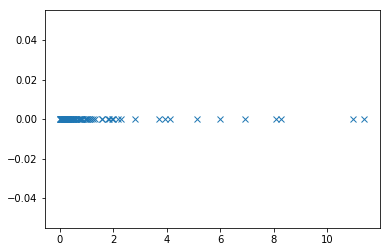

In [7]:
plot_at_y(np.array(other_reward_list), 0)

In [3]:
np.array(other_reward_list).mean()

NameError: name 'other_reward_list' is not defined

In [13]:
x = np.array(other_reward_list)
x.sort()
print(x)

[6.83581853e-03 2.14299162e-02 2.61778835e-02 3.59831104e-02
 4.24323976e-02 4.58976310e-02 4.94569084e-02 5.30718842e-02
 6.20425473e-02 6.38017169e-02 7.02601730e-02 7.19673534e-02
 7.37694867e-02 7.38445403e-02 7.87163804e-02 7.96499533e-02
 9.52358261e-02 1.13429435e-01 1.37003170e-01 1.43006132e-01
 1.44532920e-01 1.47192831e-01 1.50097888e-01 1.71743534e-01
 1.72961012e-01 1.85562727e-01 1.91560426e-01 1.95112535e-01
 2.02696388e-01 2.16877287e-01 2.19868186e-01 2.27300391e-01
 2.43976402e-01 2.69128947e-01 2.74697733e-01 2.76608965e-01
 2.84954314e-01 2.88939149e-01 2.94530366e-01 3.05187230e-01
 3.14449689e-01 3.14655649e-01 3.21288040e-01 3.21767005e-01
 3.26237748e-01 3.52579708e-01 3.66021938e-01 3.93825921e-01
 3.98622884e-01 4.01275539e-01 4.14781439e-01 4.21807842e-01
 4.25430576e-01 4.58258945e-01 4.66589399e-01 4.68479087e-01
 4.85060622e-01 4.89569265e-01 5.01651133e-01 5.42471232e-01
 5.56516825e-01 5.81630153e-01 6.24821149e-01 6.72131873e-01
 7.20284894e-01 7.284693

In [1]:
np.mean(x)

NameError: name 'np' is not defined

In [7]:
with ProcessPoolExecutor(max_workers=8) as executor:
    results = executor.map(random_policy, ['Diff-v0']*32)

/home/tgog/conformer-ml/graphenvironments.py:617: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())
/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/tgog/conformer-ml/graphenvironments.py:617: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())
/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


step time mean nan
reset called


/home/tgog/conformer-ml/graphenvironments.py:617: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())
/home/tgog/conformer-ml/graphenvironments.py:617: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())
/home/tgog/conformer-ml/graphenvironments.py:617: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())
/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


step time mean nan


/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


step time mean nan
[171.92506593538866, -173.67427545498342, -58.42828599229869, -173.48817640038368, -174.0103649006765, -67.1872011260759, -179.9211374119762, -57.500739986935564, -59.67683306168794, 65.59652721176013]
reset called


/home/tgog/conformer-ml/graphenvironments.py:617: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())
/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


step time mean nan


/home/tgog/conformer-ml/graphenvironments.py:617: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())


reset called


/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


reset called
step time mean nan
step time mean nan
reset called
[171.92506593538866, -173.67427545498342, -58.42828599229869, -173.48817640038368, -174.0103649006765, -67.1872011260759, -179.9211374119762, -57.500739986935564, -59.67683306168794, 65.59652721176013]
action is  [4 5 0 3 3 3 1 3 5 2]
[171.92506593538866, -173.67427545498342, -58.42828599229869, -173.48817640038368, -174.0103649006765, -67.1872011260759, -179.9211374119762, -57.500739986935564, -59.67683306168794, 65.59652721176013]
action is  [4 5 0 3 3 3 1 3 5 2]
[171.92506593538866, -173.67427545498342, -58.42828599229869, -173.48817640038368, -174.0103649006765, -67.1872011260759, -179.9211374119762, -57.500739986935564, -59.67683306168794, 65.59652721176013]
action is  [4 5 0 3 3 3 1 3 5 2]
step time mean nan
[171.92506593538866, -173.67427545498342, -58.42828599229869, -173.48817640038368, -174.0103649006765, -67.1872011260759, -179.9211374119762, -57.500739986935564, -59.67683306168794, 65.59652721176013]
reset call

/home/tgog/conformer-ml/graphenvironments.py:617: RuntimeWarning: Mean of empty slice.
  print('step time mean', np.array(self.delta_t).mean())


reset called
action is  [4 5 0 3 3 3 1 3 5 2]
[171.92506593538866, -173.67427545498342, -58.42828599229869, -173.48817640038368, -174.0103649006765, -67.1872011260759, -179.9211374119762, -57.500739986935564, -59.67683306168794, 65.59652721176013]


/home/tgog/.conda/envs/my-rdkit-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[171.92506593538866, -173.67427545498342, -58.42828599229869, -173.48817640038368, -174.0103649006765, -67.1872011260759, -179.9211374119762, -57.500739986935564, -59.67683306168794, 65.59652721176013]
action is  [4 5 0 3 3 3 1 3 5 2]
step time mean nan
action is  [4 5 0 3 3 3 1 3 5 2]
reset called
[171.92506593538866, -173.67427545498342, -58.42828599229869, -173.48817640038368, -174.0103649006765, -67.1872011260759, -179.9211374119762, -57.500739986935564, -59.67683306168794, 65.59652721176013]
action is  [4 5 0 3 3 3 1 3 5 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0007230598252052023
new state is:
reward is  0.0007230598252052023
standard_energy 7.678142433712216
new state is:
[-71.5472492054489, 179.23347291342685, 136.41385344662206, 62.47522212626603, 177.83616687105254, 86.14741703695852, -63.22205473969547, -165.67224263077017, -175.4847229633036, -165.57177828366662]
reward is  0.0007230598252052023
standard_energy 7.678142433712216
[-

new state is:
new state is:
action is  [3 0 1 3 5 3 3 0 1 1]
[41.43138419405753, 176.69717862608562, -78.34192087232555, 71.99429229125506, 165.99511931782519, -100.9438608318975, 61.94084596486537, 174.9998242339854, 179.75767999324057, -70.38664872272597]
[41.43138419405753, 176.69717862608562, -78.34192087232555, 71.99429229125506, 165.99511931782519, -100.9438608318975, 61.94084596486537, 174.9998242339854, 179.75767999324057, -70.38664872272597]
[41.43138419405753, 176.69717862608562, -78.34192087232555, 71.99429229125506, 165.99511931782519, -100.9438608318975, 61.94084596486537, 174.9998242339854, 179.75767999324057, -70.38664872272597]
action is  [1 0 2 4 3 3 2 4 2 0]
action is  [1 0 2 4 3 3 2 4 2 0]
action is  [1 0 2 4 3 3 2 4 2 0]
standard_energy 7.678142433712216
reward is  0.00017632488886900832
standard_energy 7.678142433712216
reward is  0.00017632488886900832
new state is:
new state is:
standard_energy 7.678142433712216
[41.43138419405753, 176.69717862608562, -78.3419208

action is  [2 0 1 1 1 1 3 3 2 3]
standard_energy 7.678142433712216
new state is:
reward is  0.0006966977448232879
[-67.79726762645124, -174.34526910919058, 165.79895206689378, -70.2390451781585, -175.35943545293236, -96.47998452974201, 68.72860737005578, -99.71681590423589, -72.94694003012482, 63.51652235289236]
new state is:
new state is:
action is  [0 3 5 4 1 2 4 3 4 4]
[-67.79726762645124, -174.34526910919058, 165.79895206689378, -70.2390451781585, -175.35943545293236, -96.47998452974201, 68.72860737005578, -99.71681590423589, -72.94694003012482, 63.51652235289236]
standard_energy 7.678142433712216
[-67.79726762645124, -174.34526910919058, 165.79895206689378, -70.2390451781585, -175.35943545293236, -96.47998452974201, 68.72860737005578, -99.71681590423589, -72.94694003012482, 63.51652235289236]
reward is  0.0006966977448232879
new state is:
action is  [0 3 5 4 1 2 4 3 4 4]
action is  [0 3 5 4 1 2 4 3 4 4]
[-67.79726762645124, -174.34526910919058, 165.79895206689378, -70.239045178158

action is  [1 2 4 2 0 5 3 2 2 5]
action is  [0 5 1 0 2 2 3 2 3 2]
[82.23501219470819, -66.675738688776, 64.60199824650283, 59.60043344653329, 53.59273659071482, -175.61305016258572, 130.77165660058262, -69.03703151727781, -65.83693648709094, -175.61834263319116]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.22231430732325638
new state is:
action is  [5 5 0 1 5 1 3 0 5 0]
standard_energy 7.678142433712216
reward is  0.0003205020896343176
[67.04036730202517, -179.7039018481336, 176.75835504006812, -174.04597786705102, 172.7422257264966, -178.40983871782905, 57.57027111048953, 168.32687372988778, 65.01354539187832, -178.69050383564326]
reward is  0.0003205020896343176
new state is:
action is  [1 2 4 2 0 5 3 2 2 5]
new state is:
[-59.24998462325028, -58.53119219084755, 60.94734251862799, -101.42830741168436, -178.50146461605763, 64.12169681188898, 61.89873807267892, -98.17176673689885, -65.78642963898027, -163.63577607243582]
[-59.24998462325028, -58.5311

new state is:
reward is  0.0009882554151982351
action is  [3 0 0 0 3 2 3 0 4 0]
[-60.00574790104447, -59.24690384378185, 61.27722106208368, -96.93852088294327, -58.390291295507446, -47.55398137508878, -80.67767315208353, 64.39835333719435, 171.02810795929258, -62.21487456222811]
standard_energy 7.678142433712216
action is  [3 1 2 1 4 2 3 0 3 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
reward is  0.0009882554151982351
[69.90958206218407, -175.07181217294723, -37.56959429071675, -174.78404049809362, 74.60371091069513, -138.3893564692592, 72.59357501732119, -176.63439404718736, -65.05267246846381, -62.54785207605235]
reward is  0.0009882554151982351
action is  [3 0 0 0 3 2 3 0 4 0]
reward is  0.0009882554151982351
new state is:
new state is:
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[69.90958206218407, -175.07181217294723, -37.56959429071675, -174.78404049809362, 74.60371091069513, -138.3893564692592, 72.5935

action is  [0 4 3 5 3 4 5 1 5 3]
[-172.560500673417, 59.928612011523434, 151.1158116076431, -65.37455988301528, -64.7902350899562, -124.90593481375035, 67.80510489733807, 60.374014799068455, 57.210308548522654, 70.31168895289181]
[-172.560500673417, 59.928612011523434, 151.1158116076431, -65.37455988301528, -64.7902350899562, -124.90593481375035, 67.80510489733807, 60.374014799068455, 57.210308548522654, 70.31168895289181]
action is  [0 4 3 5 3 4 5 1 5 3]
standard_energy 7.678142433712216
reward is  0.000477206444158616
new state is:
standard_energy 7.678142433712216
action is  [0 4 3 5 3 4 5 1 5 3]
reward is  6.447012617096968e-05
[-175.67982350898072, 172.9289608939014, 141.12723785473105, -63.87597081690747, -62.284627332992464, -99.85791123948783, 61.329314538417016, 65.16054666712343, 177.55147566740584, -172.76685126559534]
new state is:
action is  [0 3 0 2 2 0 4 3 4 5]
[-172.560500673417, 59.928612011523434, 151.1158116076431, -65.37455988301528, -64.7902350899562, -124.90593481

new state is:
new state is:
[39.60466141720981, 65.04845941249302, 53.951649818364395, 164.060066451438, 83.04559377939881, 80.29378223536294, -75.47829795016695, 112.91035981814626, -178.61870471649365, -168.40581429831963]
[59.41622711119566, 176.58341340432057, 172.91081902270102, -163.9967293062173, -96.52676055350757, -172.87447514396143, 61.84914299521165, 63.272990631957846, -96.8722283828514, -101.71775324865948]
action is  [5 0 0 1 2 0 3 5 1 1]
action is  [5 0 0 1 2 0 3 5 1 1]
[39.60466141720981, 65.04845941249302, 53.951649818364395, 164.060066451438, 83.04559377939881, 80.29378223536294, -75.47829795016695, 112.91035981814626, -178.61870471649365, -168.40581429831963]
[59.41622711119566, 176.58341340432057, 172.91081902270102, -163.9967293062173, -96.52676055350757, -172.87447514396143, 61.84914299521165, 63.272990631957846, -96.8722283828514, -101.71775324865948]
action is  [4 0 5 0 3 2 3 2 4 3]
action is  [4 0 5 0 3 2 3 2 4 3]
standard_energy 7.678142433712216
action is  [

[-177.18646130206085, 58.50211947651463, -63.97058672257277, 175.4192643539649, 65.16201101665015, 178.80856214854177, 64.79433852504104, -99.25229959421775, -66.95044250929739, 59.63349254593325]
action is  [5 5 3 0 3 0 4 2 3 5]
action is  [5 5 3 3 1 1 1 3 2 2]
action is  [5 4 0 2 3 3 1 5 3 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.003803223845388335
standard_energy 7.678142433712216
reward is  1.4736806315293062e-05
new state is:
new state is:
reward is  1.4736806315293062e-05
standard_energy 7.678142433712216
reward is  3.0338444925163156e-05
new state is:
[-177.18646130206085, 58.50211947651463, -63.97058672257277, 175.4192643539649, 65.16201101665015, 178.80856214854177, 64.79433852504104, -99.25229959421775, -66.95044250929739, 59.63349254593325]
[65.4941715406341, 100.90628309513166, 163.9645327441893, 177.54028893205876, 178.10306895651308, -64.90348245202713, -81.72081534402398, 72.73439506166987, 61.3

standard_energy 7.678142433712216
new state is:
reward is  0.16838344046435208
standard_energy 7.678142433712216
new state is:
[-50.53584610397007, -68.16128787743628, -176.43455139510075, 173.2152399749867, 72.84929214517157, -136.1913709578524, 71.69798565209598, -177.95370486083553, -66.07785347743402, -62.85107348435209]
action is  [5 5 0 0 5 1 1 0 3 0]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.16838344046435208
reward is  0.0009058605876459887
reward is  0.0009058605876459887
new state is:
new state is:
[63.04179230780088, 175.83643741206035, -168.22867303592633, 170.48849100522375, 60.20610223180706, -172.89350243701932, -66.19014730476003, -179.52243847538267, 70.01895397608908, 178.92011815472176]
action is  [3 0 4 4 0 1 3 4 3 2]
[63.04179230780088, 175.83643741206035, -168.22867303592633, 170.48849100522375, 60.20610223180706, -172.89350243701932, -66.19014730476003, -179.52243847538267, 70.01895397608908, 178.92011815472176]
standard_ene

reward is  0.0001492339277904666
action is  [5 4 4 5 5 2 3 5 3 1]
reward is  0.0001492339277904666
action is  [2 4 3 3 1 1 5 5 1 1]
action is  [5 1 1 2 1 5 4 5 2 5]
new state is:
[173.29179777812828, -69.37935942855948, -51.04441026663661, -60.54167526743089, -96.84796144903092, 59.81541386824751, 60.82685377616673, 93.40099223567412, -64.3660243665458, -163.44298542169213]
standard_energy 7.678142433712216
new state is:
action is  [5 4 4 5 5 2 3 5 3 1]
reward is  0.008013350762352723
[173.29179777812828, -69.37935942855948, -51.04441026663661, -60.54167526743089, -96.84796144903092, 59.81541386824751, 60.82685377616673, 93.40099223567412, -64.3660243665458, -163.44298542169213]
new state is:
action is  [5 4 4 5 5 2 3 5 3 1]
standard_energy 7.678142433712216
[169.9970954259366, 91.23385457038941, 65.79875734330477, 176.41907139058569, 173.16676729925774, -178.99689559028218, 56.70353280684749, 55.27623234313967, 59.963031549766725, -179.0267612836489]
action is  [2 4 3 3 1 1 5 5 1 1]
r

[59.4818226000683, 60.479816248419844, -171.26321389946065, 68.36275848845668, -178.49965785010346, 90.68234620677585, -46.249948167484774, -176.96225932933686, -178.8617559868269, 89.00323395007469]
standard_energy 7.678142433712216
action is  [0 3 4 4 1 0 2 4 4 2]
[-63.15023282339252, 179.47432629546648, -64.78821596452978, -172.50362835792592, 105.58461480566412, -62.24574841852643, 175.5039355908626, -61.015698343925855, -60.84662716665292, -141.13758959497673]
action is  [0 2 4 0 4 3 3 0 0 3]
[-80.74859332489319, 64.72528899294485, -64.33131413678349, 94.78057087194833, 177.81400601240787, -145.1580938651544, 137.8819246849894, 70.90925840067426, -94.82288433066566, -66.74975350094674]
standard_energy 7.678142433712216
reward is  0.0006008593791439207
reward is  0.0014591725092023868
action is  [5 3 0 3 0 5 2 1 0 4]
new state is:
action is  [2 0 3 1 4 3 1 1 2 0]
new state is:
[-63.15023282339252, 179.47432629546648, -64.78821596452978, -172.50362835792592, 105.58461480566412, -62.

action is  [4 3 2 3 0 5 5 5 0 0]
action is  [5 3 4 4 5 2 2 4 1 3]
reward is  0.014537890951610713
new state is:
standard_energy 7.678142433712216
reward is  4.068633032131535e-05
[59.54230932100292, 58.98504934261085, -57.52104240882064, -60.347033423563154, 178.239601061745, -172.6235439693215, 139.6484595422879, 178.8916379625875, 179.58699477104577, 179.67115600152573]
action is  [5 3 4 4 5 2 2 4 1 3]
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
[179.31183320423577, -58.92146432236382, 48.42193910777041, 67.02000479709007, 163.04849100745983, -167.20148821678387, -64.00250977162155, 93.70379668041403, 65.8482182814202, -93.92821398881593]
reward is  4.068633032131535e-05
reward is  0.00036013980009165497
standard_energy 7.678142433712216
reward is  0.014537890951610713
action is  [4 3 2 3 0 5 5 5 0 0]
new state is:
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
new state is:
[59.54230932100292, 58.98504934261085

[59.199442223501, 58.82683395562032, -64.30784591833829, -174.34429170285432, -178.2873045512143, -71.8153926610359, 136.01487802766502, -178.02046983396386, -67.23234060345112, -174.8795958143156]
[57.36482832936971, 55.35557850511573, -75.5274036663498, -72.78455966591271, -171.51705069879745, -57.723176781728206, -57.59209853952892, -174.07730831550742, -66.77164181166772, -67.96193652279037]
action is  [4 4 2 5 1 2 5 0 3 0]
action is  [2 4 3 2 1 2 1 4 5 1]
action is  [4 4 2 5 1 2 5 0 3 0]
standard_energy 7.678142433712216
[141.68438975775584, 178.97848982996393, -176.34629561101795, 173.01331053633217, 173.78255200569362, -166.58268287292532, -65.41244183256973, -175.3250398054711, -65.74654527672544, 179.56195813081237]
action is  [4 1 2 4 0 0 2 5 0 4]
[59.199442223501, 58.82683395562032, -64.30784591833829, -174.34429170285432, -178.2873045512143, -71.8153926610359, 136.01487802766502, -178.02046983396386, -67.23234060345112, -174.8795958143156]
[179.16984998187297, -59.891924208

reward is  7.557307071730844e-06
reward is  0.003957677552573596
reward is  0.004694152007806702
new state is:
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  0.003957677552573596
reward is  0.004694152007806702
[55.97917228698794, 59.98267927608405, -172.42032418790265, 173.93081334655673, 174.47786921407348, -166.86876428258006, 107.48555742624353, -66.55219152322778, -68.10974680173008, -168.30260156546288]
[61.165069074771154, -98.84497686337754, -97.45349225815315, 64.52982582618203, 169.99905227836913, -173.12857300145157, -46.77541207521473, 98.39983610880702, 179.78249024436403, 60.98883580511805]
new state is:
action is  [1 3 5 3 1 1 1 0 3 0]
action is  [4 4 1 1 4 1 5 1 3 5]
new state is:
new state is:
reward is  4.771305223227453e-06
standard_energy 7.678142433712216
[55.97917228698794, 59.98267927608405, -172.42032418790265, 173.93081334655673, 174.47786921407348, -166.86876428258006, 107.48555742624353, -66.55219152322778, -68.10

reward is  0.007652133719345859
new state is:
[63.05335297406282, 174.04911717633036, -71.99461626658149, -99.82339478227414, 63.5597326967215, -172.95161934932713, 59.049536205573816, 54.8013525637767, 60.020965106043796, -171.64129833933993]
[64.01136001241937, -97.01647196860505, 62.820098769059854, -178.8146457030659, -178.98135193977058, -63.57873203155452, -42.0558283655864, -178.96328017322398, 68.70414933396215, 66.89761209308315]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [4 0 0 2 5 0 3 3 4 1]
standard_energy 7.678142433712216
reward is  0.022517588000439136
new state is:
reward is  0.007652133719345859
[63.05335297406282, 174.04911717633036, -71.99461626658149, -99.82339478227414, 63.5597326967215, -172.95161934932713, 59.049536205573816, 54.8013525637767, 60.020965106043796, -171.64129833933993]
action is  [4 3 3 3 4 2 1 2 2 1]
reward is  0.0010071920818051532
[-73.70207979451811, 73.36785644198616, -64.6430189490226, -175.63510023604644, 

reward is  0.022517588000439136
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-73.70207979451811, 73.36785644198616, -64.6430189490226, -175.63510023604644, -61.967183160899815, 177.98216430223906, -177.76322189694497, 171.34116233238393, 177.3074180408415, -61.55077939846932]
action is  [0 5 3 3 1 3 5 5 4 0]
reward is  0.0004129545007157575
action is  [4 3 5 3 2 1 0 4 1 4]
standard_energy 7.678142433712216
reward is  0.0004129545007157575
reward is  0.01169745338303775
new state is:
new state is:
[59.20964413009228, 60.99085485529603, 83.26039203407704, -63.816044760259935, -60.188794211270185, 170.0442977057555, -168.85968696630337, 64.33366377440493, 173.8512681247348, 106.04015838975536]
new state is:
[59.20964413009228, 60.99085485529603, 83.26039203407704, -63.816044760259935, -60.188794211270185, 170.0442977057555, -168.85968696630337, 64.33366377440493, 173.8512681247348, 106.04015838975536]
action is  [4 2 0 0 5 3 1 5 5 1]
action is  [4 2 0

[46.324111961769056, -96.92356451230394, 40.42453646241268, 64.83128198734582, 169.43191721295247, 98.65673210557614, -60.462910735040786, -174.30336766383584, 66.02405243701492, 69.62506527023216]
action is  [1 4 1 5 3 1 3 2 4 5]
new state is:
new state is:
[62.49175169441624, 175.38201437034533, 83.73979573284468, -64.84513477683414, -174.2973625793777, 59.85099370746691, 57.54929209602323, 108.93463327459354, 72.31842233542001, -44.62255208045727]
[171.46136133381796, -176.85921278335584, 81.09214375702179, -74.31856060295951, -70.71746342867954, -51.10455149361778, 89.78398576948734, -179.53510350998957, 68.6165807263612, 163.7176667291247]
action is  [3 0 0 3 1 2 3 2 3 0]
standard_energy 7.678142433712216
action is  [3 0 0 3 1 2 3 2 3 0]
action is  [0 5 3 3 1 3 5 5 4 0]
[171.46136133381796, -176.85921278335584, 81.09214375702179, -74.31856060295951, -70.71746342867954, -51.10455149361778, 89.78398576948734, -179.53510350998957, 68.6165807263612, 163.7176667291247]
standard_energy 

[-79.3599754398425, 66.36339849232576, -173.038347302575, 60.74702844284023, 67.52466962929142, 138.47498329678848, 65.32280363135285, 178.98552490976272, 67.00845615461431, 178.12016135438998]
standard_energy 7.678142433712216
action is  [1 4 1 4 1 2 5 5 2 3]
action is  [1 4 1 4 1 2 5 5 2 3]
reward is  7.972867857377082e-06
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  2.4990473672604452e-05
reward is  0.00033679961643817507
standard_energy 7.678142433712216
[-80.61018303966578, 66.24681863606577, -173.48009569830828, 64.89401556357264, 175.05165142064172, -47.275208463861425, 89.94018802770165, -171.9519750474488, -64.47183921771503, -47.74116322510157]
reward is  0.00033679961643817507
new state is:
new state is:
new state is:
action is  [1 2 2 4 2 2 3 0 5 4]
[-49.173140223141125, -71.09791050167499, -75.95873364337791, 171.20437847468057, -104.198128673661, -60.957094654725196, -60.926207572397686, 92.

[61.32522636723901, -95.30357869140249, 70.06037508490456, -81.03333835203236, -169.55251140571983, -63.83868260067231, -65.39391179678279, 98.20324241844672, 65.78066887691863, 54.909772442551166]
new state is:
action is  [4 5 2 4 5 2 1 4 0 1]
standard_energy 7.678142433712216
reward is  0.00038766292961062214
[68.66860902723165, 177.7586748138926, -57.99985207194354, 99.237068703283, 175.40559557209832, -66.66147959865368, -132.0955961307498, 72.53325095718316, 177.51146180341541, 168.61975810573583]
new state is:
[-46.78843286432083, -65.35652093557837, -68.30265802271376, 177.50121040709593, 58.83721204171972, 56.92944597060207, -178.18993503938657, 65.60600410300736, -94.74266204961155, 61.30794378780296]
[-46.78843286432083, -65.35652093557837, -68.30265802271376, 177.50121040709593, 58.83721204171972, 56.92944597060207, -178.18993503938657, 65.60600410300736, -94.74266204961155, 61.30794378780296]
action is  [3 2 4 1 1 2 2 4 5 3]
action is  [0 2 0 3 5 2 0 2 3 0]
action is  [3 2 

[175.5979810258641, -55.44879729208223, -60.054175112036795, -72.38527042588575, 165.61297827772626, -71.03273330216724, -57.664877076222105, -55.02115129111023, -58.44234413540467, 164.77642974393115]
action is  [3 0 4 4 3 2 4 4 5 3]
action is  [0 1 0 5 0 2 3 4 5 3]
[100.4459881494869, -65.56680915950058, -169.96501395150713, 64.43652910154141, 172.34544211318328, -89.80171166206172, 56.77515386501583, 69.15644308259257, 169.51254923028245, 65.36504942678728]
action is  [5 5 1 4 5 5 3 1 3 5]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [3 0 4 4 3 2 4 4 5 3]
reward is  0.029062195925812388
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  4.224998221368671e-05
reward is  0.011760923345069684
new state is:
new state is:
reward is  4.297593834675959e-08
[175.5979810258641, -55.44879729208223, -60.054175112036795, -72.38527042588575, 165.61297827772626, -71.03273330216724, -57.664877076222105, -55.02115129111023,

new state is:
[-48.114969683648546, -67.38651916467, -176.34470095960967, 168.39119267285685, 100.63293753690057, 167.17061844938146, 68.15498243406586, -176.54825405680526, -66.0957380692446, -179.88479107727548]
action is  [1 5 4 2 2 3 0 5 5 3]
[177.74435754051814, -174.09343797285348, 65.59432642588393, -92.9936473053357, -99.0086130563962, 58.22171137990939, -177.41032891791858, 167.99159869910048, 63.83070872845315, 57.08547877673764]
standard_energy 7.678142433712216
reward is  0.0007190565976719575
action is  [2 3 2 2 1 3 1 3 5 2]
new state is:
standard_energy 7.678142433712216
[177.74435754051814, -174.09343797285348, 65.59432642588393, -92.9936473053357, -99.0086130563962, 58.22171137990939, -177.41032891791858, 167.99159869910048, 63.83070872845315, 57.08547877673764]
reward is  0.0006886443086392967
new state is:
action is  [2 3 2 2 1 3 1 3 5 2]
[-48.114969683648546, -67.38651916467, -176.34470095960967, 168.39119267285685, 100.63293753690057, 167.17061844938146, 68.15498243

[90.24109508404858, -65.25233481431697, 66.36908594846473, -92.084918835192, -177.30291738994637, 139.43875548153832, -72.17144125908311, -178.12481156636687, 179.76993184006693, 62.491499812722026]
action is  [2 1 0 1 2 1 1 5 3 0]
action is  [4 1 1 5 4 0 2 3 4 1]
standard_energy 7.678142433712216
new state is:
[90.24109508404858, -65.25233481431697, 66.36908594846473, -92.084918835192, -177.30291738994637, 139.43875548153832, -72.17144125908311, -178.12481156636687, 179.76993184006693, 62.491499812722026]
reward is  0.00013211048428192772
standard_energy 7.678142433712216
reward is  0.13041449113887874
[56.155878759842814, -94.95858974489299, -174.77145791678345, 65.62352958051754, 102.81216865881483, 178.41517005350045, -57.23045303870669, 100.00795729542669, 70.90878794756375, 178.01074591909935]
new state is:
action is  [2 3 4 1 0 4 1 2 4 3]
[-67.66829273581772, 179.7457555264961, -176.15539718185428, 179.13384595204494, -59.99399707690416, -177.87216473673095, -58.13692808324859, 

reward is  6.075115811400826e-06
action is  [0 4 5 4 5 0 5 2 3 1]
new state is:
new state is:
[-59.75308210904253, -125.30717269630419, 27.82746685687555, 101.78641691392647, -175.3518231973813, 73.97506872291858, -177.01650970625593, 175.93498931073955, 67.68561325854901, -63.64702693710475]
[-16.73167033264699, -76.38810910312215, 66.85056940311152, -177.67113062130107, 175.84620502418863, 58.97955083430269, -94.46012966344098, -94.75170156041482, 65.73578189483767, 63.21855075109751]
action is  [0 4 5 4 5 0 5 2 3 1]
standard_energy 7.678142433712216
action is  [2 2 4 2 4 0 2 1 2 4]
reward is  9.668930678044655e-07
standard_energy 7.678142433712216
new state is:
reward is  0.01068388956401081
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
[-59.75308210904253, -125.30717269630419, 27.82746685687555, 101.78641691392647, -175.3518231973813, 73.97506872291858, -177.01650970625593, 175.93498931073955, 67.68561325854901, -63.64702693710475]
standard_energ

[-61.90779500785405, 177.51017051667134, 51.39135278238599, -120.57198885304577, 175.50158906280012, 93.2763105638204, -68.48777957264046, -57.42670297210628, -60.22811504850149, 69.41322983450803]
[56.808781413948054, 173.6253718836409, -178.36904666599793, 60.36038626142636, 175.895299774769, -45.873532284155644, -59.21302701667926, -59.393475368480956, -57.683729276100806, -65.9876850295918]
new state is:
action is  [4 1 1 4 5 4 2 4 1 2]
action is  [4 1 1 4 5 4 2 4 1 2]
[56.808781413948054, 173.6253718836409, -178.36904666599793, 60.36038626142636, 175.895299774769, -45.873532284155644, -59.21302701667926, -59.393475368480956, -57.683729276100806, -65.9876850295918]
standard_energy 7.678142433712216
action is  [2 0 2 4 4 0 2 1 0 2]
action is  [2 0 2 4 4 0 2 1 0 2]
reward is  0.0073181279420887774
new state is:
standard_energy 7.678142433712216
[56.808781413948054, 173.6253718836409, -178.36904666599793, 60.36038626142636, 175.895299774769, -45.873532284155644, -59.21302701667926, -5

action is  [3 3 3 1 3 2 2 2 4 3]
action is  [0 4 5 1 2 1 4 1 4 5]
standard_energy 7.678142433712216
[-64.05022312968808, 178.2298388590665, -64.6637895727314, 91.27044364155462, 104.10234568249247, 171.82404265455833, -62.67153146135837, -59.94128267225005, -175.1442872999243, -68.1784906527393]
action is  [3 4 0 2 3 4 3 5 0 2]
reward is  1.3991319760293334e-05
action is  [3 4 0 2 3 4 3 5 0 2]
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[96.97793478493179, -63.59106497048518, -60.95358350235717, -57.992849780931614, -67.09488239584545, -43.28428489166581, -60.000986488687964, -69.03786758805451, 99.08357494741425, 67.3765941467543]
reward is  1.3991319760293334e-05
action is  [0 4 5 1 2 1 4 1 4 5]
reward is  1.667741401186942e-05
new state is:
standard_energy 7.678142433712216
[136.23597044970148, 70.14989944947882, 59.74108317769098, -168.70670733960893, -73.30690569427213, -56.598453002099056, 92.88492402678561, -174.74926975400862, 71.7607903361

new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-43.1587087864898, 94.30175867894205, 68.81686013168135, -175.1274378631609, -179.1926746050292, -66.28469316419972, -166.60298058602476, 170.2389158651801, 64.65916197009753, 54.446226177541]
reward is  0.0013352272219292515
action is  [1 5 4 0 0 2 5 5 5 3]
reward is  0.0011402868274392511
new state is:
[69.26269265963913, 175.22774182331295, -140.24359108463122, -64.01146985668946, -170.5553217240599, 171.26883590137783, 40.07708086512647, 170.2266666762208, 64.02809296081021, -61.53002953231881]
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [3 4 4 5 0 2 1 5 4 4]
[-43.1587087864898, 94.30175867894205, 68.81686013168135, -175.1274378631609, -179.1926746050292, -66.28469316419972, -166.60298058602476, 170.2389158651801, 64.65916197009753, 54.446226177541]
reward is  0.00013984009760218582
new state is:
[-36.59113372447778, -171.96496988296045, 63.80166368276

[-78.99683256929897, 71.2077169539893, 41.30526709382731, 176.6956972798203, -176.6219625260772, -48.276084692847355, 83.47988415501108, 94.07823497205, 179.03177582908762, -49.28205004075799]
action is  [2 3 5 4 3 4 5 4 4 2]
action is  [2 3 5 4 3 4 5 4 4 2]
action is  [1 0 0 0 0 2 4 5 0 5]
action is  [1 0 0 0 0 2 4 5 0 5]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0005152233574146515
reward is  0.0061513796540698
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
new state is:
reward is  0.0061513796540698
reward is  0.08113488639516567
new state is:
[179.6495739951972, -59.37818265699551, 50.69505736266679, 72.45842974864124, 163.75498593560386, 58.53643220021136, -178.73342015134347, -100.33754121906448, -179.03014423890744, 56.0474084687811]
[-79.27257406935782, 66.42067624393425, -173.04128661742655, 57.29171708460424, 56.20784423397732, 62.50247120711344, 178.23753740070808, 58.34977663905742, 62.17593992159227,

reward is  0.0005152233574146515
action is  [5 3 0 0 1 4 4 5 0 0]
standard_energy 7.678142433712216
action is  [3 5 2 0 3 2 3 2 2 1]
new state is:
[179.6495739951972, -59.37818265699551, 50.69505736266679, 72.45842974864124, 163.75498593560386, 58.53643220021136, -178.73342015134347, -100.33754121906448, -179.03014423890744, 56.0474084687811]
standard_energy 7.678142433712216
action is  [5 3 0 0 1 4 4 5 0 0]
reward is  0.015932692535072325
reward is  0.015932692535072325
new state is:
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0009315284100774285
[176.65835217805682, -174.82110441351657, 66.83372459427014, -178.93228386145483, -67.06453380965408, 108.88822246152394, -172.18284169791764, 58.865477684742935, 173.43671383131027, 68.17821115293047]
new state is:
reward is  0.016477581621150456
standard_energy 7.678142433712216
[176.65835217805682, -174.82110441351657, 66.83372459427014, -178.93228386145483, -67.06453380965408, 108.8882224

new state is:
[57.26472917993458, 173.54178348658448, -174.4896709835262, -101.38406645073903, 171.40193081334033, 55.29123592177772, 59.97566787527288, 179.95150504356857, 179.99129404019908, 66.53716168654692]
standard_energy 7.678142433712216
reward is  0.016477581621150456
standard_energy 7.678142433712216
action is  [5 0 0 0 3 4 4 2 2 3]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  6.581952950571084e-06
new state is:
new state is:
reward is  6.581952950571084e-06
standard_energy 7.678142433712216
reward is  0.0009315284100774285
[-63.20545138272043, 89.84545253409944, -65.04105289128242, -175.7823377388237, 174.586281650842, 66.75251760643803, 178.44405738942456, 60.88518835514292, 175.43855907043965, -65.8451586760117]
reward is  0.047706428199998416
action is  [3 0 0 1 5 4 4 1 5 5]
new state is:
[57.28923856385102, 60.635903657978446, 35.58393664084695, 64.41718174444517, 90.30992232780734, 169.67924441144672, -169.5210294893457, 62.452077226580

reward is  0.006471710115699014
[177.8035215931908, -58.46652770027893, -57.69938000745262, -170.47722528770348, -64.08947937339079, 99.09396768500527, -161.62392231730527, 179.2351801396848, -67.52253933238183, 72.00975597641737]
new state is:
new state is:
action is  [4 1 0 0 5 2 1 1 0 5]
[177.8035215931908, -58.46652770027893, -57.69938000745262, -170.47722528770348, -64.08947937339079, 99.09396768500527, -161.62392231730527, 179.2351801396848, -67.52253933238183, 72.00975597641737]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  7.367656261268904e-05
new state is:
action is  [4 1 0 0 5 2 1 1 0 5]
[177.8035215931908, -58.46652770027893, -57.69938000745262, -170.47722528770348, -64.08947937339079, 99.09396768500527, -161.62392231730527, 179.2351801396848, -67.52253933238183, 72.00975597641737]
reward is  3.9340459031726475e-05
[58.29720060595899, 58.153686065246184, -167.91319752971623, 173.9348909429975, 101.39333325153044, -48.90831880680452, -167.158

[173.8363618228547, -62.125494416740175, 59.131038028925495, 91.97118145588503, -177.58043823193674, -41.28237712571809, -64.73060441860522, 176.0986585049129, 65.1698994184987, -65.01119249688202]
action is  [5 4 1 5 3 4 5 5 3 0]
action is  [2 1 1 5 1 4 5 4 4 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  7.367656261268904e-05
standard_energy 7.678142433712216
reward is  7.367656261268904e-05
new state is:
reward is  0.001099883022270702
standard_energy 7.678142433712216
new state is:
reward is  0.0002428680300951518
new state is:
[58.29720060595899, 58.153686065246184, -167.91319752971623, 173.9348909429975, 101.39333325153044, -48.90831880680452, -167.15847515805126, -96.57524059416471, -177.42160764683405, -68.61338780111483]
standard_energy 7.678142433712216
new state is:
action is  [5 4 1 5 3 4 5 5 3 0]
[58.29720060595899, 58.153686065246184, -167.91319752971623, 173.9348909429975, 101.39333325153044, -48.90831880680452, -167.15847515805126, -96

standard_energy 7.678142433712216
reward is  0.0008179282729194115
new state is:
action is  [2 1 1 5 1 4 5 4 4 2]
standard_energy 7.678142433712216
action is  [2 1 1 5 1 4 5 4 4 2]
new state is:
[173.61099496169754, 101.29236153633812, -58.42105873609099, -171.82900241222836, 95.6517925435318, -66.20351018125078, -167.08197323532525, 169.6591006217653, 63.2277922398429, 51.720378147619456]
reward is  0.0007603036873897988
new state is:
action is  [5 3 5 4 1 2 2 5 4 2]
[-62.77372924494261, -179.99257508783356, -63.71516481712202, 98.07860841095476, 172.84781577823642, 64.94923322062206, 38.403317147687886, 161.71516358037977, 59.996813906948056, -67.82159664532249]
[61.31338901548145, -100.49612161292367, -58.56259019044412, -58.60969389980856, -175.09099270679857, 72.36812460088177, -134.50777707004173, -173.9543193409191, -64.75392691848504, 174.42676656868196]
action is  [3 2 1 3 0 3 1 1 1 5]
standard_energy 7.678142433712216
action is  [1 0 5 3 0 2 3 2 2 5]
standard_energy 7.6781424

new state is:
reward is  0.00017216228787829028
action is  [4 0 5 0 1 0 2 3 4 5]
[-63.599041226746834, 90.53180097669838, -68.73991401947062, -98.67968752238129, 69.3818545203677, 66.35313115988342, 176.61200183739433, 63.245431896887006, 71.18109834382278, -65.51065582295125]
new state is:
standard_energy 7.678142433712216
action is  [3 3 5 2 0 3 4 0 4 5]
reward is  7.593129229998655e-07
[-63.599041226746834, 90.53180097669838, -68.73991401947062, -98.67968752238129, 69.3818545203677, 66.35313115988342, 176.61200183739433, 63.245431896887006, 71.18109834382278, -65.51065582295125]
new state is:
standard_energy 7.678142433712216
[-67.25944090162544, 176.38110009005285, 16.484560228758518, 77.69565367469878, 171.59288196210392, -89.27639036096284, 68.36783216001304, -100.51544713384261, -72.22539649315564, 63.68137801136188]
action is  [2 5 1 3 4 3 1 3 5 1]
action is  [3 3 5 2 0 3 4 0 4 5]
reward is  0.00017216228787829028
standard_energy 7.678142433712216
new state is:
standard_energy 

standard_energy 7.678142433712216
reward is  0.0008223717736466102
reward is  0.0012041941741064855
standard_energy 7.678142433712216
action is  [4 3 1 3 2 5 2 1 0 1]
new state is:
new state is:
reward is  0.0008223717736466102
new state is:
[61.62196675863033, -96.75506567233185, 53.26033986681072, 81.08888591714806, -123.84067460781583, 158.37166447572042, 79.10628040728453, -66.40208894706974, -167.70891991475276, 171.43523955730498]
[-59.092201718512506, -59.03636220979656, 67.30863059180146, 177.27722340189476, 99.34586797422304, -66.7471000680048, 89.64503004788313, -168.90094121780552, -63.98018915235212, 164.0882256738082]
action is  [4 0 5 0 1 0 2 3 4 5]
[-59.092201718512506, -59.03636220979656, 67.30863059180146, 177.27722340189476, 99.34586797422304, -66.7471000680048, 89.64503004788313, -168.90094121780552, -63.98018915235212, 164.0882256738082]
[67.17383111537167, -179.3153024117718, 176.57587763130599, -173.59559185829553, -173.3396656391259, -178.67657632317344, -61.0279

action is  [0 1 1 4 0 0 5 2 3 2]
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-58.79341969310896, -60.79486354269428, -42.960104225047935, -65.66370477441758, -165.48027974098878, 166.85600093367438, 65.86474684955579, -96.36070497213703, -179.25696832241337, -178.72721260426707]
standard_energy 7.678142433712216
reward is  0.0017202085380919846
reward is  8.211280067317089e-05
action is  [4 3 1 3 2 5 2 1 0 1]
reward is  1.990656163291934e-06
new state is:
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
new state is:
reward is  0.0008648274149596572
reward is  0.0008406972510877439
new state is:
new state is:
[-170.05750682681588, 177.45898357167286, -82.26629667634836, 63.98357869799364, 168.87844280346394, 161.7348397668138, 78.45744767162687, -69.96631538023955, -58.98589219766516, -41.04542814389632]
[74.81635808067581, -76.00875737763099, 165.75986262864652, 171.26544657453724, 168.40070714594253, 156.80758891

new state is:
action is  [4 1 0 5 3 0 0 1 2 0]
[-169.9889873924546, 178.41609573066742, -63.37630717740833, -95.17673221260958, -177.8321021168954, -67.39767106870542, -171.52422076864954, 59.38111183580864, 173.99611514452783, 54.813701990771904]
[-173.7440944524843, 68.84864785423508, 144.801535641282, -102.85582354106569, 70.57113064579625, 62.88350898986495, 43.544185457929274, 66.54032807676982, 60.393503584293306, 69.88815102476104]
action is  [5 3 5 5 2 4 4 1 1 1]
standard_energy 7.678142433712216
action is  [2 2 0 5 2 5 0 2 4 3]
reward is  3.942403913542071e-05
standard_energy 7.678142433712216
new state is:
reward is  0.0008648274149596572
new state is:
[68.52120361244981, -178.22198077609656, 174.7318837762639, 178.9712368563659, 64.10817784544427, 142.6770310222631, -171.19620922577076, -99.01328330268431, -70.2122826004234, 142.96215165221835]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [3 3 2 2 1 4 3 0 1 2]
standard_energy 7.6781424337122

action is  [1 1 3 3 0 2 4 1 3 5]
[-58.33740464867213, -60.68667609248095, -42.55894638706328, -65.28502057076254, -169.443459482287, 65.22021166404754, 39.852042253979754, 175.18115113746967, 179.35600083045983, -66.19607159696255]
action is  [1 0 1 2 0 2 1 4 0 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.1582182495805816
reward is  0.0008187953773622455
action is  [0 4 5 2 4 4 3 5 3 4]
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-177.66016408328545, 171.364031173795, 54.59517138894709, 56.83960876716377, 174.31313396521782, -65.12049113012387, -60.549269957813266, -172.85839735485862, -67.76424604360531, 161.9805971301048]
new state is:
standard_energy 7.678142433712216
action is  [3 1 5 3 0 2 4 5 2 4]
reward is  0.01508246544965834
reward is  0.01508246544965834
reward is  1.5951144447381665e-05
[-64.49588242524595, -175.2159056880635, -62.33099254920095, 95.42068601918126, -170.68846652887257, -63.53027885

[-177.66016408328545, 171.364031173795, 54.59517138894709, 56.83960876716377, 174.31313396521782, -65.12049113012387, -60.549269957813266, -172.85839735485862, -67.76424604360531, 161.9805971301048]
reward is  3.499153878455347e-06
new state is:
action is  [3 1 5 3 0 2 4 5 2 4]
new state is:
[65.96797890110453, 97.1628640837803, 64.28181251727936, -101.86184391713718, 178.25342285179087, 96.12959283990622, -64.93993401576147, 97.81790132948873, 179.08315124089347, 172.6598919185277]
standard_energy 7.678142433712216
action is  [0 4 3 3 5 0 0 4 5 4]
action is  [0 1 0 3 5 2 0 1 2 1]
reward is  0.01508246544965834
[65.96797890110453, 97.1628640837803, 64.28181251727936, -101.86184391713718, 178.25342285179087, 96.12959283990622, -64.93993401576147, 97.81790132948873, 179.08315124089347, 172.6598919185277]
new state is:
standard_energy 7.678142433712216
action is  [0 1 0 3 5 2 0 1 2 1]
[-174.8992235794665, -102.48919676761305, 55.40026498922873, 177.55050238107427, -59.6109672396487, -176.

standard_energy 7.678142433712216
new state is:
new state is:
reward is  1.6811961835407398e-06
action is  [4 2 2 1 4 0 0 3 4 4]
[-171.27851482239257, 60.326004601705606, 110.71337878323354, -73.87684724877366, 86.25698919912652, 61.450392206034635, -177.60606934194163, 57.64689952050062, 172.6669302823038, 63.24905813727738]
action is  [4 2 2 1 4 0 0 3 4 4]
standard_energy 7.678142433712216
[-174.8992235794665, -102.48919676761305, 55.40026498922873, 177.55050238107427, -59.6109672396487, -176.99435455256426, -58.82492025330609, -174.47205005147248, 178.35873545323574, 177.0530309882604]
new state is:
action is  [1 4 0 2 5 5 3 0 0 1]
action is  [4 2 2 1 4 0 0 3 4 4]
[79.84291962536864, -71.58507995625739, -39.51776046412958, -179.75029705632957, 72.7371167718714, 146.84912648514452, -172.08753294460928, 62.244885599790386, 58.74452391461208, 135.28128223249254]
action is  [0 4 3 3 5 0 0 4 5 4]
reward is  0.0005084125064700372
new state is:
standard_energy 7.678142433712216
[-171.84614

action is  [1 4 0 2 5 5 3 0 0 1]
[-144.83616603214097, 67.63154614261376, 175.32547055367633, -63.346413275595985, -178.88129028803831, 64.49673535929445, 41.61452440700783, 175.53738327151012, 179.38478061648368, -66.16096600476533]
[-179.08229792250685, 58.932363667808715, -47.56467764198967, -66.22516420157882, -164.97838061514022, 166.303044407822, 67.1060624232354, -175.28950806951912, -66.20584390841165, 178.3806680851538]
action is  [2 0 0 4 2 3 5 1 3 2]
standard_energy 7.678142433712216
action is  [1 1 2 1 0 1 4 4 3 4]
standard_energy 7.678142433712216
reward is  5.841713806420501e-05
reward is  0.00040258114416187954
new state is:
[-59.5169331593638, -61.05130986710001, 169.81663487803866, -69.4347706121547, -175.86763177887585, 166.58555071422668, 46.167040004799134, 68.40650086454522, 66.59936939966462, 99.54102320534882]
action is  [0 5 2 2 5 1 5 5 2 0]
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward

new state is:
new state is:
reward is  0.00040258114416187954
[-59.5169331593638, -61.05130986710001, 169.81663487803866, -69.4347706121547, -175.86763177887585, 166.58555071422668, 46.167040004799134, 68.40650086454522, 66.59936939966462, 99.54102320534882]
action is  [4 1 0 1 4 2 2 0 4 2]
new state is:
standard_energy 7.678142433712216
reward is  0.009300045871767637
[-179.08229792250685, 58.932363667808715, -47.56467764198967, -66.22516420157882, -164.97838061514022, 166.303044407822, 67.1060624232354, -175.28950806951912, -66.20584390841165, 178.3806680851538]
action is  [0 5 2 2 5 1 5 5 2 0]
[-65.57592491711361, 95.26463087331084, -84.15240718524183, 65.15799005575143, 59.51000879239987, 60.51880855501071, 72.58333433024401, -85.22018522753105, 139.84873025815907, 173.31255661121716]
action is  [2 0 0 4 2 3 5 1 3 2]
new state is:
[-59.5169331593638, -61.05130986710001, 169.81663487803866, -69.4347706121547, -175.86763177887585, 166.58555071422668, 46.167040004799134, 68.4065008645

action is  [2 4 1 5 3 1 4 5 1 2]
[-56.57456925148094, -60.06524236707286, 170.9163516825182, -175.04814949398383, 101.88696047211918, 169.63312453699683, -174.6683204038344, 176.91460997235387, -68.34616019391657, -67.01728921039572]
action is  [4 1 0 1 4 2 2 0 4 2]
action is  [3 0 4 3 5 0 2 4 3 1]
reward is  6.25671528175555e-10
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  1.1353021447073946e-05
reward is  0.0006273960472416188
[-79.76658605010424, -165.3568693075987, 88.85488918801015, 129.27367609125346, -80.06610016100068, -59.201103568367735, 122.08866407602132, -173.94422560171785, 88.51590028288334, 60.201662701261675]
standard_energy 7.678142433712216
new state is:
reward is  0.0006273960472416188
new state is:
standard_energy 7.678142433712216
new state is:
[67.7528488689741, -179.77587079374393, 175.78897936209003, 179.2300000709456, 73.32160831624505, -77.56617567866277, -53.40691208590981, -176.70063489993802, 67.3585012764359

new state is:
reward is  0.00012931605910120378
action is  [4 2 2 5 2 0 3 4 3 5]
[-58.20521694099959, -173.6014479986249, 171.10200652136135, -178.48784871054895, 61.560280248128876, 55.48591503259133, 69.85695786408212, -89.68949878499984, -67.83539923580405, 176.38173821397208]
new state is:
action is  [2 1 3 5 0 5 1 1 1 2]
[-64.17878943276523, 97.84165841948115, -63.384413412142706, -176.71109996190216, -95.22658859417156, -83.41882681001479, 48.593615901557875, 177.15337858751212, 179.53353204261242, -89.10939688851748]
[-64.8535093819729, -174.04321403811835, 56.27217520526507, 60.49147188052254, 98.87647139500852, 178.77321695516642, -57.244001831989216, 99.53056041881631, 69.95868452549415, 179.94941863264827]
action is  [4 2 2 5 2 0 3 4 3 5]
action is  [5 5 4 2 2 2 5 1 3 0]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.020648853563888746
new state is:
standard_energy 7.678142433712216
reward is  1.1353021447073946e-05
standard_energy 7.6781424

new state is:
standard_energy 7.678142433712216
reward is  1.1353021447073946e-05
action is  [5 4 2 3 0 3 3 2 5 4]
new state is:
[-64.8535093819729, -174.04321403811835, 56.27217520526507, 60.49147188052254, 98.87647139500852, 178.77321695516642, -57.244001831989216, 99.53056041881631, 69.95868452549415, 179.94941863264827]
action is  [4 2 2 5 2 0 3 4 3 5]
[78.14902487716033, -72.86397815755376, -40.31099755885059, -171.1704202316097, -58.1806003038915, -179.84156531875703, -58.2698094388599, 100.87840000037086, 70.5366959294585, 177.71631502648626]
action is  [3 0 0 2 3 5 0 5 2 4]
standard_energy 7.678142433712216
reward is  0.19714705336935143
new state is:
[-64.42907349603382, -174.0472207378015, 57.088203833713635, 59.84652828070973, -178.68893842433775, 178.32854643523774, -59.68527543020714, -58.243228452870525, -174.33240406797626, -57.67435808027549]
standard_energy 7.678142433712216
action is  [4 4 1 4 5 0 4 2 1 3]
reward is  1.6091722021089335e-05
standard_energy 7.6781424337

[-173.3700724256255, 62.88155512117431, -81.13538496409727, 66.2158852870496, 167.30267384020124, -64.81238836219308, -52.88526913655476, -60.17285924982274, -175.8266361963092, 58.041642622956424]
action is  [0 0 2 1 3 3 0 3 0 4]
reward is  0.0033844622510515723
standard_energy 7.678142433712216
new state is:
reward is  0.19714705336935143
new state is:
[-64.42907349603382, -174.0472207378015, 57.088203833713635, 59.84652828070973, -178.68893842433775, 178.32854643523774, -59.68527543020714, -58.243228452870525, -174.33240406797626, -57.67435808027549]
standard_energy 7.678142433712216
[-179.6175593649937, 61.14297208311282, -66.61628111551558, 91.5553931885908, 170.63184751365546, 58.815347416058756, -179.54219272595589, 174.72833037201605, -69.43749342414475, 56.13338339861347]
standard_energy 7.678142433712216
action is  [4 4 1 4 5 0 4 2 1 3]
action is  [5 4 2 3 0 3 3 2 5 4]
reward is  7.514655416854736e-05
new state is:
standard_energy 7.678142433712216
[66.86017551683763, -176.78

reward is  7.514655416854736e-05
[-61.4850145171811, -62.34694251946733, -61.3371148716202, 95.3588929615175, -171.72778098747676, -63.35196852516567, 88.55441660166554, -177.15992696826967, 68.86699145796791, 165.18879732932982]
new state is:
action is  [0 1 0 0 0 2 5 3 2 5]
reward is  7.514655416854736e-05
reward is  0.016279154541228958
[66.86017551683763, -176.78883928076792, -16.540735601991678, -77.05948038927858, -172.73176321957968, 173.75704678382408, -165.2565260000171, 178.21972261001906, -179.85131460114906, 104.38227306015423]
new state is:
new state is:
standard_energy 7.678142433712216
action is  [4 3 3 4 1 0 2 2 5 5]
[-173.3700724256255, 62.88155512117431, -81.13538496409727, 66.2158852870496, 167.30267384020124, -64.81238836219308, -52.88526913655476, -60.17285924982274, -175.8266361963092, 58.041642622956424]
[66.86017551683763, -176.78883928076792, -16.540735601991678, -77.05948038927858, -172.73176321957968, 173.75704678382408, -165.2565260000171, 178.21972261001906

action is  [0 1 0 0 0 2 5 3 2 5]
new state is:
action is  [4 3 3 4 1 0 2 2 5 5]
[-63.21081360850749, -172.67199941767956, -58.57134012623394, 179.60736693252144, 71.8330578474023, 73.67358333267637, -164.5334032915059, 178.05544204922845, -179.47467449975593, 71.897533077224]
[80.19427409945858, -64.74446167732336, 56.96512246730285, 63.08817661465128, -177.47476159126978, 179.45275340680286, -57.69613883458197, -57.648744318139585, -174.9402900180168, 97.9250899450964]
[-63.21081360850749, -172.67199941767956, -58.57134012623394, 179.60736693252144, 71.8330578474023, 73.67358333267637, -164.5334032915059, 178.05544204922845, -179.47467449975593, 71.897533077224]
[-142.71703837051382, -178.69316813915552, 176.6056512264047, -172.49219575027678, 174.45700873180672, -92.7389125105836, 54.717481586368265, 73.11058878119532, 173.3981942716559, 172.0077428741386]
action is  [1 5 4 2 5 4 4 4 2 2]
action is  [1 2 2 3 0 3 4 5 3 1]
action is  [2 3 1 5 0 1 1 5 4 5]
action is  [1 5 4 2 5 4 4 4 2 

reward is  0.33624762302934114
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  8.181574630268408e-05
new state is:
reward is  0.08086371804962915
new state is:
standard_energy 7.678142433712216
[-64.80430561659836, -174.4308412673563, 62.162792268320736, 172.61737795167886, -177.05288790032557, 177.2299367861219, -66.1991089477754, -169.35090084809474, -64.81717005738199, -57.37322988678251]
[-63.21081360850749, -172.67199941767956, -58.57134012623394, 179.60736693252144, 71.8330578474023, 73.67358333267637, -164.5334032915059, 178.05544204922845, -179.47467449975593, 71.897533077224]
[-96.26992764759665, 63.550365184421594, 60.698357630698375, -101.57499335631637, 174.49644088045272, 63.20473393987522, 43.222308951449165, 176.00751680314278, 179.1502773062709, -67.52496274877352]
reward is  3.4204480743619817e-06
action is  [5 4 0 3 2 4 5 2 0 1]
action is  [5 2 3 3 3 3 0 0 5 0]
new state is:
standard_energy 7.678142433712216
standard_energy

new state is:
new state is:
[-64.80430561659836, -174.4308412673563, 62.162792268320736, 172.61737795167886, -177.05288790032557, 177.2299367861219, -66.1991089477754, -169.35090084809474, -64.81717005738199, -57.37322988678251]
action is  [5 4 0 3 2 4 5 2 0 1]
[66.11670271826661, 179.42541170446154, -178.69248385479094, -63.09624080480383, 173.89677068676778, -67.99142142078635, -167.96487346013987, 64.94834290708978, 174.32225851489991, -87.8534960166367]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [2 4 3 3 2 1 0 3 4 4]
reward is  0.33624762302934114
reward is  0.0006014391222492648
new state is:
standard_energy 7.678142433712216
new state is:
reward is  3.432256794764858e-05
new state is:
[-64.80430561659836, -174.4308412673563, 62.162792268320736, 172.61737795167886, -177.05288790032557, 177.2299367861219, -66.1991089477754, -169.35090084809474, -64.81717005738199, -57.37322988678251]
action is  [5 4 0 3 2 4 5 2 0 1]
standard_energy 7.678142433712

action is  [4 3 2 5 3 1 1 2 4 3]
reward is  0.0006014391222492648
new state is:
[96.0232654139637, -64.2561076501349, -60.57132595407231, -164.93039361420333, -65.08470988703094, -44.9264166046619, -58.61051070226758, -93.49021365306396, 64.86530608376741, 55.79248604705449]
[66.20503834550739, -179.973453380713, 176.10822947877435, -169.425388181147, -61.02781970736182, 174.72140609782488, 19.16451650198327, 75.94737415223366, 175.79962790622776, -62.22451980010304]
action is  [5 5 0 2 1 2 0 4 5 1]
action is  [2 5 0 1 0 0 5 3 5 2]
standard_energy 7.678142433712216
reward is  0.010867699556588471
action is  [5 5 0 2 1 2 0 4 5 1]
new state is:
standard_energy 7.678142433712216
reward is  0.02040537844665083
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
reward is  0.006347164944676199
[-68.58769842405442, -179.6603582092388, -177.6184465458795, 175.70444862076621, -177.0046821021364, 170.9555448730865, 37.83322982194646, 165.72867390652965, 60.82321769

standard_energy 7.678142433712216
reward is  0.009923313037765365
reward is  0.19171254604052645
new state is:
new state is:
[-68.58769842405442, -179.6603582092388, -177.6184465458795, 175.70444862076621, -177.0046821021364, 170.9555448730865, 37.83322982194646, 165.72867390652965, 60.823217695880615, -62.48746015478662]
reward is  0.02040537844665083
standard_energy 7.678142433712216
[-67.49366912172837, 179.31677184311903, -176.0969786992124, 175.41367250560833, -172.39537321595415, 176.97767180697355, -56.78538982410494, -55.423284031875184, -59.91251568960954, 178.3450838802722]
[169.31264496530207, -178.20020710053473, 65.22244720480981, 104.4128960142462, 174.08053150904735, -66.70610326700591, -164.02967576380667, -179.97587825675475, -67.65941452736945, 56.47130240027617]
action is  [0 0 4 4 0 3 0 1 2 3]
action is  [4 5 3 4 3 0 3 0 0 1]
standard_energy 7.678142433712216
reward is  0.02040537844665083
new state is:
new state is:
standard_energy 7.678142433712216
reward is  0.00

[173.03975553065777, 110.08144747287007, 55.62980552291092, 154.87557965180082, 174.29946149511818, -97.53920289898366, 48.107462226180054, 177.64018427930833, -179.49687525563974, -91.17145515843173]
[-67.49366912172837, 179.31677184311903, -176.0969786992124, 175.41367250560833, -172.39537321595415, 176.97767180697355, -56.78538982410494, -55.423284031875184, -59.91251568960954, 178.3450838802722]
[-66.67025083621282, 174.15529169594834, 44.76295939092519, -95.66380018795327, -176.74943921786078, 73.21735392141522, -136.17977881104122, -174.44754769308594, -64.24503198012138, 175.38714218121947]
new state is:
[-67.49366912172837, 179.31677184311903, -176.0969786992124, 175.41367250560833, -172.39537321595415, 176.97767180697355, -56.78538982410494, -55.423284031875184, -59.91251568960954, 178.3450838802722]
action is  [4 5 3 4 3 0 3 0 0 1]
[-67.49366912172837, 179.31677184311903, -176.0969786992124, 175.41367250560833, -172.39537321595415, 176.97767180697355, -56.78538982410494, -55.

action is  [2 3 5 4 3 2 2 1 1 3]
[-66.2824073669494, -179.7940083445355, -179.6625112247695, 60.68180398174359, 172.5940585737101, 60.1109959280694, -94.73866184209228, -94.20148238122243, 65.73799970871711, 63.50279640299258]
action is  [3 2 3 1 2 5 1 0 4 0]
[-62.608153657412664, 177.87913208699348, -62.058265018345345, 88.07180494430808, 63.90466090212828, 133.43664572299127, 43.715207771783156, 172.4730165023994, 179.74266230077006, -70.44019410921476]
standard_energy 7.678142433712216
action is  [1 5 4 4 2 2 4 1 0 2]
standard_energy 7.678142433712216
reward is  7.535864623826884e-05
reward is  0.00041713386237028405
new state is:
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-48.100290165343914, -66.7985539230595, -178.18304907094813, 57.7100458772706, 67.92944983718698, -84.57663723270204, -66.48385553844935, -173.37248845413666, -66.89797533218209, 61.58532492307471]
action is  [5 1 1 3 1 3 0 3 1 5]
standard_energy 7.678142433712216
reward is 

new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
[-66.2824073669494, -179.7940083445355, -179.6625112247695, 60.68180398174359, 172.5940585737101, 60.1109959280694, -94.73866184209228, -94.20148238122243, 65.73799970871711, 63.50279640299258]
[-66.2824073669494, -179.7940083445355, -179.6625112247695, 60.68180398174359, 172.5940585737101, 60.1109959280694, -94.73866184209228, -94.20148238122243, 65.73799970871711, 63.50279640299258]
action is  [3 2 3 1 2 5 1 0 4 0]
reward is  0.002789967225346402
action is  [3 2 3 1 2 5 1 0 4 0]
new state is:
[-66.2824073669494, -179.7940083445355, -179.6625112247695, 60.68180398174359, 172.5940585737101, 60.1109959280694, -94.73866184209228, -94.20148238122243, 65.73799970871711, 63.50279640299258]
standard_energy 7.678142433712216
reward is  6.679455275134608e-05
[-66.04312744645198, 179.57340821301062, -178.0867705038331, 57.55380423466659, 70.48836640055002, -81.0465778221868, -66.98949505030208, 175.0

action is  [3 5 5 2 1 5 3 5 0 3]
reward is  0.0004922712257523979
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0004123174296779068
reward is  0.0004922712257523979
new state is:
[-44.06125445259577, -65.87465957325858, -60.722806658978364, -57.29212011106075, -54.608756473237094, 176.38798526930444, -140.29544383283206, 177.47143994870598, 67.23731137313024, 179.67013630870798]
action is  [1 3 5 4 4 2 5 0 5 1]
new state is:
[-66.04312744645198, 179.57340821301062, -178.0867705038331, 57.55380423466659, 70.48836640055002, -81.0465778221868, -66.98949505030208, 175.03207270879747, 64.57287938481278, -90.70243574000024]
action is  [2 0 1 3 2 1 2 2 0 3]
standard_energy 7.678142433712216
reward is  0.00041930125411675543
new state is:
standard_energy 7.678142433712216
[-44.06125445259577, -65.87465957325858, -60.722806658978364, -57.29212011106075, -54.608756473237094, 176.38798526930444, -140.29544383283206, 177.47143994870598, 67.237311373

[96.17176778773971, -64.04885952538139, -59.069965613408854, -60.717582039684984, -172.9003962024582, -62.21907083792405, -56.22478082755242, -56.768915080750055, -59.87629946686655, 56.070723507773046]
new state is:
action is  [4 4 0 3 3 1 5 5 5 4]
action is  [1 5 0 0 0 2 2 2 3 4]
reward is  0.0075710498005479914
new state is:
standard_energy 7.678142433712216
reward is  0.00020682532187697562
[96.17176778773971, -64.04885952538139, -59.069965613408854, -60.717582039684984, -172.9003962024582, -62.21907083792405, -56.22478082755242, -56.768915080750055, -59.87629946686655, 56.070723507773046]
action is  [1 5 0 0 0 2 2 2 3 4]
new state is:
[-66.38087169114839, 178.83678280489917, -176.58578482556499, 66.90053276816427, -97.28827166511253, 178.58679029695628, -63.98556172254977, -61.70583214914412, -173.9453677028666, -56.77505214993326]
standard_energy 7.678142433712216
[170.49036996115854, -177.9825417986722, 82.40785828030478, -64.20719008979765, -166.02824362439773, 163.512349966711

[59.32582460312383, 59.5741047046009, -68.47938703919027, -133.12386802072328, 83.17193467195614, -71.01754741162163, -62.939210932732806, -178.5071727493885, 179.88606774699613, 55.76234426186544]
[59.32582460312383, 59.5741047046009, -68.47938703919027, -133.12386802072328, 83.17193467195614, -71.01754741162163, -62.939210932732806, -178.5071727493885, 179.88606774699613, 55.76234426186544]
action is  [5 2 3 2 5 2 1 3 2 3]
action is  [5 2 3 2 5 2 1 3 2 3]
reward is  0.00041930125411675543
new state is:
standard_energy 7.678142433712216
[-73.79469116494808, 80.0424006979861, -177.1764914567384, 64.32099082915816, 173.85477000325577, -62.643230007503114, -158.12343741270695, 102.31489261623697, -65.5943341742262, 59.25326080848311]
reward is  0.008945879447197885
action is  [2 1 4 0 2 4 0 3 3 2]
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.008945879447197885
reward is  0.0010015646991281054
[59.10499311

[-80.46143860659421, 65.09613151560744, -62.698072853149206, -176.20822550174083, 174.43669420150732, 54.14193320680906, 56.51264666452216, 90.06696480808685, 175.83255643058123, 173.4132449985145]
action is  [1 5 0 0 0 2 2 2 3 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0004930588512003932
standard_energy 7.678142433712216
action is  [1 5 0 0 0 2 2 2 3 4]
action is  [5 2 2 4 1 0 2 2 1 3]
action is  [0 1 4 1 0 5 4 3 3 5]
new state is:
reward is  0.0005588319638352261
reward is  0.0005588319638352261
[96.36323849835944, -64.19552261770639, -61.145352265636234, 100.46553570487478, -171.55612676648948, 178.46321133701218, -60.75855146999079, -55.37100396571357, -59.197344475603785, -59.214570219326035]
new state is:
action is  [3 4 1 2 3 3 0 0 5 4]
new state is:
[61.249931579974465, -100.27317558226287, -61.407303743660876, -57.97673600811983, -68.40251418818272, 93.41160871900337, 179.91703511929094, 60.648841231691215, 174.78296296363328, -65.2308

standard_energy 7.678142433712216
action is  [3 3 1 0 0 3 4 3 2 0]
[96.36323849835944, -64.19552261770639, -61.145352265636234, 100.46553570487478, -171.55612676648948, 178.46321133701218, -60.75855146999079, -55.37100396571357, -59.197344475603785, -59.214570219326035]
reward is  4.020768476969502e-07
new state is:
[177.4575149379124, -172.8755636878586, 68.86118498184028, -176.53431799399067, -168.62958360008471, 171.11677168647967, 62.883735873179184, -99.12035928764793, 178.97861360983333, 91.85163076269683]
[136.87763862378438, 175.16033129594447, -177.59299651423592, 168.38210963492594, 96.4776287566868, -73.58096624934497, 120.04029269794123, -77.68558923474502, 178.13794569828613, 148.85180151517457]
action is  [4 2 3 1 3 3 2 3 1 1]
action is  [3 4 1 2 3 3 0 0 5 4]
reward is  2.2802440096405183e-05
new state is:
action is  [3 1 0 0 5 1 4 5 3 2]
standard_energy 7.678142433712216
[51.80594684041607, -96.66557640780105, -174.18081758359384, -89.51881277599632, -53.80586544774339, 

[-42.13333232952673, -69.65082222173267, -172.95251238551384, 156.6337318092748, 87.98297563653408, -104.38100509150254, 51.53573568886981, 171.07236715416403, 65.03182363916157, -90.65537271726147]
reward is  4.020768476969502e-07
new state is:
standard_energy 7.678142433712216
action is  [4 2 5 2 3 0 1 2 4 3]
action is  [3 5 4 2 2 2 4 2 4 3]
reward is  0.0005588319638352261
new state is:
[-64.88355753415124, -179.26778172572776, -176.8573471601832, 57.561617420857445, 54.41703809323973, 58.649889562034694, -172.97403345533644, 173.0484026244577, -178.22608377419346, 61.93802093251249]
[-45.47764793293706, 87.1899789702775, 78.94173480832967, -71.59625756203985, -164.12657134166682, -67.99786564969125, 90.40532315961948, -169.51978421527195, -65.01258508783968, 55.402412202670675]
action is  [3 2 5 1 3 2 0 3 2 2]
new state is:
[61.249931579974465, -100.27317558226287, -61.407303743660876, -57.97673600811983, -68.40251418818272, 93.41160871900337, 179.91703511929094, 60.648841231691215

standard_energy 7.678142433712216
action is  [2 1 0 4 4 4 0 2 4 5]
action is  [5 2 2 4 3 5 2 1 2 5]
reward is  3.0455579065017634e-06
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-45.47764793293706, 87.1899789702775, 78.94173480832967, -71.59625756203985, -164.12657134166682, -67.99786564969125, 90.40532315961948, -169.51978421527195, -65.01258508783968, 55.402412202670675]
reward is  3.349530336519252e-05
reward is  3.0455579065017634e-06
action is  [4 1 0 0 1 4 5 0 1 5]
new state is:
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-45.47764793293706, 87.1899789702775, 78.94173480832967, -71.59625756203985, -164.12657134166682, -67.99786564969125, 90.40532315961948, -169.51978421527195, -65.01258508783968, 55.402412202670675]
reward is  0.2277768736521891
[59.07891608594795, 174.26450623950453, -173.52048353269402, 165.58018387897317, 63.72040736430366, -76.98769528795904, -152.6328795013634, -89.98954707013496, 

new state is:
[-60.16744422309131, -61.29646983671152, -66.05235228615278, 87.65285905767956, 178.85419269507187, 96.51828813933967, -58.22587357483921, -174.4578186840652, -179.2301753148232, 173.83086593409723]
standard_energy 7.678142433712216
reward is  0.00017609574946267375
action is  [4 4 1 5 2 0 3 5 3 5]
new state is:
step time mean nan
reset called
[55.50456872015667, 81.2116522754958, 175.2872573412516, -168.74429736296867, -61.69092612274364, 166.04350891058866, 41.61505147880896, 66.2507797447044, 61.93307785258559, 166.00434738821963]
standard_energy 7.678142433712216
reward is  0.0018846581290087613
[-175.98185548935407, 174.59337713657771, 140.9980164929834, 165.48165634054243, 64.98565712747634, 47.36795607568792, 59.667159627945225, 176.96746105752123, 179.99306326224834, -159.0888929102304]
new state is:
action is  [0 3 2 5 1 5 3 1 5 3]
[-60.16744422309131, -61.29646983671152, -66.05235228615278, 87.65285905767956, 178.85419269507187, 96.51828813933967, -58.2258735748

action is  [3 3 1 5 1 5 4 1 3 3]
reward is  0.0018846581290087613
[55.50456872015667, 81.2116522754958, 175.2872573412516, -168.74429736296867, -61.69092612274364, 166.04350891058866, 41.61505147880896, 66.2507797447044, 61.93307785258559, 166.00434738821963]
action is  [1 4 2 0 5 1 2 2 2 5]
new state is:
action is  [3 3 1 5 1 5 4 1 3 3]
[-60.16744422309131, -61.29646983671152, -66.05235228615278, 87.65285905767956, 178.85419269507187, 96.51828813933967, -58.22587357483921, -174.4578186840652, -179.2301753148232, 173.83086593409723]
action is  [0 3 2 5 1 5 3 1 5 3]
new state is:
action is  [4 4 1 5 2 0 3 5 3 5]
reward is  0.0002991502147298703
[-56.31023475670546, -59.902970347813806, 173.50937480713915, -168.4753238661309, 100.96884753065254, -71.1699254291155, 80.94004448003014, 99.31548778467314, 175.61562234067992, 157.1446697870844]
new state is:
standard_energy 7.678142433712216
action is  [1 4 2 0 5 1 2 2 2 5]
reward is  0.00017609574946267375
[-90.17959371815812, 65.06010689105

reward is  0.001608914835683013
action is  [3 2 0 1 5 1 4 5 0 0]
new state is:
[-170.39177508368687, -95.96307718028606, -63.89507387287043, -177.4069925721181, -101.2396538846337, 59.996867703377426, 65.79729909492495, -175.66665929146558, -178.7150933328601, 66.69273822462391]
standard_energy 7.678142433712216
action is  [3 4 3 4 0 3 5 3 3 4]
reward is  4.301187534975571e-05
[63.61892193406831, -179.3204885017379, 64.75053692386369, 166.35082248164986, 65.5512960416153, -79.16014546897686, -51.60917793114056, -173.26459334718135, -179.55225648415782, 166.02452224007953]
action is  [1 1 1 1 4 0 1 2 4 0]
new state is:
standard_energy 7.678142433712216
action is  [1 4 2 0 5 1 2 2 2 5]
reward is  0.032661203032964804
new state is:
[-56.31023475670546, -59.902970347813806, 173.50937480713915, -168.4753238661309, 100.96884753065254, -71.1699254291155, 80.94004448003014, 99.31548778467314, 175.61562234067992, 157.1446697870844]
action is  [1 4 2 0 5 1 2 2 2 5]
[63.61892193406831, -179.32048

[-90.17959371815812, 65.06010689105823, -66.24831164621008, 170.1136815996527, 66.36611274277287, -80.55926132181851, -52.233627894279934, -55.96527243591755, -60.56030883684514, 60.222558391673715]
reward is  0.00010563151247619735
new state is:
reward is  0.0007213220620959755
action is  [4 1 4 5 4 2 2 0 5 0]
action is  [5 0 0 3 3 4 2 5 1 2]
action is  [3 2 2 5 1 4 3 1 5 1]
new state is:
[-95.19479651084555, 69.75378447924165, 62.14937123615463, 65.93053402631396, 173.52982608733075, -64.14839495644839, -61.62258223262286, 99.71084412152094, 171.95233367759343, 58.1756731882828]
new state is:
action is  [4 1 4 5 4 2 2 0 5 0]
[-95.19479651084555, 69.75378447924165, 62.14937123615463, 65.93053402631396, 173.52982608733075, -64.14839495644839, -61.62258223262286, 99.71084412152094, 171.95233367759343, 58.1756731882828]
[-60.858893758102276, 100.33366282266391, 67.928661318738, -177.23266205282874, -64.55144600746208, -48.203357274433415, -169.13162748564633, 170.22167104372352, 64.52643

new state is:
[68.5574654786784, 95.61617410299264, 66.73156545771731, 61.545358365940125, 61.79468066807017, -85.62940730252045, -171.88685058012592, -95.86230215859757, -65.44871294501094, 141.59548157314427]
action is  [3 4 3 5 0 5 1 1 1 5]
action is  [2 5 4 5 3 2 1 0 3 5]
[-61.899836982012125, -173.3667613380981, 171.50315916686844, -88.54028537445828, 72.04289055608574, 132.20549293392435, -70.82615839607023, -96.91976246263201, 64.0050583550267, 165.79818027694782]
standard_energy 7.678142433712216
reward is  0.00010563151247619735
action is  [5 4 3 1 2 5 0 4 0 3]
new state is:
[-60.858893758102276, 100.33366282266391, 67.928661318738, -177.23266205282874, -64.55144600746208, -48.203357274433415, -169.13162748564633, 170.22167104372352, 64.52643620241558, 134.23725968004794]
action is  [5 0 0 3 3 4 2 5 1 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.00010563151247619735
standard_energy 7.678142433712216
reward is  5.6077362924726837e-05
rewar

[-63.98786951812608, 96.96115040663605, -64.21346341296675, 173.9432122128364, 66.58104945639379, 145.125207032683, -175.8795180055088, 169.65468459930636, 64.55137384252778, 140.50744488398237]
reward is  7.447315371375806e-05
action is  [5 5 1 1 4 2 3 0 5 4]
reward is  0.00021092825374940098
new state is:
[68.5574654786784, 95.61617410299264, 66.73156545771731, 61.545358365940125, 61.79468066807017, -85.62940730252045, -171.88685058012592, -95.86230215859757, -65.44871294501094, 141.59548157314427]
[-55.174339987401915, -60.031942468762225, 174.20301863423728, 101.85029482369526, -176.6661287359983, 161.7933773429789, 78.37923616122546, -69.38631443427558, -169.94769131212735, -43.46603039376475]
action is  [1 2 3 1 0 0 3 0 3 1]
action is  [3 4 3 5 0 5 1 1 1 5]
new state is:
standard_energy 7.678142433712216
[44.74190344041216, 65.21162300728474, 158.97102473015994, 98.2187007546844, -178.01329334665715, 176.38220057633836, -65.13643168470198, -166.26018909244752, -64.66829971567222,

reward is  0.00032549106125518405
standard_energy 7.678142433712216
[-61.94088027940095, 98.08216562115804, -60.56057668648908, 177.8121726562814, 68.2935571730487, 62.12816405618997, -107.01571408490489, 178.87834708205702, -71.03341838767686, 167.1542484133224]
action is  [5 3 5 4 5 5 2 3 3 5]
reward is  0.0009454824226652302
action is  [2 2 5 5 1 5 4 2 5 3]
new state is:
[42.80954360113245, 65.70484204502684, 56.26433087801243, 62.00786319703582, -178.63943307394936, 172.3144733015983, -139.009633714893, -173.64503004073185, -64.83872488604047, -179.97726085160124]
new state is:
standard_energy 7.678142433712216
reward is  0.008805398115546668
[-61.94088027940095, 98.08216562115804, -60.56057668648908, 177.8121726562814, 68.2935571730487, 62.12816405618997, -107.01571408490489, 178.87834708205702, -71.03341838767686, 167.1542484133224]
standard_energy 7.678142433712216
action is  [1 4 5 5 2 2 3 1 2 0]
new state is:
standard_energy 7.678142433712216
reward is  7.513342330839451e-05
a

reward is  2.6362227594924785e-05
[42.605521970793646, 65.35490166334695, 55.88567474110345, 59.09500667693383, 92.10120033432908, 166.74265856672426, 61.18241691207535, 175.6925803786958, 178.68878203494285, 101.21549903893974]
new state is:
new state is:
reward is  0.00040778073875996943
standard_energy 7.678142433712216
[42.605521970793646, 65.35490166334695, 55.88567474110345, 59.09500667693383, 92.10120033432908, 166.74265856672426, 61.18241691207535, 175.6925803786958, 178.68878203494285, 101.21549903893974]
action is  [3 0 2 2 1 2 1 0 3 3]
reward is  0.00040778073875996943
[-63.90359381013756, -173.69845947173695, 62.9677059958283, 62.6385128468227, 71.65093862268694, 147.6083559734825, -173.06761629932114, 61.411738275483664, 60.706708054955534, 138.57236939683526]
standard_energy 7.678142433712216
action is  [3 0 2 2 1 2 1 0 3 3]
new state is:
action is  [3 5 2 1 3 5 2 4 3 0]
reward is  2.6362227594924785e-05
standard_energy 7.678142433712216
[-63.90359381013756, -173.69845947

action is  [3 3 4 4 4 1 4 5 5 3]
[-165.12700365058643, 63.728453763431396, 153.70871309090037, 157.18824995426436, -90.79399211766676, 155.39974980262605, -61.38196895043206, -172.11908260607134, -156.6904074694302, 122.64599037721483]
reward is  2.6362227594924785e-05
action is  [3 3 4 4 4 1 4 5 5 3]
standard_energy 7.678142433712216
reward is  0.00019852439484765143
new state is:
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[42.605521970793646, 65.35490166334695, 55.88567474110345, 59.09500667693383, 92.10120033432908, 166.74265856672426, 61.18241691207535, 175.6925803786958, 178.68878203494285, 101.21549903893974]
reward is  4.745826291192228e-05
[-174.51351560527715, -100.38227671728008, 54.42455320592062, 63.39471866437848, 68.43008088812493, 128.60931227227672, -66.51411745824818, -58.6357704948424, -57.80518804500184, 168.98825047111364]
action is  [0 3 1 3 2 1 0 2 0 3]
standard_energy 7.678142433712216
rewar

standard_energy 7.678142433712216
action is  [2 4 4 0 4 5 5 2 3 0]
standard_energy 7.678142433712216
reward is  0.3685741244473053
reward is  6.14770163024299e-05
reward is  0.0075445656420368165
new state is:
new state is:
new state is:
[-64.46051012731401, -174.40220490740066, 57.48755514449129, 59.67617360471054, 179.75774139892076, 164.31426131532297, 65.9719604619205, 179.93844543984113, 179.90174106706846, 179.62217252213813]
standard_energy 7.678142433712216
action is  [2 3 3 5 1 5 5 0 0 2]
standard_energy 7.678142433712216
[68.12853632180125, -88.89018663021706, 179.95779579832015, -61.41213881528407, -177.02549608486385, -65.37593076828729, -164.29344722846352, 179.31176637479285, -66.79601280992141, 54.23746874960426]
standard_energy 7.678142433712216
action is  [2 4 4 0 4 5 5 2 3 0]
reward is  0.3685741244473053
standard_energy 7.678142433712216
[50.037939772815996, 69.06532786747168, 176.7995355418304, -171.6740253631538, 101.41124036044336, -62.445621902317065, -170.998885

action is  [2 0 3 5 5 0 3 1 1 5]
reward is  2.7074040673321975e-05
new state is:
action is  [2 0 3 5 5 0 3 1 1 5]
standard_energy 7.678142433712216
[-174.69178259580337, -102.53209131580286, 60.25733888566712, 174.49754437038453, -59.689674489591816, 171.77697328078617, 86.83444849537874, -63.75111805353321, -172.78823903663107, 84.1385707692772]
reward is  6.14770163024299e-05
standard_energy 7.678142433712216
action is  [1 0 2 3 5 0 2 3 3 5]
reward is  0.004478136103591244
new state is:
new state is:
standard_energy 7.678142433712216
reward is  0.2627804928726147
[50.037939772815996, 69.06532786747168, 176.7995355418304, -171.6740253631538, 101.41124036044336, -62.445621902317065, -170.99888524113422, 170.23868854008455, 63.87610868677851, 137.65996358813288]
standard_energy 7.678142433712216
[-62.06791703534585, -175.5132008484702, -83.24500296257715, 63.24341608834212, 169.9390274617875, 163.48983621417398, -64.7970026841129, -56.68014873230477, -59.182234111714564, 168.55112615753

new state is:
[61.18424387193064, -89.72278786456549, 56.59036156801952, 60.31235168626277, 178.50856844159907, 168.12201271829562, -62.57916209459655, -166.9462123603118, -65.57395069530261, 175.0221149790116]
standard_energy 7.678142433712216
action is  [1 0 2 3 5 0 2 3 3 5]
action is  [2 5 1 3 1 4 2 5 2 2]
[-62.840860003250185, -175.0768543739558, -65.04608582090141, -93.47466287747707, -98.54859995244382, 70.65497187651451, -92.56290655965823, -176.39803718929616, -67.47857234050576, -63.156659290620055]
reward is  2.386944733531233e-06
new state is:
action is  [4 3 5 3 3 3 3 0 4 2]
[-40.721076340806114, 93.79202814880465, 61.29970554080799, -91.39863603159496, -176.22213694952077, -44.48665377812931, -63.3086663534506, -173.8790239708163, -65.83046850400129, -67.77587776898804]
standard_energy 7.678142433712216
action is  [3 3 2 2 0 4 1 5 0 1]
reward is  0.004478136103591244
standard_energy 7.678142433712216
reward is  0.0008576907850670706
new state is:
new state is:
standard_ene

reward is  0.00010738359192389416
new state is:
[61.30682925589846, -100.4952159874964, -58.01465490839957, -59.14014666660908, -178.6620141381571, 69.25238601431113, -179.37928910939513, 173.99946675908637, 179.6277226271396, -66.23020130279055]
reward is  0.0013332536370145624
reward is  0.00010738359192389416
action is  [4 0 1 3 3 0 4 4 4 5]
[80.63776803492263, -65.45157342420762, 62.95690987985186, 175.35737103372603, 173.63532837774218, 56.68443362030266, 61.829086200426694, 179.8956198734213, 179.89998922052055, 175.6039004936481]
action is  [0 4 4 1 3 5 3 3 1 3]
action is  [3 2 3 4 5 0 1 5 3 0]
new state is:
new state is:
new state is:
[-62.840860003250185, -175.0768543739558, -65.04608582090141, -93.47466287747707, -98.54859995244382, 70.65497187651451, -92.56290655965823, -176.39803718929616, -67.47857234050576, -63.156659290620055]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  2.386944733531233e-06
new state is:
reward is  0.000107383591923894

action is  [5 3 2 4 3 3 2 0 4 1]
[168.8512712931436, -65.49736602608455, 60.004648050243674, 92.33096710370977, 98.84020384846009, 166.18883538105973, 55.1390583731552, 83.77588810839171, 69.77323743368947, 176.94207349182457]
standard_energy 7.678142433712216
[141.1845048008998, 64.0114507387953, 55.29183388074922, 175.32097612540636, 63.515393172814164, 121.52374559095296, -97.0890911487186, 62.57641577185631, 168.10138227716396, 64.30264719549946]
action is  [1 0 2 1 4 4 3 5 5 1]
[-36.982612439907, -173.62253770822502, 66.87751452056969, 179.6467503071068, 87.64719248397903, -72.04791751655164, -55.75075026973065, -173.65191697857716, -179.32839489730364, 52.931349983816574]
[174.1893657736031, 100.70062133529181, -54.536049670846204, -59.78950274208095, -170.74754709077828, 166.1204526132378, 66.18629245556255, 179.92206366050385, 179.95778270623632, 179.67886730762157]
action is  [5 3 2 4 3 3 2 0 4 1]
reward is  1.3631458772003218e-06
action is  [2 2 4 1 3 2 3 5 0 3]
action is  [4

reward is  0.21662672646149933
new state is:
standard_energy 7.678142433712216
[174.1893657736031, 100.70062133529181, -54.536049670846204, -59.78950274208095, -170.74754709077828, 166.1204526132378, 66.18629245556255, 179.92206366050385, 179.95778270623632, 179.67886730762157]
new state is:
action is  [5 3 2 4 3 3 2 0 4 1]
reward is  7.922821575619382e-05
standard_energy 7.678142433712216
[-63.400448931183895, 179.51992842554216, -66.7399191618273, 179.88868457470855, 60.64625264272874, 53.17662199953331, 61.81795412270632, 177.21300996457006, 66.57566392414141, 175.84281057368867]
reward is  7.498906739349231e-05
new state is:
new state is:
[-175.60322599839458, 168.97348852101965, 148.3757949754935, -68.72064119553178, -174.72072975795328, 52.68862870408112, 57.20274183546437, 94.35827718147922, -148.96807839188148, 60.18932102908901]
action is  [1 1 0 5 3 1 4 4 3 3]
action is  [0 4 2 3 0 0 5 0 5 5]
standard_energy 7.678142433712216
[-175.6887075052677, 175.0249067002424, -67.938200

action is  [0 0 2 5 4 2 4 2 0 1]
[60.35686998257162, -93.20039835492474, 62.74537457584987, 65.93529460223434, -99.38716375782768, 175.63499660780286, -68.90470564580892, -170.60224264827525, -65.06210534161796, -56.95739116018748]
action is  [1 1 0 5 3 1 4 4 3 3]
action is  [0 0 4 5 4 2 4 3 5 1]
standard_energy 7.678142433712216
[-65.04599535166462, -176.6693864891864, -66.09816317798881, 87.41999852443378, 173.8152969009336, 54.83119095461849, 51.37657708646447, 81.19766913895921, -130.47837125672794, 68.38103143029943]
reward is  1.5443766035595063e-06
action is  [3 2 3 5 1 4 4 4 2 4]
new state is:
action is  [0 0 2 5 4 2 4 2 0 1]
[77.96038011852022, -67.77060172791651, 61.793848681000675, -178.77474650153823, -75.76407584081883, 89.46294231512509, 52.41579657862836, -122.20076896677509, -177.5507298862094, -64.44610040187835]
standard_energy 7.678142433712216
action is  [0 5 0 2 1 4 4 4 2 5]
reward is  7.498906739349231e-05
new state is:
[-175.6887075052677, 175.0249067002424, -67.

[-175.6887075052677, 175.0249067002424, -67.93820066848079, 176.19338825371784, 95.66181698100044, -65.93129991125065, -164.7529002247, -102.67573390387062, -71.20345472223953, 141.2295240577988]
standard_energy 7.678142433712216
reward is  0.00036777443827317873
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [5 1 2 0 2 0 5 0 4 0]
reward is  0.0002169713788480574
reward is  0.0009607950280675064
action is  [5 3 4 5 0 0 0 2 5 3]
new state is:
new state is:
new state is:
standard_energy 7.678142433712216
[-71.10270525306998, -72.9918699128842, 160.06151755090534, -76.19931069944313, -178.72158679361473, 170.51257238175606, -96.1590226038834, 68.35881586061083, 65.14501869302477, -55.71587896174263]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[77.92342245015237, -72.87946877610676, -40.43411727318137, -170.23293077810447, -58.7865472813699, 171.70221266177978, 66.1386799343122, 174.77105361002398, 65.60340708631996, -179.649702987101

action is  [5 1 2 0 2 0 5 0 4 0]
standard_energy 7.678142433712216
reward is  0.014082288264551142
new state is:
standard_energy 7.678142433712216
reward is  0.006358589941922434
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  1.257741028467528e-06
new state is:
[-55.869184879597704, -59.95628452086094, 172.5931564412234, -174.23844933666996, 173.96475037712256, -62.212420895105154, -54.92546083824936, -60.732702965238765, -174.7380501178548, -91.63965461899868]
[-44.623980591188094, 95.64293611456672, 81.36768063310079, -79.3605768738547, 175.0747910365489, 58.03555107957239, -94.11807803132618, -63.14222751573168, -59.28842355507792, 60.38390513286456]
action is  [3 2 3 0 3 4 1 0 2 1]
action is  [1 5 5 2 5 3 3 2 3 5]
standard_energy 7.678142433712216
[-53.68949905154957, -58.98429024333921, 176.4187305432203, -55.7166043603032, -54.292173452087226, 171.6981279840051, 85.55107117838084, -65.06008526293431, -169.43078953933943, 170.473625591

new state is:
[-171.0219378369106, -96.94055440427285, 142.52174211479797, 177.68797470085337, 178.31191887887059, 71.21157451795725, -179.23257029545093, 57.99022922685101, 59.52022336351841, -65.09242062156726]
action is  [1 5 3 4 1 0 4 4 0 3]
action is  [3 2 5 0 1 1 3 2 5 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[64.53942741874478, 174.2504384136023, -63.81909005217405, -175.58214291206826, 74.76617431220816, -83.68243549124834, -61.36804622768664, 100.84957853298687, 65.83689733821643, -92.0257401317966]
action is  [1 5 3 4 1 0 4 4 0 3]
reward is  0.00036777443827317873
reward is  3.726495717327144e-06
new state is:
action is  [5 4 3 3 4 3 5 5 1 0]
new state is:
[-62.64262498096789, 97.42894241324716, -61.44018011028275, 94.93923234906093, -179.82631056896923, 164.4847846489193, 64.70862675482572, 103.11328621245269, -177.73754529924855, -42.647236789077716]
action is  [3 2 5 0 1 1 3 2 5 2]
[77.92342245015237, -72.87946877610676, -40.43411727318137, -1

reward is  2.1372716789883624e-05
new state is:
action is  [5 4 3 3 4 3 5 5 1 0]
standard_energy 7.678142433712216
reward is  1.257741028467528e-06
standard_energy 7.678142433712216
action is  [4 5 5 5 3 4 1 1 0 3]
reward is  0.012573626122040335
reward is  0.014082288264551142
[64.53942741874478, 174.2504384136023, -63.81909005217405, -175.58214291206826, 74.76617431220816, -83.68243549124834, -61.36804622768664, 100.84957853298687, 65.83689733821643, -92.0257401317966]
new state is:
new state is:
new state is:
action is  [5 4 3 3 4 3 5 5 1 0]
[-44.623980591188094, 95.64293611456672, 81.36768063310079, -79.3605768738547, 175.0747910365489, 58.03555107957239, -94.11807803132618, -63.14222751573168, -59.28842355507792, 60.38390513286456]
[73.05538870077912, 178.66245565041268, 59.801983849184985, 78.82251313944666, 55.299110274991385, 60.44761269599343, -179.24457804617884, 173.88060027762276, 177.49386310179784, -64.49517054545612]
[-55.869184879597704, -59.95628452086094, 172.59315644

reward is  1.6040481412239138e-08
reward is  0.0008361198832783247
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0015903099761167318
reward is  0.011373510593518855
new state is:
[3.654689693392309, -63.69291129114107, 64.29238521015637, 174.82428973520635, -171.2152259198464, 111.07347001111404, -69.39936767133568, 120.51258890377389, -169.0890445261066, 65.28778704038923]
action is  [0 2 1 5 4 5 0 5 1 4]
[57.237019838206955, 62.5315723382348, 60.234968061856996, -92.91903393506023, 172.71486553525287, 60.428483375781724, 65.7720114097398, -178.01252911308325, -173.44001231021383, 174.67771352634935]
new state is:
action is  [5 4 2 0 2 3 0 3 3 5]
new state is:
[140.5493750371017, 63.23323393805679, -67.00059355256255, -164.7564317508116, -72.06458203529351, -51.11443908518565, -55.56297251785871, -63.00004352086116, -175.51769196020945, 156.54315368053054]
standard_energy 7.678142433712216
[170.61454483547976, -59.374536960172776, -97.7

standard_energy 7.678142433712216
action is  [1 5 1 4 2 3 4 0 3 4]
reward is  0.008511208481343872
new state is:
reward is  1.6040481412239138e-08
new state is:
[73.05538870077912, 178.66245565041268, 59.801983849184985, 78.82251313944666, 55.299110274991385, 60.44761269599343, -179.24457804617884, 173.88060027762276, 177.49386310179784, -64.49517054545612]
standard_energy 7.678142433712216
new state is:
action is  [0 0 4 0 2 3 4 2 1 3]
[174.82294504453583, -175.19757153545672, -134.81646772895155, 78.5136415484953, -176.14710336908266, 63.23010507796872, 59.12172451600727, -179.6866212092208, -65.37708601789909, 69.13661922619517]
action is  [3 3 4 1 1 4 3 1 2 0]
[3.654689693392309, -63.69291129114107, 64.29238521015637, 174.82428973520635, -171.2152259198464, 111.07347001111404, -69.39936767133568, 120.51258890377389, -169.0890445261066, 65.28778704038923]
standard_energy 7.678142433712216
[174.82294504453583, -175.19757153545672, -134.81646772895155, 78.5136415484953, -176.147103369

[177.0975199574613, -58.36743134355492, -61.34858730171489, -177.11610200612188, 101.96475944139284, -51.6581391722879, -68.81345914232368, -73.3631155863095, -177.50606010045848, -70.30754443159508]
action is  [0 2 1 2 4 2 3 2 3 1]
action is  [5 1 4 1 3 1 3 4 3 2]
action is  [5 1 4 1 3 1 3 4 3 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.00010265084897329606
reward is  0.011142136298933654
new state is:
standard_energy 7.678142433712216
new state is:
reward is  1.8927580926554008e-06
[72.12240782444916, 179.0022852981414, 44.09305418334076, 67.92522267494373, 172.90149381239547, 166.44577467489205, 44.963357434490874, 146.6878867677648, 176.73562381785797, -50.84370539468486]
new state is:
standard_energy 7.678142433712216
reward is  2.8651659055312027e-05
action is  [1 0 3 4 5 0 3 2 1 3]
standard_energy 7.678142433712216
[178.79735510160268, -60.41325409841029, 67.53691721915173, -173.87150043702096, -60.309734378454706, 171.69240499686327, -175

standard_energy 7.678142433712216
reward is  1.636091017632413e-07
reward is  0.011142136298933654
reward is  0.000718917389751097
new state is:
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  0.011142136298933654
reward is  0.0003559300538020004
standard_energy 7.678142433712216
new state is:
[178.79735510160268, -60.41325409841029, 67.53691721915173, -173.87150043702096, -60.309734378454706, 171.69240499686327, -175.57322911421727, 168.27054502294627, 62.6737128853395, 141.7408820924244]
[-76.11356572082124, 74.20476445178113, 45.02146147956664, -94.99394193053793, -72.44390286554315, 143.83695917319693, -72.14695909803412, -97.63687320807738, 64.2597977357908, 61.91724378924224]
new state is:
standard_energy 7.678142433712216
action is  [4 1 3 4 1 5 3 4 5 2]
[178.79735510160268, -60.41325409841029, 67.53691721915173, -173.87150043702096, -60.309734378454706, 171.69240499686327, -175.57322911421727, 168.27054502294627, 62.6737128853395, 14

[-179.557628655767, -173.57433516435358, 49.39725745055228, 71.74908553192826, 177.95068479023266, 177.9105175389095, -59.48486458083507, -57.66429948855581, -174.38714951957436, -57.28723508522716]
action is  [2 1 3 5 5 0 4 5 0 3]
standard_energy 7.678142433712216
action is  [2 1 5 1 1 2 0 5 2 2]
[-37.84012661292816, -174.73800371557334, 70.00723420051024, -174.71049509628125, -178.39141318686208, -67.1264470095126, -168.46587978036436, -101.38957037559592, -71.04479943283746, 53.29548151329599]
action is  [1 3 3 4 3 1 1 5 5 0]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0007638376420002952
reward is  8.521182931392483e-05
standard_energy 7.678142433712216
new state is:
reward is  0.05369082115411382
new state is:
reward is  0.0007638376420002952
[-67.46881809111265, 179.38553058009364, -176.25921342841832, 175.58608064704976, -175.3393044808983, -41.07662153762137, -168.250716366354, 94.58203468008365, -64.69193402925958, -69.55812367064497]
new s

action is  [3 3 4 2 2 4 2 2 4 4]
standard_energy 7.678142433712216
reward is  0.0005553229633658523
new state is:
reward is  2.2797372722283576e-06
new state is:
standard_energy 7.678142433712216
reward is  1.636091017632413e-07
new state is:
[-79.4432253042648, 66.68753085589573, -174.09030840600968, 61.52481496854858, 169.3010961995055, -89.90011019132113, 63.892835820818426, 175.18443292894972, -69.57560096483773, 64.39719546270605]
[60.951565253399124, -100.17337174251739, -64.89360108905478, -171.26059806440455, -58.65175742558074, 174.2605856342906, -139.57759426396157, -73.29685430226256, 96.27125065554348, 87.53231042910954]
action is  [2 3 1 3 0 2 0 3 3 0]
action is  [1 0 1 1 1 1 0 1 0 3]
standard_energy 7.678142433712216
reward is  0.05369082115411382
new state is:
[-67.5389071924282, -179.4415965970039, -176.5441579654309, 176.4867069497552, -175.22015873211876, -39.759483521374186, -170.10049553232358, 175.00092731838396, 179.84729543532606, -69.36496625951594]
[-76.1135657

new state is:
[59.07535479638438, 61.50527372851504, 81.59880323090148, -65.12063771241559, -166.6102410683427, 140.919802969922, -90.85099227481375, 65.73655201746423, 174.6419322594509, 61.417107169218966]
action is  [4 4 1 5 1 5 0 5 0 4]
[65.34168141051364, 175.6549597819724, 43.57695482067211, 63.969313458780455, 173.33742784254466, 170.3204895686014, 18.919594461268588, 75.05783124584087, 176.39914405532204, -60.255689958717696]
action is  [3 2 2 1 2 0 0 3 3 4]
standard_energy 7.678142433712216
reward is  0.0009034674156083546
new state is:
action is  [2 3 0 3 1 2 5 5 2 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  3.966308494242256e-05
[-42.790576796361, -65.79370453391559, -56.075385101734014, -62.50866654232518, 177.5327522806395, 64.04592694353647, -98.34423761360844, 178.1875210216941, 179.52443178690655, -62.48216834249086]
reward is  0.018891853520870888
standard_energy 7.678142433712216
new state is:
new state is:
reward is  8.5211829313

reward is  0.0009034674156083546
new state is:
[63.97536326183471, -97.08119674752831, 62.94302548171001, -179.16467530120013, 178.48683441958946, 139.9583953838742, -175.39763500093227, 64.32969950493664, -96.60632358959468, 60.18898279081816]
reward is  0.0002873006579843346
action is  [5 5 4 1 4 0 5 1 1 1]
[-42.790576796361, -65.79370453391559, -56.075385101734014, -62.50866654232518, 177.5327522806395, 64.04592694353647, -98.34423761360844, 178.1875210216941, 179.52443178690655, -62.48216834249086]
[59.07535479638438, 61.50527372851504, 81.59880323090148, -65.12063771241559, -166.6102410683427, 140.919802969922, -90.85099227481375, 65.73655201746423, 174.6419322594509, 61.417107169218966]
new state is:
action is  [3 2 2 1 2 0 0 3 3 4]
action is  [1 0 2 0 1 0 4 1 3 3]
action is  [4 4 1 5 1 5 0 5 0 4]
[176.4501161111307, -59.11753707787204, -57.63208987408238, 98.57272167651075, 178.58806175942607, 67.33790446747382, -120.25779952037836, -67.2735907281517, -67.34912528700153, 65.8185

reward is  0.018891853520870888
[-80.32566475927098, 64.97740758419758, -58.35139500947586, -61.330440050058684, -172.16079616920695, -61.898046615933616, -167.18028727144383, 57.334784848513756, 59.07281813593866, 144.49094740105392]
standard_energy 7.678142433712216
action is  [5 4 4 3 4 0 2 3 1 5]
new state is:
[57.036267376336426, 60.70237499321593, -174.25929250302892, 59.29312760039588, 171.9100002851857, 142.495605456964, -172.9084191552952, 175.0186112287187, -179.69334122491193, 60.26136523921931]
action is  [5 2 0 5 0 3 5 3 0 2]
new state is:
reward is  0.0015803201588799143
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
[176.4501161111307, -59.11753707787204, -57.63208987408238, 98.57272167651075, 178.58806175942607, 67.33790446747382, -120.25779952037836, -67.2735907281517, -67.34912528700153, 65.8185089846111]
reward is  0.00011121626422189527
reward is  0.0015803201588799143
[63.83401077643648, -96.78817294024115, 66.55649621910199, -167

standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0014980230200808725
reward is  1.929487586815741e-05
reward is  6.218106845866754e-07
standard_energy 7.678142433712216
reward is  6.218106845866754e-07
new state is:
new state is:
new state is:
[-58.10087162137542, -92.08727171391646, -169.62946263900903, 149.6086521992981, -74.16644369285248, -45.19589964106156, -170.14281423671264, -106.49243457668798, -72.46840097462251, 49.08113387783372]
reward is  0.0014980230200808725
new state is:
new state is:
action is  [5 4 2 2 3 3 1 5 4 5]
[-67.45103834527566, -179.69291286051939, -176.23210703781194, 173.79810399615332, 65.47333466822128, 131.6942306039533, -69.94911414627187, -97.05479639933115, 64.30193345117081, 166.2125294767469]
[-67.45103834527566, -179.69291286051939, -176.23210703781194, 173.79810399615332, 65.47333466822128, 131.6942306039533, -69.94911414627187, -97.05479639933115, 64.30193345117081, 166.2125294767469]
[60.15094348905748, 59.9656146

reward is  6.218106845866754e-07
[169.13171273951173, -61.2943311434527, 40.10679622946666, 66.6629072055961, 59.64196822849907, 55.64602721517774, 61.6499114121966, 102.74165883756197, -178.0340359681799, -41.71725949325704]
new state is:
standard_energy 7.678142433712216
action is  [3 2 3 1 3 2 3 3 4 4]
action is  [5 0 0 0 4 3 5 5 5 1]
[169.13171273951173, -61.2943311434527, 40.10679622946666, 66.6629072055961, 59.64196822849907, 55.64602721517774, 61.6499114121966, 102.74165883756197, -178.0340359681799, -41.71725949325704]
reward is  0.0002355343496381966
[-58.10087162137542, -92.08727171391646, -169.62946263900903, 149.6086521992981, -74.16644369285248, -45.19589964106156, -170.14281423671264, -106.49243457668798, -72.46840097462251, 49.08113387783372]
action is  [5 0 0 0 4 3 5 5 5 1]
action is  [5 4 2 2 3 3 1 5 4 5]
new state is:
[55.371304441767535, 60.04194213573498, -174.20861614817397, -101.9241523496849, 173.00309610716374, 65.27814846633507, 86.87707076411097, -66.103157978

[55.371304441767535, 60.04194213573498, -174.20861614817397, -101.9241523496849, 173.00309610716374, 65.27814846633507, 86.87707076411097, -66.10315797802429, -62.35329639481262, 66.40779345682229]
standard_energy 7.678142433712216
new state is:
reward is  0.0008331739155640152
[-67.45103834527566, -179.69291286051939, -176.23210703781194, 173.79810399615332, 65.47333466822128, 131.6942306039533, -69.94911414627187, -97.05479639933115, 64.30193345117081, 166.2125294767469]
action is  [2 4 1 0 0 2 2 3 0 2]
reward is  1.369747754780712e-05
new state is:
action is  [4 5 2 1 0 3 3 1 4 4]
[169.13171273951173, -61.2943311434527, 40.10679622946666, 66.6629072055961, 59.64196822849907, 55.64602721517774, 61.6499114121966, 102.74165883756197, -178.0340359681799, -41.71725949325704]
[-63.38099942478394, 89.22657182668837, -64.67793605219653, -175.45283206346718, -173.97269638971161, 177.5684625871482, -63.095607699561214, -63.58497190498769, 98.67733038617504, -58.38599198947995]
standard_energy

[64.34196469490486, 173.58768868869757, -63.144578571055504, 100.1469451930812, 173.05209759938668, -67.04331579587868, -163.30409045536214, 179.27554777423788, -67.098283310413, 56.70797053225008]
[61.90826237317929, 62.157197171763514, 66.72478758252964, -86.5162486935732, -64.3361893938588, -36.080845527612674, -168.32488883683865, -105.09521737961602, 177.16946039217694, 62.84097817419807]
action is  [5 1 4 1 0 3 0 3 2 4]
standard_energy 7.678142433712216
action is  [4 3 5 1 3 2 0 2 5 0]
action is  [2 4 1 0 0 2 2 3 0 2]
[59.878482187668176, 62.680050264660544, 56.07861445587751, 176.1468752695534, 162.47563954321865, -63.229684351603815, -162.09743311266436, -98.64792254543468, -66.35177518615217, -75.0776378306042]
standard_energy 7.678142433712216
reward is  2.041632930551304e-05
action is  [3 5 3 0 5 5 3 1 5 1]
new state is:
reward is  0.003691395456879371
new state is:
standard_energy 7.678142433712216
[165.48140752123064, -178.17478157480045, -102.24477995486619, 71.0549551172

action is  [5 4 4 1 5 1 5 2 3 3]
new state is:
[-49.041331695376435, -154.17842238653637, -159.27052447776865, -158.01432630846486, 89.12972875226417, -73.38951256088994, -68.10447287943273, -173.32764043933045, -73.80837024490386, 162.61099261791668]
[175.5513360700124, -168.8503249633532, -150.8147470618773, 52.22942220197399, 51.67712735245597, 86.4520707160956, -67.68309760995317, -168.00279504546003, -179.10758008776583, -62.43375548256182]
action is  [5 0 2 4 1 1 5 0 1 4]
action is  [4 0 2 4 1 2 1 0 1 4]
standard_energy 7.678142433712216
action is  [1 5 0 3 5 3 3 0 1 2]
action is  [4 4 0 3 4 2 4 3 5 2]
[59.878482187668176, 62.680050264660544, 56.07861445587751, 176.1468752695534, 162.47563954321865, -63.229684351603815, -162.09743311266436, -98.64792254543468, -66.35177518615217, -75.0776378306042]
reward is  7.691562341322328e-05
action is  [3 5 3 0 5 5 3 1 5 1]
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
re

action is  [4 0 2 4 1 2 1 0 1 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.000362563858946419
reward is  0.21914328440716468
new state is:
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[65.44351357601332, 175.33046694106687, 63.31683285229091, -175.9073582388457, -61.570224645218616, -178.3757428767655, -60.18965623183973, -58.893692279908144, -174.0945496045999, -59.14319732571278]
[177.4375393530872, -173.78251178925728, 65.79783118277989, -96.48887850312505, 172.81588847144164, 67.27032715762756, -173.25205663816283, -98.9964663253047, -66.4082242885562, -61.49004380907]
action is  [2 1 5 3 3 2 4 4 2 4]
reward is  7.691562341322328e-05
standard_energy 7.678142433712216
action is  [2 5 4 2 2 0 1 3 1 2]
standard_energy 7.678142433712216
new state is:
reward is  2.1760614765928843e-05
reward is  9.645513082647834e-08
new state is:
reward is  3.539552463755759e-06
new state is:
new state is:
[-44.12328074807784, 

reward is  1.818319153697473e-05
action is  [1 3 0 0 0 3 5 4 3 5]
new state is:
action is  [2 1 5 3 3 2 4 4 2 4]
reward is  0.004726370011776446
new state is:
new state is:
[60.64931294693392, 61.06234541083305, 65.82977919072106, -168.74395900230982, -64.77590703241951, -48.05139403340779, -170.66396371518277, 59.8338219371719, 174.1530043449973, 51.58875298167009]
[-57.13835893802868, 97.54760431949403, -151.92392678615997, -75.98425547294048, -54.02098454933646, 178.43525775178642, -101.7656824995924, -72.8391621819451, 179.39714798266158, -58.86124358197975]
[175.5513360700124, -168.8503249633532, -150.8147470618773, 52.22942220197399, 51.67712735245597, 86.4520707160956, -67.68309760995317, -168.00279504546003, -179.10758008776583, -62.43375548256182]
action is  [5 3 1 4 2 4 5 0 4 5]
action is  [4 0 4 0 3 5 2 3 4 2]
standard_energy 7.678142433712216
action is  [4 4 0 3 4 2 4 3 5 2]
reward is  9.645513082647834e-08
standard_energy 7.678142433712216
new state is:
reward is  0.000174

reward is  0.21914328440716468
new state is:
action is  [5 1 2 2 3 3 3 2 5 5]
[65.44351357601332, 175.33046694106687, 63.31683285229091, -175.9073582388457, -61.570224645218616, -178.3757428767655, -60.18965623183973, -58.893692279908144, -174.0945496045999, -59.14319732571278]
action is  [2 5 4 2 2 0 1 3 1 2]
action is  [5 5 1 5 5 0 4 4 1 0]
standard_energy 7.678142433712216
reward is  0.004726370011776446
new state is:
[60.64931294693392, 61.06234541083305, 65.82977919072106, -168.74395900230982, -64.77590703241951, -48.05139403340779, -170.66396371518277, 59.8338219371719, 174.1530043449973, 51.58875298167009]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  1.818319153697473e-05
reward is  2.1760614765928843e-05
action is  [5 3 1 4 2 4 5 0 4 5]
new state is:
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  1.818319153697473e-05
reward is  3.081410658372124e-05
new state is:
[-57.13835893802868, 97.54760431949

[-66.51445147346524, 178.10923436197862, -179.3053254499044, 62.54047977062306, 179.16631929210166, -46.450828762126214, -166.41124450631415, -104.17910460594507, 170.46110379172578, -65.83889229856213]
standard_energy 7.678142433712216
action is  [5 5 2 3 0 1 5 0 3 5]
action is  [5 1 2 2 3 3 3 2 5 5]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0004483493508253855
reward is  0.01336363832061688
new state is:
reward is  0.0004474147165639521
new state is:
new state is:
[73.46067677253002, 178.61392846868333, -56.994017794305734, -55.562393009395926, -73.65079200623522, -51.32838941790099, 94.81187468225075, -172.9562917145133, -171.85582557327942, 66.97143881450324]
[-83.02820139176329, 64.96277820162449, -169.7268746365114, -178.0700360270929, -178.43440428528342, -65.11933973351297, -170.34435870683092, 57.17612026144568, 59.629813334306846, 54.17673217580079]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[59.153995457027264, 

action is  [5 3 0 1 4 1 4 1 3 5]
[64.34192252587046, 174.1418334602665, -58.62263704768562, -58.69158454004962, -170.4749248783777, 174.2024761908322, -164.91419634526403, 178.22620520503276, -179.77706116313357, 102.49975360249736]
[59.153995457027264, 59.879579582129196, -168.57902225230606, 90.42905225416948, -73.2784710628854, 101.34184526101701, -164.46595397532968, 168.65873499957425, 64.45324550977453, 71.34877450600038]
standard_energy 7.678142433712216
action is  [5 3 5 5 3 5 3 4 0 3]
action is  [1 3 0 0 0 3 5 4 3 5]
new state is:
reward is  3.081410658372124e-05
new state is:
[-44.50133860434828, 92.79812830815865, 76.90343597408975, -72.7951336914989, -53.655348281717224, 179.3856861019347, -59.450929016809866, -168.28066478545992, -64.22950003379157, 176.84040719968996]
standard_energy 7.678142433712216
[73.46067677253002, 178.61392846868333, -56.994017794305734, -55.562393009395926, -73.65079200623522, -51.32838941790099, 94.81187468225075, -172.9562917145133, -171.8558255

action is  [5 5 2 3 0 1 5 0 3 5]
[174.70159774721776, 100.48971488035308, -57.099087838974846, -173.63727568122576, -97.44172449522854, 69.05513827994412, -96.5580925320421, -73.37239772205317, -178.11551813589367, -62.47357608841446]
action is  [3 5 4 3 1 1 2 1 2 5]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [3 1 3 5 3 4 2 1 2 5]
reward is  0.0003289547164888133
reward is  7.517396050641166e-05
new state is:
new state is:
standard_energy 7.678142433712216
reward is  0.00025387904307629555
[174.20050059386776, -60.67208669577147, -62.15108044719736, 179.65906582368422, 58.14961753099271, 63.464585315805174, -152.82849317106204, 70.09395086739391, -100.30537069370435, 172.87363193786098]
new state is:
standard_energy 7.678142433712216
action is  [0 5 5 3 2 0 0 4 5 3]
[174.70159774721776, 100.48971488035308, -57.099087838974846, -173.63727568122576, -97.44172449522854, 69.05513827994412, -96.5580925320421, -73.37239772205317, -178.11551813589367, -62.4

standard_energy 7.678142433712216
action is  [1 4 2 5 3 3 2 3 1 1]
action is  [4 3 3 1 3 3 3 3 3 2]
reward is  0.0005092370296111514
reward is  0.0003998471517929433
new state is:
new state is:
standard_energy 7.678142433712216
reward is  0.0013083351886346672
[-47.71113601868397, -66.52239224848603, -69.35093828410022, -179.0156823617941, 70.11652591431037, 103.75069880229583, -65.62754446498347, -62.21734565558505, -60.24287898383472, 70.4399342588678]
new state is:
[172.4583788519834, -61.801197986434886, -145.99220080618483, 175.89749036174015, 100.8330166915968, 176.9779063957462, -56.72042738418766, -55.83170825360698, -59.93693919761741, 178.26794782435445]
standard_energy 7.678142433712216
action is  [5 5 2 3 0 1 5 0 3 5]
reward is  0.00025387904307629555
standard_energy 7.678142433712216
new state is:
action is  [4 0 3 1 0 0 1 5 0 5]
[177.20271051865146, -57.64201789134071, -60.04612647073113, -179.0049621365318, 73.75732502228553, -77.32468731053787, -52.09756355396391, -173.

reward is  7.947165140667331e-07
standard_energy 7.678142433712216
action is  [5 3 5 5 3 5 3 4 0 3]
new state is:
new state is:
reward is  0.05844303169093151
new state is:
[177.20271051865146, -57.64201789134071, -60.04612647073113, -179.0049621365318, 73.75732502228553, -77.32468731053787, -52.09756355396391, -173.83703293815734, -179.2264542683113, -92.59368487531172]
standard_energy 7.678142433712216
reward is  0.00023269577462807424
action is  [0 0 0 1 4 5 3 1 0 3]
standard_energy 7.678142433712216
[177.5377996950714, -58.49823151389207, -53.773517420462156, -61.309536629827385, 175.65272017643417, 60.01287456004241, -177.10609308332056, 170.59779101194403, 65.82531692466478, 57.48646063859693]
reward is  0.04097594150536683
action is  [2 3 0 2 5 3 1 0 3 1]
[-81.17064796221989, 65.89250346724327, -172.75103349540467, 70.49614596551375, 102.93292438711026, -72.59158426283452, 81.37997629423903, 98.38922159906403, 175.24469249384077, 157.0792346341981]
new state is:
action is  [1 0 

reward is  0.000464317752289998
new state is:
[173.9424862100705, -172.43899275697026, -143.82236278409866, 172.5159211446341, 60.15206474391155, 51.894747175028066, 59.067985541947394, -178.39049643237314, 179.79850527332647, 65.67350842454461]
action is  [1 2 3 5 4 4 3 3 5 0]
new state is:
[-79.97765049822465, 66.18931448134889, -65.90611267792069, -99.17032019060358, 64.05956148661086, 64.19707228737691, -177.30331350264996, 170.096201383719, 64.63552137959137, -66.98441983965952]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-81.17064796221989, 65.89250346724327, -172.75103349540467, 70.49614596551375, 102.93292438711026, -72.59158426283452, 81.37997629423903, 98.38922159906403, 175.24469249384077, 157.0792346341981]
standard_energy 7.678142433712216
action is  [1 0 5 0 3 4 0 3 1 3]
reward is  0.000464317752289998
new state is:
action is  [0 2 2 0 5 1 2 5 0 3]
reward is  0.0001344618839643743
[-79.97765049822465, 66.18931448134889, -65.90611267792069, -99.170

standard_energy 7.678142433712216
new state is:
reward is  0.0013083351886346672
action is  [1 4 2 1 4 0 2 0 2 0]
action is  [1 4 2 1 4 0 2 0 2 0]
standard_energy 7.678142433712216
reward is  0.004509382087994989
[177.20271051865146, -57.64201789134071, -60.04612647073113, -179.0049621365318, 73.75732502228553, -77.32468731053787, -52.09756355396391, -173.83703293815734, -179.2264542683113, -92.59368487531172]
[-65.68829665650905, 174.68590609064228, 40.004486771315676, 179.1000101497593, -99.70148976808872, 61.86845104807252, 65.68402409854343, -175.51187864628594, -179.8636579883994, 68.1790884224942]
reward is  4.7779128415392704e-05
action is  [3 4 5 5 3 4 4 2 4 3]
new state is:
new state is:
action is  [0 0 0 1 4 5 3 1 0 3]
[177.20271051865146, -57.64201789134071, -60.04612647073113, -179.0049621365318, 73.75732502228553, -77.32468731053787, -52.09756355396391, -173.83703293815734, -179.2264542683113, -92.59368487531172]
action is  [0 0 0 1 4 5 3 1 0 3]
new state is:
standard_ener

reward is  0.11016669490109979
action is  [3 4 5 5 3 4 4 2 4 3]
action is  [0 5 3 5 2 1 4 0 4 2]
action is  [2 0 3 0 2 4 4 1 0 4]
standard_energy 7.678142433712216
reward is  4.570991392481086e-05
action is  [3 4 5 5 3 4 4 2 4 3]
reward is  0.00023269577462807424
new state is:
new state is:
new state is:
[-67.3371123070483, 175.12718200545652, 43.887719032042284, -96.87910514092857, 178.09827927506234, -68.3859464015139, -168.21296552960007, -102.01641918112722, -71.52535991828032, 54.45471285339645]
[62.6579127181382, 178.33422866837458, -178.017245499039, 55.7234672096851, 78.30342170069933, -78.9388907815009, 114.86697646098868, -173.65152106866185, 178.72922673670584, 55.25821037198281]
standard_energy 7.678142433712216
[173.27814573519666, -172.30863249927935, 61.64325095873761, 177.26397427621276, 177.0635062822512, -58.25240559448878, -59.44556787076186, 170.6480832736239, -74.56050280488653, 157.0826925930904]
action is  [2 0 1 1 2 4 4 2 5 2]
reward is  0.0001344618839643743
ac

[177.35905317069097, -60.82518071607456, 58.15323610064466, 85.82034504754795, 169.9088411709934, 58.97436398688454, -98.5161251092582, 178.43986447198992, 179.63261162562247, 61.97798652298807]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [3 3 3 2 2 0 2 5 3 0]
action is  [2 0 3 0 2 4 4 1 0 4]
reward is  0.004509382087994989
reward is  0.010062665535049592
reward is  0.001871510537043244
new state is:
new state is:
new state is:
[-65.68829665650905, 174.68590609064228, 40.004486771315676, 179.1000101497593, -99.70148976808872, 61.86845104807252, 65.68402409854343, -175.51187864628594, -179.8636579883994, 68.1790884224942]
[-62.432270093085705, 179.4320051752177, -62.345091204949085, -56.20237338879385, -55.75875367285972, 177.03030778377723, -73.25894432663283, -95.59817224517978, 64.93896061116453, -60.49730545494888]
action is  [5 3 5 3 2 3 2 5 0 3]
standard_energy 7.678142433712216
[-81.04261538748058, 65.9030124325

standard_energy 7.678142433712216
reward is  9.69009816617929e-06
new state is:
reward is  5.7023412805764126e-05
reward is  0.11016669490109979
new state is:
[-67.3371123070483, 175.12718200545652, 43.887719032042284, -96.87910514092857, 178.09827927506234, -68.3859464015139, -168.21296552960007, -102.01641918112722, -71.52535991828032, 54.45471285339645]
reward is  0.009081339284492788
standard_energy 7.678142433712216
new state is:
new state is:
[96.2131260514182, -64.19457912231768, -60.83561788207139, -163.7236845018809, -65.77541514551777, -49.594366864754846, -142.6416534644341, -70.1150581074896, -58.1123012512922, 54.990242362519766]
action is  [2 0 4 3 0 1 5 2 3 4]
[173.27814573519666, -172.30863249927935, 61.64325095873761, 177.26397427621276, 177.0635062822512, -58.25240559448878, -59.44556787076186, 170.6480832736239, -74.56050280488653, 157.0826925930904]
standard_energy 7.678142433712216
new state is:
reward is  3.384330597931389e-05
action is  [2 0 1 1 2 4 4 2 5 2]
rewa

standard_energy 7.678142433712216
action is  [1 5 4 0 4 3 1 4 5 0]
reward is  0.0014759589664128363
reward is  2.1430174302430104e-05
action is  [1 5 5 4 5 5 0 2 1 1]
new state is:
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.010062665535049592
[-42.615603447803814, -64.96563585421292, -138.27838779471446, -68.33359956238401, -166.4753540317559, 172.1918926934956, -163.30348760601535, -90.38242376207391, -168.76226183578063, -62.61310191065041]
[177.35905317069097, -60.82518071607456, 58.15323610064466, 85.82034504754795, 169.9088411709934, 58.97436398688454, -98.5161251092582, 178.43986447198992, 179.63261162562247, 61.97798652298807]
new state is:
reward is  0.008593016254832733
standard_energy 7.678142433712216
[-62.432270093085705, 179.4320051752177, -62.345091204949085, -56.20237338879385, -55.75875367285972, 177.03030778377723, -73.25894432663283, -95.59817224517978, 64.93896061116453, -60.49730545494888]
reward is  2.703125232123

[177.72902101480472, -169.86692481842465, 63.31753823596687, 173.99084342436953, 167.73389433073362, -63.0464201263686, -168.39501752928274, 60.35262367487774, 60.96421554035703, -83.70019936224635]
action is  [1 4 4 1 4 3 0 5 3 2]
[173.73656859561956, 101.14229893426963, -57.09565655816008, -173.07183073001764, 98.29727403268303, -66.16814285419565, -170.3684877203086, 56.61014285606514, 58.87817720511129, 51.91665163968445]
standard_energy 7.678142433712216
action is  [2 5 4 2 4 3 2 1 5 0]
action is  [0 0 4 5 2 5 1 5 2 1]
action is  [0 0 1 0 4 1 4 4 2 0]
action is  [1 5 4 0 4 3 1 4 5 0]
reward is  0.0031871815228889768
standard_energy 7.678142433712216
new state is:
reward is  0.0005088977086859421
standard_energy 7.678142433712216
reward is  0.0031871815228889768
new state is:
new state is:
standard_energy 7.678142433712216
[174.67004813558958, -175.49232907529924, 67.85342162644179, -173.26127537758083, -59.50698176390501, 176.21800963280052, -143.15649688969523, 93.97536452219413,

new state is:
new state is:
standard_energy 7.678142433712216
[62.64299936151525, 175.0583793311534, 65.08335017680326, 93.79926031020408, 100.31294710523979, -68.60685621439342, 86.69979103265341, 179.96541782996877, 68.95957232578591, 165.57206103694443]
standard_energy 7.678142433712216
action is  [2 5 1 5 1 4 2 3 5 1]
reward is  0.0031871815228889768
reward is  0.3306458887809264
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
new state is:
[-67.6570833219152, 90.44583672598206, 179.60467447203575, 60.71557319446891, 172.54129302303303, 93.66200987950793, -65.76263220651988, -61.73401902871811, -177.0714720673988, -62.71412530433096]
reward is  0.3306458887809264
reward is  0.19311576351039175
action is  [5 2 5 1 5 2 4 2 2 0]
reward is  0.3306458887809264
standard_energy 7.678142433712216
new state is:
reward is  2.1430174302430104e-05
new state is:
[178.9901272903127, -60.70914366611425, 66.48623981120468, -179.72828107598133, 179.818395456317, -5

reward is  0.011111729522435191
new state is:
new state is:
[174.10738117839432, -171.92793439887689, -144.47468728543717, 174.2909704897675, 75.49523542354531, -117.31683325631327, 62.72587582795991, 80.65507311262259, 176.39473213499008, 171.9675291484141]
new state is:
[173.73656859561956, 101.14229893426963, -57.09565655816008, -173.07183073001764, 98.29727403268303, -66.16814285419565, -170.3684877203086, 56.61014285606514, 58.87817720511129, 51.91665163968445]
[64.23158397750834, -97.50842644799384, 62.40611083907938, -179.1397928405031, -178.75125021060177, -66.67704415268231, -171.23637338220422, 56.541968097350704, 59.13622430307276, 54.343211218208225]
action is  [0 0 1 0 4 1 4 4 2 0]
action is  [5 2 2 5 4 5 0 4 3 4]
[174.10738117839432, -171.92793439887689, -144.47468728543717, 174.2909704897675, 75.49523542354531, -117.31683325631327, 62.72587582795991, 80.65507311262259, 176.39473213499008, 171.9675291484141]
standard_energy 7.678142433712216
action is  [5 2 2 5 4 5 0 4 3 

new state is:
standard_energy 7.678142433712216
[174.10738117839432, -171.92793439887689, -144.47468728543717, 174.2909704897675, 75.49523542354531, -117.31683325631327, 62.72587582795991, 80.65507311262259, 176.39473213499008, 171.9675291484141]
reward is  0.0010669086445275918
standard_energy 7.678142433712216
action is  [5 2 2 5 4 5 0 4 3 4]
new state is:
standard_energy 7.678142433712216
[-67.6570833219152, 90.44583672598206, 179.60467447203575, 60.71557319446891, 172.54129302303303, 93.66200987950793, -65.76263220651988, -61.73401902871811, -177.0714720673988, -62.71412530433096]
reward is  0.0010669086445275918
standard_energy 7.678142433712216
action is  [5 2 5 1 5 2 4 2 2 0]
standard_energy 7.678142433712216
new state is:
reward is  7.131648040359571e-06
reward is  0.012140869314649524
new state is:
new state is:
reward is  0.00016564134386193096
[-67.45432626393772, 179.18628335075485, -175.81512112989432, 177.223451272525, -66.53546436364687, 175.5249736459566, -164.213829500

standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.00016564134386193096
new state is:
new state is:
new state is:
[56.98150365455991, -98.06688526174402, -171.63581464857387, 175.75710510826735, 171.79429678910148, -90.39594780587467, 69.27346144270187, -100.29557886035063, 176.16856230289864, 171.05363379693063]
standard_energy 7.678142433712216
action is  [4 5 3 5 5 1 2 2 4 0]
reward is  9.229520340558746e-06
[64.23158397750834, -97.50842644799384, 62.40611083907938, -179.1397928405031, -178.75125021060177, -66.67704415268231, -171.23637338220422, 56.541968097350704, 59.13622430307276, 54.343211218208225]
new state is:
reward is  0.011111729522435191
action is  [1 1 5 3 5 2 4 3 2 3]
[-67.7161759412979, 176.795564341756, -151.95381085689075, -67.98559883107637, -164.78638354684546, -72.8999777955463, 115.72199383050724, -76.88670722900797, -70.05125446002751, 53.26777411612031]
[176.8934504556965, -59.68522456653434, 67.8470094377188, -170.96128664395113,

reward is  0.012140869314649524
standard_energy 7.678142433712216
[62.87812979514879, 173.0339386518967, 62.71575685256135, -175.74804443950808, -61.61629235693467, 178.681067358764, -136.0684966872842, -65.311940589718, -172.68503497532765, -54.9378185850994]
standard_energy 7.678142433712216
reward is  3.928049989550488e-06
reward is  0.009087672426904947
new state is:
new state is:
new state is:
action is  [0 3 5 2 4 3 2 2 2 0]
action is  [2 1 5 0 2 0 1 0 2 4]
standard_energy 7.678142433712216
[-67.45432626393772, 179.18628335075485, -175.81512112989432, 177.223451272525, -66.53546436364687, 175.5249736459566, -164.21382950048064, -176.03632082338186, -65.35198146158113, 103.1853462581086]
[-67.7161759412979, 176.795564341756, -151.95381085689075, -67.98559883107637, -164.78638354684546, -72.8999777955463, 115.72199383050724, -76.88670722900797, -70.05125446002751, 53.26777411612031]
standard_energy 7.678142433712216
[55.18512021075764, 61.864988500282024, -173.02241898091037, 175.2

action is  [0 1 1 3 3 0 0 1 1 4]
action is  [3 4 0 0 0 3 3 5 5 3]
[147.14295568562775, -176.06338181612284, -171.5765572155479, 56.59488206195107, 62.26873436777106, 68.02090125707416, 26.138205782218773, 72.65300950862706, 173.52266266696125, -63.34027998746896]
standard_energy 7.678142433712216
reward is  0.0001756274475662229
action is  [3 4 0 0 0 3 3 5 5 3]
new state is:
standard_energy 7.678142433712216
reward is  9.229520340558746e-06
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
[58.895325530568826, 63.944934472152944, -170.661186053162, 171.5627203468624, -105.08860999556326, 62.771212546610535, -171.26610339344035, 92.02467658746723, -64.11671529411802, 65.20472206704487]
standard_energy 7.678142433712216
reward is  0.0002535741154063237
reward is  6.045854607160275e-05
action is  [5 1 4 1 1 2 1 0 0 5]
reward is  9.229520340558746e-06
new state is:
[176.8934504556965, -59.68522456653434, 67.8470094377188, -170.96128664395113, -73.32796624652

action is  [0 3 5 2 4 3 2 2 2 0]
standard_energy 7.678142433712216
reward is  0.001038245603891727
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.009087672426904947
reward is  0.006087592704018562
reward is  0.0001756274475662229
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
reward is  0.0001756274475662229
[56.55541902189106, 60.189962219695595, -178.6629027634935, 59.28439955518157, 178.62369835483364, -63.99538947430611, -166.0598591821731, -100.99068149292145, 178.31842917309618, 141.1970720749562]
new state is:
new state is:
standard_energy 7.678142433712216
[58.895325530568826, 63.944934472152944, -170.661186053162, 171.5627203468624, -105.08860999556326, 62.771212546610535, -171.26610339344035, 92.02467658746723, -64.11671529411802, 65.20472206704487]
[58.895325530568826, 63.944934472152944, -170.661186053162, 171.5627203468624, -105.08860999556326, 62.7712125466

[57.94591370151801, 173.62469571192304, -171.16410021353266, 178.6791031282879, -62.291483630583315, -178.23476667932923, -60.0574076270638, -58.87791724140104, -174.4365536753162, -59.05411655498914]
new state is:
action is  [0 4 4 2 1 0 0 3 2 3]
action is  [0 4 4 2 1 0 0 3 2 3]
standard_energy 7.678142433712216
action is  [0 1 1 0 0 3 3 5 2 3]
reward is  0.0016464684837224535
[55.18512021075764, 61.864988500282024, -173.02241898091037, 175.25553909401793, 176.25884503550674, -59.199874992922624, -48.841439044240445, -75.20506076153974, 83.63447929681845, 170.2016211702284]
action is  [0 3 3 1 1 1 2 4 1 3]
standard_energy 7.678142433712216
reward is  0.0016464684837224535
new state is:
new state is:
standard_energy 7.678142433712216
reward is  6.045854607160275e-05
standard_energy 7.678142433712216
[173.30230974521555, -62.85804777326495, 80.57620311406352, -64.76071105341974, -164.07026311555734, -179.54160015697312, -62.267531315137106, 101.67081837903547, -178.26084983985461, -59.6

reward is  0.006087592704018562
reward is  0.006087592704018562
action is  [2 0 3 1 2 5 0 5 1 3]
new state is:
[159.47142755184186, 86.89749479373079, 80.95239230280689, -65.31099392787662, -166.60018393361463, 143.74079107667936, -177.89117157348275, 58.521912510413074, 174.76132900365403, 57.837131619776024]
[-62.742703621460095, 179.56163414088806, -65.23553527981586, -170.92676434316388, -57.937767553090126, 177.86715803287328, -140.85730372744618, 176.9840043278771, 66.89858609645633, -179.86644216015196]
action is  [0 1 4 0 3 1 4 2 4 2]
[-62.95392969679325, 179.3830735206515, -66.28832811450225, 179.3970695500246, 64.45820383725234, 57.36980229479831, 47.23837676505739, -173.80969298190743, -65.66654709928582, -65.52000986787488]
action is  [2 3 5 1 2 4 2 4 3 3]
new state is:
action is  [2 1 5 5 1 0 1 5 5 0]
standard_energy 7.678142433712216
[-62.95392969679325, 179.3830735206515, -66.28832811450225, 179.3970695500246, 64.45820383725234, 57.36980229479831, 47.23837676505739, -173

reward is  7.319296478983367e-06
action is  [1 0 4 3 5 0 5 3 3 4]
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[176.4873159830042, -172.34730114482676, 48.15545734652475, 64.43090632305281, 166.17067039801563, 135.28104761224031, 77.63645943540399, -74.69616365084995, 109.13023425903079, 63.153303575923275]
action is  [0 1 1 0 0 3 3 5 2 3]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0013916988488928222
new state is:
reward is  0.0008138881718840353
reward is  0.0007158963342440254
new state is:
reward is  0.0007158963342440254
new state is:
new state is:
standard_energy 7.678142433712216
[-62.27910596485249, -179.87298234259677, -65.65647627651497, -175.05188509091064, 172.50653341504741, 64.17030608419337, -174.2171917215366, -99.53302362414632, 179.46293062137073, 143.54169760134576]
standard_energy 7.678142433712216
[56.03272330713521, 59.937333658040735, -170.5428838745844, 174.79491863514664, 97.939350826817

reward is  0.0009653805567628798
reward is  0.00043465290254562737
reward is  0.012118785659196163
new state is:
[174.16692117687123, -60.41021461790691, -146.96802000837343, 174.96963351910946, 169.91808844271668, 60.014843018933206, 79.98117614284739, -74.29432376451595, 113.95341876001581, 64.44958179657512]
standard_energy 7.678142433712216
[-62.51822344370866, 179.19801237375466, -61.515023122624996, -54.11831478939472, -58.28695692152685, 145.28761996538395, -173.4733521948378, 172.62052070715563, 179.72582452884015, 57.5635605458777]
standard_energy 7.678142433712216
new state is:
new state is:
action is  [0 2 3 1 3 3 3 3 4 0]
action is  [1 0 2 0 1 1 0 5 5 0]
reward is  7.319296478983367e-06
new state is:
[176.4873159830042, -172.34730114482676, 48.15545734652475, 64.43090632305281, 166.17067039801563, 135.28104761224031, 77.63645943540399, -74.69616365084995, 109.13023425903079, 63.153303575923275]
[-65.5699758059747, -175.02318710599312, 62.42594877688629, 173.26466070908933, 

action is  [1 0 2 0 1 1 0 5 5 0]
[56.03272330713521, 59.937333658040735, -170.5428838745844, 174.79491863514664, 97.93935082681774, -46.89213798176072, -172.32486701936952, 178.32061309293343, -66.69199409134022, -70.78140767170784]
new state is:
new state is:
[169.37688706167296, 174.90136564257273, 74.25006331304715, -156.30075417909669, -89.94643160496878, -87.04713773642881, 51.936547929479595, -177.15268294573553, 79.35952917338909, -93.3140810203496]
[64.31641434299954, 103.83047089073726, -14.799964101912083, -77.94845823221615, -168.89972180861278, -140.69607922843926, 93.87575588735348, -69.55673257359058, -67.19552943532013, -60.951517137784485]
reward is  0.017480477440847
action is  [4 2 2 4 0 5 2 1 0 4]
[169.37688706167296, 174.90136564257273, 74.25006331304715, -156.30075417909669, -89.94643160496878, -87.04713773642881, 51.936547929479595, -177.15268294573553, 79.35952917338909, -93.3140810203496]
action is  [4 1 3 1 4 4 2 0 1 2]
new state is:
action is  [4 1 3 1 4 4 2 0

[-65.5699758059747, -175.02318710599312, 62.42594877688629, 173.26466070908933, -175.29641855928327, 63.00896109605883, 57.090688082898126, 67.71520711652529, -96.55421630699503, 92.22132010870821]
action is  [1 5 1 0 4 4 3 1 3 5]
[-174.67567666297384, 176.4238784776567, -70.15548479613109, 169.26913433562964, 64.91734477236407, 45.16229054840557, 60.057692499252994, 176.1476425648245, 65.85299005044652, -159.44182241115132]
action is  [3 5 3 2 0 1 4 2 2 2]
standard_energy 7.678142433712216
step time mean nan
reward is  0.001151738123311305
new state is:
reset called
standard_energy 7.678142433712216
[58.59541338692707, 175.22212515547253, 169.42352441943024, 96.70166955731818, 96.36438697240915, -57.74340113256961, 179.97794828909787, -58.535521684360326, -175.0247754195471, -57.56928026633961]
[61.52951679391138, -179.10653699668512, 58.65974744924126, 63.0340952914953, -176.8473354649442, -57.88981257896492, 179.69978092343985, -171.8313816082613, -179.51907541880414, -56.7388358782

new state is:
action is  [3 5 3 2 0 1 4 2 2 2]
[-177.5302520160615, 173.92919872392773, -66.5322030607223, 94.75734853980771, -174.24026010397762, 63.94018665907573, 142.51004228784612, -95.43814798544582, 65.33153319404965, -170.0653497508085]
standard_energy 7.678142433712216
reward is  0.0004676534613529133
new state is:
[80.56656389106296, -65.40508109513442, 62.9141969345544, 175.73108446283177, 179.53161953046956, 66.11538711772705, 165.89515512268912, -174.55408602759712, -179.80326760140966, -54.37344527635813]
standard_energy 7.678142433712216
action is  [4 3 5 3 3 5 5 5 4 0]
action is  [4 0 5 5 2 4 5 0 0 3]
reward is  2.2841854810676049e-07
[36.675565105032454, 173.40978075323218, -71.10879493047672, 173.6237405346084, 60.4942684013886, 178.39651390286227, 70.97889258864093, 94.99175204626562, -64.44454062444287, 60.87796869805227]
action is  [4 2 4 2 1 4 5 5 5 5]
new state is:
standard_energy 7.678142433712216
reward is  6.518420612290133e-06
[43.053855905292366, -92.3991260

action is  [0 1 0 2 1 5 4 1 1 4]
action is  [5 4 3 3 3 0 5 5 1 5]
reward is  2.2841854810676049e-07
standard_energy 7.678142433712216
reward is  0.0004768184753680439
new state is:
standard_energy 7.678142433712216
new state is:
[43.053855905292366, -92.39912603017272, -73.61681993437392, 71.76053449382836, 156.20421733377287, -166.93763369124036, -65.41616365165801, -102.99412987994407, 179.64351177221866, 43.51714577741025]
reward is  0.0005124852469934524
new state is:
action is  [0 0 3 4 0 4 5 2 4 0]
[80.1162021358072, -66.33280004074474, 170.944566879289, -69.80825933121672, 123.31996535882135, -174.48826309356224, 68.39080671663162, 174.6628166154167, 179.84008616986864, 60.21117154628387]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [1 1 2 4 3 1 3 1 1 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-61.058936995596675, -61.02524316940121, -62.94564634131414, 179.74292052449744, -101.9496276583088, -168.23082897458238, 168

[71.75172704301153, -80.78540401503757, -15.027064037333501, -78.06476911482176, -176.47069939433018, -72.85066685642877, 144.45721281550902, -66.69136783694428, 113.34242458532941, -175.94125592199123]
new state is:
[58.59541338692707, 175.22212515547253, 169.42352441943024, 96.70166955731818, 96.36438697240915, -57.74340113256961, 179.97794828909787, -58.535521684360326, -175.0247754195471, -57.56928026633961]
action is  [5 4 3 3 3 0 5 5 1 5]
[68.10529091337911, -177.88009459929597, 68.69468615670097, 65.76583001180732, -114.02240126936964, -71.21985756070191, 139.38822730896982, 65.95128317354927, 175.25937842683865, -76.28513558258622]
new state is:
standard_energy 7.678142433712216
[65.4300323904497, 179.58197940169254, -179.00452007711428, -57.05796984531553, -91.54221987656369, -166.19234629273552, -48.91507928884257, -63.36778292298008, -173.53977650737355, -102.17078553002177]
action is  [4 5 5 4 0 2 5 2 1 1]
reward is  0.05659851223488416
new state is:
[66.40037746119131, -17

[80.69903600729687, -65.85815605386627, 170.6084467081663, -177.61167133559303, 97.71962272086873, 60.557854267313125, 52.216639538532384, 70.66997676732312, -91.5701486061126, -166.03222237208692]
action is  [4 2 2 2 2 4 3 2 1 2]
[80.1162021358072, -66.33280004074474, 170.944566879289, -69.80825933121672, 123.31996535882135, -174.48826309356224, 68.39080671663162, 174.6628166154167, 179.84008616986864, 60.21117154628387]
action is  [0 0 0 0 4 2 1 0 3 0]
reward is  0.05659851223488416
standard_energy 7.678142433712216
action is  [1 1 2 4 3 1 3 1 1 2]
new state is:
reward is  0.05659851223488416
new state is:
[66.40037746119131, -178.09281997931072, 175.01265392836476, -172.5434065720795, -94.14261830628416, 65.52795099425181, 59.87085378361367, 178.86129538390338, 179.10428091680984, -53.886834972035395]
action is  [4 5 1 0 0 0 3 5 3 3]
[66.40037746119131, -178.09281997931072, 175.01265392836476, -172.5434065720795, -94.14261830628416, 65.52795099425181, 59.87085378361367, 178.86129538

[-65.95801051724163, -175.72972062229508, -63.5940467105101, -179.55584859251303, -61.34943742797896, -50.490163025687906, -59.95339875476884, -179.88086849739108, -67.93511504890553, -65.2655592421392]
[80.1162021358072, -66.33280004074474, 170.944566879289, -69.80825933121672, 123.31996535882135, -174.48826309356224, 68.39080671663162, 174.6628166154167, 179.84008616986864, 60.21117154628387]
action is  [5 3 1 2 3 4 4 5 1 0]
action is  [0 1 0 2 1 5 4 1 1 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.23237428253531925
reward is  0.00014954669693027659
new state is:
action is  [1 1 2 4 3 1 3 1 1 2]
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-65.95801051724163, -175.72972062229508, -63.5940467105101, -179.55584859251303, -61.34943742797896, -50.490163025687906, -59.95339875476884, -179.88086849739108, -67.93511504890553, -65.2655592421392]
[55.64315278750978, 177.36799735517937, 138.12508357586597, 64.06735891

new state is:
standard_energy 7.678142433712216
[55.64315278750978, 177.36799735517937, 138.12508357586597, 64.06735891077824, 174.11372597780257, -73.55750707339199, 140.34292056532962, -73.72441367364546, -72.64699241576989, -175.09079655050058]
standard_energy 7.678142433712216
reward is  3.427601358247613e-05
[-82.64169122348808, 64.04711752482889, -168.55289587648605, -178.25475630638195, -177.06383053395928, -152.7914189660515, -71.54273477998272, 76.44414951902255, 168.48654873605508, -175.4026555343802]
new state is:
reward is  0.00014954669693027659
standard_energy 7.678142433712216
action is  [0 0 0 3 4 5 5 1 3 2]
action is  [4 0 0 3 2 5 2 1 1 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
[-139.20266357969388, -178.7041297436854, 176.15446743645245, -179.53093091946033, 63.45632048163403, -99.75608660428517, 171.60239200199865, -174.5236814055952, 69.3975616339559, -139.29628207925583]
reward is  3.554504062366232e-05
reward is  0.002154

action is  [1 0 2 1 2 4 3 0 3 3]
action is  [4 5 1 0 3 2 5 1 0 3]
[-139.20266357969388, -178.7041297436854, 176.15446743645245, -179.53093091946033, 63.45632048163403, -99.75608660428517, 171.60239200199865, -174.5236814055952, 69.3975616339559, -139.29628207925583]
action is  [4 2 3 0 4 0 0 3 4 2]
action is  [1 4 0 5 3 0 3 4 4 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  3.427601358247613e-05
reward is  3.4575446423879164e-06
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  1.484222055360347e-05
new state is:
standard_energy 7.678142433712216
reward is  0.00014495421845496105
new state is:
new state is:
[92.3824735914141, -68.84803698558467, -55.880514467259204, -73.24286483379855, 88.48182353848622, -168.28205610841368, 72.84651184158109, 96.85910079318717, -68.54782554663178, -166.5452992386792]
action is  [4 4 4 0 0 1 5 1 3 0]
[-176.41750774415215, 174.78555191504992, -66.73906956730923, -176.708572792

new state is:
reward is  0.018666517577660992
new state is:
action is  [0 0 0 3 4 5 5 1 3 2]
new state is:
[-176.41750774415215, 174.78555191504992, -66.73906956730923, -176.7085727921371, -74.20489003085905, 110.96018580069494, -69.08791107221678, -176.56685772464667, 69.03414242753436, -72.01562500245825]
[67.98803007868231, -178.97916940211385, 175.45888666275252, -179.64210336516132, 64.88992722405366, -103.54737738821433, 164.18675550370918, -175.9213447772888, 179.96309141040433, -70.65641901615871]
[67.98803007868231, -178.97916940211385, 175.45888666275252, -179.64210336516132, 64.88992722405366, -103.54737738821433, 164.18675550370918, -175.9213447772888, 179.96309141040433, -70.65641901615871]
action is  [4 5 1 0 3 2 5 1 0 3]
action is  [5 3 1 2 3 4 4 5 1 0]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [5 3 1 2 3 4 4 5 1 0]
standard_energy 7.678142433712216
reward is  0.00014051101022536692
reward is  4.5686238022546954e-05
new state is:
rewa

reward is  1.484222055360347e-05
reward is  0.00019260377437369083
reward is  0.002154126576712007
standard_energy 7.678142433712216
new state is:
reward is  0.0013144933353975532
standard_energy 7.678142433712216
reward is  0.0008155942746798147
[-82.64169122348808, 64.04711752482889, -168.55289587648605, -178.25475630638195, -177.06383053395928, -152.7914189660515, -71.54273477998272, 76.44414951902255, 168.48654873605508, -175.4026555343802]
new state is:
[-81.80197259039004, 65.2465161461102, -170.53500804422143, 179.75331013120604, -68.27233535814314, -121.58832844747498, 66.8849631635079, 60.85533773626654, 58.13976429557602, 70.214449420649]
new state is:
action is  [4 3 1 3 3 0 0 3 2 1]
new state is:
new state is:
[92.3824735914141, -68.84803698558467, -55.880514467259204, -73.24286483379855, 88.48182353848622, -168.28205610841368, 72.84651184158109, 96.85910079318717, -68.54782554663178, -166.5452992386792]
[59.36999318136227, 58.83992840212038, -62.282023936890006, 102.472769

action is  [5 1 5 4 2 4 2 1 3 1]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  1.484222055360347e-05
reward is  0.11429867129270806
new state is:
new state is:
[92.3824735914141, -68.84803698558467, -55.880514467259204, -73.24286483379855, 88.48182353848622, -168.28205610841368, 72.84651184158109, 96.85910079318717, -68.54782554663178, -166.5452992386792]
[176.7360152989584, -58.33056606372059, -58.85992895472838, -174.14264791668737, 172.2331365409217, -178.66477627404964, 57.32246656880016, 168.02442155877955, 64.08885764900617, -179.0725644114465]
standard_energy 7.678142433712216
action is  [1 4 0 5 3 0 3 4 4 4]
action is  [4 4 4 0 0 1 5 1 3 0]
standard_energy 7.678142433712216
reward is  0.00019260377437369083
reward is  0.00019260377437369083
new state is:
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.01588714505685615
reward is  0.01588714505685615
new state is:
st

new state is:
[61.80495663518888, 61.22135225182057, 66.04762021145217, 95.8968964763511, 172.34206168771794, -172.1547337351478, 59.48766997539608, 63.90253694423366, -95.5395856310444, -177.14225374268523]
standard_energy 7.678142433712216
[96.66507232932551, -63.803977641480735, -64.3030369153474, -65.96310606614882, 102.0085869814048, -165.6474297496554, 175.0933723204232, -170.01800172967452, -64.66303020686472, -139.33809617566905]
action is  [1 0 5 0 2 5 4 1 0 5]
reward is  1.0203517738837392e-07
action is  [4 3 2 2 5 1 0 0 2 1]
[96.66507232932551, -63.803977641480735, -64.3030369153474, -65.96310606614882, 102.0085869814048, -165.6474297496554, 175.0933723204232, -170.01800172967452, -64.66303020686472, -139.33809617566905]
standard_energy 7.678142433712216
action is  [1 4 5 5 5 3 0 3 5 3]
action is  [1 0 5 0 2 5 4 1 0 5]
new state is:
reward is  0.00026482341746907734
new state is:
reward is  0.0013144933353975532
standard_energy 7.678142433712216
new state is:
[61.80495663518

reward is  0.0005539483484932966
new state is:
[64.29964075195562, 175.39708593757274, 44.26378265947716, 66.83552065972738, 56.30352144696833, -175.53781422922668, 174.71313398994522, -176.8053615776303, 67.87394233687485, 63.61608503201744]
new state is:
new state is:
[-68.64150758304892, 179.22317048631012, -175.95440183878702, 175.9481061746807, 72.39763446668395, -138.5939041867263, 176.15578475007896, -55.21972585779936, -59.128930460912365, -60.05717510790565]
[59.36999318136227, 58.83992840212038, -62.282023936890006, 102.47276907659501, 72.11938007391875, -137.39583076227495, -64.21994695883359, 176.2503506938464, 179.54759032190438, -65.28454103892417]
standard_energy 7.678142433712216
action is  [4 1 5 2 0 2 1 0 1 3]
action is  [5 2 0 5 3 2 5 4 0 1]
reward is  0.01588714505685615
[62.51012496708378, -95.42337760551722, 81.7937813683043, -63.958657650176924, -165.21738404377115, -64.79053653840779, 179.2614880669936, -170.47773031317547, -64.77278116350544, 66.56989470581017]

standard_energy 7.678142433712216
[58.42678745472698, 59.00288245997374, -92.78136915264366, 72.27090109364238, 56.920783829348615, 177.3587934354451, 56.84451600389507, -100.08876842379549, 179.14624466087582, -178.09321412185332]
reward is  0.012015908889405328
action is  [4 1 1 1 4 5 2 1 3 3]
new state is:
action is  [1 4 0 1 3 1 2 0 5 2]
[176.53973867402067, -174.7696080862239, 66.66342632631081, 177.20213208098735, 61.524052943409345, 178.18974207035464, 63.16024460255238, 64.86548957492734, -98.80380415539126, 59.33969449973194]
standard_energy 7.678142433712216
[64.29964075195562, 175.39708593757274, 44.26378265947716, 66.83552065972738, 56.30352144696833, -175.53781422922668, 174.71313398994522, -176.8053615776303, 67.87394233687485, 63.61608503201744]
reward is  0.00026482341746907734
action is  [2 5 2 0 3 5 4 1 4 5]
action is  [4 5 5 3 4 5 0 1 4 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
reward is  0.01588714505685615
new state is:
re

action is  [1 1 3 5 1 4 1 1 0 4]
[178.973136969384, -60.74442617637824, 66.69055365747212, -179.8729555617874, 176.8143034109598, 47.22323771759453, -89.3019002353246, 175.90379872210295, 179.61080476782917, 47.17704305293226]
action is  [4 1 1 1 4 5 2 1 3 3]
action is  [3 5 3 5 1 0 4 4 2 0]
reward is  0.00026482341746907734
action is  [2 4 2 0 0 5 5 3 0 1]
new state is:
standard_energy 7.678142433712216
reward is  0.018090427861124362
standard_energy 7.678142433712216
new state is:
[61.80495663518888, 61.22135225182057, 66.04762021145217, 95.8968964763511, 172.34206168771794, -172.1547337351478, 59.48766997539608, 63.90253694423366, -95.5395856310444, -177.14225374268523]
reward is  0.011435065468964218
[57.90847166124794, 173.64812658192943, -178.31452079120876, 58.07515077424615, 96.50541992443334, -59.38651839686442, -63.767120996395725, 175.4479873891283, -179.465978000552, -66.97132601825786]
action is  [1 4 5 5 5 3 0 3 5 3]
new state is:
[176.47922105340209, -175.3905007625132, 

new state is:
reward is  0.00010470962335348927
[144.46242546670925, -68.26441136057302, -177.36814290514937, 60.914387593997944, 98.59723680700148, -62.80652312621146, -64.1508797957629, -175.9286084699724, -66.91670597970362, -176.0973349096361]
reward is  0.0010982281116558403
standard_energy 7.678142433712216
action is  [1 1 3 5 1 4 1 1 0 4]
new state is:
standard_energy 7.678142433712216
new state is:
reward is  0.0002789013172894619
[172.00940919157202, -173.57492590731775, -58.59153752386653, 95.95670629526641, 97.84545757502153, -58.1239395436852, 177.26726312781088, 101.86554899241091, -179.12185871840484, -56.66296329190503]
standard_energy 7.678142433712216
reward is  0.00010470962335348927
standard_energy 7.678142433712216
[-80.55263784546254, 65.42505363398739, -63.06354622634631, -175.93689919164245, 173.01301318728383, -173.47970532053338, 139.14793644835967, -72.685558890794, -177.5866073705259, -179.25680802293635]
action is  [4 2 4 4 4 4 4 5 0 5]
new state is:
new sta

new state is:
[-82.39528604673569, 65.15016739001585, -170.16439414379144, 178.12790882325456, 74.02651810556341, -138.40438841640795, -64.16349390562664, 172.20998724977264, 65.46294020757426, -64.82446641062688]
[57.90847166124794, 173.64812658192943, -178.31452079120876, 58.07515077424615, 96.50541992443334, -59.38651839686442, -63.767120996395725, 175.4479873891283, -179.465978000552, -66.97132601825786]
new state is:
standard_energy 7.678142433712216
action is  [2 1 2 2 0 1 0 4 1 2]
standard_energy 7.678142433712216
reward is  0.011435065468964218
[175.31626338201403, -175.202884493925, 68.48491236555337, -176.85392630770852, 100.60678398552768, 63.240274827158245, 136.91635948236575, -72.99673158203971, -177.72715220547695, -170.4392624369748]
action is  [2 1 1 2 2 3 3 0 5 5]
action is  [1 2 5 4 0 1 4 4 0 1]
new state is:
reward is  2.0469615849614197e-06
new state is:
[65.65655169090745, -92.17726155982572, 65.0766388247694, 94.30142789022045, 96.2604311387358, 60.34454201271813

new state is:
action is  [5 1 3 2 1 4 0 0 2 4]
[146.59949781383438, -64.78575287022143, -172.04129061688022, 60.22268690172467, 67.64237458584958, -84.36168655955065, -61.59863523217419, -62.37004132799835, -175.23692113509549, 60.65476348340024]
[176.47922105340209, -175.3905007625132, 69.86931017307354, 179.91828316723172, 65.66108573737826, -171.6729132092502, -63.31174508319167, 101.10659855011609, -177.28856225674556, 176.2644625547989]
action is  [1 3 2 2 3 4 4 1 2 3]
reward is  0.0011207269888581929
standard_energy 7.678142433712216
action is  [3 1 0 3 5 2 2 1 0 1]
standard_energy 7.678142433712216
reward is  0.0312788056927418
new state is:
reward is  0.0004295282159727945
new state is:
[-61.90134061923682, 179.1903699977775, -60.199453584434, -60.32381733284649, -171.91237037959976, -138.79270749018312, 174.8895820329461, 102.37669318714948, -179.19501371093236, -57.56703242691414]
new state is:
standard_energy 7.678142433712216
reward is  2.779817644208383e-06
new state is:
s

standard_energy 7.678142433712216
action is  [0 0 2 4 5 2 0 5 0 2]
action is  [1 0 0 1 1 3 5 1 4 2]
[-65.02887616208818, -93.63737872747794, -65.91511499014773, -171.95740240284204, -59.46896408714391, -53.962390499046776, -62.4498872241571, 179.46376528305612, 179.99662521414527, -175.57357012598268]
action is  [0 2 0 0 3 2 3 1 2 4]
reward is  0.011683880737650575
action is  [0 2 0 0 3 2 3 1 2 4]
new state is:
[-173.84820885962534, 61.72124178094487, 145.0290028798738, -170.82048902783237, -58.49325348926474, 179.58074196695645, -55.31117732234636, -58.37032024143793, -175.44844914946944, 177.64806062728954]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [1 0 0 1 1 3 5 1 4 2]
reward is  2.516209580887963e-06
new state is:
standard_energy 7.678142433712216
[-80.53227186016946, 65.18532328705558, -61.340563171284025, -177.11307554868256, -173.12057391861552, 87.61900787179364, -54.20844189819483, 91.94267488063441, 179.32844082786468, 89.19598975335556]
s

new state is:
standard_energy 7.678142433712216
[-80.53227186016946, 65.18532328705558, -61.340563171284025, -177.11307554868256, -173.12057391861552, 87.61900787179364, -54.20844189819483, 91.94267488063441, 179.32844082786468, 89.19598975335556]
reward is  0.001647460589651101
standard_energy 7.678142433712216
action is  [5 1 3 0 5 5 5 2 0 1]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
reward is  0.0009619793332555688
[64.04716724021999, -97.0777832979034, 62.02903223829325, -179.51206162444404, -178.50569295465053, -140.4009193499691, 177.86543168491224, -58.44690145374808, -174.71735820385828, -58.268214801727886]
action is  [0 1 5 4 3 1 1 4 4 2]
reward is  2.516209580887963e-06
reward is  0.0002206393856294801
new state is:
standard_energy 7.678142433712216
reward is  2.516209580887963e-06
new state is:
new state is:
[-80.53227186016946, 65.18532328705558, -61.340563171284025, -177.11307554868256, -173.12057391861552, 87.61900787179364, -54.20

[-173.84820885962534, 61.72124178094487, 145.0290028798738, -170.82048902783237, -58.49325348926474, 179.58074196695645, -55.31117732234636, -58.37032024143793, -175.44844914946944, 177.64806062728954]
new state is:
[64.04716724021999, -97.0777832979034, 62.02903223829325, -179.51206162444404, -178.50569295465053, -140.4009193499691, 177.86543168491224, -58.44690145374808, -174.71735820385828, -58.268214801727886]
action is  [1 0 0 1 1 3 5 1 4 2]
action is  [0 0 1 3 5 4 1 4 0 1]
standard_energy 7.678142433712216
action is  [0 1 5 4 3 1 1 4 4 2]
standard_energy 7.678142433712216
[-138.61142851650655, -176.67308451035666, 171.99466500586675, 92.02596107582198, 57.93806039942061, 57.79862755374867, 177.64692431976948, 61.13237767086221, 176.60728397830746, -66.69740321764404]
reward is  6.729288073120771e-05
reward is  0.0002625738898860433
standard_energy 7.678142433712216
reward is  0.001647460589651101
new state is:
action is  [5 1 3 0 1 0 0 2 2 3]
new state is:
[64.04716724021999, -97

reward is  0.0009619793332555688
standard_energy 7.678142433712216
[-62.36630153884003, 97.75541534839691, -61.17889323118429, 95.9824913630736, -172.97287626004746, 178.13857763607373, -59.44851845545057, -57.70487588358552, -174.4778836861466, -58.76855198028678]
reward is  0.0009619793332555688
action is  [0 4 0 5 2 5 3 2 1 0]
[-140.33910226085413, -63.78528292819631, 61.87717239967474, 59.50129579513796, 171.87074262181426, 139.59533249593258, -171.71830973396814, 177.45229782841005, -66.70753087078789, 57.84760542142572]
action is  [2 4 2 5 1 5 3 1 5 3]
new state is:
[-168.14928228494077, 175.58888882121786, 56.45602656269464, 55.488382157687795, 89.13398033267205, 171.23254766876425, -162.68470797889506, -178.84814076215488, -176.26788545290978, 104.49661084564481]
new state is:
action is  [2 0 0 5 2 0 0 3 5 2]
new state is:
action is  [5 3 5 4 4 2 4 1 1 5]
[-168.14928228494077, 175.58888882121786, 56.45602656269464, 55.488382157687795, 89.13398033267205, 171.23254766876425, -162

standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-171.41254555229844, 173.69756328820264, 57.975240893233426, 55.58093893021684, 58.430513917315885, 60.8992437446024, 43.78121307893146, 176.52227470024644, 179.48842430253717, -66.26665892259228]
reward is  0.020468091879612564
new state is:
action is  [0 0 0 4 4 0 1 0 0 5]
[-171.41254555229844, 173.69756328820264, 57.975240893233426, 55.58093893021684, 58.430513917315885, 60.8992437446024, 43.78121307893146, 176.52227470024644, 179.48842430253717, -66.26665892259228]
reward is  4.6082418035992836e-05
action is  [0 0 0 4 4 0 1 0 0 5]
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  0.0003415694055611204
new state is:
reward is  0.020468091879612564
[-59.36162745257557, -60.2447810841356, 71.11861558462934, 96.16086488601198, -71.89852535357376, 95.92033073830008, -168.38567322984258, -100.44686882537053, -177.51668146915972, -63.0659907984256]
standard_energy 7.678142433712

action is  [0 0 1 3 5 4 1 4 0 1]
action is  [0 0 4 2 5 2 5 0 5 0]
action is  [0 0 1 3 5 4 1 4 0 1]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  5.786851430772943e-05
reward is  0.0035937539763516916
new state is:
reward is  0.015853730389108225
[-179.02519791535642, 176.9206486503215, 47.366359626689444, 58.05993113883958, 71.76001535616935, -85.75333948749443, -63.90936499546971, -161.92321593516718, 75.26228621720759, -90.34383366821369]
standard_energy 7.678142433712216
new state is:
reward is  0.0035937539763516916
new state is:
[-64.488217915257, 96.80803115919576, -64.37721946078278, 177.67019306520217, 172.8493907958938, 53.29106220056549, 60.71055387519588, -174.24078817134674, -64.62899506450997, 64.40582765385517]
action is  [1 0 0 1 0 4 4 3 5 3]
[-176.74456385235777, 177.2998443701744, -60.48455111086936, -172.10407359880094, 75.10705986715915, 59.13878507963175, 63.74242049886581, -91.04097294272557, -66.63

new state is:
standard_energy 7.678142433712216
action is  [3 4 0 3 4 5 0 3 2 0]
action is  [2 4 2 5 1 5 3 1 5 3]
[-176.3177240036997, 172.9458732580333, 142.1262700629396, 177.60151821317316, -179.52614452703182, 63.47098018185139, 41.65273793425228, 177.41646533716613, 179.54281819053247, -66.484535313294]
action is  [3 4 0 3 4 5 0 3 2 0]
reward is  0.013222984930134445
standard_energy 7.678142433712216
reward is  0.000841129563198806
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.011185912754578519
[-58.09036575442546, -173.5774935044649, 179.0919952910455, -58.92662922105012, 179.97526907049325, 57.3363553650446, 66.73266610401835, -88.33855026697913, -174.57525950506087, 66.30883700266803]
new state is:
new state is:
standard_energy 7.678142433712216
reward is  0.000841129563198806
new state is:
[-62.36630153884003, 97.75541534839691, -61.17889323118429, 95.9824913630736, -172.97287626004746, 178.13857763607373, -59.44851845545057, -

action is  [1 0 0 1 0 4 4 3 5 3]
new state is:
new state is:
new state is:
[-59.36162745257557, -60.2447810841356, 71.11861558462934, 96.16086488601198, -71.89852535357376, 95.92033073830008, -168.38567322984258, -100.44686882537053, -177.51668146915972, -63.0659907984256]
standard_energy 7.678142433712216
action is  [3 1 4 4 3 3 0 2 0 3]
[-58.09036575442546, -173.5774935044649, 179.0919952910455, -58.92662922105012, 179.97526907049325, 57.3363553650446, 66.73266610401835, -88.33855026697913, -174.57525950506087, 66.30883700266803]
action is  [2 2 4 0 5 5 1 5 4 3]
action is  [0 5 5 5 1 4 4 0 5 2]
action is  [4 0 5 0 0 4 5 2 1 2]
[-176.95829513681042, 173.1632822345052, -48.26873598178793, -66.92014425885597, -167.47047331781613, -57.79407064503484, -55.51860290684, -57.21317745668764, -59.527693998683816, 164.82514133873815]
reward is  0.000988602867798023
action is  [2 0 4 0 4 1 2 2 2 3]
new state is:
[-165.9759016991281, 178.6469111082076, 104.36948038290912, -65.6405598084237, -173.

reward is  0.000530051294206714
action is  [0 0 4 2 5 2 5 0 5 0]
reward is  0.0005353689417081806
standard_energy 7.678142433712216
[-165.9759016991281, 178.6469111082076, 104.36948038290912, -65.6405598084237, -173.2033664486505, -62.27457911144234, -169.63212199863682, 167.9455620878826, 64.09851090991931, 140.9682445475378]
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.014729798926529402
action is  [2 3 0 2 4 2 3 0 5 2]
reward is  5.786851430772943e-05
[63.26298692578981, -94.44363330143595, 172.79697561050867, 101.07069617454611, 178.4102656818812, 135.30470842883042, -70.99451751275674, -178.0484646492145, -179.9105882306728, 62.42974456532359]
new state is:
new state is:
[63.33581578359057, -179.41471639093194, 65.86434598270658, 175.54723497071208, 177.9044161644456, 64.85139451961248, 81.98096819881279, -71.26863805844542, -61.91161756403712, -43.14028979477655]
[65.22229458886028, -87.82512676966088, 68.10523296906948, -171.1747

new state is:
[77.57355122818574, -73.9348090135145, -40.40960954699888, -165.01806194152354, -64.59817096134299, -49.26433162636428, -142.60484587592563, -70.23340376477057, -58.05048826517859, 55.01140175976917]
new state is:
[65.22229458886028, -87.82512676966088, 68.10523296906948, -171.17471786263445, -66.33406683737377, -48.293216818279234, -57.07863986587504, -62.26218939768732, -174.25018915172748, 53.09043492432772]
standard_energy 7.678142433712216
action is  [0 3 0 4 3 4 0 3 0 0]
action is  [0 1 3 2 0 1 2 3 1 5]
[-59.241098898684804, -58.87120625453731, 65.35660819469423, 173.29251247571113, 100.72620141603146, 170.86275871844578, -176.84062537606906, 57.253012115916064, 59.89256219301968, -65.12680333982175]
standard_energy 7.678142433712216
reward is  6.50999886854017e-05
action is  [3 3 5 5 1 3 3 2 0 5]
new state is:
[-58.09036575442546, -173.5774935044649, 179.0919952910455, -58.92662922105012, 179.97526907049325, 57.3363553650446, 66.73266610401835, -88.33855026697913, 

standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-176.95829513681042, 173.1632822345052, -48.26873598178793, -66.92014425885597, -167.47047331781613, -57.79407064503484, -55.51860290684, -57.21317745668764, -59.527693998683816, 164.82514133873815]
reward is  3.278220063857499e-05
reward is  0.014729798926529402
action is  [2 0 4 0 4 1 2 2 2 3]
new state is:
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
[81.82123500347886, -64.40425796070467, 62.33001004258269, -98.49669362755436, 169.72630350377133, 64.676179361635, -92.53927368560487, -61.916320030674534, -57.363618023103356, -63.06334355937558]
standard_energy 7.678142433712216
reward is  1.5535921456345426e-05
reward is  0.0001929512562345545
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-63.94801357065798, -174.11341688332632, 62.43266393275755, 164.18073361450482, 65.7873597044501, -79.75921931742802, -53.3261885904699, -55.909374439248786

action is  [2 2 1 5 3 3 4 4 2 1]
standard_energy 7.678142433712216
reward is  5.457763675231123e-07
action is  [3 4 0 4 4 3 0 2 0 4]
[81.82123500347886, -64.40425796070467, 62.33001004258269, -98.49669362755436, 169.72630350377133, 64.676179361635, -92.53927368560487, -61.916320030674534, -57.363618023103356, -63.06334355937558]
standard_energy 7.678142433712216
reward is  0.00286872954806099
new state is:
action is  [4 1 1 3 0 1 1 5 0 3]
reward is  0.0001929512562345545
standard_energy 7.678142433712216
new state is:
reward is  0.00010599078893782405
[77.57355122818574, -73.9348090135145, -40.40960954699888, -165.01806194152354, -64.59817096134299, -49.26433162636428, -142.60484587592563, -70.23340376477057, -58.05048826517859, 55.01140175976917]
new state is:
new state is:
action is  [0 3 0 4 3 4 0 3 0 0]
[63.26298692578981, -94.44363330143595, 172.79697561050867, 101.07069617454611, 178.4102656818812, 135.30470842883042, -70.99451751275674, -178.0484646492145, -179.9105882306728, 62

action is  [0 4 4 4 2 1 1 0 1 4]
action is  [0 4 4 4 2 1 1 0 1 4]
new state is:
[-58.840247351418455, -61.16918392458346, -60.39991831577588, -175.40788264972758, -95.90630247614604, 63.32611536908071, 56.15311133399188, 86.58090968258833, -135.22408221656278, 166.31696642566382]
standard_energy 7.678142433712216
[-164.45393228227468, 61.38539095697399, 72.02325798522715, 66.2999120812787, 57.41370761224081, 62.54229121921634, -174.01365887052071, 65.42419655162708, 174.3708961241521, 141.8349847810593]
reward is  0.00022136043368715334
new state is:
action is  [2 4 0 1 5 3 0 0 5 3]
[-164.45393228227468, 61.38539095697399, 72.02325798522715, 66.2999120812787, 57.41370761224081, 62.54229121921634, -174.01365887052071, 65.42419655162708, 174.3708961241521, 141.8349847810593]
action is  [4 0 1 2 3 4 2 4 1 5]
action is  [4 0 1 2 3 4 2 4 1 5]
[-63.38997665107379, -174.25718087413998, -68.13156716006156, 171.11199722035116, -91.29436882020133, -69.31446761516659, 95.70825939277645, -165.8249

[-174.51032737629643, 174.64413384608753, -74.87893534777484, 75.7151765308294, 163.85644024449917, 60.48080786445569, 178.73511427966383, 56.193710769799985, 64.0921470731151, 59.245835019969114]
action is  [0 4 4 4 2 1 1 0 1 4]
[-58.840247351418455, -61.16918392458346, -60.39991831577588, -175.40788264972758, -95.90630247614604, 63.32611536908071, 56.15311133399188, 86.58090968258833, -135.22408221656278, 166.31696642566382]
new state is:
action is  [2 4 0 1 5 3 0 0 5 3]
standard_energy 7.678142433712216
[-63.91832757910062, 96.60641836487655, -67.47343954683531, 77.27266158453861, 56.360976306169114, 63.08562843318264, 178.75603096313284, 58.3502403973838, 62.44873060610353, -64.39072567017692]
reward is  0.00286872954806099
action is  [1 4 1 2 4 0 0 3 1 0]
standard_energy 7.678142433712216
new state is:
[-164.45393228227468, 61.38539095697399, 72.02325798522715, 66.2999120812787, 57.41370761224081, 62.54229121921634, -174.01365887052071, 65.42419655162708, 174.3708961241521, 141.83

action is  [3 4 0 4 4 3 0 2 0 4]
action is  [5 1 5 3 3 0 5 2 5 2]
new state is:
standard_energy 7.678142433712216
[-63.38997665107379, -174.25718087413998, -68.13156716006156, 171.11199722035116, -91.29436882020133, -69.31446761516659, 95.70825939277645, -165.8249247548505, -60.856599480787004, 162.9371303286388]
reward is  0.054447252881243906
new state is:
action is  [3 4 0 4 4 3 0 2 0 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.011860996387379533
reward is  2.3527025714163638e-05
new state is:
standard_energy 7.678142433712216
[-173.8551514377874, 55.95013228631386, 64.96675294015081, 70.37857004327546, -176.9908563743992, -62.25897126549964, -163.07924905987196, -175.99463827362123, -61.96062931916894, 50.69187212251215]
new state is:
[-58.00694229750664, 97.99733639311034, 177.76043686431257, -59.53704254198375, -176.3680563102041, -65.9543309378382, -166.86727953798066, 170.19266659031487, 64.3020477916115, 53.97643948549182]
reward is  0.0

[42.88165320234115, 65.20158144889429, 135.63004357035828, 69.98939770069914, 60.165819913142904, 54.485690503389094, -178.8342368639989, -101.31513264392096, 179.0773413071218, 57.766560392269085]
action is  [5 2 3 2 3 4 0 0 0 5]
[-177.0233125944578, 174.61173995971018, -65.81880360420361, -174.0342556300055, -64.40881654102407, -48.52443292690767, -165.0170888194972, -96.31703074851953, -68.20435475531711, 135.17518173608016]
new state is:
[-63.91832757910062, 96.60641836487655, -67.47343954683531, 77.27266158453861, 56.360976306169114, 63.08562843318264, 178.75603096313284, 58.3502403973838, 62.44873060610353, -64.39072567017692]
action is  [3 4 3 5 3 4 5 4 3 2]
action is  [1 4 1 2 4 0 0 3 1 0]
[-173.8551514377874, 55.95013228631386, 64.96675294015081, 70.37857004327546, -176.9908563743992, -62.25897126549964, -163.07924905987196, -175.99463827362123, -61.96062931916894, 50.69187212251215]
[21.915452140941696, 76.92958271824075, -53.69752210360852, 176.9117198958888, -156.6746490320

[-57.77757324886352, 98.08855375608512, 174.33876115632546, -57.88574157302029, -64.8186807225089, -49.806714811126355, -105.73270087871792, 65.19425036632869, 63.85070817410312, 160.7323010660765]
standard_energy 7.678142433712216
action is  [5 1 5 3 3 0 5 2 5 2]
new state is:
reward is  0.054447252881243906
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  1.1147686042247292e-07
reward is  0.000159360072721729
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
[-173.8551514377874, 55.95013228631386, 64.96675294015081, 70.37857004327546, -176.9908563743992, -62.25897126549964, -163.07924905987196, -175.99463827362123, -61.96062931916894, 50.69187212251215]
reward is  4.376168581482584e-06
[61.16243414585188, -179.55004147442997, 65.70218948444455, -86.32932744791843, -52.88480600149439, -178.8651170259004, -59.53457891220724, -172.3300050833221, 179.73868258301908, 176.38468614188142]
reward is  0.00015936007272

action is  [3 4 2 3 1 5 5 4 0 1]
reward is  0.010948514109389145
standard_energy 7.678142433712216
new state is:
[63.384811571088676, 176.29423273233937, 80.88196822938257, -72.10425264069552, -177.2804414617006, 57.782208833031824, 59.7832773949122, 175.77009930739123, 67.16602805304035, 174.57199833668673]
action is  [1 4 1 2 4 0 0 3 1 0]
standard_energy 7.678142433712216
reward is  9.243012125891879e-07
reward is  9.243012125891879e-07
[-69.00297927675864, 87.08056260580715, -178.94911992171615, 60.78475530280712, 171.1077352113862, 66.44328772752462, -179.3582991827691, 170.4229083905613, 64.73071844980805, -66.53009178291799]
new state is:
action is  [3 3 0 0 3 3 4 1 4 4]
[83.66858767678252, -65.78429584233265, 172.7638368533343, -97.05373028686039, 70.84134195565814, 133.95227975948953, -168.85797067508994, -98.57178124259659, -175.71022491573234, -65.97104928724171]
new state is:
action is  [4 4 3 1 3 5 2 1 1 0]
action is  [0 2 5 3 3 2 3 4 3 3]
[83.66858767678252, -65.7842958423

action is  [0 0 2 1 1 1 5 4 1 3]
standard_energy 7.678142433712216
reward is  0.000159360072721729
action is  [2 5 1 3 0 4 5 0 5 1]
new state is:
action is  [0 0 2 1 1 1 5 4 1 3]
standard_energy 7.678142433712216
[62.073049498589555, 172.34954034982277, -58.170972338287115, -61.46652311103913, -112.59004783557386, -64.86841650930879, -170.60790519804675, 62.859602267694655, -97.16066631815734, 63.82270919587023]
action is  [1 2 1 4 3 1 0 3 3 0]
standard_energy 7.678142433712216
reward is  0.009753147558179397
new state is:
standard_energy 7.678142433712216
reward is  9.243012125891879e-07
standard_energy 7.678142433712216
[58.39035510721124, 59.58965453158495, -96.73027217712618, 64.74028348068354, 169.3734685469935, 65.70867956489263, 178.47582786896137, 60.867116056729685, 175.44171528503537, -65.77834755582998]
standard_energy 7.678142433712216
action is  [2 5 1 3 0 4 5 0 5 1]
reward is  0.008292628615554555
reward is  0.13648076872470985
new state is:
new state is:
reward is  0.395

[62.073049498589555, 172.34954034982277, -58.170972338287115, -61.46652311103913, -112.59004783557386, -64.86841650930879, -170.60790519804675, 62.859602267694655, -97.16066631815734, 63.82270919587023]
[174.487902661853, -176.04913063385268, 67.5710156348177, -172.96368509888543, -61.141389486844396, 177.16363811691437, -175.4243868916153, 169.03405598318253, 64.51605340151961, -62.38551366959502]
action is  [0 5 4 0 3 5 1 2 2 5]
action is  [1 5 5 4 3 3 1 0 3 5]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.13648076872470985
new state is:
reward is  0.009753147558179397
action is  [1 2 1 4 3 1 0 3 3 0]
[-67.9149055802798, 178.55290813615025, -174.61642745136083, -179.9221406715353, -59.36629243038026, 173.19264513309207, 68.18837655424531, 177.76762392526783, 68.83024344710208, 179.345536249391]
reward is  1.3119540561851907e-05
new state is:
standard_energy 7.678142433712216
action is  [4 5 5 1 2 3 5 5 3 0]
new stat

standard_energy 7.678142433712216
new state is:
reward is  5.1794124260907464e-05
new state is:
new state is:
reward is  0.000159360072721729
new state is:
new state is:
[57.68383250642121, -95.55617477058773, -166.14284892872917, 171.50879626489484, 63.20155212531821, 55.608336217856625, 64.00503943130575, -175.43366450102627, -172.76111316976105, 65.9727263769493]
action is  [2 3 4 3 4 2 3 1 2 0]
[63.384811571088676, 176.29423273233937, 80.88196822938257, -72.10425264069552, -177.2804414617006, 57.782208833031824, 59.7832773949122, 175.77009930739123, 67.16602805304035, 174.57199833668673]
action is  [3 3 0 0 3 3 4 1 4 4]
[-48.377525387754865, -68.00460879987884, 178.83935445065114, 57.0589742047564, 88.73528255280793, -78.61475830845889, 130.73733694081676, -81.93647914535386, 176.92800303442036, 52.15611028764021]
[-80.80828261123408, 68.55626793122667, 43.01130524645127, -170.12585241110665, -64.49972086275127, -44.34714134357377, -60.964563624010125, -173.82907453094512, -66.1127

standard_energy 7.678142433712216
reward is  0.008533663956600787
standard_energy 7.678142433712216
new state is:
reward is  0.011712974626715297
standard_energy 7.678142433712216
[-67.51190292236114, 179.51643786327523, 179.66337552829546, 61.92444479900375, 176.48598402049356, -46.05533044601595, -59.29220548978371, -59.32612266701426, -59.90294175468265, -67.24051006262506]
new state is:
action is  [3 1 3 2 4 5 4 0 0 5]
[-84.50244913080978, 63.97285942284582, -168.72419862470198, 74.02130926244563, -94.56349674647889, 133.9122404328376, -147.27760459585082, 175.19014978070211, -72.07521509290913, 173.1636398940773]
reward is  0.3332778231637072
action is  [2 5 1 5 1 1 1 2 2 3]
[63.384811571088676, 176.29423273233937, 80.88196822938257, -72.10425264069552, -177.2804414617006, 57.782208833031824, 59.7832773949122, 175.77009930739123, 67.16602805304035, 174.57199833668673]
standard_energy 7.678142433712216
new state is:
reward is  0.00033472429403709985
action is  [0 0 2 1 1 1 5 4 1 3]

reward is  0.3332778231637072
reward is  1.7942014918529958e-06
new state is:
action is  [0 5 4 0 2 5 0 2 4 2]
new state is:
standard_energy 7.678142433712216
new state is:
reward is  0.007706793934230816
[-48.377525387754865, -68.00460879987884, 178.83935445065114, 57.0589742047564, 88.73528255280793, -78.61475830845889, 130.73733694081676, -81.93647914535386, 176.92800303442036, 52.15611028764021]
[174.487902661853, -176.04913063385268, 67.5710156348177, -172.96368509888543, -61.141389486844396, 177.16363811691437, -175.4243868916153, 169.03405598318253, 64.51605340151961, -62.38551366959502]
action is  [4 0 4 2 4 3 1 4 1 3]
new state is:
[-84.50244913080978, 63.97285942284582, -168.72419862470198, 74.02130926244563, -94.56349674647889, 133.9122404328376, -147.27760459585082, 175.19014978070211, -72.07521509290913, 173.1636398940773]
standard_energy 7.678142433712216
action is  [0 0 2 1 1 1 5 4 1 3]
reward is  0.00039162841192107476
action is  [0 5 4 0 3 5 1 2 2 5]
new state is:
stan

standard_energy 7.678142433712216
action is  [1 2 0 4 5 2 5 2 0 3]
standard_energy 7.678142433712216
reward is  0.0018936902641571568
new state is:
[-68.39733178402987, 176.77330190540468, -71.39229883078917, 178.44956080740994, -71.90175707046347, 163.397285867336, -69.25888598418712, -84.99622190952306, 76.49742910147937, 163.11022901841739]
standard_energy 7.678142433712216
reward is  0.00020484219149311862
reward is  0.008533663956600787
action is  [1 2 0 4 5 2 5 2 0 3]
new state is:
standard_energy 7.678142433712216
reward is  4.5783423022363996e-05
new state is:
standard_energy 7.678142433712216
[62.806146685802425, 172.93385876511974, -64.36034600738819, -64.59973596561265, -178.30430133764185, 54.618757185135195, 58.34408143389589, 106.58401489262437, 70.78274041396837, -44.432936006000375]
new state is:
[-69.29602541032567, 175.05957389919604, 38.108136159138326, 165.12264137927428, 68.48838194365264, -78.4062034327878, -166.25163693466237, 64.91564261249358, 173.9623454931146

action is  [2 5 1 5 1 1 1 2 2 3]
new state is:
[56.09323453336749, 60.150258983629904, -173.14887150860665, 173.4992602988826, -178.54148049167327, -51.532196261964344, 106.94476554609197, -85.58146236036873, -173.7703029460241, -51.1363899113564]
standard_energy 7.678142433712216
[59.28001300849773, 59.0081232289858, -62.91540870871297, -165.11764809673227, -64.60809959373317, -48.46338605970208, -170.5751132025508, 59.7534079404862, 174.13914433862365, 52.41780952580122]
reward is  0.00033472429403709985
new state is:
action is  [5 0 5 0 2 5 5 0 5 3]
standard_energy 7.678142433712216
action is  [5 4 0 0 1 1 5 2 0 3]
standard_energy 7.678142433712216
reward is  0.00035792433463181675
[-80.15230827870808, 64.81503368643482, -57.10226352362203, -65.04842765059134, 174.91060132665504, -67.76319047295337, -167.7731652515274, 65.11522847775751, 174.3308571944432, -88.17312311253657]
standard_energy 7.678142433712216
reward is  0.00039162841192107476
reward is  6.42785600698437e-05
new stat

reward is  0.020142696443505425
[55.79372650572624, 59.563409291961925, 178.2872285451405, 56.9466781052435, 94.38910335468351, -68.25766554895303, 96.3249038149796, -171.97001414406247, -179.4045290139834, 56.9986481437943]
new state is:
[-66.30237377006237, -179.78235575250127, -179.60165593792985, 60.77661495941192, 171.95591260962416, 63.42609785368394, -102.23179962151792, -72.29820879671897, -177.6378141198558, 166.44866967342057]
standard_energy 7.678142433712216
action is  [0 3 2 2 1 3 4 5 1 2]
action is  [2 0 1 3 3 3 1 1 5 1]
reward is  0.00035792433463181675
new state is:
standard_energy 7.678142433712216
reward is  0.00039162841192107476
[165.1826068033464, -178.62244116510908, 42.43241076674179, 65.99529522609137, 58.91028994140305, 68.69104950187099, -93.902506442071, -63.162685393329106, -57.8852292092476, -62.06098767631263]
new state is:
action is  [2 0 0 4 2 1 3 2 2 1]
[177.12737605654644, -58.24611361321588, -56.23793805537042, -59.918113015699795, -175.20626706018905

action is  [5 4 0 0 1 1 5 2 0 3]
[65.44091909907854, 175.7118916998407, 42.85310926121625, 65.20162144744685, 174.5272091969408, 177.5845557853742, -65.75889958248483, -169.7976371820768, -64.67020454521692, -57.24828168631321]
[-69.29602541032567, 175.05957389919604, 38.108136159138326, 165.12264137927428, 68.48838194365264, -78.4062034327878, -166.25163693466237, 64.91564261249358, 173.96234549311464, -88.2401221939297]
action is  [5 4 0 2 3 4 5 1 1 1]
action is  [4 0 5 4 3 3 0 1 4 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  3.290138338801716e-06
reward is  0.018868987700525707
new state is:
reward is  0.0008721181232557664
reward is  6.42785600698437e-05
new state is:
new state is:
[56.09323453336749, 60.150258983629904, -173.14887150860665, 173.4992602988826, -178.54148049167327, -51.532196261964344, 106.94476554609197, -85.58146236036873, -173.7703029460241, -51.1363899113564]

reward is  3.290138338801716e-06
new state is:
[177.12737605654644, -58.24611361321588, -56.23793805537042, -59.918113015699795, -175.20626706018905, 64.62298368670781, 40.90612132325963, 175.40836683085976, 179.36472428588027, -66.32004658298449]
action is  [4 1 1 3 0 2 2 0 4 4]
standard_energy 7.678142433712216
[56.09323453336749, 60.150258983629904, -173.14887150860665, 173.4992602988826, -178.54148049167327, -51.532196261964344, 106.94476554609197, -85.58146236036873, -173.7703029460241, -51.1363899113564]
action is  [5 0 5 0 2 5 5 0 5 3]
action is  [1 1 4 1 3 1 0 4 1 1]
reward is  0.007380821941767868
new state is:
standard_energy 7.678142433712216
reward is  0.0009251924829069781
new state is:
[56.01434902350211, 59.762374200544706, -169.51344180108583, -177.9258687140072, -63.39832924373547, 98.57841604973464, -177.6450559835691, 60.98143244256851, 174.74465048632894, -65.80802723848784]
standard_energy 7.678142433712216
reward is  0.020142696443505425
[147.2350406967935, -68.85

action is  [3 0 5 5 5 2 3 2 3 4]
[177.25241361967448, -58.522740127459656, -54.90725712074875, -61.26058747584719, 178.4576256594015, 57.3221359644098, 61.34647351650456, 179.71782434503044, 179.93643973396723, 175.59391245214707]
action is  [3 1 1 0 0 2 2 1 2 0]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.018868987700525707
reward is  3.290138338801716e-06
standard_energy 7.678142433712216
reward is  0.012260451677049412
new state is:
reward is  6.798962443651972e-05
new state is:
[-37.87848574480601, -174.88638372656044, 69.77056819135143, -174.74541514969675, -179.50584244780575, -62.73684711921396, -54.914025987068825, -56.884402438342136, -60.066419437899064, 56.73485850222365]
new state is:
action is  [3 1 0 2 4 1 5 4 2 3]
new state is:
standard_energy 7.678142433712216
[62.85301986706119, -97.1278938714513, 64.12946190810766, 96.98986420228516, -174.4469133489529, -42.02009086894865, -173.85618968026307, 61.1

reward is  0.007380821941767868
standard_energy 7.678142433712216
action is  [3 1 0 2 4 1 5 4 2 3]
standard_energy 7.678142433712216
reward is  0.36146915195185214
standard_energy 7.678142433712216
reward is  0.007380821941767868
new state is:
new state is:
new state is:
reward is  0.020142696443505425
new state is:
[176.27646395156506, -175.0145102976687, 67.51851522557541, -179.16950701709786, -179.70970122864514, -59.980464648984636, -54.057446807247295, -57.644423503964944, -59.88428966459739, 165.93030405867603]
[56.01434902350211, 59.762374200544706, -169.51344180108583, -177.9258687140072, -63.39832924373547, 98.57841604973464, -177.6450559835691, 60.98143244256851, 174.74465048632894, -65.80802723848784]
action is  [4 0 0 2 0 1 3 0 0 1]
standard_energy 7.678142433712216
[56.01434902350211, 59.762374200544706, -169.51344180108583, -177.9258687140072, -63.39832924373547, 98.57841604973464, -177.6450559835691, 60.98143244256851, 174.74465048632894, -65.80802723848784]
action is  [

reward is  0.322415087168419
[177.95759497419763, -50.5189965727008, 61.47926964747665, 176.4603377634717, 89.70403721660425, -160.87859898905165, 66.18549052596214, 92.97978289620707, 68.2173250675783, 173.1552727467042]
action is  [3 0 5 5 5 2 3 2 3 4]
new state is:
action is  [5 2 1 2 3 4 1 1 2 4]
standard_energy 7.678142433712216
reward is  0.014813138911584686
reward is  0.010342932047244574
[177.25241361967448, -58.522740127459656, -54.90725712074875, -61.26058747584719, 178.4576256594015, 57.3221359644098, 61.34647351650456, 179.71782434503044, 179.93643973396723, 175.59391245214707]
new state is:
new state is:
action is  [3 1 1 0 0 2 2 1 2 0]
[177.8052441109283, -58.40647499181337, -57.48095186432065, -167.79025336016295, -68.5750337088551, 139.3440755357891, -69.52441295919124, -69.1273341802094, -177.60950981064394, 62.387766772767634]
[65.44091909907854, 175.7118916998407, 42.85310926121625, 65.20162144744685, 174.5272091969408, 177.5845557853742, -65.75889958248483, -169.79

[-46.95285963522029, -66.69103022667424, -68.88871663487282, -176.57322641509634, 179.3958289580662, -59.31989659446144, -54.89159203089575, -170.96548150624352, -65.39853606549447, 166.2332128469961]
action is  [4 2 4 4 1 3 0 3 2 1]
action is  [5 2 2 1 3 3 4 4 5 1]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.02114322700992115
reward is  0.001789463901058051
reward is  0.0001939021375778047
standard_energy 7.678142433712216
new state is:
reward is  0.02114322700992115
new state is:
new state is:
[58.823782656989415, 173.98108289727807, -170.52691238821828, 175.14343554927348, -176.63951591095523, 100.39816085794136, -59.034869205809386, -179.22091241792745, 65.99790999690897, 173.53672470488428]
action is  [2 4 2 0 0 3 5 3 3 5]
[65.78300230942783, 175.64098589759075, 63.34725839252471, -178.8928378165896, -172.8638775513283, 169.0276269701172, 48.995730585896496, 68.55214137698937, 66.2099121883465, 97.3857345426693

new state is:
new state is:
[177.8052441109283, -58.40647499181337, -57.48095186432065, -167.79025336016295, -68.5750337088551, 139.3440755357891, -69.52441295919124, -69.1273341802094, -177.60950981064394, 62.387766772767634]
action is  [4 2 4 4 1 3 0 3 2 1]
[155.5238217238902, 90.74089792724568, 58.86631179430242, 97.65689010275872, -171.76451755356007, 67.54277909842877, 165.29984993456134, -172.83656313797903, -65.22683631080533, 87.83439660072186]
standard_energy 7.678142433712216
action is  [1 4 5 4 5 0 0 1 3 4]
reward is  0.322415087168419
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  1.0421005943998466e-05
reward is  0.00039473149667679594
new state is:
[177.25241361967448, -58.522740127459656, -54.90725712074875, -61.26058747584719, 178.4576256594015, 57.3221359644098, 61.34647351650456, 179.71782434503044, 179.93643973396723, 175.59391245214707]
standard_energy 7.678142433712216
action is  [3 1 1 0 0 2 2 1 2 0]
new state is:
stan

[-81.11399630393382, 65.26058179001917, -63.54664875363664, -176.16186358059787, 178.9036665188847, 64.48608906002674, 39.92829335352013, 173.20603627323294, 177.18589769216587, -69.67088488906408]
[175.68160213105156, -176.06412271539503, 66.09812493155373, 178.9737837029438, 175.5467867224791, 64.00838515017641, 86.02244706082301, -66.50441871851021, -62.19864174925238, 66.0769986004416]
standard_energy 7.678142433712216
action is  [2 5 1 2 5 0 3 4 1 2]
standard_energy 7.678142433712216
action is  [2 2 5 0 3 5 0 2 4 5]
reward is  6.825930838564414e-05
new state is:
new state is:
reward is  6.825930838564414e-05
new state is:
[167.02040204630572, 103.49726953906, 43.65048871043472, 63.99701538082652, 166.96818907407874, -165.56293559378966, -66.4600579238354, 171.53702272881284, 179.21716002057903, 42.54387519378952]
standard_energy 7.678142433712216
[176.27646395156506, -175.0145102976687, 67.51851522557541, -179.16950701709786, -179.70970122864514, -59.980464648984636, -54.057446807

new state is:
action is  [1 4 5 4 5 0 0 1 3 4]
action is  [5 2 1 2 3 4 1 1 2 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-81.11399630393382, 65.26058179001917, -63.54664875363664, -176.16186358059787, 178.9036665188847, 64.48608906002674, 39.92829335352013, 173.20603627323294, 177.18589769216587, -69.67088488906408]
reward is  0.33989476926006496
standard_energy 7.678142433712216
reward is  0.012134846510423835
new state is:
new state is:
reward is  2.453088494525812e-06
standard_energy 7.678142433712216
reward is  1.556031499652708e-05
action is  [2 5 1 2 5 0 3 4 1 2]
[175.68160213105156, -176.06412271539503, 66.09812493155373, 178.9737837029438, 175.5467867224791, 64.00838515017641, 86.02244706082301, -66.50441871851021, -62.19864174925238, 66.0769986004416]
new state is:
new state is:
action is  [2 2 5 0 3 5 0 2 4 5]
[140.8272235328734, 178.27159494526256, -175.3889610758823, 171.32094376461797, 94.94921912034837, -65.81339443782372, 95.1574590611162, 93.

[-81.11399630393382, 65.26058179001917, -63.54664875363664, -176.16186358059787, 178.9036665188847, 64.48608906002674, 39.92829335352013, 173.20603627323294, 177.18589769216587, -69.67088488906408]
standard_energy 7.678142433712216
action is  [2 5 1 2 5 0 3 4 1 2]
action is  [5 5 0 5 4 3 4 3 3 2]
reward is  0.010860014571458843
reward is  1.2824501499075733e-06
standard_energy 7.678142433712216
new state is:
reward is  0.0076191900971618745
new state is:
new state is:
[-49.64739477503869, -66.94694281134326, -176.23208126787168, 176.0381893512888, -60.30845544031324, 176.61581189539172, -139.95683053005519, -73.4525958862627, 96.7145832822382, 88.18272649851457]
[-66.18908133653825, -179.58651419889074, 178.69339765971972, 62.99676829265312, -174.0630939362554, 67.91505857483581, 167.9619017197528, -64.78785967040274, -174.12416146566062, 87.94335602313114]
standard_energy 7.678142433712216
action is  [5 5 4 5 5 1 2 2 1 1]
[173.34862709702324, -62.80488767560994, 80.94979112277937, -65

reward is  2.5389345952459104e-05
reward is  0.00029548566916346217
new state is:
[-70.0886991715959, 175.48322740310695, -156.14476681612337, -69.328916607956, -160.81806410789073, -178.5318268406239, -60.966791973097045, 100.4770340663163, -177.8955056495715, -60.267119845668525]
action is  [2 5 1 1 2 3 5 4 5 3]
action is  [1 4 5 3 3 0 5 5 2 0]
[-77.49866461525033, 78.94524290287083, 37.665571500449964, 167.65110027316666, 60.19121941446102, -177.55244764684846, 174.89293242861817, -56.623338989139455, -59.746893237081096, 60.73411030365733]
new state is:
action is  [5 5 0 5 4 3 4 3 3 2]
new state is:
[-77.49866461525033, 78.94524290287083, 37.665571500449964, 167.65110027316666, 60.19121941446102, -177.55244764684846, 174.89293242861817, -56.623338989139455, -59.746893237081096, 60.73411030365733]
[-62.82571425057868, 96.16668040857476, -173.2481822190889, -98.98315525288838, -62.7395039259471, -49.74305144450777, -56.97651265943518, -95.98510124379493, -179.6064281105274, -171.2926

[-43.182667766016145, 94.02729832797614, 67.40908512828666, -175.88797448202334, 178.64325180691054, 60.752685364156925, 56.2973595639817, 170.6230688784052, 64.83664318364617, -56.596670264529905]
action is  [0 3 4 3 0 4 5 5 4 3]
action is  [5 0 0 1 3 5 4 0 3 4]
reward is  0.2592708120315687
standard_energy 7.678142433712216
action is  [1 4 0 1 0 2 2 5 3 4]
new state is:
reward is  0.0013800586289374082
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[179.2641298844917, -60.685084742612666, 66.29356142700355, 179.4182957770247, 174.87659569274484, -179.233466577668, 60.07746755165753, 58.87598581112195, 174.17084250520526, 57.980804227732705]
reward is  6.825930838564414e-05
new state is:
[171.71416552985315, 97.00702755628487, 62.8006205434121, 176.28078846854552, 174.70721797517209, -166.21965499742487, -48.46418958665603, -65.51959693087, -169.93278447482805, 178.91520829701213]
action is  [0 3 2 5 4 3 3 3 1 1]
action is  [2 1 1 2 4 0 1 2 5 1]
rewa

new state is:
standard_energy 7.678142433712216
reward is  0.0004270487701425806
[-59.95759490429439, -175.8123821650911, -165.5149060883242, -171.6549250235687, 115.10700971896662, -58.851382236747284, -89.67244761370455, 63.800645244348345, 126.02238776148059, -165.06595104875115]
new state is:
new state is:
standard_energy 7.678142433712216
reward is  0.00027448643592076883
[-62.82571425057868, 96.16668040857476, -173.2481822190889, -98.98315525288838, -62.7395039259471, -49.74305144450777, -56.97651265943518, -95.98510124379493, -179.6064281105274, -171.29268196898516]
[176.45393245635478, -178.33100902963068, 61.968917931766555, 162.80470714322144, 60.78370512338795, 48.491351821686344, 60.58359880279022, 71.66554859139569, -99.62770081924565, -57.99166290421436]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
action is  [2 1 1 4 1 4 0 3 1 4]
reward is  0.00042932606530112573
new state is:
action is  [2 4 4 0 0 5 3 0 5 3]
action is  [5 5 2 0 1 5 1

action is  [2 1 1 2 4 0 1 2 5 1]
action is  [1 4 0 1 0 2 2 5 3 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.2592708120315687
new state is:
reward is  0.00042932606530112573
new state is:
standard_energy 7.678142433712216
reward is  0.0004270487701425806
new state is:
[176.45393245635478, -178.33100902963068, 61.968917931766555, 162.80470714322144, 60.78370512338795, 48.491351821686344, 60.58359880279022, 71.66554859139569, -99.62770081924565, -57.99166290421436]
[-58.996510791815815, 178.57916392548333, 40.15360402830536, 174.99624105015988, -99.64244433171929, 65.0067399435161, 171.47633094549124, -58.25584271136209, -58.880412888861414, -50.014167730671836]
reward is  4.505926722411264e-06
new state is:
[179.2641298844917, -60.685084742612666, 66.29356142700355, 179.4182957770247, 174.87659569274484, -179.233466577668, 60.07746755165753, 58.87598581112195, 174.17084250520526, 57.980804227732705]
standard_energy 

standard_energy 7.678142433712216
[176.45393245635478, -178.33100902963068, 61.968917931766555, 162.80470714322144, 60.78370512338795, 48.491351821686344, 60.58359880279022, 71.66554859139569, -99.62770081924565, -57.99166290421436]
action is  [1 1 4 5 5 3 0 1 4 3]
[-43.182667766016145, 94.02729832797614, 67.40908512828666, -175.88797448202334, 178.64325180691054, 60.752685364156925, 56.2973595639817, 170.6230688784052, 64.83664318364617, -56.596670264529905]
standard_energy 7.678142433712216
new state is:
action is  [5 0 0 1 3 5 4 0 3 4]
reward is  0.0010396595109480632
new state is:
action is  [2 4 4 0 0 5 3 0 5 3]
[64.20510400976123, -97.12418408822083, 62.29375261888636, -179.60860864781898, 174.16948174653405, -166.14880919177583, -48.425462959062564, -65.62615225056972, -170.0534550666264, 179.12512550791567]
action is  [0 0 2 3 4 5 2 3 5 5]
reward is  9.802651532467431e-06
new state is:
[179.2641298844917, -60.685084742612666, 66.29356142700355, 179.4182957770247, 174.8765956927

[-59.95759490429439, -175.8123821650911, -165.5149060883242, -171.6549250235687, 115.10700971896662, -58.851382236747284, -89.67244761370455, 63.800645244348345, 126.02238776148059, -165.06595104875115]
standard_energy 7.678142433712216
action is  [5 5 2 0 1 5 1 1 1 5]
reward is  9.802651532467431e-06
new state is:
[95.95021621747856, -64.36065318660471, 45.128475473661304, 67.1803811855996, 96.28498440330269, -55.955296366321164, -179.44491717010644, -55.90911605072979, -60.12557256274415, -57.523898251868665]
standard_energy 7.678142433712216
action is  [3 1 4 4 3 4 5 2 1 2]
reward is  0.2592708120315687
standard_energy 7.678142433712216
reward is  1.1866017107015057e-05
new state is:
new state is:
[-81.19072001890018, 64.3021820734849, -62.82330894865007, 97.23498927234232, -175.54718461119128, 63.44285845157363, 142.85438898566196, -95.56932150913237, 65.33314744438758, -169.8467918313383]
standard_energy 7.678142433712216
[179.2641298844917, -60.685084742612666, 66.29356142700355,

[64.20510400976123, -97.12418408822083, 62.29375261888636, -179.60860864781898, 174.16948174653405, -166.14880919177583, -48.425462959062564, -65.62615225056972, -170.0534550666264, 179.12512550791567]
standard_energy 7.678142433712216
reward is  1.1866017107015057e-05
action is  [0 0 2 3 4 5 2 3 5 5]
new state is:
[168.95497499206468, 178.0278561925656, 86.9002021919344, -65.30165812894907, -59.34299644363055, -58.86217782854728, -48.33176110578198, -61.24340561096217, -167.47615877485669, -174.55436870353245]
[-81.19072001890018, 64.3021820734849, -62.82330894865007, 97.23498927234232, -175.54718461119128, 63.44285845157363, 142.85438898566196, -95.56932150913237, 65.33314744438758, -169.8467918313383]
new state is:
standard_energy 7.678142433712216
action is  [5 4 3 1 5 3 0 4 3 5]
action is  [1 1 4 5 5 3 0 1 4 3]
[-58.996510791815815, 178.57916392548333, 40.15360402830536, 174.99624105015988, -99.64244433171929, 65.0067399435161, 171.47633094549124, -58.25584271136209, -58.880412888

reward is  0.0009079962187803838
new state is:
action is  [5 2 3 0 2 3 1 2 4 1]
new state is:
step time mean nan
[168.95497499206468, 178.0278561925656, 86.9002021919344, -65.30165812894907, -59.34299644363055, -58.86217782854728, -48.33176110578198, -61.24340561096217, -167.47615877485669, -174.55436870353245]
[179.34322387057438, -60.55261463256843, 65.31095284277222, 174.58244067844888, 80.96181746833417, 54.080408803513926, 162.66783934097256, -179.08102723423806, 67.04192506767485, -51.856409014177636]
[141.91628395323562, -71.4321356348879, -175.71204654232608, 173.24125692364458, 174.427102905902, 40.610226748490454, 169.60792080042356, -179.3349370263958, 65.2752621546654, 69.94181263292054]
reset called
action is  [1 1 4 5 5 3 0 1 4 3]
action is  [3 4 4 1 1 3 1 0 5 3]
[176.97909722625656, -57.38450765270139, -60.278644414582374, -177.15680195676782, 59.40423545077421, 176.9971184149367, 57.301461747054226, 172.30287815661998, 179.56817686488668, -177.74286132449174]
action is 

new state is:
action is  [0 0 5 4 0 1 3 5 4 2]
reward is  0.0009079962187803838
new state is:
standard_energy 7.678142433712216
[174.28621932886247, -63.99199273902416, -142.60347544197307, 178.94471545768369, 177.4577171613158, 51.77350411045522, -107.5529038447151, 85.58241696395979, 174.17938512838865, 51.165105466376716]
[-81.19072001890018, 64.3021820734849, -62.82330894865007, 97.23498927234232, -175.54718461119128, 63.44285845157363, 142.85438898566196, -95.56932150913237, 65.33314744438758, -169.8467918313383]
standard_energy 7.678142433712216
reward is  0.0062168931147606535
[141.91628395323562, -71.4321356348879, -175.71204654232608, 173.24125692364458, 174.427102905902, 40.610226748490454, 169.60792080042356, -179.3349370263958, 65.2752621546654, 69.94181263292054]
reward is  0.008811265992181527
action is  [3 4 4 1 1 3 1 0 5 3]
action is  [5 4 3 1 5 3 0 4 3 5]
action is  [3 2 3 1 1 0 1 3 5 0]
new state is:
[-81.34173486218124, 64.94695039903607, -61.796540812643585, -57.607

standard_energy 7.678142433712216
reward is  0.0062168931147606535
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  9.721246676547164e-05
action is  [2 4 5 3 0 4 2 4 5 2]
new state is:
standard_energy 7.678142433712216
reward is  0.0003456633179965386
new state is:
reward is  0.3808693721193228
new state is:
[58.279050033429996, -98.21758403588997, -174.84461426209805, 55.744838792313764, 69.98038733870018, -88.84410382456602, -68.65861347881622, 172.3046261688745, 64.78131051657756, -175.33593058740834]
new state is:
[-81.34173486218124, 64.94695039903607, -61.796540812643585, -57.60713564396927, -55.24361406617574, -55.01913407189835, -62.24998004101101, -177.67857369337403, -71.48088030674374, -70.56387037905527]
action is  [5 2 2 4 1 5 0 3 0 0]
[59.165541660600695, 59.742170431303826, 59.514787792276906, 176.33999109891545, 83.83490358357393, 55.220628410051, 140.90720042101555, 69.53709044373521, 60.22018694872513, -54.62558653651471]
standard_energy 

reward is  3.972534168519721e-07
[141.83383798236974, 179.24425443849069, -175.45509024202306, 168.82339619830347, 58.21225435865408, -169.37072400126058, -51.195660246620704, -75.47297381476741, 119.30359578091063, -174.09393157446695]
action is  [5 2 3 0 2 3 1 2 4 1]
action is  [3 5 3 0 0 4 0 3 0 1]
new state is:
[174.28621932886247, -63.99199273902416, -142.60347544197307, 178.94471545768369, 177.4577171613158, 51.77350411045522, -107.5529038447151, 85.58241696395979, 174.17938512838865, 51.165105466376716]
standard_energy 7.678142433712216
action is  [3 2 3 1 1 0 1 3 5 0]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  4.107688385130364e-05
new state is:
reward is  3.2086624031891466e-05
reward is  1.5669692006534474e-05
new state is:
standard_energy 7.678142433712216
[-44.670170481340286, 92.7465947398766, 77.3395384428102, -72.5069265167089, -55.417517531343066, -53.893782824773034, -61.35752083510583, 175.52472839081415, 65.74961976934586, -66.8985

[141.83383798236974, 179.24425443849069, -175.45509024202306, 168.82339619830347, 58.21225435865408, -169.37072400126058, -51.195660246620704, -75.47297381476741, 119.30359578091063, -174.09393157446695]
reward is  4.328450952340702e-05
new state is:
reward is  3.2086624031891466e-05
action is  [3 5 3 0 0 4 0 3 0 1]
standard_energy 7.678142433712216
new state is:
[-61.00738874402417, -177.74537577874966, -65.77367884055744, -65.4813354240551, 108.1243938294989, -169.18222019436368, 174.44059020841394, -91.18830529029806, 64.92962855766186, -128.1880906847966]
reward is  0.0062168931147606535
action is  [4 3 3 2 5 0 1 0 0 0]
new state is:
[-81.34173486218124, 64.94695039903607, -61.796540812643585, -57.60713564396927, -55.24361406617574, -55.01913407189835, -62.24998004101101, -177.67857369337403, -71.48088030674374, -70.56387037905527]
standard_energy 7.678142433712216
[99.42385670320719, -64.28412539246894, -169.33522026743537, 123.45672010039124, -78.14462448158397, 76.55318185677879

[59.06550550522899, 59.21370688223468, -57.61728595995082, -60.21169717145093, 179.6599348556243, -164.71916844730063, -66.19583705383167, 179.8818364813154, -179.70673735392813, -179.7946956655186]
action is  [4 0 0 4 0 1 2 0 4 2]
action is  [2 4 5 3 0 4 2 4 5 2]
standard_energy 7.678142433712216
new state is:
[58.279050033429996, -98.21758403588997, -174.84461426209805, 55.744838792313764, 69.98038733870018, -88.84410382456602, -68.65861347881622, 172.3046261688745, 64.78131051657756, -175.33593058740834]
action is  [5 2 1 1 0 3 1 5 0 4]
reward is  0.000476900756405206
[139.21945518554077, 174.72739421222764, -172.52354085340716, -93.90671026288567, -66.53476839265043, -123.5437224282814, 174.40918496608597, -177.53836919544065, -179.58148886874278, 69.96309294464123]
reward is  1.5669692006534474e-05
new state is:
standard_energy 7.678142433712216
reward is  3.845081466493682e-05
new state is:
new state is:
[60.54214180637498, -96.00289907284741, 43.32250041828995, 66.77525381421513

[60.92722365345459, 60.97143235778851, 62.068457930454876, -179.66678453233288, 174.51534759884922, 38.19112690229538, 62.60176083845197, 97.27593272053446, -64.58000486303486, 63.92565074381426]
action is  [0 1 1 1 2 0 5 1 0 1]
action is  [2 0 1 4 3 1 0 5 4 5]
new state is:
action is  [2 4 5 5 3 1 1 3 1 1]
[60.6987209660004, 60.916915370438254, 62.15135955872597, -178.71122359921065, -176.22665321289585, 66.23496676454924, 136.96609869854322, 63.99064308927209, 173.1105475640029, -59.41042911101657]
action is  [3 4 3 1 0 4 3 5 3 4]
action is  [3 2 4 3 0 4 4 5 2 5]
[175.9912754838897, -173.70678170073666, -140.6906695752999, -173.52735254722472, -66.20167934123361, -145.2199446089532, 176.2665922775019, -173.23808556411288, -179.69124737993988, -140.2001200322384]
standard_energy 7.678142433712216
action is  [4 0 0 4 0 1 2 0 4 2]
reward is  0.000476900756405206
new state is:
standard_energy 7.678142433712216
reward is  0.000393228530433754
new state is:
standard_energy 7.67814243371221

standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.01183281875040798
reward is  0.000393228530433754
new state is:
action is  [4 0 0 4 0 1 2 0 4 2]
[60.6987209660004, 60.916915370438254, 62.15135955872597, -178.71122359921065, -176.22665321289585, 66.23496676454924, 136.96609869854322, 63.99064308927209, 173.1105475640029, -59.41042911101657]
new state is:
action is  [3 2 4 3 0 4 4 5 2 5]
[175.9912754838897, -173.70678170073666, -140.6906695752999, -173.52735254722472, -66.20167934123361, -145.2199446089532, 176.2665922775019, -173.23808556411288, -179.69124737993988, -140.2001200322384]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [4 0 0 4 0 1 2 0 4 2]
reward is  0.005813494049012911
reward is  0.01371080436568232
new state is:
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[-66.02587930425493, 179.56461925157402, -177.8104815617267, 57.31018406796167, 55.342282241329215, -176.5442983756

action is  [4 0 2 4 4 4 5 1 0 1]
[60.6987209660004, 60.916915370438254, 62.15135955872597, -178.71122359921065, -176.22665321289585, 66.23496676454924, 136.96609869854322, 63.99064308927209, 173.1105475640029, -59.41042911101657]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0013883744288190555
reward is  0.005813494049012911
action is  [3 2 4 3 0 4 4 5 2 5]
new state is:
reward is  3.845081466493682e-05
new state is:
[140.49679993156042, 63.557178792010305, -62.20719325772818, -59.476698744922075, -167.8347259782286, -62.02369808802528, 179.95057671667016, -173.82330540476332, -179.72405849877381, -139.96933455550186]
action is  [4 0 2 4 4 4 5 1 0 1]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[171.7288838284016, 96.87270259899557, 63.116473414858504, 176.69083944387003, 176.53135483469185, -166.83379618505023, 74.1466512155443, -176.7732103020399, -65.0016333

[-64.35103505342133, 94.1783519927895, -172.7885285307708, 171.1944250146166, 61.70811868404267, -171.37818581522453, 175.98102313822898, -173.15709631290767, -64.5144229914095, -137.69046683259108]
action is  [1 4 4 1 0 0 2 4 5 5]
new state is:
standard_energy 7.678142433712216
[-77.82338836455432, 68.85264027393853, -175.0693366194799, 173.62026610580384, -68.71959390800868, -51.41349235986405, -78.44039183571999, 59.44047354822688, 166.3386500711351, -65.61428996595329]
standard_energy 7.678142433712216
action is  [2 3 0 2 3 1 1 0 1 0]
reward is  0.0011562588920829779
standard_energy 7.678142433712216
reward is  0.5089676128333287
reward is  0.0011562588920829779
new state is:
new state is:
new state is:
standard_energy 7.678142433712216
[176.58339598570842, -174.76930230585256, 66.60572032726652, 176.803694921264, 61.18282434652856, 177.91638465859032, 66.48714903469158, 174.44870106310674, 179.79670280564906, 60.02992000498105]
reward is  0.001227886057242151
action is  [2 0 0 1 4

[-66.02587930425493, 179.56461925157402, -177.8104815617267, 57.31018406796167, 55.342282241329215, -176.54429837564038, 139.34164011733424, 173.51420861874163, 64.72203483363445, -179.2652287767796]
action is  [5 5 4 2 5 0 2 5 3 2]
reward is  0.000671225068320674
action is  [2 0 0 1 4 4 4 5 4 4]
action is  [0 5 5 0 3 0 5 0 0 3]
new state is:
[-64.35103505342133, 94.1783519927895, -172.7885285307708, 171.1944250146166, 61.70811868404267, -171.37818581522453, 175.98102313822898, -173.15709631290767, -64.5144229914095, -137.69046683259108]
standard_energy 7.678142433712216
action is  [1 4 4 1 0 0 2 4 5 5]
reward is  0.021344342755163462
new state is:
standard_energy 7.678142433712216
reward is  0.1089606077685797
new state is:
[-68.11875350207669, -179.98625172121825, -177.26501273740934, 175.9863799502929, 179.35134517142512, -98.44704275184829, 64.00457701591792, 62.0968645906188, 61.14114042649002, -172.14293579642924]
[59.70060775115231, 59.180581130035584, -60.82231301346138, -55.17

action is  [1 5 0 5 0 3 3 5 4 0]
reward is  0.007356845179524052
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
[-37.65822341425065, -173.24812946601543, 64.39001101770586, -173.9218818151671, -64.02975027786265, -60.652513862179276, 179.5791517932771, -172.53607400148906, -68.58799785637747, 68.55971415367529]
reward is  0.0005295993805198154
action is  [5 3 1 2 3 2 0 1 3 4]
reward is  0.5089676128333287
standard_energy 7.678142433712216
action is  [4 1 4 4 3 5 4 0 1 1]
new state is:
new state is:
standard_energy 7.678142433712216
reward is  0.007356845179524052
reward is  0.1089606077685797
new state is:
[176.58339598570842, -174.76930230585256, 66.60572032726652, 176.803694921264, 61.18282434652856, 177.91638465859032, 66.48714903469158, 174.44870106310674, 179.79670280564906, 60.02992000498105]
new state is:
[-65.39730598259045, 87.01650919339734, -65.8586231529045, -69.55212546496848, -177.22149294527026, -98.68121236136805, 63.342026761169265, 6

[-76.82839917239862, 71.12113522204342, -60.91893009913958, -56.43514199433494, -70.85906266845168, 73.18122263733062, 159.69797008629442, 170.76280967111134, 61.364911475838554, 92.6564606568189]
action is  [0 2 2 1 0 5 1 5 0 0]
action is  [4 1 0 1 5 5 1 2 3 5]
standard_energy 7.678142433712216
reward is  0.0005295993805198154
new state is:
standard_energy 7.678142433712216
reward is  0.1089606077685797
[-65.39730598259045, 87.01650919339734, -65.8586231529045, -69.55212546496848, -177.22149294527026, -98.68121236136805, 63.342026761169265, 64.41881139396608, 176.99939398278318, 61.667677642916175]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
action is  [5 3 1 3 4 0 3 2 5 4]
new state is:
[59.70060775115231, 59.180581130035584, -60.82231301346138, -55.174700178731634, -55.3870844981783, -61.81475807741759, 178.96867991605887, -170.38998831127634, -64.81576757088389, 67.25837407907073]
standard_energy 7.678142433712216
reward is  0.2647026507790428
action is  [1 

reward is  0.009955265695947834
new state is:
[170.27481779678362, -173.39454269108157, -60.787382118344155, -173.89454380307103, -98.71331113423163, 61.62278586723918, 169.96421190793941, -179.67244047159986, 67.30303139465785, -133.87917017694446]
action is  [4 1 0 1 5 5 1 2 3 5]
[-65.39730598259045, 87.01650919339734, -65.8586231529045, -69.55212546496848, -177.22149294527026, -98.68121236136805, 63.342026761169265, 64.41881139396608, 176.99939398278318, 61.667677642916175]
action is  [5 3 1 3 4 0 3 2 5 4]
action is  [4 5 1 4 4 1 5 5 0 1]
action is  [0 2 2 1 0 5 1 5 0 0]
[59.76609311647783, 174.8570532569941, -171.02284143873436, 169.5196814005812, 60.255581633053964, -173.37650389513894, -41.28248883963925, -178.8771922546646, 67.72547481609371, 62.452551424764955]
standard_energy 7.678142433712216
action is  [1 0 3 3 1 1 0 0 3 4]
reward is  0.000642851358267965
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  0.01963057112012791
reward i

reward is  0.00019079882021532594
new state is:
[61.48245899313498, -100.99787849606908, -59.07875188531639, -58.26236007491917, -63.66233516442074, -91.18660692008888, 66.44786835632122, 58.40938212281028, 59.58211827686096, -69.45551160427006]
reward is  2.476895361248757e-05
standard_energy 7.678142433712216
action is  [1 2 3 4 1 1 3 4 5 1]
reward is  4.8556760440869556e-05
new state is:
new state is:
standard_energy 7.678142433712216
new state is:
reward is  0.00855338691836224
[66.32313093553665, 175.99206892945995, 62.045270047317665, -96.03334724474804, 172.3838176564658, -169.91180153425447, -61.810693218860635, -171.88309149869838, -64.64544994502079, -95.41265111341802]
[63.52327887726872, 173.79370683763347, -143.77188348717223, -69.0555521354965, -57.36871807332306, -61.67411279456109, 173.86954414606853, 98.72753192867812, 179.88482394002833, -142.3836705108853]
action is  [0 4 3 1 2 3 2 1 1 2]
[-76.82839917239862, 71.12113522204342, -60.91893009913958, -56.43514199433494,

action is  [1 0 0 1 4 1 1 2 5 5]
[64.58443634314837, 64.62309599071406, -160.0258843501662, 81.24178887082729, -171.87111211892685, -57.12602051119654, -68.02837118239277, 92.6153543189503, 175.5440896823717, -175.3089980901809]
new state is:
action is  [5 0 2 3 2 1 4 2 1 1]
[59.70060775115231, 59.180581130035584, -60.82231301346138, -55.174700178731634, -55.3870844981783, -61.81475807741759, 178.96867991605887, -170.38998831127634, -64.81576757088389, 67.25837407907073]
standard_energy 7.678142433712216
action is  [1 2 1 0 1 3 0 2 0 4]
reward is  3.265403736110491e-05
new state is:
action is  [4 5 0 2 3 1 0 5 1 0]
reward is  0.0003156539937413208
[56.654384893578204, 60.028093253159234, -179.6732093173735, 53.10651930651522, 89.19562599141071, -63.6972986155439, 97.62190394478564, 92.45789947742853, -66.7978485139897, -63.568459552956455]
action is  [1 5 3 1 2 5 0 5 3 3]
new state is:
standard_energy 7.678142433712216
[140.31021471803209, -73.06783618928891, -178.38476316102225, -178.

standard_energy 7.678142433712216
reward is  0.002319746478129257
standard_energy 7.678142433712216
new state is:
new state is:
reward is  0.0036913861879847884
[60.91790315774394, 174.67485805813683, -173.04072158896895, 58.70185314226621, 67.61372407387344, -94.17065466567982, 177.09537919205624, -171.23985338074837, -64.87583156089038, 65.89627431524421]
reward is  0.013743124182298973
[63.52327887726872, 173.79370683763347, -143.77188348717223, -69.0555521354965, -57.36871807332306, -61.67411279456109, 173.86954414606853, 98.72753192867812, 179.88482394002833, -142.3836705108853]
action is  [1 5 4 5 2 1 0 0 0 4]
action is  [0 4 3 1 2 3 2 1 1 2]
[64.58443634314837, 64.62309599071406, -160.0258843501662, 81.24178887082729, -171.87111211892685, -57.12602051119654, -68.02837118239277, 92.6153543189503, 175.5440896823717, -175.3089980901809]
new state is:
action is  [5 0 2 3 2 1 4 2 1 1]
new state is:
[176.01202192906428, -173.48385718429816, 64.35679232776042, -92.09617540086155, -64.1

standard_energy 7.678142433712216
reward is  0.14159987550877368
[56.654384893578204, 60.028093253159234, -179.6732093173735, 53.10651930651522, 89.19562599141071, -63.6972986155439, 97.62190394478564, 92.45789947742853, -66.7978485139897, -63.568459552956455]
new state is:
action is  [1 0 3 3 1 1 0 0 3 4]
[176.00415820199868, -56.25550262559145, -63.13354379757274, -174.69137921486885, 171.21525955073793, -179.78676022989194, 55.003739628870456, 58.80803834359859, 176.22698423489607, -179.9790485901251]
action is  [1 5 3 1 2 5 0 5 3 3]
action is  [4 5 0 2 3 1 0 5 1 0]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.00019079882021532594
standard_energy 7.678142433712216
reward is  0.0115800564743805
new state is:
standard_energy 7.678142433712216
new state is:
reward is  0.012745545307509876
standard_energy 7.678142433712216
reward is  0.0002477891330425845
[61.48245899313498, -100.99787849606908, -59.07875188531639, -58.26236007491917, -63.662335164420

standard_energy 7.678142433712216
reward is  0.002319746478129257
reward is  0.007197030986727945
new state is:
new state is:
new state is:
reward is  0.0006258456918748244
[159.61738611087628, 84.15107952560419, 70.18371323521596, -164.93515040498121, -62.30732096529298, -57.01401597619521, -57.83453008656358, -173.8765073154613, -64.55902622339987, -67.7726480522927]
[176.01202192906428, -173.48385718429816, 64.35679232776042, -92.09617540086155, -64.1393690129238, -64.75406650725422, 178.49570132852315, -174.81431718276448, -65.45002962577337, 67.30747316433265]
new state is:
action is  [3 5 4 0 2 1 1 1 4 4]
[64.58443634314837, 64.62309599071406, -160.0258843501662, 81.24178887082729, -171.87111211892685, -57.12602051119654, -68.02837118239277, 92.6153543189503, 175.5440896823717, -175.3089980901809]
[174.32440905599978, 100.68500590337513, -56.51224600615264, -173.4100740637721, 74.62885022403785, -137.55618935602982, 173.5894368299312, -168.6844970240443, -64.43904886409031, -59.4

action is  [2 0 2 0 5 3 1 5 4 1]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.007197030986727945
new state is:
standard_energy 7.678142433712216
reward is  0.0002477891330425845
reward is  0.012745545307509876
standard_energy 7.678142433712216
[159.61738611087628, 84.15107952560419, 70.18371323521596, -164.93515040498121, -62.30732096529298, -57.01401597619521, -57.83453008656358, -173.8765073154613, -64.55902622339987, -67.7726480522927]
new state is:
standard_energy 7.678142433712216
reward is  0.0005482214752380694
reward is  0.00019079882021532594
standard_energy 7.678142433712216
new state is:
new state is:
action is  [1 0 0 1 4 1 1 2 5 5]
standard_energy 7.678142433712216
[54.17326463508144, 172.66810661831087, 38.02245610187616, 66.09572026444543, 176.93073400857799, -71.68674124983424, 135.05386961219438, -77.51819742829896, 174.2732732162557, -172.32028248663673]
[170.74866160730127, -173.7031014795613, -59.402309202328304, -53.7608766486075

new state is:
[60.95092950988426, -100.27737875253538, -64.30281377618749, -173.69755300094985, -173.96373386050504, -66.59854686907471, 178.84207723035595, -177.90516161193804, 67.57181998479372, 67.22349658255672]
[161.01070128015976, 174.481990464685, 74.91645593426914, -64.80547577553016, -162.48744221419048, -53.000119783845015, -76.48765743407152, 67.36443575250287, 165.57722636954728, -165.9119135706346]
[170.74866160730127, -173.7031014795613, -59.402309202328304, -53.76087664860752, -55.82846868372285, -89.72085512219509, 64.65674822498613, -102.5545136972864, -71.88821150482084, -172.14274500276073]
action is  [3 5 0 3 5 1 3 5 2 2]
action is  [2 0 3 3 1 3 1 0 4 4]
action is  [5 3 2 2 1 3 1 3 3 4]
action is  [4 1 3 5 5 2 0 0 4 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.13379548886374054
reward is  0.0005482214752380694
new state is:
[169.02963426247186, -176.67093582606185, -60.16427213488692, 178.38819

[63.09510241890699, 174.14661576481845, -71.39077317697753, -101.06381743348526, 63.271446085198725, -165.46264835957007, -61.818804072293524, -93.05685159353966, -175.43947553392724, -172.8522313156372]
[60.95092950988426, -100.27737875253538, -64.30281377618749, -173.69755300094985, -173.96373386050504, -66.59854686907471, 178.84207723035595, -177.90516161193804, 67.57181998479372, 67.22349658255672]
new state is:
reward is  0.0115800564743805
action is  [3 3 5 5 3 2 2 5 3 2]
action is  [5 3 2 2 1 3 1 3 3 4]
[174.12155792808701, -64.76614079224143, -140.15422370024586, -177.54743021526855, -68.7581367597731, -96.43562825151652, 64.73626572041319, 60.954619615271476, 60.41838460330577, -172.10624567404255]
new state is:
standard_energy 7.678142433712216
action is  [1 3 4 5 2 4 3 0 3 2]
[-63.03324283515743, 179.54552321076812, -65.56143031110312, -175.0981973738716, -176.49951483283783, -60.01312288616973, -66.95688817360768, 91.81793517105665, 67.2189760548487, -176.7900543035833]
act

standard_energy 7.678142433712216
new state is:
action is  [5 3 2 2 1 3 1 3 3 4]
action is  [3 1 1 3 1 3 3 4 0 1]
[174.12155792808701, -64.76614079224143, -140.15422370024586, -177.54743021526855, -68.7581367597731, -96.43562825151652, 64.73626572041319, 60.954619615271476, 60.41838460330577, -172.10624567404255]
action is  [1 3 4 5 2 4 3 0 3 2]
reward is  0.0003683258171312907
standard_energy 7.678142433712216
reward is  0.0008445606078143601
new state is:
standard_energy 7.678142433712216
new state is:
[58.33996537974109, 173.70281926240966, -172.35245083233556, 173.09191831602575, 176.32899560907413, 47.30808319667844, -89.21783106172394, 172.37096312305442, 64.56804982321717, 47.26403517305272]
reward is  0.0002229117002924312
standard_energy 7.678142433712216
[57.508513526795355, -98.08052343096536, -172.5229570469611, 168.41684964788095, 59.938480957321076, -170.55205589829288, 173.84160186691642, -170.8348771629334, -64.92464088178218, -135.9906888573713]
action is  [1 3 2 4 5 4

standard_energy 7.678142433712216
reward is  1.9579400183907984e-05
[55.20355895494868, -97.97437027117581, -175.39107003031614, 61.241291393254976, 66.5190873375445, -103.30903905680698, -68.34580305185088, -179.43083705653243, -69.33662663647851, -72.05334237848932]
reward is  4.233027942040757e-05
action is  [2 1 4 3 5 0 4 5 4 1]
action is  [5 3 2 2 1 3 1 3 3 4]
standard_energy 7.678142433712216
reward is  0.00028573977413798405
new state is:
action is  [0 5 0 1 5 3 1 1 3 0]
[60.207351328873465, 64.67162405460348, -66.51880617062616, -108.09193534223931, 65.1926970784032, -106.33861735365242, 139.29646582798128, 173.07073152829335, 177.83676385458637, -174.845141457907]
action is  [2 2 3 4 5 3 5 2 1 0]
new state is:
new state is:
[60.71235565963187, 61.01112160051324, 63.33445066974264, -174.40222444319986, -83.25261852871544, -151.31342868822736, -62.28232001690076, -106.48924674623053, 177.59684775660065, 42.49329182557574]
action is  [3 4 2 1 4 1 4 3 0 5]
[174.12155792808701, -64

action is  [4 1 3 5 5 2 0 0 4 4]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0005482214752380694
standard_energy 7.678142433712216
new state is:
reward is  0.09712043036058671
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
[54.17326463508144, 172.66810661831087, 38.02245610187616, 66.09572026444543, 176.93073400857799, -71.68674124983424, 135.05386961219438, -77.51819742829896, 174.2732732162557, -172.32028248663673]
reward is  7.060391579652221e-05
reward is  0.0005911725468883433
new state is:
reward is  4.7700754904415374e-05
[-80.57332101498406, 65.3938947699557, -62.97768759590636, -175.33720177297315, -177.12690338761968, -141.92832832350638, 68.70207773332896, 69.45796781890432, -99.42117885300554, -61.60226130995202]
action is  [4 4 5 5 4 2 4 4 1 1]
action is  [4 0 1 2 1 0 1 0 3 0]
new state is:
new state is:
standard_energy 7.678142433712216
[60.735411188645855, 61.7112718259086, -62.29855024505674, -176.7

action is  [3 3 5 5 3 2 2 5 3 2]
standard_energy 7.678142433712216
reward is  0.0002229117002924312
new state is:
action is  [3 0 0 5 1 4 1 0 4 4]
standard_energy 7.678142433712216
reward is  0.013208297321159784
[101.15356263061919, -61.7035346232878, -166.4377405643005, -140.00786937175837, -62.803157133952716, -68.12336582211233, 122.95772001610995, 175.53542459451, -179.77650500379363, -66.09102919408753]
reward is  2.666415524434873e-05
new state is:
[170.23849164885127, 103.80054660447222, 41.39039493302115, 66.61314470834766, -178.61753240471074, -58.42532351450107, -178.18187251836483, -58.81060987037086, -175.4435878563628, -57.66896390085171]
new state is:
action is  [0 5 0 1 5 3 1 1 3 0]
action is  [5 4 0 3 4 1 2 4 0 4]
[64.4402209874259, 174.99272476068316, -115.01633559157771, -67.51533915586445, -99.38014745524916, -175.52615711482443, 139.22808931091788, 172.1135852118794, 63.31121516968441, 177.7201595116434]
action is  [3 3 3 1 1 1 2 2 5 5]
standard_energy 7.6781424337

new state is:
reward is  0.0009014420447344526
new state is:
new state is:
new state is:
[58.592656169974845, -98.37308230312934, -175.79582172285976, 54.39228660883025, 59.32228529081752, -165.93981832846723, -79.99971000680556, 68.92799630321451, 58.98438198705968, 44.80497759393012]
action is  [1 3 2 4 5 4 2 0 2 1]
[101.15356263061919, -61.7035346232878, -166.4377405643005, -140.00786937175837, -62.803157133952716, -68.12336582211233, 122.95772001610995, 175.53542459451, -179.77650500379363, -66.09102919408753]
action is  [5 4 0 3 4 1 2 4 0 4]
[60.71235565963187, 61.01112160051324, 63.33445066974264, -174.40222444319986, -83.25261852871544, -151.31342868822736, -62.28232001690076, -106.48924674623053, 177.59684775660065, 42.49329182557574]
action is  [3 4 2 1 4 1 4 3 0 5]
standard_energy 7.678142433712216
reward is  7.783739368899587e-05
[170.71071418098077, -178.14936252460083, 63.426328971751495, 94.23244881600364, 174.16895888216294, 62.633347660416064, 170.043760872585, -175.252

standard_energy 7.678142433712216
reward is  5.532322382831603e-05
action is  [0 2 3 5 0 0 3 4 5 0]
standard_energy 7.678142433712216
reward is  0.0011954767943528773
new state is:
standard_energy 7.678142433712216
new state is:
[-79.10647917318728, 67.32560729991782, -172.85419679356048, 166.89002217982969, 63.429033883160145, 44.180846419441544, 60.565591548882196, -174.26508064697003, -64.5122047017052, -159.58835993960835]
reward is  7.060391579652221e-05
action is  [1 5 4 3 4 3 4 0 2 5]
[170.23849164885127, 103.80054660447222, 41.39039493302115, 66.61314470834766, -178.61753240471074, -58.42532351450107, -178.18187251836483, -58.81060987037086, -175.4435878563628, -57.66896390085171]
[60.95431410103403, 61.073442470342236, 62.49923467203168, -175.65418288063492, -74.23199212077134, 110.79823355824615, -69.18298442396929, -176.47104607035592, 69.08676117436792, -71.9649870633133]
action is  [0 5 0 1 5 3 1 1 3 0]
action is  [1 3 0 4 5 3 4 1 2 0]
new state is:
standard_energy 7.67814

[170.71071418098077, -178.14936252460083, 63.426328971751495, 94.23244881600364, 174.16895888216294, 62.633347660416064, 170.043760872585, -175.2525001372965, 68.60759633080761, -138.59071998115573]
action is  [4 2 2 1 1 1 4 3 3 1]
action is  [1 3 1 2 0 5 2 3 1 0]
action is  [4 1 0 5 4 0 1 4 4 4]
[-79.10647917318728, 67.32560729991782, -172.85419679356048, 166.89002217982969, 63.429033883160145, 44.180846419441544, 60.565591548882196, -174.26508064697003, -64.5122047017052, -159.58835993960835]
standard_energy 7.678142433712216
action is  [1 5 4 3 4 3 4 0 2 5]
reward is  0.020560972983906786
new state is:
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  4.1666730558619077e-05
reward is  0.00026521881704638916
new state is:
[-69.54571568162397, 174.66888962789932, 37.88099292604513, 174.08400470142433, -179.96545484940253, 66.35151908948437, 166.72343731608353, -170.1949380659582, -64.31225275621037, -54.675339218233454]
standard_energy 7.678142433712216
st

reward is  3.630541396778763e-06
new state is:
action is  [1 5 4 3 4 3 4 0 2 5]
[-67.27132040508133, 177.7750408947992, 14.367242455942456, 77.08618318559014, -177.3329223510069, -65.44814207785824, 93.46280932988546, 95.22964858556168, -65.67093344900535, 62.28156445177429]
action is  [2 5 0 4 0 3 0 5 4 5]
[-67.27132040508133, 177.7750408947992, 14.367242455942456, 77.08618318559014, -177.3329223510069, -65.44814207785824, 93.46280932988546, 95.22964858556168, -65.67093344900535, 62.28156445177429]
new state is:
action is  [5 4 0 3 4 1 2 4 0 4]
action is  [2 5 0 4 0 3 0 5 4 5]
reward is  4.1666730558619077e-05
[64.4402209874259, 174.99272476068316, -115.01633559157771, -67.51533915586445, -99.38014745524916, -175.52615711482443, 139.22808931091788, 172.1135852118794, 63.31121516968441, 177.7201595116434]
action is  [3 3 3 1 1 1 2 2 5 5]
new state is:
standard_energy 7.678142433712216
reward is  7.783739368899587e-05
[-42.04005236518692, -64.92227935007298, -129.83394617626956, -65.380

action is  [3 5 1 0 0 4 2 2 3 0]
standard_energy 7.678142433712216
new state is:
[54.919444303463436, 171.3514672714164, -178.6991812840407, 55.26887237114019, 57.28760695726534, 178.75242897117812, 72.82709377695186, -175.74819828540146, -64.22207001046996, 61.696195038140345]
reward is  4.1666730558619077e-05
[-64.89033447654046, -92.59902766352093, -170.3825226295496, -172.2450047636654, -69.13020518095367, 80.36419541242896, 165.69989036715972, -59.72866835540668, -58.0212791440921, 87.86749668426167]
action is  [0 5 4 5 0 4 0 0 4 1]
[-70.68121007366189, 83.70585927534847, -175.54080133316577, 172.39801336704207, -102.53542320426257, -174.4507485903238, 139.42306794326268, 178.48708168701754, 179.34681054196813, 179.90151343748286]
action is  [3 3 0 5 2 0 5 1 0 0]
new state is:
action is  [5 5 4 0 5 1 0 3 0 5]
[-42.04005236518692, -64.92227935007298, -129.83394617626956, -65.38037547336152, -177.32173648019838, -153.93800745330418, -78.87952309781737, 65.9994534019651, 168.99218019

new state is:
[96.2897970538135, -64.14970852655163, -61.65235259265501, -171.4399447229552, -64.89481308339315, -134.4183015068645, 66.0071558110832, 56.727129277953644, 58.03620863889395, -166.72442017578538]
action is  [2 0 4 1 2 1 1 5 3 0]
action is  [1 3 1 2 0 5 2 3 1 0]
action is  [0 2 0 3 0 3 0 2 3 4]
[57.890759189113275, 60.74879129297807, 41.74700773877895, 64.84738919148015, 168.8103696964005, -137.39424914551915, -77.60845269731666, 64.91478066464312, 172.01482518944474, -63.8797960201414]
action is  [5 5 3 3 4 4 3 4 5 3]
standard_energy 7.678142433712216
reward is  5.532322382831603e-05
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
reward is  0.0006626918552439411
standard_energy 7.678142433712216
reward is  1.6904025138834593e-05
new state is:
[60.95431410103403, 61.073442470342236, 62.49923467203168, -175.65418288063492, -74.23199212077134, 110.79823355824615, -69.18298442396929, -176.47104607035592, 69.08676117436792, -71.9649870633133

new state is:
[-44.969627559776576, -63.61264514591241, -66.25360312683713, -169.5390033220071, -69.02945375641154, 82.45456895438308, 68.46181057338855, 179.9244433024959, -56.23593199109847, 89.98388243388275]
action is  [4 2 2 1 1 1 4 3 3 1]
[57.890759189113275, 60.74879129297807, 41.74700773877895, 64.84738919148015, 168.8103696964005, -137.39424914551915, -77.60845269731666, 64.91478066464312, 172.01482518944474, -63.8797960201414]
[-42.04005236518692, -64.92227935007298, -129.83394617626956, -65.38037547336152, -177.32173648019838, -153.93800745330418, -78.87952309781737, 65.9994534019651, 168.99218019685586, -172.54147809023107]
standard_energy 7.678142433712216
action is  [5 5 3 3 4 4 3 4 5 3]
action is  [3 1 2 0 3 4 5 5 4 2]
action is  [1 5 5 2 5 5 5 5 1 5]
reward is  0.008253821657048015
standard_energy 7.678142433712216
reward is  0.18023742994471115
new state is:
new state is:
[60.804118742596756, 60.94303942406597, 62.359132692274144, -178.82874008563925, -174.346456062678

new state is:
action is  [2 0 4 4 0 1 5 4 2 4]
new state is:
[56.058249842158595, 59.89102725826704, -170.23318612557836, -179.5766801968809, -60.73862678248037, 171.90413245300113, 65.73888860243531, -99.24494936684067, -179.63077019320585, -178.13554318560855]
[58.64562342823312, 61.36736645014416, 41.61241015680893, 73.49899811113362, 171.97734950634086, -59.40824654906206, 99.75850317386784, 81.6793083283956, -161.26870877336083, -71.88909251187489]
[-67.27132040508133, 177.7750408947992, 14.367242455942456, 77.08618318559014, -177.3329223510069, -65.44814207785824, 93.46280932988546, 95.22964858556168, -65.67093344900535, 62.28156445177429]
action is  [2 5 0 4 0 3 0 5 4 5]
[-66.12765788653238, -179.9115544126623, 179.95066970842151, 61.58151831373396, -179.39751046200863, -68.54348047030969, 178.89842790355505, -177.8004630676129, 67.61970386492023, 66.83881011048149]
action is  [5 0 5 2 3 5 3 2 3 0]
action is  [3 2 5 0 2 1 1 1 5 1]
[144.9315784422853, -67.80493013109123, -176.652

new state is:
[-70.68121007366189, 83.70585927534847, -175.54080133316577, 172.39801336704207, -102.53542320426257, -174.4507485903238, 139.42306794326268, 178.48708168701754, 179.34681054196813, 179.90151343748286]
action is  [3 0 3 1 4 3 0 2 1 1]
standard_energy 7.678142433712216
[-62.26627828268271, 179.23549906105413, -60.86789793332145, -67.57557769763137, 175.154325768005, -69.33107762425126, -165.064402416955, 173.97416669868437, 63.25272814614231, -89.22761448664431]
action is  [3 4 0 0 3 0 4 2 0 1]
[-68.01082270140299, 175.06560554318102, 44.9996076651204, -98.08822838221505, -70.30681495870797, -64.77696785810285, -84.09468269633778, 66.78477838765465, 60.796773456645006, -168.61000894464166]
reward is  0.0004479628391857486
new state is:
action is  [3 1 4 1 5 4 1 5 5 5]
action is  [5 5 4 0 5 1 0 3 0 5]
action is  [1 2 1 5 3 4 5 2 2 4]
standard_energy 7.678142433712216
[65.08083582796324, 175.92309387176627, 63.51310666879803, -87.34906380436453, -164.7318876931322, 62.496313

[-54.10563994554879, -75.2904051557085, -176.96304039198537, 178.30918629146436, -60.9275932340576, -52.622164382255754, -63.53022138006157, 174.66621781314447, 65.52940635744581, -175.2986609621284]
standard_energy 7.678142433712216
action is  [4 0 4 1 2 2 0 3 2 4]
action is  [0 2 0 3 0 3 0 2 3 4]
action is  [0 3 3 2 3 3 3 0 0 3]
reward is  0.0004479628391857486
new state is:
standard_energy 7.678142433712216
[65.08083582796324, 175.92309387176627, 63.51310666879803, -87.34906380436453, -164.7318876931322, 62.49631340172971, 54.62636713860539, 57.80078103720809, 59.68727780178866, 88.31822323395004]
standard_energy 7.678142433712216
reward is  0.0008146760532030151
standard_energy 7.678142433712216
new state is:
reward is  0.009888012906159382
action is  [0 2 0 3 0 3 0 2 3 4]
[-67.38486817239769, 177.30984739087407, -175.2575702601, 169.4159779045358, 93.5884028526099, -63.90176139566687, -162.54294236207065, 53.731061400895165, 59.00091157950626, 153.12618807494692]
reward is  0.0001

action is  [3 1 4 1 5 4 1 5 5 5]
reward is  0.001679722200172381
action is  [2 1 5 1 5 3 1 2 5 0]
[56.058249842158595, 59.89102725826704, -170.23318612557836, -179.5766801968809, -60.73862678248037, 171.90413245300113, 65.73888860243531, -99.24494936684067, -179.63077019320585, -178.13554318560855]
new state is:
action is  [0 0 5 0 5 5 0 2 3 0]
action is  [5 0 5 2 3 5 3 2 3 0]
new state is:
[-54.10563994554879, -75.2904051557085, -176.96304039198537, 178.30918629146436, -60.9275932340576, -52.622164382255754, -63.53022138006157, 174.66621781314447, 65.52940635744581, -175.2986609621284]
action is  [0 3 3 2 3 3 3 0 0 3]
new state is:
[58.64562342823312, 61.36736645014416, 41.61241015680893, 73.49899811113362, 171.97734950634086, -59.40824654906206, 99.75850317386784, 81.6793083283956, -161.26870877336083, -71.88909251187489]
[175.15573089040504, -175.23619508323114, 68.67267326189265, -175.85693651530303, 102.61440640777982, 174.9347326158371, -139.83751974796888, 177.4144393060476, 67.

new state is:
[-63.64403020634767, -177.55771020563387, -176.8136835937826, 66.30101245888349, 178.52920490818275, 71.34675337803235, -178.9601021859267, 178.2510103694744, 178.65540794232916, -64.84512386325493]
action is  [3 0 3 1 4 3 0 2 1 1]
[57.31178406012952, -98.08285843895509, -172.1479124779992, 173.3865450611476, 177.87668223434775, 137.39161631356885, -65.9232574898595, -56.11398455826821, -58.5658099341297, 62.0877323393859]
standard_energy 7.678142433712216
reward is  0.006178708262776823
action is  [0 0 5 0 5 5 0 2 3 0]
[58.79155949910763, 60.94890215121064, 42.88801828856506, 65.54034555721051, 165.1022536483758, 64.73281263887576, 178.43751529125814, 60.87304346720019, 175.43104099473868, -65.78729047490016]
standard_energy 7.678142433712216
new state is:
reward is  0.0007367519673952612
[60.84604939579503, 61.03475452336872, -62.03494775815152, -166.53380756684942, -86.99595939207174, -61.10949315151032, -60.112855804082805, 98.60034066124464, 176.02017938714044, 159.0

reward is  0.009888012906159382
reward is  4.077160387158245e-05
new state is:
new state is:
action is  [2 1 2 0 0 2 0 0 2 3]
standard_energy 7.678142433712216
[58.83182705842398, 58.71287304415573, -61.25922058637349, 101.00026630929065, 175.64220380650255, 67.12056130036395, -173.06502590726487, 172.792223864913, 179.89025918944944, 62.23168504748861]
action is  [3 0 3 1 4 3 0 2 1 1]
reward is  0.007271724653037439
new state is:
[60.84604939579503, 61.03475452336872, -62.03494775815152, -166.53380756684942, -86.99595939207174, -61.10949315151032, -60.112855804082805, 98.60034066124464, 176.02017938714044, 159.0546088593718]
action is  [1 0 1 4 2 2 5 0 1 1]
[176.472827381482, -58.722280518523064, -58.67314581097722, 94.8784756403031, 98.55814505324618, 168.19314519607866, -162.0103761397006, -176.09566984744765, -65.38875444144125, 94.94987352029369]
new state is:
standard_energy 7.678142433712216
action is  [3 4 0 1 5 3 5 0 1 1]
standard_energy 7.678142433712216
reward is  0.00081467

[96.2177445340935, -63.546234146376754, -57.58295570659305, -57.037468229050475, -90.51376098425717, 62.53459023347178, 57.35606094946, 110.70881215988071, 72.11147847805056, -46.744103024874185]
[55.673644313581896, 59.86612040294338, -171.11795303202769, 176.08570290381607, -173.42776340281895, -65.63335019538376, 92.2039522339664, -175.17073676263487, 71.5090287323212, 57.236481066291645]
standard_energy 7.678142433712216
reward is  0.001085785602200624
new state is:
action is  [3 1 1 1 0 1 1 0 3 2]
standard_energy 7.678142433712216
[147.21254056152682, -66.64380574432488, -170.90248133546052, 57.69963193624419, 54.76188800876564, 61.561045805423866, 179.21514377619505, 60.98192918181002, 175.16224882648118, -66.58869847010014]
standard_energy 7.678142433712216
reward is  0.020163347809198737
reward is  0.009737795810502612
[57.31178406012952, -98.08285843895509, -172.1479124779992, 173.3865450611476, 177.87668223434775, 137.39161631356885, -65.9232574898595, -56.11398455826821, -58

[-49.96966218444076, -67.56540566407621, -75.50159812279745, 168.55876844916065, 63.79744065608313, -80.10246286049029, -157.16033541805788, 177.05234650679674, 179.96607244001035, 59.70119875036373]
standard_energy 7.678142433712216
reward is  0.015522625606252827
action is  [3 5 3 2 4 1 1 0 3 5]
standard_energy 7.678142433712216
action is  [3 3 5 4 3 2 5 1 1 1]
standard_energy 7.678142433712216
reward is  0.001679722200172381
reward is  0.000991664783315515
standard_energy 7.678142433712216
reward is  0.001679722200172381
new state is:
new state is:
standard_energy 7.678142433712216
[-45.76461256453031, -65.71280960758607, -66.42317074004737, -176.47291153170383, 172.27910062239084, -67.26504036611311, -164.8963005067886, 175.32987827292723, 66.59676492384624, -88.77876976414983]
new state is:
new state is:
reward is  0.31959545213041957
action is  [0 1 0 4 4 3 1 4 0 1]
[-68.07144088726513, 178.9326143174441, -175.6794951591392, -179.97810848852276, -61.84514451054244, 178.7910658265

action is  [2 0 5 5 3 4 2 4 0 3]
standard_energy 7.678142433712216
action is  [3 1 1 0 5 1 0 0 1 5]
reward is  9.13066954263545e-05
new state is:
standard_energy 7.678142433712216
action is  [0 1 5 0 1 0 5 4 5 0]
[-43.58249553757611, 95.16389813676363, 70.36831512572948, -174.5160939680528, 177.99521709496702, -61.85469176642436, -139.80649844698337, -171.30341226683953, -63.663922706476164, 169.76016295042743]
reward is  8.32107110261432e-07
new state is:
action is  [5 1 3 5 2 5 1 0 3 4]
new state is:
standard_energy 7.678142433712216
reward is  0.31959545213041957
[-18.142533339417366, -77.31842334402675, 67.03754736530023, 176.0012520704255, 67.91767464055314, -85.65567237701393, -168.64539268519064, 168.1211447222834, 170.87310511591846, -85.1430226579598]
new state is:
[60.84604939579503, 61.03475452336872, -62.03494775815152, -166.53380756684942, -86.99595939207174, -61.10949315151032, -60.112855804082805, 98.60034066124464, 176.02017938714044, 159.0546088593718]
action is  [1 0 

action is  [3 4 0 1 5 3 5 0 1 1]
reward is  0.006100521123137224
reward is  4.411053423191768e-07
reward is  0.007442407035004612
standard_energy 7.678142433712216
new state is:
new state is:
reward is  9.267097716441822e-05
new state is:
[147.21254056152682, -66.64380574432488, -170.90248133546052, 57.69963193624419, 54.76188800876564, 61.561045805423866, 179.21514377619505, 60.98192918181002, 175.16224882648118, -66.58869847010014]
standard_energy 7.678142433712216
new state is:
action is  [3 1 1 0 5 1 0 0 1 5]
standard_energy 7.678142433712216
[58.53416840864929, 61.19966780004786, 87.0089780108835, -62.4386316541622, -81.66266718579371, 82.53756665003864, -178.95727459970442, 177.60495515270964, -67.20374010841843, -66.10315152348436]
[-45.071377194134065, -65.23069433354227, -65.38773305593487, 96.60239985490554, 175.57948823394486, -73.77769856915147, 120.26076054998701, -77.81417690233317, -70.58226122226691, 55.293851149346885]
action is  [2 4 4 5 0 1 5 4 3 1]
reward is  0.0014

reward is  0.0004456097597532814
action is  [4 0 1 3 5 0 3 5 3 3]
new state is:
new state is:
[177.51920327101254, -173.8079162266005, 65.85933874517018, -96.67551350412711, 175.77674792417454, 59.98685291140853, 67.71616674089515, -91.85195463422522, -67.23416223113733, 176.79436773434657]
action is  [2 2 3 5 0 1 4 3 1 3]
[-45.76461256453031, -65.71280960758607, -66.42317074004737, -176.47291153170383, 172.27910062239084, -67.26504036611311, -164.8963005067886, 175.32987827292723, 66.59676492384624, -88.77876976414983]
standard_energy 7.678142433712216
action is  [0 1 0 4 4 3 1 4 0 1]
standard_energy 7.678142433712216
reward is  4.411053423191768e-07
reward is  0.001417683006672485
new state is:
new state is:
[147.21254056152682, -66.64380574432488, -170.90248133546052, 57.69963193624419, 54.76188800876564, 61.561045805423866, 179.21514377619505, 60.98192918181002, 175.16224882648118, -66.58869847010014]
[-45.071377194134065, -65.23069433354227, -65.38773305593487, 96.60239985490554, 

new state is:
reward is  9.13066954263545e-05
action is  [0 3 2 2 5 1 4 4 1 4]
action is  [3 3 5 4 3 2 5 1 1 1]
standard_energy 7.678142433712216
new state is:
reward is  4.203148564641892e-06
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
[-43.58249553757611, 95.16389813676363, 70.36831512572948, -174.5160939680528, 177.99521709496702, -61.85469176642436, -139.80649844698337, -171.30341226683953, -63.663922706476164, 169.76016295042743]
[-43.58249553757611, 95.16389813676363, 70.36831512572948, -174.5160939680528, 177.99521709496702, -61.85469176642436, -139.80649844698337, -171.30341226683953, -63.663922706476164, 169.76016295042743]
action is  [5 1 3 5 2 5 1 0 3 4]
action is  [5 1 3 5 2 5 1 0 3 4]
reward is  4.411053423191768e-07
new state is:
reward is  4.965001442258455e-05
standard_energy 7.678142433712216
[-45.071377194134065, -65.23069433354227, -65.38773305593487, 96.60239985490554, 175.57948823394486, -73.77769856915147, 120.26076054998701, 

action is  [3 2 4 0 4 1 5 1 5 2]
[176.99015874952016, -58.31281109658896, -56.13513141013753, -59.28080114466641, -169.88074738723913, 169.80540864788873, 49.97604138234543, 73.55942526158695, -109.6227571505891, 96.21238992893367]
action is  [3 0 5 0 4 4 4 0 4 2]
[58.53416840864929, 61.19966780004786, 87.0089780108835, -62.4386316541622, -81.66266718579371, 82.53756665003864, -178.95727459970442, 177.60495515270964, -67.20374010841843, -66.10315152348436]
action is  [3 2 4 0 4 1 5 1 5 2]
standard_energy 7.678142433712216
reward is  0.008706924502850237
standard_energy 7.678142433712216
reward is  4.203148564641892e-06
new state is:
new state is:
[-65.51747817845913, -95.61967898178885, -62.128007424825086, -57.17229757094912, -55.712306446302726, 176.6219532678293, -178.16354187669847, 59.83885500283543, 174.94736676152272, -62.53792639815209]
standard_energy 7.678142433712216
[57.77464146087002, 173.5749375772147, -179.68745959972864, 57.65314911500855, 96.44747135609651, 168.7869590

action is  [1 3 2 2 5 2 2 0 5 0]
action is  [4 4 4 5 3 4 5 4 0 5]
reward is  4.411053423191768e-07
action is  [2 4 4 5 0 1 5 4 3 1]
new state is:
standard_energy 7.678142433712216
reward is  3.2853474691938857e-07
new state is:
[-45.071377194134065, -65.23069433354227, -65.38773305593487, 96.60239985490554, 175.57948823394486, -73.77769856915147, 120.26076054998701, -77.81417690233317, -70.58226122226691, 55.293851149346885]
action is  [2 4 4 5 0 1 5 4 3 1]
[-16.01374810365144, -76.4511055917229, 67.26703534314872, 178.8646286161978, 58.40578426517633, 57.519405343397224, -173.9093363168032, -96.31049908359277, -68.01448390826815, 141.18902305631948]
action is  [3 1 3 0 3 1 3 0 2 2]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  1.2568303189221985e-05
reward is  0.009537741143003917
new state is:
reward is  1.2568303189221985e-05
new state is:
new state is:
standard_energy 7.678142433712

action is  [1 2 3 2 2 5 1 3 0 1]
new state is:
reward is  4.965001442258455e-05
standard_energy 7.678142433712216
[101.31827168284234, -64.8984728400299, -165.78187603734372, 176.8284739526898, 178.0922719932234, 135.49665934460057, 78.66788338757021, -68.81640563162325, -65.99817716560389, 63.65464421843934]
action is  [4 4 4 5 3 4 5 4 0 5]
reward is  0.02332177015104272
[59.86543154841838, 60.96572496822161, 44.19744293070536, 69.13765072987435, 54.702159211206066, 56.593453517266475, -179.4396579832317, 58.27144957565651, 174.75996257120505, 60.19163483793833]
new state is:
new state is:
action is  [1 2 3 2 2 5 1 3 0 1]
standard_energy 7.678142433712216
[176.99015874952016, -58.31281109658896, -56.13513141013753, -59.28080114466641, -169.88074738723913, 169.80540864788873, 49.97604138234543, 73.55942526158695, -109.6227571505891, 96.21238992893367]
reward is  0.00019528126577410238
action is  [3 0 5 0 4 4 4 0 4 2]
new state is:
action is  [2 3 1 3 5 0 2 1 5 2]
[-67.44918639726824, -

reward is  0.009356571217488561
action is  [2 3 3 1 5 4 0 1 3 0]
new state is:
standard_energy 7.678142433712216
reward is  4.203148564641892e-06
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
[171.98896232640004, -175.3224952042123, -51.84525337759043, -63.64459368410677, 172.50146394845956, -69.36690949149869, -168.80108346579323, 62.68374954458079, 173.37729227027714, -86.954460977967]
reward is  0.009356571217488561
reward is  0.2526272736376678
action is  [1 3 2 2 5 2 2 0 5 0]
[57.77464146087002, 173.5749375772147, -179.68745959972864, 57.65314911500855, 96.44747135609651, 168.78695905294228, 17.642242550206873, 76.6872972542999, 71.71335386069309, -63.76047694970928]
reward is  0.024647100382149224
standard_energy 7.678142433712216
action is  [4 3 2 5 1 1 0 2 3 5]
reward is  3.2853474691938857e-07
new state is:
new state is:
new state is:
[174.9279276728605, -61.32833451034504, -57.11267819196882, -57.1625643646

new state is:
reward is  0.0005005722163342373
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.028153892084500667
new state is:
[65.07155258847533, 58.12672137395196, -64.31440025970849, -159.83167149360952, 98.42065664017194, 168.83247187239888, 38.26767976031981, 165.48063409146425, 54.12791784572057, -71.33009071804317]
action is  [4 0 3 4 5 2 1 3 2 3]
new state is:
[96.12167438715082, -63.981971638169846, -57.30514767119416, -59.90820875765007, -174.63201489608943, 100.55778128230094, -61.4876366359757, -67.28387492287023, -178.7612389440293, 173.11855933737579]
reward is  7.264432738659017e-05
[58.58534719676291, 57.44206754901257, -59.607512390780066, 96.69337811958566, 169.99822876157654, 56.36120658032315, 60.21954127567034, 177.24081526920972, 176.74984683863485, 175.56535239352772]
action is  [5 5 1 5 0 3 2 3 0 4]
new state is:
action is  [5 2 2 2 2 1 0 3 1 3]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.022

new state is:
[-65.51747817845913, -95.61967898178885, -62.128007424825086, -57.17229757094912, -55.712306446302726, 176.6219532678293, -178.16354187669847, 59.83885500283543, 174.94736676152272, -62.53792639815209]
[140.87082836907592, 63.7818009167365, -69.10959456214465, -175.45159045260777, 179.32504704679644, -62.33145793787147, -53.86405573638531, -60.11543865400228, -175.43339497583523, 56.881970701967276]
standard_energy 7.678142433712216
[-65.51747817845913, -95.61967898178885, -62.128007424825086, -57.17229757094912, -55.712306446302726, 176.6219532678293, -178.16354187669847, 59.83885500283543, 174.94736676152272, -62.53792639815209]
action is  [4 4 2 0 2 5 4 3 1 0]
reward is  0.0005167953592445691
action is  [4 5 2 4 0 2 0 1 4 5]
action is  [4 4 2 0 2 5 4 3 1 0]
new state is:
standard_energy 7.678142433712216
[-48.00945458470724, -66.30502135131235, -178.34664792337807, 55.83860510378313, 58.39905693624486, 54.1761498235451, 56.309334434749694, 85.88373772972392, 174.370415

[-65.40521195554804, -95.53451300996187, -62.26861828590861, -62.84357662989589, -173.12661021211454, -58.2218451752759, -56.16922485593517, -174.7445269950233, -179.4204653644096, 165.48007495220574]
action is  [5 3 0 2 2 5 4 2 0 0]
[65.07155258847533, 58.12672137395196, -64.31440025970849, -159.83167149360952, 98.42065664017194, 168.83247187239888, 38.26767976031981, 165.48063409146425, 54.12791784572057, -71.33009071804317]
action is  [4 0 3 4 5 2 1 3 2 3]
action is  [5 2 3 1 5 5 2 2 1 0]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.0005005722163342373
new state is:
standard_energy 7.678142433712216
reward is  0.007508951723008507
reward is  0.016608953626440562
standard_energy 7.678142433712216
new state is:
standard_energy 7.678142433712216
new state is:
[-56.008657532754015, -59.943612159387904, 172.5101249544321, -171.04151013878368, -65.18350924181071, 104.51241539022071, -172.65415339639938, 58.602576771977276, 173.55535554384247, 69.0824805

[-59.27735778551955, -58.96981115962568, 64.34064480859882, 171.0119076322605, 70.1841287815774, 94.33743024164697, -70.07459635275714, 99.17342730498989, 71.17975080745542, -63.50331067864699]
[-59.41024555044169, -82.64913362133007, -176.28873202197215, 177.0880102603584, -174.53596787690742, 175.89736050222268, -175.2651774914442, 169.4887777901877, 64.92977319804663, -62.073154499768165]
action is  [3 5 3 4 1 4 3 0 1 1]
standard_energy 7.678142433712216
action is  [5 3 0 2 2 5 4 2 0 0]
action is  [5 5 3 2 1 0 1 5 3 2]
action is  [4 3 1 4 0 5 3 1 5 2]
standard_energy 7.678142433712216
reward is  0.022163635091905415
standard_energy 7.678142433712216
new state is:
reward is  0.0010880213505248602
reward is  3.6200615124850884e-07
new state is:
[-59.41024555044169, -82.64913362133007, -176.28873202197215, 177.0880102603584, -174.53596787690742, 175.89736050222268, -175.2651774914442, 169.4887777901877, 64.92977319804663, -62.073154499768165]
[172.10456200841682, -173.74394450993745, -

action is  [1 5 4 1 5 4 4 1 0 1]
standard_energy 7.678142433712216
reward is  0.01141075522592835
[140.87082836907592, 63.7818009167365, -69.10959456214465, -175.45159045260777, 179.32504704679644, -62.33145793787147, -53.86405573638531, -60.11543865400228, -175.43339497583523, 56.881970701967276]
action is  [4 5 2 4 0 2 0 1 4 5]
new state is:
standard_energy 7.678142433712216
reward is  0.0005167953592445691
new state is:
standard_energy 7.678142433712216
[-178.99551555858153, 58.82026789054429, -47.4160583766828, -65.87110818851741, -164.6981729613495, 179.67932682092837, -65.52263385800389, -170.09678381303104, -64.73580419693171, -59.91485275202647]
[-48.00945458470724, -66.30502135131235, -178.34664792337807, 55.83860510378313, 58.39905693624486, 54.1761498235451, 56.309334434749694, 85.88373772972392, 174.3704157515215, 71.7380537810397]
action is  [2 2 0 0 1 5 1 3 0 4]
reward is  0.00024944529901240885
standard_energy 7.678142433712216
reward is  3.175773533297035e-05
standard_e

new state is:
[145.10851671948257, 177.7679661371743, -170.1843723593201, -98.32882795863853, 169.9775495017997, 66.00623665844515, -179.9821672961271, 57.30115956182681, 59.905614750420874, -65.83265173010206]
action is  [5 0 0 2 5 2 5 4 4 1]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[65.71808845219927, 70.49182926655772, -165.44018909773087, 170.87240309568682, -154.0611338951776, -44.963484889993175, -60.72159942997526, -83.97049458446, 68.94054369413216, -73.81285003088749]
reward is  0.0010880213505248602
reward is  0.030629439007196925
action is  [0 5 3 2 1 5 4 5 0 1]
new state is:
standard_energy 7.678142433712216
new state is:
reward is  0.0007581681361482922
[-176.29370563507266, 58.85690307438098, 58.21939411975042, -99.78195015564148, 171.94275761500873, 56.555613627104805, 62.350952990849535, 179.93585704752743, 179.90416101301992, 175.63024007815227]
action is  [0 2 5 5 2 2 5 2 3 3]
[172.10456200841682, -173.74394450993745, -56.7619138061253, -59.

new state is:
action is  [0 0 5 2 0 4 1 3 5 2]
action is  [1 2 0 1 5 0 2 2 1 2]
action is  [1 2 4 1 4 5 2 5 3 2]
[96.00101684138268, -64.08818240186696, -57.7464338440458, -59.47703344880003, -172.08885368739334, -62.13579676868598, -169.7869296711435, 61.88543034526294, 175.91558705134875, 141.93231723413746]
action is  [4 2 1 4 2 0 2 5 2 1]
[145.10851671948257, 177.7679661371743, -170.1843723593201, -98.32882795863853, 169.9775495017997, 66.00623665844515, -179.9821672961271, 57.30115956182681, 59.905614750420874, -65.83265173010206]
action is  [5 0 0 2 5 2 5 4 4 1]
action is  [1 1 2 4 4 1 4 3 1 3]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
reward is  0.01141075522592835
new state is:
reward is  3.175773533297035e-05
[-178.99551555858153, 58.82026789054429, -47.4160583766828, -65.87110818851741, -164.6981729613495, 179.67932682092837, -65.52263385800389, -170.09678381303104, -64.73580419693171, -59.91485275202647]
action is  [2 2 0 0 1 5 1 3 0 4]
standard_ene

[-56.008657532754015, -59.943612159387904, 172.5101249544321, -171.04151013878368, -65.18350924181071, 104.51241539022071, -172.65415339639938, 58.602576771977276, 173.55535554384247, 69.08248052725385]
action is  [4 2 2 3 0 2 1 3 0 5]
reward is  1.5565139976267666e-06
new state is:
standard_energy 7.678142433712216
reward is  0.007508951723008507
standard_energy 7.678142433712216
standard_energy 7.678142433712216
new state is:
[-21.66246821291993, -174.7086731828491, 51.218278242843034, 83.35709104794347, 65.63241382498144, 100.22645153764691, -62.44497699152739, -63.41192819941937, -64.87572416733238, 174.95034475407786]
reward is  0.00040486950735427684
[-56.008657532754015, -59.943612159387904, 172.5101249544321, -171.04151013878368, -65.18350924181071, 104.51241539022071, -172.65415339639938, 58.602576771977276, 173.55535554384247, 69.08248052725385]
reward is  3.8232090456262526e-05
action is  [1 5 4 1 5 4 4 1 0 1]
new state is:
new state is:
action is  [1 5 1 2 1 2 5 1 5 5]
[99.

standard_energy 7.678142433712216
action is  [0 5 3 2 1 5 4 5 0 1]
standard_energy 7.678142433712216
standard_energy 7.678142433712216
[61.4646165777773, 176.09054649318836, -170.32787774899066, 174.50637546938827, -175.56317160782098, -49.21296815239639, 83.47578227259487, 93.20112280953903, 72.2132200523386, -49.671771475320995]
reward is  1.1852785792813685e-08
new state is:
action is  [4 2 1 4 4 0 3 4 0 5]
reward is  1.1852785792813685e-08
action is  [4 4 5 2 2 3 2 2 4 5]
[-61.3748612763552, 91.22843348297341, -172.77891727361197, -91.26096619633614, -94.14292785739774, -81.88043114285564, 71.43150922710997, -100.92688447268549, 168.47520162131218, 164.80016643622267]
reward is  5.565680663184187e-06
new state is:
standard_energy 7.678142433712216
action is  [1 1 2 4 4 1 4 3 1 3]
reward is  6.639848805081048e-05
[-61.3748612763552, 91.22843348297341, -172.77891727361197, -91.26096619633614, -94.14292785739774, -81.88043114285564, 71.43150922710997, -100.92688447268549, 168.47520162

[-55.37464414735661, -59.42268098684212, 58.417127051702124, -93.64778199971761, -73.13256078785672, -57.5740624685263, 91.04288111779951, -172.85703806692274, -179.13147167358892, 155.8652164709759]
action is  [1 1 4 2 2 1 3 0 1 0]
action is  [4 2 5 5 0 2 2 5 5 4]
[-67.23891944067933, -179.92995799748905, -178.63625817895883, 59.55155987295713, 169.13853081919416, 69.38747431493076, 25.632134111968217, 73.89440917177114, 67.18666413448311, -58.667694484442194]
action is  [2 3 2 1 0 5 4 0 2 0]
[61.4646165777773, 176.09054649318836, -170.32787774899066, 174.50637546938827, -175.56317160782098, -49.21296815239639, 83.47578227259487, 93.20112280953903, 72.2132200523386, -49.671771475320995]
action is  [4 4 5 2 2 3 2 2 4 5]
standard_energy 7.678142433712216
reward is  0.0005980962818585772
new state is:
[96.00101684138268, -64.08818240186696, -57.7464338440458, -59.47703344880003, -172.08885368739334, -62.13579676868598, -169.7869296711435, 61.88543034526294, 175.91558705134875, 141.932317

reward is  9.511965911740105e-06
new state is:
standard_energy 7.678142433712216
reward is  1.1852785792813685e-08
new state is:
[178.83472565510954, -61.33299836895832, -52.57958679752946, 88.26006735621873, 58.69483808831811, -90.32599639614328, -170.0196181648669, -104.6765154633582, 178.4310173191417, 62.52959462031394]
action is  [4 2 5 5 0 2 2 5 5 4]
[-61.3748612763552, 91.22843348297341, -172.77891727361197, -91.26096619633614, -94.14292785739774, -81.88043114285564, 71.43150922710997, -100.92688447268549, 168.47520162131218, 164.80016643622267]
action is  [1 1 2 4 4 1 4 3 1 3]
standard_energy 7.678142433712216
reward is  1.5565139976267666e-06
new state is:
[-21.66246821291993, -174.7086731828491, 51.218278242843034, 83.35709104794347, 65.63241382498144, 100.22645153764691, -62.44497699152739, -63.41192819941937, -64.87572416733238, 174.95034475407786]
action is  [1 5 1 2 1 2 5 1 5 5]
standard_energy 7.678142433712216
reward is  0.0016944920907856161
new state is:
standard_ener

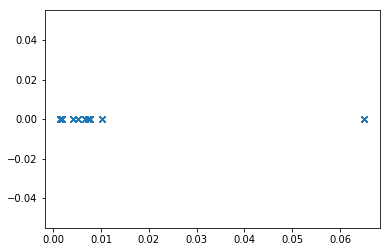

In [22]:
x = np.array(list(results))
plot_at_y(x, 0)

In [24]:
np.median(x)

0.005102807960786668

In [ ]:

def eval_step(self, state, done, rstates):

def eval_episode(self):
    env = self.config.eval_env
    state = env.reset()
    done = True
    rstates = None
    while True:
        if ret is not None:
            break
    return ret    
    
class OriginalReturnWrapper(gym.Wrapper):
    def __init__(self, env):
        gym.Wrapper.__init__(self, env)
        self.total_rewards = 0

    def step(self, action):
        obs, reward, done, info = self.env.step(action)
        self.total_rewards += reward
        if done:
            info['episodic_return'] = self.total_rewards
            self.total_rewards = 0
        else:
            info['episodic_return'] = None
        return obs, reward, done, info

    def reset(self):
        return self.env.reset()  

In [2]:
from models import RTGNBatch
from deep_rl import *
import envs

model = RTGNBatch(6, 128, edge_dim=1)
model.load_state_dict(torch.load('data/A2CRecurrentEvalAgent-batch_three_set-1000000.model'))
model.to(torch.device('cuda'))


def loaded_policy(env): 
    env = gym.make(env)
    b, nr = env.reset()
    total_reward = 0
    start = True
    done = False
    step = 0
    while not done:
        state = [(b, nr)]
        
        with torch.no_grad():
            if start:
                print(state)
                prediction, rstates = model(state)
                start = False
            else:
                prediction, rstates = model(state, rstates)

        choice = prediction['a']
        step += 1
        print(step)
        state, rew, done, _ = env.step(to_np(choice))
        total_reward += rew
        
    return total_reward




In [4]:
print(loaded_policy('TrihexylEval-v0'))

step time mean nan
reset called





[95.30448525488131, -64.6392541443494, -62.45823037896887, 178.73577192306442, 57.9897001548844, -41.527775591770826, 59.6783674974397, -169.96518751713103, 171.0728057074824, 41.568171783441265, 179.10086527163725, -70.6761379841635, 179.65221584588448, 65.97821083616651, -63.14278599893528, 166.89980980751636, -172.6383513274508, 58.74797837152367, 174.47799723918632, -175.40679569748485, -59.625058317229815, -58.70611884428904]
[(Batch(batch=[86], edge_attr=[170, 1], edge_index=[2, 170], pos=[86, 3], x=[86, 3]), [[0, 1, 2, 3], [1, 2, 3, 4], [2, 3, 4, 5], [3, 4, 5, 6], [4, 5, 6, 9], [5, 6, 7, 8], [5, 6, 9, 10], [6, 9, 10, 11], [9, 10, 11, 12], [10, 11, 12, 13], [11, 12, 13, 14], [12, 13, 14, 15], [13, 14, 15, 16], [14, 15, 16, 17], [10, 11, 18, 19], [11, 18, 19, 20], [18, 19, 20, 21], [21, 20, 22, 23], [20, 22, 23, 24], [22, 23, 24, 25], [23, 24, 25, 26], [24, 25, 26, 27]])]
1
action is  [[0 0 0 0 0 5 0 0 5 0 0 1 0 5 0 0 0 1 0 0 0 1]]
standard 14.

14
action is  [[3 5 0 5 0 0 1 0 1 1 0 4 0 0 0 0 0 5 0 0 0 5]]
standard 14.88278294332602
current 24.83766317622818
False
reward is  3.8416697765192894e-05
new state is:
[59.71464116695624, 56.92625723113391, 170.81008945505766, 179.25166610307443, 169.29685572013184, -176.89950897799608, -146.31698897263988, 169.74601994532432, -71.98389843344559, -126.17345739242003, -179.4535467992566, 69.26038950431304, 174.19530052755013, -179.12216717396905, 164.05456198789778, 172.23984374948603, 178.63651547722682, 141.74649844616894, 178.45028421942368, -178.49813177831467, 175.2123082546051, 67.73375066368513]
15
action is  [[3 3 0 1 5 1 0 0 5 0 0 2 0 0 0 0 0 1 0 5 0 0]]
standard 14.88278294332602
current 22.93359539199325
False
reward is  0.0002578969243189445
new state is:
[61.711605011418776, -101.1768430812522, -174.35099053338843, -66.30970791445274, 174.32765991995828, -60.79236711901461, -176.34249618547204, 166.1517092814262, 71.07248349948271, -139.50214264452384, -176.17005075489462,

28
action is  [[5 0 0 0 0 0 0 0 4 0 0 4 0 3 0 0 0 0 0 0 5 0]]
standard 14.88278294332602
current 24.860546582431276
False
reward is  3.754757503551455e-05
new state is:
[68.11736073978719, 175.78342276653677, 179.7098935192823, -173.65303410909172, 173.76551339865827, -177.81069629918193, -152.3960991636773, 161.3686283528037, 55.41948451104381, -177.65925576040402, 168.74130168100254, 64.78215929262939, 176.36054350781816, -68.12697465352305, 139.40785940044086, 175.59052472761874, -140.84319521368303, 174.98162216746155, -171.12489936458388, 177.13068028705288, 70.29632291611173, 175.53158321806205]
29
action is  [[0 5 0 5 1 5 1 0 0 5 0 1 0 0 5 1 0 0 0 2 0 0]]
standard 14.88278294332602
current 40.67945006545221
False
reward is  5.064299729877114e-12
new state is:
[175.2571682005824, -178.11240586055766, 158.9601600190441, 86.82084159126657, 151.85705868394115, 151.17831732027372, 138.2039901092938, -75.12014221177846, -159.14283996213425, 63.69113336986959, 165.05165671862613, -84.5

standard 14.88278294332602
current 33.48323841931462
False
reward is  6.757630011777694e-09
new state is:
[179.5634056221891, -100.26887129159161, 62.93575250218742, 175.28200311645386, -90.52203086012264, -90.95097722005261, 46.12458137587324, 165.04796933753838, 61.13914295892213, -134.22057427128428, 78.58007412180075, 177.20401103309993, 73.97967450719483, 177.19375765013336, 165.1454383805232, 172.88401637134731, -174.71655606948372, -80.58423397021598, 66.01782183972361, 165.36893866930907, -174.19284448423022, -62.18121509378672]
43
action is  [[3 0 1 0 1 5 1 0 0 0 1 5 0 0 0 0 5 1 0 5 0 0]]
standard 14.88278294332602
current 25.180497617778485
False
reward is  2.726647051706709e-05
new state is:
[60.68215116259642, 177.37012198633332, 173.9109999266542, 179.97091554461426, -72.55333405748978, 162.23555079395226, -91.02653057500868, 171.1929772437086, 156.4758405057171, -142.7688584034214, -152.13156538031538, 74.71489785384773, 174.9979305589475, 179.52833830561838, 157.70791596

standard 14.88278294332602
current 21.41964152940519
False
reward is  0.0011720549439451962
new state is:
[-66.97709176398807, -173.73986101484215, -73.48390090636347, -175.02690567894285, 164.05719843073356, -67.64778787833171, -176.48246785044302, 167.35620039421588, 165.2312612526655, -174.9111613100896, 168.87801245421952, 66.42910108701435, 177.7711353242892, -179.20728357385113, 137.35278844511842, -174.81918291754766, -172.00290415120602, 138.5195408513016, 173.0401305334716, -69.14657716132706, -171.23384341347702, -67.24196400669283]
57
action is  [[3 0 0 0 1 0 2 0 0 0 0 4 0 0 0 0 0 5 0 2 0 1]]
standard 14.88278294332602
current 21.96768907986004
False
reward is  0.0006775384467285459
new state is:
[54.61185372371927, 170.00839901361553, 171.59669689689406, 170.50386111106152, -68.35860986804539, 168.67944320336233, -57.056832445433, -165.4909952895348, 171.58906097505354, -138.488629623639, 170.33103933304056, 66.06560941338006, 179.2944859426291, 176.78038728331617, 177.6840

standard 14.88278294332602
current 22.077315663379085
False
reward is  0.000607188760517556
new state is:
[174.05628419568245, 63.28145536059279, -98.78937833092537, -177.0052845429619, 162.1685724451283, 179.73286219155582, 65.67583892295494, 179.58677426621685, -62.208917851409694, -139.91716112580525, -179.90520946795075, 175.79810137971376, 66.90904556806126, 175.86618997801864, 168.59821926466648, -174.97151329732276, -170.48172018973122, 55.96660943557136, 172.10002246084704, -176.7328590326765, -61.52852517153266, -58.903905317166846]
71
action is  [[3 1 0 5 5 0 0 0 5 0 3 1 0 1 0 0 0 0 0 0 1 5]]
standard 14.88278294332602
current 31.420673836033114
False
reward is  5.315631018861643e-08
new state is:
[-57.847052490639804, -60.78696885611749, 179.34221645195962, 67.0768544000937, 143.41169918060604, 140.4518837110998, -172.98525642397686, 169.04945298396032, 72.25249080284685, -166.7395003862047, 61.12026719229673, 175.92965477495397, -177.9419311664165, -66.02694983250329, 160.0

standard 14.88278294332602
current 22.32353915353793
False
reward is  0.00047466829102665674
new state is:
[-174.31292164143753, -68.2040213335113, -178.32124851792784, 178.86958049169007, 164.68302479233887, 168.7584337830326, -105.05824581871812, 174.44652728891128, 58.635639467889035, 58.60146236592928, -176.45001979427252, 177.2249919924605, 178.15435367625562, 179.75219342664178, 171.05821589854284, -156.89717312319448, -162.5480892084821, 72.11364473037564, 179.1260625181809, -61.95474856940151, 99.35058086231896, -178.6611730394627]
85
action is  [[1 3 1 0 0 0 1 0 0 0 0 3 0 0 0 2 0 4 0 0 0 3]]
standard 14.88278294332602
current 25.598345057459163
False
reward is  1.7953953142795328e-05
new state is:
[-61.164106114359555, -55.872061736875345, -61.61319869722575, -174.4468634536541, 165.14007287973115, 170.12081668055998, -75.70902281537884, -175.46045121629598, 164.6898132119001, -130.31211829446897, -179.08794851424648, -70.16077612372436, -178.76802466421398, 177.88975050778248

standard 14.88278294332602
current 19.747612469946265
False
reward is  0.006238798588900081
new state is:
[-178.71118042567144, -177.7163535767106, -172.77541189769724, -54.678205813765565, 173.8023065911024, 172.98760126345462, 78.59138132473207, -159.32191118970383, -53.58465136648698, -161.90235235756336, -178.82246356365806, -178.99503974092056, -176.34898923418848, 179.1958984979727, 68.71518449313095, -177.41118386730824, -76.8723268939566, 163.92069411091381, 139.99271978333772, -179.2240519046657, 175.13547430736313, -68.87389069230771]
99
action is  [[2 0 1 5 0 1 0 5 0 5 5 1 0 0 0 0 0 1 0 1 5 5]]
standard 14.88278294332602
current 20.488027453718388
False
reward is  0.002975382631156393
new state is:
[-69.36836607827978, -172.4397436512738, -73.62366892951532, -176.03751718067193, 166.00213695305305, -67.45374446885205, 179.81168260675426, 90.9910123215021, 171.9788685313926, 68.13105556112889, -179.7183120562595, -68.70694786755263, -175.8594020918077, 178.89986341791334, -17

standard 14.88278294332602
current 17.320455400568832
False
reward is  0.07066459710970516
new state is:
[-178.86420014176446, -179.65664170744256, -177.5728704837372, -173.21868910016087, 179.84762156155324, 178.7826307425731, -65.56636532249185, -174.80811551953298, 168.6624380280369, -140.36252546700644, -178.56445228014138, -176.90049717375712, -179.1556624844448, -176.54351581076514, -172.41915792094068, -171.68811305624723, 74.48626263082008, 175.25472592288665, -177.2076124712185, -177.96723502226519, 179.84706333270313, -179.10122247283283]
113
action is  [[5 0 1 0 0 4 5 0 3 1 0 1 0 0 0 1 5 5 0 1 0 0]]
standard 14.88278294332602
current 21.6967300338923
False
reward is  0.0008884028899965816
new state is:
[178.83489940353704, 178.3589368348807, -177.77657054733308, -173.28363877940055, 173.25525012273147, 96.85606281623545, 60.27253683092317, 164.55299161276625, 62.83826227166555, -95.24257649823141, -179.66481035632938, 178.89987688880004, 179.49283334548906, -179.497972718085

standard 14.88278294332602
current 35.429253455032125
False
reward is  9.65274466241596e-10
new state is:
[72.60909676172146, 23.9260976228247, 161.9957798799898, 97.60867834842762, 179.8309372947759, -179.82782225434502, -128.98685657817117, 133.9643992443006, 158.24823388962116, 63.841086040668536, 169.95348058003924, 68.49416500895155, -172.50101536736685, 71.24552571195244, 178.4536443977153, -177.85422540107947, -174.33548729348342, 143.84041146063083, 175.39577621021272, -53.30185457554592, -160.61599403101175, -177.9896982169718]
127
action is  [[3 1 0 0 0 5 1 0 0 0 0 0 0 0 0 3 0 5 5 0 0 1]]
standard 14.88278294332602
current 31.164092216461665
False
reward is  6.870475710622345e-08
new state is:
[64.60688497683871, -98.0256982866299, 174.87610308023702, -177.624963529447, 172.24930196420746, 113.16205282008664, -69.82694398053697, -178.31369056672858, 168.18097917017448, -135.83385696274684, 70.89342796285104, -175.46353204121192, -175.4929452379049, -177.63576289059904, 166.19

standard 14.88278294332602
current 22.4769230457741
False
reward is  0.0004071706288813014
new state is:
[-174.72356859137778, -69.29751991431489, -176.63391152929728, 178.37884480669925, 74.99030626613064, 64.98366913108764, -153.9202168190848, -167.39586405194706, -53.48440889395394, -168.0779804804898, 179.61059316221127, -178.49967572293139, 179.9332876004855, 71.19891772383116, 127.9427805123193, -176.99595568662969, -139.15999805823603, 175.44433288674352, -176.336367592572, 178.85913395322356, 171.56598744889195, 59.870643943834324]
141
action is  [[3 5 1 0 5 1 5 0 5 0 0 0 0 0 0 0 0 0 0 1 5 0]]
standard 14.88278294332602
current 26.440389623806578
False
reward is  7.735079447451582e-06
new state is:
[56.90496956636946, 60.55152474714966, -179.97555203964257, -175.34425692434795, 167.55887692904213, -44.04190625964662, 63.373840782362635, -171.60310811915934, 160.84439402789394, -173.004744551665, 169.26073443461766, -178.94797399003303, 179.76734507150277, 179.55927119801933, 14

standard 14.88278294332602
current 20.744227805731256
False
reward is  0.002302907129691285
new state is:
[60.60643695231783, 171.82436406119513, -176.9694987915813, -177.82496753140916, 177.19264792283673, -60.318298524232475, -178.66656988638718, 179.91355059110396, 163.8342834985265, -145.71452735660003, 166.209651237169, 174.2122176601674, 173.93756602692284, 175.4947909699942, 174.78227597911877, -169.8977097500114, -173.60964997505891, 50.27025961203814, 170.73492973491287, -82.51538064721932, 177.3955741522746, 172.41228968936068]
155
action is  [[0 5 0 0 0 1 1 0 0 1 5 0 0 0 0 0 0 0 0 0 0 0]]
standard 14.88278294332602
current 21.279747708033344
False
reward is  0.0013480409521031361
new state is:
[171.17246659520578, 59.61858964165096, 177.14011372879366, -64.98499580630904, 174.80030936050622, -63.85626457473508, -176.94032686780037, 176.80391676653127, 173.0020386186945, -136.55707110437598, 74.63011423745495, 178.1456357189242, -177.24522811671216, 179.2279435622842, -178.23

standard 14.88278294332602
current 17.619117477779444
False
reward is  0.05241970772187463
new state is:
[178.4006639387264, 70.55556843815144, 178.45948868884332, -169.68440522223264, 177.90503987322998, -62.037056771831296, -175.37990921762182, 173.15056253033492, 161.44253368431708, -174.60040161513368, 167.0459686561983, 64.32491422767231, 177.31121694371774, -177.81033546819117, 142.78797556531043, 179.8261680686323, -171.00943052004308, -71.62623490439017, 168.94084008008474, 56.99044590822119, 59.10999305435796, 173.89414363365267]
169
action is  [[2 3 0 0 1 0 5 0 1 0 1 1 0 5 0 0 0 5 0 4 1 0]]
standard 14.88278294332602
current 28.81242628909068
False
reward is  7.216096695665903e-07
new state is:
[-58.68619446994549, -58.71805789952309, -171.25418301490024, 177.01371060862522, -90.34649888368475, 171.67256913250682, 67.75218530306935, 170.9173548297235, -66.89509260914579, -164.5180910293745, -101.51402801290557, 174.70211292568013, 178.7948184703138, -179.91165991263418, 144.3

standard 14.88278294332602
current 24.748274204753823
False
reward is  4.200888628796762e-05
new state is:
[-64.36383009220121, -173.55742819150163, 168.0976568851503, 73.59570509758431, 153.6734361377974, 138.95361936813813, -175.95640580587192, 174.01275312356663, -68.2460462582125, -171.25678138852177, 172.07904608267182, 178.9586970140927, -177.8934998835988, 179.23209073974613, 143.61382646349261, 177.56168220334104, -167.91000112173467, 57.925235000320015, 167.75361112199286, 68.21102578935621, -178.44211363190036, -64.67752030384761]
183
action is  [[0 1 4 0 5 0 5 0 1 5 0 0 0 0 0 0 5 5 0 1 5 0]]
standard 14.88278294332602
current 21.628367137113674
False
reward is  0.0009512607802472851
new state is:
[-174.25985177033328, -179.76454011114083, 80.4770300817788, -168.7218720653747, 57.08850094392904, -179.84207642625958, 59.69008324692315, 177.01289511302738, -84.21245477263963, 87.3375057753067, -177.0302617170536, -179.61279388327353, -179.1911587668651, -178.3797149115127, 161.

standard 14.88278294332602
current 22.908028356593967
False
reward is  0.0002645755972440379
new state is:
[68.69412814007312, 177.14693256352922, -175.82388922966953, -169.9111657398639, 176.76753704435603, -179.77992589181244, -134.6343171786188, -172.63131265322417, 177.2218074051521, -163.68690870782171, -176.85320593250145, -176.06928367700942, -176.79284512892423, -178.48042370660454, 107.465425256795, -176.48777067654828, -163.27165751494996, 140.64346060655112, 177.22032655535034, -179.8902934627333, 68.31879902901454, 173.4476901578031]
197
action is  [[3 0 0 5 0 1 3 0 2 0 0 1 0 0 0 5 0 5 0 0 0 0]]
standard 14.88278294332602
current 23.568588561905024
False
reward is  0.00013666966598724768
new state is:
[-66.62864585634195, -177.71868636732185, -176.84241852125714, 99.5978706203144, 163.50799119586387, -177.68590173566957, 61.794788408153316, 171.49858886824217, -66.6178093402161, -143.0257375311626, -177.97260707181564, 179.93530545705232, -178.74488291066075, -179.361263388

In [ ]:
with open('test_mol.pickle', 'rb') as fp:
    